In [1]:
from scipy.io.arff import loadarff 

import pandas as pd

import tensorflow as tf
tf.compat.v1.enable_eager_execution()
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras import initializers
from tensorflow.keras.utils import to_categorical 

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import MinMaxScaler
from sklearn.decomposition import PCA

import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

import numpy as np

In [2]:
def loadDataSet(path):
    raw_data = loadarff(path)
    df =pd.DataFrame(raw_data[0])
    print("dataset size:", df.values.shape)
    X = df.iloc[:,:-1]
    y = df.iloc[:,-1]
    
    # encode class values as integers
    encoder = LabelEncoder()
    encoder.fit(y)
    encoded_Y = encoder.transform(y)
    # convert integers to dummy variables (i.e. one hot encoded)
    y = to_categorical(encoded_Y)
    scaler = MinMaxScaler()
    scaler.fit(X)
    X = scaler.transform(X)
    scaler.fit(y)
    y = scaler.transform(y)
    X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                        test_size=0.15,
                                                        stratify= y,
                                                        random_state=34)
    input_shape = X_train.shape[1]
    output_shape = y_train.shape[1]
    return X_train, X_test, y_train, y_test, input_shape, output_shape

In [3]:
def createModel(X_train, y_train, input_shape, output_shape, epochs):

    # sequential model
    model = keras.Sequential()
    
    # first layer
    model.add(layers.Dense(units=64,
                           kernel_initializer=initializers.RandomUniform(minval=-5, maxval=5, seed=None),
                           bias_initializer=initializers.RandomUniform(minval=-5, maxval=5, seed=None),
                           input_shape=(input_shape,),
                           activation='sigmoid'))
    
    # output layer
    model.add(layers.Dense(units=output_shape,
                           kernel_initializer=initializers.RandomUniform(minval=-5, maxval=5, seed=None),
                           bias_initializer=initializers.RandomUniform(minval=-5, maxval=5, seed=None),
                           activation='softmax'))
    
    # compile model
    model.compile(loss='binary_crossentropy',
                  optimizer=keras.optimizers.Adam(learning_rate=0.01),
                  metrics=['accuracy'])
    # fit model
    model.fit(X_train, y_train,
             validation_split=0.2,
             epochs=epochs,
             batch_size = 10,
             verbose=0)
    return model

In [4]:
def plotAccuracy(model):
    # "Acc"
    plt.plot(model.history.history['acc'])
    plt.plot(model.history.history['val_acc'])
    plt.title('model acc')
    plt.ylabel('acc')
    plt.xlabel('epoch')
    plt.legend(['train', 'validation'], loc='upper left')
    plt.show()

In [5]:
def createRandWeightsSingleLayer(layer,sigma):
    weights = layer.get_weights()[0]
    biases = layer.get_weights()[1]
    r0 = np.random.normal(loc=0, scale=sigma)
    r1 = np.random.normal(loc=0, scale=sigma)
    weights+= r0
    biases+= r1
    r = [r0,r1]
    print(r)
    return r

In [6]:
def getModelWeightT_1(model,sigma):
    w_t = model.get_weights() # weights of last epoch
    model_weight = []
    for i, layer in enumerate(model.layers):
        r = createRandWeightsSingleLayer(layer,sigma)
        w_l = [w_t[2*i], w_t[2*i+1]]
        w_t_1 = np.add(w_l, r)
        model_weight.append(w_t_1[0])
        model_weight.append(w_t_1[1])
    return model_weight

In [7]:
def getScore(model,w_t, w_t_1, X_train, y_train):
    model.set_weights(w_t_1)
    score = model.evaluate(X_train, y_train)
    model.set_weights(w_t)
    return score[1]

In [8]:
def metropolis(model, sigma, n, initial_weights):
    model.set_weights(initial_weights)
    new_weights = []
    new_scores = []
    max_weights = model.get_weights()
    max_score =  getScore(model,max_weights, max_weights, X_train, y_train)
    acceptance = 0
    for i in range(n):
        w_t = model.get_weights()

        # ilk w_t modelin eski halini koruması için
        score_t = getScore(model,w_t, w_t, X_train, y_train)

        w_t_1 = getModelWeightT_1(model,sigma)

        if i == 0:
            new_weights.append(w_t)
            new_scores.append(score_t)

        score_t_1 = getScore(model,w_t, w_t_1, X_train, y_train)

        alpha = score_t_1/score_t

        if (alpha)>=1:
            model.set_weights(w_t_1)
            new_weights.append(w_t_1)
            new_scores.append(score_t_1)
            w_t = w_t_1
            acceptance += 1
            if  score_t_1>max_score:
                max_score = score_t_1
                max_weights = w_t_1


        if  alpha < 1:
            alpha = np.power(alpha,11)
            toss = np.random.choice(2,1,p=[alpha,1-alpha])
            if(toss[0] == 0):
                model.set_weights(w_t_1)
                new_weights.append(w_t_1)
                new_scores.append(score_t_1)
                w_t = w_t_1
                acceptance += 1
            
    
    return new_weights,new_scores, max_weights, max_score, acceptance
    


In [9]:
def plotScore(weights, scores, title):
 
    pca = PCA(n_components=2)

    aw = np.concatenate(weights[0], axis=None)
    for i in range(1,len(weights)):
        w = np.concatenate(weights[i], axis=None)
        aw = np.vstack((aw,w))
    df = pd.DataFrame(aw)
    
    
    principalComponents = pca.fit_transform(df)
    principalDf = pd.DataFrame(data = principalComponents
                 , columns = ['weights 1', 'weights 2'])

    scores = pd.DataFrame(scores, columns=['scores'])
    finalDf = pd.concat([principalDf, scores], axis = 1)

    fig = plt.figure()
    ax = fig.gca(projection='3d')
    x = finalDf['weights 1']
    y = finalDf['weights 2']
    z = finalDf['scores']
    ax.scatter(x, y, z,color='red',label="scores", marker='o', s=1) #
    ax.legend()
    ax.set_xlabel('Weights 1')
    ax.set_ylabel('Weights 2')
    ax.set_zlabel('Score')
    ax.set_title(title)
    
    plt.show()

In [10]:
def metropolisDiffrentSigmas(model, sigmas, n_iter, initial_weights):
    model_ = model
    new_weights_list = []
    new_scores_list = []
    max_weigths_list = []
    max_score_list = []
    acceptance_ratios = []
    for i, sigma in enumerate(sigmas):
        new_weights, new_scores, max_weigths, max_score, acceptance = metropolis(model_, sigma, n_iter,initial_weights)
        new_weights_list.append(new_weights)
        new_scores_list.append(new_scores)
        max_weigths_list.append(max_weigths)
        max_score_list.append(max_score)
        ar = acceptance*100/n_iter
        acceptance_ratios.append(ar)
    return new_weights_list, new_scores_list, max_weigths_list, max_score_list, acceptance_ratios

In [11]:
def plotAllScores(model_name, sigmas,new_weights_list, new_scores_list, max_weigths_list, max_score_list, acceptance_ratios):
    
    for i in range(len(sigmas)):
        title = "MCMC İle Hata-Parametre Yüzeyleri"
        title +="\nDataset:" + str(model_name) + "  Sigma:"+str(sigmas[i])+"\n\n"
        plotScore(new_weights_list[i], new_scores_list[i],title)
        print("initial score:\t\t{} \n max score:\t\t{} \n acceptance ratio:\t\t{} \n\n".format(new_scores_list[i][0],max_score_list[i],acceptance_ratios[i]))

In [12]:
sigmas = [0.0001, 0.001, 0.01, 0.1, 1, 10, 100]
n_iter = 1000

In [13]:
## ************************************************************************************************************* ##

In [14]:
path = './36uci/waveform.arff'

X_train, X_test, y_train, y_test, input_shape, output_shape = loadDataSet(path)
model = createModel(X_train, y_train, input_shape, output_shape, 30)
model.summary()

dataset size: (5000, 41)
Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where
Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 64)                2624      
_________________________________________________________________
dense_1 (Dense)              (None, 3)                 195       
Total params: 2,819
Trainable params: 2,819
Non-trainable params: 0
_________________________________________________________________


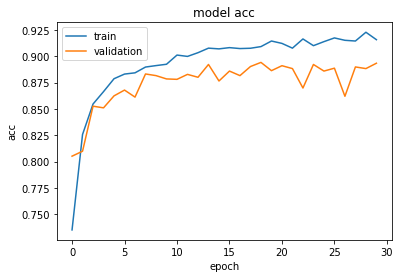

In [15]:
plotAccuracy(model)

In [16]:
initial_weights = model.get_weights() # weights of last epoch

In [17]:
new_weights_list, new_scores_list, max_weigths_list, max_score_list, acceptance_ratios = metropolisDiffrentSigmas(model, sigmas, n_iter, initial_weights)

4250/4250 [==============================] - 0s 15us/sample - loss: 0.1790 - acc: 0.9222
[-6.394767335602303e-05, -1.4820368651827959e-05]
[-0.00021469428689763396, 5.523799454428867e-05]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.1791 - acc: 0.9223
[3.1206556099078996e-05, -9.596268218202207e-05]
[-7.565108151409824e-05, -5.284455360105054e-05]
4250/4250 [==============================] - 0s 17us/sample - loss: 0.1791 - acc: 0.9223
[-0.00019719123523441587, -1.802918189537491e-05]
[-6.177069521213891e-05, 5.015447317347798e-05]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.1792 - acc: 0.9223
[-7.507612775986325e-05, 3.951074876377295e-05]
[2.0674511439941198e-05, -7.269550189835563e-05]
4250/4250 [==============================] - 0s 18us/sample - loss: 0.1792 - acc: 0.9223
[-7.693672034977082e-05, 0.00014806404988229222]
[8.870987562059482e-05, -9.233846406210022e-06]
4250/4250 [==============================] - 0s 13us/sample - loss

4250/4250 [==============================] - 0s 17us/sample - loss: 0.1793 - acc: 0.9223
[-0.00011243564646010838, -3.1006864498360425e-05]
[0.00010641632377440711, -0.00014125860086323952]
4250/4250 [==============================] - 0s 16us/sample - loss: 0.1793 - acc: 0.9223
[-3.2174190241188885e-05, -7.619550483563456e-05]
[6.59025991987235e-05, -0.00011613505835693253]
4250/4250 [==============================] - 0s 16us/sample - loss: 0.1794 - acc: 0.9223
[5.971998875607406e-05, 5.4693521978988597e-05]
[5.556177440799928e-05, -0.00010590597555865301]
4250/4250 [==============================] - 0s 13us/sample - loss: 0.1793 - acc: 0.9223
[-3.6153710865532445e-05, -0.00029280856691644356]
[1.3060854031252461e-05, 0.00020182031526752133]
4250/4250 [==============================] - 0s 18us/sample - loss: 0.1794 - acc: 0.9223
[0.0001225708015042231, 0.00012719698014251025]
[-8.931761236422946e-05, 2.095781171387936e-05]
4250/4250 [==============================] - 0s 16us/sample - l

4250/4250 [==============================] - 0s 14us/sample - loss: 0.1794 - acc: 0.9223
[-1.8868469445435402e-05, -0.00018285338992794472]
[0.00010820406453970803, 1.2794062746062853e-05]
4250/4250 [==============================] - 0s 17us/sample - loss: 0.1794 - acc: 0.9223
[9.59936663109612e-05, 6.227350828133002e-06]
[-8.122044729208365e-05, 6.76660113618568e-05]
4250/4250 [==============================] - 0s 12us/sample - loss: 0.1793 - acc: 0.9223
[-0.0001659210121381358, 7.101577837273356e-05]
[-9.798805212441366e-05, -0.00010423366632975578]
4250/4250 [==============================] - 0s 17us/sample - loss: 0.1794 - acc: 0.9223
[0.00011063398655002102, -7.073524372615907e-05]
[8.251942907301888e-05, -9.868290200349727e-05]
4250/4250 [==============================] - 0s 17us/sample - loss: 0.1794 - acc: 0.9223
[-1.7154205924329613e-05, 0.00016236446214881785]
[-1.3612890524023911e-06, -8.310720000534932e-05]
4250/4250 [==============================] - 0s 18us/sample - loss:

4250/4250 [==============================] - 0s 17us/sample - loss: 0.1795 - acc: 0.9221
[0.00015430088558507528, 0.00020592758181050752]
[-2.9409556466149475e-05, 8.078222346749685e-05]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.1794 - acc: 0.9223
[-0.00013411544143001792, 1.6317992757838735e-05]
[8.793249428391e-05, 7.009587666280096e-06]
4250/4250 [==============================] - 0s 16us/sample - loss: 0.1795 - acc: 0.9221
[0.00021368169005834045, -0.00026026727171783064]
[7.050898647286076e-05, -2.1232470632055334e-06]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.1794 - acc: 0.9223
[0.00014988035289681238, -5.767116281957907e-05]
[-4.682151144690841e-05, -4.032832014709553e-06]
4250/4250 [==============================] - 0s 16us/sample - loss: 0.1793 - acc: 0.9223
[0.00012344017130689282, -4.554218370335908e-05]
[5.1341178568030695e-06, 4.986114059867567e-05]
4250/4250 [==============================] - 0s 17us/sample - loss: 0

4250/4250 [==============================] - 0s 13us/sample - loss: 0.1791 - acc: 0.9223
[-3.027779703601133e-05, 0.00011728213543662137]
[-2.997260901081229e-05, 1.556305055536069e-05]
4250/4250 [==============================] - 0s 17us/sample - loss: 0.1791 - acc: 0.9223
[9.4016240647659e-05, -5.128689567371183e-05]
[-8.6042597502167e-05, 9.755253280850129e-05]
4250/4250 [==============================] - 0s 17us/sample - loss: 0.1790 - acc: 0.9222
[5.7142579185328125e-05, 1.1776166979939776e-06]
[2.6781507947898156e-05, 6.129805103978921e-05]
4250/4250 [==============================] - 0s 16us/sample - loss: 0.1790 - acc: 0.9224
[-0.00011760581835429809, -7.585034819468747e-05]
[-0.00014035855740326172, 0.00022788124021288697]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.1791 - acc: 0.9223
[4.700300184062793e-06, -1.7023766606352775e-05]
[9.446539529027192e-05, -8.121173117858757e-05]
4250/4250 [==============================] - 0s 16us/sample - loss: 0.17

4250/4250 [==============================] - 0s 13us/sample - loss: 0.1787 - acc: 0.9222
[-3.1079478411848905e-06, 6.0137104659382225e-05]
[-9.662268042366352e-05, -0.000152304722424282]
4250/4250 [==============================] - 0s 13us/sample - loss: 0.1787 - acc: 0.9222
[4.038988750428656e-05, -4.2650459709943134e-05]
[5.852056095966469e-06, -9.790497072707124e-05]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.1787 - acc: 0.9222
[-0.0001051350174747902, -0.0001872140285469289]
[-9.358378597379973e-05, -8.439253146335278e-05]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.1787 - acc: 0.9220
[-0.0001421417330874209, -0.00013347454700303474]
[0.00012231220268706702, -8.10929367906431e-05]
4250/4250 [==============================] - 0s 16us/sample - loss: 0.1788 - acc: 0.9220
[1.6439250457516207e-05, 0.00010466296120548864]
[9.16904399009418e-05, -4.783621919949511e-05]
4250/4250 [==============================] - 0s 13us/sample - loss: 

4250/4250 [==============================] - 0s 13us/sample - loss: 0.1785 - acc: 0.9223
[1.528418121670859e-05, -0.0001083223092884825]
[-0.00016485723423352586, 1.2692422258642562e-05]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.1785 - acc: 0.9223
[4.4974937363954014e-05, 8.72881115648299e-05]
[-6.355497144606681e-05, -0.0001941941611779055]
4250/4250 [==============================] - 0s 16us/sample - loss: 0.1785 - acc: 0.9223
[3.1788341092204755e-05, -0.0001189235173989645]
[-0.0002358985125654647, -4.8452330774706416e-05]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.1785 - acc: 0.9223
[0.00022704785589508562, -0.00011418519352095762]
[-8.699685493233718e-05, -0.000109139043406376]
4250/4250 [==============================] - 0s 16us/sample - loss: 0.1784 - acc: 0.9224
[2.2331163487284186e-05, -6.652648273227045e-05]
[3.3597504158894384e-05, -8.126830251458785e-05]
4250/4250 [==============================] - 0s 14us/sample - loss

4250/4250 [==============================] - 0s 15us/sample - loss: 0.1787 - acc: 0.9222
[-3.261602404576707e-05, 5.262187741482211e-05]
[7.3113720391386465e-06, -4.419839121190944e-06]
4250/4250 [==============================] - 0s 13us/sample - loss: 0.1787 - acc: 0.9222
[-1.287328774633142e-05, -1.2953548170749864e-06]
[4.913063798900667e-05, 4.376506494600363e-05]
4250/4250 [==============================] - 0s 13us/sample - loss: 0.1787 - acc: 0.9222
[0.0001887060267251303, -0.00011571762621506952]
[1.7034070508154738e-05, 1.7867981518138833e-05]
4250/4250 [==============================] - 0s 13us/sample - loss: 0.1786 - acc: 0.9222
[4.9407629611285494e-05, -0.00010162719290554236]
[-0.00022374194694330327, -0.00014868309414746352]
4250/4250 [==============================] - 0s 13us/sample - loss: 0.1786 - acc: 0.9223
[-5.748182190437842e-06, 6.638965297149947e-05]
[3.259517415128119e-05, 5.961236282553028e-05]
4250/4250 [==============================] - 0s 15us/sample - loss:

4250/4250 [==============================] - 0s 17us/sample - loss: 0.1789 - acc: 0.9221
[-1.3433839131978001e-05, -2.105083884650728e-05]
[3.193352795142737e-05, 3.5675819885290376e-05]
4250/4250 [==============================] - 0s 16us/sample - loss: 0.1789 - acc: 0.9221
[-0.00016207759820706337, -1.2752887903875377e-05]
[9.320488253447654e-05, -2.2383613612671625e-05]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.1790 - acc: 0.9224
[5.831545147442757e-05, -6.641071350398428e-05]
[-6.033107777585282e-05, 0.00012636455202070927]
4250/4250 [==============================] - 0s 13us/sample - loss: 0.1790 - acc: 0.9221
[0.000142735576025375, -6.691355402681726e-05]
[5.622460811378907e-06, -0.00017277355477366435]
4250/4250 [==============================] - 0s 17us/sample - loss: 0.1789 - acc: 0.9220
[6.4786782100303e-08, 1.3908411918183543e-05]
[-3.686323643522399e-05, -8.601560478257566e-05]
4250/4250 [==============================] - 0s 16us/sample - loss: 0

4250/4250 [==============================] - 0s 14us/sample - loss: 0.1794 - acc: 0.9223
[6.849526378128318e-05, 8.563059680546107e-05]
[-5.2562453184730854e-05, 0.00023684213202623396]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.1793 - acc: 0.9223
[1.352218019420032e-05, -8.182382925586709e-07]
[6.570783130597208e-05, -0.00012529268383454318]
4250/4250 [==============================] - 0s 13us/sample - loss: 0.1793 - acc: 0.9223
[-0.00022410990415347649, 0.00010203778564321746]
[-1.9149177274599183e-06, -1.4066625316395954e-05]
4250/4250 [==============================] - 0s 16us/sample - loss: 0.1794 - acc: 0.9223
[0.00015028300794071685, 7.149418781937964e-05]
[0.0001720848521119616, 0.00011741447613076391]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.1794 - acc: 0.9223
[1.0197166444079228e-05, -0.00020071602278944558]
[-2.677754377048624e-05, -0.00010534645006251193]
4250/4250 [==============================] - 0s 15us/sample - lo

4250/4250 [==============================] - 0s 14us/sample - loss: 0.1794 - acc: 0.9223
[-5.432044511593961e-05, 5.3256026194307404e-05]
[-4.7183654744511204e-05, -4.685044762113351e-05]
4250/4250 [==============================] - 0s 13us/sample - loss: 0.1794 - acc: 0.9223
[5.5233485888518986e-05, -0.00019811805660265692]
[1.2840940337315152e-05, 0.00018978508533046685]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.1794 - acc: 0.9223
[3.762725466314968e-05, 2.5885644716367634e-06]
[-7.940412891908853e-05, -0.00020470671609321253]
4250/4250 [==============================] - 0s 17us/sample - loss: 0.1794 - acc: 0.9223
[-8.481183312703581e-05, 1.3582332193590657e-05]
[9.10060438061651e-05, 8.82768500530044e-05]
4250/4250 [==============================] - 0s 17us/sample - loss: 0.1794 - acc: 0.9223
[0.00010765031044614553, 5.480779829081244e-05]
[-3.6392460219685993e-06, 0.00028801684535989053]
4250/4250 [==============================] - 0s 16us/sample - loss:

4250/4250 [==============================] - 0s 18us/sample - loss: 0.1800 - acc: 0.9220
[1.49439485425892e-05, -5.979638703498638e-05]
[-9.581018978849344e-05, 2.2796072765006212e-05]
4250/4250 [==============================] - 0s 16us/sample - loss: 0.1800 - acc: 0.9220
[0.00013793648226394966, -0.0002514809259106034]
[-5.9120559418863084e-05, -2.168496636848672e-05]
4250/4250 [==============================] - 0s 13us/sample - loss: 0.1799 - acc: 0.9221
[-2.420616695016655e-05, -0.00013004443784942122]
[6.118570021611745e-06, 7.65306184021591e-05]
4250/4250 [==============================] - 0s 13us/sample - loss: 0.1799 - acc: 0.9221
[-0.00013255447156192675, 0.00011001236273822198]
[-6.052936344991732e-07, 4.990788334917753e-06]
4250/4250 [==============================] - 0s 13us/sample - loss: 0.1800 - acc: 0.9220
[-6.920265432895335e-06, 6.155056275052488e-05]
[1.4749278884755371e-05, -0.0002082578440052416]
4250/4250 [==============================] - 0s 13us/sample - loss: 0

4250/4250 [==============================] - 0s 14us/sample - loss: 0.1803 - acc: 0.9220
[7.250064490093742e-05, 0.00014541650196242943]
[-0.00012127458303767722, 6.329392203215941e-05]
4250/4250 [==============================] - 0s 18us/sample - loss: 0.1802 - acc: 0.9220
[1.650914935211141e-05, 0.0001309758983184144]
[-5.781207650396084e-05, 0.00010848427567591611]
4250/4250 [==============================] - 0s 17us/sample - loss: 0.1802 - acc: 0.9220
[-0.00012779946350935164, -2.706340000945632e-05]
[6.791554561680619e-05, 6.01700811821751e-05]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.1803 - acc: 0.9220
[-8.774253586142946e-05, -7.49538006936523e-05]
[8.704832625570283e-05, -0.00016731176303282403]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.1803 - acc: 0.9218
[-4.3041445538880085e-05, 5.280205645462437e-06]
[-1.880499925077407e-05, 0.00011604502840267773]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.1

4250/4250 [==============================] - 0s 15us/sample - loss: 0.1805 - acc: 0.9216
[-3.214080363659957e-05, 4.056298832053837e-05]
[-4.170168941369016e-05, 4.643469738909343e-05]
4250/4250 [==============================] - 0s 16us/sample - loss: 0.1806 - acc: 0.9216
[7.302659532193942e-05, -3.3726307002420415e-05]
[-0.00010711178448149391, -1.097617195243547e-05]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.1805 - acc: 0.9216
[3.112905854545045e-05, -0.00013064799707966255]
[-0.00014621491740342862, -0.00013943304510200333]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.1805 - acc: 0.9216
[1.2626360536358759e-05, -3.763075618465215e-06]
[-9.71775492906519e-05, -0.0002558538558396314]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.1805 - acc: 0.9216
[0.00014274775626735205, 0.00028788095651309894]
[-2.793350605056552e-05, -0.00012993039895245766]
4250/4250 [==============================] - 0s 14us/sample - lo

4250/4250 [==============================] - 0s 15us/sample - loss: 0.1805 - acc: 0.9216
[-0.0001617926130447761, 6.517812260847488e-05]
[-0.00012753500789622425, 5.48758330443329e-05]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.1806 - acc: 0.9216
[-8.620710089172363e-05, 5.294151993850118e-05]
[0.00018459208229372202, -4.0473773486078095e-05]
4250/4250 [==============================] - 0s 13us/sample - loss: 0.1806 - acc: 0.9216
[0.00017098382609867743, 2.35370210064682e-05]
[6.562881766394167e-05, -0.00010906865794161916]
4250/4250 [==============================] - 0s 13us/sample - loss: 0.1805 - acc: 0.9216
[7.20839389523725e-05, 4.5972071659624963e-05]
[1.395159203803763e-07, -0.00017035022019214023]
4250/4250 [==============================] - 0s 13us/sample - loss: 0.1805 - acc: 0.9216
[2.778864938508316e-05, -5.189900110469841e-05]
[-8.9676194902885e-05, 0.00010074350607620702]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.1805

4250/4250 [==============================] - 0s 13us/sample - loss: 0.1808 - acc: 0.9211
[-5.655926566134681e-06, 0.00013665204262070532]
[0.0001942514566029513, -1.7650555224556132e-05]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.1808 - acc: 0.9211
[-0.00014478476541448544, -0.00014400897044253316]
[3.973889639651785e-05, 3.516178243705205e-05]
4250/4250 [==============================] - 0s 17us/sample - loss: 0.1809 - acc: 0.9207
[0.00015828064352341333, -7.8309659653098e-05]
[0.0001681255850917167, 0.00015757513894610432]
4250/4250 [==============================] - 0s 13us/sample - loss: 0.1808 - acc: 0.9211
[6.940709741985077e-05, 0.0002048688769005855]
[1.2446902024722149e-05, 4.8843837341997856e-05]
4250/4250 [==============================] - 0s 16us/sample - loss: 0.1807 - acc: 0.9213
[-0.00020519829570469762, 2.3628936935889938e-05]
[0.00010056205111999382, 3.65903590541585e-06]
4250/4250 [==============================] - 0s 13us/sample - loss: 0.1

4250/4250 [==============================] - 0s 14us/sample - loss: 0.1804 - acc: 0.9218
[0.00029439389573972545, -8.682975680107528e-05]
[-8.057157853058945e-06, 0.0002293790600523686]
4250/4250 [==============================] - 0s 16us/sample - loss: 0.1803 - acc: 0.9220
[3.738079805646214e-05, 1.799472461454119e-05]
[-7.28471873603757e-06, 4.568710594154214e-05]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.1802 - acc: 0.9220
[0.00016246553668944742, 3.715076091966639e-05]
[-2.7207641228629177e-05, 3.0570500630769215e-05]
4250/4250 [==============================] - 0s 16us/sample - loss: 0.1802 - acc: 0.9220
[2.911633669190119e-05, 0.0002566931794889483]
[-0.0002863686796717646, -8.031630660896739e-05]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.1801 - acc: 0.9220
[-9.45634494407371e-06, 0.00018593842609540784]
[0.00031330395873015713, -6.158628331574588e-05]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.180

4250/4250 [==============================] - 0s 13us/sample - loss: 0.1804 - acc: 0.9217
[3.649758896563738e-05, -4.0241529832345704e-05]
[-0.00012920851950069673, -3.199866777457087e-05]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.1804 - acc: 0.9218
[-0.00012943642302283125, -4.336008159545777e-06]
[-0.00010764377640977661, 0.00011227557588142374]
4250/4250 [==============================] - 0s 13us/sample - loss: 0.1805 - acc: 0.9216
[-6.088249334104076e-05, -0.00018449059599566248]
[0.00019714678193677682, -0.00011198717198481948]
4250/4250 [==============================] - 0s 17us/sample - loss: 0.1805 - acc: 0.9216
[8.473133673910746e-05, 6.250927044228872e-05]
[1.652185112244794e-05, 0.00010070134480359613]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.1805 - acc: 0.9216
[-0.00013896101337196171, -8.200561515040061e-06]
[5.292354290351997e-05, -4.406810426389574e-05]
4250/4250 [==============================] - 0s 14us/sample - l

4250/4250 [==============================] - 0s 13us/sample - loss: 0.1802 - acc: 0.9220
[0.00010398678471674855, 5.430498519016313e-05]
[-0.00013694769041430467, 0.00014686918686196394]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.1802 - acc: 0.9220
[-3.741426682347384e-05, -6.150598626050786e-05]
[-8.017906370965772e-07, 7.410741331629624e-05]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.1802 - acc: 0.9220
[2.5398100763227957e-06, 0.00015573645039101787]
[0.00010032826877296022, -1.3192150552424984e-06]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.1802 - acc: 0.9220
[-7.852155745731732e-05, -1.4527106991754322e-05]
[-0.00010287417337426104, 2.920039992633139e-05]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.1802 - acc: 0.9220
[6.538016584231619e-05, -0.00024946752619229174]
[2.1823820224933933e-05, -4.127351118551408e-05]
4250/4250 [==============================] - 0s 14us/sample - lo

4250/4250 [==============================] - 0s 15us/sample - loss: 0.1804 - acc: 0.9218
[-7.626356978197037e-05, 3.476305176117818e-05]
[-1.58127505887056e-05, 2.3125270725557936e-06]
4250/4250 [==============================] - 0s 13us/sample - loss: 0.1804 - acc: 0.9218
[5.993658815851743e-08, 0.00015684563473306216]
[-5.7218776693724974e-05, -0.00012974448624772966]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.1804 - acc: 0.9218
[0.0001882802995809543, 8.071217194618724e-05]
[-2.362242609594254e-05, 7.649776652567359e-05]
4250/4250 [==============================] - 0s 17us/sample - loss: 0.1803 - acc: 0.9220
[-0.00011100417627163453, -1.2899368213086762e-05]
[3.996493311097576e-06, 0.00010883005008302465]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.1804 - acc: 0.9218
[6.180727342962967e-05, -0.00010456518376353523]
[0.00023623968986102186, -0.0001981559810276123]
4250/4250 [==============================] - 0s 15us/sample - loss: 

4250/4250 [==============================] - 0s 15us/sample - loss: 0.1801 - acc: 0.9218
[-1.957060079481708e-05, -6.620060601757766e-05]
[-2.4255318025950864e-05, 0.00014498983012037957]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.1801 - acc: 0.9220
[2.586457595772356e-05, -5.1216726617316736e-05]
[-0.00017104184777925235, -6.275609242316192e-05]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.1801 - acc: 0.9218
[8.001428975778707e-05, 7.272755960160125e-06]
[-0.00011828746287667674, -4.1339451915305347e-05]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.1801 - acc: 0.9218
[-3.069598017242498e-05, -7.739765940413102e-05]
[1.1307381748016428e-05, 4.874554260896355e-05]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.1801 - acc: 0.9218
[-1.9375796679023353e-05, 7.191240153488055e-05]
[0.00015879122540958784, 0.0002035176303240722]
4250/4250 [==============================] - 0s 16us/sample - los

4250/4250 [==============================] - 0s 14us/sample - loss: 0.1805 - acc: 0.9216
[-3.652816887136304e-05, -1.0218176633438054e-05]
[-2.21081288657438e-05, 0.0002117842133096341]
4250/4250 [==============================] - 0s 17us/sample - loss: 0.1805 - acc: 0.9216
[0.00011610192179187232, -7.054303890571106e-05]
[8.34615913866955e-05, 4.20271810947034e-05]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.1805 - acc: 0.9216
[-1.4902230237945922e-05, 5.68116946435094e-05]
[0.00011396197603702601, 3.8590056409197105e-05]
4250/4250 [==============================] - 0s 13us/sample - loss: 0.1805 - acc: 0.9216
[-3.952115097367318e-05, 3.462480670347199e-05]
[-2.8324631007040624e-05, -5.4434397114867283e-05]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.1805 - acc: 0.9216
[-2.2792384023783023e-05, -1.5532140894765862e-05]
[-0.00011375934109442563, 7.060834462524392e-06]
4250/4250 [==============================] - 0s 15us/sample - loss: 

[2.4785765509430422e-05, -5.732373724899818e-05]
4250/4250 [==============================] - 0s 16us/sample - loss: 0.1802 - acc: 0.9220
[-2.1991619584413147e-05, -1.0020659044748908e-05]
[2.288731825657051e-05, -0.0001259995888563237]
4250/4250 [==============================] - 0s 13us/sample - loss: 0.1802 - acc: 0.9220
[9.365023639872945e-05, 7.929513200104873e-05]
[-0.00010185099401865978, -2.6023291561526046e-05]
4250/4250 [==============================] - 0s 13us/sample - loss: 0.1802 - acc: 0.9220
[3.510483164562451e-05, 9.614001603906783e-05]
[2.848115684440259e-05, -1.0985757547164573e-05]
4250/4250 [==============================] - 0s 16us/sample - loss: 0.1802 - acc: 0.9220
[-2.9182157191856302e-05, 8.596944362648619e-05]
[-7.002727893716996e-05, -5.74986625423696e-05]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.1802 - acc: 0.9220
[9.105083489835105e-05, -4.628965640054515e-05]
[4.657073341389412e-05, 0.00029024082179077805]
4250/4250 [=========

4250/4250 [==============================] - 0s 13us/sample - loss: 0.1799 - acc: 0.9221
[6.192169199938064e-05, -0.00010381141189095036]
[-0.00015359353012756147, 1.4572280576263856e-05]
4250/4250 [==============================] - 0s 13us/sample - loss: 0.1799 - acc: 0.9221
[4.4879879943576075e-06, -0.0001995694289767186]
[-8.53792765461628e-05, -7.719266525050509e-06]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.1799 - acc: 0.9221
[-9.470511097113717e-05, -2.5686667991499924e-05]
[0.00014028292675912832, -9.435602051138305e-05]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.1799 - acc: 0.9221
[-0.0001722446689100583, -0.00015616499433089876]
[-0.00011157008748284585, -0.00012277667240443433]
4250/4250 [==============================] - 0s 16us/sample - loss: 0.1800 - acc: 0.9220
[-1.2030620026485186e-05, 7.029723348209951e-05]
[-5.94547733351291e-05, 0.00011004514368077741]
4250/4250 [==============================] - 0s 17us/sample - 

4250/4250 [==============================] - 0s 15us/sample - loss: 0.1799 - acc: 0.9221
[-0.00013747244700826534, 4.054280728058733e-05]
[-1.9604094607166418e-05, -7.171304015857804e-07]
4250/4250 [==============================] - 0s 17us/sample - loss: 0.1799 - acc: 0.9221
[-0.00017825467241944877, -2.089081603804691e-05]
[-1.0754231024179305e-05, -1.2294397437038132e-05]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.1800 - acc: 0.9220
[-0.00011321141859205022, -3.740966784890688e-05]
[-8.181833696738647e-05, -7.592861913480447e-05]
4250/4250 [==============================] - 0s 16us/sample - loss: 0.1801 - acc: 0.9218
[-0.00014955648803537797, 5.431910870059019e-06]
[-0.0001571916735035835, -5.807390011934315e-05]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.1802 - acc: 0.9220
[-0.0001840535761349909, -8.566437089949348e-05]
[-2.025670930124344e-05, 0.00028363129265513305]
4250/4250 [==============================] - 0s 13us/sample 

4250/4250 [==============================] - 0s 15us/sample - loss: 0.1809 - acc: 0.9207
[0.00020240875459652045, 0.00010726293458569067]
[9.922178056914949e-06, -0.00013424395038885364]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.1808 - acc: 0.9211
[8.320717149168835e-05, -5.8490284927710214e-05]
[0.00014981032911615632, 2.3424259887180364e-05]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.1807 - acc: 0.9213
[7.165260693714826e-05, 7.828641696052232e-05]
[-4.297632744063879e-05, -0.0002195386902702587]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.1807 - acc: 0.9215
[-0.00013141006405225595, -0.00012965916356387294]
[-4.026373492588577e-05, -0.00014227374450900344]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.1807 - acc: 0.9211
[7.345774559410631e-05, -9.880532341319297e-05]
[1.5414745317514783e-05, -5.614879188161388e-05]
4250/4250 [==============================] - 0s 14us/sample - los

4250/4250 [==============================] - 0s 17us/sample - loss: 0.1808 - acc: 0.9211
[-3.869094429878542e-05, 3.686603451437474e-05]
[3.425173433196371e-05, -2.3130063650066517e-05]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.1808 - acc: 0.9208
[1.854254943839445e-05, 6.908979621532466e-05]
[3.621476035272106e-05, 3.263981355707229e-05]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.1808 - acc: 0.9210
[-0.00010557271984197783, 4.420076511133145e-05]
[-7.614803485166615e-05, -0.00022319317517936963]
4250/4250 [==============================] - 0s 13us/sample - loss: 0.1809 - acc: 0.9207
[0.00018929908484647, -0.00017629698407429633]
[-9.91097801168702e-05, -2.374958740125067e-05]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.1808 - acc: 0.9211
[-8.405957592453238e-05, 0.00015890767269076555]
[1.1545748722495932e-05, -7.2261030932142e-05]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.1808

4250/4250 [==============================] - 0s 15us/sample - loss: 0.1810 - acc: 0.9206
[5.250160676935893e-06, -1.199974646040098e-05]
[-0.0001189009368299155, 3.865474551809736e-06]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.1810 - acc: 0.9206
[-0.00018643807934531122, 0.00016714965433261428]
[0.00010014132490305066, -4.54582711603821e-05]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.1811 - acc: 0.9206
[2.543165739309935e-05, -0.00022095055511667155]
[-0.00018043950768581858, -0.00014474232787730205]
4250/4250 [==============================] - 0s 16us/sample - loss: 0.1811 - acc: 0.9206
[-2.178486414701386e-05, -0.00010051605023428396]
[2.2519920154323447e-08, 6.741041956755215e-06]
4250/4250 [==============================] - 0s 13us/sample - loss: 0.1811 - acc: 0.9206
[-8.225149917707063e-05, -0.00019862259407870422]
[9.047757001849047e-05, -3.4959913061934344e-05]
4250/4250 [==============================] - 0s 15us/sample - lo

4250/4250 [==============================] - 0s 14us/sample - loss: 0.1813 - acc: 0.9205
[5.928818581741151e-05, 4.8976292725989695e-05]
[-0.00012942597036814599, 4.497069668197703e-05]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.1812 - acc: 0.9205
[0.00014895682912988254, -3.675765702660996e-05]
[8.546474451024659e-05, 7.441934662132807e-05]
4250/4250 [==============================] - 0s 17us/sample - loss: 0.1812 - acc: 0.9206
[-7.466588415397894e-05, -2.0845406097796878e-05]
[0.00011344846135745344, -7.210837199443071e-05]
4250/4250 [==============================] - 0s 16us/sample - loss: 0.1812 - acc: 0.9205
[1.0821196633922153e-05, 7.878931585392873e-05]
[-7.20978201959056e-05, -6.959045219218933e-06]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.1812 - acc: 0.9205
[0.00014214361349344068, 1.45956892396831e-05]
[8.698088994978698e-05, -0.00016936455497128347]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.1

4250/4250 [==============================] - 0s 16us/sample - loss: 0.1818 - acc: 0.9204
[4.095025487889144e-06, 3.313193064766532e-05]
[-7.371105371516265e-05, 9.181647433532448e-05]
4250/4250 [==============================] - 0s 13us/sample - loss: 0.1818 - acc: 0.9204
[-1.4747568156581628e-05, 5.6348474657629956e-05]
[-8.55341454063449e-05, -7.832874216281012e-05]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.1818 - acc: 0.9204
[1.433593783995642e-05, -0.00011856953024869694]
[-0.00013705022033115425, -2.940710750621939e-05]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.1818 - acc: 0.9204
[-0.00013696995439757074, -1.881570861167728e-05]
[-8.68823326918446e-05, 3.961011978448483e-05]
4250/4250 [==============================] - 0s 13us/sample - loss: 0.1818 - acc: 0.9201
[-3.584365670510152e-05, -0.00020438774171391985]
[5.86048590352865e-05, 5.44323836453137e-05]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.1

4250/4250 [==============================] - 0s 14us/sample - loss: 0.1821 - acc: 0.9200
[2.763251201373857e-05, 5.6950721661748726e-05]
[-1.622629603247865e-05, 3.6927875319923186e-05]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.1821 - acc: 0.9199
[3.123754905282327e-05, 3.529284599342993e-05]
[8.095449549391783e-05, -5.8037500266794787e-05]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.1820 - acc: 0.9199
[8.295517464550423e-05, -9.038250127290258e-05]
[4.742814503003529e-05, -0.00012995554997961953]
4250/4250 [==============================] - 0s 17us/sample - loss: 0.1820 - acc: 0.9199
[-1.4055255310367354e-05, 7.028103292199482e-05]
[0.00013121485489470109, -9.602597351013559e-05]
4250/4250 [==============================] - 0s 17us/sample - loss: 0.1820 - acc: 0.9199
[6.798757534858369e-05, 5.055902588737353e-05]
[7.78818832935348e-05, 6.743505159252566e-05]
4250/4250 [==============================] - 0s 16us/sample - loss: 0.1820

4250/4250 [==============================] - 0s 16us/sample - loss: 0.1818 - acc: 0.9204
[-8.441971127020374e-05, -5.881910020230301e-05]
[-0.00016689447552911888, -0.00014697985484840614]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.1818 - acc: 0.9201
[-1.4163150714891513e-05, -6.190948851740367e-05]
[3.2400984329608567e-05, 4.312899897381899e-05]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.1818 - acc: 0.9201
[0.00012630817768058186, 0.00016467665961698172]
[4.1201187820582784e-05, 4.085861242649691e-05]
4250/4250 [==============================] - 0s 17us/sample - loss: 0.1818 - acc: 0.9204
[0.000118719886469121, 1.8030582050468307e-05]
[5.5866670031461775e-05, -9.865093795933877e-07]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.1817 - acc: 0.9204
[0.00018358736575782044, 2.2744614136731823e-05]
[-4.5086702508895786e-06, 0.00017490327883623507]
4250/4250 [==============================] - 0s 14us/sample - los

4250/4250 [==============================] - 0s 15us/sample - loss: 0.1812 - acc: 0.9205
[-3.590178593938553e-05, -0.00021356229866726332]
[8.117756296727155e-05, 7.747278285046447e-05]
4250/4250 [==============================] - 0s 13us/sample - loss: 0.1812 - acc: 0.9205
[4.9493424747261616e-05, -0.00014527855430222656]
[0.0002655175683945423, 9.249176615361674e-05]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.1812 - acc: 0.9205
[-0.00012412826867591375, 1.4176835950826473e-05]
[-4.508170165301998e-05, -1.5138748740347793e-06]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.1813 - acc: 0.9205
[8.757928154510585e-06, -0.00011308009592918034]
[8.799188978113197e-06, 6.171597174643304e-05]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.1813 - acc: 0.9205
[-0.00019326770345236638, 1.9536602929266217e-05]
[-9.335656590065341e-05, 2.675085129421128e-05]
4250/4250 [==============================] - 0s 15us/sample - loss:

[7.870294304028846e-06, -4.841926106705428e-05]
[-3.795142331187126e-05, -9.475669344909619e-05]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.1810 - acc: 0.9207
[5.1902117512163905e-06, -7.841106547459701e-06]
[0.00017235128406443463, -0.00017532099999298978]
4250/4250 [==============================] - 0s 16us/sample - loss: 0.1810 - acc: 0.9207
[-0.00010184995606263071, -4.4099816381563885e-05]
[5.897499792707018e-05, 5.042224511892847e-05]
4250/4250 [==============================] - 0s 13us/sample - loss: 0.1810 - acc: 0.9206
[-4.5888173589665596e-05, 0.0002798820603930563]
[8.474050923980692e-06, -7.1907275950348e-05]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.1810 - acc: 0.9206
[1.054386378030918e-05, 9.833231785727718e-05]
[2.7623463657793464e-05, -4.601790944166401e-06]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.1810 - acc: 0.9206
[-4.3640584476282994e-05, 0.00015628481616618346]
[-5.723328139159392e

4250/4250 [==============================] - 0s 16us/sample - loss: 0.1811 - acc: 0.9206
[0.0009939891218301202, 0.0005562548651639285]
[-2.0993554868092666e-05, -0.0016119354024625256]
4250/4250 [==============================] - 0s 13us/sample - loss: 0.1805 - acc: 0.9216
[0.0006323645676975123, -0.0019785053297980966]
[0.0027417207255586804, -0.0007803627502197186]
4250/4250 [==============================] - 0s 16us/sample - loss: 0.1802 - acc: 0.9220
[-0.00037638996703386805, -0.0007011189325797508]
[-0.002235786724697821, 0.00030079724676771]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.1804 - acc: 0.9216
[-0.00027164226156173955, 0.0005526557240457145]
[0.00046389725700523443, -7.175020287880118e-05]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.1806 - acc: 0.9216
[0.0020514388966206324, -0.0010536247193048453]
[0.0020183776953124812, -0.0013897195681589153]
4250/4250 [==============================] - 0s 13us/sample - loss: 0.179

4250/4250 [==============================] - 0s 15us/sample - loss: 0.1831 - acc: 0.9193
[0.00025673716755264986, -0.000624952774771747]
[0.0001819397568743861, -0.0014855001362602338]
4250/4250 [==============================] - 0s 16us/sample - loss: 0.1830 - acc: 0.9196
[0.001436785960775232, -0.0020048965034687957]
[-4.20425595943342e-05, -0.0013629957764133842]
4250/4250 [==============================] - 0s 13us/sample - loss: 0.1821 - acc: 0.9201
[0.00036442488983773477, -0.0012085692010631195]
[-3.7973550602823694e-05, -0.0014240683627947184]
4250/4250 [==============================] - 0s 16us/sample - loss: 0.1820 - acc: 0.9202
[0.00022613113748505795, 0.0005376387914281331]
[0.0010125398288556812, -0.0005126321986710021]
4250/4250 [==============================] - 0s 17us/sample - loss: 0.1818 - acc: 0.9202
[-0.00023018273031774183, -0.0005691180249577324]
[0.0007302113583383058, -0.00013453874361848983]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.

4250/4250 [==============================] - 0s 17us/sample - loss: 0.1812 - acc: 0.9206
[-0.001100682131767328, 0.0008028994614202654]
[-0.0003773892723620384, -0.0005045374015815954]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.1818 - acc: 0.9204
[-1.5003661402621167e-05, -0.0016083343931138133]
[-0.0017904334266552425, -0.0006386709359145811]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.1818 - acc: 0.9202
[-0.00029159895127651975, -0.00015564217591619822]
[-0.0001703904504796513, 0.0010352652998933069]
4250/4250 [==============================] - 0s 13us/sample - loss: 0.1820 - acc: 0.9199
[0.0012475149965737436, 0.0009141412281530055]
[0.0011115557346372707, -0.0007173982007866073]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.1813 - acc: 0.9205
[-9.376105943231618e-05, -0.0015998945058136372]
[-1.0967216534122721e-05, -0.0010922009156197124]
4250/4250 [==============================] - 0s 16us/sample - loss:

4250/4250 [==============================] - 0s 16us/sample - loss: 0.1823 - acc: 0.9200
[-0.0013131703745797047, 0.0006397727741759799]
[-2.908691879348876e-06, -0.0012793109344167595]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.1831 - acc: 0.9194
[-9.640701167708832e-05, 0.0002659824896493257]
[-0.00017471273201737157, 0.001460863431554657]
4250/4250 [==============================] - 0s 17us/sample - loss: 0.1831 - acc: 0.9193
[-0.0011849296153642306, -0.0006562623184285828]
[0.0003689753631027559, -0.000885954223746691]
4250/4250 [==============================] - 0s 13us/sample - loss: 0.1839 - acc: 0.9185
[0.0004867995015447887, -0.0002635290671663341]
[-0.00030087755062076823, 0.0005588967674197141]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.1836 - acc: 0.9188
[-0.0013425518151954487, -0.00047897989419493347]
[-1.2030853985814415e-05, -0.0004644469273753715]
4250/4250 [==============================] - 0s 15us/sample - loss: 0

4250/4250 [==============================] - 0s 16us/sample - loss: 0.1876 - acc: 0.9165
[0.0005368385646093748, -0.0007604495738166838]
[6.381177495041562e-06, -0.0018274132659848762]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.1872 - acc: 0.9165
[0.0010097945705636708, -0.00010674960498918092]
[-0.000950274323214884, 0.00012980436757346236]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.1864 - acc: 0.9171
[0.0023150766588068633, 1.1503079051404692e-06]
[0.0011876471296756578, 0.0003346932648191379]
4250/4250 [==============================] - 0s 13us/sample - loss: 0.1848 - acc: 0.9176
[-0.00019696448985806987, 0.0011891991867735941]
[0.0007862988557396166, -0.0006471859432374895]
4250/4250 [==============================] - 0s 13us/sample - loss: 0.1849 - acc: 0.9175
[-0.0005636089927703774, -0.0014171532117464507]
[0.000647642883531549, 0.0010831276313874776]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.1853 

4250/4250 [==============================] - 0s 15us/sample - loss: 0.1818 - acc: 0.9203
[3.56054160166812e-05, 0.0002963452277693096]
[0.0002491481191121704, 0.0010915805094887966]
4250/4250 [==============================] - 0s 17us/sample - loss: 0.1818 - acc: 0.9204
[0.000664244195843241, -0.0001542537888437664]
[-0.0008390273087489898, -0.0012498021708338299]
4250/4250 [==============================] - 0s 13us/sample - loss: 0.1814 - acc: 0.9205
[0.00012161919084143111, 0.00028662601491173683]
[-0.0008100703733131425, -0.0009995986282568454]
4250/4250 [==============================] - 0s 13us/sample - loss: 0.1813 - acc: 0.9205
[0.0017906949649393227, -0.0012454095818221634]
[-0.0004923593499108819, 0.0021332104841714906]
4250/4250 [==============================] - 0s 13us/sample - loss: 0.1803 - acc: 0.9218
[7.001167613452255e-05, 0.0006166776245147939]
[-0.0008705101409593905, 0.00012330729124844367]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.1803 -

4250/4250 [==============================] - 0s 15us/sample - loss: 0.1777 - acc: 0.9221
[-0.0001230826421943686, 0.0002100259389026304]
[1.168154409798867e-05, 0.002118734652637892]
4250/4250 [==============================] - 0s 16us/sample - loss: 0.1777 - acc: 0.9221
[-0.0001888998119742252, -0.0017076995470043865]
[0.0007420595127178919, -0.001170210181200282]
4250/4250 [==============================] - 0s 13us/sample - loss: 0.1778 - acc: 0.9220
[0.0003216395754104103, -0.0005795465460026104]
[0.0012566292383974738, 0.001959653556333309]
4250/4250 [==============================] - 0s 16us/sample - loss: 0.1777 - acc: 0.9221
[0.0009184749181065764, -0.0004300254838210213]
[0.0004598942430330793, -0.001091046173037091]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.1774 - acc: 0.9226
[-0.001467954992396232, 0.0011860493805621222]
[-0.0018744553217600046, 0.0007235167834583017]
4250/4250 [==============================] - 0s 16us/sample - loss: 0.1779 - acc:

4250/4250 [==============================] - 0s 14us/sample - loss: 0.1774 - acc: 0.9224
[0.0012798843276792399, 0.0007184220066355853]
[-0.0020884239225395563, -0.0010317565118357634]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.1769 - acc: 0.9230
[-0.0018561874453491658, 0.0010954679848209142]
[2.6503869095741504e-05, -0.00041770514341253335]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.1776 - acc: 0.9219
[0.0010576497865708127, 1.653700419347565e-05]
[0.00025384361825121375, 0.00011463305962001337]
4250/4250 [==============================] - 0s 13us/sample - loss: 0.1771 - acc: 0.9231
[0.001094422770795557, 0.00044734085395882527]
[-0.00014188437248146416, 0.0005443615028257516]
4250/4250 [==============================] - 0s 13us/sample - loss: 0.1767 - acc: 0.9230
[0.0007983177810068784, 0.0006337818848873605]
[-0.0013902037093504807, -0.001523321800561922]
4250/4250 [==============================] - 0s 13us/sample - loss: 0.1765

4250/4250 [==============================] - 0s 15us/sample - loss: 0.1758 - acc: 0.9226
[-0.0009884435097591276, -0.001233780207414077]
[0.00018809446644947633, 0.0013300139654310141]
4250/4250 [==============================] - 0s 16us/sample - loss: 0.1761 - acc: 0.9227
[0.0015952011238422198, 0.00011616599589475347]
[-0.0002996155570582067, 0.0015275563951251824]
4250/4250 [==============================] - 0s 17us/sample - loss: 0.1757 - acc: 0.9228
[-0.0015505380979103653, -0.0006876151347604979]
[-0.00032267596016130303, 0.0018340718925225151]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.1761 - acc: 0.9227
[0.0009035821229765769, -2.74903282289528e-05]
[-0.0005462552145099582, 0.0011781852251016092]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.1758 - acc: 0.9226
[-0.00010782751999316316, 0.0011009739567233823]
[0.0011977156846311964, 0.001505201513796524]
4250/4250 [==============================] - 0s 17us/sample - loss: 0.1759 

4250/4250 [==============================] - 0s 15us/sample - loss: 0.1747 - acc: 0.9216
[0.0007720516644969283, 0.00011358696582248834]
[-0.00037258731832414245, -4.49030993662584e-05]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.1746 - acc: 0.9214
[0.001238025549471471, 0.0006478753029917292]
[-9.675480286391801e-05, -0.00016828272889299984]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.1744 - acc: 0.9216
[-0.0006697821872083366, 0.001227087060225519]
[-0.0007707556389373691, -0.0008948687951401314]
4250/4250 [==============================] - 0s 17us/sample - loss: 0.1745 - acc: 0.9213
[-0.0006053328093486168, 0.0002456475856016927]
[0.0006966132222890763, -0.0010679834754609]
4250/4250 [==============================] - 0s 17us/sample - loss: 0.1746 - acc: 0.9216
[0.000400151844927581, -0.001071544851541079]
[0.0001926360932894269, -0.0003815377885795955]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.1745 - ac

4250/4250 [==============================] - 0s 14us/sample - loss: 0.1743 - acc: 0.9221
[6.804943059194624e-06, 0.0020869909175763057]
[0.0009296841707601366, 0.0005807337014734146]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.1743 - acc: 0.9222
[-0.00017120927818707696, -0.00024215348925696363]
[-0.0015984388302208042, -0.00165671292209648]
4250/4250 [==============================] - 0s 13us/sample - loss: 0.1743 - acc: 0.9221
[0.0008655446877433447, 0.0006267560475740103]
[-0.000666796404790386, 7.679127492080581e-05]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.1742 - acc: 0.9223
[0.0014943726569640308, 0.0011429541057401196]
[-0.0012332030639940217, -0.0004604288231054902]
4250/4250 [==============================] - 0s 13us/sample - loss: 0.1741 - acc: 0.9230
[0.00012461871762074178, 0.0005761366756440223]
[-0.0012693276640279405, 7.455296368137544e-05]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.1741 - 

4250/4250 [==============================] - 0s 14us/sample - loss: 0.1743 - acc: 0.9220
[0.0006216303516192339, -0.00023066426517207695]
[-0.0032728167937743835, -0.001929803155347846]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.1742 - acc: 0.9223
[0.0002602467131160112, 0.0009116713070245652]
[0.000264045220980385, 4.570867714519436e-05]
4250/4250 [==============================] - 0s 13us/sample - loss: 0.1742 - acc: 0.9225
[0.000900171428510952, -0.000465080583750665]
[-0.00045126231819202103, -0.0008436256782178114]
4250/4250 [==============================] - 0s 13us/sample - loss: 0.1741 - acc: 0.9228
[0.00017258218737847882, -1.5808286091248312e-05]
[-0.0005214361286318241, 0.00020125266439324207]
4250/4250 [==============================] - 0s 13us/sample - loss: 0.1741 - acc: 0.9228
[0.0008413751485127523, -0.0007776113078448649]
[0.0018318321536624298, -0.0004793976937577612]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.1741

4250/4250 [==============================] - 0s 15us/sample - loss: 0.1741 - acc: 0.9227
[0.0004371298271802443, 0.0006021258206378784]
[-0.0030253888456877273, 0.0019283171778884773]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.1742 - acc: 0.9226
[-0.0008564599167725435, 0.00047731341879615925]
[0.00014009130498433676, 0.0015171859996108098]
4250/4250 [==============================] - 0s 13us/sample - loss: 0.1741 - acc: 0.9224
[-0.0012186946946347015, -0.00018892567319053836]
[-0.001682883471733592, -0.0019430003289203366]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.1741 - acc: 0.9222
[-0.0004518151990410312, 0.0007986650154687543]
[-0.0010157301677741716, -0.0010212790579656893]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.1741 - acc: 0.9226
[-0.0020268020208222327, 0.00016448459644598755]
[-0.00026810670677629184, -0.0010694597405482963]
4250/4250 [==============================] - 0s 16us/sample - loss: 0

4250/4250 [==============================] - 0s 14us/sample - loss: 0.1741 - acc: 0.9229
[0.00037174146306201216, 0.0004053369539745374]
[-0.0008397496711105028, -0.0020037759715479104]
4250/4250 [==============================] - 0s 13us/sample - loss: 0.1741 - acc: 0.9231
[-0.0011840569544126292, 0.0016643901337860417]
[0.0006722470756466976, 0.00034682042036863374]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.1742 - acc: 0.9228
[-0.0008696036242542824, 0.0017455149715193223]
[0.0018437715261434584, 2.749925016563039e-05]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.1742 - acc: 0.9223
[0.0007176861713637944, -0.0007551808408360012]
[-0.0007887836843133111, -0.00043823869030982956]
4250/4250 [==============================] - 0s 13us/sample - loss: 0.1742 - acc: 0.9224
[0.0004225943898289758, 0.0007662405309422174]
[-0.001808316631199925, 0.0009332347981177011]
4250/4250 [==============================] - 0s 16us/sample - loss: 0.1741 

4250/4250 [==============================] - 0s 15us/sample - loss: 0.1742 - acc: 0.9227
[-0.0008404896908075691, -0.00022606834161740342]
[0.0012767157853777237, 0.00011365277253801131]
4250/4250 [==============================] - 0s 13us/sample - loss: 0.1742 - acc: 0.9220
[0.0003929469646813093, 2.465271872673538e-05]
[-0.0011095921907528909, 0.00022420157459186748]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.1742 - acc: 0.9223
[-0.00017820691236933352, -7.237107670089673e-06]
[-0.00020196203199417681, -0.001001907776814605]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.1742 - acc: 0.9220
[0.0004523001790761582, 0.0003302778820566902]
[-7.996769045346425e-05, -0.0007617869736825701]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.1742 - acc: 0.9224
[0.0003456833258268336, 0.0001627030906831129]
[0.0006465141052737847, -0.0007776511496754658]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.1

4250/4250 [==============================] - 0s 16us/sample - loss: 0.1742 - acc: 0.9224
[2.4381702283750385e-05, 5.69358507133998e-05]
[-0.0005719466462375475, 0.00044456592549379104]
4250/4250 [==============================] - 0s 16us/sample - loss: 0.1742 - acc: 0.9224
[-0.0016926516985705147, 0.00018641128361785556]
[0.0001825786384087648, 0.0006673307534163529]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.1744 - acc: 0.9216
[0.00011670570723350975, 0.0020723548356307445]
[0.0012863596648043714, 0.0005298799141512528]
4250/4250 [==============================] - 0s 16us/sample - loss: 0.1743 - acc: 0.9218
[-0.0005439834285050693, 0.0010681098600340447]
[0.001106998215049652, 0.00036799407031123954]
4250/4250 [==============================] - 0s 13us/sample - loss: 0.1744 - acc: 0.9216
[-0.002805867573461127, 0.0005750060274112572]
[-0.0005879364531651575, 0.00010072155515712547]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.1748 - 

4250/4250 [==============================] - 0s 16us/sample - loss: 0.1741 - acc: 0.9230
[-6.263131874003911e-05, 0.0015913707812542518]
[0.0005272600686291895, 0.00032117106708080297]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.1741 - acc: 0.9230
[-0.0015035559753737474, -0.0012902839564953395]
[-0.00031900242078969576, -8.637673799191466e-05]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.1742 - acc: 0.9223
[0.0021008243277234706, 0.001259740657610452]
[0.00018749093935842046, -0.001295474335264706]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.1741 - acc: 0.9229
[-0.0009724551893073006, -0.0003957695633521965]
[0.00201706821745252, -0.0010354060727816787]
4250/4250 [==============================] - 0s 18us/sample - loss: 0.1741 - acc: 0.9228
[0.0006061866156388085, 0.0006293977123226884]
[0.0009253360309692345, 0.001087858779190192]
4250/4250 [==============================] - 0s 16us/sample - loss: 0.1741 - a

4250/4250 [==============================] - 0s 16us/sample - loss: 0.1742 - acc: 0.9223
[0.0011117398359942435, -0.0019252615792954787]
[-0.0010981110866429434, -0.0003362615779277282]
4250/4250 [==============================] - 0s 16us/sample - loss: 0.1743 - acc: 0.9221
[0.0006197315001474661, 0.0013087857441477025]
[-0.00015974415148626607, -0.0002026214807509632]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.1744 - acc: 0.9225
[0.0006089825922453082, 0.0013214269359886738]
[-0.0012086070437648914, -0.0010500817345212997]
4250/4250 [==============================] - 0s 13us/sample - loss: 0.1745 - acc: 0.9227
[0.00036736184076875423, 0.0007568467257263374]
[-0.0007899763832579734, 0.0009466473347687781]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.1746 - acc: 0.9225
[0.0008421102515141023, -0.0004807465798240458]
[-0.00015420552336806848, -0.0011945038297606605]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.1

4250/4250 [==============================] - 0s 13us/sample - loss: 0.1745 - acc: 0.9227
[0.0010810152767373057, 0.0012627678587661822]
[-6.86125131534121e-05, 0.0011107994371416905]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.1746 - acc: 0.9225
[-0.00022576564827918354, -0.0009403017891557902]
[-0.0004198361419139994, 0.0009372887452907663]
4250/4250 [==============================] - 0s 16us/sample - loss: 0.1746 - acc: 0.9225
[-0.0004418305657012018, -0.0016807501624642957]
[0.001213327510363662, 0.000756984546339057]
4250/4250 [==============================] - 0s 16us/sample - loss: 0.1745 - acc: 0.9229
[-0.0009033757187580501, -0.0008873018523227046]
[-0.000968423296999627, -0.00023319477294627994]
4250/4250 [==============================] - 0s 16us/sample - loss: 0.1744 - acc: 0.9225
[0.00014846194318390396, 0.00027367843575575344]
[0.00041445586974714316, -0.00016787070147993138]
4250/4250 [==============================] - 0s 13us/sample - loss: 0.17

4250/4250 [==============================] - 0s 15us/sample - loss: 0.1753 - acc: 0.9217
[0.002482379604330352, 0.00046628177152735186]
[0.00038536766758033857, -0.0017078444495897433]
4250/4250 [==============================] - 0s 13us/sample - loss: 0.1760 - acc: 0.9203
[0.0011471767113401437, 0.0006098572970015849]
[0.0014060520433517507, -0.0005076683548273167]
4250/4250 [==============================] - 0s 17us/sample - loss: 0.1763 - acc: 0.9197
[0.0008648140652640133, -0.0007806586570732467]
[-0.001219777173376611, -0.00032942664818347175]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.1766 - acc: 0.9201
[-0.00026879352372890077, 0.0018068573694512372]
[0.0004920873476826665, 2.947689123903588e-05]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.1766 - acc: 0.9200
[-0.00012701909361480636, 0.001310889549413663]
[0.000765568180097173, 0.00019216617012264106]
4250/4250 [==============================] - 0s 13us/sample - loss: 0.1766 -

4250/4250 [==============================] - 0s 16us/sample - loss: 0.1767 - acc: 0.9200
[0.0005524631032417786, -0.0006563878215367572]
[-9.87829066666577e-05, -0.0010147424690893786]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.1769 - acc: 0.9198
[0.001930281796156565, -0.00028945724020091603]
[0.0012920284197849988, 1.4001647502928035e-05]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.1777 - acc: 0.9198
[-0.000625406737139034, -0.0009760248702196419]
[0.0001378601345902838, 0.0002856662444158658]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.1774 - acc: 0.9200
[0.00042681216974770736, -0.0001776901914336115]
[-0.0010305296616004238, 0.001125611164943838]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.1776 - acc: 0.9198
[-0.0001956477766520674, 0.001715178596571791]
[0.00015892815990731118, 0.0004437953729417305]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.1776 - 

4250/4250 [==============================] - 0s 14us/sample - loss: 0.1767 - acc: 0.9201
[0.0004422224673068178, 0.000701149602254415]
[-0.0001081177210672391, -0.0011361035916610562]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.1769 - acc: 0.9198
[-0.00024909671590084856, -0.0011019325998919466]
[-6.335147109160972e-05, -0.0001298568762265852]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.1768 - acc: 0.9200
[-0.0001409902362235058, 0.0023587942536052956]
[0.002773823319907016, -0.00015598644467763745]
4250/4250 [==============================] - 0s 13us/sample - loss: 0.1768 - acc: 0.9200
[0.0011186616427876044, -0.0013251913123448213]
[-0.00011463827679820864, 0.0002634984365857219]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.1772 - acc: 0.9200
[-0.0005888803301434543, 0.0005083445304887384]
[0.0007042310479368506, -0.0006639038354086343]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.17

4250/4250 [==============================] - 0s 15us/sample - loss: 0.1753 - acc: 0.9217
[5.489583295629693e-05, -6.819750833288447e-06]
[-0.0011972808231939583, 0.00023949642641214885]
4250/4250 [==============================] - 0s 16us/sample - loss: 0.1753 - acc: 0.9217
[-0.001124079124370297, -0.0003672257750490144]
[0.0010878035080980509, -0.0006618509130168177]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.1750 - acc: 0.9216
[-0.0011322625058593665, -0.0014380419730333882]
[0.0016277330147725546, 7.399158881356861e-06]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.1748 - acc: 0.9220
[0.0006165463050926937, 0.0013251096404159873]
[0.0006583031005401057, 4.108044819901438e-05]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.1749 - acc: 0.9214
[0.0006590215776085891, -0.0004939711742524578]
[0.0016253229757454406, -0.0032461643275005303]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.1751 -

4250/4250 [==============================] - 0s 14us/sample - loss: 0.1757 - acc: 0.9214
[-0.00031096776791854895, 0.0010338447008022074]
[-0.00020451333807532164, 0.0003561911951422062]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.1756 - acc: 0.9216
[-0.0005544510228419646, -0.00021024550225362187]
[-0.0004959441071985084, -0.0014920910923695444]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.1754 - acc: 0.9217
[0.0005196383179377196, -0.0006817660663503667]
[-0.00011491930800224018, 0.0009448407441139836]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.1756 - acc: 0.9216
[0.0009985059134445021, -0.0011379624430703594]
[0.0015962545139331652, 0.0006050130334886762]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.1758 - acc: 0.9209
[0.0009418873026274496, -0.0017091312555496754]
[0.0007892954869579814, -0.0007148896373376454]
4250/4250 [==============================] - 0s 16us/sample - loss: 0.

4250/4250 [==============================] - 0s 16us/sample - loss: 0.1795 - acc: 0.9193
[0.0006883343672584455, -0.00022050075241350454]
[-0.0006359502272426102, 0.00020029800215328752]
4250/4250 [==============================] - 0s 16us/sample - loss: 0.1798 - acc: 0.9188
[-0.0011260355020264348, 0.000473803521756435]
[-6.30647698130137e-05, -0.0005468197048468368]
4250/4250 [==============================] - 0s 16us/sample - loss: 0.1793 - acc: 0.9195
[0.0016470726334654891, 0.0006424219510229298]
[-0.0020357130131405956, 0.00117195736410129]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.1802 - acc: 0.9190
[-0.0016190905186146533, 0.0010063856522874916]
[0.0007252581051171708, -0.0019253182236855688]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.1793 - acc: 0.9195
[-0.0001308111130012464, -0.00047140550394594177]
[-0.0004983232745091443, -0.0013323001535207588]
4250/4250 [==============================] - 0s 17us/sample - loss: 0.1792

4250/4250 [==============================] - 0s 14us/sample - loss: 0.1834 - acc: 0.9171
[-0.00026347737403356657, 0.0023501702561451645]
[0.0003837219274114723, -0.0005683956366186125]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.1833 - acc: 0.9172
[0.0014640759279758832, -1.1321229827245313e-05]
[-0.0013621833360822858, 0.0010421018440942014]
4250/4250 [==============================] - 0s 16us/sample - loss: 0.1844 - acc: 0.9161
[-0.001431340860366813, -0.00017839100158080758]
[0.001033930192064646, 0.0014122835973016258]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.1833 - acc: 0.9172
[0.00020386029386319072, 0.00041203554008065337]
[0.0011551971700648727, -0.00012595404510153845]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.1835 - acc: 0.9168
[0.0003736134715336538, 0.0010456279856724553]
[0.00146397152889736, 0.00023335852392129472]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.1838 

4250/4250 [==============================] - 0s 15us/sample - loss: 0.1777 - acc: 0.9198
[-0.0008790221702069475, -0.0003465618727529574]
[0.0013900955594076162, 1.786875248543256e-05]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.1773 - acc: 0.9200
[0.0002789612737814225, -0.00046837121906316787]
[-0.0005187687923564605, 0.00037796267060889754]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.1774 - acc: 0.9200
[0.0012292601006720623, 0.002589245860114458]
[-0.0013268489699653151, -0.00027333545562571574]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.1780 - acc: 0.9197
[-0.0009145267986621494, 0.0012051859101371817]
[0.0008411778631333874, -0.00028913282510046836]
4250/4250 [==============================] - 0s 18us/sample - loss: 0.1776 - acc: 0.9198
[0.00042260700108507493, 0.0007588144181536023]
[-0.00033740766752175057, 0.0007330143280127212]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.1

4250/4250 [==============================] - 0s 16us/sample - loss: 0.1787 - acc: 0.9194
[-0.0012928301181553273, 0.0017975630019547515]
[0.001124399027577612, 0.001495420261757008]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.1781 - acc: 0.9196
[-0.000648852528992892, 0.00011566564994645908]
[-6.287266612029177e-06, 0.00028917607210564067]
4250/4250 [==============================] - 0s 13us/sample - loss: 0.1778 - acc: 0.9202
[0.001106841431836929, -0.0008444510627467706]
[-0.00015286033699035516, -0.0011822851123411545]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.1783 - acc: 0.9196
[0.001330496938033695, -0.00011272272862264102]
[-0.00030679026230284745, 0.00036398572727081626]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.1789 - acc: 0.9192
[-3.169410857876453e-06, 5.1669859303558935e-05]
[8.708008290365806e-05, 0.0006128282806579793]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.1789

4250/4250 [==============================] - 0s 15us/sample - loss: 0.1785 - acc: 0.9195
[-0.0007771492195331252, 0.0010896237904105966]
[-0.001993236184326951, -0.0001873886181458008]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.1782 - acc: 0.9195
[0.0009867678125853087, 0.0013503385123267632]
[0.0005347722037773464, -0.0011689100948397443]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.1787 - acc: 0.9194
[-0.000406054595587258, -0.0005603922097680086]
[-0.000700926256811961, 6.028204740923658e-05]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.1785 - acc: 0.9194
[0.0006345058429371882, -0.0006323425725754906]
[-0.0013269958618013886, 0.0008596152759651622]
4250/4250 [==============================] - 0s 16us/sample - loss: 0.1787 - acc: 0.9192
[0.0017512074136647989, 0.000271171362926176]
[0.0014646252313341478, -0.0006664028676289742]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.1797 - ac

4250/4250 [==============================] - 0s 15us/sample - loss: 0.1779 - acc: 0.9198
[-0.00026368028185783706, 0.0007143715507330907]
[-0.000213850321761275, -0.0011769831485394558]
4250/4250 [==============================] - 0s 13us/sample - loss: 0.1778 - acc: 0.9200
[0.0009881741618421376, 0.0007262403397817006]
[-0.0008338489294365907, 0.0010836076295969131]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.1782 - acc: 0.9196
[-0.0006594124400756643, -0.0008233525669222604]
[-0.0009011529140253965, 0.0006025682954651041]
4250/4250 [==============================] - 0s 13us/sample - loss: 0.1779 - acc: 0.9197
[-0.0013953499745364942, -0.0007786488524170837]
[-0.00035976155123044725, -0.0020216938925236585]
4250/4250 [==============================] - 0s 16us/sample - loss: 0.1773 - acc: 0.9200
[0.00027994008624236303, -3.289369945796381e-05]
[0.00012416928717233936, 0.000475701201981945]
4250/4250 [==============================] - 0s 16us/sample - loss: 0.1

4250/4250 [==============================] - 0s 15us/sample - loss: 0.1777 - acc: 0.9198
[0.0007104007468052975, 7.317565052658599e-05]
[-0.00026028454256576906, 0.000986600726480974]
4250/4250 [==============================] - 0s 16us/sample - loss: 0.1780 - acc: 0.9197
[0.0003858206727960671, -0.000323003511486849]
[0.0006206921351233748, 7.285257077523638e-06]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.1782 - acc: 0.9195
[0.0012909294768933754, 0.00033805408970366183]
[-0.000837057467791599, 4.117234308331603e-05]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.1788 - acc: 0.9192
[-0.0016271518659661593, -0.0019965602876822843]
[-0.0005799124428249207, -0.0005144671491038013]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.1780 - acc: 0.9197
[-0.00043830905260502554, 0.0011942359069355612]
[0.0008753324118323579, 0.0008566465903246282]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.1778 - 

4250/4250 [==============================] - 0s 16us/sample - loss: 0.1811 - acc: 0.9187
[0.0018323761512087048, 0.00018552422605884383]
[0.0012119215234538414, -0.0009285870856577742]
4250/4250 [==============================] - 0s 17us/sample - loss: 0.1822 - acc: 0.9177
[-0.000916727607777202, -0.0010285084226401213]
[-0.000961218296636844, 0.0009127987211860882]
4250/4250 [==============================] - 0s 13us/sample - loss: 0.1816 - acc: 0.9183
[0.0016107802046232496, -0.00010829242116402565]
[-0.001292152713481426, 6.775751146011824e-05]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.1827 - acc: 0.9177
[0.0020121925987461537, 0.0012402146015087826]
[-0.0009479750790318027, -0.00016920923031970745]
4250/4250 [==============================] - 0s 16us/sample - loss: 0.1841 - acc: 0.9162
[0.0014603256533620114, -0.0006371498656381865]
[-0.00027889330769410576, -0.001131491827056291]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.1852

4250/4250 [==============================] - 0s 15us/sample - loss: 0.1839 - acc: 0.9166
[-0.0003814381093179194, 0.0023956786386069464]
[-0.0014720839251965289, 0.0004932680207069215]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.1837 - acc: 0.9167
[-0.0004954938532254816, -0.0013607841417587318]
[1.681104833043672e-05, -0.0007399446810076]
4250/4250 [==============================] - 0s 16us/sample - loss: 0.1833 - acc: 0.9172
[-0.0009480072530240348, -0.0014199915502152666]
[-0.00021310427175522982, -0.00012583645535457844]
4250/4250 [==============================] - 0s 16us/sample - loss: 0.1826 - acc: 0.9177
[0.0007296532212804347, -0.00076788798834815]
[0.0010483509392166296, -0.00012644101800436382]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.1830 - acc: 0.9176
[0.0004501615843909099, -0.0003355651448666906]
[0.0006066623522470844, 0.0005067008101649362]
4250/4250 [==============================] - 0s 16us/sample - loss: 0.1833 

[0.007749606122292124, -0.0021332763253160505]
[0.0031165276216437235, -0.0031898110744046555]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.1765 - acc: 0.9226
[-0.009423493189897799, -0.009020352941961445]
[0.00885251136659967, -0.0036179152869255165]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.1809 - acc: 0.9207
[-0.0002005071225962857, -0.004339855631365164]
[0.008637122959607646, -0.010507476938820764]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.1811 - acc: 0.9206
[0.0030744837012844106, 0.012410029282460521]
[-0.0014417250548576525, 0.0005138860922555941]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.1792 - acc: 0.9223
[-0.007202042918736066, 0.012112066787354839]
[-0.010989865027943557, -0.0130655498776898]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.1828 - acc: 0.9197
[-0.001154038345465226, 0.015560063231104178]
[0.003715488793637743, -0.0039873265071001

4250/4250 [==============================] - 0s 17us/sample - loss: 0.1745 - acc: 0.9213
[-0.00906680304017988, 0.01869055681895819]
[-0.0034205291884823485, 0.009553258791028758]
4250/4250 [==============================] - 0s 16us/sample - loss: 0.1763 - acc: 0.9224
[0.010286128662994727, 0.013449997106078563]
[0.016064948209439874, 0.019210340149230253]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.1742 - acc: 0.9225
[-0.004813598990140101, -0.0013606780599741892]
[0.011886098678044296, -0.006652214543338785]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.1748 - acc: 0.9216
[-0.008040656446764103, 0.00031039910653706063]
[0.0013881742230849692, -0.005961051978188925]
4250/4250 [==============================] - 0s 16us/sample - loss: 0.1770 - acc: 0.9231
[-0.00419634870958817, 0.008777761460463275]
[0.0040401188998972545, 0.008310863487428887]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.1786 - acc: 0.9223
[0.01

4250/4250 [==============================] - 0s 16us/sample - loss: 0.1957 - acc: 0.9104
[-0.004021105318307638, 0.023807446132747257]
[-0.003815801459105693, -0.0037092939588436263]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.1927 - acc: 0.9107
[0.010001491018008629, -0.001484070668699639]
[-0.013113733299131172, -0.001678975663011457]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.2042 - acc: 0.9067
[-0.00483175882416436, 0.012730547911943162]
[0.015458198742838426, 0.012137093990178205]
4250/4250 [==============================] - 0s 13us/sample - loss: 0.1990 - acc: 0.9087
[0.014569019934882499, 0.012952257815764348]
[-0.013077929663928485, -0.0005832206489524416]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.2204 - acc: 0.8995
[-0.0009077033059208136, 0.004054994973105453]
[-0.008351224498561656, -0.017274093990095316]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.2193 - acc: 0.9005
[-

4250/4250 [==============================] - 0s 16us/sample - loss: 0.2127 - acc: 0.9028
[0.0008016383882248745, 0.0023889134619239413]
[-0.01049893151895781, -0.0006385787715403038]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.2141 - acc: 0.9024
[0.006548869275157529, 4.68740920234957e-05]
[0.005464171810593315, 0.00671738642010987]
4250/4250 [==============================] - 0s 13us/sample - loss: 0.2247 - acc: 0.8985
[0.02163760251711978, 0.016095272373565804]
[-0.004623613436489435, -0.00565139760692217]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.2719 - acc: 0.8880
[0.0022743230504392114, 0.0040399987685004616]
[0.012679664847568467, 0.016410062897919554]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.2783 - acc: 0.8865
[0.0021902397783414153, -0.010098269379796878]
[0.005421564437874843, 0.001754876717396237]
4250/4250 [==============================] - 0s 13us/sample - loss: 0.2827 - acc: 0.8848
[0.017546

4250/4250 [==============================] - 0s 13us/sample - loss: 0.2387 - acc: 0.8951
[0.003616807614412998, 0.000605120575590469]
[-0.007145499804122495, -0.028486624827030044]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.2462 - acc: 0.8925
[-0.010946611048896736, -0.010340428468921163]
[0.014162666203102732, -0.007128110697341779]
4250/4250 [==============================] - 0s 13us/sample - loss: 0.2243 - acc: 0.8984
[-0.006711373779113999, -0.01517135498988363]
[0.0002161576137342685, -0.0045973972971222596]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.2124 - acc: 0.9029
[-0.008001337265700199, -0.003336022710972224]
[-0.01808490892628637, -0.003976305060123126]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.2013 - acc: 0.9081
[-0.0029381673621781505, -0.010086275744249824]
[0.00180584504788613, -0.0038595274904300483]
4250/4250 [==============================] - 0s 16us/sample - loss: 0.1972 - acc: 0.9096


4250/4250 [==============================] - 0s 14us/sample - loss: 0.2090 - acc: 0.9046
[0.018147377606044766, 0.01861065254617973]
[-0.008057280120206584, -0.0050563601101469395]
4250/4250 [==============================] - 0s 13us/sample - loss: 0.2416 - acc: 0.8944
[-0.004134877149667104, -0.013636829830452599]
[0.0008886412383474309, -0.006992406831164536]
4250/4250 [==============================] - 0s 13us/sample - loss: 0.2322 - acc: 0.8965
[0.02164809563913276, 0.012291718374839198]
[-0.011711706342535844, 0.019875690343909194]
4250/4250 [==============================] - 0s 13us/sample - loss: 0.2824 - acc: 0.8849
[0.00662476047775811, -0.02186623256887928]
[-0.004523618842401524, -0.011538107390342117]
4250/4250 [==============================] - 0s 13us/sample - loss: 0.2978 - acc: 0.8815
[0.004269410044646816, -0.006419189185885695]
[0.00678928794492934, 0.005425449959057065]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.3095 - acc: 0.8787
[0.007479

4250/4250 [==============================] - 0s 16us/sample - loss: 0.2483 - acc: 0.8920
[-0.009964128282291752, -0.0029299274099181634]
[0.004868514496070534, 0.015834502294317928]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.2285 - acc: 0.8972
[-0.016176362325909605, -0.0010346710777021616]
[-0.011400077558766621, -0.0004493521815155385]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.2036 - acc: 0.9068
[0.01072495752914874, -0.00883303044152055]
[0.010450299780266334, -0.006678614826549406]
4250/4250 [==============================] - 0s 13us/sample - loss: 0.2184 - acc: 0.9005
[0.014310422165795476, -0.01630498498648069]
[-0.008541748918851417, 0.005425952524245638]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.2429 - acc: 0.8939
[-0.0054187141142118, -0.012578745713165829]
[0.0012593894182730636, 0.006766903366117076]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.2311 - acc: 0.8966
[-0.0

[0.006077440786291409, -0.00013823269153900625]
[0.0031868317196852474, -0.014471640606830812]
4250/4250 [==============================] - 0s 13us/sample - loss: 0.1768 - acc: 0.9198
[0.0061015519643163665, -0.008795967427217981]
[-0.018633311005386406, 0.0001999635682463755]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.1794 - acc: 0.9193
[-0.01041537897686297, -0.010519146959990813]
[0.0013391097772126167, -0.00965991536997264]
4250/4250 [==============================] - 0s 13us/sample - loss: 0.1752 - acc: 0.9217
[0.006888201687744439, -0.010829226637790281]
[-0.0017045091857651065, 0.004727990215952014]
4250/4250 [==============================] - 0s 16us/sample - loss: 0.1772 - acc: 0.9200
[-0.025205720992746074, -0.0019673177210283717]
[-0.0049633910711170265, -0.007740810139752727]
4250/4250 [==============================] - 0s 13us/sample - loss: 0.1752 - acc: 0.9224
[0.0032912227175520828, -0.002573140668706472]
[0.010301748410710075, 0.0092274817334

4250/4250 [==============================] - 0s 14us/sample - loss: 0.2544 - acc: 0.8904
[-0.008755931008847985, 0.015409627974885626]
[-0.0008085955533391597, -0.006235487684871758]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.2686 - acc: 0.8850
[0.01801842589646255, -0.008104451424994056]
[0.015906327925304404, -0.007083021963148361]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.2387 - acc: 0.8968
[0.0045049585137121526, -0.003646941446424338]
[0.011183448274903283, 0.0003415380597938319]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.2321 - acc: 0.8989
[-0.019565788883834114, 0.0025342073612751054]
[0.006354265123680218, -0.0009195182377129241]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.2641 - acc: 0.8870
[0.004255079429785869, 0.016015562001115816]
[0.009733626936390457, 0.01428256657958489]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.2551 - acc: 0.8902
[-0.0

4250/4250 [==============================] - 0s 13us/sample - loss: 0.1940 - acc: 0.9134
[0.005748816982855813, -0.013036443141610194]
[-0.014296852674696334, 0.003456531695423799]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.1896 - acc: 0.9152
[0.0004831703745248446, 0.00886866748253168]
[-0.00886328174133787, 0.014301498208802572]
4250/4250 [==============================] - 0s 17us/sample - loss: 0.1888 - acc: 0.9158
[-0.009904416055740106, 0.015373836348604427]
[0.012689191617813955, -0.0012079483656257225]
4250/4250 [==============================] - 0s 13us/sample - loss: 0.1969 - acc: 0.9128
[-0.00022971641573438302, 0.006797533557317373]
[0.002794401121171078, 0.008516972910690986]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.1968 - acc: 0.9128
[0.024591731577348012, -0.002185343982865358]
[0.003009636190029327, 0.02377905194000615]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.1790 - acc: 0.9219
[-0.0197

4250/4250 [==============================] - 0s 16us/sample - loss: 0.1771 - acc: 0.9229
[-0.003141519377567048, -0.005809543639881735]
[0.00986229218121571, -0.0058682904354884005]
4250/4250 [==============================] - 0s 16us/sample - loss: 0.1786 - acc: 0.9221
[-0.005212311542675506, 0.00046688102239551935]
[-0.009919202253195144, 0.004447307791752629]
4250/4250 [==============================] - 0s 17us/sample - loss: 0.1812 - acc: 0.9205
[0.006556719650426642, 0.005948274654885943]
[2.261949022036091e-05, 0.0030133498427893485]
4250/4250 [==============================] - 0s 16us/sample - loss: 0.1778 - acc: 0.9221
[0.013910351415401805, -0.0004392392584582808]
[0.010092384551661693, 0.0003023889694474498]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.1743 - acc: 0.9220
[-0.006230703055784046, 0.004684981829955362]
[0.0053132673706126786, -0.0015836619339067149]
4250/4250 [==============================] - 0s 13us/sample - loss: 0.1753 - acc: 0.9226


4250/4250 [==============================] - 0s 16us/sample - loss: 0.1741 - acc: 0.9223
[0.008699514858829319, 0.010929505970092155]
[0.011960113622709023, 0.002200803351312612]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.1755 - acc: 0.9219
[0.0008803670925142425, -0.0063672591654813674]
[-0.011430360794973279, 0.008283486004197297]
4250/4250 [==============================] - 0s 13us/sample - loss: 0.1756 - acc: 0.9214
[-0.00391834380603721, -0.0003940436737433193]
[0.0005644849021943779, 0.00020401559083498374]
4250/4250 [==============================] - 0s 16us/sample - loss: 0.1747 - acc: 0.9223
[0.00773970001104073, 0.007625942595405701]
[-0.0012444566066141941, -0.009040851937787862]
4250/4250 [==============================] - 0s 16us/sample - loss: 0.1747 - acc: 0.9223
[0.0034829476375508777, -0.006848877634937062]
[-0.0003986029651155173, 0.01785284575617146]
4250/4250 [==============================] - 0s 16us/sample - loss: 0.1754 - acc: 0.9216
[0

4250/4250 [==============================] - 0s 14us/sample - loss: 0.1942 - acc: 0.9131
[-0.019213132229485883, -0.006995162706354802]
[-0.021705734885228527, -0.00839827553551866]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.2159 - acc: 0.9035
[0.012384381336739225, -0.00415316629664518]
[-0.009856131670215883, -0.008721626650060819]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.2016 - acc: 0.9109
[-0.002019380205575166, 0.005097776855080117]
[0.014106030688019662, -0.009485941906311711]
4250/4250 [==============================] - 0s 16us/sample - loss: 0.2035 - acc: 0.9097
[0.0006976140840634146, 0.004425165262608313]
[0.013247082404439859, -0.008544618344837688]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.2025 - acc: 0.9104
[0.008940398802816586, 0.003928380577607402]
[0.0027080577749277507, -3.228708427693035e-05]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.1934 - acc: 0.9133
[0.0

4250/4250 [==============================] - 0s 14us/sample - loss: 0.1927 - acc: 0.9143
[0.006856468024774223, -0.003839210685357265]
[0.010108062626053188, 0.004866438233261739]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.1872 - acc: 0.9168
[-0.004985439938664206, -0.0036423742927615653]
[-0.0104823020671401, 0.003042289710891881]
4250/4250 [==============================] - 0s 18us/sample - loss: 0.1914 - acc: 0.9144
[-0.014385461419282007, -0.02145458236320831]
[-0.007329907956473562, 0.014577875489910592]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.2069 - acc: 0.9079
[8.901486104785438e-05, -0.003631299069190535]
[-0.00208466631570555, 0.012323295457699732]
4250/4250 [==============================] - 0s 17us/sample - loss: 0.2070 - acc: 0.9078
[-0.009115536857186647, 0.009106967979495848]
[-0.005627411921700105, 0.0007534881823385297]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.2177 - acc: 0.9021
[-0.01

4250/4250 [==============================] - 0s 16us/sample - loss: 0.1757 - acc: 0.9214
[0.006713777800610765, 0.006942031772988061]
[0.009645429228585592, 0.009681894490384025]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.1783 - acc: 0.9195
[0.0030345831953473117, -0.004735627911651446]
[-0.013253824578463762, -0.00043196946976258407]
4250/4250 [==============================] - 0s 16us/sample - loss: 0.1797 - acc: 0.9192
[-0.0006214900228572301, 0.004969752770877696]
[-0.006533506651984916, 0.0004213756077375591]
4250/4250 [==============================] - 0s 13us/sample - loss: 0.1795 - acc: 0.9194
[-0.001777767569314711, 0.009639329879444406]
[0.009977807104540173, 0.004045422492405571]
4250/4250 [==============================] - 0s 13us/sample - loss: 0.1789 - acc: 0.9192
[0.006265870409416742, 0.010942563413009124]
[-0.0018556890059343342, -0.004698948030160647]
4250/4250 [==============================] - 0s 16us/sample - loss: 0.1829 - acc: 0.9176
[-

4250/4250 [==============================] - 0s 15us/sample - loss: 0.2164 - acc: 0.9013
[-0.0002042687383337193, 0.0036973982724847793]
[0.003675632841782102, 0.01760977771779136]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.2164 - acc: 0.9014
[0.008922568783139309, 0.0029711077946949585]
[0.0022697972810395836, -0.011255375606989144]
4250/4250 [==============================] - 0s 13us/sample - loss: 0.2319 - acc: 0.8965
[-0.016307468846099103, -0.015715779728375758]
[0.012559847302817242, -0.011873563350180994]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.2049 - acc: 0.9065
[0.002983889749526965, 0.011479128316311694]
[0.0110812406896247, 0.007373454195230408]
4250/4250 [==============================] - 0s 16us/sample - loss: 0.2097 - acc: 0.9045
[-0.007010098954276327, -0.00811514880701307]
[-0.020977372790359005, 0.001967940364349449]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.2000 - acc: 0.9083
[-0.0162

4250/4250 [==============================] - 0s 15us/sample - loss: 0.1818 - acc: 0.9180
[0.035223845730972904, -0.013508024515489322]
[-0.019195730162263853, 0.0150430350445673]
4250/4250 [==============================] - 0s 17us/sample - loss: 0.2209 - acc: 0.8992
[-0.00879646039171181, -0.013893111458596794]
[-0.0012529632355724454, 0.0015919146684041621]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.2066 - acc: 0.9062
[-0.009970938646940593, 0.0016772366124965302]
[0.013375460590088793, -0.005599344361188371]
4250/4250 [==============================] - 0s 16us/sample - loss: 0.1947 - acc: 0.9102
[0.010222145195772825, -0.00838956449271796]
[0.0181874590054294, 0.02821139640977163]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.2065 - acc: 0.9062
[-0.017034306325003058, 0.009207513892106781]
[-0.00798012916940901, 0.003933592281197889]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.1881 - acc: 0.9142
[0.01010273

4250/4250 [==============================] - 0s 16us/sample - loss: 0.1775 - acc: 0.9200
[-0.004212420622730923, 0.003994113096614902]
[0.003659518458514508, 0.004042683169305639]
4250/4250 [==============================] - 0s 13us/sample - loss: 0.1761 - acc: 0.9198
[0.009819760071379517, -0.018162877540734174]
[-0.0012757829479319912, -0.007536083668926037]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.1799 - acc: 0.9191
[-0.00680228397698838, 0.0016431294631722559]
[-0.0023310527954624456, -0.015239294484166476]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.1768 - acc: 0.9199
[-0.0077681623757694255, 0.0020236831163081125]
[0.00914089930109674, -0.0005482389609681055]
4250/4250 [==============================] - 0s 17us/sample - loss: 0.1747 - acc: 0.9224
[-0.010038456084635421, 0.00390642034028473]
[0.00520192712538615, 0.013689734688847287]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.1742 - acc: 0.9224
[0.0

[-0.0020408331852164053, -0.003465497802241134]
[-0.00014511484991541762, 0.004430000551194493]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.1784 - acc: 0.9195
[0.004677424827171817, -0.011421093577984327]
[0.025156488723570944, 0.005128607181823264]
4250/4250 [==============================] - 0s 13us/sample - loss: 0.1806 - acc: 0.9192
[0.00017066916405015047, 0.010579832521581267]
[-0.002288344814564195, -0.00725130958418711]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.1810 - acc: 0.9185
[-0.018671532804272743, 0.008728178400592302]
[-0.002578878937219047, -0.010544968917747383]
4250/4250 [==============================] - 0s 13us/sample - loss: 0.1744 - acc: 0.9225
[-0.007071554127696562, 0.0059547933601158]
[0.0038373565008488317, 0.002427950526003971]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.1741 - acc: 0.9227
[0.003781896096462354, -0.003397997241454747]
[-0.016187151221594653, 0.006962452247673767]


4250/4250 [==============================] - 0s 15us/sample - loss: 0.1826 - acc: 0.9199
[-0.0033709181907332713, 0.001518052350256404]
[0.016396297997624324, 0.002288214327485638]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.1848 - acc: 0.9175
[-0.004217053292214994, 0.00014231862573683667]
[0.0060449612097305564, 0.01425647726675606]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.1878 - acc: 0.9165
[0.012697756440717372, 0.005184533846007258]
[-0.008756285225889057, -0.015340587691468469]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.1796 - acc: 0.9221
[0.006430097986794262, 0.004010593002943377]
[0.005935810307362024, 0.0028066729607891107]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.1768 - acc: 0.9230
[-0.012705278762781252, -0.0182392449948573]
[0.012241195569256362, 0.0028919990805607388]
4250/4250 [==============================] - 0s 16us/sample - loss: 0.1836 - acc: 0.9189
[0.0130

4250/4250 [==============================] - 0s 14us/sample - loss: 0.1901 - acc: 0.9151
[-0.002731566041695801, -0.0012450088557691187]
[-0.010141070120194962, 0.00949204363288351]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.1925 - acc: 0.9144
[0.013846671408526134, 0.009379341257672718]
[-0.009469275261276836, 0.0007974003611695724]
4250/4250 [==============================] - 0s 16us/sample - loss: 0.1819 - acc: 0.9201
[-0.0023079503685632685, -0.004343299818416983]
[-0.0017003708932513892, -0.010918495849208112]
4250/4250 [==============================] - 0s 16us/sample - loss: 0.1834 - acc: 0.9189
[0.002548990389049319, 0.009599033465763789]
[-0.01942364401928147, 0.009111111016420403]
4250/4250 [==============================] - 0s 16us/sample - loss: 0.1816 - acc: 0.9202
[0.006854147463506828, 0.0002780703529646561]
[0.007338113077710554, 0.007438800811405262]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.1781 - acc: 0.9219
[-0.

4250/4250 [==============================] - 0s 16us/sample - loss: 0.2051 - acc: 0.9082
[0.010423964321176975, -0.00485197128798845]
[-0.004366739630584678, -0.013601572563603037]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.1946 - acc: 0.9130
[0.0068686135089115734, 0.014095336554619127]
[0.0006813711789989546, -0.0027254367055470213]
4250/4250 [==============================] - 0s 13us/sample - loss: 0.1882 - acc: 0.9162
[-0.012959220947484574, 0.00244882988005555]
[-0.01884808518980373, 0.0016113393677224192]
4250/4250 [==============================] - 0s 13us/sample - loss: 0.1998 - acc: 0.9115
[0.002197822936363597, 0.015946103760005083]
[0.0005072784978884747, 0.0027129965766236564]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.1968 - acc: 0.9128
[0.008049756981062898, -0.0010513758524822424]
[0.014976920659362581, -0.016077714146646972]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.1896 - acc: 0.9153
[-0.

4250/4250 [==============================] - 0s 15us/sample - loss: 0.2357 - acc: 0.8973
[0.009483217592264209, -0.00931256452415365]
[-0.003954789822300127, 0.00925273422657664]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.2227 - acc: 0.9004
[-0.01365215044810575, -0.004041801455612725]
[0.003413950623197458, 0.0015390548124594471]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.2433 - acc: 0.8951
[0.005038962719597127, -0.018500823684374137]
[0.0118117032734046, -0.015038362232378668]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.2369 - acc: 0.8969
[0.015393284963556174, -0.004275961096187843]
[-0.0015299887968711946, 0.015467196235788514]
4250/4250 [==============================] - 0s 13us/sample - loss: 0.2155 - acc: 0.9038
[-0.004567345997830421, -0.005446727186042613]
[-0.0006678195961092274, 0.01585496690048651]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.2219 - acc: 0.9005
[0.01401

4250/4250 [==============================] - 0s 16us/sample - loss: 0.2419 - acc: 0.8944
[-0.0046069564976073335, -0.0005279309761557348]
[-0.0033260600433160877, -0.006607953700572659]
4250/4250 [==============================] - 0s 18us/sample - loss: 0.2329 - acc: 0.8967
[-0.004544861456574197, 0.0034905652847250874]
[-0.014743950679974494, 0.004880701103215358]
4250/4250 [==============================] - 0s 13us/sample - loss: 0.2250 - acc: 0.8984
[0.005863216135492315, 0.004961682164767168]
[-0.0034444748485413903, -0.0007553062184307743]
4250/4250 [==============================] - 0s 13us/sample - loss: 0.2362 - acc: 0.8955
[0.0036237652360317663, -0.010303175249598609]
[0.012789412919658544, 0.0053776881504461775]
4250/4250 [==============================] - 0s 13us/sample - loss: 0.2423 - acc: 0.8940
[-0.0009583069679212547, -0.000828862059835577]
[-0.014421326963585276, 0.00522102186162466]
4250/4250 [==============================] - 0s 13us/sample - loss: 0.2403 - acc: 0.8

4250/4250 [==============================] - 0s 15us/sample - loss: 0.1896 - acc: 0.9127
[-0.0178425031870934, 0.021258216327734912]
[0.00019559907967468443, 0.0005599358655809728]
4250/4250 [==============================] - 0s 16us/sample - loss: 0.1781 - acc: 0.9196
[-0.009843512604957132, -0.006103540653351676]
[-0.006321722759627826, -0.008612908327174757]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.1748 - acc: 0.9217
[-0.006594531531733006, 0.007566062467737407]
[0.01588423158730044, -0.00219852233809061]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.1741 - acc: 0.9224
[0.0043085546586788485, -0.004831567571623785]
[0.0013228487754355382, 0.020767897311897245]
4250/4250 [==============================] - 0s 13us/sample - loss: 0.1745 - acc: 0.9226
[-0.007713944602439173, 0.017547956400307114]
[-0.014948069356824108, -0.004464361754310107]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.1741 - acc: 0.9225
[0.0

4250/4250 [==============================] - 0s 14us/sample - loss: 0.1993 - acc: 0.9085
[-0.0032869507923139595, 0.009560801554841444]
[-0.005627895092827813, 0.0024407009090859936]
4250/4250 [==============================] - 0s 16us/sample - loss: 0.1961 - acc: 0.9100
[0.013575847543039135, -0.008518421083753582]
[0.0005646607675643639, -0.0007062846601741589]
4250/4250 [==============================] - 0s 13us/sample - loss: 0.2132 - acc: 0.9026
[0.004054658702771828, 0.007418742424597021]
[0.008493645917582811, -0.0039849483260595365]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.2201 - acc: 0.8997
[0.011464421560116508, -0.015626668318244746]
[-0.005552250157792343, 0.0024526909138498617]
4250/4250 [==============================] - 0s 16us/sample - loss: 0.2394 - acc: 0.8947
[0.007518722505099781, -0.002652891224966268]
[0.0003118577172081337, -0.006232513668246564]
4250/4250 [==============================] - 0s 13us/sample - loss: 0.2550 - acc: 0.8909


4250/4250 [==============================] - 0s 13us/sample - loss: 0.1855 - acc: 0.9154
[-0.004304857892984653, -0.013236650585461297]
[-0.0026181621655922355, 0.0009142253956970169]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.1820 - acc: 0.9179
[-0.014880442649764911, 0.0065244031666085705]
[0.005735879705762935, -0.01662270137997397]
4250/4250 [==============================] - 0s 16us/sample - loss: 0.1754 - acc: 0.9217
[-0.019718775557940216, 0.000405426606811897]
[0.0025896225222812124, -0.0032210396811455477]
4250/4250 [==============================] - 0s 16us/sample - loss: 0.1752 - acc: 0.9224
[-0.011831225466164504, 0.006714969896108451]
[0.01162972259189773, -6.545557524672303e-05]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.1792 - acc: 0.9223
[-0.004621634000123657, 0.016019620865807743]
[0.01790332562968406, -0.01793274461543329]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.1812 - acc: 0.9205
[0.

4250/4250 [==============================] - 0s 14us/sample - loss: 0.1856 - acc: 0.9176
[0.01627709021583069, -0.008351639182719466]
[0.0044122394241923385, -0.002058163263846255]
4250/4250 [==============================] - 0s 16us/sample - loss: 0.1770 - acc: 0.9232
[0.01261153926794813, -0.011607536269044753]
[-0.009174992558399143, -0.009307679018529826]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.1743 - acc: 0.9222
[-0.01096646459692503, 0.011656397810398659]
[0.014684598652811869, -0.0021330209722868277]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.1764 - acc: 0.9223
[0.02104428475311722, 0.0097964572361536]
[0.0022924720817449544, 0.0009288176857051418]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.1748 - acc: 0.9219
[0.00778648384506518, 0.006051884579736055]
[-0.0035886362303984252, -0.010644761591808051]
4250/4250 [==============================] - 0s 16us/sample - loss: 0.1772 - acc: 0.9205
[-0.00511

[0.004131148802331909, -0.002362653629689127]
[0.00040637089600946863, -0.008190023987890673]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.2933 - acc: 0.8833
[-0.004337274480898526, -0.012880462011381153]
[0.0011306678289239034, 0.0014296119179122197]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.2797 - acc: 0.8867
[0.003714115913455558, 0.005616205019247415]
[0.010033692626248756, 0.008663885846038319]
4250/4250 [==============================] - 0s 16us/sample - loss: 0.2905 - acc: 0.8840
[0.0027958289949674255, -0.003651002064930831]
[-0.002226934591935856, 0.002169431943346715]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.2980 - acc: 0.8815
[0.0008936965788346269, -0.01145525848252855]
[-0.01846316292116595, -0.002508799594710599]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.2989 - acc: 0.8812
[-0.0012708702177411646, 8.790942612966519e-05]
[0.005061285192086686, -0.007312772130118054

4250/4250 [==============================] - 0s 15us/sample - loss: 0.2390 - acc: 0.8949
[0.02407594199544441, 0.0034970247413251866]
[0.014046181512283802, -0.00905175754774343]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.2977 - acc: 0.8813
[0.00039605139304243434, 0.007687487464684256]
[0.0075337966301248695, 0.0045022500326760626]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.3000 - acc: 0.8812
[-0.0008118164584270084, 0.014084059720937294]
[-0.0035268621653704274, 0.009849576363516232]
4250/4250 [==============================] - 0s 13us/sample - loss: 0.2998 - acc: 0.8813
[0.005499172186818967, -0.0025506977485781385]
[0.0038335470478680347, -0.014239877103048661]
4250/4250 [==============================] - 0s 17us/sample - loss: 0.3161 - acc: 0.8779
[-0.02584342912635219, 0.002467502697367217]
[-0.005098551311923853, -0.003478812731108507]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.2485 - acc: 0.8920
[0

4250/4250 [==============================] - 0s 13us/sample - loss: 0.3396 - acc: 0.8735
[-0.002876850217621096, 0.010807551836723843]
[0.008531517253273042, 0.001545048462048858]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.3316 - acc: 0.8748
[0.016924747030929842, -0.01181650713945249]
[-0.0002043758225454109, -0.005696541370929923]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.3936 - acc: 0.8616
[-0.015982558050323108, 0.0020299741076436227]
[-0.014686160247757558, -0.0017311941511539645]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.3331 - acc: 0.8744
[0.005412991087560802, 0.006769201337057409]
[-0.00863734959715256, 0.0040162965482464985]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.3535 - acc: 0.8705
[-0.008889604657720233, -0.001483076383487208]
[-0.006059507852502234, -0.0033910529702405184]
4250/4250 [==============================] - 0s 16us/sample - loss: 0.3224 - acc: 0.8768
[

4250/4250 [==============================] - 0s 16us/sample - loss: 0.3957 - acc: 0.8613
[-0.0033058092903310785, -0.0008758379803979693]
[0.001054346306637602, 0.002487715548847322]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.3817 - acc: 0.8635
[0.00249827689074044, -0.0002690382124861971]
[-0.0027933337662717924, 0.0024124195095167967]
4250/4250 [==============================] - 0s 16us/sample - loss: 0.3920 - acc: 0.8619
[0.003634718888682014, 0.021604403758819397]
[-0.004591722213801339, -0.012443269580309665]
4250/4250 [==============================] - 0s 17us/sample - loss: 0.4127 - acc: 0.8587
[0.012886524430982855, -0.008231984929477784]
[0.0026508212751522775, -0.012618526784162074]
4250/4250 [==============================] - 0s 13us/sample - loss: 0.4127 - acc: 0.8587
[-0.00183336623903166, -0.006522509904166957]
[-0.0012124068812904218, 0.0042291611125125075]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.4031 - acc: 0.8601

4250/4250 [==============================] - 0s 13us/sample - loss: 0.2786 - acc: 0.8865
[0.0006735720346623353, -0.005797745873776228]
[-0.0023300588444265273, 0.002820253688958891]
4250/4250 [==============================] - 0s 16us/sample - loss: 0.2795 - acc: 0.8863
[-0.012433138806262303, -0.0010998682842873475]
[-0.011907905674455727, -0.010272460101476888]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.2497 - acc: 0.8922
[-0.018005514479644418, 0.0045409048887521605]
[0.005865256235661726, -0.00316009690078595]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.2167 - acc: 0.9012
[0.007695790070587044, -0.0021409460855860802]
[-0.020635361671820215, -0.007710964321039055]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.2167 - acc: 0.9012
[-0.011901870490972489, 0.015755088325848734]
[-0.022091587446382465, -0.018633434118099604]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.2012 - acc: 0.908

4250/4250 [==============================] - 0s 14us/sample - loss: 0.1895 - acc: 0.9153
[0.13364952029678034, 0.09752527129949641]
[-0.03350334962228336, 0.0620450318760159]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.1895 - acc: 0.9153
[0.05325684266695718, 0.07476216820941077]
[0.033975160532814304, 0.034464256010402664]
4250/4250 [==============================] - 0s 16us/sample - loss: 0.1794 - acc: 0.9193
[0.025116269389001834, 0.12365709336766084]
[0.09761800842668222, 0.0020002344595422615]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.2098 - acc: 0.9044
[0.1361114457849829, 0.082844405924775]
[0.13875675531976936, 0.054223479302965276]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.2098 - acc: 0.9044
[-0.07368391915032262, -0.07689489757153103]
[0.038286991466024295, 0.17748417783941012]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.1818 - acc: 0.9202
[-0.04634252144727596, -0.1883

4250/4250 [==============================] - 0s 15us/sample - loss: 0.1743 - acc: 0.9222
[-0.19623300668974075, -0.03464792428810439]
[-0.007524952456007535, -0.013392842532153788]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.1743 - acc: 0.9222
[0.07913480131454352, -0.04805915503214034]
[-0.03637518564861705, 0.05296378643073273]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.1743 - acc: 0.9222
[-0.055922077822640665, -0.1295387972336123]
[0.03279349580179, 0.14718001908459105]
4250/4250 [==============================] - 0s 16us/sample - loss: 0.2229 - acc: 0.9007
[0.038560195170861504, 0.059189414647134245]
[-0.05092029555504936, -0.04765981643532313]
4250/4250 [==============================] - 0s 16us/sample - loss: 0.1816 - acc: 0.9205
[-0.01507611154202019, 0.1025702142008273]
[-0.08496849876674423, -0.06730234649849585]
4250/4250 [==============================] - 0s 16us/sample - loss: 0.1883 - acc: 0.9158
[-0.17651967209189112, 

4250/4250 [==============================] - 0s 13us/sample - loss: 0.1889 - acc: 0.9129
[0.01776404858932279, -0.18792561898774654]
[0.07268973517454234, 0.07132357169109034]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.1971 - acc: 0.9097
[0.06297470610642192, 0.034201154206874064]
[-0.038081631511974266, 0.0685835989137401]
4250/4250 [==============================] - 0s 16us/sample - loss: 0.3404 - acc: 0.8736
[-0.05293108151510476, 0.0022540420044805986]
[-0.1277023154720226, -0.02315135477540601]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.2127 - acc: 0.9033
[0.28623478777417183, -0.007141845319672363]
[-0.11133040140911646, -0.09534897648643827]
4250/4250 [==============================] - 0s 16us/sample - loss: 0.2127 - acc: 0.9033
[0.135776234218052, -0.10110019919518631]
[-0.04669367746377595, -0.19873982395872347]
4250/4250 [==============================] - 0s 13us/sample - loss: 0.8021 - acc: 0.7867
[0.06491041857912147, 0.

4250/4250 [==============================] - 0s 18us/sample - loss: 0.8054 - acc: 0.7415
[-0.07095189259656982, 0.028054848079053108]
[-0.05838557882326975, 0.1080293913821424]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.8054 - acc: 0.7415
[0.08679398051224939, -0.13418119142922294]
[-0.04008468109955794, -0.08822552983880283]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.4625 - acc: 0.8194
[0.2365726530714487, -0.09470729328578613]
[-0.032281484773804145, 0.14245624136272592]
4250/4250 [==============================] - 0s 13us/sample - loss: 0.2220 - acc: 0.8995
[-0.0456501305425109, 0.09220278824587275]
[0.1996806411821871, 0.1866805989146659]
4250/4250 [==============================] - 0s 16us/sample - loss: 0.1787 - acc: 0.9189
[-0.03350203937341313, 0.022219917306697635]
[0.10442306414195707, 0.15309378229901427]
4250/4250 [==============================] - 0s 16us/sample - loss: 0.1763 - acc: 0.9227
[0.09327226708027503, -0.0781

4250/4250 [==============================] - 0s 13us/sample - loss: 0.1761 - acc: 0.9231
[0.01522721531958301, -0.02640611300840816]
[0.004103346075964377, 0.0536849361661198]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.1741 - acc: 0.9226
[0.022279713485949853, 0.11229768558980474]
[-0.08679746360630138, -0.12696177238509893]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.1849 - acc: 0.9159
[0.11407133379624596, -0.12043484914003084]
[0.06822184566063096, 0.012291374557409146]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.4711 - acc: 0.8464
[-0.12298329703868181, -0.1443063100819185]
[0.04760566238868991, 0.033449387254992594]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.1747 - acc: 0.9223
[0.061294529863086956, -0.05685929097039369]
[0.03132683159911453, 0.11477818362236468]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.2310 - acc: 0.8963
[0.034909380437632004, 0.1

4250/4250 [==============================] - 0s 16us/sample - loss: 1.0800 - acc: 0.7535
[-0.012957517872900684, 0.025006806337894164]
[-0.12758362530385073, -0.09003667909171753]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.9582 - acc: 0.7654
[0.1160002114982584, 0.03050689803254497]
[0.08595106733954148, -0.03152707978858873]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.9582 - acc: 0.7654
[-0.03956575959699742, -0.035934889447938975]
[-0.1773301031035418, -0.0565453700598855]
4250/4250 [==============================] - 0s 16us/sample - loss: 0.6086 - acc: 0.8162
[-0.04271816282870485, 0.030818815608828105]
[-0.008288732834559177, -0.052415703997109465]
4250/4250 [==============================] - 0s 17us/sample - loss: 0.3855 - acc: 0.8621
[0.029221487377835715, 0.05219626750295813]
[0.21563496125357082, -0.00024932708679186767]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.5483 - acc: 0.8304
[-0.0212805766087

4250/4250 [==============================] - 0s 15us/sample - loss: 0.1924 - acc: 0.9142
[0.11753378522543263, 0.04089920116757808]
[0.09348588207194092, -0.0675326388314721]
4250/4250 [==============================] - 0s 13us/sample - loss: 0.2615 - acc: 0.8897
[0.14883023372437268, 0.08660729854319467]
[-0.00041006023482754376, 0.20347843518555095]
4250/4250 [==============================] - 0s 16us/sample - loss: 0.2615 - acc: 0.8897
[0.02595899141573271, 0.1117630075114051]
[-0.05950635532662081, 0.044913333857049736]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.2615 - acc: 0.8897
[0.08567421575231787, 0.12108002575740162]
[0.0016661794817470574, -0.03211321436506688]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.2615 - acc: 0.8897
[-0.21984424157554783, 0.06745565393083817]
[-0.04233002982595933, 0.10371358070960646]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.3602 - acc: 0.8507
[-0.06922475467362214, 0.0

4250/4250 [==============================] - 0s 15us/sample - loss: 0.2954 - acc: 0.8831
[-0.056332119925171745, -0.19426801645360067]
[-0.1555387463601783, -0.08400700802632917]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.1829 - acc: 0.9176
[-0.008083352394987812, 0.002822900277357428]
[-0.007485333754600711, -0.12183050346801023]
4250/4250 [==============================] - 0s 16us/sample - loss: 0.1784 - acc: 0.9194
[0.13145559869155998, 0.07406232189144972]
[-0.017153638530048587, 0.17880157880752687]
4250/4250 [==============================] - 0s 13us/sample - loss: 0.5681 - acc: 0.8257
[0.0672364431788927, 0.21935826006014786]
[0.15462119567198962, 0.15068095802167236]
4250/4250 [==============================] - 0s 17us/sample - loss: 0.5681 - acc: 0.8257
[0.11009291927576866, -0.06896727667503082]
[0.026991367872603658, -0.016912738318166084]
4250/4250 [==============================] - 0s 13us/sample - loss: 0.5681 - acc: 0.8257
[-0.21824835335976372

[-0.18134131318907243, 0.0819960321081925]
4250/4250 [==============================] - 0s 17us/sample - loss: 0.1843 - acc: 0.9162
[-0.10463005178004905, 0.04463043153594238]
[-0.054715795826368645, 0.09978056338202958]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.2332 - acc: 0.8985
[0.031702524808613894, -0.19592019029972074]
[-0.08375318916018307, -0.02651688177357835]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.2048 - acc: 0.9088
[-0.11279155577648786, 0.04414797095565755]
[0.06643604742915993, 0.17989174826425364]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.2048 - acc: 0.9088
[0.025106151100616193, -0.00043717024592764643]
[0.1317986366052587, -0.05465820625641302]
4250/4250 [==============================] - 0s 13us/sample - loss: 0.1828 - acc: 0.9193
[0.03360680226208201, -0.07388215305895912]
[-0.022620741056178777, 0.05003014064697339]
4250/4250 [==============================] - 0s 16us/sample - loss

4250/4250 [==============================] - 0s 13us/sample - loss: 0.3138 - acc: 0.8663
[0.01673885300974724, 0.0367231590722458]
[0.06578600729453152, -0.11950758477025664]
4250/4250 [==============================] - 0s 16us/sample - loss: 0.2753 - acc: 0.8813
[0.1814223866830869, -0.09448893493680625]
[0.00849596848449623, 0.1287542181063574]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.2571 - acc: 0.8901
[-0.047131545247753454, 0.019931137636602776]
[0.0011765484599101051, -0.019222754435941222]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.1870 - acc: 0.9140
[-0.010700845708089272, 0.12003603997943027]
[0.11450684059503949, -0.10641398482523777]
4250/4250 [==============================] - 0s 13us/sample - loss: 0.1835 - acc: 0.9166
[0.03161725466115235, -0.0008107007934797911]
[-0.12745382237892183, -0.028782063052432184]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.2200 - acc: 0.8998
[-0.09103281621261261

4250/4250 [==============================] - 0s 15us/sample - loss: 0.1741 - acc: 0.9224
[0.10321602145674408, 0.054675521171055265]
[-0.0963325165257313, -0.0749581070377351]
4250/4250 [==============================] - 0s 13us/sample - loss: 0.3442 - acc: 0.8721
[0.13978986143669306, 0.07089583836138726]
[0.0022146402133351568, 0.1781960213865792]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.3442 - acc: 0.8721
[-0.189971712258174, -0.054089569196576814]
[0.012620465352216457, -0.09423804836652172]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.2503 - acc: 0.8923
[0.017046776067228778, -0.07365524258731156]
[-0.190588858769982, 0.037532268901698446]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.2295 - acc: 0.8990
[-0.046135127663423946, 0.12216105086881711]
[0.0923660676434924, -0.146263227433085]
4250/4250 [==============================] - 0s 16us/sample - loss: 0.3008 - acc: 0.8702
[0.10559369590147936, -0.0755

4250/4250 [==============================] - 0s 15us/sample - loss: 0.1944 - acc: 0.9107
[-0.02952446226510083, -0.23997990564618946]
[0.052174382410345437, 0.026408180907883202]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.1742 - acc: 0.9223
[-0.07354590848097985, 0.0652167715343873]
[0.0736228514934282, 0.028040372879509223]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.1742 - acc: 0.9223
[0.02234488195090177, 0.03416449690866015]
[-0.06059887386265992, -0.09351380259126442]
4250/4250 [==============================] - 0s 17us/sample - loss: 0.1801 - acc: 0.9192
[-0.10289083995502057, -0.13921099541813103]
[0.10825270663539843, 0.021438710628817557]
4250/4250 [==============================] - 0s 16us/sample - loss: 0.1801 - acc: 0.9192
[-0.06828685731958377, -0.10082941946258162]
[0.17293721557956798, -0.03784897694791708]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.2039 - acc: 0.9096
[-0.04754102974558913, 0

4250/4250 [==============================] - 0s 17us/sample - loss: 0.1741 - acc: 0.9227
[0.05174294011105029, -0.13444848297050002]
[0.07641935410946099, 0.010239870122792294]
4250/4250 [==============================] - 0s 16us/sample - loss: 0.1741 - acc: 0.9227
[-0.005561228770520347, -0.004592679895776011]
[0.11453536606235144, 0.14466420833597646]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.1746 - acc: 0.9223
[0.06644510357771849, -0.06043504271157346]
[0.12093784685110665, -0.1153433909289427]
4250/4250 [==============================] - 0s 17us/sample - loss: 0.2172 - acc: 0.9011
[-0.005064595455965229, 0.03599821951766088]
[-0.009001195965036415, 0.043799779933708934]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.2123 - acc: 0.9033
[-0.05013694625579895, -0.1960743501373325]
[-0.2605033523602517, -0.011234141677162048]
4250/4250 [==============================] - 0s 17us/sample - loss: 0.1746 - acc: 0.9224
[-0.10846076930251894

4250/4250 [==============================] - 0s 18us/sample - loss: 0.1892 - acc: 0.9155
[-0.06718157256081643, 0.08049313540188614]
[0.17163320516871938, 0.04606780794577055]
4250/4250 [==============================] - 0s 16us/sample - loss: 0.2760 - acc: 0.8809
[-0.047949342187674965, -0.06134123320793899]
[0.047283094465237936, 0.014805389493676342]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.3969 - acc: 0.8409
[-0.06420005452478172, 0.1396326116488752]
[0.025993187179965828, -0.04265470434170718]
4250/4250 [==============================] - 0s 13us/sample - loss: 0.3969 - acc: 0.8409
[-0.0012285433830438004, -0.03909850034502667]
[-0.017812994271732843, -0.0862169751777841]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.3969 - acc: 0.8409
[-0.02220788578616695, 0.0014763743394463416]
[0.050512887502279, -0.06632220412895207]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.4643 - acc: 0.8193
[-0.1617713845268561

4250/4250 [==============================] - 0s 16us/sample - loss: 1.2680 - acc: 0.7368
[0.11325172412074368, -0.14129011165398525]
[0.020170410681830633, -0.0003048432295690866]
4250/4250 [==============================] - 0s 14us/sample - loss: 1.2680 - acc: 0.7368
[-0.15039571560341422, 0.14332188718380834]
[0.08939759526777806, -0.024797538046248145]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.2782 - acc: 0.8864
[-0.04850178380295124, -0.03528023692975042]
[-0.03769087081808801, -0.1615983310603719]
4250/4250 [==============================] - 0s 13us/sample - loss: 0.1909 - acc: 0.9117
[0.08519420878775158, -0.16714979074807942]
[-0.05024379600643743, 0.0632779317111574]
4250/4250 [==============================] - 0s 13us/sample - loss: 0.3619 - acc: 0.8674
[-0.023540401726176274, -0.0495641512176431]
[0.027418321319190215, 0.14924081061182115]
4250/4250 [==============================] - 0s 16us/sample - loss: 0.2788 - acc: 0.8862
[0.09003039318453843,

4250/4250 [==============================] - 0s 14us/sample - loss: 0.2342 - acc: 0.8961
[-0.05662444172329818, 0.0014512683590958222]
[-0.08138681963402836, 0.061856422215244025]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.1754 - acc: 0.9217
[0.16110810001510875, 0.1229187062111694]
[-0.033640915265630345, -0.009073616820773296]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.1754 - acc: 0.9217
[0.06978821039732629, -0.0641124360495395]
[-0.09253876153128003, -0.05425867270105847]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.2547 - acc: 0.8907
[0.08812431153678905, 0.12294493074064022]
[0.12872326428452374, 0.14381606123008595]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.2547 - acc: 0.8907
[-0.08068926377065777, 0.06207896876670284]
[0.07329595220788716, 0.10234160966913436]
4250/4250 [==============================] - 0s 16us/sample - loss: 0.1741 - acc: 0.9228
[0.07041765793027135, 0.1

[-0.24856315838192755, 0.0564203529774259]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.2105 - acc: 0.9035
[0.07314471350891713, -0.1536769500120647]
[-0.15317650980845074, 0.027239689235362314]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.3820 - acc: 0.8633
[0.08056809843710472, -0.04647459747685936]
[0.0024903240202592074, -0.09389346263352732]
4250/4250 [==============================] - 0s 16us/sample - loss: 0.3820 - acc: 0.8633
[-0.10429393643753815, -0.13152292158127518]
[-0.04878504661001252, 0.012735841841124898]
4250/4250 [==============================] - 0s 16us/sample - loss: 0.1746 - acc: 0.9225
[0.00731808999580568, -0.09025858130042758]
[-0.017199612555655126, 0.06443833418686896]
4250/4250 [==============================] - 0s 13us/sample - loss: 0.1752 - acc: 0.9217
[0.0729931721103298, 0.055271695720259764]
[0.011595612608162718, -0.07664201365762763]
4250/4250 [==============================] - 0s 14us/sample - loss:

4250/4250 [==============================] - 0s 13us/sample - loss: 0.1768 - acc: 0.9229
[-0.13439754903479814, -0.090768001558377]
[0.007244347604473485, 0.033059903196179345]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.1768 - acc: 0.9229
[0.06977805457723639, 0.07011409039244942]
[-0.035042991581465836, -0.031101478025238435]
4250/4250 [==============================] - 0s 17us/sample - loss: 0.2198 - acc: 0.8998
[-0.012068721169283014, -0.17254974514395302]
[0.03023530993210586, 0.15069396204731667]
4250/4250 [==============================] - 0s 16us/sample - loss: 0.1924 - acc: 0.9108
[0.13380802405975323, -0.07025242978546174]
[0.015607815762506756, 0.05550006584314232]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.1924 - acc: 0.9108
[-0.007278550115309527, 0.07621783834288273]
[0.059471444810966036, 0.029600121833429645]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.1892 - acc: 0.9133
[0.15852042011159592,

4250/4250 [==============================] - 0s 15us/sample - loss: 0.2765 - acc: 0.8868
[0.03125359071795037, -0.08083149004540677]
[-0.12142922657627304, -0.08040658396540407]
4250/4250 [==============================] - 0s 16us/sample - loss: 0.3626 - acc: 0.8673
[0.21832635467273584, -0.024026270338560803]
[0.1169719614344627, 0.04417066188636663]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.3626 - acc: 0.8673
[-0.0700491150427286, 0.1255288886304605]
[-0.060390595820227794, 0.05828151942147153]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.2060 - acc: 0.9064
[-0.12099078916096083, 0.032443587508847405]
[0.057990589736828704, 0.03564921088118236]
4250/4250 [==============================] - 0s 18us/sample - loss: 0.2274 - acc: 0.8995
[-0.2065312706237788, 0.023442024987813292]
[-0.052052237228858815, -0.11066648850495374]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.2274 - acc: 0.8995
[-0.05473904986163859, 0

4250/4250 [==============================] - 0s 13us/sample - loss: 0.2383 - acc: 0.8953
[0.030562216104318453, -0.005498196611714532]
[0.09203283528187675, 0.17430702662080333]
4250/4250 [==============================] - 0s 16us/sample - loss: 0.2383 - acc: 0.8953
[0.025807832185693876, 0.037383608221682414]
[0.08747551260393617, 0.1542109441123301]
4250/4250 [==============================] - 0s 13us/sample - loss: 0.3069 - acc: 0.8792
[-0.06525358661023578, 0.12976364122459397]
[0.13351923212527606, -0.1037105468618226]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.1927 - acc: 0.9107
[-0.038019943014985194, 0.05159908270089299]
[0.036915443825288934, -0.06602133256282125]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.1742 - acc: 0.9230
[0.0449306011246837, 0.1694974141630831]
[-0.07232832232292125, 0.21995033549913662]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.2161 - acc: 0.9019
[-0.1325018653882697, -0.054

4250/4250 [==============================] - 0s 15us/sample - loss: 0.1980 - acc: 0.9086
[-0.13001735259414846, 0.01420875566045892]
[-0.07208852167776855, -0.07666251664675745]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.2532 - acc: 0.8906
[0.007908679652834734, -0.0447150300842756]
[0.05733555185368682, -0.03215418802256872]
4250/4250 [==============================] - 0s 13us/sample - loss: 0.2439 - acc: 0.8945
[0.12170849926235035, 0.10082890151031523]
[-0.09983211566229365, -0.025491639715855587]
4250/4250 [==============================] - 0s 13us/sample - loss: 0.2018 - acc: 0.9076
[0.17782382776303618, 0.034260931001160615]
[0.0790060882701083, -0.02969582021316823]
4250/4250 [==============================] - 0s 13us/sample - loss: 0.2018 - acc: 0.9076
[0.05699934880184004, -0.15810292701872644]
[0.09792737435705896, 0.003117158436842569]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.2018 - acc: 0.9076
[-0.12293987975073402, -0

4250/4250 [==============================] - 0s 14us/sample - loss: 0.2134 - acc: 0.9025
[0.014469736188502834, -0.14930739705536195]
[-0.024172604963076272, 0.025801307660260505]
4250/4250 [==============================] - 0s 16us/sample - loss: 0.2243 - acc: 0.8984
[0.06659972476965811, -0.30462056161473683]
[0.19483487921500733, 0.07127868506396016]
4250/4250 [==============================] - 0s 16us/sample - loss: 0.3603 - acc: 0.8687
[0.20522591288906478, 0.09807837989983194]
[-0.02720639002817149, -0.012191847239398148]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.3603 - acc: 0.8687
[0.003975133093006126, -0.05114989782148354]
[-0.09615971943873186, 0.1167636170876575]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.3655 - acc: 0.8666
[0.10574500383872923, 0.13427346186885344]
[-0.2268826344008774, -0.04336166905628025]
4250/4250 [==============================] - 0s 13us/sample - loss: 0.3655 - acc: 0.8666
[0.05276257030286907, -0

4250/4250 [==============================] - 0s 14us/sample - loss: 0.1771 - acc: 0.9226
[0.20086975802760973, -0.02221542886402101]
[0.029429168737904965, 0.1206212375506976]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.1771 - acc: 0.9226
[-0.15993738802622082, -0.08756442400989639]
[-0.14843081673486996, 0.09608978292179557]
4250/4250 [==============================] - 0s 16us/sample - loss: 0.1771 - acc: 0.9226
[-0.07284181157007558, -0.051553110608661745]
[0.13929495126788424, -0.21506770156960242]
4250/4250 [==============================] - 0s 13us/sample - loss: 0.2613 - acc: 0.8881
[0.032756962125328866, -0.11871715842531788]
[-0.02772258251640941, 0.10915438469019073]
4250/4250 [==============================] - 0s 16us/sample - loss: 0.2198 - acc: 0.9012
[0.04917509530461905, 0.04448726622883034]
[0.10794851570268323, -0.05327750825826236]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.1762 - acc: 0.9225
[-0.09322014623791215, 0

4250/4250 [==============================] - 0s 14us/sample - loss: 0.1741 - acc: 0.9228
[-0.10335851412416318, -0.0030489836066501788]
[0.14458467412919254, -0.049133020363164866]
4250/4250 [==============================] - 0s 16us/sample - loss: 0.2838 - acc: 0.8754
[-0.015603486357326918, -0.015982060875355787]
[-0.021021494869064752, -0.021288369563527892]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.3187 - acc: 0.8641
[0.07037925805428794, -0.0937980853583457]
[-0.03973868449265294, 0.033740660771242145]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.2066 - acc: 0.9080
[0.20895029914581786, -0.18239091310824124]
[-0.023452420496203167, -0.027499209882425397]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.2066 - acc: 0.9080
[0.029040662028051306, -0.0651554053195483]
[-0.0024306790523084343, -0.18528822404766845]
4250/4250 [==============================] - 0s 13us/sample - loss: 0.1835 - acc: 0.9187
[-0.126588

4250/4250 [==============================] - 0s 16us/sample - loss: 0.5131 - acc: 0.8375
[0.06140855183233465, 0.037988227419964216]
[0.28627620277436877, 0.2128900267871663]
4250/4250 [==============================] - 0s 13us/sample - loss: 0.5131 - acc: 0.8375
[-0.004789153804115899, 0.0803850450636353]
[0.04635048232760434, 0.027920521296081243]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.5093 - acc: 0.8382
[-0.1274919201560925, -0.03854844667983474]
[0.11431860835164365, 0.08382551116665736]
4250/4250 [==============================] - 0s 13us/sample - loss: 0.1767 - acc: 0.9194
[0.0367714896510996, 0.022524355187078984]
[0.003931685955620663, -0.07975120255538541]
4250/4250 [==============================] - 0s 13us/sample - loss: 0.2104 - acc: 0.9042
[0.05946802970807126, -0.017604829064853302]
[0.07468505509348282, 0.08553416251368862]
4250/4250 [==============================] - 0s 16us/sample - loss: 0.3555 - acc: 0.8700
[0.20580426036168073, 0.03951

4250/4250 [==============================] - 0s 17us/sample - loss: 0.1764 - acc: 0.9202
[0.111084394625609, 0.08576535361874538]
[-0.046084632233605385, 0.0985821012997233]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.4313 - acc: 0.8543
[0.046498213218045516, 0.00986723363865299]
[0.10767169347230017, -0.0528986338037202]
4250/4250 [==============================] - 0s 16us/sample - loss: 0.7294 - acc: 0.7973
[-0.22138279565431984, -0.018448211511992333]
[-0.03041159126793542, -0.05220460194525933]
4250/4250 [==============================] - 0s 13us/sample - loss: 0.1984 - acc: 0.9125
[-0.0634636838694603, 0.06419106850464866]
[-0.027184930707675026, 0.0803204500406035]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.2905 - acc: 0.8739
[0.03551371077980392, 0.17742844260856627]
[0.023451369125350046, -0.02769345983175782]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.2163 - acc: 0.9027
[0.02331482659147085, -0.117

[-0.03744571812690852, 0.052446830443870135]
4250/4250 [==============================] - 0s 13us/sample - loss: 0.3037 - acc: 0.8802
[-0.02490946470994357, -0.023762442320251723]
[-0.07904166918677505, -0.0454922511648746]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.2393 - acc: 0.8949
[-0.08299567591222784, -0.0051021096876370945]
[0.027635680008587234, 0.1540787599454621]
4250/4250 [==============================] - 0s 16us/sample - loss: 0.1764 - acc: 0.9224
[-0.08901702032653216, 0.004310622409460092]
[0.041444616548967944, -0.11000235485333812]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.2828 - acc: 0.8763
[-0.045365549454487675, -0.015088043552269864]
[0.025302021467517477, -0.07327578079499013]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.2828 - acc: 0.8763
[0.1694038149550369, 0.02984294632144336]
[0.019164880303333506, -0.01667680791384474]
4250/4250 [==============================] - 0s 13us/sample -

4250/4250 [==============================] - 0s 15us/sample - loss: 0.2778 - acc: 0.8864
[-0.03949277460777666, 0.03897578914483662]
[0.13620178355478207, 0.060155703532544194]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.2053 - acc: 0.9065
[0.08759213137313283, 0.012648402997409906]
[-0.1880616658528716, 0.09049736195995804]
4250/4250 [==============================] - 0s 16us/sample - loss: 0.4710 - acc: 0.8459
[0.03015632779435566, 0.03947003357615173]
[0.21234881897199043, 0.0152390353708566]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.4710 - acc: 0.8459
[-0.0843058223257429, 0.15238593008453405]
[-0.3369823299613175, -0.12847158745129064]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.2230 - acc: 0.8987
[0.034795021799830114, 0.040916032900965106]
[0.04562484937038727, -0.01773649377446077]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.3093 - acc: 0.8790
[0.013236597024823805, 0.10924

4250/4250 [==============================] - 0s 16us/sample - loss: 3.2961 - acc: 0.6673
[-0.014568568539595372, 0.07082452599535581]
[-0.01320558160272671, -0.1497981934182677]
4250/4250 [==============================] - 0s 15us/sample - loss: 3.1853 - acc: 0.6722
[0.029480276754513104, -0.1430044474449265]
[0.02930407199691818, -0.09111981233749052]
4250/4250 [==============================] - 0s 15us/sample - loss: 3.4003 - acc: 0.6620
[-0.15077023377644577, -0.05677783477069764]
[0.04481573195689255, -0.14226978510082158]
4250/4250 [==============================] - 0s 14us/sample - loss: 1.3635 - acc: 0.7300
[-0.11963605725554745, 0.03606291477292919]
[-0.06553941665152291, 0.08347466045673149]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.3889 - acc: 0.8619
[0.17755357787311438, 0.07147796444829238]
[-0.09330343870772412, -0.09168985704641056]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.3889 - acc: 0.8619
[0.04029854396781782, -0

4250/4250 [==============================] - 0s 13us/sample - loss: 0.1783 - acc: 0.9192
[0.10233426125408673, -0.1602065730229173]
[-0.07954223613458544, 0.029663277549692807]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.1783 - acc: 0.9192
[0.13920445331823966, 0.16859878539847456]
[0.01008701956762361, -0.016670650020752107]
4250/4250 [==============================] - 0s 16us/sample - loss: 0.1783 - acc: 0.9192
[-0.005687267576497076, 0.02063034268833486]
[0.0351432519277496, 0.06198183461629253]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.1764 - acc: 0.9194
[-0.06920956480413927, -0.2295147959204376]
[0.08536183627059694, 0.06812011829724215]
4250/4250 [==============================] - 0s 13us/sample - loss: 0.2235 - acc: 0.9005
[-0.010031853641039166, 0.006938318190443657]
[0.1216167755024341, 0.10008363165712322]
4250/4250 [==============================] - 0s 13us/sample - loss: 0.2377 - acc: 0.8969
[0.075190401994244, -0.06627

4250/4250 [==============================] - 0s 15us/sample - loss: 0.3256 - acc: 0.8761
[0.023307803698997914, 0.012567641649780066]
[-0.13493551885806446, -0.031352023734882814]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.3256 - acc: 0.8761
[0.021396348076838982, -0.019695859139084993]
[-0.15228785730051966, 0.09568926893262196]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.4034 - acc: 0.8600
[-0.09713632329673844, -0.03096114405856308]
[0.08890737497119389, 0.07456188864972167]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.1815 - acc: 0.9187
[0.01161767893455285, -0.021768465008053756]
[-0.059820731807570804, -0.1918882407261943]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.1896 - acc: 0.9125
[-0.19124694014843013, 0.1032262417481451]
[0.11215657490415139, 0.08814141910159398]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.1896 - acc: 0.9125
[0.16183009730334408,

4250/4250 [==============================] - 0s 13us/sample - loss: 0.3676 - acc: 0.8668
[-0.09321095596201258, -0.006257579998079202]
[-0.07215577982185438, 0.002095180131530837]
4250/4250 [==============================] - 0s 16us/sample - loss: 0.1795 - acc: 0.9191
[-0.12753936753347114, -0.051999817507666614]
[-0.0444169218849298, 0.04016248471555054]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.2968 - acc: 0.8721
[0.17980989383579382, -0.2306955095783242]
[-0.13868393326450312, -0.0816098888907765]
4250/4250 [==============================] - 0s 16us/sample - loss: 0.2196 - acc: 0.9002
[0.03314385149100364, 0.030966487545194984]
[0.08384719194662785, -0.2154849616983915]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.2196 - acc: 0.9002
[0.09799215100813424, 0.026932146653204897]
[0.06629482884562185, 0.04179034328056822]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.5951 - acc: 0.8187
[-0.017113093183544714, 0

[-0.045287954974393245, 0.1358819956103565]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.7426 - acc: 0.7957
[0.08202577213297063, 0.06544459992369676]
[0.13591001446269543, 0.04899950499416392]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.7426 - acc: 0.7957
[-0.1399827424596441, -0.05307002998871503]
[0.0011584651978136856, -0.1665306298837146]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.1898 - acc: 0.9122
[0.05891169067617912, -0.1323721104675439]
[-0.019690321133942, -0.0766871299702066]
4250/4250 [==============================] - 0s 17us/sample - loss: 0.2798 - acc: 0.8862
[-0.11938178193698545, 0.01988779292958405]
[0.042299992001789063, 0.061044473014823755]
4250/4250 [==============================] - 0s 16us/sample - loss: 0.1855 - acc: 0.9173
[-0.21262140385465877, -0.07478523219886614]
[-0.12119068144667422, -0.06531703714052638]
4250/4250 [==============================] - 0s 13us/sample - loss: 0.18

4250/4250 [==============================] - 0s 13us/sample - loss: 0.2606 - acc: 0.8898
[-0.5657765136074389, 0.02750190217281996]
[0.5678434030081243, -0.16599264318777193]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.2606 - acc: 0.8898
[-1.0436071423039335, -1.5657570178453526]
[-1.2369354693409247, -0.46176740408394495]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.2606 - acc: 0.8898
[-0.7635123066727009, -0.754511891018548]
[0.36992323853854364, -0.015909698178050925]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.2606 - acc: 0.8898
[-0.7800706536767587, -1.0122011358485166]
[-0.4087585220669877, 0.5860208543073406]
4250/4250 [==============================] - 0s 13us/sample - loss: 0.2606 - acc: 0.8898
[0.9218692079167662, 3.4185693402976765]
[2.552428404587295, 0.3343359572350009]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.2606 - acc: 0.8898
[-2.3915099066560908, -0.248654369652347

4250/4250 [==============================] - 0s 13us/sample - loss: 0.1967 - acc: 0.9086
[0.6642727885307801, -1.4229358772424152]
[-0.4421960263384285, -0.30663329767383385]
4250/4250 [==============================] - 0s 17us/sample - loss: 0.1967 - acc: 0.9086
[-1.1446041189698501, 0.4649819801559779]
[-0.4738639573911668, -0.30542573127070016]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.1967 - acc: 0.9086
[1.413620328602537, -1.0306796133943215]
[0.1914698238769383, -0.20745776936165342]
4250/4250 [==============================] - 0s 17us/sample - loss: 0.1967 - acc: 0.9086
[1.3456254590529808, 0.5256710513449785]
[-1.5106843450959746, -0.7929545085605504]
4250/4250 [==============================] - 0s 13us/sample - loss: 0.1967 - acc: 0.9086
[0.19281109920781234, 0.39736109820120863]
[-1.4421916897004445, -0.5554355108044285]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.1967 - acc: 0.9086
[1.0966624676769734, -0.1021099600794051

4250/4250 [==============================] - 0s 14us/sample - loss: 0.1865 - acc: 0.9169
[1.8300723886940902, -0.197168716739265]
[0.6540050092476873, -1.0241058880558593]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.1865 - acc: 0.9169
[0.41896508807481697, -0.0615594928241502]
[-1.5899771457450698, 0.303243363444851]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.1865 - acc: 0.9169
[-1.0443799676400636, -0.5614249735420112]
[0.1643119218909259, 0.07164715782271726]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.1865 - acc: 0.9169
[0.9769220084618034, -0.5248523100967328]
[2.5206023481771416, 0.7770848190452475]
4250/4250 [==============================] - 0s 13us/sample - loss: 0.1865 - acc: 0.9169
[0.16563552848247015, 0.10034847047395269]
[0.17325988565394732, 0.5169017858666857]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.1865 - acc: 0.9169
[0.175490370974843, 0.15024921727425988]
[-0.9

4250/4250 [==============================] - 0s 17us/sample - loss: 0.7491 - acc: 0.7942
[0.20627330690191373, -2.029990427306486]
[0.5205558961713888, -1.1584050230360463]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.7491 - acc: 0.7942
[-1.4252080475091886, 0.2591142625457256]
[0.5140005657446522, -0.7344665877613342]
4250/4250 [==============================] - 0s 16us/sample - loss: 0.7491 - acc: 0.7942
[0.4106419695144094, -0.8832903564850159]
[0.16251848206766983, -0.1801419655614772]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.7491 - acc: 0.7942
[-0.49502269656869835, -1.2306959133221949]
[-0.28690142785875367, -0.28448125562250043]
4250/4250 [==============================] - 0s 13us/sample - loss: 0.7491 - acc: 0.7942
[-0.15820971772385212, 1.0712274991458237]
[-1.0004610400420189, -0.7304690094854855]
4250/4250 [==============================] - 0s 13us/sample - loss: 0.2512 - acc: 0.8918
[1.0211303656636597, -0.44055552811427

4250/4250 [==============================] - 0s 14us/sample - loss: 0.5800 - acc: 0.8222
[1.2556988535686273, -1.2800274191678618]
[-0.9760811309140563, -0.7899433633979641]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.5800 - acc: 0.8222
[1.4787426641293189, -0.006494108200332101]
[0.21343033037386375, -0.9407322192450551]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.5800 - acc: 0.8222
[-0.4148456351902888, -0.27534698884200987]
[0.04985983609904804, -0.9087539790559426]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.5800 - acc: 0.8222
[-0.6217928189547478, -0.25560601107649256]
[-0.13728624543952322, -0.5270187785472465]
4250/4250 [==============================] - 0s 13us/sample - loss: 0.5800 - acc: 0.8222
[-0.7450927133149298, -0.3072075745548944]
[-0.25982468148282517, -0.04131994432533117]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.5800 - acc: 0.8222
[-0.7575516285350987, 0.5717016

4250/4250 [==============================] - 0s 15us/sample - loss: 1.5949 - acc: 0.6321
[0.5278564855691322, 1.3863059502183936]
[0.951616182049077, 0.9530926163616433]
4250/4250 [==============================] - 0s 16us/sample - loss: 1.3438 - acc: 0.7325
[0.5841138947259287, 0.8447799633355686]
[-0.5434011256500774, 0.14828304502263884]
4250/4250 [==============================] - 0s 13us/sample - loss: 1.3438 - acc: 0.7325
[-1.998366439743225, 0.06773233729810546]
[2.3793119465128165, -0.4291802514482033]
4250/4250 [==============================] - 0s 13us/sample - loss: 1.3438 - acc: 0.7325
[0.36549266903408767, -0.011488710423689853]
[0.6403264945103341, -0.12618833705946006]
4250/4250 [==============================] - 0s 16us/sample - loss: 1.3438 - acc: 0.7325
[0.0020834462190589373, 2.5604437642601137]
[-0.19403654876518528, -0.8273983748649956]
4250/4250 [==============================] - 0s 16us/sample - loss: 1.3438 - acc: 0.7325
[0.8534105869141377, 0.2635088078910927]


4250/4250 [==============================] - 0s 14us/sample - loss: 0.3431 - acc: 0.8715
[-1.3583072767707887, -0.8201018678678123]
[0.6527293369989213, 0.8004444503023082]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.3431 - acc: 0.8715
[-0.5323017642530814, -0.8496616421532343]
[2.5012251575391513, -0.9181351930012432]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.3431 - acc: 0.8715
[0.8401599187678193, 0.7182719021809127]
[0.18731706205295312, -2.1651949791862948]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.3431 - acc: 0.8715
[-0.8678733095974116, 1.223662378632159]
[-1.5378050135622194, 0.7348033400144995]
4250/4250 [==============================] - 0s 16us/sample - loss: 0.3431 - acc: 0.8715
[-1.0506604695415753, 0.8470938673418293]
[-1.2084956106031115, 0.8383960159340174]
4250/4250 [==============================] - 0s 16us/sample - loss: 0.3431 - acc: 0.8715
[0.05860925633154735, 0.9415921200564025]
[-1.

4250/4250 [==============================] - 0s 14us/sample - loss: 0.2065 - acc: 0.9085
[-0.9884184839575171, 2.393793682448907]
[0.28168044959359545, -0.5990550478935127]
4250/4250 [==============================] - 0s 17us/sample - loss: 0.2065 - acc: 0.9085
[-0.43245284102248327, -0.5170997986728094]
[1.237676160538784, -0.6675581790102565]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.2065 - acc: 0.9085
[0.10732651171293871, -0.5842548584920692]
[2.3646492333919062, 0.6303343595647046]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.2065 - acc: 0.9085
[0.024162712793976065, -1.1299665275804913]
[1.5501918759679458, 0.8632724788307222]
4250/4250 [==============================] - 0s 16us/sample - loss: 0.1870 - acc: 0.9143
[-0.1935983133375528, -0.458883901485549]
[0.7460217110135673, 1.2604110561141901]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.6490 - acc: 0.7755
[-1.1103726303940444, -1.1862510261195813]
[-

4250/4250 [==============================] - 0s 14us/sample - loss: 0.8108 - acc: 0.5589
[1.3671553515131674, 1.144001302490381]
[-0.45924126512578145, 0.5661253510978813]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.8108 - acc: 0.5589
[0.22049804541269222, 1.2301330007398066]
[0.9418401483201179, 0.7435235811638392]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.8108 - acc: 0.5589
[1.8792851078028368, 0.48523758503801917]
[-0.11101755049051792, 2.9167794405990652]
4250/4250 [==============================] - 0s 16us/sample - loss: 0.5172 - acc: 0.8068
[-0.33275797040510974, -1.6581429794150133]
[1.161823688413161, 0.436319417361835]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.5172 - acc: 0.8068
[-0.2017775220792089, 0.6897186386511982]
[0.912688486746916, -0.6118594202865749]
4250/4250 [==============================] - 0s 13us/sample - loss: 1.5119 - acc: 0.6453
[0.26874353959968633, -2.2147824410563617]
[-0.76

4250/4250 [==============================] - 0s 14us/sample - loss: 0.2958 - acc: 0.8861
[0.962848287563547, 0.27630976869175666]
[0.3881963972649211, -0.18663873347669302]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.2958 - acc: 0.8861
[0.962248886067446, 0.029648610977971678]
[-0.05630864237341187, -0.8699486141861806]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.2958 - acc: 0.8861
[0.6417191459008347, -0.09750624883157213]
[-0.6901021467809032, -0.013938777531303006]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.2958 - acc: 0.8861
[-0.981414254797975, 1.6350169219045243]
[-0.44508499989699823, 0.3704491492327353]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.2958 - acc: 0.8861
[-1.2438413395667367, -0.4295187384586335]
[-0.5789714369288971, 1.804192603699177]
4250/4250 [==============================] - 0s 16us/sample - loss: 0.2958 - acc: 0.8861
[1.1598046531844788, 1.7173310851733739]

4250/4250 [==============================] - 0s 13us/sample - loss: 0.8108 - acc: 0.5589
[0.4704121467391777, -1.169229320642814]
[-0.15042496553092144, -0.0535085078946011]
4250/4250 [==============================] - 0s 16us/sample - loss: 0.8108 - acc: 0.5589
[0.5236856814615082, -0.7947942930075366]
[0.8192074619928287, -0.7909172715876249]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.8108 - acc: 0.5589
[-1.0950040451709488, -0.5472023938374138]
[-1.0652516019499778, -0.01792364554842124]
4250/4250 [==============================] - 0s 16us/sample - loss: 0.8108 - acc: 0.5589
[0.12674038412715147, -0.058609413253384764]
[-1.2920510343353941, 0.6475951976616109]
4250/4250 [==============================] - 0s 16us/sample - loss: 0.8108 - acc: 0.5589
[0.14478658271043024, 1.5190196306644663]
[-2.240839036442713, -0.8284737437245113]
4250/4250 [==============================] - 0s 16us/sample - loss: 0.8108 - acc: 0.5589
[0.8354327917310205, 0.691299260611969]

4250/4250 [==============================] - 0s 14us/sample - loss: 0.6358 - acc: 0.8334
[-0.9582686650353349, 0.7901823041914724]
[-0.5018231651529921, 0.7031366609221721]
4250/4250 [==============================] - 0s 13us/sample - loss: 0.6358 - acc: 0.8334
[0.1362592700152413, 0.6270403123999277]
[0.04031946492579021, 0.16381124850411394]
4250/4250 [==============================] - 0s 13us/sample - loss: 0.6358 - acc: 0.8334
[-0.05139125788878002, -1.2007131629896775]
[0.3629930944167522, -0.22289572410882535]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.2422 - acc: 0.8995
[1.18936417046013, -0.856688143592437]
[-0.5938059833096458, -2.611222737984719]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.2422 - acc: 0.8995
[0.84411257221574, 0.9918895604369106]
[-2.912087586651704, 0.8540016203185984]
4250/4250 [==============================] - 0s 18us/sample - loss: 0.2422 - acc: 0.8995
[-1.2967686060900487, -0.8298228923099845]
[-0.601

4250/4250 [==============================] - 0s 19us/sample - loss: 0.8108 - acc: 0.5589
[0.38999866106333425, 2.4040778342358715]
[-0.34668891892947284, -1.133934104700102]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.8108 - acc: 0.5589
[0.7280536308369518, -1.3028436080707604]
[-0.3115450667994211, -1.2768180974461285]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.8108 - acc: 0.5589
[0.2021362425116616, -1.0225905177844006]
[-1.0989415983069217, 0.34319875165145936]
4250/4250 [==============================] - 0s 16us/sample - loss: 0.8108 - acc: 0.5589
[2.171232479153518, 1.1243946994276486]
[-0.12786384781382876, 0.9013500212036135]
4250/4250 [==============================] - 0s 16us/sample - loss: 0.8108 - acc: 0.5589
[-0.0923023004136782, 0.8395693629647404]
[-0.3608430839964102, 1.423547889705416]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.8108 - acc: 0.5589
[-0.6555708932218447, -1.1304390358998004]
[-

4250/4250 [==============================] - 0s 15us/sample - loss: 0.8108 - acc: 0.5589
[-1.3283532692130497, 0.920352338263012]
[1.6430105094177538, -0.3509858296329545]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.8108 - acc: 0.5589
[0.5918182050185156, 0.35047655167499414]
[-0.38318718367761, -2.201050850172647]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.8108 - acc: 0.5589
[-0.5917402009878485, -1.472910469483654]
[0.18253246194263392, -0.5637866646772911]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.8108 - acc: 0.5589
[0.2866539971350279, -0.26124939908483347]
[-0.6068809533597377, 0.149009091290005]
4250/4250 [==============================] - 0s 16us/sample - loss: 0.8108 - acc: 0.5589
[-1.5050838787923895, 0.6236649784497463]
[1.2033831106922064, 1.1403426425689154]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.8108 - acc: 0.5589
[-1.4552517115729426, 1.0055603324449653]
[0.0108

4250/4250 [==============================] - 0s 16us/sample - loss: 0.8108 - acc: 0.5589
[-0.7321851209175964, -0.21720243673187858]
[-1.111687118096922, -1.267347790833529]
4250/4250 [==============================] - 0s 13us/sample - loss: 0.8108 - acc: 0.5589
[-0.7203890313498523, -1.5014123605892102]
[-0.5716843180969076, 1.3387462489752604]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.8108 - acc: 0.5589
[0.3687474831193921, -0.5526010735867505]
[0.014651606390467566, 0.22581985678907565]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.8108 - acc: 0.5589
[0.5964370545222039, 0.6962631950043998]
[0.7319711453172453, 0.7745107298134076]
4250/4250 [==============================] - 0s 16us/sample - loss: 0.8108 - acc: 0.5589
[0.7844880451117747, -0.7605815304525623]
[1.9486794830139298, 0.21612948854371075]
4250/4250 [==============================] - 0s 13us/sample - loss: 0.8108 - acc: 0.5589
[0.09470304291225395, -1.622348601284503]
[0

4250/4250 [==============================] - 0s 14us/sample - loss: 0.8108 - acc: 0.5589
[0.1460894247147116, 0.3584376927121165]
[-2.2183786714415694, -0.09933594325724496]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.8108 - acc: 0.5589
[-1.616034232398682, 0.6459964136268527]
[1.7462143638598255, -2.7897333504180075]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.8108 - acc: 0.5589
[-0.022351397445633466, -0.13705996161905626]
[-1.3582010562075046, -2.9055648352534]
4250/4250 [==============================] - 0s 13us/sample - loss: 0.8108 - acc: 0.5589
[1.07986591677878, -1.5005270274581448]
[-1.6723582013085005, 1.4262912023582885]
4250/4250 [==============================] - 0s 13us/sample - loss: 0.8108 - acc: 0.5589
[1.7844542356747337, -1.5525263535780662]
[-0.9941719295694023, -1.0945447490441547]
4250/4250 [==============================] - 0s 16us/sample - loss: 0.8108 - acc: 0.5589
[0.1399724332973184, 0.3928381341937683]
[0.1

4250/4250 [==============================] - 0s 14us/sample - loss: 0.8108 - acc: 0.5589
[-1.5980169886576072, -0.45698532916720375]
[-0.5532653873646212, -0.7053421609984657]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.8108 - acc: 0.5589
[1.5858424553978165, 0.01787300515569261]
[0.11500214311289556, 0.2646335524728872]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.8108 - acc: 0.5589
[0.6714685892977406, 0.02336254017809916]
[1.1116516014777, 0.38742676527604786]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.8108 - acc: 0.5589
[-0.3308432297949837, -0.7181204269384709]
[0.906319773093549, -0.08126836111647354]
4250/4250 [==============================] - 0s 16us/sample - loss: 0.8108 - acc: 0.5589
[0.1695846436325878, -0.2731553054551179]
[0.8228666752272759, -1.2017457730402572]
4250/4250 [==============================] - 0s 16us/sample - loss: 0.8108 - acc: 0.5589
[0.5701615587147231, 0.6705276564637824]
[0.5

4250/4250 [==============================] - 0s 13us/sample - loss: 0.8108 - acc: 0.5589
[0.40834374827989695, -0.9087557925153797]
[0.7192150377363702, -1.0678724779560933]
4250/4250 [==============================] - 0s 16us/sample - loss: 0.8108 - acc: 0.5589
[-1.7622981795865906, -2.04610939559682]
[0.6938046065894999, -0.4801604250445883]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.8108 - acc: 0.5589
[-0.3264509585496618, 0.08559728788289073]
[0.6962169609297111, -0.47476578530453445]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.8108 - acc: 0.5589
[-1.19556410220305, -1.5503695770369115]
[1.4855787731575707, -1.1347300850724789]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.8108 - acc: 0.5589
[-0.22116940740526717, -0.6161750360789854]
[-0.0804153939881148, 1.3513535199152955]
4250/4250 [==============================] - 0s 13us/sample - loss: 0.8108 - acc: 0.5589
[-0.5950669950061046, 1.3582781567501303]
[

4250/4250 [==============================] - 0s 17us/sample - loss: 0.8108 - acc: 0.5589
[-2.939679383413186, 0.917590375348571]
[1.3838862247857127, -0.32391004869639606]
4250/4250 [==============================] - 0s 17us/sample - loss: 0.8108 - acc: 0.5589
[-0.42845962583470254, 1.1285822088323951]
[-1.091715618661423, -0.2830529390950745]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.8108 - acc: 0.5589
[0.36204574503231335, 1.8981640259349604]
[-0.07396884480994066, -1.374532219768357]
4250/4250 [==============================] - 0s 16us/sample - loss: 0.8108 - acc: 0.5589
[-1.1477793813976804, 1.734090733726237]
[0.07704206891625094, -1.0768314975796343]
4250/4250 [==============================] - 0s 16us/sample - loss: 0.8108 - acc: 0.5589
[-0.3187047598108754, 0.4188456624955649]
[0.23017832589999168, 0.18745440396529794]
4250/4250 [==============================] - 0s 17us/sample - loss: 0.8108 - acc: 0.5589
[0.5992196596804923, -1.0960528306127253]
[0

4250/4250 [==============================] - 0s 15us/sample - loss: 0.8108 - acc: 0.5589
[0.6651797774918317, 0.288400528863548]
[-1.0291360616994, -1.1335306107233711]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.8108 - acc: 0.5589
[0.688050767683063, 2.123312842762653]
[-0.7705755086365323, 0.8757669003498282]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.8108 - acc: 0.5589
[-1.757289175044821, -0.7813967691473364]
[0.48310862783421826, -0.9675990009289852]
4250/4250 [==============================] - 0s 16us/sample - loss: 0.8108 - acc: 0.5589
[0.13461350333600816, -0.22304007309064505]
[1.0871773467442423, 0.6728500397056991]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.8108 - acc: 0.5589
[0.489213304697947, 1.8160007602680752]
[-2.9262922723191607, 0.6630612312881002]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.8108 - acc: 0.5589
[1.2270918687902543, -0.9508796884822887]
[1.54059964

4250/4250 [==============================] - 0s 15us/sample - loss: 0.8108 - acc: 0.5589
[-1.1285909198660053, 1.3527828949478877]
[-1.1592488710298796, -0.36426133713862274]
4250/4250 [==============================] - 0s 16us/sample - loss: 0.8108 - acc: 0.5589
[1.3959601463093316, -0.8523671663831026]
[0.8781070986136862, 1.0503603494061617]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.8108 - acc: 0.5589
[0.9018487761797666, -0.35536060320112406]
[-1.5262421737103962, -0.9042779582361867]
4250/4250 [==============================] - 0s 16us/sample - loss: 0.8108 - acc: 0.5589
[-1.0467162583819345, -1.06308236483614]
[-0.19804352612046144, 0.260892241167284]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.8108 - acc: 0.5589
[0.45855409709869377, -2.213546416339235]
[-1.3010587596396446, -1.0837333431302252]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.8108 - acc: 0.5589
[0.05083096136911404, 0.2517509554937618]
[

4250/4250 [==============================] - 0s 15us/sample - loss: 0.4292 - acc: 0.8564
[-0.5880579670746534, 1.0801497363168107]
[0.018118004834755282, -0.502472827686912]
4250/4250 [==============================] - 0s 16us/sample - loss: 0.4292 - acc: 0.8564
[-0.9085372611795456, 1.5503969940878577]
[0.37298100726783023, -0.3911617369766357]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.4292 - acc: 0.8564
[0.4826170992554264, 0.01344653082946815]
[0.4693604715110435, -1.0727402844535565]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.4292 - acc: 0.8564
[0.6149916155928052, -0.33345387808144755]
[-1.6814158339764576, -0.06615077313488615]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.4292 - acc: 0.8564
[0.9803888890098776, -0.25074706543535535]
[-0.3102433523701691, 0.29497091589999375]
4250/4250 [==============================] - 0s 13us/sample - loss: 0.4292 - acc: 0.8564
[0.4838299402948223, 1.1639648229396313

4250/4250 [==============================] - 0s 15us/sample - loss: 0.4292 - acc: 0.8564
[0.7806616757014767, 0.6120254225287484]
[-0.6745242751886135, -0.9180947781053743]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.4292 - acc: 0.8564
[0.4049741793716039, -1.8698260824864048]
[0.6747389013820765, 0.7320456792839604]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.4292 - acc: 0.8564
[-0.009260412416697575, 0.22341725708691326]
[-0.950848135834025, -0.6104245895679598]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.4400 - acc: 0.8549
[-1.0009061390408946, 1.5381680613856832]
[0.2946000237108434, -1.5442758025245023]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.4400 - acc: 0.8549
[-0.14426366202181595, 1.7430978094688372]
[0.06797126813027078, -0.024810306345504168]
4250/4250 [==============================] - 0s 16us/sample - loss: 0.2645 - acc: 0.8941
[0.21947253376894582, 0.7141362958993113

4250/4250 [==============================] - 0s 15us/sample - loss: 1.6380 - acc: 0.7209
[-0.4208284602882296, 0.07696898116987208]
[0.17768051269759227, 1.105804523287932]
4250/4250 [==============================] - 0s 16us/sample - loss: 0.4343 - acc: 0.8271
[-1.3051084371428752, 0.3803559410432419]
[-1.2326764473862986, -0.17438373896992687]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.4343 - acc: 0.8271
[0.9016378969577145, -2.0033919121428205]
[-2.3628616753513003, 0.21507880786413874]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.4343 - acc: 0.8271
[-2.1031117060816555, -0.4346448790187223]
[0.0554388121997636, 0.22037302924770272]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.4343 - acc: 0.8271
[1.6235390130486844, -1.190855004522479]
[-1.5806214165215058, -0.5398399579316013]
4250/4250 [==============================] - 0s 16us/sample - loss: 0.4343 - acc: 0.8271
[1.059771676040007, 0.1956660906707291]
[-

4250/4250 [==============================] - 0s 13us/sample - loss: 3.8896 - acc: 0.6304
[0.7760433062489895, -0.7615916857601265]
[-0.0309112360965166, -0.009067739257325267]
4250/4250 [==============================] - 0s 15us/sample - loss: 3.8896 - acc: 0.6304
[-0.5061412119705673, -0.6610193800999077]
[-0.5064926886335938, 0.7185099030177293]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.2539 - acc: 0.8866
[0.5433529963507292, 0.2877635016915959]
[-0.26102706939226805, 0.43831497252286766]
4250/4250 [==============================] - 0s 16us/sample - loss: 0.2539 - acc: 0.8866
[0.5477196640972724, 1.2139247509965005]
[0.520902203233903, -0.330537037086645]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.2539 - acc: 0.8866
[0.9734681840029356, 0.6851452263544284]
[0.09374426997532392, -0.1916853996837635]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.2539 - acc: 0.8866
[-1.2524540825286503, -0.3686872346714374]
[

4250/4250 [==============================] - 0s 14us/sample - loss: 0.8108 - acc: 0.5589
[-0.2318123723002286, -0.3136375751621895]
[-0.1916752761752544, 1.1698225580541344]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.8108 - acc: 0.5589
[0.584192544518889, -0.748211553141857]
[-0.49023931595374787, 0.77203950296781]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.8117 - acc: 0.5588
[-0.4348960770580928, -0.593577467079894]
[1.9797461195786805, -1.4098623688602248]
4250/4250 [==============================] - 0s 13us/sample - loss: 0.8108 - acc: 0.5589
[-0.29505027415266066, -0.4246770334371829]
[-0.0661165011763243, 1.249409459094107]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.8108 - acc: 0.5589
[-0.819953184748203, -0.12257858924668305]
[-1.0639408456420345, 0.38691198696755374]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.8108 - acc: 0.5589
[-1.1141232277699409, -1.1279987571357344]
[-

4250/4250 [==============================] - 0s 14us/sample - loss: 0.8108 - acc: 0.5589
[-0.674415514090693, -1.4617096424726856]
[-0.5037266366732986, -0.5777024508006465]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.8108 - acc: 0.5589
[-1.4963558382011, 0.2560758851918477]
[0.9209294885093376, 0.24845042213139318]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.8108 - acc: 0.5589
[-0.7601080206208766, 0.5365051451769073]
[0.9134576269031571, 0.5962540171149331]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.8108 - acc: 0.5589
[1.3058630141922873, 2.5779198727647263]
[-0.6347942260977683, 0.6556946484028939]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.8108 - acc: 0.5589
[0.28029731860209356, 0.9624152006690102]
[1.4706495064673293, 0.3707771669357992]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.8108 - acc: 0.5589
[-1.8973194525909172, -1.3221633975006002]
[-1.1172

4250/4250 [==============================] - 0s 13us/sample - loss: 0.8108 - acc: 0.5589
[-0.930319859045124, -0.06592137913488857]
[0.9014596013782705, -1.827969700366049]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.8108 - acc: 0.5589
[-0.5161667451966111, -0.9989289468118883]
[-0.09665181702321915, 1.0760864501293657]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.8108 - acc: 0.5589
[0.8859303086704831, 1.1047052009370426]
[0.9199512730204477, 0.45155729810282796]
4250/4250 [==============================] - 0s 13us/sample - loss: 0.8108 - acc: 0.5589
[0.9149032223697778, -2.145440023940619]
[0.06103531566238839, -0.616891842333231]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.8108 - acc: 0.5589
[-0.2879868236153497, 0.668496710855928]
[0.9393376560458854, -1.6765314282088286]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.8108 - acc: 0.5589
[1.0350691485445018, -0.18437428313800344]
[0.6

4250/4250 [==============================] - 0s 14us/sample - loss: 0.8108 - acc: 0.5589
[1.1831720084389574, -1.2998062713389733]
[-1.4278321211404104, -1.104773173106632]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.8108 - acc: 0.5589
[0.7036887329311204, 0.21504157757181808]
[1.8913375066939393, -1.472409633506622]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.8108 - acc: 0.5589
[-0.2527193749504061, 0.8531398316276234]
[-0.360220115460878, -0.1463073455994238]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.8108 - acc: 0.5589
[0.5372085769450741, -0.21492536593663]
[0.21249076342238868, 0.9998098484378078]
4250/4250 [==============================] - 0s 16us/sample - loss: 0.8108 - acc: 0.5589
[-0.3876351843517904, 0.403111415523443]
[-0.0003637768383366329, 0.3001793701493142]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.8108 - acc: 0.5589
[-1.966159249896007, 0.22871015623770885]
[0.15

4250/4250 [==============================] - 0s 14us/sample - loss: 0.2100 - acc: 0.9067
[1.1535444839411535, -1.0918042131998345]
[-0.8151706918865269, -1.9421617293259275]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.2100 - acc: 0.9067
[-0.10606063108935765, 0.4085109697343927]
[-0.32136450613796663, -0.8400245137752436]
4250/4250 [==============================] - 0s 16us/sample - loss: 0.2528 - acc: 0.8879
[0.5961389469214958, -1.1015109088995456]
[-1.3146209389160377, 0.5358363723964475]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.2528 - acc: 0.8879
[0.4397990634307785, -1.2059023682490329]
[0.6152361071163813, 0.5410234138246216]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.2528 - acc: 0.8879
[2.1023659780395834, 1.5975851749493266]
[0.8254130432704541, -2.510098712226555]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.2528 - acc: 0.8879
[-0.7319730316351868, -0.42929389286368846]
[

4250/4250 [==============================] - 0s 13us/sample - loss: 0.2289 - acc: 0.8978
[0.21324863382541398, 0.002165482539995406]
[0.4883405031404426, 1.341692148267225]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.2289 - acc: 0.8978
[-0.6971339966382006, 0.8182384157924094]
[-2.0120680480557667, -0.015411312981066962]
4250/4250 [==============================] - 0s 17us/sample - loss: 0.2289 - acc: 0.8978
[-0.6392295525298476, 0.5986113884362718]
[1.3176578084203543, 1.0004174367022856]
4250/4250 [==============================] - 0s 16us/sample - loss: 0.2289 - acc: 0.8978
[1.1738130906115325, -0.0011098475806489694]
[0.1306433264956677, -2.2608702786867285]
4250/4250 [==============================] - 0s 16us/sample - loss: 0.2289 - acc: 0.8978
[-1.3254249303388674, 0.982157888276406]
[-0.40427384442955955, -1.1928152038005433]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.2289 - acc: 0.8978
[-0.8455127353432219, -0.650561667093797

4250/4250 [==============================] - 0s 14us/sample - loss: 0.4682 - acc: 0.8572
[-0.3301772510184168, -0.24651525434133928]
[1.4954724095747116, -1.897034290112441]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.4682 - acc: 0.8572
[-0.9144080316809738, -0.32836311142166397]
[-1.0957467459910053, 1.4063780866077693]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.4682 - acc: 0.8572
[-0.6041916868819286, -1.225684027062303]
[0.13887160896928283, 0.8158602220972848]
4250/4250 [==============================] - 0s 13us/sample - loss: 0.4682 - acc: 0.8572
[-0.7480235485256954, -0.3087631739746775]
[-0.4812159437033917, -0.34227069454363546]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.4682 - acc: 0.8572
[0.9892863432456104, -0.3013007393985557]
[0.46399577094116984, 0.5435126968894964]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.4682 - acc: 0.8572
[0.11482092448297473, 1.0524626270738455

4250/4250 [==============================] - 0s 13us/sample - loss: 0.1790 - acc: 0.9222
[21.706203432347543, -2.2442208501499747]
[10.78223946146788, 12.317949394904419]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.1790 - acc: 0.9222
[1.389645019046439, 9.306479348177996]
[-6.951101542277058, 3.193893974554692]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.1790 - acc: 0.9222
[-1.3332207333934207, -0.6886613293103065]
[-2.6868889128806908, 5.272423564563976]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.1790 - acc: 0.9222
[13.4854435597356, 0.0731586971506649]
[-0.42186279565000157, 10.260402037517409]
4250/4250 [==============================] - 0s 16us/sample - loss: 0.1790 - acc: 0.9222
[7.881108132292437, -4.85994020305122]
[-17.933196448163258, -2.2479009155307708]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.1790 - acc: 0.9222
[6.026920126719705, 7.539691091465475]
[15.06517156114038

4250/4250 [==============================] - 0s 15us/sample - loss: 6.7837 - acc: 0.5589
[-7.947668619364265, -4.051598411581633]
[-8.300403998548964, 9.732085021218701]
4250/4250 [==============================] - 0s 15us/sample - loss: 6.7837 - acc: 0.5589
[-19.90936385292492, -1.075746837979673]
[3.2393466588630835, -11.801971193497454]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.8108 - acc: 0.5589
[-10.598170693509566, 12.324367339925725]
[-13.867762406886541, 16.638444235024544]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.8108 - acc: 0.5589
[7.208012838434941, 14.744492423921113]
[-7.020215978065219, 5.7454979854887345]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.8108 - acc: 0.5589
[-9.385176814662973, -3.093798986880439]
[7.627133675357647, -2.763465011913175]
4250/4250 [==============================] - 0s 16us/sample - loss: 0.8108 - acc: 0.5589
[9.526605558327912, -1.6876634902265417]
[-14.4010277756

4250/4250 [==============================] - 0s 15us/sample - loss: 0.8108 - acc: 0.5589
[-1.1189312226321233, 4.42013970618893]
[0.22913857075748612, 7.850573658307903]
4250/4250 [==============================] - 0s 13us/sample - loss: 0.8108 - acc: 0.5589
[0.053577528919421, 7.59071278672365]
[-4.042580575775504, -22.272468929859762]
4250/4250 [==============================] - 0s 13us/sample - loss: 0.8108 - acc: 0.5589
[-4.197142432131705, -9.053254697922776]
[2.2972755612555082, -7.701081888586985]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.8108 - acc: 0.5589
[-11.166397372926296, -6.886223319673608]
[5.13988892083503, -3.086769902179748]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.8108 - acc: 0.5589
[12.108062737648435, -6.066576040242889]
[14.700478277704365, -6.585696512066598]
4250/4250 [==============================] - 0s 16us/sample - loss: 0.8108 - acc: 0.5589
[-7.033428740713789, -0.10943653286799514]
[10.3194877778128

4250/4250 [==============================] - 0s 14us/sample - loss: 0.8108 - acc: 0.5589
[-13.120207661487795, -3.016994950824995]
[-7.490473211476086, -2.0714564911809115]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.8108 - acc: 0.5589
[16.899724201531054, -7.689030605883795]
[-12.042806156984945, -4.564864368571521]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.8108 - acc: 0.5589
[-22.05786472179923, 0.4123179118675499]
[-11.815286482542325, 2.6216725670022263]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.8108 - acc: 0.5589
[-1.8795961832883714, -0.1359447713323068]
[-8.624703557447607, 0.8332906974910828]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.8108 - acc: 0.5589
[2.012369492269714, 5.220764330314736]
[-5.997018386223995, 14.815856355186954]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.8108 - acc: 0.5589
[-1.1184936025991514, 17.141676120508414]
[9.7111813

4250/4250 [==============================] - 0s 13us/sample - loss: 0.8108 - acc: 0.5589
[26.863550730841897, 2.9725420995329244]
[-14.100348633776898, 4.551981552680139]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.8108 - acc: 0.5589
[-15.942904895517707, 1.2960374359403481]
[6.314993215883335, 2.397748772650493]
4250/4250 [==============================] - 0s 16us/sample - loss: 0.8108 - acc: 0.5589
[17.290811395768117, 0.5940047734500504]
[10.031991883609265, 10.302382901929128]
4250/4250 [==============================] - 0s 13us/sample - loss: 0.8108 - acc: 0.5589
[-5.635699557635813, -2.3781137902323297]
[11.212085174331417, -10.24175581432976]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.8108 - acc: 0.5589
[2.748843966055252, -4.857486039998726]
[-8.34070167726135, 4.379612559830708]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.8108 - acc: 0.5589
[-1.3071942001404673, -21.68346157478782]
[-10.431607621015

4250/4250 [==============================] - 0s 14us/sample - loss: 0.8108 - acc: 0.5589
[-12.48160294564724, -14.175232389755783]
[11.482428077253719, -0.15061946181232852]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.8108 - acc: 0.5589
[-1.113777351282509, 3.0580676661609414]
[12.550925768550114, 3.3689346560958082]
4250/4250 [==============================] - 0s 13us/sample - loss: 0.8108 - acc: 0.5589
[-11.64425724327895, -11.625746366695788]
[14.943634029293602, 4.1770973458849765]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.8108 - acc: 0.5589
[6.282967986887641, 12.897395981380807]
[-9.192110483066232, 4.742005252741422]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.8108 - acc: 0.5589
[6.751414081543288, -11.492855228083778]
[1.8261554919802812, -9.847066138228532]
4250/4250 [==============================] - 0s 13us/sample - loss: 0.8108 - acc: 0.5589
[9.059191774602438, -9.258390309017374]
[-18.626145278

4250/4250 [==============================] - 0s 14us/sample - loss: 0.8108 - acc: 0.5589
[-19.39946798538989, 10.603275776992938]
[-13.482357189939776, -8.602907019454051]
4250/4250 [==============================] - 0s 16us/sample - loss: 0.8108 - acc: 0.5589
[-0.9603253055150016, 4.006933553392722]
[-8.691158420494887, -4.073949228537558]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.8108 - acc: 0.5589
[-6.965769895134899, -8.108057587498028]
[10.077162067555927, 8.344676018278982]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.8108 - acc: 0.5589
[2.6249475091565384, 23.058088286225455]
[-27.78567654203103, -2.6149944323100245]
4250/4250 [==============================] - 0s 16us/sample - loss: 0.8108 - acc: 0.5589
[9.155216686457985, -10.692520765843314]
[-3.216006884844714, -1.6325633057086555]
4250/4250 [==============================] - 0s 13us/sample - loss: 0.8108 - acc: 0.5589
[-1.1719307934986327, 17.355569724217876]
[-4.39678224

4250/4250 [==============================] - 0s 13us/sample - loss: 0.8108 - acc: 0.5589
[7.784946390281931, -12.602483581195287]
[9.073318441578847, 3.750531279478886]
4250/4250 [==============================] - 0s 17us/sample - loss: 0.8108 - acc: 0.5589
[9.87326010054314, 4.197550803832383]
[-3.945674468874466, 17.99358492048802]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.8108 - acc: 0.5589
[6.7480786632506, 19.961600849574438]
[-5.231993745705596, -0.5490948926684275]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.8108 - acc: 0.5589
[7.31463097420304, -2.306315146989883]
[3.52074291351202, 6.705328570329987]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.8108 - acc: 0.5589
[8.813742052985466, 0.6584607807910208]
[-4.1379987291635, 0.31134650591907376]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.8108 - acc: 0.5589
[-7.659336641198276, -0.0603450045776628]
[-4.108164451491085, 3.410772

[1.4608499805109767, 4.350066887863667]
[-0.7565006327886166, 17.399882437228865]
4250/4250 [==============================] - 0s 15us/sample - loss: 6.7837 - acc: 0.5589
[-22.355924945458376, 7.513066185720757]
[4.532083843919058, -7.3083107988233404]
4250/4250 [==============================] - 0s 16us/sample - loss: 6.7837 - acc: 0.5589
[-1.0626799963596838, -5.722005542269585]
[-4.180723615244302, -7.159332983424024]
4250/4250 [==============================] - 0s 16us/sample - loss: 6.7837 - acc: 0.5589
[10.361371583319691, -4.161391281603704]
[-14.15770705006115, 4.096730211418331]
4250/4250 [==============================] - 0s 15us/sample - loss: 6.7837 - acc: 0.5589
[4.267045960877448, -9.813954901282315]
[-11.879219186315114, 11.745279285377407]
4250/4250 [==============================] - 0s 13us/sample - loss: 6.7837 - acc: 0.5589
[22.863984370186028, 3.4695847022545934]
[0.8541881444633621, 0.4514197671320866]
4250/4250 [==============================] - 0s 15us/sample - l

4250/4250 [==============================] - 0s 16us/sample - loss: 6.7837 - acc: 0.5589
[9.642783445397432, -6.4906799430880024]
[-18.191599532455506, -1.7446596542417325]
4250/4250 [==============================] - 0s 15us/sample - loss: 6.7837 - acc: 0.5589
[-4.867430927010098, 3.379290486272385]
[10.01769406043491, -10.990544049893467]
4250/4250 [==============================] - 0s 15us/sample - loss: 6.7837 - acc: 0.5589
[-11.523920980778753, -7.432479337041232]
[-13.703088627363545, 2.8393328218769867]
4250/4250 [==============================] - 0s 15us/sample - loss: 6.7837 - acc: 0.5589
[24.308824316366227, 19.231923705763553]
[-17.398595923808525, -4.649498661653958]
4250/4250 [==============================] - 0s 16us/sample - loss: 6.7837 - acc: 0.5589
[-0.32760683929514167, 11.298716578507513]
[-1.111685338628324, -5.757251863776229]
4250/4250 [==============================] - 0s 13us/sample - loss: 6.7837 - acc: 0.5589
[5.377235715772745, 9.693134198899763]
[23.9721699

4250/4250 [==============================] - 0s 13us/sample - loss: 6.7837 - acc: 0.5589
[2.884338515913947, -12.265008752680668]
[-5.014559668674558, -10.200175680709103]
4250/4250 [==============================] - 0s 16us/sample - loss: 6.7837 - acc: 0.5589
[-10.531557016774046, -10.984659576555284]
[11.672196623781419, 0.4049775025231992]
4250/4250 [==============================] - 0s 15us/sample - loss: 6.7837 - acc: 0.5589
[22.718234274501533, 3.8365599761292497]
[15.349222878084724, 2.2996538482147697]
4250/4250 [==============================] - 0s 15us/sample - loss: 6.7837 - acc: 0.5589
[3.566541758839408, -7.093171931048621]
[-12.877960000877192, 14.16123117227169]
4250/4250 [==============================] - 0s 15us/sample - loss: 6.7837 - acc: 0.5589
[5.6940748340860905, 9.964613322141778]
[6.30938004425114, 14.35605140257427]
4250/4250 [==============================] - 0s 16us/sample - loss: 6.7837 - acc: 0.5589
[5.547170744547794, 8.245814459916192]
[3.195101384854362,

4250/4250 [==============================] - 0s 15us/sample - loss: 6.7837 - acc: 0.5589
[-0.7873975291861768, -20.36040384075232]
[13.912314719693121, 7.870976301769782]
4250/4250 [==============================] - 0s 13us/sample - loss: 6.7837 - acc: 0.5589
[-8.014909893326879, 6.582468437772423]
[10.357724592344004, 16.11125261606944]
4250/4250 [==============================] - 0s 15us/sample - loss: 6.7837 - acc: 0.5589
[-6.068088777093163, 9.932578809546364]
[17.563827315781978, 5.71681590545274]
4250/4250 [==============================] - 0s 15us/sample - loss: 6.7837 - acc: 0.5589
[2.1618788256650503, 4.897836478071279]
[-9.479028941734114, -10.077766585337464]
4250/4250 [==============================] - 0s 14us/sample - loss: 6.7837 - acc: 0.5589
[-1.3220201140240242, 4.700910964780361]
[7.317736934339329, 13.82000144525219]
4250/4250 [==============================] - 0s 15us/sample - loss: 6.7837 - acc: 0.5589
[-0.5975975569837431, 3.966962598165323]
[12.253524906664229, 5

4250/4250 [==============================] - 0s 13us/sample - loss: 6.7837 - acc: 0.5589
[9.502093427055541, 9.175495279219843]
[0.10281328288591512, 6.192445721200745]
4250/4250 [==============================] - 0s 16us/sample - loss: 6.7837 - acc: 0.5589
[-15.903905870023301, -26.68674288503441]
[-10.910676252461561, 5.5448857992170115]
4250/4250 [==============================] - 0s 16us/sample - loss: 6.7837 - acc: 0.5589
[17.440221676775217, -0.635047676879507]
[8.569298293293262, 13.593667420541095]
4250/4250 [==============================] - 0s 14us/sample - loss: 6.7837 - acc: 0.5589
[3.8817890659872054, 0.18744202850368455]
[1.5084406330696645, 17.361111641418425]
4250/4250 [==============================] - 0s 13us/sample - loss: 6.7837 - acc: 0.5589
[14.024721652797732, -3.750081865129982]
[-0.977330335835168, 5.167023743550878]
4250/4250 [==============================] - 0s 14us/sample - loss: 6.7837 - acc: 0.5589
[20.132204971427427, 0.563677812586879]
[-3.0724517777980

4250/4250 [==============================] - 0s 16us/sample - loss: 6.7837 - acc: 0.5589
[-5.087386435591295, 10.677405836997817]
[-8.391282150005104, -10.503591088957494]
4250/4250 [==============================] - 0s 14us/sample - loss: 6.7837 - acc: 0.5589
[-15.353129767710382, 3.432587373199097]
[-2.379734009319882, -3.7030134359310294]
4250/4250 [==============================] - 0s 13us/sample - loss: 6.7837 - acc: 0.5589
[-10.520240698463084, -2.145238473001554]
[4.697290560426558, -1.8224333019013557]
4250/4250 [==============================] - 0s 14us/sample - loss: 6.7837 - acc: 0.5589
[0.6735157712462186, 0.6084992592866055]
[6.7179994538369545, -12.305299020424387]
4250/4250 [==============================] - 0s 15us/sample - loss: 6.7837 - acc: 0.5589
[-7.019661330517387, -9.367532535334757]
[5.138141397210737, 17.358333734787262]
4250/4250 [==============================] - 0s 14us/sample - loss: 6.7837 - acc: 0.5589
[4.881232425142282, -8.734885454225859]
[-10.07064531

4250/4250 [==============================] - 0s 16us/sample - loss: 6.7837 - acc: 0.5589
[4.0009952075673985, 6.40438160879592]
[-3.5788035605138218, 2.437885510968946]
4250/4250 [==============================] - 0s 16us/sample - loss: 6.7837 - acc: 0.5589
[-1.8842467867157873, 13.621300025715549]
[9.465102419172911, 18.446842265654546]
4250/4250 [==============================] - 0s 15us/sample - loss: 6.7837 - acc: 0.5589
[-12.478990002842194, -0.5377555072013812]
[7.629725234954021, 3.338497992042726]
4250/4250 [==============================] - 0s 15us/sample - loss: 6.7837 - acc: 0.5589
[0.656271236944273, 5.059605229463665]
[2.697844553332802, 15.46522422617941]
4250/4250 [==============================] - 0s 16us/sample - loss: 6.7837 - acc: 0.5589
[-6.0492720406856595, 17.226607538001634]
[-4.911098797729621, -15.547764404717135]
4250/4250 [==============================] - 0s 14us/sample - loss: 6.7837 - acc: 0.5589
[6.684108273770795, 11.37746464143845]
[-0.549403759104395, 

4250/4250 [==============================] - 0s 14us/sample - loss: 6.7837 - acc: 0.5589
[5.983655097967095, 0.9066808121638686]
[-2.2839228091992805, -1.4517619267108852]
4250/4250 [==============================] - 0s 16us/sample - loss: 6.7837 - acc: 0.5589
[3.6348379249210256, -17.382216096950003]
[-19.903320471015192, -6.0595611170224695]
4250/4250 [==============================] - 0s 16us/sample - loss: 6.7837 - acc: 0.5589
[-1.7958031828593644, -8.00144025966803]
[11.794855176426939, -5.17280567060455]
4250/4250 [==============================] - 0s 16us/sample - loss: 6.7837 - acc: 0.5589
[-2.5914182215257346, -3.903045521576688]
[-6.1877820961513175, 2.174777730635351]
4250/4250 [==============================] - 0s 14us/sample - loss: 6.7837 - acc: 0.5589
[2.36248900500764, -4.084730906865665]
[-16.751372060420184, 1.0243632667897278]
4250/4250 [==============================] - 0s 15us/sample - loss: 6.7837 - acc: 0.5589
[5.3239874339946915, 1.3824131692000405]
[5.619026662

4250/4250 [==============================] - 0s 15us/sample - loss: 0.8108 - acc: 0.5589
[-13.493561154899446, -1.5582315221955991]
[-9.065362650059182, -11.547454177609984]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.8108 - acc: 0.5589
[6.121307212040337, -10.69232328118591]
[10.79784245279384, 2.761709803568529]
4250/4250 [==============================] - 0s 17us/sample - loss: 0.8108 - acc: 0.5589
[-6.492552407335486, 7.778676405664861]
[0.7275915286592247, -5.1601480241048145]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.8108 - acc: 0.5589
[19.362510712749618, 0.9652612953136568]
[7.898136544247382, -7.786778717429613]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.8108 - acc: 0.5589
[4.386746975959049, 5.329038362730452]
[5.767272644139734, 9.635409441479233]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.8108 - acc: 0.5589
[2.91426148521781, -9.266605543156862]
[7.544171754878275, 8.

4250/4250 [==============================] - 0s 13us/sample - loss: 1.3543 - acc: 0.6769
[17.808598280300973, -5.9293087866313074]
[-12.874518532157396, -4.531919873032989]
4250/4250 [==============================] - 0s 16us/sample - loss: 1.3543 - acc: 0.6769
[11.727436765154224, -14.731118692398846]
[5.548695471352062, -5.672995442467458]
4250/4250 [==============================] - 0s 15us/sample - loss: 1.3543 - acc: 0.6769
[-3.005623819657823, 13.717633906975115]
[23.25863176165653, 3.412070670259875]
4250/4250 [==============================] - 0s 13us/sample - loss: 1.3543 - acc: 0.6769
[8.312171971603137, 8.542587493192821]
[-9.178903936426964, 17.027029199043678]
4250/4250 [==============================] - 0s 16us/sample - loss: 1.3543 - acc: 0.6769
[0.6035987891280433, 20.900319148704977]
[-21.56613418900115, -15.863699327541074]
4250/4250 [==============================] - 0s 14us/sample - loss: 1.3543 - acc: 0.6769
[8.513865981479436, 2.4155839838154063]
[-7.1194290204145

4250/4250 [==============================] - 0s 13us/sample - loss: 6.7837 - acc: 0.5589
[-6.06060246463218, 5.919006871526355]
[4.841512781267342, 22.96685421158152]
4250/4250 [==============================] - 0s 13us/sample - loss: 6.7837 - acc: 0.5589
[1.3235136797482638, -14.655507348160345]
[2.570321154786321, 3.0692740155722937]
4250/4250 [==============================] - 0s 13us/sample - loss: 6.7837 - acc: 0.5589
[-5.897465268988347, 15.466350871719483]
[-1.3736215133922147, -4.612424300913701]
4250/4250 [==============================] - 0s 16us/sample - loss: 6.7837 - acc: 0.5589
[8.709299812986785, -7.099410389885392]
[-4.817300268810705, 5.985052077355793]
4250/4250 [==============================] - 0s 13us/sample - loss: 6.7837 - acc: 0.5589
[-7.934109194516439, -5.85492163707788]
[-1.225138744521431, -6.084833862692466]
4250/4250 [==============================] - 0s 15us/sample - loss: 6.7837 - acc: 0.5589
[0.6294604364630965, 4.565610487878919]
[-5.571021470766327, -

4250/4250 [==============================] - 0s 16us/sample - loss: 6.7837 - acc: 0.5589
[0.028020465555019382, 0.8077106828346807]
[21.0354129795522, -8.671251367994111]
4250/4250 [==============================] - 0s 14us/sample - loss: 6.7837 - acc: 0.5589
[-15.506676019286552, -6.103762495324252]
[0.45893759403526935, 10.150030838416185]
4250/4250 [==============================] - 0s 13us/sample - loss: 6.7837 - acc: 0.5589
[20.18173981074338, 5.8362423559652665]
[16.06689240565496, 21.709537455200838]
4250/4250 [==============================] - 0s 15us/sample - loss: 6.7837 - acc: 0.5589
[-10.36067730903019, 12.175785099384555]
[3.154263154507329, 3.8388087510958835]
4250/4250 [==============================] - 0s 15us/sample - loss: 6.7837 - acc: 0.5589
[2.1789357023948117, 7.0845666145277235]
[5.298233887440205, -5.669689125308101]
4250/4250 [==============================] - 0s 15us/sample - loss: 6.7837 - acc: 0.5589
[-7.831420711926407, 0.1703951212090231]
[-1.5911857138836

4250/4250 [==============================] - 0s 15us/sample - loss: 6.7837 - acc: 0.5589
[-5.2083013005419065, -8.660589208685908]
[2.732406698843692, 16.049204003574523]
4250/4250 [==============================] - 0s 14us/sample - loss: 6.7837 - acc: 0.5589
[9.499596005634478, -13.771365182281004]
[-2.4006352885418005, -9.809656914154996]
4250/4250 [==============================] - 0s 16us/sample - loss: 6.7837 - acc: 0.5589
[-4.023044591187752, -4.344158190672452]
[-3.29148596742312, -27.229266262759545]
4250/4250 [==============================] - 0s 16us/sample - loss: 6.7837 - acc: 0.5589
[-1.6682838021766997, -13.705179794170153]
[6.894726896586352, 16.77796251278119]
4250/4250 [==============================] - 0s 15us/sample - loss: 6.7837 - acc: 0.5589
[-7.293616587416729, 3.3086930695012025]
[-5.647210837871941, 5.865886116819102]
4250/4250 [==============================] - 0s 13us/sample - loss: 6.7837 - acc: 0.5589
[-2.873817026395438, 1.1674740262141736]
[-13.2794736913

4250/4250 [==============================] - 0s 15us/sample - loss: 6.7837 - acc: 0.5589
[35.335428981105466, 9.82054325095857]
[-0.5394247356477221, -7.289254995664038]
4250/4250 [==============================] - 0s 17us/sample - loss: 6.7837 - acc: 0.5589
[-7.963701126074929, -3.5936837871562517]
[4.978128286137201, 1.0969788036907682]
4250/4250 [==============================] - 0s 13us/sample - loss: 6.7837 - acc: 0.5589
[4.723976724252839, -1.2018149483466551]
[-13.752389231366987, -0.9776418174759205]
4250/4250 [==============================] - 0s 15us/sample - loss: 6.7837 - acc: 0.5589
[-3.9739227311133147, -3.1170193682520413]
[-9.83153326580128, -0.42288218307301506]
4250/4250 [==============================] - 0s 15us/sample - loss: 6.7837 - acc: 0.5589
[-12.854962129241503, 2.232361610428655]
[-8.532970051632173, 7.855701487686728]
4250/4250 [==============================] - 0s 14us/sample - loss: 6.7837 - acc: 0.5589
[2.52665825359115, 13.054197086817146]
[-12.198693426

4250/4250 [==============================] - 0s 14us/sample - loss: 6.7837 - acc: 0.5589
[-1.7705456735156626, -4.505909899101503]
[11.779672887772236, 20.148854019895538]
4250/4250 [==============================] - 0s 16us/sample - loss: 6.7837 - acc: 0.5589
[-9.815858780966407, -17.637386039535464]
[-3.091529968843085, -11.264568884620015]
4250/4250 [==============================] - 0s 13us/sample - loss: 6.7837 - acc: 0.5589
[-17.800420561197573, 13.148615039022932]
[13.123952012098778, 14.727282792892442]
4250/4250 [==============================] - 0s 14us/sample - loss: 6.7837 - acc: 0.5589
[3.412597797583862, -3.9595447528965937]
[-12.505154459228272, 1.0648362397733604]
4250/4250 [==============================] - 0s 14us/sample - loss: 6.7837 - acc: 0.5589
[9.150086556471129, 7.417849368515689]
[10.932777419870776, -17.38938569361806]
4250/4250 [==============================] - 0s 15us/sample - loss: 6.7837 - acc: 0.5589
[0.09731179652137296, 4.277974850381453]
[3.860722833

4250/4250 [==============================] - 0s 14us/sample - loss: 2.7202 - acc: 0.6969
[2.3403732980437075, 11.172856239238651]
[-0.7519378583307267, 7.828641328246819]
4250/4250 [==============================] - 0s 15us/sample - loss: 6.7837 - acc: 0.5589
[-5.020993395762652, -3.1157248458731104]
[3.573149342515113, -5.090466007096206]
4250/4250 [==============================] - 0s 17us/sample - loss: 0.8371 - acc: 0.5583
[6.049940953126251, 9.008486472732129]
[-1.1212439095863644, 15.715277159344062]
4250/4250 [==============================] - 0s 13us/sample - loss: 6.7837 - acc: 0.5589
[0.8427085083644043, -0.7026095885933886]
[1.4229851466574686, -15.684581703194617]
4250/4250 [==============================] - 0s 15us/sample - loss: 6.7837 - acc: 0.5589
[3.691014457720442, 0.9753440677435459]
[4.512128252705269, 7.238679191596377]
4250/4250 [==============================] - 0s 16us/sample - loss: 6.7837 - acc: 0.5589
[-20.87529327332927, -1.602906210968391]
[7.11408520025414

4250/4250 [==============================] - 0s 13us/sample - loss: 6.7837 - acc: 0.5589
[-8.53964174976981, 8.436982848526588]
[6.468056284097684, -0.5593658531283089]
4250/4250 [==============================] - 0s 16us/sample - loss: 6.7837 - acc: 0.5589
[-8.640002008129697, 6.222391890386078]
[3.496837767216335, 9.134806986477017]
4250/4250 [==============================] - 0s 15us/sample - loss: 6.7837 - acc: 0.5589
[-3.025763862964621, -11.065420901479783]
[-1.768875886325686, 17.457687403761785]
4250/4250 [==============================] - 0s 15us/sample - loss: 6.7837 - acc: 0.5589
[22.019083221432982, -15.324575689685435]
[3.9178431709213153, -12.271879672289357]
4250/4250 [==============================] - 0s 16us/sample - loss: 6.7837 - acc: 0.5589
[6.120398618554759, 0.9855973691001636]
[-3.698536791491127, 20.00503163024316]
4250/4250 [==============================] - 0s 14us/sample - loss: 6.7837 - acc: 0.5589
[16.718416438942437, 1.0639960530412185]
[10.547660538979262

4250/4250 [==============================] - 0s 15us/sample - loss: 6.7837 - acc: 0.5589
[-6.548009024903396, 7.049494235749329]
[24.723001677911434, -11.984041087467931]
4250/4250 [==============================] - 0s 16us/sample - loss: 6.7837 - acc: 0.5589
[-1.6515996396154586, -12.125787381253225]
[-6.963715845835605, -11.303385391336004]
4250/4250 [==============================] - 0s 17us/sample - loss: 6.7837 - acc: 0.5589
[-16.375477622943748, 0.8720373557080418]
[-5.320468589366474, 11.193081828854893]
4250/4250 [==============================] - 0s 16us/sample - loss: 6.7837 - acc: 0.5589
[8.141064940142272, 5.860018163413798]
[4.387375571531909, 2.602489627605556]
4250/4250 [==============================] - 0s 15us/sample - loss: 6.7837 - acc: 0.5589
[-2.1930188558271397, 12.019715006370127]
[-1.990924272223985, -16.725204729142998]
4250/4250 [==============================] - 0s 16us/sample - loss: 6.7837 - acc: 0.5589
[-4.004769315760191, 9.079058163494805]
[13.5651343226

4250/4250 [==============================] - 0s 16us/sample - loss: 0.8108 - acc: 0.5589
[6.023094354921572, -13.050527894378535]
[3.440935664935189, -3.87591426542456]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.8108 - acc: 0.5589
[12.273696801689773, 4.01847841179417]
[20.98210121627904, 5.762663301955161]
4250/4250 [==============================] - 0s 17us/sample - loss: 0.8108 - acc: 0.5589
[-19.160195648334025, 1.0815385738938386]
[0.09308403584418327, -3.1793133788609422]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.8108 - acc: 0.5589
[-8.641363255326675, -0.8038812046902238]
[-9.232777969729986, 1.4109342915653678]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.8108 - acc: 0.5589
[-7.260274621830767, -3.853645550517699]
[-0.3116400290129869, -8.624610081138922]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.8108 - acc: 0.5589
[-7.576443059721523, 4.555689475064012]
[-19.271514555118

4250/4250 [==============================] - 0s 15us/sample - loss: 6.7766 - acc: 0.5591
[-5.185746528611793, -6.766095984942639]
[6.863016575543527, 3.193213806816362]
4250/4250 [==============================] - 0s 17us/sample - loss: 0.8108 - acc: 0.5589
[-15.266302630076552, 0.5889073373064977]
[-2.424611106234408, -0.8245412710508254]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.8108 - acc: 0.5589
[-4.63716236863574, 16.112961216236766]
[8.943935502426616, -3.3778988859359242]
4250/4250 [==============================] - 0s 17us/sample - loss: 0.8108 - acc: 0.5589
[-2.8613738543948437, 1.031634551872957]
[-2.9615285244068783, 11.68701481354856]
4250/4250 [==============================] - 0s 18us/sample - loss: 0.8108 - acc: 0.5589
[-2.400738083459139, 6.479291208512493]
[25.04041564004353, -14.43041711576317]
4250/4250 [==============================] - 0s 16us/sample - loss: 0.8108 - acc: 0.5589
[-3.61769599087514, 9.245706921069205]
[-7.75795270796591, 

4250/4250 [==============================] - 0s 15us/sample - loss: 6.7837 - acc: 0.5589
[9.325798693498443, -6.644547157086812]
[10.677945041515812, -8.480724695361125]
4250/4250 [==============================] - 0s 16us/sample - loss: 6.7837 - acc: 0.5589
[-16.36753610970182, 4.250950373209684]
[-24.306574832707888, 6.797209680423077]
4250/4250 [==============================] - 0s 16us/sample - loss: 6.7837 - acc: 0.5589
[-0.4591043704952325, -14.999939653190841]
[10.682688394242955, 16.05322356572661]
4250/4250 [==============================] - 0s 15us/sample - loss: 6.7837 - acc: 0.5589
[-8.10080021995618, -5.189233721806296]
[-1.5496462132765456, -4.233994434643035]
4250/4250 [==============================] - 0s 16us/sample - loss: 6.7837 - acc: 0.5589
[2.5573349630315008, 14.921107357187681]
[0.112335450002313, 15.120344689215383]
4250/4250 [==============================] - 0s 16us/sample - loss: 6.7837 - acc: 0.5589
[1.6530731365964355, 21.190227150333495]
[-9.4382885733526

4250/4250 [==============================] - 0s 13us/sample - loss: 0.8108 - acc: 0.5589
[-23.476250192986697, 7.861351505417751]
[-5.6347935906307995, 12.358501228038442]
4250/4250 [==============================] - 0s 17us/sample - loss: 0.8108 - acc: 0.5589
[-19.876159178757767, -3.141077506945884]
[-1.3901254082085321, -8.279733797327232]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.8108 - acc: 0.5589
[12.212227441505155, 4.259838382323632]
[-3.477022964454601, -9.595201577836317]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.8108 - acc: 0.5589
[12.983630819424757, 2.454449481926979]
[8.159809589275252, -7.651011264838657]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.8108 - acc: 0.5589
[22.714354012253317, -11.209854314260422]
[6.673740349168703, -17.02435306753197]
4250/4250 [==============================] - 0s 13us/sample - loss: 0.8108 - acc: 0.5589
[2.736729797145509, -12.350341647477022]
[-2.08900446194

4250/4250 [==============================] - 0s 16us/sample - loss: 6.7837 - acc: 0.5589
[-3.983579327630195, 13.74762564381495]
[-13.01482239051381, 3.968534273956477]
4250/4250 [==============================] - 0s 13us/sample - loss: 6.7837 - acc: 0.5589
[4.807058649261488, 5.407885051819572]
[-12.988836255775588, -6.877449643787333]
4250/4250 [==============================] - 0s 14us/sample - loss: 6.7837 - acc: 0.5589
[4.563915955512686, 0.6365094640492677]
[0.4366176655916621, -16.77763664061835]
4250/4250 [==============================] - 0s 16us/sample - loss: 6.7837 - acc: 0.5589
[16.254222093031558, -4.917331575000439]
[-13.341004423784725, 1.2828074588931728]
4250/4250 [==============================] - 0s 15us/sample - loss: 6.7837 - acc: 0.5589
[-17.574780131691394, 5.520213789720683]
[2.4059855728733583, -5.58874701850868]
4250/4250 [==============================] - 0s 13us/sample - loss: 6.7837 - acc: 0.5589
[-0.15673884162246526, 9.017610608822732]
[6.379103465232135

4250/4250 [==============================] - 0s 15us/sample - loss: 0.8108 - acc: 0.5589
[-14.010025578422738, -14.103281180872996]
[-6.149869701355471, -15.99609652907484]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.8108 - acc: 0.5589
[17.214000137185167, 0.5071547840544895]
[-12.996379688830906, 5.010522814042259]
4250/4250 [==============================] - 0s 17us/sample - loss: 0.8108 - acc: 0.5589
[10.506687808547087, -6.519368353866244]
[5.4048566705246435, 7.057808188570084]
4250/4250 [==============================] - 0s 18us/sample - loss: 0.8108 - acc: 0.5589
[10.188249405239898, -11.066911361750794]
[-16.989660459536882, -2.2337692400150915]
4250/4250 [==============================] - 0s 16us/sample - loss: 0.8108 - acc: 0.5589
[13.272111391320227, -8.29695743577711]
[2.2694018438434655, -6.327998703261997]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.8108 - acc: 0.5589
[-8.043674708499678, -13.537459494372605]
[-6.0106962

4250/4250 [==============================] - 0s 13us/sample - loss: 0.1790 - acc: 0.9222
[52.932394790820055, -65.47017388249]
[123.21840076304429, -53.300446600291494]
4250/4250 [==============================] - 0s 13us/sample - loss: 0.1790 - acc: 0.9222
[-66.8613701137258, 102.10171369653686]
[-66.12302530939573, 100.841407858252]
4250/4250 [==============================] - 0s 17us/sample - loss: 0.1790 - acc: 0.9222
[138.24404902985884, 34.694610779115514]
[48.67733936244449, 36.55879376232385]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.1790 - acc: 0.9222
[29.154424715438353, 77.66436873265943]
[-23.313221911263, -193.72680713147747]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.1790 - acc: 0.9222
[-194.58275633124117, -15.835114851792905]
[-57.98617267661371, 64.3474441070335]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.1790 - acc: 0.9222
[56.61622674357042, -45.50423418094837]
[70.26650674429212, -0.72

4250/4250 [==============================] - 0s 15us/sample - loss: 0.1790 - acc: 0.9222
[-135.20507657296625, 139.02011753177524]
[61.19862282416149, -7.618733095125045]
4250/4250 [==============================] - 0s 13us/sample - loss: 0.1790 - acc: 0.9222
[-82.20889865454511, -121.5535961249234]
[-138.42238977582292, 88.91038990103401]
4250/4250 [==============================] - 0s 16us/sample - loss: 0.1790 - acc: 0.9222
[123.74239168438149, 116.90307296293707]
[-56.113605389729216, 42.97535238066146]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.1790 - acc: 0.9222
[166.94930337787576, 56.07399652382762]
[-135.92177319465102, -5.598369659402949]
4250/4250 [==============================] - 0s 13us/sample - loss: 0.1790 - acc: 0.9222
[21.597208117694333, 39.62751551409038]
[-29.44655426315078, -20.26823871902582]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.1790 - acc: 0.9222
[42.58345415677417, -92.09469411326106]
[37.2318741202674

4250/4250 [==============================] - 0s 16us/sample - loss: 0.1790 - acc: 0.9222
[-223.7563056706029, 8.512342403391447]
[30.0317892389943, 49.597682405392256]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.1790 - acc: 0.9222
[-10.236519688644972, 0.8049564963157188]
[-25.239570949522477, 19.95160167603718]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.1790 - acc: 0.9222
[79.03355360380951, -57.86565539906449]
[-42.522854370725334, 60.17197043246764]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.1790 - acc: 0.9222
[-54.110588134902805, 56.35831993457213]
[162.7494995204919, 84.74641999282862]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.1790 - acc: 0.9222
[-10.057819311996038, 2.177548461224864]
[-84.03318552490481, -0.5773726910914092]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.1790 - acc: 0.9222
[50.33178300942539, -41.68797537184732]
[-11.655305516416327

4250/4250 [==============================] - 0s 15us/sample - loss: 0.1790 - acc: 0.9222
[-111.131180216925, -76.76368231904345]
[-33.19048298302852, 2.223187520742096]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.1790 - acc: 0.9222
[182.6791278377724, 76.41706225852644]
[-75.02691666279513, 65.73807990609112]
4250/4250 [==============================] - 0s 16us/sample - loss: 0.1790 - acc: 0.9222
[7.083895165891589, 44.187224895814644]
[-37.0146376510602, 90.00060100705502]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.1790 - acc: 0.9222
[-24.962746470155437, -19.363708703998892]
[35.32552671232532, -22.583758008355566]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.1790 - acc: 0.9222
[13.494915106062733, 2.201149663082163]
[99.86535747587536, -30.237777576438678]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.1790 - acc: 0.9222
[-80.83747855490161, -60.17420784486366]
[-102.0599517942134, -

4250/4250 [==============================] - 0s 16us/sample - loss: 0.1790 - acc: 0.9222
[-172.24247857015905, 2.4676837246808305]
[-134.43960861082113, -142.30184522913797]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.1790 - acc: 0.9222
[93.55962163941413, 137.2008700502472]
[132.6330934917843, -136.97364376583795]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.1790 - acc: 0.9222
[-7.03702240164157, 111.62969114113783]
[6.607264062486094, -58.37125301079927]
4250/4250 [==============================] - 0s 13us/sample - loss: 0.1790 - acc: 0.9222
[-25.43446525710377, 36.26024882354804]
[94.68027833914631, -28.623586021550036]
4250/4250 [==============================] - 0s 16us/sample - loss: 0.1790 - acc: 0.9222
[-121.71106221043063, 92.30924881130285]
[53.72981387579995, 14.029461436648532]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.1790 - acc: 0.9222
[-9.837353193839725, -9.299212988229941]
[171.6341206162179

4250/4250 [==============================] - 0s 14us/sample - loss: 6.7837 - acc: 0.5589
[-11.950928122250723, -22.806645610981224]
[58.76243403693102, 12.665320351400872]
4250/4250 [==============================] - 0s 13us/sample - loss: 6.7837 - acc: 0.5589
[58.86160365604388, 7.014640959231199]
[9.596417855020228, -127.60825224009551]
4250/4250 [==============================] - 0s 16us/sample - loss: 6.7837 - acc: 0.5589
[216.28260097429558, 101.80568109589052]
[63.594691215025044, -15.481446170498527]
4250/4250 [==============================] - 0s 15us/sample - loss: 6.7837 - acc: 0.5589
[-40.855277386215086, -94.41957425425335]
[-178.19693944425737, 76.6733053012022]
4250/4250 [==============================] - 0s 15us/sample - loss: 6.7837 - acc: 0.5589
[-43.991991172933645, -152.72176237279226]
[-28.463566277709784, -114.63994035702183]
4250/4250 [==============================] - 0s 13us/sample - loss: 6.7837 - acc: 0.5589
[21.316796150599902, -41.06039902291156]
[105.278548

4250/4250 [==============================] - 0s 15us/sample - loss: 0.8108 - acc: 0.5589
[81.52994779683974, -25.750531877564388]
[13.445161603703065, 21.537687728478822]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.8108 - acc: 0.5589
[-36.36008610817201, -130.1573772533359]
[-23.717723773876727, 37.84385136161347]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.8108 - acc: 0.5589
[11.425639204886165, -43.2991901517824]
[72.59255523361094, 161.47448991973167]
4250/4250 [==============================] - 0s 13us/sample - loss: 0.8108 - acc: 0.5589
[-83.80643727080155, -159.84539460093683]
[55.90619144830708, 179.15010811518258]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.8108 - acc: 0.5589
[-144.44212429733568, -81.67268273262992]
[-188.6151145289026, -3.6852403462396004]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.8108 - acc: 0.5589
[133.0330822562895, -28.73014417304878]
[109.26476598365

4250/4250 [==============================] - 0s 14us/sample - loss: 0.8108 - acc: 0.5589
[-22.50600484554584, -109.36687640524438]
[134.72301352789444, -63.268070510679365]
4250/4250 [==============================] - 0s 17us/sample - loss: 0.8108 - acc: 0.5589
[10.600919946922119, 89.66765264846867]
[-12.555585438017317, -75.29876489568815]
4250/4250 [==============================] - 0s 16us/sample - loss: 0.8108 - acc: 0.5589
[246.10706235461905, 150.15092035891527]
[190.69069820621323, 27.608241974756996]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.8108 - acc: 0.5589
[-69.29687381192912, 73.2039991413476]
[71.28830729158379, -118.5685238579135]
4250/4250 [==============================] - 0s 14us/sample - loss: 0.8108 - acc: 0.5589
[183.65818111089806, -165.57340997468734]
[25.725083305665674, -41.75935594539524]
4250/4250 [==============================] - 0s 15us/sample - loss: 0.8108 - acc: 0.5589
[259.0221104002982, 53.04972028504048]
[76.0744630113393

4250/4250 [==============================] - 0s 16us/sample - loss: 6.7837 - acc: 0.5589
[-96.93688728551093, -12.126583085542663]
[-78.63014678456237, -42.419306321824614]
4250/4250 [==============================] - 0s 13us/sample - loss: 6.7837 - acc: 0.5589
[132.46475100495428, -26.080651943303714]
[66.56318178678201, -3.4330692704525885]
4250/4250 [==============================] - 0s 15us/sample - loss: 6.7837 - acc: 0.5589
[0.1676980344557685, 175.49878299387836]
[-5.933659755087783, 3.3395788354551406]
4250/4250 [==============================] - 0s 14us/sample - loss: 6.7837 - acc: 0.5589
[111.19182320342837, 108.88292788436542]
[-84.22786580676419, 33.878006933529235]
4250/4250 [==============================] - 0s 15us/sample - loss: 6.7837 - acc: 0.5589
[9.790320001669572, -34.04196504194909]
[-31.985089827359925, -24.648479677418532]
4250/4250 [==============================] - 0s 16us/sample - loss: 6.7837 - acc: 0.5589
[-16.58568251615862, 12.160464444550264]
[-39.151760

4250/4250 [==============================] - 0s 14us/sample - loss: 6.7837 - acc: 0.5589
[-61.24687671795952, 36.86157832076799]
[-81.92100181398717, 123.04138967999837]
4250/4250 [==============================] - 0s 16us/sample - loss: 6.7837 - acc: 0.5589
[53.88202512700025, -60.548226409699424]
[12.943149528565783, -2.183774054329024]
4250/4250 [==============================] - 0s 14us/sample - loss: 6.7837 - acc: 0.5589
[20.111940087072806, -84.50823264578936]
[87.39708661481657, -83.47393829001926]
4250/4250 [==============================] - 0s 13us/sample - loss: 6.7837 - acc: 0.5589
[184.59874018042873, -117.59922234506884]
[-164.64498028009015, 217.7694706090554]
4250/4250 [==============================] - 0s 16us/sample - loss: 6.7837 - acc: 0.5589
[58.301079985411384, -149.03581611511248]
[-80.11083852395222, -110.06624099046809]
4250/4250 [==============================] - 0s 13us/sample - loss: 6.7837 - acc: 0.5589
[27.92590075958324, 84.45717473547006]
[227.00856099482

4250/4250 [==============================] - 0s 16us/sample - loss: 6.7837 - acc: 0.5589
[118.78759616078342, -75.72437378592174]
[35.34459618952778, -43.998580025339464]
4250/4250 [==============================] - 0s 13us/sample - loss: 6.7837 - acc: 0.5589
[-96.41427110193239, 183.0841831284944]
[-55.368693272389905, -66.8163567194585]
4250/4250 [==============================] - 0s 15us/sample - loss: 6.7837 - acc: 0.5589
[-123.56083975727333, 225.51924567349798]
[-69.9531964906108, 144.13132493781828]
4250/4250 [==============================] - 0s 14us/sample - loss: 6.7837 - acc: 0.5589
[-25.306579331111855, 10.278195942937721]
[49.56230838461065, -154.9814412016118]
4250/4250 [==============================] - 0s 16us/sample - loss: 6.7837 - acc: 0.5589
[91.83468201321287, -156.35969158231384]
[207.0243376982075, 24.82670793556426]
4250/4250 [==============================] - 0s 14us/sample - loss: 6.7837 - acc: 0.5589
[-193.2208163421724, -205.7884121477036]
[-31.2732426479441

4250/4250 [==============================] - 0s 16us/sample - loss: 6.7837 - acc: 0.5589
[-176.56110253899618, 76.7810906263059]
[-124.7154687909223, -72.35639853576075]
4250/4250 [==============================] - 0s 14us/sample - loss: 6.7837 - acc: 0.5589
[-17.123412405402416, -73.57557228851445]
[-25.003221293051382, -89.82532655023682]
4250/4250 [==============================] - 0s 14us/sample - loss: 6.7837 - acc: 0.5589
[-9.020613625394347, -24.766682823560267]
[42.31053071157926, 10.941203334978738]
4250/4250 [==============================] - 0s 15us/sample - loss: 6.7837 - acc: 0.5589
[81.65156757326343, -39.66180548498471]
[-21.87741851720726, 21.19775627191498]
4250/4250 [==============================] - 0s 16us/sample - loss: 6.7837 - acc: 0.5589
[-105.75664903136348, 245.30740709587982]
[83.4014819499726, 148.1372186152368]
4250/4250 [==============================] - 0s 16us/sample - loss: 6.7837 - acc: 0.5589
[121.66115554991781, 16.416842182074735]
[98.81541856090342

4250/4250 [==============================] - 0s 16us/sample - loss: 6.7837 - acc: 0.5589
[67.59266267513632, -67.3840504610156]
[65.86153348037843, 155.17823514760633]
4250/4250 [==============================] - 0s 16us/sample - loss: 6.7837 - acc: 0.5589
[146.356097227828, 1.666757100772813]
[37.82747062697472, -23.88082530800292]
4250/4250 [==============================] - 0s 14us/sample - loss: 6.7837 - acc: 0.5589
[-37.72275555830335, 50.585326754910945]
[-52.0119407011046, 4.1179750143080955]
4250/4250 [==============================] - 0s 15us/sample - loss: 6.7837 - acc: 0.5589
[72.39004269631675, 59.3912520232984]
[87.36960005941569, 0.15490387061627803]
4250/4250 [==============================] - 0s 15us/sample - loss: 6.7837 - acc: 0.5589
[-63.844408174258845, -126.78773143688247]
[-36.0009519073552, -153.3414842156321]
4250/4250 [==============================] - 0s 13us/sample - loss: 6.7837 - acc: 0.5589
[-139.15069894561483, -3.515742838954064]
[90.8108471093668, 224.8

4250/4250 [==============================] - 0s 14us/sample - loss: 6.7837 - acc: 0.5589
[103.2544493913899, 219.356234220565]
[-36.66881596911533, 54.14397761010241]
4250/4250 [==============================] - 0s 14us/sample - loss: 6.7837 - acc: 0.5589
[-67.04930644652609, -140.97013132058228]
[-112.60850988875706, 179.95948243025265]
4250/4250 [==============================] - 0s 14us/sample - loss: 6.7837 - acc: 0.5589
[-109.40448736404113, 127.9550937560232]
[-187.93333283531842, 119.60822777569089]
4250/4250 [==============================] - 0s 13us/sample - loss: 6.7837 - acc: 0.5589
[-45.0974051546635, 90.7297913230479]
[-113.29702576943657, -24.626961363466943]
4250/4250 [==============================] - 0s 14us/sample - loss: 6.7837 - acc: 0.5589
[131.49054687824167, 11.606679360207494]
[-149.10476598286746, -96.68122530366792]
4250/4250 [==============================] - 0s 14us/sample - loss: 6.7837 - acc: 0.5589
[131.75390601805196, -109.1496949588576]
[61.955709792473

4250/4250 [==============================] - 0s 14us/sample - loss: 6.7837 - acc: 0.5589
[71.56554827938069, 6.162956187245744]
[-155.62933721852892, 17.61157123830465]
4250/4250 [==============================] - 0s 14us/sample - loss: 6.7837 - acc: 0.5589
[122.55686942720668, -7.155472401061886]
[-197.98631885256435, 42.02472338840858]
4250/4250 [==============================] - 0s 15us/sample - loss: 6.7837 - acc: 0.5589
[-80.92778806680299, 96.47518988705055]
[-77.3288570245303, -43.13886059353907]
4250/4250 [==============================] - 0s 13us/sample - loss: 6.7837 - acc: 0.5589
[205.29776901328157, 12.284867363495593]
[-55.18529485414581, 275.6494336364793]
4250/4250 [==============================] - 0s 14us/sample - loss: 6.7837 - acc: 0.5589
[217.76760949346593, -92.02677542620637]
[0.6673766599894677, 46.15817465575933]
4250/4250 [==============================] - 0s 14us/sample - loss: 6.7837 - acc: 0.5589
[-48.35214345971809, 115.53069618438165]
[163.82801141026417, 

4250/4250 [==============================] - 0s 16us/sample - loss: 6.7837 - acc: 0.5589
[-34.76882988153158, -40.850559745549816]
[-124.84818421503421, 48.213325957233685]
4250/4250 [==============================] - 0s 15us/sample - loss: 6.7837 - acc: 0.5589
[-81.97505747102973, -95.74082496394188]
[46.26651927994572, 71.27537117386356]
4250/4250 [==============================] - 0s 14us/sample - loss: 6.7837 - acc: 0.5589
[-76.33405595582019, 9.90133209410327]
[-135.56099596857624, -146.0299695261473]
4250/4250 [==============================] - 0s 16us/sample - loss: 6.7837 - acc: 0.5589
[98.95451270078607, 60.935981072210055]
[-21.137469575354583, 57.48179683122198]
4250/4250 [==============================] - 0s 15us/sample - loss: 6.7837 - acc: 0.5589
[-18.380837366089448, 37.324643212109784]
[-26.647934984797523, -28.483811794439255]
4250/4250 [==============================] - 0s 16us/sample - loss: 6.7837 - acc: 0.5589
[191.5650625292246, 30.74034384616847]
[-57.91514915928

4250/4250 [==============================] - 0s 15us/sample - loss: 6.7837 - acc: 0.5589
[-47.8113609458692, -17.838639386925774]
[42.768473015910935, 103.28962244942679]
4250/4250 [==============================] - 0s 16us/sample - loss: 6.7837 - acc: 0.5589
[264.62513576810755, -33.017926144461974]
[115.49295075687655, -3.3293871835548035]
4250/4250 [==============================] - 0s 15us/sample - loss: 6.7837 - acc: 0.5589
[-86.26888135163476, -157.265494687942]
[-143.69356209188635, -6.890057187113256]
4250/4250 [==============================] - 0s 14us/sample - loss: 6.7837 - acc: 0.5589
[90.93282069310278, -56.255737624038595]
[31.39534243053185, -141.06454405931908]
4250/4250 [==============================] - 0s 14us/sample - loss: 6.7837 - acc: 0.5589
[-28.442803119919336, 26.450354740789518]
[26.214830089232116, 97.20026995949164]
4250/4250 [==============================] - 0s 14us/sample - loss: 6.7837 - acc: 0.5589
[-119.36775241616446, -204.72023916233306]
[-92.159559

4250/4250 [==============================] - 0s 15us/sample - loss: 6.7837 - acc: 0.5589
[-105.45759236604502, 106.87709127163845]
[27.278778577243536, -90.89695491875699]
4250/4250 [==============================] - 0s 16us/sample - loss: 6.7837 - acc: 0.5589
[-169.2024862733241, 37.43477995983609]
[47.428337591472804, 86.17206667105887]
4250/4250 [==============================] - 0s 14us/sample - loss: 6.7837 - acc: 0.5589
[-43.876831190558825, 86.75051090210347]
[-43.54311140840158, 100.05077564788452]
4250/4250 [==============================] - 0s 14us/sample - loss: 6.7837 - acc: 0.5589
[-88.96824567379062, -180.4302099824156]
[95.55719763454205, 75.8795541864553]
4250/4250 [==============================] - 0s 14us/sample - loss: 6.7837 - acc: 0.5589
[171.81464033643547, 172.86720205383784]
[18.47547899695051, -121.00284649143327]
4250/4250 [==============================] - 0s 15us/sample - loss: 6.7837 - acc: 0.5589
[147.89235310539217, -85.61039678226767]
[38.3481532967931, 

4250/4250 [==============================] - 0s 14us/sample - loss: 6.7837 - acc: 0.5589
[-244.30339711237568, 148.43294748463998]
[-98.50366188083748, -118.3605767984295]
4250/4250 [==============================] - 0s 15us/sample - loss: 6.7837 - acc: 0.5589
[-51.246059837279844, 56.55863014384319]
[83.51705106796072, -233.02434212993265]
4250/4250 [==============================] - 0s 14us/sample - loss: 6.7837 - acc: 0.5589
[67.70259440803945, 86.42589291135629]
[114.7962347472717, 277.3044017840906]
4250/4250 [==============================] - 0s 14us/sample - loss: 6.7837 - acc: 0.5589
[49.608652902781564, -123.73385992903113]
[125.20973769594794, -210.9193333850216]
4250/4250 [==============================] - 0s 14us/sample - loss: 6.7837 - acc: 0.5589
[-62.825701215178796, 81.66667607225352]
[98.230307969514, 111.50234745450216]
4250/4250 [==============================] - 0s 15us/sample - loss: 6.7837 - acc: 0.5589
[-47.4060597930362, -53.291954246031935]
[6.412559383869226, 

4250/4250 [==============================] - 0s 14us/sample - loss: 6.7837 - acc: 0.5589
[-72.69404649577777, -123.78481865510098]
[-153.62480190228501, 47.804434657837604]
4250/4250 [==============================] - 0s 14us/sample - loss: 6.7837 - acc: 0.5589
[32.247331426231234, 4.433209120120484]
[-43.32212946276396, -53.826375833311424]
4250/4250 [==============================] - 0s 15us/sample - loss: 6.7837 - acc: 0.5589
[161.16015423107146, 115.00217573656448]
[-212.9396590897254, -51.452683491527964]
4250/4250 [==============================] - 0s 16us/sample - loss: 6.7837 - acc: 0.5589
[-163.44752613560337, -93.82402265338055]
[-68.7275828235633, 172.59758458885733]
4250/4250 [==============================] - 0s 15us/sample - loss: 6.7837 - acc: 0.5589
[122.25251005000175, 26.231980726964483]
[125.00268971253283, 105.44234578540339]
4250/4250 [==============================] - 0s 16us/sample - loss: 6.7837 - acc: 0.5589
[-88.66179353813291, -19.542886183031552]
[42.7192754

4250/4250 [==============================] - 0s 14us/sample - loss: 6.7837 - acc: 0.5589
[127.86901628516047, -36.516873620649044]
[-29.81986045645959, 221.12667041454065]
4250/4250 [==============================] - 0s 16us/sample - loss: 6.7837 - acc: 0.5589
[-54.958574332035525, -16.478799464991397]
[-46.0560580747629, 93.73738172547502]
4250/4250 [==============================] - 0s 14us/sample - loss: 6.7837 - acc: 0.5589
[146.1829105322019, 133.27328748058085]
[90.46330314880662, -24.85197393969319]
4250/4250 [==============================] - 0s 16us/sample - loss: 6.7837 - acc: 0.5589
[21.297752299794976, -0.3111356618514758]
[-76.00604110687706, 14.185535162746929]
4250/4250 [==============================] - 0s 14us/sample - loss: 6.7837 - acc: 0.5589
[14.628629201391286, 101.98962194151875]
[16.658025149336563, -114.99769997751363]
4250/4250 [==============================] - 0s 15us/sample - loss: 6.7837 - acc: 0.5589
[66.03693246061349, -195.01991629483842]
[-117.45765702

4250/4250 [==============================] - 0s 13us/sample - loss: 6.7837 - acc: 0.5589
[-132.28724466588733, -34.12329168285908]
[-80.08845525273274, 74.07079189856778]
4250/4250 [==============================] - 0s 14us/sample - loss: 6.7837 - acc: 0.5589
[242.64615372359307, 102.2913617080263]
[81.99246075117202, 42.486574651699506]
4250/4250 [==============================] - 0s 15us/sample - loss: 6.7837 - acc: 0.5589
[185.0614070949205, 42.081943837144486]
[-151.51572330639752, 61.466161848886934]
4250/4250 [==============================] - 0s 15us/sample - loss: 6.7837 - acc: 0.5589
[64.61487537090497, -26.127837378810764]
[-8.397202836915818, -133.1965139805783]
4250/4250 [==============================] - 0s 16us/sample - loss: 6.7837 - acc: 0.5589
[-118.06475484805976, -6.062581610812781]
[-101.07473885766522, 76.21121293506529]
4250/4250 [==============================] - 0s 14us/sample - loss: 6.7837 - acc: 0.5589
[-138.90649776346058, -114.53288388398124]
[-94.356280764

4250/4250 [==============================] - 0s 17us/sample - loss: 6.7837 - acc: 0.5589
[-216.7444728538893, -118.83062166075737]
[-162.55638834845794, 163.87599026614313]
4250/4250 [==============================] - 0s 15us/sample - loss: 6.7837 - acc: 0.5589
[-8.213582780583337, -129.1151657047131]
[-40.468499496379344, -11.229730424601296]
4250/4250 [==============================] - 0s 16us/sample - loss: 6.7837 - acc: 0.5589
[135.7851297766479, 36.37203479460459]
[126.86721862909761, -67.37758185650448]
4250/4250 [==============================] - 0s 16us/sample - loss: 6.7837 - acc: 0.5589
[85.85327708913071, 1.7550088970289743]
[-1.8175079467922473, -73.52949360995635]
4250/4250 [==============================] - 0s 15us/sample - loss: 6.7837 - acc: 0.5589
[-99.43573569785507, 126.02953320523554]
[27.98773562490819, 180.261065092127]
4250/4250 [==============================] - 0s 14us/sample - loss: 6.7837 - acc: 0.5589
[-262.67232642761786, -36.17681119523798]
[-87.6906428190

4250/4250 [==============================] - 0s 15us/sample - loss: 6.7837 - acc: 0.5589
[62.64672106821468, -26.78152305757896]
[-33.97352833614804, 209.8905015467634]
4250/4250 [==============================] - 0s 14us/sample - loss: 6.7837 - acc: 0.5589
[-153.14938481969062, -196.4851488489618]
[131.1004086649126, -113.38813139751704]
4250/4250 [==============================] - 0s 14us/sample - loss: 6.7837 - acc: 0.5589
[56.5459504279764, -72.00923837937187]
[-120.78707722318391, 0.6642862443811687]
4250/4250 [==============================] - 0s 14us/sample - loss: 6.7837 - acc: 0.5589
[-31.594048970568338, 67.20541942915376]
[-123.70845159243925, 30.498219592783926]
4250/4250 [==============================] - 0s 14us/sample - loss: 6.7837 - acc: 0.5589
[-20.565178906633008, 69.1300824869904]
[-86.76794525046164, -88.22245177182052]
4250/4250 [==============================] - 0s 14us/sample - loss: 6.7837 - acc: 0.5589
[-146.44972510325013, 166.22984194882733]
[12.123625281133

4250/4250 [==============================] - 0s 14us/sample - loss: 6.7837 - acc: 0.5589
[-152.23605185062627, -48.97762194503469]
[155.5418831507146, -2.025040199398919]
4250/4250 [==============================] - 0s 14us/sample - loss: 6.7837 - acc: 0.5589
[-40.213007554591805, 97.39908454727448]
[78.02236529308422, 29.608072701744952]
4250/4250 [==============================] - 0s 16us/sample - loss: 6.7837 - acc: 0.5589
[61.55812895243224, 58.82030013318822]
[96.75487652428491, -68.10845236478083]
4250/4250 [==============================] - 0s 13us/sample - loss: 6.7837 - acc: 0.5589
[74.85263222045508, -157.3081764688883]
[0.8780832316888858, 131.70579611702183]
4250/4250 [==============================] - 0s 15us/sample - loss: 6.7837 - acc: 0.5589
[112.13877990718385, 151.83976745800342]
[-20.494110092726775, 113.7868889130608]
4250/4250 [==============================] - 0s 15us/sample - loss: 6.7837 - acc: 0.5589
[-53.833583171731256, -57.31936476597298]
[71.70809480556028,

4250/4250 [==============================] - 0s 14us/sample - loss: 6.7837 - acc: 0.5589
[66.7585997724529, -54.44743112908689]
[-66.69443300360123, 2.14338385827202]
4250/4250 [==============================] - 0s 16us/sample - loss: 6.7837 - acc: 0.5589
[60.359798493074145, -160.67862188772452]
[85.40352662031037, -68.22137209110299]
4250/4250 [==============================] - 0s 17us/sample - loss: 6.7837 - acc: 0.5589
[82.97342732879228, 42.651091663691204]
[-43.23286127125566, -137.4843293016466]
4250/4250 [==============================] - 0s 15us/sample - loss: 6.7837 - acc: 0.5589
[-92.49972883850994, -40.05771258838951]
[-3.9327477337019183, -13.256913728622502]
4250/4250 [==============================] - 0s 15us/sample - loss: 6.7837 - acc: 0.5589
[77.20733979170667, 25.86534059519933]
[12.156103648100512, 69.4383165271055]
4250/4250 [==============================] - 0s 14us/sample - loss: 6.7837 - acc: 0.5589
[265.5920152216436, -51.61743686539586]
[-128.1442264260491, 30

4250/4250 [==============================] - 0s 15us/sample - loss: 6.7837 - acc: 0.5589
[37.406035313619284, 26.772849967812885]
[76.51461269672318, -98.22034583867845]
4250/4250 [==============================] - 0s 14us/sample - loss: 6.7837 - acc: 0.5589
[-0.9577100252784276, 196.1168000087617]
[112.23842086541693, 8.007405306765678]
4250/4250 [==============================] - 0s 15us/sample - loss: 6.7837 - acc: 0.5589
[172.1127902077439, 157.90070496132017]
[-103.56522381532076, 40.34159862656097]
4250/4250 [==============================] - 0s 15us/sample - loss: 6.7837 - acc: 0.5589
[117.97962375780871, -224.54033206573922]
[265.52601830956445, 5.0879881438351156]
4250/4250 [==============================] - 0s 17us/sample - loss: 6.7837 - acc: 0.5589
[1.9523623084276884, 23.096148955226038]
[-73.987474879266, -19.445573298349345]
4250/4250 [==============================] - 0s 13us/sample - loss: 6.7837 - acc: 0.5589
[62.51326077401125, -10.10310008592614]
[82.60637077212851,

4250/4250 [==============================] - 0s 15us/sample - loss: 6.7837 - acc: 0.5589
[66.39410658719581, 53.87465262965371]
[65.36747870092606, 140.56887213412617]
4250/4250 [==============================] - 0s 14us/sample - loss: 6.7837 - acc: 0.5589
[30.677140259114914, -22.138892648367005]
[-15.602184469303651, -10.083426637342875]
4250/4250 [==============================] - 0s 14us/sample - loss: 6.7837 - acc: 0.5589
[-51.091310850161754, 212.64042808466792]
[-78.56925206981613, 79.38760385076499]
4250/4250 [==============================] - 0s 15us/sample - loss: 6.7837 - acc: 0.5589
[-95.52429819122958, -70.4386292539541]
[-33.66851543638648, 54.89724423005858]
4250/4250 [==============================] - 0s 13us/sample - loss: 6.7837 - acc: 0.5589
[-116.47393809928164, -107.37403543183142]
[6.510444232130738, 99.21159981102358]
4250/4250 [==============================] - 0s 16us/sample - loss: 6.7837 - acc: 0.5589
[-226.4304936850745, 139.51490280623983]
[-37.819809534613

4250/4250 [==============================] - 0s 13us/sample - loss: 6.7837 - acc: 0.5589
[71.07963145588083, -75.84346021104558]
[7.728072186627524, -5.500121996774558]
4250/4250 [==============================] - 0s 16us/sample - loss: 6.7837 - acc: 0.5589
[-3.359979021946361, 10.099404624434625]
[-40.6946410428362, 142.15514484295818]
4250/4250 [==============================] - 0s 13us/sample - loss: 6.7837 - acc: 0.5589
[67.40801549630162, 62.966460895813334]
[32.49363196781809, -49.611571516706874]
4250/4250 [==============================] - 0s 15us/sample - loss: 6.7837 - acc: 0.5589
[-264.40451064607953, 43.88245147366347]
[44.26570581370371, 92.1602533189974]
4250/4250 [==============================] - 0s 16us/sample - loss: 6.7837 - acc: 0.5589
[-107.34282701737234, -10.101445658339568]
[-167.47396521525343, -68.82456240488159]
4250/4250 [==============================] - 0s 14us/sample - loss: 6.7837 - acc: 0.5589
[-53.57788019851147, 5.445056559574628]
[-20.295853805523134

4250/4250 [==============================] - 0s 15us/sample - loss: 6.7837 - acc: 0.5589
[-17.378018100995078, -48.964660420191585]
[18.13784838359998, -108.47490352889302]
4250/4250 [==============================] - 0s 16us/sample - loss: 6.7837 - acc: 0.5589
[-30.317906063012646, -199.85521037081355]
[-12.445565343039215, 4.528295261067945]
4250/4250 [==============================] - 0s 15us/sample - loss: 6.7837 - acc: 0.5589
[80.1836914042732, 114.16019384077663]
[-171.2395080548213, 23.193039984223827]
4250/4250 [==============================] - 0s 17us/sample - loss: 6.7837 - acc: 0.5589
[124.46213953747747, 133.52240924568463]
[122.41503913187816, -36.98755317974456]
4250/4250 [==============================] - 0s 13us/sample - loss: 6.7837 - acc: 0.5589
[35.03538950758628, -190.89631199659738]
[26.235961693457188, 11.289041882491398]
4250/4250 [==============================] - 0s 15us/sample - loss: 6.7837 - acc: 0.5589
[4.21001717356169, -39.11925124155704]
[76.52503286046

4250/4250 [==============================] - 0s 13us/sample - loss: 6.7837 - acc: 0.5589
[-116.64165575948881, 161.14287751029758]
[-10.884781788303515, 93.42841433382738]
4250/4250 [==============================] - 0s 13us/sample - loss: 6.7837 - acc: 0.5589
[44.77326528982997, -71.29030992131753]
[102.01506217835883, 41.18790709924336]
4250/4250 [==============================] - 0s 14us/sample - loss: 6.7837 - acc: 0.5589
[-67.5461296509106, -50.893272975356794]
[-57.76190377069565, 97.31008398204091]
4250/4250 [==============================] - 0s 17us/sample - loss: 6.7837 - acc: 0.5589
[35.23619189469014, -7.75292806086386]
[55.24714038940296, 32.01667152464538]
4250/4250 [==============================] - 0s 13us/sample - loss: 6.7837 - acc: 0.5589
[-108.26273980777505, 3.893897358141073]
[-54.06352663283675, 25.83843058481648]
4250/4250 [==============================] - 0s 14us/sample - loss: 6.7837 - acc: 0.5589
[75.4901576685427, 197.51465916687027]
[-23.669458857621688, 65

4250/4250 [==============================] - 0s 13us/sample - loss: 6.7837 - acc: 0.5589
[-11.582011033891886, 172.06856473528978]
[-240.5936994589796, -39.20226277523793]
4250/4250 [==============================] - 0s 13us/sample - loss: 6.7837 - acc: 0.5589
[-222.42986813410602, -130.76660802720355]
[51.76686018843167, 142.6056260506906]
4250/4250 [==============================] - 0s 15us/sample - loss: 6.7837 - acc: 0.5589


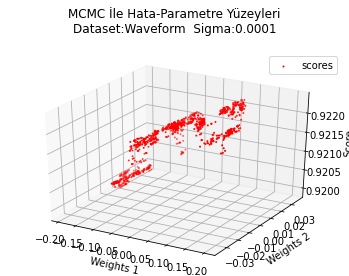

initial score:		0.922196090221405 
 max score:		0.9223530292510986 
 acceptance ratio:		100.0 




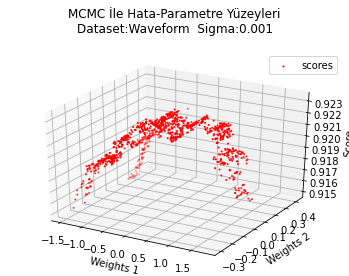

initial score:		0.922196090221405 
 max score:		0.9231374859809875 
 acceptance ratio:		100.0 




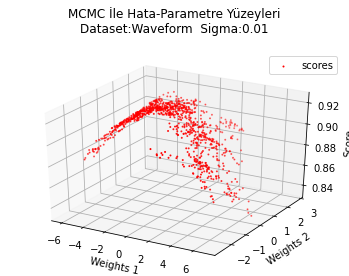

initial score:		0.922196090221405 
 max score:		0.923215925693512 
 acceptance ratio:		97.1 




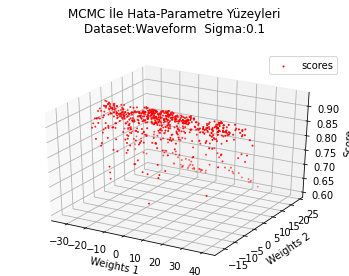

initial score:		0.922196090221405 
 max score:		0.9231374859809875 
 acceptance ratio:		71.5 




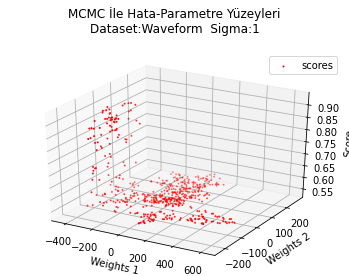

initial score:		0.922196090221405 
 max score:		0.922196090221405 
 acceptance ratio:		55.4 




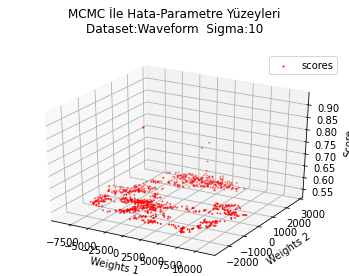

initial score:		0.922196090221405 
 max score:		0.922196090221405 
 acceptance ratio:		94.6 




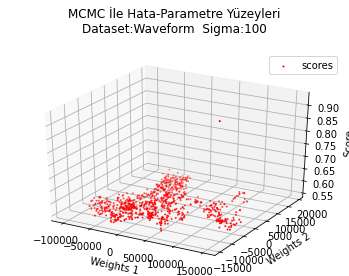

initial score:		0.922196090221405 
 max score:		0.922196090221405 
 acceptance ratio:		84.3 




In [18]:
plotAllScores("Waveform", sigmas, new_weights_list, new_scores_list, max_weigths_list, max_score_list, acceptance_ratios)

In [19]:
## ************************************************************************************************************* ##

In [20]:
path = './36uci/vowel.arff'

X_train, X_test, y_train, y_test, input_shape, output_shape = loadDataSet(path)
model = createModel(X_train, y_train, input_shape, output_shape, 100)
model.summary()

dataset size: (990, 12)
Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_2 (Dense)              (None, 64)                768       
_________________________________________________________________
dense_3 (Dense)              (None, 11)                715       
Total params: 1,483
Trainable params: 1,483
Non-trainable params: 0
_________________________________________________________________


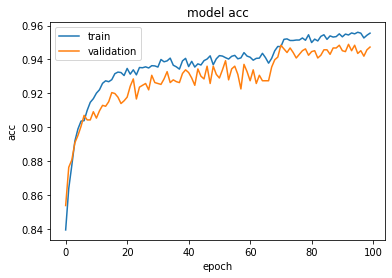

In [21]:
plotAccuracy(model)

In [22]:
initial_weights = model.get_weights() # weights of last epoch

In [23]:
new_weights_list, new_scores_list, max_weigths_list, max_score_list, acceptance_ratios = metropolisDiffrentSigmas(model, sigmas, n_iter, initial_weights)

841/841 [==============================] - 0s 21us/sample - loss: 0.4357 - acc: 0.9545
[-5.2838620012486574e-05, 7.778216630035197e-05]
[1.404540926623665e-06, 0.00015172996952972988]
841/841 [==============================] - 0s 18us/sample - loss: 0.4357 - acc: 0.9545
[7.994356705009151e-05, -9.427134595512539e-05]
[-5.7932069789228514e-05, -0.0001153642518712947]
841/841 [==============================] - 0s 20us/sample - loss: 0.4357 - acc: 0.9545
[2.2134803779745287e-06, 0.00013295670104967108]
[2.0891998274337292e-05, 0.0002222079096088364]
841/841 [==============================] - 0s 17us/sample - loss: 0.4356 - acc: 0.9545
[-8.804124167837082e-05, 2.1418962587093693e-05]
[0.00013323228560119618, -0.0001822453121007063]
841/841 [==============================] - 0s 21us/sample - loss: 0.4357 - acc: 0.9545
[3.184056110961081e-05, -5.8666428012317256e-05]
[-0.00010583566620151002, -4.939482205402927e-05]
841/841 [==============================] - 0s 19us/sample - loss: 0.4357 - a

841/841 [==============================] - 0s 16us/sample - loss: 0.4357 - acc: 0.9545
[-4.868851187062492e-05, -0.0001819835597947073]
[-5.357964769291277e-05, -0.00010886905006546554]
841/841 [==============================] - 0s 17us/sample - loss: 0.4357 - acc: 0.9545
[-0.00012238389547695251, -8.125768447634729e-06]
[0.00019068092859611356, -4.254181305082397e-06]
841/841 [==============================] - 0s 21us/sample - loss: 0.4357 - acc: 0.9545
[0.00018039653391731716, -6.0044430280124176e-05]
[-4.7087017457071594e-05, 0.00010219138620063065]
841/841 [==============================] - 0s 21us/sample - loss: 0.4357 - acc: 0.9545
[-5.046649560746309e-05, 3.783691539068837e-05]
[0.00018078250231938785, -8.017441111027258e-05]
841/841 [==============================] - 0s 16us/sample - loss: 0.4357 - acc: 0.9545
[0.00018782037748569307, 7.103521648830928e-05]
[-0.00020091573055384493, -6.530928317864925e-05]
841/841 [==============================] - 0s 19us/sample - loss: 0.4356

841/841 [==============================] - 0s 17us/sample - loss: 0.4357 - acc: 0.9545
[-8.81695631263028e-05, 0.0001271988269460243]
[0.000163031441930543, -0.00015188251716519394]
841/841 [==============================] - 0s 18us/sample - loss: 0.4357 - acc: 0.9545
[-1.2783961705137303e-05, 8.5678190034271e-05]
[0.00010318482665655773, -0.0001536393775302602]
841/841 [==============================] - 0s 16us/sample - loss: 0.4357 - acc: 0.9545
[-9.482907664240077e-05, 6.754929970935063e-05]
[-0.0001507289166332084, 6.805346602761582e-05]
841/841 [==============================] - 0s 19us/sample - loss: 0.4357 - acc: 0.9545
[-3.289169878165291e-05, -1.8371822251942394e-05]
[-8.398092980861119e-05, -0.00011979835881003842]
841/841 [==============================] - 0s 17us/sample - loss: 0.4357 - acc: 0.9545
[4.5019435999274665e-05, 8.96421497095492e-06]
[-0.00028196751994228903, -0.0001292148899324128]
841/841 [==============================] - 0s 18us/sample - loss: 0.4357 - acc: 0

841/841 [==============================] - 0s 18us/sample - loss: 0.4357 - acc: 0.9545
[-9.49099519003432e-06, -8.327835224960229e-06]
[-2.8415860321032074e-05, 3.278098600885008e-05]
841/841 [==============================] - 0s 18us/sample - loss: 0.4357 - acc: 0.9545
[-3.912234109310453e-05, 3.856899409402944e-05]
[-7.566907429639265e-06, 6.297035773664042e-05]
841/841 [==============================] - 0s 19us/sample - loss: 0.4357 - acc: 0.9545
[-9.230351011071804e-05, 6.638672523629833e-05]
[0.00016445877582994725, -2.483649770304427e-05]
841/841 [==============================] - 0s 21us/sample - loss: 0.4357 - acc: 0.9545
[-6.76605698296648e-05, -2.145666040098221e-05]
[-0.00015591517930631482, 8.690635006053665e-05]
841/841 [==============================] - 0s 17us/sample - loss: 0.4357 - acc: 0.9544
[5.48431698376914e-06, 3.847135735771332e-06]
[-4.8425213677551156e-05, 2.2675404642536748e-05]
841/841 [==============================] - 0s 16us/sample - loss: 0.4357 - acc: 0.

841/841 [==============================] - 0s 16us/sample - loss: 0.4357 - acc: 0.9545
[-0.00011696777689080014, 6.371714431997004e-06]
[2.0490744536036897e-06, 5.17843695249071e-05]
841/841 [==============================] - 0s 18us/sample - loss: 0.4357 - acc: 0.9545
[0.00010663258654342297, -4.2198429099544835e-05]
[-4.7914814985115495e-05, 0.0001668563126350496]
841/841 [==============================] - 0s 18us/sample - loss: 0.4357 - acc: 0.9545
[-0.00014939528366712503, -0.00014958973761228448]
[4.653834216976539e-05, -6.392794398083726e-05]
841/841 [==============================] - 0s 17us/sample - loss: 0.4357 - acc: 0.9545
[1.3179164155886345e-05, 4.5360842594547485e-05]
[-0.00013287627509272806, -0.00010529165005682424]
841/841 [==============================] - 0s 17us/sample - loss: 0.4357 - acc: 0.9545
[9.212259776974658e-05, -2.5386320888876086e-05]
[2.545460536871546e-05, 0.00010614494386131877]
841/841 [==============================] - 0s 19us/sample - loss: 0.4357 -

841/841 [==============================] - 0s 16us/sample - loss: 0.4357 - acc: 0.9545
[7.582445547753958e-07, 0.0001995068466225241]
[9.822477570522683e-05, -2.930890271708878e-05]
841/841 [==============================] - 0s 18us/sample - loss: 0.4357 - acc: 0.9545
[8.64837083631955e-05, -8.797734090963841e-05]
[-1.0603332621108116e-05, -8.533705658016022e-05]
841/841 [==============================] - 0s 17us/sample - loss: 0.4357 - acc: 0.9545
[7.076674796989442e-05, -0.00010155582539660729]
[-5.9229137424904645e-05, -6.768482254636042e-05]
841/841 [==============================] - 0s 17us/sample - loss: 0.4357 - acc: 0.9545
[-0.00011541707524843934, 6.323112782523358e-05]
[-7.609314664144357e-05, 2.668417997280146e-05]
841/841 [==============================] - 0s 18us/sample - loss: 0.4357 - acc: 0.9545
[-7.010573088093625e-05, 0.00011943283713451751]
[-7.68180965569099e-05, -9.947756725540554e-05]
841/841 [==============================] - 0s 17us/sample - loss: 0.4357 - acc: 

841/841 [==============================] - 0s 17us/sample - loss: 0.4358 - acc: 0.9545
[-9.225978666290908e-06, 9.789877815818454e-05]
[5.052313316938764e-06, 2.881816923295086e-05]
841/841 [==============================] - 0s 17us/sample - loss: 0.4358 - acc: 0.9545
[1.9938490305304076e-05, 5.244746171491529e-05]
[8.073507597457371e-05, -3.5579404514991815e-05]
841/841 [==============================] - 0s 20us/sample - loss: 0.4358 - acc: 0.9545
[-0.0001684552082622157, -4.5668970387458475e-05]
[3.3414479197819096e-05, 9.570195120513995e-05]
841/841 [==============================] - 0s 18us/sample - loss: 0.4358 - acc: 0.9545
[-0.00021645153007665254, -0.00010661822685951581]
[-2.79946838942655e-06, 6.551912429643973e-05]
841/841 [==============================] - 0s 17us/sample - loss: 0.4358 - acc: 0.9545
[-0.0001881573343868109, -5.3595443796902335e-05]
[0.00010636538914706006, 4.79451661846539e-07]
841/841 [==============================] - 0s 17us/sample - loss: 0.4359 - acc: 

841/841 [==============================] - 0s 19us/sample - loss: 0.4358 - acc: 0.9546
[-1.3859614248213107e-05, 0.00012261429310798076]
[5.12712323164019e-05, -8.061078444090936e-06]
841/841 [==============================] - 0s 16us/sample - loss: 0.4358 - acc: 0.9546
[-0.00011522770370981683, 0.000175916332865478]
[-6.970604752131216e-05, 4.45135870308013e-05]
841/841 [==============================] - 0s 20us/sample - loss: 0.4358 - acc: 0.9546
[3.1496205060713714e-05, 7.17030694986256e-05]
[0.0001192462027537633, 6.180823654374092e-05]
841/841 [==============================] - 0s 18us/sample - loss: 0.4358 - acc: 0.9546
[-7.806544601693952e-05, -8.747287581977942e-06]
[4.879974922192375e-05, -3.897594651237637e-05]
841/841 [==============================] - 0s 17us/sample - loss: 0.4358 - acc: 0.9546
[-2.771690599160513e-05, 8.128360430044644e-06]
[-3.652273332475889e-05, 5.8543681050076115e-05]
841/841 [==============================] - 0s 18us/sample - loss: 0.4359 - acc: 0.954

841/841 [==============================] - 0s 15us/sample - loss: 0.4358 - acc: 0.9545
[-5.396328789697445e-05, 6.671226445342417e-05]
[1.856432339635672e-05, 4.574802557745139e-06]
841/841 [==============================] - 0s 17us/sample - loss: 0.4358 - acc: 0.9545
[4.394103633706082e-05, 9.723169733302184e-05]
[-2.2975585600630527e-05, 2.0333553367488903e-05]
841/841 [==============================] - 0s 18us/sample - loss: 0.4358 - acc: 0.9545
[6.016793101440042e-05, -4.9030251450611e-05]
[8.9643122198275e-06, -0.00013365987620216508]
841/841 [==============================] - 0s 19us/sample - loss: 0.4358 - acc: 0.9545
[-5.232083504937202e-05, 0.00020270730565262154]
[1.9760063884278795e-05, 0.00019916043393231083]
841/841 [==============================] - 0s 15us/sample - loss: 0.4358 - acc: 0.9545
[3.3061269157206676e-05, 9.83912041099186e-05]
[9.483233150585627e-05, -1.9395359464472192e-05]
841/841 [==============================] - 0s 16us/sample - loss: 0.4358 - acc: 0.9545

841/841 [==============================] - 0s 17us/sample - loss: 0.4359 - acc: 0.9546
[7.708446409048311e-05, 0.00022285034785555978]
[-3.7262826081287444e-05, 0.00025048252949098123]
841/841 [==============================] - 0s 16us/sample - loss: 0.4359 - acc: 0.9546
[0.00010642946646892139, 0.00011776326140560561]
[-0.0001923871916224316, 1.1917113073097063e-05]
841/841 [==============================] - 0s 17us/sample - loss: 0.4358 - acc: 0.9546
[4.9404881836296574e-05, 2.5987564228718025e-05]
[8.972906954946022e-05, -5.09051748193344e-05]
841/841 [==============================] - 0s 17us/sample - loss: 0.4358 - acc: 0.9546
[6.0257846097118064e-05, 9.92556949018575e-05]
[9.948233796715264e-05, -0.00011994158447655954]
841/841 [==============================] - 0s 18us/sample - loss: 0.4358 - acc: 0.9545
[6.611293686594873e-05, -0.00015312073139678905]
[-0.0002688213577656261, -9.51016840109609e-06]
841/841 [==============================] - 0s 20us/sample - loss: 0.4358 - acc: 

841/841 [==============================] - 0s 20us/sample - loss: 0.4359 - acc: 0.9546
[3.224390059394105e-05, -0.0001462344475223968]
[-3.387261622767584e-05, 6.46082236264375e-06]
841/841 [==============================] - 0s 19us/sample - loss: 0.4359 - acc: 0.9546
[-0.00013518409778751463, -4.380882092330841e-05]
[-2.2782277220858512e-05, 0.00021217130234229]
841/841 [==============================] - 0s 18us/sample - loss: 0.4359 - acc: 0.9546
[-7.779093785448766e-05, -0.00010542720290518229]
[-0.0001231798871930263, -1.3206179747392269e-05]
841/841 [==============================] - 0s 18us/sample - loss: 0.4359 - acc: 0.9546
[8.284472059211736e-05, -0.00021646435095814114]
[-0.00011229542554215824, 7.31595031353787e-05]
841/841 [==============================] - 0s 19us/sample - loss: 0.4359 - acc: 0.9546
[9.541474495350655e-05, -7.535636797747304e-05]
[-0.00012365635056620729, -0.0001232170677329767]
841/841 [==============================] - 0s 18us/sample - loss: 0.4359 - acc

841/841 [==============================] - 0s 19us/sample - loss: 0.4358 - acc: 0.9546
[0.00013887676439534175, 3.386034297331281e-06]
[-4.307553031992511e-05, -0.00011937158609401062]
841/841 [==============================] - 0s 17us/sample - loss: 0.4358 - acc: 0.9545
[0.0002012425043550203, 3.305744187792786e-05]
[6.967819533634376e-05, 3.4520394441909895e-05]
841/841 [==============================] - 0s 16us/sample - loss: 0.4358 - acc: 0.9545
[-9.242797151329582e-05, -5.8260754225361326e-05]
[8.433428310396873e-05, -5.004233548168392e-07]
841/841 [==============================] - 0s 20us/sample - loss: 0.4358 - acc: 0.9545
[1.4840637931795364e-05, 5.207724097553408e-05]
[3.869413001966829e-05, -7.317593291978123e-06]
841/841 [==============================] - 0s 18us/sample - loss: 0.4358 - acc: 0.9545
[9.033004413070956e-05, -0.00010170053736077703]
[6.030837700901641e-05, 5.224011747938112e-06]
841/841 [==============================] - 0s 16us/sample - loss: 0.4358 - acc: 0.

841/841 [==============================] - 0s 17us/sample - loss: 0.4357 - acc: 0.9545
[3.974517603290534e-05, 7.678087702082756e-05]
[3.0251528185950014e-05, 0.00014061996558288608]
841/841 [==============================] - 0s 16us/sample - loss: 0.4357 - acc: 0.9544
[-2.21686601049915e-05, -2.9974166131970532e-06]
[5.629762094614371e-05, 0.00010191308469147825]
841/841 [==============================] - 0s 19us/sample - loss: 0.4357 - acc: 0.9545
[-0.00012983666140890996, 9.747338245507533e-05]
[-5.724964422982392e-05, 4.992996928987015e-05]
841/841 [==============================] - 0s 21us/sample - loss: 0.4358 - acc: 0.9545
[2.1814106833139406e-05, 5.588819303458788e-05]
[-9.125707388911314e-06, 0.00011254745372652984]
841/841 [==============================] - 0s 18us/sample - loss: 0.4358 - acc: 0.9545
[0.00011507379250141351, 4.71262440300023e-05]
[-0.00015968258595418412, 7.01185782321976e-05]
841/841 [==============================] - 0s 18us/sample - loss: 0.4357 - acc: 0.9

841/841 [==============================] - 0s 17us/sample - loss: 0.4358 - acc: 0.9545
[6.751843436594153e-05, -0.0001684259987469745]
[-0.00013064500154063847, 0.0001539977407464844]
841/841 [==============================] - 0s 17us/sample - loss: 0.4358 - acc: 0.9545
[1.2616612064748854e-05, -5.0571629118482555e-06]
[-4.67075238517235e-05, -6.080407770235236e-05]
841/841 [==============================] - 0s 19us/sample - loss: 0.4358 - acc: 0.9545
[-4.0161500237398166e-05, 4.249029591606727e-05]
[4.974848094129529e-05, -7.341570232275056e-05]
841/841 [==============================] - 0s 18us/sample - loss: 0.4358 - acc: 0.9545
[-5.048489306953531e-05, 2.7679687487780236e-05]
[0.00018328929233647407, 4.891801312288073e-05]
841/841 [==============================] - 0s 18us/sample - loss: 0.4358 - acc: 0.9545
[-1.190852371473132e-05, -0.00010051332311531015]
[-0.0001564643402900559, -5.7470540247924376e-05]
841/841 [==============================] - 0s 17us/sample - loss: 0.4358 - a

841/841 [==============================] - 0s 15us/sample - loss: 0.4358 - acc: 0.9545
[-0.0003519541894416792, -5.59082847687613e-05]
[-9.543935086033576e-05, 0.000182418624007773]
841/841 [==============================] - 0s 16us/sample - loss: 0.4359 - acc: 0.9546
[-5.887436095013881e-05, 0.00010079917127793213]
[6.260097038648822e-05, -1.3089979072313618e-05]
841/841 [==============================] - 0s 18us/sample - loss: 0.4359 - acc: 0.9546
[-7.115178563127119e-05, -3.517735073933067e-05]
[-0.0001039306630527347, -0.00013653246271621205]
841/841 [==============================] - 0s 18us/sample - loss: 0.4359 - acc: 0.9546
[0.00011459476521576115, -0.0001815653840247443]
[7.346379140363327e-06, 9.984117150107324e-05]
841/841 [==============================] - 0s 18us/sample - loss: 0.4359 - acc: 0.9546
[-7.323318443508412e-05, 0.00012984304783400535]
[-8.070305508665461e-05, -9.106701323429483e-05]
841/841 [==============================] - 0s 20us/sample - loss: 0.4359 - acc:

841/841 [==============================] - 0s 17us/sample - loss: 0.4359 - acc: 0.9546
[-0.00015927687023448007, 8.600823982479994e-06]
[-5.894898627138301e-05, 2.4211991252759724e-05]
841/841 [==============================] - 0s 16us/sample - loss: 0.4359 - acc: 0.9546
[-0.00011715679674465299, -4.075391749383927e-06]
[-7.6189368689972825e-06, 1.4303347468894029e-05]
841/841 [==============================] - 0s 19us/sample - loss: 0.4359 - acc: 0.9544
[0.0001503023459703552, -0.00012022465840033029]
[9.818111584703109e-05, 7.539947128010972e-05]
841/841 [==============================] - 0s 21us/sample - loss: 0.4359 - acc: 0.9546
[-1.8974039244645922e-05, -5.356456162752228e-05]
[-0.0001563476365676881, -3.370309425356849e-05]
841/841 [==============================] - 0s 17us/sample - loss: 0.4359 - acc: 0.9544
[8.18447804012489e-05, 4.631418715622313e-05]
[0.00011163218808880098, 0.0001625447155765402]
841/841 [==============================] - 0s 20us/sample - loss: 0.4359 - acc

841/841 [==============================] - 0s 19us/sample - loss: 0.4358 - acc: 0.9546
[0.00010581929343900241, -4.3369705491350334e-05]
[1.9216893936571567e-05, -6.641895460257565e-06]
841/841 [==============================] - 0s 16us/sample - loss: 0.4358 - acc: 0.9545
[-8.351409754847242e-05, -9.03732288220577e-05]
[6.651331447225369e-05, -1.1115684369232672e-05]
841/841 [==============================] - 0s 16us/sample - loss: 0.4358 - acc: 0.9546
[4.714920349372912e-05, 4.8711904934194306e-05]
[-4.7723924927275215e-05, 3.7695583635749685e-05]
841/841 [==============================] - 0s 21us/sample - loss: 0.4358 - acc: 0.9545
[4.256236890384348e-05, 1.4942330140167132e-05]
[0.000176223234285244, 2.3725830624985843e-05]
841/841 [==============================] - 0s 17us/sample - loss: 0.4358 - acc: 0.9545
[0.00016316777699046543, -2.3763312762069938e-05]
[8.026776836464377e-06, 2.284689166325357e-06]
841/841 [==============================] - 0s 15us/sample - loss: 0.4358 - acc:

841/841 [==============================] - 0s 17us/sample - loss: 0.4358 - acc: 0.9545
[-0.00012610473117417905, 1.4398034098844548e-05]
[-0.00025831069914256593, -0.00015151152437148838]
841/841 [==============================] - 0s 17us/sample - loss: 0.4358 - acc: 0.9545
[0.00019786285279394035, 0.00017798461541045448]
[0.00010183957052208262, -0.00024852938245723476]
841/841 [==============================] - 0s 16us/sample - loss: 0.4358 - acc: 0.9545
[-1.3204001650718151e-05, -7.06227261551084e-05]
[0.00011138014289525149, 0.00020425276247998722]
841/841 [==============================] - 0s 16us/sample - loss: 0.4358 - acc: 0.9545
[7.106297819485395e-05, 4.7916036815626e-05]
[-9.294811128237544e-05, 6.680192675472586e-05]
841/841 [==============================] - 0s 16us/sample - loss: 0.4358 - acc: 0.9545
[0.00010370032386868747, 2.7474236354654176e-05]
[7.108156950648285e-05, -2.8163616999071248e-05]
841/841 [==============================] - 0s 16us/sample - loss: 0.4357 - a

841/841 [==============================] - 0s 20us/sample - loss: 0.4357 - acc: 0.9545
[4.060870509048493e-05, 3.496690938915736e-05]
[7.64656727435024e-05, -0.00011141763933067715]
841/841 [==============================] - 0s 21us/sample - loss: 0.4357 - acc: 0.9545
[0.00011950900197025328, -0.00010202901333886085]
[8.13722490646093e-05, -7.200719378752597e-05]
841/841 [==============================] - 0s 17us/sample - loss: 0.4357 - acc: 0.9545
[4.906267091335922e-05, -8.162159600991255e-05]
[1.0128516433961161e-06, 0.00011072909575663109]
841/841 [==============================] - 0s 18us/sample - loss: 0.4357 - acc: 0.9545
[-9.574904164892927e-05, -9.068465672353531e-05]
[5.210183212939107e-05, 1.0285861060534157e-05]
841/841 [==============================] - 0s 17us/sample - loss: 0.4357 - acc: 0.9545
[7.495823350557488e-05, 5.9087498184173526e-05]
[0.000149468552189097, -4.7944523338746214e-05]
841/841 [==============================] - 0s 17us/sample - loss: 0.4357 - acc: 0.9

841/841 [==============================] - 0s 17us/sample - loss: 0.4357 - acc: 0.9545
[9.704185045638099e-05, -0.0001231567848283284]
[0.00011057721706017224, 2.415813279388232e-05]
841/841 [==============================] - 0s 17us/sample - loss: 0.4357 - acc: 0.9545
[-0.00029567873969953146, 9.418303005783993e-05]
[-3.704098459505855e-05, 0.00012882993861848568]
841/841 [==============================] - 0s 15us/sample - loss: 0.4357 - acc: 0.9544
[1.7771441974686883e-05, -0.00013631208963828852]
[-8.50629757461773e-05, 0.00012936762260602118]
841/841 [==============================] - 0s 17us/sample - loss: 0.4357 - acc: 0.9544
[-5.529080697003987e-06, -0.00016447150001332558]
[4.221303251998163e-05, -4.841120693476987e-05]
841/841 [==============================] - 0s 17us/sample - loss: 0.4357 - acc: 0.9544
[4.284852999748e-05, -6.194503522708482e-06]
[0.00016537754556070875, 0.00015417640245298414]
841/841 [==============================] - 0s 16us/sample - loss: 0.4357 - acc: 0

841/841 [==============================] - 0s 18us/sample - loss: 0.4357 - acc: 0.9545
[7.386903178394547e-06, -3.614436719720671e-05]
[-1.6805137700967185e-05, 2.4562361431814663e-05]
841/841 [==============================] - 0s 21us/sample - loss: 0.4357 - acc: 0.9545
[-6.83410349292714e-05, 0.00018700380267772638]
[2.342324403441153e-05, -1.553124627210326e-05]
841/841 [==============================] - 0s 20us/sample - loss: 0.4357 - acc: 0.9545
[-2.203463204579659e-05, -7.251186804348227e-05]
[-0.00010448779249916811, 6.520625915606604e-05]
841/841 [==============================] - 0s 17us/sample - loss: 0.4357 - acc: 0.9545
[9.024514422351677e-05, 8.680310085618358e-05]
[-5.0951859952955526e-05, 3.535270883950018e-05]
841/841 [==============================] - 0s 16us/sample - loss: 0.4357 - acc: 0.9545
[-7.33749556364839e-05, -4.502097507465886e-05]
[-8.334383233194701e-05, 0.00016455407342100397]
841/841 [==============================] - 0s 17us/sample - loss: 0.4357 - acc: 

841/841 [==============================] - 0s 17us/sample - loss: 0.4356 - acc: 0.9546
[1.272215870543706e-05, 7.761718589688033e-05]
[-3.989717182940337e-06, -0.00014796962881211695]
841/841 [==============================] - 0s 17us/sample - loss: 0.4356 - acc: 0.9546
[-0.00025786799707073604, 3.389763908627151e-05]
[2.1390277191669327e-05, 0.00022576909712047335]
841/841 [==============================] - 0s 20us/sample - loss: 0.4356 - acc: 0.9545
[4.338866388851597e-06, 6.582449578358413e-05]
[-0.0001601894837630576, 4.093159448786579e-05]
841/841 [==============================] - 0s 18us/sample - loss: 0.4356 - acc: 0.9545
[-0.00022373124939432089, 7.987622429911894e-05]
[-9.21171797740354e-05, 0.00017903647581051765]
841/841 [==============================] - 0s 16us/sample - loss: 0.4356 - acc: 0.9545
[-2.0107280411030773e-05, 0.0001549856288545175]
[0.00011512148462950363, -9.677610469659847e-05]
841/841 [==============================] - 0s 16us/sample - loss: 0.4356 - acc: 

841/841 [==============================] - 0s 21us/sample - loss: 0.4357 - acc: 0.9545
[-8.576935826387812e-06, 6.724637706271773e-05]
[2.0959861155301176e-05, -1.614685926338308e-05]
841/841 [==============================] - 0s 17us/sample - loss: 0.4357 - acc: 0.9545
[7.688874360142969e-05, 0.00015451270484076202]
[-0.00013968180998546196, -2.6124781845858325e-05]
841/841 [==============================] - 0s 19us/sample - loss: 0.4356 - acc: 0.9545
[-7.963606344670901e-05, -0.00010099925170450026]
[-0.00017200578872425014, 7.632974333989195e-05]
841/841 [==============================] - 0s 17us/sample - loss: 0.4357 - acc: 0.9545
[0.00010627941585723682, 4.7127844807867475e-06]
[1.850017480122478e-05, 0.00012601317387391376]
841/841 [==============================] - 0s 19us/sample - loss: 0.4356 - acc: 0.9545
[6.88552288693219e-05, -1.180131604666643e-05]
[-8.731309772579635e-05, -0.000129250884908952]
841/841 [==============================] - 0s 20us/sample - loss: 0.4356 - acc

841/841 [==============================] - 0s 16us/sample - loss: 0.4357 - acc: 0.9545
[-0.0001264058625759675, 0.00010576433299850801]
[-2.2745872644146657e-05, -0.000111397445820533]
841/841 [==============================] - 0s 16us/sample - loss: 0.4357 - acc: 0.9545
[-1.1733107713791345e-05, -5.193761397269078e-05]
[1.5406839464947077e-05, 2.371166585738923e-05]
841/841 [==============================] - 0s 19us/sample - loss: 0.4357 - acc: 0.9545
[0.0001221725917486966, 0.00012123032415761395]
[-3.1459421110660103e-06, -2.1707246903252987e-05]
841/841 [==============================] - 0s 16us/sample - loss: 0.4357 - acc: 0.9545
[1.6369290417734497e-05, -7.448083652250955e-06]
[-5.5140630419390136e-05, 9.372071490018961e-05]
841/841 [==============================] - 0s 15us/sample - loss: 0.4357 - acc: 0.9545
[0.00018145377869193324, 7.667024088552344e-05]
[-4.300200833513628e-05, -3.54210198709656e-05]
841/841 [==============================] - 0s 17us/sample - loss: 0.4356 - a

841/841 [==============================] - 0s 16us/sample - loss: 0.4356 - acc: 0.9545
[-3.733035750898252e-05, 0.00015994217063091383]
[-0.00015641240052048492, 7.371999018913512e-05]
841/841 [==============================] - 0s 18us/sample - loss: 0.4356 - acc: 0.9545
[-0.00017535427634362278, -5.459314839757954e-05]
[0.0001165773707147447, 3.901197246269962e-05]
841/841 [==============================] - 0s 18us/sample - loss: 0.4356 - acc: 0.9545
[-8.332253387271837e-05, -6.320889957569048e-05]
[4.784943566473673e-06, 1.157555211251893e-05]
841/841 [==============================] - 0s 17us/sample - loss: 0.4356 - acc: 0.9545
[-3.6490887890505786e-05, -4.664064186001682e-05]
[0.00011017648167359387, -0.00018256215490573222]
841/841 [==============================] - 0s 18us/sample - loss: 0.4356 - acc: 0.9545
[2.535920871524921e-05, -5.1019811755170034e-05]
[6.079688218039157e-05, 8.979497605308248e-06]
841/841 [==============================] - 0s 21us/sample - loss: 0.4356 - acc

841/841 [==============================] - 0s 17us/sample - loss: 0.4356 - acc: 0.9545
[-2.2537471614681726e-05, 0.00010404829703764465]
[-6.407436107624425e-05, -0.00010120513806955487]
841/841 [==============================] - 0s 20us/sample - loss: 0.4356 - acc: 0.9545
[-2.731565876671793e-05, -9.216231510718917e-06]
[-4.8924343099615926e-05, -7.412454318995621e-05]
841/841 [==============================] - 0s 18us/sample - loss: 0.4356 - acc: 0.9545
[0.0001398626377152258, -7.436382661479889e-05]
[9.577097878999237e-05, -0.00011706554305988338]
841/841 [==============================] - 0s 18us/sample - loss: 0.4356 - acc: 0.9546
[-4.0258762036587016e-05, 0.00012826810663936752]
[-3.7500563970555007e-05, -0.0001253364003006758]
841/841 [==============================] - 0s 19us/sample - loss: 0.4356 - acc: 0.9545
[0.0002443615554526621, 7.97326368218257e-06]
[-8.351621692067126e-05, -0.00011790811815844551]
841/841 [==============================] - 0s 17us/sample - loss: 0.4356 

841/841 [==============================] - 0s 16us/sample - loss: 0.4356 - acc: 0.9545
[-0.00017980078863997654, 1.3204519741929844e-05]
[-3.373357559838833e-06, -0.000139230536159351]
841/841 [==============================] - 0s 21us/sample - loss: 0.4356 - acc: 0.9545
[0.00011983403469557242, -4.050503619461753e-05]
[-8.45454145443352e-05, 8.117075914697527e-05]
841/841 [==============================] - 0s 18us/sample - loss: 0.4356 - acc: 0.9545
[7.389849554542665e-05, 6.62207194390546e-05]
[-0.00016668657415390995, 7.062071243017982e-05]
841/841 [==============================] - 0s 18us/sample - loss: 0.4356 - acc: 0.9545
[-0.00011075299967461834, -6.612054634615398e-05]
[-5.6782918806521825e-05, -1.52231248517436e-05]
841/841 [==============================] - 0s 18us/sample - loss: 0.4356 - acc: 0.9545
[-0.0002063097899917072, 8.582651521792887e-05]
[0.0001496425099683608, -0.00010772146281806845]
841/841 [==============================] - 0s 19us/sample - loss: 0.4356 - acc: 

841/841 [==============================] - 0s 19us/sample - loss: 0.4357 - acc: 0.9545
[7.438422125837246e-05, -1.110552371060802e-05]
[-8.986774545161738e-05, -2.7624789449258954e-05]
841/841 [==============================] - 0s 18us/sample - loss: 0.4357 - acc: 0.9545
[-0.0001035648492019166, 5.50998403804047e-05]
[6.878824520380158e-05, 6.836568843280709e-05]
841/841 [==============================] - 0s 15us/sample - loss: 0.4357 - acc: 0.9545
[-1.9787917632132273e-05, -8.465096732343984e-05]
[-1.7441862155733275e-05, 0.00015933338778834747]
841/841 [==============================] - 0s 16us/sample - loss: 0.4357 - acc: 0.9545
[3.394577036589505e-06, 9.34523408851459e-05]
[-8.696194643886324e-05, -0.00010085639941687384]
841/841 [==============================] - 0s 17us/sample - loss: 0.4357 - acc: 0.9545
[9.424835765361156e-05, -9.652273125715622e-05]
[-0.00018224496516042364, 0.0002982673458988106]
841/841 [==============================] - 0s 19us/sample - loss: 0.4357 - acc: 

841/841 [==============================] - 0s 20us/sample - loss: 0.4357 - acc: 0.9545
[-0.00011294591829993816, 0.00012653795222647876]
[3.8002607867202814e-05, -3.5049885802242845e-05]
841/841 [==============================] - 0s 19us/sample - loss: 0.4357 - acc: 0.9545
[-2.034852768492149e-06, 0.00011455586941017705]
[0.00012162485593368534, -0.00012899750464714913]
841/841 [==============================] - 0s 17us/sample - loss: 0.4357 - acc: 0.9545
[-1.144782118701936e-05, 6.894624467826704e-05]
[-8.480714469348437e-05, -0.0001257155735099155]
841/841 [==============================] - 0s 21us/sample - loss: 0.4357 - acc: 0.9545
[5.515343507102999e-05, 0.00013808788043181532]
[-5.8663486240672764e-05, 8.654030347967079e-05]
841/841 [==============================] - 0s 16us/sample - loss: 0.4357 - acc: 0.9545
[-1.8276323020980184e-06, -0.0002105623432322409]
[-4.460068662900809e-05, -6.35831492418655e-05]
841/841 [==============================] - 0s 15us/sample - loss: 0.4357 -

841/841 [==============================] - 0s 15us/sample - loss: 0.4357 - acc: 0.9544
[-4.81497251369249e-06, 6.114978544628964e-05]
[9.159092179395491e-06, -3.879313860609688e-05]
841/841 [==============================] - 0s 18us/sample - loss: 0.4357 - acc: 0.9544
[7.42577345174967e-05, 0.00014933980291952193]
[2.3565051638641136e-05, 0.00011345545896293419]
841/841 [==============================] - 0s 17us/sample - loss: 0.4357 - acc: 0.9545
[-4.470394984593419e-05, -0.0001086204180498753]
[-7.344067549600524e-05, 7.611806678974836e-06]
841/841 [==============================] - 0s 18us/sample - loss: 0.4357 - acc: 0.9544
[-0.0001396734566120216, 0.00013924169896358595]
[-4.725215713968145e-05, -8.199275019296687e-05]
841/841 [==============================] - 0s 20us/sample - loss: 0.4357 - acc: 0.9545
[-4.3509627979625724e-05, 8.503413210405248e-05]
[0.0001330609367495517, -0.00010052344058323278]
841/841 [==============================] - 0s 17us/sample - loss: 0.4357 - acc: 0

841/841 [==============================] - 0s 17us/sample - loss: 0.4357 - acc: 0.9545
[4.472076176423392e-05, 6.317906375825383e-05]
[6.188538156676505e-05, 8.470535559977114e-05]
841/841 [==============================] - 0s 19us/sample - loss: 0.4357 - acc: 0.9545
[5.8739668979861004e-05, -4.80999442737963e-05]
[7.804291512761302e-05, 1.9979702583527045e-05]
841/841 [==============================] - 0s 17us/sample - loss: 0.4357 - acc: 0.9545
[-1.291626156735213e-06, -0.0002467496376158609]
[3.3548797663044613e-06, -7.675277448425712e-05]
841/841 [==============================] - 0s 19us/sample - loss: 0.4357 - acc: 0.9545
[-4.9621497680312046e-05, 0.00017978425238129465]
[-0.0001694865530482682, -8.944997159642086e-05]
841/841 [==============================] - 0s 18us/sample - loss: 0.4357 - acc: 0.9545
[0.00010328134552381625, -0.00023295692103387773]
[5.595280642208224e-05, 4.1235380048753285e-05]
841/841 [==============================] - 0s 16us/sample - loss: 0.4357 - acc: 

841/841 [==============================] - 0s 19us/sample - loss: 0.4357 - acc: 0.9545
[-5.6533959678011425e-05, 1.6260827395147066e-05]
[-0.00011357086086826712, 3.0208941306974837e-05]
841/841 [==============================] - 0s 17us/sample - loss: 0.4358 - acc: 0.9545
[0.00015234998753461103, 2.2444628113131704e-05]
[-4.573761867327467e-05, -2.5672691835328606e-05]
841/841 [==============================] - 0s 18us/sample - loss: 0.4357 - acc: 0.9544
[-5.106640467672353e-06, -7.302271077214655e-06]
[-3.860184553383305e-05, -0.00015775221227011383]
841/841 [==============================] - 0s 19us/sample - loss: 0.4357 - acc: 0.9544
[9.89201676072568e-05, 0.00010819455834594556]
[2.5232757793759626e-05, -0.00012371226694506414]
841/841 [==============================] - 0s 20us/sample - loss: 0.4357 - acc: 0.9545
[3.5871486138889848e-06, -1.8236188728018588e-05]
[0.00018041572030504888, -0.00019657383143526386]
841/841 [==============================] - 0s 19us/sample - loss: 0.43

841/841 [==============================] - 0s 17us/sample - loss: 0.4358 - acc: 0.9545
[-4.995254400812459e-05, -1.6234695408137186e-05]
[4.16670210624938e-05, 2.604662248574512e-05]
841/841 [==============================] - 0s 18us/sample - loss: 0.4358 - acc: 0.9545
[0.0001147072448325652, 0.00013717586353891316]
[-3.8012877883221875e-05, 4.1932858675262355e-05]
841/841 [==============================] - 0s 18us/sample - loss: 0.4358 - acc: 0.9545
[-1.842471034952796e-05, -1.2498602288102588e-05]
[4.764671167827696e-06, 8.056494577117391e-07]
841/841 [==============================] - 0s 20us/sample - loss: 0.4358 - acc: 0.9545
[1.4184309031665015e-06, -0.00010847184389559537]
[3.384721674577955e-05, 3.615427051755935e-05]
841/841 [==============================] - 0s 18us/sample - loss: 0.4358 - acc: 0.9545
[-6.808878045147931e-05, -0.0001269878729829422]
[0.00016331335948084857, 5.6020266340564765e-05]
841/841 [==============================] - 0s 18us/sample - loss: 0.4358 - acc:

841/841 [==============================] - 0s 16us/sample - loss: 0.4358 - acc: 0.9545
[-2.8687540500514214e-05, 6.578800450907755e-05]
[-0.0001435845477287148, 6.738449144188642e-05]
841/841 [==============================] - 0s 18us/sample - loss: 0.4358 - acc: 0.9545
[9.464329675573473e-05, 8.555644661932588e-05]
[-0.00010046222173769848, 7.510200105386423e-05]
841/841 [==============================] - 0s 17us/sample - loss: 0.4358 - acc: 0.9545
[6.882930427170976e-05, -0.0001746682433862425]
[-4.669723188994375e-05, -7.091005107257447e-06]
841/841 [==============================] - 0s 16us/sample - loss: 0.4357 - acc: 0.9545
[-0.00020105931771441298, -0.0002504904525118174]
[-2.086566422455142e-06, -1.373926804402013e-06]
841/841 [==============================] - 0s 16us/sample - loss: 0.4358 - acc: 0.9545
[3.6692227405150734e-05, -1.0771792103736788e-05]
[-4.968574687460884e-06, 4.718557108790387e-05]
841/841 [==============================] - 0s 23us/sample - loss: 0.4358 - acc

841/841 [==============================] - 0s 18us/sample - loss: 0.4356 - acc: 0.9546
[0.0006308989428935274, 0.002444728769439347]
[0.0013855214243272426, 0.0013882231479158838]
841/841 [==============================] - 0s 15us/sample - loss: 0.4355 - acc: 0.9547
[0.00011900311887573471, 0.0005383753059953348]
[-0.0003494416138504466, -0.0006127894092038519]
841/841 [==============================] - 0s 17us/sample - loss: 0.4355 - acc: 0.9547
[0.00033769782684329227, -0.0003329904980781379]
[-0.0006324708734324234, 0.00014042560559989175]
841/841 [==============================] - 0s 19us/sample - loss: 0.4355 - acc: 0.9548
[-0.00017466394455060088, 0.0029317693977903986]
[6.855585506048114e-05, -0.0002428581204031083]
841/841 [==============================] - 0s 19us/sample - loss: 0.4354 - acc: 0.9550
[0.0003312923035967931, -0.00027839317981683605]
[0.00033042746643793954, -0.0007756603279800472]
841/841 [==============================] - 0s 20us/sample - loss: 0.4354 - acc: 0.

841/841 [==============================] - 0s 16us/sample - loss: 0.4358 - acc: 0.9545
[0.0011420358538446437, -0.0010365500105408675]
[4.876623092451347e-05, 0.0004157566657877237]
841/841 [==============================] - 0s 20us/sample - loss: 0.4357 - acc: 0.9545
[0.0010792348268987156, -0.0004965423077104744]
[0.0005565525049182799, 0.002125131991694124]
841/841 [==============================] - 0s 17us/sample - loss: 0.4356 - acc: 0.9545
[0.0011028307277689217, -0.0008179929664559357]
[-0.00018106000349978922, 0.0003697082641794441]
841/841 [==============================] - 0s 18us/sample - loss: 0.4356 - acc: 0.9546
[0.00014344238315325405, -0.00031998454969647296]
[0.001369196550995127, -0.0015703617860169583]
841/841 [==============================] - 0s 16us/sample - loss: 0.4356 - acc: 0.9546
[9.568092064554968e-05, 0.00015092509511915907]
[-0.0014820569441870801, -0.00016649309088426488]
841/841 [==============================] - 0s 18us/sample - loss: 0.4356 - acc: 0.95

[-0.00051654937104679, 0.000735358115188845]
[0.0005855886286145238, -0.001524520556123891]
841/841 [==============================] - 0s 17us/sample - loss: 0.4360 - acc: 0.9544
[-0.0011764750062716127, -0.00031637441655473327]
[0.0026251970255117964, 0.0006299534612973094]
841/841 [==============================] - 0s 17us/sample - loss: 0.4361 - acc: 0.9544
[-0.00108541369848499, -6.78824449344426e-05]
[-8.713412653372925e-05, 0.0003334207353098449]
841/841 [==============================] - 0s 17us/sample - loss: 0.4362 - acc: 0.9540
[1.946860457715289e-05, -0.0006427671569388887]
[0.00019123947104622156, 0.00012487173145078975]
841/841 [==============================] - 0s 17us/sample - loss: 0.4363 - acc: 0.9538
[-0.0002697838486117615, -0.0006323160099467918]
[-0.0012178983209719595, -0.0006912137485936122]
841/841 [==============================] - 0s 17us/sample - loss: 0.4363 - acc: 0.9540
[-0.0013278317209521118, 0.0006880688357378845]
[5.1796758157021935e-05, 0.000911307106

841/841 [==============================] - 0s 21us/sample - loss: 0.4362 - acc: 0.9541
[-0.0008093553349093429, 0.0005671468473084807]
[-0.0010797263111026912, 0.001183756549004203]
841/841 [==============================] - 0s 19us/sample - loss: 0.4363 - acc: 0.9538
[-0.0017878994885052336, -0.0006000012058150694]
[-0.0007249240828182134, -0.00010518273346739646]
841/841 [==============================] - 0s 15us/sample - loss: 0.4365 - acc: 0.9538
[0.00010720347021416225, 0.0003189073118693574]
[-0.00048022877959306233, -0.00035769438223630194]
841/841 [==============================] - 0s 17us/sample - loss: 0.4365 - acc: 0.9538
[0.000464355892380029, 0.0015284559961916244]
[0.001653321023975155, 0.002596079207822798]
841/841 [==============================] - 0s 16us/sample - loss: 0.4364 - acc: 0.9538
[-0.00023548940659631957, 0.0005708953270622061]
[-0.0018000364240552728, -0.00040919281790063075]
841/841 [==============================] - 0s 20us/sample - loss: 0.4364 - acc: 0.

841/841 [==============================] - 0s 17us/sample - loss: 0.4372 - acc: 0.9536
[-9.255847779353955e-05, 0.0005641804198975926]
[1.520529593590133e-05, 0.0013904571353671933]
841/841 [==============================] - 0s 19us/sample - loss: 0.4372 - acc: 0.9536
[0.0003972232657484087, -0.00032077769500799675]
[-0.0006882842720164023, -0.0005599942394216066]
841/841 [==============================] - 0s 18us/sample - loss: 0.4372 - acc: 0.9537
[-0.0008126165840586617, 0.002085026083997352]
[8.26062794057663e-05, 0.0008362518608143199]
841/841 [==============================] - 0s 16us/sample - loss: 0.4372 - acc: 0.9533
[-0.0009482724950224181, -0.0021463315356244845]
[-0.0004954640522166185, -0.0006076689577036197]
841/841 [==============================] - 0s 18us/sample - loss: 0.4374 - acc: 0.9531
[-0.0003553895226948714, 0.0003408986845275054]
[0.0009005341682668589, 1.9527070999138898e-05]
841/841 [==============================] - 0s 19us/sample - loss: 0.4374 - acc: 0.953

841/841 [==============================] - 0s 19us/sample - loss: 0.4370 - acc: 0.9537
[-0.0006053801717028948, -0.0011221556803982845]
[0.002231860560750103, -0.000671756379448204]
841/841 [==============================] - 0s 19us/sample - loss: 0.4371 - acc: 0.9536
[-0.0017680071386896373, 3.9624376575892884e-05]
[0.000388592417336521, 0.0006437601384663892]
841/841 [==============================] - 0s 22us/sample - loss: 0.4373 - acc: 0.9532
[0.0005584067349622167, 0.0008811778223497376]
[-0.0009003956130973184, 0.0003022716638282933]
841/841 [==============================] - 0s 17us/sample - loss: 0.4373 - acc: 0.9533
[-0.0007522841930733338, -0.0005490968163139223]
[0.0012028501592957711, -0.00042191705236489606]
841/841 [==============================] - 0s 19us/sample - loss: 0.4374 - acc: 0.9532
[0.0012260019249520759, -0.0002804773666418193]
[0.0008983860273709965, 0.0005378120428872258]
841/841 [==============================] - 0s 18us/sample - loss: 0.4372 - acc: 0.9535


[-0.001243538550620016, -0.0008074022697622046]
[-0.0003829356531080656, 0.0006496604960850264]
841/841 [==============================] - 0s 16us/sample - loss: 0.4386 - acc: 0.9533
[0.0006920689554843226, 0.0013207491174398516]
[-6.003072737122001e-05, 0.0004227977485984556]
841/841 [==============================] - 0s 18us/sample - loss: 0.4385 - acc: 0.9534
[0.0006501330047533227, -0.00036265693540653765]
[-0.0006474120688765801, -0.0019331522000468728]
841/841 [==============================] - 0s 20us/sample - loss: 0.4384 - acc: 0.9534
[-0.00026704969155040277, 0.00022275928711193283]
[0.00024482016290955626, -0.00016472229379802878]
841/841 [==============================] - 0s 18us/sample - loss: 0.4384 - acc: 0.9535
[8.171092961473873e-05, 0.0009905505921751108]
[0.00044091757093113427, 0.0011770063587915448]
841/841 [==============================] - 0s 16us/sample - loss: 0.4384 - acc: 0.9533
[-0.001375059844761552, 0.0002898690644233558]
[-0.0010017997666862443, 0.0009938

841/841 [==============================] - 0s 18us/sample - loss: 0.4391 - acc: 0.9529
[0.00016541556555201782, 0.0010564033101058661]
[-0.0011404156203616586, -0.0002772440714033367]
841/841 [==============================] - 0s 16us/sample - loss: 0.4390 - acc: 0.9530
[0.001694978479248103, -0.0023539387203502645]
[3.387285512433496e-05, -0.0023415143496828736]
841/841 [==============================] - 0s 18us/sample - loss: 0.4388 - acc: 0.9533
[0.0011261804823558385, 0.0011673778591925095]
[0.00010466879574020754, 0.0014077707641313932]
841/841 [==============================] - 0s 15us/sample - loss: 0.4386 - acc: 0.9534
[0.0006274026703132382, 0.0007823918951151932]
[0.00031359531639828996, 0.0013370006979311591]
841/841 [==============================] - 0s 19us/sample - loss: 0.4384 - acc: 0.9534
[-0.0006235601956688951, 0.0015319353296427158]
[-0.0006121635479726797, 0.0015253713698497092]
841/841 [==============================] - 0s 18us/sample - loss: 0.4385 - acc: 0.9534


841/841 [==============================] - 0s 17us/sample - loss: 0.4398 - acc: 0.9523
[-0.0013233925939961843, 0.0006070258743537417]
[-0.0008870603899944219, -0.0004324376926837614]
841/841 [==============================] - 0s 20us/sample - loss: 0.4400 - acc: 0.9522
[-0.00035258903712643056, 0.00029939187279006286]
[-0.0006980167253873128, -0.0002580216788705616]
841/841 [==============================] - 0s 18us/sample - loss: 0.4401 - acc: 0.9522
[-0.0005768907561775605, -0.000425907525407563]
[0.001925741230819893, 0.0006191720747069277]
841/841 [==============================] - 0s 16us/sample - loss: 0.4402 - acc: 0.9524
[-0.0008640309145334363, -0.0008079208915175936]
[-0.0011858168860478737, -0.001436094023140221]
841/841 [==============================] - 0s 20us/sample - loss: 0.4404 - acc: 0.9524
[0.00029784396214190754, -0.0004102146233665973]
[0.0009438098231492708, -4.835940335079887e-05]
841/841 [==============================] - 0s 16us/sample - loss: 0.4403 - acc: 0

841/841 [==============================] - 0s 16us/sample - loss: 0.4408 - acc: 0.9522
[8.928359927890838e-05, 0.0009617373260330901]
[-0.0010848573747541392, 0.0009711373132440414]
841/841 [==============================] - 0s 18us/sample - loss: 0.4407 - acc: 0.9522
[-0.0006906926126810997, -0.00115018390407182]
[-0.0005196241410667118, -0.0005462537151764797]
841/841 [==============================] - 0s 18us/sample - loss: 0.4409 - acc: 0.9521
[-0.0025801971744088027, 0.0010184686161844642]
[-0.001029553810356845, -0.0014377619848521459]
841/841 [==============================] - 0s 18us/sample - loss: 0.4414 - acc: 0.9519
[0.0012560289358085088, 0.0018097483150937399]
[-0.0009285445111624881, -0.0008046271971241123]
841/841 [==============================] - 0s 16us/sample - loss: 0.4411 - acc: 0.9521
[-0.00038662559950120663, -0.0003477052478778913]
[-0.0014707375703514516, -0.001527981509714402]
841/841 [==============================] - 0s 16us/sample - loss: 0.4411 - acc: 0.95

841/841 [==============================] - 0s 20us/sample - loss: 0.4415 - acc: 0.9519
[-0.0014493919167827408, -0.00115455655228541]
[0.0011054592799257235, -0.0006165608557147043]
841/841 [==============================] - 0s 17us/sample - loss: 0.4418 - acc: 0.9521
[-0.00025958857547573303, 0.00231330152969512]
[-0.0006734529668862811, -0.0007690002645860973]
841/841 [==============================] - 0s 17us/sample - loss: 0.4418 - acc: 0.9520
[0.00022250634972672528, 0.00042528610966246014]
[0.0005003160123586625, 0.00037860782555776846]
841/841 [==============================] - 0s 16us/sample - loss: 0.4417 - acc: 0.9520
[0.0005307838388618536, -0.00042590670492939674]
[-0.0003469649456780076, -0.0006527842577028312]
841/841 [==============================] - 0s 16us/sample - loss: 0.4416 - acc: 0.9520
[-0.001330124969071591, -0.0003769837448108882]
[0.000840108747375383, 0.0005034288478890967]
841/841 [==============================] - 0s 17us/sample - loss: 0.4419 - acc: 0.952

[-0.0011280379891660305, 0.000831870190669735]
[-0.0007330319606534885, 0.00026714084697361306]
841/841 [==============================] - 0s 16us/sample - loss: 0.4425 - acc: 0.9517
[-0.0018489479447628154, -0.0010081472666459337]
[-0.0004394006213689625, -0.0003134903519026019]
841/841 [==============================] - 0s 17us/sample - loss: 0.4429 - acc: 0.9512
[-0.0006224219985123584, 0.001404436714933347]
[-0.001468699903837888, 0.0008129412612504915]
841/841 [==============================] - 0s 20us/sample - loss: 0.4430 - acc: 0.9512
[-0.00044706546037193086, 0.0004859152152872864]
[0.0005684732061479946, 0.0007138044515544241]
841/841 [==============================] - 0s 16us/sample - loss: 0.4431 - acc: 0.9512
[-4.877010994320062e-05, 0.0010215779772945993]
[-0.000500274131055317, -0.00013617662294954972]
841/841 [==============================] - 0s 16us/sample - loss: 0.4431 - acc: 0.9511
[-0.0007339610443982496, -0.00021887504289131015]
[-0.0005416043520350616, -0.000371

841/841 [==============================] - 0s 18us/sample - loss: 0.4442 - acc: 0.9506
[-0.0005871778173466502, 0.0002999693670197723]
[-8.570467925511516e-05, -0.0012105692695554414]
841/841 [==============================] - 0s 21us/sample - loss: 0.4443 - acc: 0.9506
[0.0019008591251919752, 0.0004676402799171218]
[-0.002858686991690312, -0.0004317908610824914]
841/841 [==============================] - 0s 19us/sample - loss: 0.4438 - acc: 0.9510
[-0.00037512108301223225, 0.001232069432631502]
[6.511220231663654e-05, -0.00024776165440891745]
841/841 [==============================] - 0s 17us/sample - loss: 0.4439 - acc: 0.9510
[0.0015006056807335478, 0.00042614996393663794]
[0.00020893424318768757, -0.0004666385758335121]
841/841 [==============================] - 0s 17us/sample - loss: 0.4435 - acc: 0.9510
[0.00031231568376369987, -8.20187163828532e-05]
[0.0019423158322740026, -0.0004633238695350239]
841/841 [==============================] - 0s 17us/sample - loss: 0.4434 - acc: 0.9

841/841 [==============================] - 0s 17us/sample - loss: 0.4446 - acc: 0.9506
[-0.00013462200795948012, -0.000736527657456283]
[0.0008244985948385901, -1.099420117402607e-06]
841/841 [==============================] - 0s 19us/sample - loss: 0.4446 - acc: 0.9506
[0.0012782726444356498, 1.0977939523417042e-05]
[0.0007582055612610364, 0.0008378840225218418]
841/841 [==============================] - 0s 15us/sample - loss: 0.4443 - acc: 0.9506
[0.0012757194057941364, 0.0007489635356216878]
[0.0011899849373371864, 0.003234081480106018]
841/841 [==============================] - 0s 17us/sample - loss: 0.4440 - acc: 0.9509
[-4.384164876642701e-05, 0.0004225595527470793]
[-0.0005181217675858535, 0.0019250750503362773]
841/841 [==============================] - 0s 16us/sample - loss: 0.4440 - acc: 0.9509
[0.0011181059488237807, -0.001112461134345127]
[0.0004610539118664363, 0.00017249340425172402]
841/841 [==============================] - 0s 18us/sample - loss: 0.4437 - acc: 0.9510
[0

841/841 [==============================] - 0s 16us/sample - loss: 0.4433 - acc: 0.9511
[0.0010071395705874312, 0.0025603892564474264]
[4.6185759229520215e-05, -0.0015887201875099477]
841/841 [==============================] - 0s 18us/sample - loss: 0.4430 - acc: 0.9512
[0.00024512587948257277, 2.1764884363577744e-05]
[-0.0007000148681374331, 0.0005883490218730286]
841/841 [==============================] - 0s 18us/sample - loss: 0.4429 - acc: 0.9512
[0.000512469066663249, -0.00010416818377150466]
[0.0007981000453449302, -0.0017946936629740073]
841/841 [==============================] - 0s 17us/sample - loss: 0.4428 - acc: 0.9515
[-0.0011157134269022657, 4.8442098967704205e-05]
[0.00023853818344520824, -0.0007638079744530915]
841/841 [==============================] - 0s 20us/sample - loss: 0.4431 - acc: 0.9512
[0.0006923631719368159, 0.0007838762332133087]
[-0.0001225280111616571, -0.0013046743477952106]
841/841 [==============================] - 0s 16us/sample - loss: 0.4429 - acc: 0.

841/841 [==============================] - 0s 19us/sample - loss: 0.4423 - acc: 0.9517
[0.0012085595667027387, -0.0008051269795495507]
[0.0002722131342814285, -5.394253961706322e-05]
841/841 [==============================] - 0s 15us/sample - loss: 0.4420 - acc: 0.9519
[0.0013406096021648622, -0.00032524124198656635]
[0.001259811487078952, 0.00011738364113487532]
841/841 [==============================] - 0s 17us/sample - loss: 0.4418 - acc: 0.9520
[-2.0522011259960833e-05, -5.196328876760179e-05]
[0.0013801267911499509, -0.00029474354883700246]
841/841 [==============================] - 0s 16us/sample - loss: 0.4418 - acc: 0.9520
[-0.0003561213147049406, -0.00021188460544276514]
[-0.0008823461587695818, -1.833529209184957e-06]
841/841 [==============================] - 0s 17us/sample - loss: 0.4419 - acc: 0.9521
[-0.0009180377753078602, 0.0008929966641019081]
[-0.0003487918098189028, 0.0009685837209400162]
841/841 [==============================] - 0s 19us/sample - loss: 0.4420 - acc:

[-0.0012174580237325839, -0.001490514682783124]
[-0.0005186910002179368, -0.002795412870044589]
841/841 [==============================] - 0s 17us/sample - loss: 0.4397 - acc: 0.9523
[-7.894587275853102e-05, 0.0006803351603692924]
[0.00018283115429144328, -0.0005918407293217501]
841/841 [==============================] - 0s 16us/sample - loss: 0.4397 - acc: 0.9523
[-0.0009426565057651573, -0.00029240683204840093]
[-0.0005936726434382515, -0.0018941133562257407]
841/841 [==============================] - 0s 17us/sample - loss: 0.4399 - acc: 0.9523
[0.0007097457092329479, 0.0008310405295282246]
[0.0007483530907593494, -0.002157781819705234]
841/841 [==============================] - 0s 18us/sample - loss: 0.4397 - acc: 0.9523
[-0.0005236224817720085, 0.0016553353476216296]
[0.001519297206077866, -0.0005056141059939978]
841/841 [==============================] - 0s 15us/sample - loss: 0.4398 - acc: 0.9523
[-0.0005737017847841534, 0.0001992762986173898]
[0.0011872359708807664, -0.000287300

841/841 [==============================] - 0s 18us/sample - loss: 0.4434 - acc: 0.9511
[-0.0005567205763836722, 0.0009157517184952138]
[0.0008493694103830448, 0.00023225042066323876]
841/841 [==============================] - 0s 18us/sample - loss: 0.4435 - acc: 0.9511
[0.0009021524738690458, 0.0015138672710805982]
[0.0005742802503479849, 0.0002330584614253114]
841/841 [==============================] - 0s 17us/sample - loss: 0.4432 - acc: 0.9511
[-0.000571931757849828, 0.0008960146912771124]
[-0.0010738262803464146, -0.0004192406717443627]
841/841 [==============================] - 0s 16us/sample - loss: 0.4433 - acc: 0.9511
[0.0005615750552615535, 0.0014845804601110967]
[-0.0005302483487790965, 0.0009071766517072355]
841/841 [==============================] - 0s 17us/sample - loss: 0.4431 - acc: 0.9512
[-0.0005537092478682527, -0.00017688818054270827]
[0.0013059908811110265, -0.00048794806567071966]
841/841 [==============================] - 0s 16us/sample - loss: 0.4432 - acc: 0.951

841/841 [==============================] - 0s 17us/sample - loss: 0.4417 - acc: 0.9520
[-0.00028378606597948545, 0.0012057988657107677]
[-0.0006130538264313262, 0.00017778954479818026]
841/841 [==============================] - 0s 18us/sample - loss: 0.4417 - acc: 0.9520
[-0.0017899526729795365, -0.0007350074839191028]
[0.0006657755963925754, 0.0008828926679778187]
841/841 [==============================] - 0s 20us/sample - loss: 0.4421 - acc: 0.9519
[0.0006246505072600998, 0.00020044650187781964]
[0.0012409720116670058, -0.00018410058953260478]
841/841 [==============================] - 0s 20us/sample - loss: 0.4420 - acc: 0.9520
[4.788093909495412e-05, -0.0006205805705821063]
[0.00011933734155917027, 0.0007915654021723284]
841/841 [==============================] - 0s 18us/sample - loss: 0.4420 - acc: 0.9520
[-0.0002818000747076537, 0.002030789375853476]
[-0.0001187123238664531, 0.000883073729037036]
841/841 [==============================] - 0s 18us/sample - loss: 0.4420 - acc: 0.95

841/841 [==============================] - 0s 18us/sample - loss: 0.4418 - acc: 0.9520
[-0.0006468266368185725, -0.0002831190476872574]
[0.00044517341313185304, -0.0004969003138340615]
841/841 [==============================] - 0s 18us/sample - loss: 0.4419 - acc: 0.9521
[-0.0007762714656369567, 0.0011387604130921863]
[0.0004247524147708821, -0.0017102778457669878]
841/841 [==============================] - 0s 18us/sample - loss: 0.4420 - acc: 0.9519
[0.0007469492855194394, -0.0005881545341209724]
[0.0020329289132380436, -0.00041927010686322147]
841/841 [==============================] - 0s 18us/sample - loss: 0.4419 - acc: 0.9521
[0.001978428244720904, 0.0013847196525117237]
[-0.00014406226721762179, 0.0008213945210089062]
841/841 [==============================] - 0s 18us/sample - loss: 0.4414 - acc: 0.9519
[0.0026825345824054996, -0.0007981223563233961]
[0.0012590520010529477, -0.00043444526281163714]
841/841 [==============================] - 0s 18us/sample - loss: 0.4409 - acc: 0.

841/841 [==============================] - 0s 19us/sample - loss: 0.4408 - acc: 0.9521
[0.0015813001876553462, -0.001349947234520679]
[0.0002476188364644528, -0.001500807461205354]
841/841 [==============================] - 0s 17us/sample - loss: 0.4405 - acc: 0.9524
[0.00040025143726630207, 0.0008151460260262307]
[-0.0005680190577011953, 0.00023209487570693407]
841/841 [==============================] - 0s 18us/sample - loss: 0.4404 - acc: 0.9524
[-0.0017638440410776132, 0.0008670612932772519]
[-0.0010928640818673862, -0.00152253717832739]
841/841 [==============================] - 0s 18us/sample - loss: 0.4407 - acc: 0.9522
[0.0012622843742282983, -0.0011496812231560822]
[0.0016952253406230138, 0.000842649400255384]
841/841 [==============================] - 0s 19us/sample - loss: 0.4405 - acc: 0.9524
[0.00023760388295246976, -0.00016443478310849345]
[-0.0014422627453356805, 0.00032442206959201514]
841/841 [==============================] - 0s 17us/sample - loss: 0.4405 - acc: 0.9523

[0.00100272207530554, 0.0007572889610279656]
[-0.0012511296762412248, 0.0003858510518645227]
841/841 [==============================] - 0s 19us/sample - loss: 0.4411 - acc: 0.9520
[0.001005775639442758, 0.0013686421889640555]
[0.0005017588512518383, 0.0006835983298910583]
841/841 [==============================] - 0s 19us/sample - loss: 0.4409 - acc: 0.9521
[0.0003796966977261877, 0.0007524162973966965]
[-0.0006152081233944606, 0.0015800799036103858]
841/841 [==============================] - 0s 21us/sample - loss: 0.4408 - acc: 0.9522
[6.444434184024652e-05, 0.0006946144911127404]
[0.0018040821638064975, 0.00024170157998887123]
841/841 [==============================] - 0s 16us/sample - loss: 0.4407 - acc: 0.9522
[-0.0012596180606335107, -0.00011622528463895918]
[0.0005147297172849787, 0.0029109494820878006]
841/841 [==============================] - 0s 19us/sample - loss: 0.4410 - acc: 0.9521
[0.0003419417349131101, -0.0005595427142265699]
[0.0007300093433779301, 0.001121882839623927

841/841 [==============================] - 0s 20us/sample - loss: 0.4393 - acc: 0.9525
[9.029699130267903e-05, 0.0005161228059861502]
[-0.0011909956928367466, -0.0021012720300448606]
841/841 [==============================] - 0s 18us/sample - loss: 0.4393 - acc: 0.9525
[5.646819462313806e-05, -0.0013100757561892407]
[0.00011219044472938348, -0.0004757042504741868]
841/841 [==============================] - 0s 18us/sample - loss: 0.4393 - acc: 0.9525
[4.486052072975908e-05, 0.0003024681365279744]
[-0.001700755885401353, 0.0003029754939298744]
841/841 [==============================] - 0s 17us/sample - loss: 0.4393 - acc: 0.9527
[0.0004408876123500349, -0.0018288925822040703]
[-0.0012674368901560524, 0.00025172610379817825]
841/841 [==============================] - 0s 16us/sample - loss: 0.4393 - acc: 0.9525
[0.0017957231008913944, 0.0005288211692176724]
[0.00032660554590076323, -0.0004586176319255173]
841/841 [==============================] - 0s 17us/sample - loss: 0.4390 - acc: 0.953

841/841 [==============================] - 0s 16us/sample - loss: 0.4390 - acc: 0.9530
[-0.0006221142330261431, -0.0004153304674587692]
[0.001196808423931272, 0.0008545341967667043]
841/841 [==============================] - 0s 21us/sample - loss: 0.4391 - acc: 0.9529
[-0.0020639692219710246, -0.0010454981799885889]
[0.00027625956631475003, -0.00020303668159821927]
841/841 [==============================] - 0s 17us/sample - loss: 0.4395 - acc: 0.9525
[0.000421287156862494, -0.000823897873130331]
[0.00030473489526565797, -0.0012447661607510715]
841/841 [==============================] - 0s 20us/sample - loss: 0.4395 - acc: 0.9524
[3.5327927892946875e-05, 0.00010386153977759126]
[0.0004651184686456298, -0.0010408580431438424]
841/841 [==============================] - 0s 18us/sample - loss: 0.4395 - acc: 0.9524
[-0.0004046467840146739, -0.0009686733310081874]
[-0.00016421764210183788, -0.00044776958523655934]
841/841 [==============================] - 0s 17us/sample - loss: 0.4396 - acc:

[0.0007212119646342412, 0.00021126316960904575]
[-0.0012411737050273869, 0.0017870853060700778]
841/841 [==============================] - 0s 17us/sample - loss: 0.4397 - acc: 0.9523
[0.0008189515086504379, 0.00042453137885182]
[0.0001416477321662989, -0.0004194174744502549]
841/841 [==============================] - 0s 18us/sample - loss: 0.4395 - acc: 0.9524
[-0.0004970188883618257, 5.1838262261933674e-05]
[2.6797796640660443e-05, 0.0013401805193784563]
841/841 [==============================] - 0s 19us/sample - loss: 0.4396 - acc: 0.9523
[-0.0010354023249425947, 0.000600959689761606]
[-0.001250559563814647, -0.0015843453972667002]
841/841 [==============================] - 0s 17us/sample - loss: 0.4398 - acc: 0.9523
[9.847121925757899e-06, 0.0011484507546919093]
[-0.0005606695190300829, 0.0011647161781815046]
841/841 [==============================] - 0s 17us/sample - loss: 0.4397 - acc: 0.9523
[6.39067144554581e-05, -0.0014927208272817454]
[0.00022571760191131613, 6.559492292233095

841/841 [==============================] - 0s 19us/sample - loss: 0.4388 - acc: 0.9533
[-0.0016633982572401048, 0.0005695308816094763]
[9.416528106006336e-05, 0.000984855207463284]
841/841 [==============================] - 0s 19us/sample - loss: 0.4391 - acc: 0.9528
[-0.0007466096524065411, -0.0004868439716205669]
[0.0025347319941672716, 0.0003667700156421134]
841/841 [==============================] - 0s 20us/sample - loss: 0.4392 - acc: 0.9528
[0.0006384114147909715, -0.0002144881953308965]
[0.0011270850456610805, -0.0008789520670593036]
841/841 [==============================] - 0s 19us/sample - loss: 0.4391 - acc: 0.9529
[0.0011825356376668138, 0.0015978372241598267]
[0.0018034451497745472, -0.0014355119780796602]
841/841 [==============================] - 0s 18us/sample - loss: 0.4389 - acc: 0.9533
[0.0009040701867896237, 0.00019181618961223087]
[-0.0006413136771681094, 1.932463428276957e-05]
841/841 [==============================] - 0s 18us/sample - loss: 0.4387 - acc: 0.9533
[

841/841 [==============================] - 0s 17us/sample - loss: 0.4390 - acc: 0.9531
[0.0013857714381687496, 0.00021237310411753086]
[-0.0032074105592558525, 0.00020684199857239373]
841/841 [==============================] - 0s 19us/sample - loss: 0.4387 - acc: 0.9533
[0.0009783658852402718, 6.560378942177077e-05]
[0.0010710377817952257, -7.066157940480974e-05]
841/841 [==============================] - 0s 17us/sample - loss: 0.4386 - acc: 0.9534
[-0.0006558919223160758, 0.0007132940571545598]
[-0.0004982012066408187, 0.0012127733162049094]
841/841 [==============================] - 0s 16us/sample - loss: 0.4387 - acc: 0.9533
[-0.0015496792516723878, -3.2309596294381404e-05]
[-1.2249437619159535e-05, -6.236131334603073e-05]
841/841 [==============================] - 0s 17us/sample - loss: 0.4389 - acc: 0.9532
[-0.0009582601511500962, 0.0006828422673676983]
[-0.0014770332901462254, -0.0005416209507516057]
841/841 [==============================] - 0s 16us/sample - loss: 0.4391 - acc: 

[-0.0005479033971756899, 0.001288031612151139]
[-0.001652321844734393, 0.0019124807995233126]
841/841 [==============================] - 0s 16us/sample - loss: 0.4384 - acc: 0.9533
[-0.0001923436122284861, -0.0015960220837703564]
[-0.001352034199277397, 0.0009900849628485602]
841/841 [==============================] - 0s 19us/sample - loss: 0.4384 - acc: 0.9533
[-0.002233346895738886, 0.0020032987465531562]
[0.0002275197841080543, 0.0007645687619049546]
841/841 [==============================] - 0s 17us/sample - loss: 0.4387 - acc: 0.9533
[-0.000906610432588455, 8.662859005674154e-05]
[-0.001066477278869816, -0.0005166951347033871]
841/841 [==============================] - 0s 17us/sample - loss: 0.4389 - acc: 0.9533
[0.0007284166501163612, 0.0010164782437858772]
[0.0007344595604934403, 0.0007807112116124717]
841/841 [==============================] - 0s 16us/sample - loss: 0.4387 - acc: 0.9533
[-0.0009963561335128127, -0.000358690687346184]
[0.001968905767448953, -0.001420390898181549

841/841 [==============================] - 0s 17us/sample - loss: 0.4392 - acc: 0.9527
[0.0016287581688073799, -5.575180947349063e-05]
[-0.0010661500244879714, 0.0007358156192084779]
841/841 [==============================] - 0s 18us/sample - loss: 0.4390 - acc: 0.9531
[0.0009125948007798867, 0.0010564206455965133]
[-0.001393045800580636, -0.001196739324488882]
841/841 [==============================] - 0s 17us/sample - loss: 0.4388 - acc: 0.9533
[-3.658999843360471e-05, -0.00010961343945231001]
[-0.0015990715994800096, 0.0011190232613161096]
841/841 [==============================] - 0s 18us/sample - loss: 0.4388 - acc: 0.9533
[-0.001173566325890066, -0.000711185725686546]
[0.0003271527752740287, 0.00045256380879557794]
841/841 [==============================] - 0s 16us/sample - loss: 0.4390 - acc: 0.9530
[-0.0002757234141633393, -0.0004958665154874958]
[0.0011908227087153976, 0.00033670195433673134]
841/841 [==============================] - 0s 17us/sample - loss: 0.4391 - acc: 0.952

841/841 [==============================] - 0s 17us/sample - loss: 0.4391 - acc: 0.9529
[-0.0018077549493341106, -0.0003440980871076829]
[-0.0011075694202477644, -0.00036894014080645325]
841/841 [==============================] - 0s 17us/sample - loss: 0.4395 - acc: 0.9524
[-0.0007972778768643238, 0.00045012848510224857]
[-0.0005711962195254995, 0.0003718767245171362]
841/841 [==============================] - 0s 16us/sample - loss: 0.4396 - acc: 0.9523
[-0.00038312692416469265, 0.0001795938073827959]
[0.0007847285708852626, -0.0005066568421968773]
841/841 [==============================] - 0s 17us/sample - loss: 0.4397 - acc: 0.9523
[0.0007808031018651788, 0.00020461997827675538]
[0.0004399578747048075, 0.0004971863132949552]
841/841 [==============================] - 0s 16us/sample - loss: 0.4395 - acc: 0.9525
[0.0003277453974670113, 0.0012418902256450001]
[-0.0006367930555511629, 0.000233115377475981]
841/841 [==============================] - 0s 18us/sample - loss: 0.4394 - acc: 0.9

841/841 [==============================] - 0s 17us/sample - loss: 0.4380 - acc: 0.9532
[2.2053362719514576e-06, -0.0017280674833424835]
[-0.000419324806525403, 0.00016004157031019383]
841/841 [==============================] - 0s 17us/sample - loss: 0.4380 - acc: 0.9532
[0.0001609954394196021, -0.0006982074259468923]
[0.0006642016563388985, 0.0008472615820187004]
841/841 [==============================] - 0s 18us/sample - loss: 0.4380 - acc: 0.9532
[-0.0015930716077108685, 5.846408770621221e-05]
[-0.0012336360124128236, -0.00030281208707042125]
841/841 [==============================] - 0s 18us/sample - loss: 0.4383 - acc: 0.9533
[-0.0007887066110808818, 0.00011107224705477507]
[0.0013573185651362233, 0.0009035685843402973]
841/841 [==============================] - 0s 17us/sample - loss: 0.4384 - acc: 0.9533
[-9.902960603170345e-05, -0.00097242203499154]
[0.00046799079020094065, -0.00015764967543603576]
841/841 [==============================] - 0s 17us/sample - loss: 0.4385 - acc: 0.

841/841 [==============================] - 0s 19us/sample - loss: 0.4385 - acc: 0.9534
[0.00026310017376219663, 0.0006429517650573602]
[0.0006243997544304318, 1.5929382461644616e-05]
841/841 [==============================] - 0s 17us/sample - loss: 0.4385 - acc: 0.9534
[-0.000398177258265419, -0.0007385254947987929]
[0.0020332039662316215, 0.00013798589479072605]
841/841 [==============================] - 0s 18us/sample - loss: 0.4385 - acc: 0.9534
[0.0020020160080957638, -0.001999706254351168]
[0.0005994395224153562, 9.172427836443463e-05]
841/841 [==============================] - 0s 19us/sample - loss: 0.4383 - acc: 0.9533
[0.0005644652193874734, -0.001195594312355433]
[0.0007374569438710566, -0.0003257361593854043]
841/841 [==============================] - 0s 17us/sample - loss: 0.4382 - acc: 0.9533
[-0.0014113885237781428, -0.0007790400555766719]
[-0.0017261606729325133, -0.0026409061407542955]
841/841 [==============================] - 0s 20us/sample - loss: 0.4385 - acc: 0.9534

841/841 [==============================] - 0s 17us/sample - loss: 0.4373 - acc: 0.9533
[0.0016725362437567273, -0.00013256259611591788]
[0.0020782892750118302, -0.00042867336635370976]
841/841 [==============================] - 0s 17us/sample - loss: 0.4370 - acc: 0.9537
[-0.0011701348211751899, -0.0006934740229925866]
[-0.0004626859376726818, 5.794065718577844e-05]
841/841 [==============================] - 0s 18us/sample - loss: 0.4372 - acc: 0.9535
[0.00013387985599820369, -0.00029680340824432273]
[0.0008745526344316711, -0.00015838851911036475]
841/841 [==============================] - 0s 20us/sample - loss: 0.4372 - acc: 0.9536
[-0.0012834485759563516, 0.00019591852059058835]
[0.00019480252701562767, -0.000555340828989582]
841/841 [==============================] - 0s 19us/sample - loss: 0.4374 - acc: 0.9532
[-0.0013557739099559962, 7.784637693208916e-05]
[0.00013272733508147018, -0.0009263312069719963]
841/841 [==============================] - 0s 19us/sample - loss: 0.4376 - ac

841/841 [==============================] - 0s 18us/sample - loss: 0.4346 - acc: 0.9542
[0.010037054097802197, 0.0063803787613754695]
[-0.021860850909373796, -0.010137035282895486]
841/841 [==============================] - 0s 18us/sample - loss: 0.4346 - acc: 0.9542
[0.001028586241061612, -0.01788745560276663]
[0.006266847525438428, -0.016145934169181787]
841/841 [==============================] - 0s 17us/sample - loss: 0.4346 - acc: 0.9542
[0.024906560924474054, -0.008791868630977176]
[-0.01320487264932183, -0.002875037505667112]
841/841 [==============================] - 0s 18us/sample - loss: 0.4358 - acc: 0.9535
[0.006722471695972881, 0.0008934663074112713]
[-0.01682892162906567, -0.019024005110076007]
841/841 [==============================] - 0s 16us/sample - loss: 0.4365 - acc: 0.9528
[0.016221402427962377, -0.005507815769103542]
[0.009259093597947686, -0.015922246498814286]
841/841 [==============================] - 0s 16us/sample - loss: 0.4387 - acc: 0.9510
[0.013921325041714

841/841 [==============================] - 0s 17us/sample - loss: 0.4355 - acc: 0.9534
[0.01082579152068494, 0.009310435838016303]
[-0.032885233717777865, -0.007063539482077243]
841/841 [==============================] - 0s 18us/sample - loss: 0.4368 - acc: 0.9522
[0.0033663516487129124, -0.009145113662149493]
[0.020581926739989997, 0.008253159497815786]
841/841 [==============================] - 0s 18us/sample - loss: 0.4370 - acc: 0.9521
[0.012749302591754661, 0.01442665293367583]
[0.0008685730719967869, 0.005367368413363976]
841/841 [==============================] - 0s 18us/sample - loss: 0.4395 - acc: 0.9510
[0.00350230418225563, -0.003813567985992719]
[0.0026280056164727558, 0.006246664551528456]
841/841 [==============================] - 0s 17us/sample - loss: 0.4400 - acc: 0.9507
[0.0005101164454752961, 0.005058095309986872]
[0.014530527754550883, -0.02128554501402438]
841/841 [==============================] - 0s 19us/sample - loss: 0.4403 - acc: 0.9503
[-0.004174924268604205,

841/841 [==============================] - 0s 20us/sample - loss: 0.4404 - acc: 0.9504
[0.003276864680061928, 0.014589148102567695]
[0.009176494174072791, 0.0081299379298696]
841/841 [==============================] - 0s 16us/sample - loss: 0.4416 - acc: 0.9494
[0.005396977429685957, -0.010488354056381065]
[-0.0072850175339932615, -0.00930814288407371]
841/841 [==============================] - 0s 16us/sample - loss: 0.4425 - acc: 0.9485
[0.002620218292724645, 0.011476186624213677]
[-0.0019243513281739506, 0.009507007374445051]
841/841 [==============================] - 0s 18us/sample - loss: 0.4436 - acc: 0.9476
[0.00022073126656710457, 0.005429624697750914]
[-0.005417525539716961, -0.0026634822685108555]
841/841 [==============================] - 0s 16us/sample - loss: 0.4440 - acc: 0.9476
[0.007221209647944887, 0.004082796989401014]
[0.0073380524886774235, -0.0096616718946933]
841/841 [==============================] - 0s 17us/sample - loss: 0.4462 - acc: 0.9471
[0.00140134456340220

841/841 [==============================] - 0s 17us/sample - loss: 0.4722 - acc: 0.9365
[-0.009794091623990349, -0.010209100395248447]
[-0.006535083168762727, -0.02049777287146291]
841/841 [==============================] - 0s 16us/sample - loss: 0.4662 - acc: 0.9375
[-0.008365340563434366, -0.0035045012818755556]
[-0.0038963187595553385, 0.0053623518795569486]
841/841 [==============================] - 0s 20us/sample - loss: 0.4620 - acc: 0.9399
[0.004091599617521235, -0.005406785344371445]
[0.017185974253206376, 0.005997407009192417]
841/841 [==============================] - 0s 18us/sample - loss: 0.4634 - acc: 0.9394
[0.0009724978937277101, 0.007909671055271987]
[-0.0195283254165527, -0.010629118348716153]
841/841 [==============================] - 0s 17us/sample - loss: 0.4645 - acc: 0.9384
[-0.012741492425023346, 0.008943392960171822]
[-0.014797668592090417, -0.005663430114744638]
841/841 [==============================] - 0s 19us/sample - loss: 0.4595 - acc: 0.9417
[-0.0058504792

841/841 [==============================] - 0s 17us/sample - loss: 0.5056 - acc: 0.9274
[-0.0036915066040274953, 0.023252372157282226]
[0.007091597976575378, -0.0006645293837162989]
841/841 [==============================] - 0s 18us/sample - loss: 0.5060 - acc: 0.9273
[0.00010370385770371025, 0.0002580555986280131]
[-0.011504352700637589, -0.009430119053256455]
841/841 [==============================] - 0s 21us/sample - loss: 0.5061 - acc: 0.9273
[0.004534260832275012, 0.01096368373425262]
[-0.006202803471657157, 0.009159152334122352]
841/841 [==============================] - 0s 19us/sample - loss: 0.5111 - acc: 0.9256
[0.018342670110012383, -0.010603103039707368]
[0.007164212260175356, -0.0003486086473702699]
841/841 [==============================] - 0s 17us/sample - loss: 0.5242 - acc: 0.9235
[0.008213391397964585, -0.01877890855516107]
[0.005778160406947604, 0.0038634010860650304]
841/841 [==============================] - 0s 16us/sample - loss: 0.5282 - acc: 0.9226
[0.015996736053

841/841 [==============================] - 0s 17us/sample - loss: 0.6069 - acc: 0.9082
[-0.004545849503850167, 0.013592778195613803]
[-0.01418171845305976, 0.011720860917903433]
841/841 [==============================] - 0s 17us/sample - loss: 0.6045 - acc: 0.9087
[-0.01282513743070064, 0.018259776352788117]
[0.013565566140412544, -0.012088275975851201]
841/841 [==============================] - 0s 18us/sample - loss: 0.5935 - acc: 0.9100
[-0.006821629185739726, 0.006031195240448233]
[-0.01672142415495642, -0.012178962170398808]
841/841 [==============================] - 0s 16us/sample - loss: 0.5871 - acc: 0.9113
[0.0033850993353961045, 0.010096146956729462]
[-0.012636351744230999, -0.020891035074451125]
841/841 [==============================] - 0s 17us/sample - loss: 0.5931 - acc: 0.9100
[-0.005006968870279396, 0.00048059260954498015]
[0.001303343348965384, 0.014164189535072905]
841/841 [==============================] - 0s 16us/sample - loss: 0.5875 - acc: 0.9113
[-0.01430351315026

841/841 [==============================] - 0s 17us/sample - loss: 0.4635 - acc: 0.9392
[-0.011937090102361285, -0.0074913364831927275]
[-0.0011090858069971621, 0.0036033224610777658]
841/841 [==============================] - 0s 20us/sample - loss: 0.4576 - acc: 0.9425
[-0.009764341472227213, -0.005157575538257865]
[0.00028240396073384683, -0.009109842110932964]
841/841 [==============================] - 0s 20us/sample - loss: 0.4534 - acc: 0.9444
[-0.016319152303276786, 0.0031467668840498755]
[0.0042371825277767545, -0.00507027944099981]
841/841 [==============================] - 0s 16us/sample - loss: 0.4479 - acc: 0.9469
[0.00916623047366624, -0.007362369356680771]
[0.0055859232586300735, -0.007732269670126162]
841/841 [==============================] - 0s 19us/sample - loss: 0.4505 - acc: 0.9460
[0.003065223725255733, 0.012885075079055886]
[-0.0019357988464933547, -0.01079742918783183]
841/841 [==============================] - 0s 18us/sample - loss: 0.4525 - acc: 0.9449
[-0.002312

841/841 [==============================] - 0s 15us/sample - loss: 0.4385 - acc: 0.9514
[-0.0037381850347918905, -0.008119812157184363]
[0.005658606850467311, -0.005355598581768358]
841/841 [==============================] - 0s 16us/sample - loss: 0.4377 - acc: 0.9519
[0.0018360029681178097, 0.013643477277599361]
[0.005095077299681156, 0.022322096300988078]
841/841 [==============================] - 0s 17us/sample - loss: 0.4383 - acc: 0.9515
[0.008665866261043011, -0.0068877541221153025]
[-0.006563742890786559, 0.004518084260364302]
841/841 [==============================] - 0s 17us/sample - loss: 0.4397 - acc: 0.9511
[0.00862522805393366, -0.007908201253175245]
[0.007614844027453295, -0.008649190784178003]
841/841 [==============================] - 0s 17us/sample - loss: 0.4412 - acc: 0.9500
[0.0034862712955049703, -0.006249836873184076]
[0.005429686951859296, 0.010004044358339412]
841/841 [==============================] - 0s 20us/sample - loss: 0.4417 - acc: 0.9493
[0.00240087100493

841/841 [==============================] - 0s 19us/sample - loss: 0.4425 - acc: 0.9488
[0.002141814080687696, -0.020625951674885762]
[-0.0026845512717739582, 0.013895406679635552]
841/841 [==============================] - 0s 18us/sample - loss: 0.4421 - acc: 0.9491
[0.005063245957885261, 0.0013316389068991374]
[-0.00614824511678051, 0.006502145720761315]
841/841 [==============================] - 0s 16us/sample - loss: 0.4434 - acc: 0.9476
[-0.012280980909532118, -0.002901349871850794]
[-0.0020423774293648347, -0.011126203032932961]
841/841 [==============================] - 0s 17us/sample - loss: 0.4404 - acc: 0.9506
[-0.00768906613764771, -0.011221676782506105]
[0.015042284656964406, 0.00499614839243861]
841/841 [==============================] - 0s 19us/sample - loss: 0.4386 - acc: 0.9512
[0.011419520668919877, 0.0071793618755589825]
[-0.0011016479073331297, -0.008640749773200734]
841/841 [==============================] - 0s 17us/sample - loss: 0.4410 - acc: 0.9502
[-0.00745495066

841/841 [==============================] - 0s 17us/sample - loss: 0.4498 - acc: 0.9463
[-0.00035963291908299426, -0.004611457382896145]
[0.0028764228951910498, -0.005106196428819583]
841/841 [==============================] - 0s 17us/sample - loss: 0.4494 - acc: 0.9464
[0.013014446517436065, -0.005214849671847738]
[-0.0012458539498905223, -0.01599577505245165]
841/841 [==============================] - 0s 20us/sample - loss: 0.4537 - acc: 0.9443
[-0.004022385481753142, 6.207587993026592e-05]
[-0.0021575900190175983, 0.0036072895451284234]
841/841 [==============================] - 0s 17us/sample - loss: 0.4522 - acc: 0.9452
[-0.00341627490191391, 0.007400023346831854]
[0.0032354439792487318, -0.003459758564540229]
841/841 [==============================] - 0s 16us/sample - loss: 0.4514 - acc: 0.9457
[0.008581097950680062, 0.0064949002560257775]
[0.01920519134115608, -0.006379934941278606]
841/841 [==============================] - 0s 17us/sample - loss: 0.4551 - acc: 0.9439
[0.00464260

841/841 [==============================] - 0s 17us/sample - loss: 0.4681 - acc: 0.9372
[0.00716418452117922, 0.0063797469271825395]
[0.018298200207843545, -0.010601983575873993]
841/841 [==============================] - 0s 16us/sample - loss: 0.4724 - acc: 0.9363
[-0.0029667266761809617, 0.017675536316388855]
[-0.003427445515581544, -0.010714475159462625]
841/841 [==============================] - 0s 15us/sample - loss: 0.4726 - acc: 0.9362
[0.005317757637769078, 0.008632364212027463]
[-0.016156740031480696, 0.0006269113913746532]
841/841 [==============================] - 0s 18us/sample - loss: 0.4764 - acc: 0.9346
[-0.0002735127537676585, 0.0012867636626964407]
[-0.01162889390463617, 0.002487414961514779]
841/841 [==============================] - 0s 20us/sample - loss: 0.4764 - acc: 0.9346
[-0.007420029496843497, 0.002787533506949625]
[-0.0029197746566875693, -0.002093076883340892]
841/841 [==============================] - 0s 19us/sample - loss: 0.4726 - acc: 0.9362
[0.00902591487

841/841 [==============================] - 0s 19us/sample - loss: 0.5001 - acc: 0.9290
[0.0020168718893710594, -0.008547957381270432]
[-0.0047185653601486775, 0.0009867002789236813]
841/841 [==============================] - 0s 16us/sample - loss: 0.5004 - acc: 0.9284
[-0.0007307365666376604, 0.009496560040503617]
[0.0010035752996426423, -0.006000764661159861]
841/841 [==============================] - 0s 18us/sample - loss: 0.5011 - acc: 0.9283
[-0.00027903098371967944, 0.006923690859646105]
[-0.008255420146166112, -0.00894848497295179]
841/841 [==============================] - 0s 18us/sample - loss: 0.5018 - acc: 0.9282
[-0.014202961828920644, 0.009027622574655638]
[0.024897605733383257, 0.006876863085164314]
841/841 [==============================] - 0s 15us/sample - loss: 0.4932 - acc: 0.9309
[-0.0008746914184061351, -0.006373657557075862]
[-0.0011338638378318995, -0.0006122244719006074]
841/841 [==============================] - 0s 17us/sample - loss: 0.4918 - acc: 0.9309
[-0.003

841/841 [==============================] - 0s 15us/sample - loss: 0.5203 - acc: 0.9243
[0.01181550649983475, -0.014502288120978223]
[-0.010410498234778454, -0.013166611865011958]
841/841 [==============================] - 0s 16us/sample - loss: 0.5279 - acc: 0.9228
[2.9090470969975185e-05, 0.0020901051752205972]
[-0.0023616813554557517, 0.0010556497350396998]
841/841 [==============================] - 0s 21us/sample - loss: 0.5282 - acc: 0.9226
[0.004456829080573353, -0.004909875873034019]
[-0.0037470205713451294, -0.0032868679418493036]
841/841 [==============================] - 0s 17us/sample - loss: 0.5313 - acc: 0.9218
[-0.0036401996290104633, -0.016076967315242524]
[-0.004690823916829423, -0.014207845908098518]
841/841 [==============================] - 0s 16us/sample - loss: 0.5256 - acc: 0.9234
[-0.004999147796881645, -0.008111651114270743]
[0.006631772190427547, -0.002354138469380731]
841/841 [==============================] - 0s 17us/sample - loss: 0.5202 - acc: 0.9241
[-0.005

841/841 [==============================] - 0s 19us/sample - loss: 0.5434 - acc: 0.9195
[-0.0015607103111552904, -0.0008515026733663007]
[-0.0030173476005297857, 0.010256433998540877]
841/841 [==============================] - 0s 16us/sample - loss: 0.5418 - acc: 0.9198
[-0.003959918921747417, -0.00878131469565902]
[0.009300075235417028, 0.009472707069865338]
841/841 [==============================] - 0s 20us/sample - loss: 0.5367 - acc: 0.9209
[0.013538080121226934, -0.006677967174674294]
[-0.0030670680119880395, -0.02591407655616418]
841/841 [==============================] - 0s 17us/sample - loss: 0.5481 - acc: 0.9190
[-0.0073426386779836626, 0.006264958983201181]
[-0.008998036255178466, -0.0016405403710905218]
841/841 [==============================] - 0s 18us/sample - loss: 0.5423 - acc: 0.9195
[0.0038667295213353032, -0.016534744048857634]
[0.007541485749244697, 0.0030661423909841717]
841/841 [==============================] - 0s 20us/sample - loss: 0.5431 - acc: 0.9195
[0.0089683

841/841 [==============================] - 0s 21us/sample - loss: 0.5743 - acc: 0.9131
[0.00042267786337713996, 0.004137401948699356]
[0.0029151187879311686, 0.0017387392798813947]
841/841 [==============================] - 0s 19us/sample - loss: 0.5756 - acc: 0.9132
[-0.016199065156211563, 0.011688601545810763]
[0.010891602272850852, 0.021504428506283195]
841/841 [==============================] - 0s 16us/sample - loss: 0.5610 - acc: 0.9168
[0.007265217779069332, 0.004034735453379323]
[0.00226785768084374, 0.010332054769288106]
841/841 [==============================] - 0s 17us/sample - loss: 0.5693 - acc: 0.9148
[-0.006462218233189385, -0.005637795595909183]
[-0.015955787702336764, 0.009026317121769822]
841/841 [==============================] - 0s 16us/sample - loss: 0.5615 - acc: 0.9167
[-0.0015357182148948878, 0.013735625790878135]
[-0.021880859989144887, 0.00871226943100753]
841/841 [==============================] - 0s 18us/sample - loss: 0.5625 - acc: 0.9164
[-0.008156093424238

841/841 [==============================] - 0s 16us/sample - loss: 0.5326 - acc: 0.9217
[-0.0016675345953863618, 0.01715742905069855]
[-0.010431496121572152, 0.01783375749555235]
841/841 [==============================] - 0s 15us/sample - loss: 0.5339 - acc: 0.9215
[0.017653151018919146, -0.011616617983009666]
[0.013319748075823068, -0.006340330755410541]
841/841 [==============================] - 0s 15us/sample - loss: 0.5482 - acc: 0.9189
[0.00889666533976134, 0.016020931669747777]
[-0.011198310119198194, -0.0028572098556724195]
841/841 [==============================] - 0s 23us/sample - loss: 0.5599 - acc: 0.9171
[0.007976689257786454, 0.006309067429147285]
[-0.015813766285451964, -0.002813681593983827]
841/841 [==============================] - 0s 19us/sample - loss: 0.5693 - acc: 0.9149
[0.00020925520491534968, -0.010882952249683789]
[-0.0057026365308727855, 0.010652038069127403]
841/841 [==============================] - 0s 16us/sample - loss: 0.5674 - acc: 0.9155
[0.0034660787106

[0.007188110887452792, 0.018077413949690046]
841/841 [==============================] - 0s 18us/sample - loss: 0.5891 - acc: 0.9107
[-0.0031075452701230973, 0.006587447848284228]
[-0.0038123555024431183, 0.0009007408717889098]
841/841 [==============================] - 0s 17us/sample - loss: 0.5869 - acc: 0.9113
[-0.0010353281832157072, -0.012490162493503714]
[0.0004725988567091326, 0.0134443476768105]
841/841 [==============================] - 0s 19us/sample - loss: 0.5832 - acc: 0.9122
[0.012900154091839514, -0.004977607450280295]
[0.016179818187349797, 0.0035309101728831943]
841/841 [==============================] - 0s 19us/sample - loss: 0.5967 - acc: 0.9097
[9.343302132456901e-05, -0.001044014388403123]
[-0.009289413505581065, -0.01473962801021145]
841/841 [==============================] - 0s 17us/sample - loss: 0.5966 - acc: 0.9097
[0.011155607206402273, 0.00805141402391378]
[-0.018413690416679795, -0.013817366786855897]
841/841 [==============================] - 0s 17us/sample

841/841 [==============================] - 0s 19us/sample - loss: 0.6654 - acc: 0.9006
[-0.003464339945252973, -0.024023694731517414]
[-0.004467875718254122, 0.012295369752109684]
841/841 [==============================] - 0s 17us/sample - loss: 0.6547 - acc: 0.9013
[-0.01285673630304441, -0.004072166543732281]
[0.010937584197999537, 0.010220827465629837]
841/841 [==============================] - 0s 21us/sample - loss: 0.6370 - acc: 0.9037
[0.013300721230734816, -0.000931773351284832]
[-0.0013611593229595684, -0.00955137251979387]
841/841 [==============================] - 0s 17us/sample - loss: 0.6541 - acc: 0.9015
[-0.007400474541790205, -0.014895552723596382]
[-0.0034329752478977327, -0.0044799550206483935]
841/841 [==============================] - 0s 17us/sample - loss: 0.6408 - acc: 0.9028
[0.014707075985126484, 0.0076755196968802]
[0.013103567386338052, 0.010589678922591928]
841/841 [==============================] - 0s 19us/sample - loss: 0.6620 - acc: 0.9007
[-0.0028982206323

841/841 [==============================] - 0s 16us/sample - loss: 0.6758 - acc: 0.8993
[-0.011888680328157888, -0.0011881380714886586]
[-0.004890248220162321, 0.0009584298702602623]
841/841 [==============================] - 0s 22us/sample - loss: 0.6595 - acc: 0.9007
[0.002112214894779264, 0.012931202319690239]
[-0.007635952929423412, -0.0066946760086186]
841/841 [==============================] - 0s 18us/sample - loss: 0.6656 - acc: 0.9004
[-0.001736461530587073, 0.013900269425369571]
[-0.0002533030700722622, -0.014262915615027521]
841/841 [==============================] - 0s 19us/sample - loss: 0.6667 - acc: 0.9002
[-0.007432433893068912, 0.008884426110913215]
[-0.000648046285789945, 0.012241134755058232]
841/841 [==============================] - 0s 18us/sample - loss: 0.6590 - acc: 0.9008
[0.012327803216637092, -0.012545257548170997]
[0.003511861489779648, -0.011167437087467985]
841/841 [==============================] - 0s 15us/sample - loss: 0.6724 - acc: 0.8998
[-0.01416798896

841/841 [==============================] - 0s 18us/sample - loss: 0.6415 - acc: 0.9028
[0.013158705064047007, 0.006856356719971162]
[-0.01870475226645948, -0.004941894794620689]
841/841 [==============================] - 0s 16us/sample - loss: 0.6605 - acc: 0.9007
[0.00906564802664259, 0.004176724310911631]
[5.016324079102744e-05, 0.0044932056104552455]
841/841 [==============================] - 0s 17us/sample - loss: 0.6738 - acc: 0.8998
[-0.0001292023422044045, -0.003337838994560849]
[0.0021805238591522873, -0.015532964750730786]
841/841 [==============================] - 0s 16us/sample - loss: 0.6727 - acc: 0.8999
[-0.014384004842539683, -0.008654075577943454]
[-0.0030582099447854522, -0.006827669570712746]
841/841 [==============================] - 0s 18us/sample - loss: 0.6513 - acc: 0.9014
[-0.007244337309922886, -0.013333770844498787]
[0.006921473949024096, 0.013365578889025198]
841/841 [==============================] - 0s 18us/sample - loss: 0.6386 - acc: 0.9035
[0.02446267153

841/841 [==============================] - 0s 18us/sample - loss: 0.7438 - acc: 0.8935
[-0.007574637914949092, 0.0198393579844727]
[0.0073070823324950145, -0.019332334530183383]
841/841 [==============================] - 0s 17us/sample - loss: 0.7383 - acc: 0.8937
[0.0013847499236248782, 0.006265632903249295]
[-0.00584386135598079, -0.000361265642196231]
841/841 [==============================] - 0s 17us/sample - loss: 0.7419 - acc: 0.8936
[-0.0018552233047234262, 0.007169228411381555]
[0.0021597916801434493, -0.00015709600572437317]
841/841 [==============================] - 0s 18us/sample - loss: 0.7412 - acc: 0.8935
[-0.013174810070178622, -0.004572066030406877]
[0.004019574709130331, 0.0010792292751408156]
841/841 [==============================] - 0s 18us/sample - loss: 0.7214 - acc: 0.8949
[-0.010374920407870978, 0.014570108911707296]
[-0.002371837322114647, -0.0015470577030161673]
841/841 [==============================] - 0s 16us/sample - loss: 0.7107 - acc: 0.8962
[-0.01109705

841/841 [==============================] - 0s 18us/sample - loss: 0.6882 - acc: 0.8986
[-0.005164219021006689, -0.003458592229082065]
[-0.014120608145920524, 0.009283401823725328]
841/841 [==============================] - 0s 20us/sample - loss: 0.6802 - acc: 0.8990
[-0.004290115029826089, -0.01668334623962681]
[0.0055429857767826315, -0.008047520478541808]
841/841 [==============================] - 0s 17us/sample - loss: 0.6701 - acc: 0.9000
[0.00458227717395516, 0.007413610275462036]
[0.007889936062871616, 0.018182391123143828]
841/841 [==============================] - 0s 16us/sample - loss: 0.6782 - acc: 0.8993
[-0.02144293586207979, 0.005318805976872485]
[0.0065148182007097755, 0.012017422499485415]
841/841 [==============================] - 0s 19us/sample - loss: 0.6507 - acc: 0.9014
[-0.006378820319083663, -0.004562759231394673]
[-0.0029900446706956152, 0.0009103570558631433]
841/841 [==============================] - 0s 19us/sample - loss: 0.6413 - acc: 0.9027
[-0.0015376574520

841/841 [==============================] - 0s 15us/sample - loss: 0.5878 - acc: 0.9110
[0.011567507426513855, 0.023887856852125258]
[0.006403713386512669, -0.02407197714547768]
841/841 [==============================] - 0s 16us/sample - loss: 0.6064 - acc: 0.9080
[0.0009998933200000336, -0.009108156816991543]
[-0.0009159108134224559, 0.0011647315932022109]
841/841 [==============================] - 0s 17us/sample - loss: 0.6056 - acc: 0.9081
[0.0078033514616002025, 0.0037329531469174533]
[-0.00994649905999911, 0.0046913412402937674]
841/841 [==============================] - 0s 19us/sample - loss: 0.6158 - acc: 0.9064
[0.018851321566830864, -0.011424138261119703]
[-0.001272264638983259, -0.001224449043170907]
841/841 [==============================] - 0s 19us/sample - loss: 0.6367 - acc: 0.9035
[0.006077675391420524, -0.0009546463359501223]
[-0.0004939253395974428, 0.01230948137099265]
841/841 [==============================] - 0s 20us/sample - loss: 0.6444 - acc: 0.9023
[-0.0016241057

841/841 [==============================] - 0s 16us/sample - loss: 0.7781 - acc: 0.8895
[-0.0019058259861915539, -0.01005637642349404]
[0.0005970478297601412, 0.013743313334420856]
841/841 [==============================] - 0s 20us/sample - loss: 0.7728 - acc: 0.8900
[-0.0042915045152785766, -0.010717098997793868]
[0.007871441125493615, 0.025439738759724887]
841/841 [==============================] - 0s 19us/sample - loss: 0.7638 - acc: 0.8911
[-0.00026641329149721765, 0.001816579411183135]
[0.003281228068683421, -0.006041346069808325]
841/841 [==============================] - 0s 17us/sample - loss: 0.7639 - acc: 0.8910
[0.006289195809989403, -0.0016697817902451915]
[-0.006650300891501374, 0.002440423884737298]
841/841 [==============================] - 0s 21us/sample - loss: 0.7724 - acc: 0.8898
[0.01633219984524027, 0.017211931104994454]
[-0.02734813731534545, 0.01289056147727706]
841/841 [==============================] - 0s 18us/sample - loss: 0.8001 - acc: 0.8877
[-0.0115955902511

841/841 [==============================] - 0s 19us/sample - loss: 0.7466 - acc: 0.8930
[0.006021560680398246, 7.140179414704248e-05]
[-0.014950825592674282, 0.026041275374313447]
841/841 [==============================] - 0s 21us/sample - loss: 0.7551 - acc: 0.8920
[-0.005256498332573223, -0.013928219443829784]
[-0.0033159980143111444, 0.0046720883327447055]
841/841 [==============================] - 0s 19us/sample - loss: 0.7439 - acc: 0.8935
[-0.001015153155189815, 0.018842628095827405]
[-0.002128196606828836, 0.016251659210422282]
841/841 [==============================] - 0s 16us/sample - loss: 0.7475 - acc: 0.8928
[-0.005979186474110212, -0.0053688698319965915]
[0.015330471703033168, -0.004001034410161028]
841/841 [==============================] - 0s 20us/sample - loss: 0.7376 - acc: 0.8940
[-0.0085070677242889, -0.016017472991749264]
[0.0031976903935811664, -0.004118980178150031]
841/841 [==============================] - 0s 18us/sample - loss: 0.7214 - acc: 0.8953
[-0.004869958

841/841 [==============================] - 0s 17us/sample - loss: 0.6957 - acc: 0.8977
[-0.01765952393605583, -0.0005025745832584691]
[0.016880090099394868, -0.01501031072173369]
841/841 [==============================] - 0s 17us/sample - loss: 0.6713 - acc: 0.8999
[0.005492124334445322, -0.007817150700970969]
[0.015093132199330613, 0.004469150980807588]
841/841 [==============================] - 0s 20us/sample - loss: 0.6768 - acc: 0.8993
[-0.02215129848418285, 0.011398609947634655]
[0.0009735650608462095, -0.010674692373493585]
841/841 [==============================] - 0s 18us/sample - loss: 0.6499 - acc: 0.9014
[-0.0002647675191958093, -0.00072693028249603]
[0.0024544288750725776, -0.01673205114915819]
841/841 [==============================] - 0s 18us/sample - loss: 0.6494 - acc: 0.9015
[0.013556128094033686, -0.014877881928325046]
[0.002013709798420151, 0.0011042238580152048]
841/841 [==============================] - 0s 20us/sample - loss: 0.6637 - acc: 0.9006
[-0.00929255524287

841/841 [==============================] - 0s 17us/sample - loss: 0.7005 - acc: 0.8975
[0.004481345310645319, 0.0024915617347177213]
[-0.013765398695357258, 0.007929096816789626]
841/841 [==============================] - 0s 17us/sample - loss: 0.7074 - acc: 0.8964
[-0.005024045451408855, -0.021938562655310846]
[0.0084970592771105, 0.0018930948221692087]
841/841 [==============================] - 0s 18us/sample - loss: 0.6947 - acc: 0.8978
[0.009120078034818842, 0.012049980745146183]
[-0.0018582143094854242, -0.01990427528954816]
841/841 [==============================] - 0s 16us/sample - loss: 0.7106 - acc: 0.8962
[-0.014385952097192001, 0.017593877196635035]
[-0.017850355483937246, -0.009906136220902494]
841/841 [==============================] - 0s 19us/sample - loss: 0.6951 - acc: 0.8977
[-0.01887592976496171, 0.006202338294823322]
[-0.0007203274013984841, 0.010089265543049423]
841/841 [==============================] - 0s 16us/sample - loss: 0.6707 - acc: 0.8998
[-0.02223004548009

841/841 [==============================] - 0s 20us/sample - loss: 0.5809 - acc: 0.9123
[0.008283745019752858, -0.0023745748451268734]
[-0.010929461893017868, -0.0030683806826556047]
841/841 [==============================] - 0s 17us/sample - loss: 0.5897 - acc: 0.9103
[-0.015396076913071016, 0.006066579085168399]
[-0.0012222481033568333, 0.012771571958053476]
841/841 [==============================] - 0s 18us/sample - loss: 0.5740 - acc: 0.9134
[-0.002866808965496439, -0.006689605724933899]
[0.013657141029611155, 0.010362679596384863]
841/841 [==============================] - 0s 16us/sample - loss: 0.5696 - acc: 0.9147
[0.003725395267150668, 0.0013116503481317887]
[-0.0037999753221994222, -0.00787690734442859]
841/841 [==============================] - 0s 16us/sample - loss: 0.5738 - acc: 0.9134
[0.007649245701473014, -0.009325006963921469]
[0.004551456074275993, 0.018384290969941996]
841/841 [==============================] - 0s 19us/sample - loss: 0.5802 - acc: 0.9124
[0.00730229913

841/841 [==============================] - 0s 16us/sample - loss: 0.5081 - acc: 0.9265
[-0.015386967486664453, 0.0046635858423214145]
[0.007653048621407484, 0.014637516571676244]
841/841 [==============================] - 0s 17us/sample - loss: 0.4976 - acc: 0.9297
[-0.0033266796889801597, 0.011611777624246263]
[-0.010762159353241709, -0.012496211202298354]
841/841 [==============================] - 0s 19us/sample - loss: 0.4968 - acc: 0.9300
[0.005647156942163412, -0.018603799769384956]
[-0.003169130622116313, 0.0016278400088940081]
841/841 [==============================] - 0s 17us/sample - loss: 0.4983 - acc: 0.9292
[-0.005767565637371339, 0.002408764079358725]
[0.002760645280945164, 0.0036752413848203103]
841/841 [==============================] - 0s 16us/sample - loss: 0.4947 - acc: 0.9305
[0.00515844359627879, -0.015439901354990973]
[0.0023780001682093617, 0.0006121671570319681]
841/841 [==============================] - 0s 17us/sample - loss: 0.4962 - acc: 0.9301
[-0.01543033901

841/841 [==============================] - 0s 18us/sample - loss: 0.4915 - acc: 0.9310
[0.0025273813190389233, -0.003745717768484985]
[0.00433578181264889, 0.0012495184818199954]
841/841 [==============================] - 0s 18us/sample - loss: 0.4927 - acc: 0.9309
[0.002795702411249974, 0.0036550521562832517]
[0.012726231098337386, 0.008579737839789985]
841/841 [==============================] - 0s 16us/sample - loss: 0.4950 - acc: 0.9304
[-0.0008247170804134583, -0.013428176964539674]
[0.00836419472467187, 0.010381379186882323]
841/841 [==============================] - 0s 18us/sample - loss: 0.4928 - acc: 0.9309
[-0.02111184068124039, -0.009852114693168922]
[0.004417376791011475, 0.01098434643136838]
841/841 [==============================] - 0s 17us/sample - loss: 0.4785 - acc: 0.9336
[-0.005790161297219217, 0.0006210252517629863]
[-0.002074552227875062, 0.01336914418566993]
841/841 [==============================] - 0s 20us/sample - loss: 0.4753 - acc: 0.9350
[-0.00320679294688993

841/841 [==============================] - 0s 16us/sample - loss: 0.4431 - acc: 0.9479
[-0.01770623534749917, -0.002216032719625522]
[-0.005673678643329991, 0.009424752872086188]
841/841 [==============================] - 0s 23us/sample - loss: 0.4392 - acc: 0.9511
[-0.004560210203063175, 0.02117197046379467]
[0.007568540718055997, 0.0020406629436965067]
841/841 [==============================] - 0s 16us/sample - loss: 0.4390 - acc: 0.9514
[0.010698677629988973, -0.008445263664255982]
[-0.009737363445070377, -0.021928620090062245]
841/841 [==============================] - 0s 20us/sample - loss: 0.4409 - acc: 0.9501
[-0.006162089209255229, -0.010588734389980552]
[-0.006019395666986067, 0.007168657998014652]
841/841 [==============================] - 0s 16us/sample - loss: 0.4392 - acc: 0.9510
[-0.008293070675393652, 0.006255519657070013]
[0.005312586438399248, -0.007624550164731142]
841/841 [==============================] - 0s 17us/sample - loss: 0.4380 - acc: 0.9514
[0.01265501659245

841/841 [==============================] - 0s 15us/sample - loss: 0.4403 - acc: 0.9508
[0.009983767915524107, 0.02456962567955814]
[0.010949441834271776, -0.0014786173850506606]
841/841 [==============================] - 0s 17us/sample - loss: 0.4436 - acc: 0.9476
[0.02237355841991791, -0.006685118390240654]
[-0.01989402768804813, 0.0003124795815995258]
841/841 [==============================] - 0s 22us/sample - loss: 0.4499 - acc: 0.9462
[0.0021011602508113967, 0.013627044482521191]
[-0.001557317880191445, 0.008844350793629855]
841/841 [==============================] - 0s 19us/sample - loss: 0.4515 - acc: 0.9455
[-0.0028183383327965456, -0.0032123710304695625]
[-0.021781342064499012, 0.003202740184059795]
841/841 [==============================] - 0s 16us/sample - loss: 0.4503 - acc: 0.9461
[0.013795926471719787, -0.001560453783233655]
[0.009487324214497937, 0.0072800964339042665]
841/841 [==============================] - 0s 17us/sample - loss: 0.4553 - acc: 0.9439
[0.00211482629545

841/841 [==============================] - 0s 17us/sample - loss: 0.5730 - acc: 0.9140
[0.04715861922000315, -0.0731665766674691]
[0.16365722321171275, 0.12025567340124309]
841/841 [==============================] - 0s 20us/sample - loss: 0.6110 - acc: 0.9071
[-0.19822159341695056, 0.13525455622107338]
[-0.08814668570230734, 0.04064151012226787]
841/841 [==============================] - 0s 19us/sample - loss: 0.4664 - acc: 0.9382
[0.13466596360176483, -0.10168154209324427]
[0.12665500659903356, 0.1433455879581466]
841/841 [==============================] - 0s 15us/sample - loss: 0.5489 - acc: 0.9194
[-0.04202156951281413, 0.09613983035171342]
[-0.13857876408001182, 0.12066499773631939]
841/841 [==============================] - 0s 18us/sample - loss: 0.5271 - acc: 0.9230
[-0.11013229887773585, -0.13122620610710076]
[-0.05750754244791099, -0.03176749542049186]
841/841 [==============================] - 0s 15us/sample - loss: 0.4491 - acc: 0.9463
[-0.13176289704146, -0.0341102741451736]

841/841 [==============================] - 0s 17us/sample - loss: 0.8662 - acc: 0.8821
[-0.16964355531904993, 0.17473611042875398]
[0.03905066199577606, -0.1312388922499808]
841/841 [==============================] - 0s 16us/sample - loss: 0.6764 - acc: 0.8994
[0.14419179918600486, 0.03195403794964616]
[0.12524788041277804, -0.1998239206520874]
841/841 [==============================] - 0s 15us/sample - loss: 0.8845 - acc: 0.8808
[-0.14847254332006984, 0.15876720293829086]
[0.07196768974273864, -0.14875502413027453]
841/841 [==============================] - 0s 18us/sample - loss: 0.7201 - acc: 0.8953
[-0.21182639308929352, 0.10764272365532074]
[-0.12552769004869088, -0.2728887291656272]
841/841 [==============================] - 0s 17us/sample - loss: 0.5047 - acc: 0.9275
[-0.06768337265215167, 0.035173159856548834]
[0.11229184514637702, 0.028335340017477253]
841/841 [==============================] - 0s 16us/sample - loss: 0.4672 - acc: 0.9375
[-0.023687637990675026, 0.08261430831198

841/841 [==============================] - 0s 17us/sample - loss: 0.4860 - acc: 0.9349
[-0.06540314900957649, -0.19667961210255513]
[0.0245676570102292, 0.1582735400121649]
841/841 [==============================] - 0s 16us/sample - loss: 0.5354 - acc: 0.9171
[0.04000143673505738, 0.09164681840086125]
[-0.1450627823284146, 0.07772672134810313]
841/841 [==============================] - 0s 16us/sample - loss: 0.5073 - acc: 0.9258
[-0.09404882007328569, -0.035001614941528064]
[-0.06335145432738049, 0.10393207376265615]
841/841 [==============================] - 0s 19us/sample - loss: 0.5573 - acc: 0.9087
[-0.05541052759956516, -0.08835199022373415]
[0.07021929685658852, 0.062241105593084746]
841/841 [==============================] - 0s 16us/sample - loss: 0.5935 - acc: 0.8964
[-0.05750739458646645, 0.13660955688767767]
[-0.019108427898788378, 0.13619559979044665]
841/841 [==============================] - 0s 15us/sample - loss: 0.6093 - acc: 0.8918
[0.06496190220244853, -0.0103847729115

841/841 [==============================] - 0s 16us/sample - loss: 0.8148 - acc: 0.8571
[-0.04310008780587514, 0.11154042552766802]
[-0.18976663933837032, 0.13718176918462893]
841/841 [==============================] - 0s 16us/sample - loss: 0.8260 - acc: 0.8548
[0.030628595650307136, -0.033691050447451694]
[-0.07521262989783739, -0.013837740300101523]
841/841 [==============================] - 0s 18us/sample - loss: 0.8134 - acc: 0.8575
[0.021416883958075058, -0.018354996900414058]
[0.07359943338164655, 0.05254400623614974]
841/841 [==============================] - 0s 18us/sample - loss: 0.8035 - acc: 0.8589
[-0.15370336330668521, 0.016942008108725023]
[0.1379766193458818, -0.022362272998601686]
841/841 [==============================] - 0s 17us/sample - loss: 0.8698 - acc: 0.8474
[-0.001463603563849069, -0.14914278034201572]
[-0.12706068621607927, 0.23915268518716282]
841/841 [==============================] - 0s 16us/sample - loss: 0.8778 - acc: 0.8460
[0.09125692213762161, 0.073090

841/841 [==============================] - 0s 17us/sample - loss: 0.7104 - acc: 0.8523
[0.03705534994029221, -0.17232980853363233]
[-0.17790943960362382, -0.0025202269976080743]
841/841 [==============================] - 0s 17us/sample - loss: 0.7119 - acc: 0.8524
[-0.10795254381699078, -0.14785419249675555]
[-0.07264645503028631, 0.07326349376877203]
841/841 [==============================] - 0s 18us/sample - loss: 0.6621 - acc: 0.8612
[0.12292112814102528, -0.03471673543008511]
[0.1473893641794297, 0.16070464663557524]
841/841 [==============================] - 0s 16us/sample - loss: 0.7037 - acc: 0.8537
[0.06709156706895848, 0.14058366380471018]
[-0.15237637411747984, -0.18620514659258897]
841/841 [==============================] - 0s 16us/sample - loss: 0.7425 - acc: 0.8514
[-0.37065028012500223, -0.12071233165055928]
[0.10206803046309808, 0.07465965897853537]
841/841 [==============================] - 0s 17us/sample - loss: 0.6244 - acc: 0.8636
[-0.11354307567898808, 0.15005007729

841/841 [==============================] - 0s 18us/sample - loss: 0.7413 - acc: 0.8512
[-0.06553020966284105, 0.06868325366579929]
[0.05974100644659025, 0.06161839182576995]
841/841 [==============================] - 0s 16us/sample - loss: 0.7200 - acc: 0.8513
[-0.10478770037469101, -0.07446973587181357]
[0.028311083259315008, -0.036467606544228516]
841/841 [==============================] - 0s 17us/sample - loss: 0.6751 - acc: 0.8598
[-0.08427945574117271, -0.18195763512657057]
[-0.1903002827517624, 0.02024344097278763]
841/841 [==============================] - 0s 17us/sample - loss: 0.6413 - acc: 0.8617
[-0.09191802130038901, -0.05108437506720287]
[0.15286735034357557, -0.10429867069505566]
841/841 [==============================] - 0s 21us/sample - loss: 0.6256 - acc: 0.8634
[0.028058645814622696, 0.0034056938242637974]
[0.07906383085410423, 0.17399903776566425]
841/841 [==============================] - 0s 16us/sample - loss: 0.6286 - acc: 0.8628
[0.00688241299782567, -0.034218241

841/841 [==============================] - 0s 20us/sample - loss: 0.8910 - acc: 0.8452
[0.0855797068670475, 0.034909151281746806]
[0.0034061684208145713, 0.11853658484971417]
841/841 [==============================] - 0s 18us/sample - loss: 0.8812 - acc: 0.8464
[-0.04378138938198288, -0.10614111523674599]
[-0.009611693806628697, 0.07319344441310052]
841/841 [==============================] - 0s 17us/sample - loss: 0.8900 - acc: 0.8457
[0.1733712679154974, -0.013978327266784461]
[-0.018311244662407588, 0.03464751956618431]
841/841 [==============================] - 0s 16us/sample - loss: 0.8453 - acc: 0.8528
[-0.05842228020520417, -0.019250146563575418]
[0.06011714802402064, -0.0679864264641039]
841/841 [==============================] - 0s 16us/sample - loss: 0.8696 - acc: 0.8489
[0.07476336049863702, 0.04571353736416377]
[0.031010831213646867, 0.12988974466352524]
841/841 [==============================] - 0s 16us/sample - loss: 0.8351 - acc: 0.8529
[0.06945632204126974, 0.09472564844

841/841 [==============================] - 0s 17us/sample - loss: 0.6206 - acc: 0.8888
[-0.04252030415919139, -0.18929825019445284]
[0.024984045967661576, -0.17365251897078263]
841/841 [==============================] - 0s 16us/sample - loss: 0.6206 - acc: 0.8888
[0.003121561538843052, 0.2533359793849825]
[-0.050499112478704616, -0.009036532249143586]
841/841 [==============================] - 0s 19us/sample - loss: 0.5947 - acc: 0.8957
[-0.04671385903000294, -0.006516597919588718]
[-0.0581311919637174, -0.0058185003935110665]
841/841 [==============================] - 0s 19us/sample - loss: 0.5947 - acc: 0.8957
[-0.12158455859802222, 0.022686768496038706]
[-0.02047595920984167, 0.090954144976443]
841/841 [==============================] - 0s 18us/sample - loss: 0.6567 - acc: 0.8801
[0.12054643751513104, 0.28039062602893605]
[-0.09980358711236353, -0.021646298666958927]
841/841 [==============================] - 0s 19us/sample - loss: 0.5666 - acc: 0.9061
[-0.06919064120350504, -0.1061

841/841 [==============================] - 0s 18us/sample - loss: 0.6236 - acc: 0.8888
[0.09452372756945655, 0.1387954416147865]
[-0.013242914020797525, 0.06161662425270205]
841/841 [==============================] - 0s 17us/sample - loss: 0.5624 - acc: 0.9075
[0.09575437565780269, 0.01511251932129382]
[0.010066718015975142, 0.13383306990824514]
841/841 [==============================] - 0s 18us/sample - loss: 0.5127 - acc: 0.9230
[0.1159283653749736, 0.0014149104890075787]
[0.14788865356325498, 0.1029286086724977]
841/841 [==============================] - 0s 17us/sample - loss: 0.4585 - acc: 0.9442
[-0.149734705541648, 0.057214966969038064]
[-0.17691250464432312, -0.012565584173469972]
841/841 [==============================] - 0s 19us/sample - loss: 0.4585 - acc: 0.9442
[0.051949395351989794, -0.03183355160532012]
[-0.17304659319053065, -0.10982010311499164]
841/841 [==============================] - 0s 17us/sample - loss: 0.4442 - acc: 0.9510
[0.04148950844063139, 0.045096591100819

841/841 [==============================] - 0s 17us/sample - loss: 0.5376 - acc: 0.9201
[-0.07178468098604934, 0.0012741223722718695]
[0.18304812318038577, 0.0712020881292212]
841/841 [==============================] - 0s 16us/sample - loss: 0.4837 - acc: 0.9328
[0.03944768436302262, -0.08104982542751255]
[-0.031569986526196116, -0.12960064949540717]
841/841 [==============================] - 0s 17us/sample - loss: 0.4997 - acc: 0.9290
[0.09853792096143599, 0.033402302043971675]
[-0.03389241162128742, 0.00666236543942901]
841/841 [==============================] - 0s 18us/sample - loss: 0.5970 - acc: 0.9094
[0.10349253333411437, -0.10247663734431918]
[-0.02139961074868392, 0.04388452796303105]
841/841 [==============================] - 0s 19us/sample - loss: 0.7068 - acc: 0.8970
[-0.10576495383552778, 0.03307986189753836]
[-0.13835246997097436, 0.02779304508664094]
841/841 [==============================] - 0s 17us/sample - loss: 0.5798 - acc: 0.9127
[-0.07489048532836995, 0.06445862981

841/841 [==============================] - 0s 16us/sample - loss: 0.4359 - acc: 0.9544
[0.026721649161759266, 0.04182794742491956]
[0.06860292090669955, 0.07424025451474037]
841/841 [==============================] - 0s 18us/sample - loss: 0.4346 - acc: 0.9540
[-0.03924852341312826, -0.056026427897933995]
[-0.024608489356881733, 0.14446262350431596]
841/841 [==============================] - 0s 16us/sample - loss: 0.4378 - acc: 0.9531
[-0.03775043998228706, -0.039887692399803894]
[-0.0297760331517694, -0.008491660744392553]
841/841 [==============================] - 0s 15us/sample - loss: 0.4476 - acc: 0.9492
[-0.12636080321247603, -0.05438697240570234]
[0.06674158954287944, -0.038644940686417106]
841/841 [==============================] - 0s 17us/sample - loss: 0.5059 - acc: 0.9254
[0.06735373249362979, 0.10600119071617509]
[0.027073661084510287, 0.1051813402804338]
841/841 [==============================] - 0s 17us/sample - loss: 0.4650 - acc: 0.9418
[0.09746313276131235, -0.20552212

841/841 [==============================] - 0s 15us/sample - loss: 0.4347 - acc: 0.9544
[-0.023752971092341927, -0.06317362941018953]
[0.16198974392900733, -0.01545937928187048]
841/841 [==============================] - 0s 16us/sample - loss: 0.4369 - acc: 0.9537
[0.0032215520456786817, -0.09686128131849424]
[-0.13892803483185828, -0.15687087759076715]
841/841 [==============================] - 0s 16us/sample - loss: 0.4391 - acc: 0.9529
[-0.047458357549440895, 0.019351544708030643]
[0.14786503252037983, 0.13541980927936648]
841/841 [==============================] - 0s 20us/sample - loss: 0.4493 - acc: 0.9489
[-0.037061130761765725, -0.05128889863739686]
[-0.11229421814330709, 0.155378975510843]
841/841 [==============================] - 0s 18us/sample - loss: 0.4662 - acc: 0.9412
[0.02133398576811339, 0.173535814807261]
[-0.03342414619040466, 0.08022153505194418]
841/841 [==============================] - 0s 17us/sample - loss: 0.4474 - acc: 0.9492
[-0.025907845306519024, 0.070874993

841/841 [==============================] - 0s 17us/sample - loss: 0.4385 - acc: 0.9518
[0.02019875888540176, 0.09530149410357022]
[-0.02889357202095379, -0.04319548696141675]
841/841 [==============================] - 0s 15us/sample - loss: 0.4469 - acc: 0.9466
[0.07420929708886202, 0.13667484931823293]
[0.1790077313448372, 0.07647762387308944]
841/841 [==============================] - 0s 17us/sample - loss: 0.4942 - acc: 0.9308
[0.08009820946347573, 0.05442446494716694]
[-0.15732233144279947, -0.2606416651686917]
841/841 [==============================] - 0s 17us/sample - loss: 0.5717 - acc: 0.9145
[0.1000846660787118, 0.021123703567265065]
[-0.10947461953138059, 0.14639664332536362]
841/841 [==============================] - 0s 16us/sample - loss: 0.7019 - acc: 0.8967
[0.14705005968611262, -0.06348654879644626]
[-0.12125253149156444, 0.14425603381688237]
841/841 [==============================] - 0s 17us/sample - loss: 0.7019 - acc: 0.8967
[0.18095250186919012, -0.0657275428302879]


841/841 [==============================] - 0s 18us/sample - loss: 0.4408 - acc: 0.9500
[0.07806373048419202, -0.08719189333983236]
[-0.03616593540106488, -0.109705375191548]
841/841 [==============================] - 0s 18us/sample - loss: 0.4608 - acc: 0.9407
[0.05093822532129098, -0.007425946651734411]
[-0.0873628539222993, 0.030107267977110247]
841/841 [==============================] - 0s 16us/sample - loss: 0.4871 - acc: 0.9331
[-0.1473207694315972, -0.04037613724032646]
[-0.10116789106636133, 0.017861614259519553]
841/841 [==============================] - 0s 17us/sample - loss: 0.4352 - acc: 0.9544
[-0.23944763646773792, -0.08599373409950961]
[0.1740989988434053, 0.01713635749597308]
841/841 [==============================] - 0s 16us/sample - loss: 0.5140 - acc: 0.9221
[0.20572445997751077, -0.060127875551498094]
[-0.073362207280108, 0.014567130857263294]
841/841 [==============================] - 0s 18us/sample - loss: 0.4384 - acc: 0.9529
[0.04401838186483065, -0.0233523338924

841/841 [==============================] - 0s 16us/sample - loss: 0.8741 - acc: 0.8426
[-0.04585379028752123, -0.017818238389867617]
[0.09037035094179824, 0.18684579267634727]
841/841 [==============================] - 0s 21us/sample - loss: 0.8604 - acc: 0.8428
[-0.24606035168364124, -0.0067058962831431845]
[0.0048199450537489506, 0.12070501990810774]
841/841 [==============================] - 0s 17us/sample - loss: 0.7614 - acc: 0.8515
[0.0938304262367945, -0.035662607131717025]
[0.0773600944876914, 0.025306920335034556]
841/841 [==============================] - 0s 19us/sample - loss: 0.7984 - acc: 0.8479
[0.057039305798558884, 0.12791054172133337]
[-0.06710956826708657, 0.11098075288002847]
841/841 [==============================] - 0s 15us/sample - loss: 0.8322 - acc: 0.8452
[0.07873547902376549, 0.020549159552251436]
[0.14388067731864282, -0.25602815667229695]
841/841 [==============================] - 0s 16us/sample - loss: 0.8616 - acc: 0.8429
[0.18393118343388726, -0.046210809

841/841 [==============================] - 0s 18us/sample - loss: 0.7012 - acc: 0.8555
[-0.0033227563438805, 0.19400335815491065]
[0.06764761005466514, -0.053948097123240626]
841/841 [==============================] - 0s 19us/sample - loss: 0.7144 - acc: 0.8524
[0.18934275150575375, -0.017011955971325456]
[0.124289760563093, 0.07866805546896477]
841/841 [==============================] - 0s 16us/sample - loss: 0.7914 - acc: 0.8496
[-0.06279810322161745, 0.03657666827363457]
[0.009616188173898912, 0.05140117954702607]
841/841 [==============================] - 0s 17us/sample - loss: 0.7678 - acc: 0.8508
[0.030707332896412698, 0.030616653978717157]
[0.07193909053817239, 0.09250593955018022]
841/841 [==============================] - 0s 16us/sample - loss: 0.7833 - acc: 0.8501
[-0.11265923044779898, -0.014186086256784492]
[0.27320424089028517, -0.12201325683735842]
841/841 [==============================] - 0s 17us/sample - loss: 0.7351 - acc: 0.8516
[0.05002134922318977, 0.07745302646280

841/841 [==============================] - 0s 20us/sample - loss: 0.6546 - acc: 0.8429
[0.1501325741757643, -0.024959916101723004]
[-0.1437700578912223, 0.15610082884430238]
841/841 [==============================] - 0s 17us/sample - loss: 0.6503 - acc: 0.8457
[-0.07570567276331559, -0.0878558394336372]
[0.11778517226752588, 0.017607104265923237]
841/841 [==============================] - 0s 18us/sample - loss: 0.6545 - acc: 0.8446
[0.13779472430488196, -0.08044312087247768]
[0.04411952070453599, 0.0066928797817894185]
841/841 [==============================] - 0s 17us/sample - loss: 0.6483 - acc: 0.8460
[0.0692187420449668, -0.015023988967757602]
[-0.02178364675456545, -0.08037597073798311]
841/841 [==============================] - 0s 16us/sample - loss: 0.6417 - acc: 0.8496
[0.09745166719418052, 0.050464245514392575]
[-0.05411445209832349, -0.019873091972578315]
841/841 [==============================] - 0s 16us/sample - loss: 0.6294 - acc: 0.8533
[-0.005386429154585783, 0.130867542

841/841 [==============================] - 0s 17us/sample - loss: 0.6387 - acc: 0.8607
[-0.0013033163292883896, 0.023629851450038986]
[0.04866440231953924, 0.0118637960382896]
841/841 [==============================] - 0s 17us/sample - loss: 0.6392 - acc: 0.8609
[0.06265044618341063, 0.0015750843708990784]
[-0.10767864677083061, 0.057112547493844784]
841/841 [==============================] - 0s 18us/sample - loss: 0.6538 - acc: 0.8609
[-0.04425035566712482, 0.05917322736937436]
[0.08649532150657847, -0.07478967017440034]
841/841 [==============================] - 0s 16us/sample - loss: 0.6456 - acc: 0.8603
[0.007101802327062895, -0.058303754136932534]
[-0.0402909360979343, -0.03384755950459253]
841/841 [==============================] - 0s 20us/sample - loss: 0.6447 - acc: 0.8601
[-0.10759388750466417, -0.01066675934700759]
[-0.07223178281660655, -0.21857712270788038]
841/841 [==============================] - 0s 17us/sample - loss: 0.6273 - acc: 0.8629
[-0.18896674967045848, -0.02114

841/841 [==============================] - 0s 17us/sample - loss: 0.6380 - acc: 0.8494
[0.07524235264419135, 0.16930572186332854]
[0.05653186390005828, 0.2056057252959859]
841/841 [==============================] - 0s 16us/sample - loss: 0.6264 - acc: 0.8555
[0.0010259730229104998, -0.017310690109743163]
[0.04182410768906872, -0.11001055965418252]
841/841 [==============================] - 0s 16us/sample - loss: 0.6265 - acc: 0.8553
[0.09656921699423113, -0.14467077052122718]
[-0.02002294421045054, 0.02392295534658341]
841/841 [==============================] - 0s 18us/sample - loss: 0.6242 - acc: 0.8613
[-0.08013270765894304, 0.11631002788485166]
[-0.0558300530261196, 0.02105404007700069]
841/841 [==============================] - 0s 20us/sample - loss: 0.6242 - acc: 0.8613
[-0.06725961592224738, 0.20198834977955588]
[0.15930085412758616, 0.03746064649615926]
841/841 [==============================] - 0s 17us/sample - loss: 0.6242 - acc: 0.8593
[-0.03228385102548651, 0.163781691136745

841/841 [==============================] - 0s 17us/sample - loss: 0.8881 - acc: 0.8449
[0.024970880084229426, 0.03001451723132366]
[-0.018388048234346654, 0.08118333735920541]
841/841 [==============================] - 0s 19us/sample - loss: 0.8900 - acc: 0.8452
[0.06057076017195965, 0.004117375360447763]
[-0.09670391404354632, 0.030013856517015686]
841/841 [==============================] - 0s 18us/sample - loss: 0.8888 - acc: 0.8452
[0.17955311694027437, 0.017011457891280436]
[0.07363186481390857, -0.03373365454898088]
841/841 [==============================] - 0s 20us/sample - loss: 0.8361 - acc: 0.8533
[-0.06275446958433954, 0.10483991053043983]
[-0.1474577255736386, -0.06583099526702266]
841/841 [==============================] - 0s 18us/sample - loss: 0.8549 - acc: 0.8503
[0.07104251310434594, -0.22378634575188683]
[0.08399523367216555, -0.09068977757696228]
841/841 [==============================] - 0s 17us/sample - loss: 0.8431 - acc: 0.8519
[-0.005173761588962482, -0.087234629

841/841 [==============================] - 0s 19us/sample - loss: 0.4818 - acc: 0.9348
[0.13338781766739485, 0.06452387873138235]
[-0.14468682248324433, 0.03214989000610912]
841/841 [==============================] - 0s 17us/sample - loss: 0.4362 - acc: 0.9544
[0.21871529881873264, -0.1699807855314331]
[0.012498116729532993, 0.12142473849411184]
841/841 [==============================] - 0s 18us/sample - loss: 0.4796 - acc: 0.9343
[0.09149351335207323, 0.057492647996340976]
[-0.07294866673059551, -0.06943479381076939]
841/841 [==============================] - 0s 16us/sample - loss: 0.4796 - acc: 0.9343
[-0.0007949127218799764, 0.0843133219920897]
[0.20053316060517715, -0.01426213344564733]
841/841 [==============================] - 0s 18us/sample - loss: 0.4887 - acc: 0.9324
[-0.07218375398338235, 0.03344312941821949]
[0.01724619546721775, 0.044711367517919126]
841/841 [==============================] - 0s 16us/sample - loss: 0.4549 - acc: 0.9439
[0.01704730585401879, -0.1061757901630

841/841 [==============================] - 0s 16us/sample - loss: 0.9590 - acc: 0.8723
[-0.0014446228448017925, 0.20276301424643683]
[0.011280559244006576, -0.17537289004387346]
841/841 [==============================] - 0s 18us/sample - loss: 1.0056 - acc: 0.8674
[-0.004182645072519037, -0.08680602069087799]
[-0.06101486870354614, -0.005969877312272899]
841/841 [==============================] - 0s 15us/sample - loss: 0.9798 - acc: 0.8703
[0.06811746961155558, 0.16657641031054293]
[-0.08345706271168479, 0.06406792572797751]
841/841 [==============================] - 0s 18us/sample - loss: 0.9798 - acc: 0.8703
[0.10175721229316406, 0.2639385153287722]
[0.04257704435373548, -0.16577414096778564]
841/841 [==============================] - 0s 17us/sample - loss: 1.1531 - acc: 0.8588
[0.1462685270216423, -0.14084253249399065]
[0.15362978874444383, -0.008283708830093895]
841/841 [==============================] - 0s 15us/sample - loss: 1.1531 - acc: 0.8588
[0.0947466654277025, 0.01100920228

841/841 [==============================] - 0s 17us/sample - loss: 1.0010 - acc: 0.8689
[-0.01597278505857992, -0.007860473781731698]
[-0.09007820023229329, -0.12957106488146983]
841/841 [==============================] - 0s 20us/sample - loss: 0.9790 - acc: 0.8704
[0.006200951544285714, -0.1217413080898142]
[0.09242360120765433, 0.2483649076851927]
841/841 [==============================] - 0s 22us/sample - loss: 0.9573 - acc: 0.8724
[0.06549792059644809, 0.01123065030894468]
[0.04652595964956393, -0.03788564716495592]
841/841 [==============================] - 0s 16us/sample - loss: 1.0414 - acc: 0.8642
[0.038698820243754095, -0.15402887400073273]
[0.04312329538853655, -0.14419136080302616]
841/841 [==============================] - 0s 21us/sample - loss: 1.0521 - acc: 0.8630
[0.1418461247322898, 0.04832992424187048]
[-0.029845366433981266, -0.09738105148589178]
841/841 [==============================] - 0s 18us/sample - loss: 1.2140 - acc: 0.8533
[-0.055459496629925636, 0.02458809596

841/841 [==============================] - 0s 16us/sample - loss: 0.4749 - acc: 0.9374
[0.02552075850940748, -0.011946195837578555]
[0.11569998434492655, -0.1912847404721938]
841/841 [==============================] - 0s 17us/sample - loss: 0.4647 - acc: 0.9420
[-0.24956802631066696, -0.04724573352474175]
[0.09681716592997626, -0.04234692834344758]
841/841 [==============================] - 0s 15us/sample - loss: 0.4647 - acc: 0.9420
[0.025098813000545873, -0.06719856595128147]
[-0.14420582379823532, -0.126261641521053]
841/841 [==============================] - 0s 16us/sample - loss: 0.4597 - acc: 0.9437
[0.15734946711953512, -0.0408646391144251]
[0.15171414795298382, 0.03684712093793556]
841/841 [==============================] - 0s 19us/sample - loss: 0.4362 - acc: 0.9535
[0.09003194180572618, 0.046023999060318704]
[0.14167634510564422, 0.032095308254317244]
841/841 [==============================] - 0s 16us/sample - loss: 0.4623 - acc: 0.9398
[0.05178413793104108, -0.03070217375270

841/841 [==============================] - 0s 20us/sample - loss: 0.4488 - acc: 0.9457
[0.0037038035251933717, -0.21487868568132013]
[0.07811136975403785, -0.008429783960769726]
841/841 [==============================] - 0s 16us/sample - loss: 0.4399 - acc: 0.9505
[-0.1374473782193673, 0.06771752064604615]
[0.20286355915604026, 0.032821275257074255]
841/841 [==============================] - 0s 19us/sample - loss: 0.4437 - acc: 0.9510
[0.05976026035358456, 0.01599431671259943]
[-0.15232243238479504, -0.0036597259627297314]
841/841 [==============================] - 0s 16us/sample - loss: 0.4352 - acc: 0.9549
[-0.10293263162751781, 0.16153727406392152]
[-0.15386457887540414, -0.02982229571941186]
841/841 [==============================] - 0s 17us/sample - loss: 0.4462 - acc: 0.9500
[0.06559087941457542, -0.046982605679052075]
[-0.12621492366755513, 0.08022333778090376]
841/841 [==============================] - 0s 18us/sample - loss: 0.4361 - acc: 0.9547
[0.1047082460852674, 0.029910226

841/841 [==============================] - 0s 18us/sample - loss: 0.4411 - acc: 0.9519
[0.08950326603965372, -0.09042319610747851]
[-0.04617017481053859, 0.06781691584670403]
841/841 [==============================] - 0s 16us/sample - loss: 0.4349 - acc: 0.9544
[-0.049782741636429984, -0.09294859580826285]
[0.09276282221367416, -0.17986013073745843]
841/841 [==============================] - 0s 19us/sample - loss: 0.4400 - acc: 0.9523
[-0.007079481534790802, -0.04221113306108958]
[-0.191604617473349, -0.038681445112648344]
841/841 [==============================] - 0s 18us/sample - loss: 0.4431 - acc: 0.9512
[-0.032786634667221835, 0.12397728437697456]
[-0.22093204371399758, 0.01950825743774623]
841/841 [==============================] - 0s 17us/sample - loss: 0.4456 - acc: 0.9501
[0.07379539353923552, -0.2470783662779543]
[0.01674054682738246, -0.1210346088347904]
841/841 [==============================] - 0s 16us/sample - loss: 0.4395 - acc: 0.9525
[-0.08001287558464365, 0.0364857193

841/841 [==============================] - 0s 20us/sample - loss: 0.5137 - acc: 0.9257
[0.01869682170846499, 0.05633151928595551]
[-0.02545831778689799, 0.0014885314070207454]
841/841 [==============================] - 0s 19us/sample - loss: 0.5382 - acc: 0.9215
[-0.013984915530949478, 0.12990222436034313]
[0.05052562826981682, 0.03791703003858746]
841/841 [==============================] - 0s 17us/sample - loss: 0.5477 - acc: 0.9193
[0.07389278122888139, 0.06578669584086456]
[0.08557796164323755, 0.0854519590506191]
841/841 [==============================] - 0s 17us/sample - loss: 0.6457 - acc: 0.9022
[0.012267737791870015, -0.0082656391143501]
[0.005291473136129123, 0.06082866227774713]
841/841 [==============================] - 0s 17us/sample - loss: 0.6599 - acc: 0.9008
[0.014586882914642947, 0.07121253269266746]
[0.028205707230914014, 0.10707372939167147]
841/841 [==============================] - 0s 20us/sample - loss: 0.6980 - acc: 0.8980
[-0.1692110534187553, 0.1617286338796731

841/841 [==============================] - 0s 19us/sample - loss: 0.4835 - acc: 0.9342
[-0.08447070559093224, -0.12337766469859296]
[0.1324797233990571, -0.08676573967161506]
841/841 [==============================] - 0s 16us/sample - loss: 0.5369 - acc: 0.9156
[-0.13067709848349848, -0.07962199012928242]
[0.0435144937337854, 0.056982517652232605]
841/841 [==============================] - 0s 18us/sample - loss: 0.6105 - acc: 0.8913
[-0.06500062055676123, -0.08007892142062584]
[0.006974631834716154, -0.02982069932905525]
841/841 [==============================] - 0s 16us/sample - loss: 0.6525 - acc: 0.8820
[0.072090508776546, 0.007950048574727399]
[0.07485923805102783, -0.00663654785273707]
841/841 [==============================] - 0s 17us/sample - loss: 0.6137 - acc: 0.8903
[0.136564396133685, -0.06783694243732348]
[-0.11869156864625273, -0.09789034734327769]
841/841 [==============================] - 0s 17us/sample - loss: 0.5509 - acc: 0.9095
[0.17381580246513273, 0.242728696558141

841/841 [==============================] - 0s 18us/sample - loss: 0.4368 - acc: 0.9536
[-0.08518323248480064, -0.0017220939571611007]
[0.00033307468029659736, 0.11931116100719825]
841/841 [==============================] - 0s 17us/sample - loss: 0.4585 - acc: 0.9443
[-0.05755372668606632, 0.15730424609394572]
[-0.10950446504186669, 0.0537691643787944]
841/841 [==============================] - 0s 19us/sample - loss: 0.4585 - acc: 0.9443
[0.1669821532018109, -0.05509249910843838]
[-0.04349060559149739, 0.1505029320826707]
841/841 [==============================] - 0s 17us/sample - loss: 0.4368 - acc: 0.9522
[0.10623440621146672, -0.12435363010082315]
[-0.010295333280452311, -0.09076416502265038]
841/841 [==============================] - 0s 16us/sample - loss: 0.4368 - acc: 0.9522
[-0.06527937055920242, -0.06586953625570534]
[-0.029565819410282135, 0.06136320187132707]
841/841 [==============================] - 0s 20us/sample - loss: 0.4376 - acc: 0.9531
[-0.14118728923388302, 0.0483789

841/841 [==============================] - 0s 16us/sample - loss: 0.8657 - acc: 0.8430
[0.09180756510278407, 0.13258817337439274]
[0.009504358562611986, 0.0209701538549405]
841/841 [==============================] - 0s 17us/sample - loss: 0.8873 - acc: 0.8433
[-0.021879727956262335, -0.16394519203893881]
[0.03602658630802926, -0.1187769961327688]
841/841 [==============================] - 0s 21us/sample - loss: 0.8805 - acc: 0.8430
[-0.050609398593773426, 0.16317284787609543]
[0.0010273096762302503, -0.02850005482307207]
841/841 [==============================] - 0s 18us/sample - loss: 0.8766 - acc: 0.8427
[0.022713178428440187, 0.1466631272081188]
[0.08373358578525257, 0.05194721907710179]
841/841 [==============================] - 0s 19us/sample - loss: 0.8849 - acc: 0.8435
[-0.009408184242241723, 0.01229549941933048]
[-0.16231495524264383, -0.1244425083378422]
841/841 [==============================] - 0s 19us/sample - loss: 0.8840 - acc: 0.8437
[0.17597849640805813, -0.046695552040

841/841 [==============================] - 0s 15us/sample - loss: 0.7839 - acc: 0.8492
[0.20300371698387756, -0.14987408677345024]
[-0.028417598514077564, 0.09241099948144252]
841/841 [==============================] - 0s 16us/sample - loss: 0.8520 - acc: 0.8434
[0.051637342699544675, 0.046990161737230106]
[0.22500327020107355, -2.5209698737600432e-05]
841/841 [==============================] - 0s 21us/sample - loss: 0.8701 - acc: 0.8430
[-0.11045346070026636, 0.014085720550898507]
[0.03468788188376367, -0.12967041592998063]
841/841 [==============================] - 0s 20us/sample - loss: 0.8350 - acc: 0.8453
[-0.01660154851771362, -0.06468311389844093]
[-0.0024069201083713916, -0.031696415865958304]
841/841 [==============================] - 0s 16us/sample - loss: 0.8238 - acc: 0.8459
[0.01235137092614964, -0.032315694652065345]
[0.18163206199831122, -0.07515994332199474]
841/841 [==============================] - 0s 20us/sample - loss: 0.8262 - acc: 0.8451
[0.05708255160628343, -0.2

841/841 [==============================] - 0s 16us/sample - loss: 0.8629 - acc: 0.8482
[0.02486778346997417, -0.05543101571966341]
[0.00685887689996544, -0.21525469370255712]
841/841 [==============================] - 0s 19us/sample - loss: 0.8577 - acc: 0.8492
[0.005853714023660153, 0.07435779423828166]
[-0.1180126842827042, 0.022123468105166716]
841/841 [==============================] - 0s 15us/sample - loss: 0.8494 - acc: 0.8512
[0.24385237896926207, -0.09244633657218354]
[-0.06847473734357722, -0.029723387253331263]
841/841 [==============================] - 0s 16us/sample - loss: 0.7190 - acc: 0.8697
[0.35747961018460694, -0.08506575878891748]
[0.16404641671309372, 0.08766689430680978]
841/841 [==============================] - 0s 18us/sample - loss: 0.5326 - acc: 0.9172
[-0.11866782596243222, -0.18131960035366035]
[0.06607967436920455, 0.07761840055215934]
841/841 [==============================] - 0s 21us/sample - loss: 0.5326 - acc: 0.9172
[0.049017389607639045, 0.040929482709

841/841 [==============================] - 0s 15us/sample - loss: 1.2351 - acc: 0.8513
[0.2569217765651085, -0.9786374366382423]
[-0.1696414573037428, 0.5557087289774911]
841/841 [==============================] - 0s 15us/sample - loss: 1.3042 - acc: 0.8476
[0.3098158276492229, 1.2008647317499395]
[1.0568522802351206, 0.3595920690819626]
841/841 [==============================] - 0s 16us/sample - loss: 1.4831 - acc: 0.8430
[1.6728945949460743, -0.38585692095082774]
[-0.6133407686583341, -0.8833684317306837]
841/841 [==============================] - 0s 17us/sample - loss: 1.4442 - acc: 0.8348
[-0.5843731824891714, -0.43053342652313714]
[1.0892704566854623, -0.15574221183107523]
841/841 [==============================] - 0s 21us/sample - loss: 1.4617 - acc: 0.8348
[0.8549953110133244, -0.6351621957656373]
[-2.793146765020403, 0.19034086705279415]
841/841 [==============================] - 0s 18us/sample - loss: 1.4439 - acc: 0.8348
[-0.17317891513071293, 0.34351508090229027]
[0.26589038

841/841 [==============================] - 0s 15us/sample - loss: 0.6609 - acc: 0.8574
[-0.3935761315893107, 0.04103813013265905]
[-0.05211367242004733, 1.12608580037609]
841/841 [==============================] - 0s 18us/sample - loss: 0.6456 - acc: 0.8505
[-0.6447384330754229, 0.32729904986410496]
[-0.11471957067775668, 0.1563256702758195]
841/841 [==============================] - 0s 15us/sample - loss: 0.6456 - acc: 0.8505
[-1.0639571317174152, -0.3912394899684149]
[-0.7308355947356414, 0.2596081606488272]
841/841 [==============================] - 0s 20us/sample - loss: 0.6456 - acc: 0.8505
[-0.07226158781413158, 0.6572459347494763]
[-0.5476034802652882, -1.132042850593114]
841/841 [==============================] - 0s 20us/sample - loss: 0.6390 - acc: 0.8532
[1.5801088109964994, -0.8646256786986934]
[1.7097210823213127, -0.7059564134834071]
841/841 [==============================] - 0s 18us/sample - loss: 0.7565 - acc: 0.8611
[-0.5106310976004742, -1.436551587728227]
[-0.54764237

841/841 [==============================] - 0s 15us/sample - loss: 0.6358 - acc: 0.8510
[2.1302758306533622, -0.5587267896082359]
[0.12209360190215852, -0.28581999623582616]
841/841 [==============================] - 0s 17us/sample - loss: 0.4434 - acc: 0.9511
[-0.3517777756493321, -0.6886167121994331]
[-0.14363767563763663, 0.7260015961613651]
841/841 [==============================] - 0s 17us/sample - loss: 0.4434 - acc: 0.9511
[-0.8253845730590499, 0.6783053670529836]
[0.6062186072767106, 0.47350420371747004]
841/841 [==============================] - 0s 19us/sample - loss: 0.4434 - acc: 0.9511
[2.9032355154245533, 0.5779833501934711]
[0.5809172707694561, -0.5794484000106455]
841/841 [==============================] - 0s 17us/sample - loss: 1.4447 - acc: 0.8348
[-0.5524480746082673, 0.852313186220346]
[-1.132057847084431, 0.2653793994048605]
841/841 [==============================] - 0s 19us/sample - loss: 1.4528 - acc: 0.8348
[0.25936362043918537, 0.7760676938089024]
[-1.66092177297

841/841 [==============================] - 0s 18us/sample - loss: 0.4612 - acc: 0.9426
[1.1820899300832055, -1.222977683235819]
[-2.0531360542364605, 0.7055995427349326]
841/841 [==============================] - 0s 16us/sample - loss: 0.4612 - acc: 0.9426
[-0.3529215930272696, -0.6490611831133561]
[1.2803047482362977, -0.3861762876717548]
841/841 [==============================] - 0s 17us/sample - loss: 0.7107 - acc: 0.8700
[0.727877437249424, -2.671825461361355]
[0.9072090733109255, 0.38777267176638325]
841/841 [==============================] - 0s 17us/sample - loss: 0.5729 - acc: 0.9043
[-1.5647142209563065, -0.8328507724537785]
[0.2431639481303505, 0.7298945275632925]
841/841 [==============================] - 0s 16us/sample - loss: 0.5729 - acc: 0.9043
[1.4602328169829015, 0.4914310769098458]
[0.5976885417693516, -2.2356599940349824]
841/841 [==============================] - 0s 17us/sample - loss: 0.5729 - acc: 0.9043
[-1.6224179627967474, -0.5831279805177151]
[-0.30924770653113

841/841 [==============================] - 0s 18us/sample - loss: 0.7952 - acc: 0.8558
[0.9063736859168566, 0.17180988960538066]
[0.31557120792988647, -0.4429063781605911]
841/841 [==============================] - 0s 17us/sample - loss: 0.5483 - acc: 0.9160
[-1.1049764392642587, 0.37812142946776917]
[2.376168513332067, -1.3887407537147418]
841/841 [==============================] - 0s 16us/sample - loss: 0.5483 - acc: 0.9160
[-0.2508525510924163, -0.08399065009933844]
[-0.595272206719182, 0.13842200670465146]
841/841 [==============================] - 0s 16us/sample - loss: 0.5483 - acc: 0.9160
[0.5229530979273019, -0.033245906026687234]
[0.27088115473591556, -1.1488977305384145]
841/841 [==============================] - 0s 18us/sample - loss: 0.6847 - acc: 0.9054
[1.74031370828834, 0.6773904297725567]
[0.18046325211075445, 0.5812339369182038]
841/841 [==============================] - 0s 19us/sample - loss: 0.6847 - acc: 0.9054
[-0.36092864343094766, 0.4853849197998933]
[-2.43819819

841/841 [==============================] - 0s 17us/sample - loss: 0.5392 - acc: 0.9188
[-0.24906135256066156, 0.022098401866331902]
[0.11526635849884537, -0.35377608106796665]
841/841 [==============================] - 0s 16us/sample - loss: 0.5952 - acc: 0.9054
[0.5165238407507134, 0.7111301864623049]
[-2.436816322959886, 0.2740295629481632]
841/841 [==============================] - 0s 16us/sample - loss: 0.7147 - acc: 0.9009
[1.2067121127550586, -0.6670101423616367]
[0.4880917759800112, -0.3029119341577807]
841/841 [==============================] - 0s 17us/sample - loss: 0.7147 - acc: 0.9009
[1.368248808299443, -0.5143129052132139]
[-1.9159180439948853, -0.42635298705364505]
841/841 [==============================] - 0s 17us/sample - loss: 1.4135 - acc: 0.8417
[1.5731768699368809, 0.06525148606060714]
[-0.8018700515645086, 0.6745599724264125]
841/841 [==============================] - 0s 16us/sample - loss: 1.4454 - acc: 0.8348
[-1.3523000800773912, -0.2631635584588895]
[-1.1450349

[0.3881355511385592, -0.6448753290545592]
[0.45888167657829887, 0.3756688102999088]
841/841 [==============================] - 0s 19us/sample - loss: 0.5949 - acc: 0.9074
[1.9750697814934324, 0.6145352881669747]
[-1.2472842066160277, -2.653554505066075]
841/841 [==============================] - 0s 25us/sample - loss: 1.4469 - acc: 0.8392
[-1.1548901742141837, 0.07196620602572647]
[0.6940572402717204, -1.355718002974373]
841/841 [==============================] - 0s 16us/sample - loss: 1.0488 - acc: 0.8773
[-0.3074684483493224, 0.10351517312956456]
[-0.14719273499217986, -1.6251464431046674]
841/841 [==============================] - 0s 17us/sample - loss: 0.8619 - acc: 0.8823
[0.753009142496307, -0.3662417794939024]
[-0.0035933706335961354, 0.2920201334901627]
841/841 [==============================] - 0s 16us/sample - loss: 0.8619 - acc: 0.8823
[-0.5164935826340017, 0.6587638922969087]
[-1.2647835538108938, 0.7456089075208534]
841/841 [==============================] - 0s 18us/sample

841/841 [==============================] - 0s 16us/sample - loss: 0.5975 - acc: 0.8348
[-0.6097251863008455, 0.24832187511886944]
[1.8650844513200118, -1.1387576464455802]
841/841 [==============================] - 0s 17us/sample - loss: 0.5975 - acc: 0.8348
[0.16955125412209238, -0.20017702384338046]
[0.30373389672800893, -0.7212181308479363]
841/841 [==============================] - 0s 18us/sample - loss: 0.5975 - acc: 0.8348
[-1.0173604660752773, 1.067695867214488]
[0.5706892408635894, 0.6570777314089188]
841/841 [==============================] - 0s 17us/sample - loss: 0.5975 - acc: 0.8348
[-1.5200778773012975, 0.10839173373115409]
[0.6869431083024902, -0.37827365407621627]
841/841 [==============================] - 0s 17us/sample - loss: 0.5975 - acc: 0.8348
[-0.6885680804210286, 1.7369955082236823]
[-0.7270734384527209, -0.39049446200017995]
841/841 [==============================] - 0s 18us/sample - loss: 0.5975 - acc: 0.8348
[-0.7035560137288851, -0.49520947607543164]
[-1.1013

841/841 [==============================] - 0s 20us/sample - loss: 0.5975 - acc: 0.8348
[-0.0001729753444105655, 0.6119331492391157]
[-0.32344370030420244, -0.7515043693450513]
841/841 [==============================] - 0s 16us/sample - loss: 0.5975 - acc: 0.8348
[-0.19283243565960764, -0.036790234347057416]
[0.12464919301007693, 0.618334302427953]
841/841 [==============================] - 0s 18us/sample - loss: 0.5975 - acc: 0.8348
[-0.09048432906808496, 1.193948464803647]
[-0.33081343885513553, 0.027859594057312285]
841/841 [==============================] - 0s 16us/sample - loss: 0.5975 - acc: 0.8348
[-0.25246337816748127, 1.563177372050642]
[0.5196571464444392, 1.3268580777555108]
841/841 [==============================] - 0s 18us/sample - loss: 0.5975 - acc: 0.8348
[-2.0509723846703745, 0.4244923003428071]
[0.9415465556764708, -0.07576047622399705]
841/841 [==============================] - 0s 17us/sample - loss: 0.5975 - acc: 0.8348
[-1.3450700913906002, -0.5988142153768691]
[-1.

[-0.39049086226396257, 0.7734456666622009]
[0.5679720277734589, 0.11506455384252201]
841/841 [==============================] - 0s 21us/sample - loss: 0.5975 - acc: 0.8348
[0.949836926261603, 0.23506270208275215]
[-0.43250278858950103, -0.283012030546751]
841/841 [==============================] - 0s 20us/sample - loss: 0.5975 - acc: 0.8348
[0.6455408596445994, -1.8062780621858538]
[-0.23808059869308687, 0.17579427765773192]
841/841 [==============================] - 0s 18us/sample - loss: 0.5975 - acc: 0.8348
[0.5862680914905404, 0.07801909009432376]
[0.8597123488413406, -0.857038013305268]
841/841 [==============================] - 0s 17us/sample - loss: 0.5975 - acc: 0.8348
[-2.997758590745449, -0.21979652008980025]
[1.7522814157445115, -1.2026759808221261]
841/841 [==============================] - 0s 18us/sample - loss: 0.5975 - acc: 0.8348
[0.5043024472653188, 0.19394494761991096]
[-0.8340913367633963, -0.41306595757012654]
841/841 [==============================] - 0s 17us/sampl

841/841 [==============================] - 0s 17us/sample - loss: 0.5975 - acc: 0.8348
[-0.21412438172762882, -0.5242130638218896]
[0.4909421112034239, 0.10433461731833352]
841/841 [==============================] - 0s 16us/sample - loss: 0.5975 - acc: 0.8348
[-0.7354925688571412, -1.0358895727271937]
[1.2378874897733692, 1.8137131650533718]
841/841 [==============================] - 0s 17us/sample - loss: 0.5975 - acc: 0.8348
[0.3982495228835741, 0.33661985470008315]
[-2.62801796616304, 1.9231310626990807]
841/841 [==============================] - 0s 17us/sample - loss: 0.5975 - acc: 0.8348
[0.0748712893175314, 1.7848836750896737]
[2.084111812398424, 0.3258987935194719]
841/841 [==============================] - 0s 16us/sample - loss: 0.5975 - acc: 0.8348
[-0.120872201749464, 1.8708758435780874]
[1.2917568231393786, -0.9243636522244717]
841/841 [==============================] - 0s 20us/sample - loss: 0.5975 - acc: 0.8348
[-0.019895777319808065, 1.0098895772693854]
[0.147037761375428

841/841 [==============================] - 0s 19us/sample - loss: 0.5975 - acc: 0.8348
[0.13890172314428476, 0.4972906946842782]
[-0.46171020564688464, -0.5349372830569297]
841/841 [==============================] - 0s 16us/sample - loss: 0.5975 - acc: 0.8348
[0.31906415587869424, -1.5595668132112888]
[-1.6550761328272803, 0.12382617860828717]
841/841 [==============================] - 0s 16us/sample - loss: 0.5975 - acc: 0.8348
[1.2215162607411472, 0.018699273418772273]
[0.574369490740931, 0.024059492749817727]
841/841 [==============================] - 0s 17us/sample - loss: 0.5975 - acc: 0.8348
[0.7372053633570366, 0.024167092341284804]
[-1.588845978646643, 0.3894971562459135]
841/841 [==============================] - 0s 18us/sample - loss: 0.5975 - acc: 0.8348
[-0.46045552937844747, 0.09183745197882866]
[-1.1081779895879504, -0.3490744401538067]
841/841 [==============================] - 0s 16us/sample - loss: 0.5975 - acc: 0.8348
[-1.3154978423692445, -1.620902608329109]
[0.74565

841/841 [==============================] - 0s 16us/sample - loss: 0.5975 - acc: 0.8348
[-1.3061501324591487, -1.9912730298307952]
[-0.7652715035058627, -0.8861396922332319]
841/841 [==============================] - 0s 20us/sample - loss: 0.5975 - acc: 0.8348
[-0.22870363574262284, 1.1934831594979192]
[-1.3032492922515373, -1.8148477489778745]
841/841 [==============================] - 0s 17us/sample - loss: 0.5975 - acc: 0.8348
[1.3617031680572949, 0.475046981936751]
[0.5144970945880653, 1.7805078653563748]
841/841 [==============================] - 0s 18us/sample - loss: 0.5975 - acc: 0.8348
[0.020792008153194333, -0.6757922803836093]
[-0.3027740932811123, -0.7207842923278295]
841/841 [==============================] - 0s 19us/sample - loss: 0.5975 - acc: 0.8348
[0.5467643342864171, -0.7447755049611565]
[-0.5955314920279701, -1.0377656228120768]
841/841 [==============================] - 0s 21us/sample - loss: 0.5975 - acc: 0.8348
[0.03438544209738517, 1.7717572677189624]
[-0.7059121

841/841 [==============================] - 0s 16us/sample - loss: 0.5975 - acc: 0.8348
[0.592990123865648, 1.5622949584716161]
[0.11352209754092178, -0.03890908114230877]
841/841 [==============================] - 0s 18us/sample - loss: 0.5975 - acc: 0.8348
[0.28670641472963204, -1.5538077498689067]
[-0.30325213633737463, 0.7821133477485726]
841/841 [==============================] - 0s 16us/sample - loss: 0.5975 - acc: 0.8348
[0.07795681376316708, 0.8470902676174152]
[-0.8887540346170517, -0.8353078102794993]
841/841 [==============================] - 0s 17us/sample - loss: 0.5975 - acc: 0.8348
[-0.3041720873971746, 0.8713048497082064]
[1.293354936434131, -1.3715668661247462]
841/841 [==============================] - 0s 16us/sample - loss: 0.5975 - acc: 0.8348
[0.42935298382979975, 0.38492937466722893]
[1.1434887993434126, -0.4932202008682698]
841/841 [==============================] - 0s 18us/sample - loss: 0.5975 - acc: 0.8348
[-1.2588607312373508, 0.12949814150292507]
[0.184117712

[0.06386140006803885, 1.006109274997514]
[-1.2550183841351559, -0.7841029041598665]
841/841 [==============================] - 0s 17us/sample - loss: 0.5975 - acc: 0.8348
[-0.20024595140621126, -1.1597493561546686]
[-1.376552294322943, -0.015917735364146042]
841/841 [==============================] - 0s 18us/sample - loss: 0.5975 - acc: 0.8348
[-0.961470550727795, 0.3911505443615813]
[-0.511524419804492, 0.867663227359392]
841/841 [==============================] - 0s 19us/sample - loss: 0.5975 - acc: 0.8348
[-1.6440509582917098, -1.1913496160105421]
[1.0931469394533215, 1.4467389592297022]
841/841 [==============================] - 0s 18us/sample - loss: 0.5975 - acc: 0.8348
[1.8756311067360973, 0.04225685616819039]
[-0.14022118606758466, -1.4516643620205603]
841/841 [==============================] - 0s 15us/sample - loss: 0.5975 - acc: 0.8348
[-0.7443399035690438, -0.47687375251330494]
[-0.9533028904163002, -2.418353937336129]
841/841 [==============================] - 0s 20us/sampl

841/841 [==============================] - 0s 16us/sample - loss: 0.5975 - acc: 0.8348
[0.48820602420476494, -1.0140593602336703]
[-1.1536508821846598, -1.1705885454418354]
841/841 [==============================] - 0s 17us/sample - loss: 0.5975 - acc: 0.8348
[-0.8645947282845368, -0.436460508176945]
[-0.4561923057541846, -1.3913444990816646]
841/841 [==============================] - 0s 16us/sample - loss: 0.5975 - acc: 0.8348
[0.48876419510276703, 0.5729329594808238]
[0.011115841524851367, -0.9805178892207465]
841/841 [==============================] - 0s 18us/sample - loss: 0.5975 - acc: 0.8348
[-2.0370578893472118, -0.3002900323844454]
[0.021736777202616783, 0.08810617534716153]
841/841 [==============================] - 0s 16us/sample - loss: 0.5975 - acc: 0.8348
[1.016162894433359, 0.34195470169067527]
[0.3406319258217679, -0.20869093391910526]
841/841 [==============================] - 0s 16us/sample - loss: 0.5975 - acc: 0.8348
[2.999599159961879, -0.8758316928465839]
[-0.50035

841/841 [==============================] - 0s 16us/sample - loss: 0.5975 - acc: 0.8348
[0.4676076953547104, 1.1874445684870323]
[1.3219523411065048, -0.5095676658658777]
841/841 [==============================] - 0s 19us/sample - loss: 0.5975 - acc: 0.8348
[-0.7005569821735328, -0.444938142587855]
[-0.14379299771176637, -0.21426298685671333]
841/841 [==============================] - 0s 18us/sample - loss: 0.5975 - acc: 0.8348
[0.4213428991335162, 1.7610126661627645]
[0.7665106415836914, -0.754171356193706]
841/841 [==============================] - 0s 16us/sample - loss: 0.5975 - acc: 0.8348
[0.1456992254409604, 0.9190356123640633]
[-1.0624631275693777, 0.47074749118729486]
841/841 [==============================] - 0s 20us/sample - loss: 0.5975 - acc: 0.8348
[0.3964240474474281, 0.37995869108574354]
[-0.5576517818977069, 1.767499264288131]
841/841 [==============================] - 0s 17us/sample - loss: 0.5975 - acc: 0.8348
[0.6612743607996125, 1.0427352581598888]
[0.154958329483567

841/841 [==============================] - 0s 16us/sample - loss: 0.5975 - acc: 0.8348
[-0.5851097747636859, 0.3957269640238936]
[-1.5445779258814407, 1.4762987865050214]
841/841 [==============================] - 0s 20us/sample - loss: 0.5975 - acc: 0.8348
[-0.32212966407298865, -0.31732339956800915]
[-1.214219402230127, -0.4015945820278083]
841/841 [==============================] - 0s 21us/sample - loss: 0.5975 - acc: 0.8348
[1.5917405385716599, 0.5584767886430828]
[-0.702410202298119, -0.7744450357664335]
841/841 [==============================] - 0s 20us/sample - loss: 0.5975 - acc: 0.8348
[0.6106608542775267, -0.23615125913258628]
[1.674977481994925, 0.38524047512239856]
841/841 [==============================] - 0s 15us/sample - loss: 0.5975 - acc: 0.8348
[-0.595654918102541, -2.032331996323824]
[0.4320781471114912, -0.3566585973681608]
841/841 [==============================] - 0s 16us/sample - loss: 0.5975 - acc: 0.8348
[-0.6229218230222666, -0.46633566100150065]
[-0.977223868

841/841 [==============================] - 0s 18us/sample - loss: 0.5975 - acc: 0.8348
[0.47213934838135996, -0.3381352712755323]
[-2.1704589339355906, 0.050422178779920744]
841/841 [==============================] - 0s 17us/sample - loss: 0.5975 - acc: 0.8348
[-0.9253555966157104, -0.8697817363958357]
[1.0918905789760018, -1.562460885965519]
841/841 [==============================] - 0s 15us/sample - loss: 0.5975 - acc: 0.8348
[0.9943886596310203, -0.359004626152845]
[-0.7858002847654373, 0.22984059210163407]
841/841 [==============================] - 0s 16us/sample - loss: 0.5975 - acc: 0.8348
[0.5879149927280288, 1.516064683870677]
[0.45162388140775095, 0.8145911957639768]
841/841 [==============================] - 0s 18us/sample - loss: 0.5975 - acc: 0.8348
[-1.175875867889094, 1.471393695665647]
[-0.5443216209091118, -0.32456451682928783]
841/841 [==============================] - 0s 19us/sample - loss: 0.5975 - acc: 0.8348
[1.5694602709177676, 0.07791389513668089]
[-0.01073449954

841/841 [==============================] - 0s 17us/sample - loss: 0.5975 - acc: 0.8348
[0.0692838892183717, 0.49486679757884816]
[-1.1926881551571973, -0.7786142952847221]
841/841 [==============================] - 0s 17us/sample - loss: 0.5975 - acc: 0.8348
[-1.222629793546381, 0.9566604873262466]
[0.477371766876231, 0.49302623073849783]
841/841 [==============================] - 0s 17us/sample - loss: 0.5975 - acc: 0.8348
[0.3703945609793221, 1.1160366882394714]
[0.32424512824777624, -0.9872987502633354]
841/841 [==============================] - 0s 18us/sample - loss: 0.5975 - acc: 0.8348
[-1.1711577812450957, -0.48528945496636317]
[-0.9383930419355868, -1.6592117348490694]
841/841 [==============================] - 0s 19us/sample - loss: 0.5975 - acc: 0.8348
[-1.5568377597828262, 0.43219030598337665]
[1.1204159479554976, 2.2714698970352036]
841/841 [==============================] - 0s 18us/sample - loss: 0.5975 - acc: 0.8348
[-1.6440647915671058, -1.8041980352893328]
[0.4836137061

[-0.8597310631537871, -1.120773936622161]
[-1.007699614460215, 0.1404001437856107]
841/841 [==============================] - 0s 18us/sample - loss: 0.5975 - acc: 0.8348
[0.19184959899855378, 0.022594756973466627]
[0.46119220991020204, 0.2652404304946418]
841/841 [==============================] - 0s 21us/sample - loss: 0.5975 - acc: 0.8348
[1.1191980866473306, 0.26463409687929385]
[0.5636356706293019, -0.19380209038756105]
841/841 [==============================] - 0s 18us/sample - loss: 0.5975 - acc: 0.8348
[2.4775103257934643, -0.21636112552113082]
[0.9482778529115263, 0.18966799315821972]
841/841 [==============================] - 0s 16us/sample - loss: 0.5975 - acc: 0.8348
[0.2749267839034626, -0.19567483300717922]
[-1.2646180611037767, 0.2422340485989286]
841/841 [==============================] - 0s 19us/sample - loss: 0.5975 - acc: 0.8348
[0.3139363801302262, 0.2774123994521479]
[0.5986148030336328, 3.060484055883483]
841/841 [==============================] - 0s 16us/sample - 

841/841 [==============================] - 0s 17us/sample - loss: 0.5975 - acc: 0.8348
[-0.7030266426875285, 1.0660464451111669]
[0.04137431850146051, 0.412398181928889]
841/841 [==============================] - 0s 18us/sample - loss: 0.5975 - acc: 0.8348
[0.41242130104006614, 0.2680857327564735]
[0.5432427425597928, 0.3120036798451176]
841/841 [==============================] - 0s 21us/sample - loss: 0.5975 - acc: 0.8348
[-0.40057513125655, -0.29715785015610746]
[0.5284871697929835, 0.6984554095292546]
841/841 [==============================] - 0s 17us/sample - loss: 0.5975 - acc: 0.8348
[0.3281749891051869, 0.12408619476861987]
[-1.1099687047320042, 0.06323296207759599]
841/841 [==============================] - 0s 17us/sample - loss: 0.5975 - acc: 0.8348
[2.102997885815794, -0.9381355030202124]
[0.3433534560515629, -1.058423751530846]
841/841 [==============================] - 0s 19us/sample - loss: 0.5975 - acc: 0.8348
[-0.7383224217384242, -1.4954040859480442]
[-0.417159446372915

841/841 [==============================] - 0s 16us/sample - loss: 0.5975 - acc: 0.8348
[-1.2543525007869543, -0.88513654664274]
[-0.34124733663829554, 1.112165090378178]
841/841 [==============================] - 0s 18us/sample - loss: 0.5975 - acc: 0.8348
[0.43510445778784035, -0.06538638118907344]
[-0.14793981456334696, -0.5050341220081602]
841/841 [==============================] - 0s 15us/sample - loss: 0.5975 - acc: 0.8348
[0.025596206656353176, -1.1994114655602715]
[1.6814837099937332, -0.11423416414925114]
841/841 [==============================] - 0s 15us/sample - loss: 0.5975 - acc: 0.8348
[0.3598783893257077, 1.4220978596354883]
[-0.6974364872910004, 0.9047341148271194]
841/841 [==============================] - 0s 17us/sample - loss: 0.5975 - acc: 0.8348
[-0.554632467829055, -1.1169934361464857]
[-1.0033810435016501, -0.4096743566228302]
841/841 [==============================] - 0s 19us/sample - loss: 0.5975 - acc: 0.8348
[1.0000200863163935, 1.5391935586086507]
[-0.4180860

841/841 [==============================] - 0s 16us/sample - loss: 0.5975 - acc: 0.8348
[-0.04140079054013086, -0.41144924937172883]
[0.45039585491877093, 0.6666679414572444]
841/841 [==============================] - 0s 20us/sample - loss: 0.5975 - acc: 0.8348
[1.106667817012459, -0.6995887556784738]
[0.1128707546531809, 1.8336499716154127]
841/841 [==============================] - 0s 17us/sample - loss: 0.5975 - acc: 0.8348
[-0.6996127958240961, 0.6939049285899851]
[-0.4972495816715841, 0.5264225807194745]
841/841 [==============================] - 0s 15us/sample - loss: 0.5975 - acc: 0.8348
[0.5633516609290015, -0.41943738053666085]
[1.7763283804489416, -0.3739351328133324]
841/841 [==============================] - 0s 18us/sample - loss: 0.5975 - acc: 0.8348
[-0.538741768691768, -1.6888607070247987]
[0.7501339836435146, -0.7118602557934444]
841/841 [==============================] - 0s 16us/sample - loss: 0.5975 - acc: 0.8348
[0.5841003779944955, -1.1035906764806098]
[-0.6076119682

841/841 [==============================] - 0s 19us/sample - loss: 0.5975 - acc: 0.8348
[0.42249459503747067, 1.6759481253455188]
[-1.438039205993008, -0.9346196301308253]
841/841 [==============================] - 0s 17us/sample - loss: 0.5975 - acc: 0.8348
[1.260634780388314, -0.6772118244127908]
[-0.24072400497392138, -0.29597484765041115]
841/841 [==============================] - 0s 18us/sample - loss: 0.5975 - acc: 0.8348
[-0.9363845174652717, -1.6701382458687313]
[0.0686783796561074, -0.01107593673629876]
841/841 [==============================] - 0s 21us/sample - loss: 0.5975 - acc: 0.8348
[0.1766941955160014, 0.18291493539264003]
[0.3213299258122286, 0.19748358668519256]
841/841 [==============================] - 0s 17us/sample - loss: 0.5975 - acc: 0.8348
[0.203251946725158, -0.33567695236057826]
[-2.1150006357572817, 1.1046968178442653]
841/841 [==============================] - 0s 17us/sample - loss: 0.5975 - acc: 0.8348
[1.3260015030446082, -0.7065079132807409]
[0.246992048

841/841 [==============================] - 0s 16us/sample - loss: 0.5975 - acc: 0.8348
[-0.6595283056138574, 0.5590002006559922]
[0.2531872216012498, 1.6732807630036752]
841/841 [==============================] - 0s 15us/sample - loss: 0.5975 - acc: 0.8348
[0.23706169533123678, 0.6166615846466178]
[1.5102133234513255, 0.4318767942754409]
841/841 [==============================] - 0s 17us/sample - loss: 0.5975 - acc: 0.8348
[0.08771364982315655, -0.6909016759599479]
[0.014000291842711576, 1.4536248845506303]
841/841 [==============================] - 0s 15us/sample - loss: 0.5975 - acc: 0.8348
[-0.32020510150726045, -0.2405656239663729]
[1.5130989905283465, 0.7096431909997558]
841/841 [==============================] - 0s 18us/sample - loss: 0.5975 - acc: 0.8348
[0.8509015883596361, 1.5551408047214375]
[-0.45842833196890703, -0.5428050648582305]
841/841 [==============================] - 0s 15us/sample - loss: 0.5975 - acc: 0.8348
[-1.0240571769335423, 0.17303576372723428]
[0.1427986952

[-0.8938138018704541, 0.2856151520689412]
[0.2492280005097268, 0.8638253308732436]
841/841 [==============================] - 0s 20us/sample - loss: 0.5975 - acc: 0.8348
[-0.5987780492775681, -0.4398652967800037]
[-1.2963162190591204, -0.6939731374687529]
841/841 [==============================] - 0s 17us/sample - loss: 0.5975 - acc: 0.8348
[-0.256680439911468, -0.6221658158662093]
[-0.9496761585127275, -0.4778080647759205]
841/841 [==============================] - 0s 16us/sample - loss: 0.5975 - acc: 0.8348
[0.47526331921085124, -0.20377220018263906]
[1.1003055383534273, 0.8128304182811743]
841/841 [==============================] - 0s 18us/sample - loss: 0.5975 - acc: 0.8348
[0.24567176076491515, -2.328114533709542]
[0.09307668591757175, -0.6264428678474327]
841/841 [==============================] - 0s 19us/sample - loss: 0.5975 - acc: 0.8348
[0.7165833613793612, -0.2153740778508367]
[-0.2803081630473529, 0.8838010067711534]
841/841 [==============================] - 0s 19us/sample

841/841 [==============================] - 0s 17us/sample - loss: 0.5975 - acc: 0.8348
[-0.27951290071611357, 0.2341515149311619]
[-0.4188764988701308, -0.9563190413474049]
841/841 [==============================] - 0s 17us/sample - loss: 0.5975 - acc: 0.8348
[-0.11636323470876589, 0.1271300913105631]
[0.9075282589123571, -0.4395832531876454]
841/841 [==============================] - 0s 16us/sample - loss: 0.5975 - acc: 0.8348
[-1.7274298734391293, 1.3030301600586953]
[-0.061390780166472946, 1.08335872969386]
841/841 [==============================] - 0s 18us/sample - loss: 0.5975 - acc: 0.8348
[-0.6054077841889386, 1.3284650965112155]
[0.3494449696616368, -1.4548415305276263]
841/841 [==============================] - 0s 20us/sample - loss: 0.5975 - acc: 0.8348
[-0.048262589197685696, 1.1842647881359312]
[-1.1023877039157577, -0.5114708359865521]
841/841 [==============================] - 0s 16us/sample - loss: 0.5975 - acc: 0.8348
[0.5345475093018148, 0.8515777656011672]
[0.69530464

841/841 [==============================] - 0s 18us/sample - loss: 0.5975 - acc: 0.8348
[-0.4996070279612025, 0.8190718261099509]
[0.3073656391701264, -0.6467636679676763]
841/841 [==============================] - 0s 15us/sample - loss: 0.5975 - acc: 0.8348
[0.40517617561717395, -0.1481430968716952]
[-0.22186153303486253, -0.3851793505698147]
841/841 [==============================] - 0s 16us/sample - loss: 0.5975 - acc: 0.8348
[-0.43399410958644635, -1.366959791869843]
[0.8632175897100838, 0.047413606715160476]
841/841 [==============================] - 0s 16us/sample - loss: 0.5975 - acc: 0.8348
[-0.6593400475887428, 2.002355375451381]
[0.5647216037280337, 1.2029333055140363]
841/841 [==============================] - 0s 22us/sample - loss: 0.5975 - acc: 0.8348
[1.1829883127057965, 1.0331478194413275]
[1.102677155241687, 0.21432706976448435]
841/841 [==============================] - 0s 20us/sample - loss: 0.5975 - acc: 0.8348
[1.4518118563784348, 2.2985453245462595]
[0.6456703616753

841/841 [==============================] - 0s 20us/sample - loss: 0.5975 - acc: 0.8348
[1.3194819503517645, 0.8446039774684639]
[-0.4093762145132232, -0.7854307757023423]
841/841 [==============================] - 0s 18us/sample - loss: 0.5975 - acc: 0.8348
[-0.7481401199739558, -1.7317965799831239]
[1.6165678035638198, -1.3197940062578661]
841/841 [==============================] - 0s 18us/sample - loss: 0.5975 - acc: 0.8348
[-2.4363605138264526, 0.8304236288947171]
[0.781286623779583, 1.2352174638997326]
841/841 [==============================] - 0s 17us/sample - loss: 0.5975 - acc: 0.8348
[2.2212023907259506, -0.4866430300361421]
[0.021760128841075654, 0.8483335958089174]
841/841 [==============================] - 0s 20us/sample - loss: 0.5975 - acc: 0.8348
[1.3998201984874359, 0.3977138659179828]
[-0.7834074779688094, 1.525787671784319]
841/841 [==============================] - 0s 19us/sample - loss: 0.5975 - acc: 0.8348
[0.5929076730356819, 0.29188613337958647]
[1.560157862093108

841/841 [==============================] - 0s 19us/sample - loss: 0.5975 - acc: 0.8348
[-0.2827298923134983, -0.048925373258907424]
[-0.44486581184599494, 0.2203490505972262]
841/841 [==============================] - 0s 15us/sample - loss: 0.5975 - acc: 0.8348
[-0.981184071565115, 0.09868633730593923]
[0.4444651460343382, -0.06578415604798941]
841/841 [==============================] - 0s 19us/sample - loss: 0.5975 - acc: 0.8348
[0.8698756825705047, 0.5855994792862398]
[-0.6870645816584485, -0.8323638587955703]
841/841 [==============================] - 0s 17us/sample - loss: 0.5975 - acc: 0.8348
[-0.8406664477765868, 0.16543934891813888]
[0.25350571953082607, -1.6953177034527764]
841/841 [==============================] - 0s 17us/sample - loss: 0.5975 - acc: 0.8348
[-0.6663967175000032, -0.7037301778606233]
[-1.0084654093727365, 0.04264561481734302]
841/841 [==============================] - 0s 20us/sample - loss: 0.5975 - acc: 0.8348
[0.14209912832735916, 0.24900296534794275]
[-0.27

841/841 [==============================] - 0s 15us/sample - loss: 0.5975 - acc: 0.8348
[1.4568510225161357, -1.7729187656651593]
[-2.271986618646225, 0.15129644404384202]
841/841 [==============================] - 0s 19us/sample - loss: 0.5975 - acc: 0.8348
[0.8885566902031365, 1.4631157774718384]
[-0.16894400929890668, -0.5475850891138049]
841/841 [==============================] - 0s 19us/sample - loss: 0.5975 - acc: 0.8348
[0.30855148745923017, 1.0861100370630532]
[0.8828250182799128, -0.11552936392783861]
841/841 [==============================] - 0s 16us/sample - loss: 0.5975 - acc: 0.8348
[-1.587209072538368, 1.9827886019317622]
[-0.4772809969810926, -1.05818142214953]
841/841 [==============================] - 0s 18us/sample - loss: 0.5975 - acc: 0.8348
[-1.2658488341193648, -1.9359444432355926]
[-0.06888586454481793, -1.385034212883192]
841/841 [==============================] - 0s 16us/sample - loss: 0.5975 - acc: 0.8348
[-0.24359074656183566, -0.5809708788616421]
[0.924729032

841/841 [==============================] - 0s 17us/sample - loss: 1.4431 - acc: 0.8348
[1.1244412402488853, 14.863853072117191]
[-1.3956850919155386, -0.6108029744199579]
841/841 [==============================] - 0s 19us/sample - loss: 1.4431 - acc: 0.8348
[-14.66285235158016, -6.422823545762689]
[7.4426985664520515, 10.19665664938415]
841/841 [==============================] - 0s 16us/sample - loss: 1.4431 - acc: 0.8348
[2.2890905916372093, 4.065574331302646]
[-8.929541264443223, 10.739590688897518]
841/841 [==============================] - 0s 19us/sample - loss: 1.4430 - acc: 0.8348
[-10.472414032641286, -18.544245865284722]
[-7.000212055341707, -3.4089005385556703]
841/841 [==============================] - 0s 18us/sample - loss: 1.4431 - acc: 0.8348
[0.8833490928349718, 14.480208916695618]
[25.40904443704628, 8.546688011389442]
841/841 [==============================] - 0s 20us/sample - loss: 1.4431 - acc: 0.8348
[1.59525794618914, -7.4159533839038865]
[-4.944235580797005, 13.574

841/841 [==============================] - 0s 20us/sample - loss: 0.6125 - acc: 0.9174
[-9.389481253695141, 17.583505721594364]
[-21.43044431355896, -9.335448807839256]
841/841 [==============================] - 0s 20us/sample - loss: 0.6125 - acc: 0.9174
[-3.577666826326769, 19.960888117667896]
[-4.107344433402465, -1.3979012059172933]
841/841 [==============================] - 0s 16us/sample - loss: 0.7250 - acc: 0.8949
[-3.8755978137706433, 1.1825034419379183]
[8.795179472462047, 6.091063573445696]
841/841 [==============================] - 0s 19us/sample - loss: 0.6040 - acc: 0.8349
[-7.9037811792079635, -3.1297267821603834]
[-10.271364141625462, 14.055534454350514]
841/841 [==============================] - 0s 26us/sample - loss: 0.5975 - acc: 0.8348
[0.22262702735171636, 17.228737392885158]
[-4.089997621175564, -5.640066825070119]
841/841 [==============================] - 0s 15us/sample - loss: 0.5975 - acc: 0.8348
[-6.892068932239309, -9.384035500611084]
[13.65600481271172, -3.

841/841 [==============================] - 0s 20us/sample - loss: 0.5975 - acc: 0.8348
[-11.366448647444084, -8.772857678432011]
[-0.7273178604986857, 7.57902462790713]
841/841 [==============================] - 0s 20us/sample - loss: 0.5975 - acc: 0.8348
[23.256116583561138, 16.569795842153038]
[-5.700147957325966, 9.774625957998934]
841/841 [==============================] - 0s 17us/sample - loss: 0.5977 - acc: 0.8348
[-15.357092206235553, -7.200858276924972]
[-7.458913834046292, 8.364377433209212]
841/841 [==============================] - 0s 17us/sample - loss: 0.5975 - acc: 0.8348
[26.551336213765254, -10.6596992906281]
[-0.05822649859467359, -7.488152789519567]
841/841 [==============================] - 0s 22us/sample - loss: 1.4431 - acc: 0.8348
[-0.9721771377191051, -8.82891419534659]
[11.766176443743658, -4.866600620742812]
841/841 [==============================] - 0s 21us/sample - loss: 1.2708 - acc: 0.8554
[7.656371991864271, -10.227541663351067]
[-14.403938096860585, -9.08

841/841 [==============================] - 0s 18us/sample - loss: 0.5975 - acc: 0.8348
[-3.7168218350659115, -11.83552655637335]
[0.760898543893403, -15.075555289867088]
841/841 [==============================] - 0s 15us/sample - loss: 0.5975 - acc: 0.8348
[12.910005441764554, -2.9042080399837644]
[-10.842037691459305, -3.5959165370568247]
841/841 [==============================] - 0s 15us/sample - loss: 0.5975 - acc: 0.8348
[6.103541150855366, 8.260508521081734]
[-3.2280022273782523, -1.955338375750567]
841/841 [==============================] - 0s 16us/sample - loss: 0.5975 - acc: 0.8348
[5.868700084197154, -8.191897040160297]
[-4.883916911557712, -1.7175641362029683]
841/841 [==============================] - 0s 19us/sample - loss: 0.5975 - acc: 0.8348
[4.597981212651102, -8.642197886793285]
[6.324255511440464, 0.9509289104148956]
841/841 [==============================] - 0s 16us/sample - loss: 0.5975 - acc: 0.8348
[-0.05777614133660948, -22.0812796563879]
[0.958716181292451, -11.4

841/841 [==============================] - 0s 16us/sample - loss: 0.5975 - acc: 0.8348
[-10.79963887562118, -3.6511804164677883]
[-8.01085746373873, 12.337538263931245]
841/841 [==============================] - 0s 17us/sample - loss: 0.5975 - acc: 0.8348
[3.300685425979912, 10.036867213273977]
[-4.036341618560898, 19.807913440551328]
841/841 [==============================] - 0s 17us/sample - loss: 0.5975 - acc: 0.8348
[9.073783178520095, 1.448278963797888]
[3.9753744910506743, 8.771390597755348]
841/841 [==============================] - 0s 17us/sample - loss: 0.5975 - acc: 0.8348
[1.6576110180611439, 9.020092823747806]
[9.675007758181698, 4.170604465148379]
841/841 [==============================] - 0s 16us/sample - loss: 0.5975 - acc: 0.8348
[-3.92850312655677, -17.095184147318644]
[-13.70807564142633, -18.486849322904565]
841/841 [==============================] - 0s 17us/sample - loss: 0.5975 - acc: 0.8348
[8.180883311136157, 0.6690553702667628]
[5.545837488805353, -3.88945578813

841/841 [==============================] - 0s 18us/sample - loss: 0.5975 - acc: 0.8348
[0.5743992179948851, -12.756362474520614]
[-2.5278625892146067, 13.89157566465072]
841/841 [==============================] - 0s 16us/sample - loss: 0.5975 - acc: 0.8348
[-4.449176759170751, 2.5387347618227105]
[7.5716479494273905, -2.8930191536779666]
841/841 [==============================] - 0s 16us/sample - loss: 0.5975 - acc: 0.8348
[-21.130302737516764, -1.9512072123289443]
[2.9102322266269978, -13.191367701380745]
841/841 [==============================] - 0s 18us/sample - loss: 0.5975 - acc: 0.8348
[3.652537301473276, -10.64193021136401]
[-14.651240665589889, 5.6602141677463]
841/841 [==============================] - 0s 16us/sample - loss: 0.5975 - acc: 0.8348
[4.560426636181829, 4.078562661232297]
[7.760788608409056, -13.792181019890329]
841/841 [==============================] - 0s 16us/sample - loss: 0.5975 - acc: 0.8348
[-4.942736328974315, 4.418231758331647]
[-10.15335717374802, -7.3453

841/841 [==============================] - 0s 16us/sample - loss: 0.5975 - acc: 0.8348
[8.73632472345948, -16.717627387574403]
[5.362800346038722, -15.562841421570404]
841/841 [==============================] - 0s 17us/sample - loss: 0.5975 - acc: 0.8348
[-9.589431602148409, -3.223258449644428]
[-5.509978436583581, -23.395527037740685]
841/841 [==============================] - 0s 15us/sample - loss: 0.5975 - acc: 0.8348
[-9.690160806467208, -5.46603700745496]
[-17.804657889292322, 9.72305194446473]
841/841 [==============================] - 0s 18us/sample - loss: 0.5975 - acc: 0.8348
[-7.430496971214869, -4.071839206285282]
[5.162307368184465, -0.5644313751187102]
841/841 [==============================] - 0s 18us/sample - loss: 0.5975 - acc: 0.8348
[-14.055559306541914, 17.478335409262723]
[-4.8365382666095345, 9.62913513115175]
841/841 [==============================] - 0s 17us/sample - loss: 0.5975 - acc: 0.8348
[5.414697446562778, 10.178576905777755]
[-9.215184032064334, -11.56995

841/841 [==============================] - 0s 15us/sample - loss: 0.5975 - acc: 0.8348
[-4.704284365251656, -2.262830659102694]
[-1.8800638065065858, -0.43186740212127017]
841/841 [==============================] - 0s 16us/sample - loss: 0.5975 - acc: 0.8348
[-19.88889242454944, -19.65049202805853]
[5.935995345871766, -8.43405267523383]
841/841 [==============================] - 0s 17us/sample - loss: 0.5975 - acc: 0.8348
[10.099848510383056, -1.2979321842789338]
[2.8831972553940814, 4.282789338594421]
841/841 [==============================] - 0s 17us/sample - loss: 0.5975 - acc: 0.8348
[-27.927123658126966, 8.62383302199308]
[9.742007642896295, -3.300646516363559]
841/841 [==============================] - 0s 18us/sample - loss: 0.5975 - acc: 0.8348
[-6.789580184661106, -7.218810938459944]
[0.45333513090061167, -13.077951035559392]
841/841 [==============================] - 0s 16us/sample - loss: 0.5975 - acc: 0.8348
[6.19329791110661, -6.105150461389636]
[-11.336873688082887, -4.727

841/841 [==============================] - 0s 17us/sample - loss: 0.5975 - acc: 0.8348
[-0.5069541115486103, 21.13633033490074]
[4.267895736140704, -21.9205008145158]
841/841 [==============================] - 0s 16us/sample - loss: 0.5975 - acc: 0.8348
[-4.998999655081466, -7.941165967796694]
[12.370587607825032, -11.061267302910538]
841/841 [==============================] - 0s 18us/sample - loss: 0.5975 - acc: 0.8348
[12.87046115779333, -3.828364372790335]
[4.773085134316517, -7.057829618121977]
841/841 [==============================] - 0s 17us/sample - loss: 0.5975 - acc: 0.8348
[11.695252579553895, 10.674604691850488]
[-2.1983819149850756, 28.475090971700773]
841/841 [==============================] - 0s 16us/sample - loss: 0.5975 - acc: 0.8348
[-8.186973532917884, -13.973420842705162]
[3.5669537967817737, -6.474020025399405]
841/841 [==============================] - 0s 18us/sample - loss: 0.5975 - acc: 0.8348
[3.4781708856411027, -1.9757912252061172]
[6.838476177734024, 4.80267

841/841 [==============================] - 0s 16us/sample - loss: 0.5975 - acc: 0.8348
[5.836724028301736, 12.736976921584153]
[3.571381341381487, 3.361155795252444]
841/841 [==============================] - 0s 18us/sample - loss: 0.5975 - acc: 0.8348
[13.193018736074615, 1.986241322203509]
[-0.4901739012321065, 1.684788132715195]
841/841 [==============================] - 0s 16us/sample - loss: 0.5975 - acc: 0.8348
[-11.481507307149748, 5.551113679390337]
[-6.174836881226286, 4.58251621474586]
841/841 [==============================] - 0s 17us/sample - loss: 0.5975 - acc: 0.8348
[-1.206770868708836, -8.116359146926143]
[8.561325804359184, -14.257092113654558]
841/841 [==============================] - 0s 17us/sample - loss: 0.5975 - acc: 0.8348
[-17.600040811755054, -6.848306228873243]
[-2.568951952261492, -10.217261342925655]
841/841 [==============================] - 0s 20us/sample - loss: 0.5975 - acc: 0.8348
[-5.580375484108055, 2.9149160297874825]
[-12.042530167235387, -11.95991

841/841 [==============================] - 0s 16us/sample - loss: 0.5975 - acc: 0.8348
[2.248457325051852, -0.5675233551286311]
[6.790260229568105, 7.161410431338297]
841/841 [==============================] - 0s 17us/sample - loss: 0.5975 - acc: 0.8348
[-5.778170945659031, -4.960412936372646]
[13.101564204243044, -17.343624797778]
841/841 [==============================] - 0s 18us/sample - loss: 0.5975 - acc: 0.8348
[-16.95561288481063, 8.534303495922106]
[10.929776209160256, 11.92187081995942]
841/841 [==============================] - 0s 17us/sample - loss: 0.5975 - acc: 0.8348
[-3.1808273922065573, -0.9782096653044735]
[1.1055279359406607, 11.739488574190213]
841/841 [==============================] - 0s 18us/sample - loss: 0.5975 - acc: 0.8348
[-22.856174445132908, -4.718359523386145]
[5.639891202232532, 2.4606679959049553]
841/841 [==============================] - 0s 16us/sample - loss: 0.5975 - acc: 0.8348
[2.6615883930075164, 3.937890708879836]
[-4.719609702974826, 8.947981269

841/841 [==============================] - 0s 17us/sample - loss: 0.5975 - acc: 0.8348
[17.230486835005397, 1.24467551639078]
[10.510560196786694, -5.5275212597821]
841/841 [==============================] - 0s 16us/sample - loss: 0.5975 - acc: 0.8348
[-5.409896560428144, -4.5965967684253926]
[-5.10890772188607, 5.907824665998522]
841/841 [==============================] - 0s 17us/sample - loss: 0.5975 - acc: 0.8348
[-4.526788805820878, -1.394854733095308]
[-10.205852102473148, -1.9616909766381052]
841/841 [==============================] - 0s 15us/sample - loss: 0.5975 - acc: 0.8348
[4.945646691114081, 7.517484011950679]
[-9.613709506838283, -3.738272499607642]
841/841 [==============================] - 0s 16us/sample - loss: 0.5975 - acc: 0.8348
[-7.9255907727025035, 18.035680106951293]
[-7.0489189612091705, 11.244984433564706]
841/841 [==============================] - 0s 20us/sample - loss: 0.5975 - acc: 0.8348
[-10.46914611359405, -8.336097426246083]
[-16.697453341036837, 11.04599

841/841 [==============================] - 0s 16us/sample - loss: 0.5975 - acc: 0.8348
[-0.5155365679341498, 4.924793369909246]
[-1.5382308652061374, 5.612118927824506]
841/841 [==============================] - 0s 18us/sample - loss: 0.5975 - acc: 0.8348
[-14.105452876566776, 7.022494977137609]
[7.9651471064933705, 4.307335114558026]
841/841 [==============================] - 0s 15us/sample - loss: 0.5975 - acc: 0.8348
[17.09066101250528, 13.815650620440866]
[-1.816120673026189, 6.858754887729271]
841/841 [==============================] - 0s 16us/sample - loss: 0.5975 - acc: 0.8348
[-12.138672081700111, 12.914557696910533]
[9.857682303462267, -3.788126108265712]
841/841 [==============================] - 0s 19us/sample - loss: 0.5975 - acc: 0.8348
[9.767898448532812, 1.5646012711039934]
[8.82031551696105, 11.674373473632798]
841/841 [==============================] - 0s 17us/sample - loss: 0.5975 - acc: 0.8348
[18.42868585066386, 4.654562548642077]
[-5.148811115475912, -8.61826910494

841/841 [==============================] - 0s 17us/sample - loss: 0.5975 - acc: 0.8348
[0.5308239113613687, -12.844005338429401]
[13.675454326789772, -0.2751230959622712]
841/841 [==============================] - 0s 17us/sample - loss: 0.5975 - acc: 0.8348
[-0.004950299950815397, -0.7567314257206441]
[-1.1756978206916853, 11.006823349993462]
841/841 [==============================] - 0s 17us/sample - loss: 0.5975 - acc: 0.8348
[-6.794074937952809, 4.441005683635161]
[-9.635487729885451, 4.333680337189106]
841/841 [==============================] - 0s 18us/sample - loss: 0.5975 - acc: 0.8348
[-12.118905959321795, -20.959238389692278]
[-7.581093795714629, -22.102085075040783]
841/841 [==============================] - 0s 17us/sample - loss: 0.5975 - acc: 0.8348
[7.984513975306471, -10.540107332539876]
[4.226922694187445, 6.804669313542746]
841/841 [==============================] - 0s 15us/sample - loss: 0.5975 - acc: 0.8348
[-5.609152191656834, 20.928615720419632]
[-3.943020523754922, 

841/841 [==============================] - 0s 20us/sample - loss: 0.5975 - acc: 0.8348
[-6.558734518170041, -0.3698839084051371]
[4.334728763928052, -11.067853845948656]
841/841 [==============================] - 0s 17us/sample - loss: 0.5975 - acc: 0.8348
[-9.823807028974871, 0.8279944916066189]
[6.3571365761337955, 0.49629432097021753]
841/841 [==============================] - 0s 19us/sample - loss: 0.5975 - acc: 0.8348
[-19.603114160166875, -0.9961989272060744]
[-4.706002560424118, 8.459244777814694]
841/841 [==============================] - 0s 19us/sample - loss: 0.5975 - acc: 0.8348
[5.719699414638317, -7.195637348607116]
[-15.095415105032941, 15.943980541401157]
841/841 [==============================] - 0s 17us/sample - loss: 0.5975 - acc: 0.8348
[7.965727146029203, -12.500397805478995]
[-0.061343838852073736, -9.71700879726282]
841/841 [==============================] - 0s 18us/sample - loss: 0.5975 - acc: 0.8348
[8.930973542294485, 15.551020718270927]
[-17.078580501953365, -

841/841 [==============================] - 0s 17us/sample - loss: 0.5975 - acc: 0.8348
[-10.551778477222719, 10.0721539257056]
[0.3339837773248251, -5.722117446418295]
841/841 [==============================] - 0s 15us/sample - loss: 0.5975 - acc: 0.8348
[3.42763227507646, 18.997830507454026]
[1.3586138161420926, -7.04226553926387]
841/841 [==============================] - 0s 18us/sample - loss: 0.5975 - acc: 0.8348
[-5.978436338209382, -0.8191288449561601]
[-11.247862631484416, -15.367038152333743]
841/841 [==============================] - 0s 19us/sample - loss: 0.5975 - acc: 0.8348
[-7.795258122943771, 5.325043925943582]
[3.1475732345531267, 17.471398157762913]
841/841 [==============================] - 0s 17us/sample - loss: 0.5975 - acc: 0.8348
[3.739660827957971, 7.69731650367903]
[-4.740615884677554, 2.6185529406092254]
841/841 [==============================] - 0s 17us/sample - loss: 0.5975 - acc: 0.8348
[-8.979332379006076, 10.262338277641305]
[-6.061676393418496, 3.560688483

841/841 [==============================] - 0s 16us/sample - loss: 0.5975 - acc: 0.8348
[11.621335986249765, 2.711194414933735]
[3.367932782027783, -20.35489166765378]
841/841 [==============================] - 0s 15us/sample - loss: 0.5975 - acc: 0.8348
[-0.4741926184706882, 4.476331994339871]
[-7.541891816257982, 4.232099266058399]
841/841 [==============================] - 0s 17us/sample - loss: 0.5975 - acc: 0.8348
[0.6689379861748096, 0.2466726150926491]
[8.361257678934642, 4.002608553428941]
841/841 [==============================] - 0s 20us/sample - loss: 0.5975 - acc: 0.8348
[3.4911771955417583, 5.145915642577749]
[-8.454602578344751, 17.863827116920486]
841/841 [==============================] - 0s 17us/sample - loss: 0.5975 - acc: 0.8348
[-2.1745156957054737, 4.0464507838855495]
[-9.300118781747512, -1.803892673848295]
841/841 [==============================] - 0s 21us/sample - loss: 0.5975 - acc: 0.8348
[3.627321000006484, -7.7093565303132525]
[-4.916965436272148, -12.3861324

841/841 [==============================] - 0s 18us/sample - loss: 0.5975 - acc: 0.8348
[11.333014815075433, 26.602357262529047]
[10.634747947780735, -6.479833215214378]
841/841 [==============================] - 0s 16us/sample - loss: 0.5975 - acc: 0.8348
[1.4342679042585647, 4.560244764159963]
[22.152839200077764, -11.642113045157602]
841/841 [==============================] - 0s 19us/sample - loss: 0.5975 - acc: 0.8348
[9.131213049262891, -13.348922053897812]
[-3.1049960601127062, 4.5496763617503335]
841/841 [==============================] - 0s 17us/sample - loss: 0.5975 - acc: 0.8348
[-6.341943053050596, 4.9916946557950075]
[-9.770319219037548, -14.305929316186434]
841/841 [==============================] - 0s 17us/sample - loss: 0.5975 - acc: 0.8348
[-2.544759587196625, 9.238526857948106]
[7.996931253901684, -20.690237572354228]
841/841 [==============================] - 0s 16us/sample - loss: 0.5975 - acc: 0.8348
[5.096944103709696, -20.86308207901596]
[3.2321472308974215, 8.0028

841/841 [==============================] - 0s 16us/sample - loss: 0.5975 - acc: 0.8348
[13.58401646771096, -7.64961084437242]
[19.371250144436573, -0.6219291390057773]
841/841 [==============================] - 0s 17us/sample - loss: 0.5975 - acc: 0.8348
[-5.327442542494722, 0.8104401859530598]
[0.9801010139946271, -14.322483977084728]
841/841 [==============================] - 0s 17us/sample - loss: 0.5975 - acc: 0.8348
[-10.725772101267738, 3.2374460462103634]
[4.45693787532286, 7.407203572954141]
841/841 [==============================] - 0s 16us/sample - loss: 0.5975 - acc: 0.8348
[13.09166720214006, 19.063644065896383]
[15.678590556668672, 1.8194229549577123]
841/841 [==============================] - 0s 15us/sample - loss: 0.5975 - acc: 0.8348
[10.231594413207993, -0.05326851375138997]
[-2.0154820825060247, 8.047778024763172]
841/841 [==============================] - 0s 21us/sample - loss: 0.5975 - acc: 0.8348
[-5.31250380728766, 10.337212341699813]
[-6.95112079618273, 4.8841845

841/841 [==============================] - 0s 16us/sample - loss: 0.5975 - acc: 0.8348
[-12.481680489709063, 0.5474293516194553]
[-7.488124838302461, -4.744946913413914]
841/841 [==============================] - 0s 16us/sample - loss: 0.5975 - acc: 0.8348
[-7.280724693254919, 3.2726561426973038]
[-9.70104583617671, -7.211117511324414]
841/841 [==============================] - 0s 16us/sample - loss: 0.5975 - acc: 0.8348
[10.428992782340568, 5.571664729581586]
[4.34811475922597, 2.393105075650199]
841/841 [==============================] - 0s 16us/sample - loss: 0.5975 - acc: 0.8348
[1.997752948539294, 10.207791323966775]
[-11.209106594753893, 19.996644405003753]
841/841 [==============================] - 0s 16us/sample - loss: 0.5975 - acc: 0.8348
[8.168204384483651, -4.47747185847718]
[20.51357942971925, -5.53551629916295]
841/841 [==============================] - 0s 16us/sample - loss: 0.5975 - acc: 0.8348
[3.628636317335996, -4.332031856009223]
[-9.759773235001559, -3.338374346471

841/841 [==============================] - 0s 16us/sample - loss: 0.5975 - acc: 0.8348
[-8.58663740729664, -26.503708700952878]
[-13.428106226821138, -10.802115927506964]
841/841 [==============================] - 0s 15us/sample - loss: 0.5975 - acc: 0.8348
[8.852452404723245, 8.641805774996485]
[3.659222906270918, -7.338155863798667]
841/841 [==============================] - 0s 18us/sample - loss: 0.5975 - acc: 0.8348
[10.050349504762078, 17.408852722056338]
[-11.663370517262026, -17.331426627408824]
841/841 [==============================] - 0s 18us/sample - loss: 0.5975 - acc: 0.8348
[4.042973573519602, 4.5115652971065145]
[10.216786886279248, -4.361682829702628]
841/841 [==============================] - 0s 16us/sample - loss: 0.5975 - acc: 0.8348
[-14.197525668915352, -19.40775685019569]
[0.08610016960823746, 15.783703542240834]
841/841 [==============================] - 0s 17us/sample - loss: 0.5975 - acc: 0.8348
[-2.9009173997863744, -1.112727682140959]
[9.686918239814727, -11.

841/841 [==============================] - 0s 17us/sample - loss: 0.5975 - acc: 0.8348
[-0.18941873793886216, 1.0379077018604785]
[4.728203047272811, -12.352069961837591]
841/841 [==============================] - 0s 17us/sample - loss: 0.5975 - acc: 0.8348
[6.814964205658222, 0.999992563915703]
[-1.5890263310622963, -4.239709300411366]
841/841 [==============================] - 0s 18us/sample - loss: 0.5975 - acc: 0.8348
[5.583652457000956, -10.289232126378563]
[4.722206099912519, -3.255726128553869]
841/841 [==============================] - 0s 17us/sample - loss: 0.5975 - acc: 0.8348
[-8.685936681591178, 1.884146697399156]
[14.063546016132031, -10.304567572412244]
841/841 [==============================] - 0s 16us/sample - loss: 0.5975 - acc: 0.8348
[-4.970212909127131, 14.602416905141277]
[-11.670729931926239, 11.669717895081757]
841/841 [==============================] - 0s 16us/sample - loss: 0.5975 - acc: 0.8348
[-12.706829227997085, 4.113292152239112]
[-2.8358147159954767, 12.7

841/841 [==============================] - 0s 16us/sample - loss: 0.5975 - acc: 0.8348
[17.415723087734857, 4.195347836179646]
[6.201076024489608, 17.25179892857122]
841/841 [==============================] - 0s 20us/sample - loss: 0.5975 - acc: 0.8348
[0.8258937745281267, -8.359047831088779]
[8.012792157310656, -1.2278052352933504]
841/841 [==============================] - 0s 17us/sample - loss: 0.5975 - acc: 0.8348
[6.768432923008189, -4.219969208044226]
[14.170502922357578, -7.247360806602598]
841/841 [==============================] - 0s 16us/sample - loss: 0.5975 - acc: 0.8348
[-4.957572617845297, -2.0389218571961374]
[4.594623250372326, 17.774586245945084]
841/841 [==============================] - 0s 19us/sample - loss: 0.5975 - acc: 0.8348
[3.12952201091041, -4.1648665060234515]
[-14.886194671487907, 1.9223183282921175]
841/841 [==============================] - 0s 17us/sample - loss: 0.5975 - acc: 0.8348
[12.235799903239808, 5.6980524894798315]
[6.267374906570331, 17.08783965

841/841 [==============================] - 0s 20us/sample - loss: 0.5975 - acc: 0.8348
[-15.380133755339564, 4.133972194758051]
[7.069700206850852, 6.238354583570614]
841/841 [==============================] - 0s 18us/sample - loss: 0.5975 - acc: 0.8348
[15.574747319655597, -14.985933703775467]
[15.213531798047837, -15.31669158999202]
841/841 [==============================] - 0s 20us/sample - loss: 0.5975 - acc: 0.8348
[-4.419416327398805, -3.7862573480787876]
[2.992735827657163, 0.9613034637090245]
841/841 [==============================] - 0s 16us/sample - loss: 0.5975 - acc: 0.8348
[11.711978141011093, 0.09028308422724986]
[-2.337501935067193, 10.2980069571907]
841/841 [==============================] - 0s 16us/sample - loss: 0.5975 - acc: 0.8348
[5.716277128231902, -1.797964367553142]
[-4.636254797086591, 10.462291052523883]
841/841 [==============================] - 0s 20us/sample - loss: 0.5975 - acc: 0.8348
[22.429858280914132, -0.7516087300216617]
[-1.8067065745169784, -1.1283

841/841 [==============================] - 0s 19us/sample - loss: 1.4431 - acc: 0.8348
[4.990479753421027, -16.724866608894914]
[-14.785827164130827, 3.1229471052044704]
841/841 [==============================] - 0s 16us/sample - loss: 1.4430 - acc: 0.8348
[-6.883321397505966, 6.963044221299458]
[4.234023103995582, -4.4055512768564284]
841/841 [==============================] - 0s 16us/sample - loss: 1.4432 - acc: 0.8348
[-16.34302913797771, -11.182094925034363]
[10.681902669441643, 13.68407201588873]
841/841 [==============================] - 0s 17us/sample - loss: 0.5975 - acc: 0.8348
[-3.8542132628663417, 6.785828292257113]
[4.713580469465758, -3.1444564503773877]
841/841 [==============================] - 0s 16us/sample - loss: 0.5975 - acc: 0.8348
[2.7674198802980348, -5.857147811954768]
[0.26536585587271255, -20.247796032739316]
841/841 [==============================] - 0s 17us/sample - loss: 0.5975 - acc: 0.8348
[13.692269992557854, -8.731091584019943]
[5.796583117211943, 11.08

841/841 [==============================] - 0s 16us/sample - loss: 1.4429 - acc: 0.8348
[3.563418067532334, 2.018932775784061]
[-6.238596489813634, 5.997064922833562]
841/841 [==============================] - 0s 16us/sample - loss: 1.4433 - acc: 0.8348
[23.455436237672963, 11.533558959267774]
[11.315193509525079, 0.5918661650047382]
841/841 [==============================] - 0s 20us/sample - loss: 1.4427 - acc: 0.8348
[1.9124798447476963, 9.267787210722995]
[-26.467399804437054, -6.493386491042862]
841/841 [==============================] - 0s 16us/sample - loss: 1.4431 - acc: 0.8348
[-1.5518925311705734, -12.063317493481305]
[-21.398496113215607, -3.417717058265957]
841/841 [==============================] - 0s 17us/sample - loss: 1.4431 - acc: 0.8348
[12.550294929389828, 0.37718842307679296]
[-21.44363188601668, 4.293790889619254]
841/841 [==============================] - 0s 17us/sample - loss: 1.4433 - acc: 0.8348
[9.426785177812699, -7.74537764230547]
[4.552516073195992, -6.769656

841/841 [==============================] - 0s 19us/sample - loss: 1.4434 - acc: 0.8348
[-15.716712869860006, 3.200865554796901]
[-12.467328553595314, 2.8977858959119334]
841/841 [==============================] - 0s 16us/sample - loss: 1.4430 - acc: 0.8348
[3.4763563182259913, 7.75384693800813]
[-7.848588238925654, -4.290614971579727]
841/841 [==============================] - 0s 17us/sample - loss: 1.4427 - acc: 0.8348
[-4.35063816782798, 1.1736827005771941]
[11.503031593388904, 2.6476997784691663]
841/841 [==============================] - 0s 17us/sample - loss: 1.4431 - acc: 0.8348
[-3.0400366600797293, -0.0932588535400545]
[5.842514758758833, 9.654268895509063]
841/841 [==============================] - 0s 18us/sample - loss: 1.4430 - acc: 0.8348
[-17.614714027773374, -0.9540650031704143]
[-0.6383604497454431, -3.625542444596996]
841/841 [==============================] - 0s 20us/sample - loss: 1.4430 - acc: 0.8348
[-8.113722476260964, -10.370033435293532]
[9.097359095991258, 4.173

841/841 [==============================] - 0s 16us/sample - loss: 1.4430 - acc: 0.8348
[-5.40063738999763, 0.6496712617965311]
[-12.305707324485509, 7.247619514834964]
841/841 [==============================] - 0s 16us/sample - loss: 1.4432 - acc: 0.8348
[-10.667435126581138, 0.12428162957161522]
[7.5204424774101595, 6.620957799332462]
841/841 [==============================] - 0s 19us/sample - loss: 1.4431 - acc: 0.8348
[-0.27439394301249304, -4.213667918784622]
[6.489948191194222, -11.8357091798206]
841/841 [==============================] - 0s 20us/sample - loss: 1.4430 - acc: 0.8348
[7.960099340385044, 9.461365042982921]
[11.772043440623293, -3.225829287874966]
841/841 [==============================] - 0s 16us/sample - loss: 1.4431 - acc: 0.8348
[7.303979482629082, 17.177026135105077]
[-5.238681598673898, 16.066540363112296]
841/841 [==============================] - 0s 18us/sample - loss: 1.4432 - acc: 0.8348
[2.290986181332785, 1.9461916533476653]
[4.004603423631462, -14.8135657

841/841 [==============================] - 0s 19us/sample - loss: 0.7379 - acc: 0.8392
[9.117514133830634, 1.0366466720089234]
[-5.290623887334707, 2.605295927832248]
841/841 [==============================] - 0s 17us/sample - loss: 1.0684 - acc: 0.8450
[-3.6774264198857205, 2.925307681005975]
[14.04060787576877, -2.2214854280023784]
841/841 [==============================] - 0s 16us/sample - loss: 0.9477 - acc: 0.8410
[-10.07142124991974, -5.449306328746934]
[-5.895345106524442, 9.04788777421422]
841/841 [==============================] - 0s 18us/sample - loss: 0.6074 - acc: 0.8372
[1.3266902185310756, 11.49061730211634]
[2.563747175345455, -7.308871994195156]
841/841 [==============================] - 0s 16us/sample - loss: 0.6882 - acc: 0.8385
[2.0437900559346636, 7.3470807503829825]
[-1.2323486908249368, 10.280479197062975]
841/841 [==============================] - 0s 19us/sample - loss: 0.8097 - acc: 0.8423
[-2.375970971007235, 9.483289587927946]
[-2.976118833752164, 8.4786733200

841/841 [==============================] - 0s 15us/sample - loss: 0.5975 - acc: 0.8348
[-9.046102464507111, 1.6539223901080122]
[9.85430288310591, 0.5877285164841302]
841/841 [==============================] - 0s 17us/sample - loss: 0.5975 - acc: 0.8348
[7.349129377786076, 14.893364043031546]
[-7.2457411995020085, 6.410367503270944]
841/841 [==============================] - 0s 20us/sample - loss: 0.5975 - acc: 0.8348
[6.538453359957877, 6.753713129471923]
[0.5008377322595413, -13.807024773712886]
841/841 [==============================] - 0s 16us/sample - loss: 0.5975 - acc: 0.8348
[-15.910778966132579, -14.81476563053765]
[-3.90102180305119, 10.59854436887627]
841/841 [==============================] - 0s 16us/sample - loss: 0.5975 - acc: 0.8348
[0.34294862974884216, -12.367911100413998]
[-8.913441133239592, 6.175240680765573]
841/841 [==============================] - 0s 17us/sample - loss: 0.5975 - acc: 0.8348
[10.536471419780497, 0.8637333650275032]
[14.807660408453946, -8.3046981

841/841 [==============================] - 0s 15us/sample - loss: 0.5975 - acc: 0.8348
[11.156374694981086, -3.4465335556365617]
[0.11902930945371787, 0.735639589522675]
841/841 [==============================] - 0s 15us/sample - loss: 0.5975 - acc: 0.8348
[-7.140135042562185, -9.400182739175735]
[-5.229800661519622, -0.2788063822592145]
841/841 [==============================] - 0s 18us/sample - loss: 0.5975 - acc: 0.8348
[-3.9077558309979707, -1.949217616780242]
[11.847100218956113, -3.2496357931441118]
841/841 [==============================] - 0s 17us/sample - loss: 0.5975 - acc: 0.8348
[-6.398104785716004, 7.6192843904774445]
[4.023405692229015, -5.7711835362088895]
841/841 [==============================] - 0s 17us/sample - loss: 0.5975 - acc: 0.8348
[-1.57235247295046, -2.8010358437867695]
[5.361871720840767, 14.371851474053818]
841/841 [==============================] - 0s 20us/sample - loss: 0.5975 - acc: 0.8348
[-17.748805405088866, 10.07752799071756]
[-0.9679143396633555, -6

[-40.09661376435371, 41.61746655222134]
[-94.54574887867788, -40.45483073821053]
841/841 [==============================] - 0s 17us/sample - loss: 0.5975 - acc: 0.8348
[-50.65884475074658, -73.1717863774236]
[-69.21211358464363, -144.64636435922705]
841/841 [==============================] - 0s 17us/sample - loss: 0.5975 - acc: 0.8348
[-184.02153512024591, -149.05929466930846]
[58.60823675306007, 100.33885413398455]
841/841 [==============================] - 0s 17us/sample - loss: 0.5975 - acc: 0.8348
[127.74228499172769, 155.84910675609797]
[-33.05518338780296, -15.01913308551325]
841/841 [==============================] - 0s 20us/sample - loss: 0.5975 - acc: 0.8348
[156.49701273238438, 175.9810583631365]
[-10.67028655343794, -23.90214304902585]
841/841 [==============================] - 0s 16us/sample - loss: 1.4429 - acc: 0.8348
[33.05386782544717, 24.573092359195627]
[-41.1545333622887, -162.18037750139078]
841/841 [==============================] - 0s 19us/sample - loss: 1.4432 - 

841/841 [==============================] - 0s 20us/sample - loss: 0.5975 - acc: 0.8348
[-81.35961056360887, -83.98082457575676]
[-128.89500000967627, -154.78080200181577]
841/841 [==============================] - 0s 17us/sample - loss: 0.5975 - acc: 0.8348
[-107.13093728611946, 260.4864795021298]
[61.105055509597875, 32.587793402298004]
841/841 [==============================] - 0s 19us/sample - loss: 0.5975 - acc: 0.8348
[16.480904309865913, -41.49031571347308]
[29.41224629669108, -252.5503222710684]
841/841 [==============================] - 0s 18us/sample - loss: 0.5975 - acc: 0.8348
[-62.84029596178481, -7.493701112659629]
[-34.27544891719145, -17.23811246242562]
841/841 [==============================] - 0s 19us/sample - loss: 0.5975 - acc: 0.8348
[40.086323843608405, 7.911217383060184]
[39.878658040623314, 211.3049975002623]
841/841 [==============================] - 0s 16us/sample - loss: 0.5975 - acc: 0.8348
[55.05746182536876, 106.60277582302511]
[-77.3154669910246, -166.1902

841/841 [==============================] - 0s 17us/sample - loss: 0.5975 - acc: 0.8348
[-65.69609624128847, 6.883480326003016]
[-112.69907223566118, 168.2911949106071]
841/841 [==============================] - 0s 19us/sample - loss: 0.5975 - acc: 0.8348
[-8.471150004974213, 30.27632444394998]
[-101.22506720564284, -134.48024300271882]
841/841 [==============================] - 0s 17us/sample - loss: 0.5975 - acc: 0.8348
[-20.511850073621375, -18.74406699640486]
[-93.84379484167897, -111.23958520086418]
841/841 [==============================] - 0s 18us/sample - loss: 0.5975 - acc: 0.8348
[78.70390574263088, -80.28541220343614]
[-58.30139170936347, -209.85106378461666]
841/841 [==============================] - 0s 17us/sample - loss: 0.5975 - acc: 0.8348
[88.03028195773778, 34.672016843819584]
[-4.827590372237964, -150.49737649992886]
841/841 [==============================] - 0s 17us/sample - loss: 0.5975 - acc: 0.8348
[-65.62384425024032, -10.837934092967766]
[61.82777012459051, -70.

841/841 [==============================] - 0s 15us/sample - loss: 1.4433 - acc: 0.8348
[-33.25662571740974, 188.03651004303714]
[-86.55770964715153, -110.60376412620347]
841/841 [==============================] - 0s 20us/sample - loss: 1.4429 - acc: 0.8348
[-13.972561366744923, 89.94045530027009]
[73.87642035574856, 140.7294880259541]
841/841 [==============================] - 0s 20us/sample - loss: 1.4431 - acc: 0.8348
[67.1996859842213, -105.68532181996038]
[-42.42556283137359, -183.9278936813622]
841/841 [==============================] - 0s 17us/sample - loss: 1.4432 - acc: 0.8348
[-105.85822981281324, 56.199117037284175]
[-103.47545116555614, 76.56018047951295]
841/841 [==============================] - 0s 17us/sample - loss: 1.4430 - acc: 0.8348
[62.9378177705844, 16.627140551072987]
[-127.22850102743213, 50.51873121918078]
841/841 [==============================] - 0s 19us/sample - loss: 1.4431 - acc: 0.8348
[-56.44082793946791, -99.12441801972143]
[-112.7583302691748, 49.531715

841/841 [==============================] - 0s 16us/sample - loss: 1.4427 - acc: 0.8348
[-101.1463051393795, 103.25374935699392]
[-211.2934483163182, -22.30725585000827]
841/841 [==============================] - 0s 18us/sample - loss: 1.4420 - acc: 0.8348
[173.3660837811307, 133.31293116977704]
[56.48244414773408, 18.68607495080438]
841/841 [==============================] - 0s 17us/sample - loss: 1.4432 - acc: 0.8348
[-35.20185298479172, 34.321191234364704]
[-5.350688396350235, 2.7744575924886896]
841/841 [==============================] - 0s 18us/sample - loss: 1.4426 - acc: 0.8348
[135.03864035695366, -175.78443195942]
[-85.16772024556197, -7.029569749983555]
841/841 [==============================] - 0s 19us/sample - loss: 1.4439 - acc: 0.8348
[-21.984473540823473, -12.067225165686452]
[239.20866840930182, 33.06586753281386]
841/841 [==============================] - 0s 16us/sample - loss: 1.4423 - acc: 0.8348
[-104.17241452522963, -159.63239987527825]
[-66.21505919191341, -121.899

841/841 [==============================] - 0s 16us/sample - loss: 1.4445 - acc: 0.8348
[67.71601631397608, 88.28774149779046]
[-106.91070683140258, 80.51033716752156]
841/841 [==============================] - 0s 16us/sample - loss: 1.4402 - acc: 0.8348
[-101.93919252332071, -20.19859450726239]
[59.83536885539434, 102.83263652032564]
841/841 [==============================] - 0s 16us/sample - loss: 1.4422 - acc: 0.8348
[-198.3011281736694, 48.95111132084891]
[76.43666940077463, -26.52770041401237]
841/841 [==============================] - 0s 17us/sample - loss: 1.4421 - acc: 0.8348
[28.258176208797103, 189.52764006579167]
[85.60761548305184, 223.83460279012374]
841/841 [==============================] - 0s 16us/sample - loss: 1.4439 - acc: 0.8348
[74.97274494941482, 44.75918148135406]
[-72.0288615048298, -42.30053710125011]
841/841 [==============================] - 0s 15us/sample - loss: 1.4421 - acc: 0.8348
[63.50939610375412, -20.63487536652428]
[137.51626139161962, 107.64292169922

841/841 [==============================] - 0s 16us/sample - loss: 1.4445 - acc: 0.8348
[-93.37149046086445, -56.83365081123356]
[68.13707259109898, -20.199794244505817]
841/841 [==============================] - 0s 17us/sample - loss: 1.4439 - acc: 0.8348
[-136.10858190872736, -14.550112407525512]
[51.044288497694424, 69.76793797109104]
841/841 [==============================] - 0s 18us/sample - loss: 1.4420 - acc: 0.8348
[-89.09456649832374, -76.33314412810367]
[-95.51744809085677, -40.69130511925454]
841/841 [==============================] - 0s 17us/sample - loss: 1.4432 - acc: 0.8348
[94.3006989510489, -48.446087718019655]
[-95.68561294405076, -90.7475953124855]
841/841 [==============================] - 0s 15us/sample - loss: 1.4421 - acc: 0.8348
[130.90765312518582, 40.414377052438475]
[20.763022725328227, -121.93691494110384]
841/841 [==============================] - 0s 17us/sample - loss: 1.4433 - acc: 0.8348
[-63.504781248892826, 4.102831915885494]
[-52.19796921374423, 38.820

841/841 [==============================] - 0s 18us/sample - loss: 1.4445 - acc: 0.8348
[-6.260782928927654, 140.39249534886164]
[-66.23723466143015, 3.047498251732324]
841/841 [==============================] - 0s 22us/sample - loss: 1.4426 - acc: 0.8348
[-82.84325905689744, 167.4034265890073]
[180.54239188724472, -64.05633236558911]
841/841 [==============================] - 0s 20us/sample - loss: 1.4439 - acc: 0.8348
[-38.41136972785044, -30.080513779539853]
[3.733947113619425, 55.894366572851325]
841/841 [==============================] - 0s 23us/sample - loss: 1.4439 - acc: 0.8348
[-120.34389903214198, 51.352459193862245]
[-67.66874177568522, 130.96544662644536]
841/841 [==============================] - 0s 17us/sample - loss: 1.4427 - acc: 0.8348
[-94.84311745703225, 73.30799975003663]
[125.1731092090079, 118.19916521963141]
841/841 [==============================] - 0s 17us/sample - loss: 1.4427 - acc: 0.8348
[-142.84427012058148, 40.78978994775378]
[-9.784256233650138, 69.021571

841/841 [==============================] - 0s 17us/sample - loss: 1.4439 - acc: 0.8348
[-3.2142953557127103, -139.13372034524045]
[77.24004504633818, -42.759215631620535]
841/841 [==============================] - 0s 17us/sample - loss: 1.4421 - acc: 0.8348
[177.44827117758996, 142.9449679604743]
[-1.8958538141483978, -235.28113453508945]
841/841 [==============================] - 0s 17us/sample - loss: 1.4427 - acc: 0.8348
[23.775255016449943, 25.826049318922422]
[-32.13031633889945, -61.538219612136125]
841/841 [==============================] - 0s 17us/sample - loss: 1.4413 - acc: 0.8348
[0.3277793289121276, 113.62585523784779]
[59.26021116848794, -5.564453937881134]
841/841 [==============================] - 0s 17us/sample - loss: 1.4414 - acc: 0.8348
[165.85713650335762, -76.56394258022188]
[224.16630079096893, -166.3394478316483]
841/841 [==============================] - 0s 18us/sample - loss: 1.4439 - acc: 0.8348
[98.47442540547435, -173.94173467007238]
[72.41302073176607, 117.

841/841 [==============================] - 0s 15us/sample - loss: 1.4451 - acc: 0.8348
[-227.60420750628057, -141.9713788019947]
[61.20747927275067, 7.033268273229422]
841/841 [==============================] - 0s 17us/sample - loss: 1.4436 - acc: 0.8348
[57.22922903626624, 112.75438070980377]
[-80.5931213708239, -0.27659419965395315]
841/841 [==============================] - 0s 18us/sample - loss: 1.4423 - acc: 0.8348
[191.58315931810532, -31.863523722055692]
[-144.87712165169248, 252.33575168009978]
841/841 [==============================] - 0s 16us/sample - loss: 1.4427 - acc: 0.8348
[62.269043074490305, -101.81301990102823]
[86.65586685201944, 194.29369315616987]
841/841 [==============================] - 0s 17us/sample - loss: 1.4427 - acc: 0.8348
[-93.88050550285297, 88.95196078543417]
[-55.50484146307353, -92.29887427691483]
841/841 [==============================] - 0s 16us/sample - loss: 1.4424 - acc: 0.8348
[228.1100233464562, -137.34145377580305]
[136.56793116170095, -70.42

841/841 [==============================] - 0s 16us/sample - loss: 1.4433 - acc: 0.8348
[19.86205440489775, 26.25083091000317]
[-134.09544486856112, 7.569954147845541]
841/841 [==============================] - 0s 20us/sample - loss: 1.4452 - acc: 0.8348
[66.19156956707731, 3.68691849080933]
[-188.44792144904721, 1.684526758043326]
841/841 [==============================] - 0s 16us/sample - loss: 1.4414 - acc: 0.8348
[65.53957862354059, 74.80934105118179]
[130.11895988602194, 10.40781881612103]
841/841 [==============================] - 0s 16us/sample - loss: 1.4445 - acc: 0.8348
[60.97211751774522, -47.52810476359821]
[-6.030662681467787, -2.304000820347348]
841/841 [==============================] - 0s 14us/sample - loss: 1.4433 - acc: 0.8348
[134.83745008643052, -92.17410615760416]
[330.12269867956826, 16.462304167051194]
841/841 [==============================] - 0s 18us/sample - loss: 1.4421 - acc: 0.8348
[-36.54877938742155, -30.37393612952589]
[50.932237925412124, 81.370928227297

841/841 [==============================] - 0s 16us/sample - loss: 1.4420 - acc: 0.8348
[-24.7520052794617, 47.918894476202034]
[-36.29743363270885, -201.87843376300734]
841/841 [==============================] - 0s 17us/sample - loss: 1.4426 - acc: 0.8348
[35.02255096637912, 155.5872574118559]
[22.93816519586415, 39.221768416847596]
841/841 [==============================] - 0s 17us/sample - loss: 1.4420 - acc: 0.8348
[165.92761962808248, 173.95109114364345]
[118.5280985486544, 30.025565153697247]
841/841 [==============================] - 0s 18us/sample - loss: 1.4427 - acc: 0.8348
[-72.53223146369034, 42.79974526821467]
[60.59639472764965, -69.09693592023697]
841/841 [==============================] - 0s 15us/sample - loss: 1.4427 - acc: 0.8348
[-21.121342636386018, -102.15562287025612]
[45.155628795629795, -88.93502727641211]
841/841 [==============================] - 0s 15us/sample - loss: 1.4424 - acc: 0.8348
[143.0566888773881, -41.36957341292251]
[35.3109672805991, 136.273082863

841/841 [==============================] - 0s 16us/sample - loss: 1.4425 - acc: 0.8348
[117.75263624865455, -27.699075001018375]
[-91.83080949391143, -42.92914340463346]
841/841 [==============================] - 0s 16us/sample - loss: 1.4430 - acc: 0.8348
[-146.53929355707328, 133.18934188232058]
[-26.325757746789353, 10.401775310736449]
841/841 [==============================] - 0s 16us/sample - loss: 1.4427 - acc: 0.8348
[62.89686506639329, 96.45062756014465]
[-47.89410409395876, 81.40359587752839]
841/841 [==============================] - 0s 16us/sample - loss: 1.4430 - acc: 0.8348
[74.96497099507366, 72.5088178029985]
[-2.3066323225549152, 29.021596133035573]
841/841 [==============================] - 0s 22us/sample - loss: 1.4433 - acc: 0.8348
[-21.22536501262453, -5.904383658161185]
[135.5778580115403, 183.0635281745154]
841/841 [==============================] - 0s 17us/sample - loss: 1.4430 - acc: 0.8348
[-69.70958639975206, -4.226389122398577]
[47.73262840691965, 46.31846340

841/841 [==============================] - 0s 17us/sample - loss: 1.4430 - acc: 0.8348
[13.470534532252007, -44.110632959915925]
[-105.79465589255055, 6.132953912921475]
841/841 [==============================] - 0s 17us/sample - loss: 1.4445 - acc: 0.8348
[-89.68222280854064, -41.29632815159211]
[-103.87305823300197, -39.58094896959098]
841/841 [==============================] - 0s 19us/sample - loss: 1.4436 - acc: 0.8348
[-52.64214850402982, -67.37765245635981]
[-82.76937966761845, -181.33890061430716]
841/841 [==============================] - 0s 19us/sample - loss: 1.4427 - acc: 0.8348
[-28.560806644305544, 30.334701027421872]
[-72.60192562400279, 182.61740436791118]
841/841 [==============================] - 0s 16us/sample - loss: 1.4423 - acc: 0.8348
[183.8502372432314, 91.15081073894112]
[-73.86731352288639, 112.36794459536843]
841/841 [==============================] - 0s 20us/sample - loss: 1.4427 - acc: 0.8348
[204.94847098594784, 111.0140203189224]
[119.60520408706239, -98.2

841/841 [==============================] - 0s 18us/sample - loss: 1.4427 - acc: 0.8348
[123.93161092574603, -113.83423751291642]
[-72.27593285627435, -192.85117542668655]
841/841 [==============================] - 0s 17us/sample - loss: 1.4433 - acc: 0.8348
[159.09418330267266, -176.5003920728406]
[37.499671594001285, -16.874845980947057]
841/841 [==============================] - 0s 17us/sample - loss: 1.4430 - acc: 0.8348
[-101.5465467557366, -185.31967554963524]
[-55.99339166484179, 34.13158682478717]
841/841 [==============================] - 0s 17us/sample - loss: 1.4429 - acc: 0.8348
[6.421512585984049, -70.79070488339465]
[88.88968201440024, 1.2365018389188398]
841/841 [==============================] - 0s 17us/sample - loss: 1.4428 - acc: 0.8348
[118.9963205215759, 74.74987305896619]
[27.358021235884923, 74.20904108660655]
841/841 [==============================] - 0s 15us/sample - loss: 1.4433 - acc: 0.8348
[-111.8331328875972, 151.66784297561333]
[-32.58661895361368, -300.546

841/841 [==============================] - 0s 16us/sample - loss: 1.4424 - acc: 0.8348
[-66.07164714936245, 40.6116696458693]
[-81.54983462511701, -87.1811966375305]
841/841 [==============================] - 0s 16us/sample - loss: 1.4427 - acc: 0.8348
[17.024066075383466, -71.13332380546137]
[70.90611107120684, 24.46461775020837]
841/841 [==============================] - 0s 19us/sample - loss: 1.4429 - acc: 0.8348
[-119.26246439378671, 143.11272477195283]
[-14.535320067423314, -13.79092651768997]
841/841 [==============================] - 0s 17us/sample - loss: 1.4436 - acc: 0.8348
[-147.78640022117514, 35.24563896774011]
[-78.51974075420696, 55.38461628265679]
841/841 [==============================] - 0s 20us/sample - loss: 1.4430 - acc: 0.8348
[-70.97614805627711, -176.33054911494293]
[26.70756077015438, -37.21407535323529]
841/841 [==============================] - 0s 19us/sample - loss: 1.4430 - acc: 0.8348
[-40.46851454280102, 64.27312905778473]
[92.7137253223568, 59.8654915449

841/841 [==============================] - 0s 21us/sample - loss: 1.4421 - acc: 0.8348
[-42.150429522762586, -167.00764991469342]
[-20.859926484367843, -172.28880579223718]
841/841 [==============================] - 0s 16us/sample - loss: 1.4430 - acc: 0.8348
[-16.333469406339557, 5.584680859038818]
[46.08792715066945, 116.37727349563762]
841/841 [==============================] - 0s 16us/sample - loss: 1.4432 - acc: 0.8348
[44.15796728602317, 47.65003783953249]
[63.18056319177722, 3.7694735361392055]
841/841 [==============================] - 0s 17us/sample - loss: 1.4423 - acc: 0.8348
[-168.45905702180266, 111.33761594950504]
[-85.0837576546398, -61.970774725176284]
841/841 [==============================] - 0s 19us/sample - loss: 1.4445 - acc: 0.8348
[-93.15849652987058, -21.70109101166166]
[14.166802184278037, 163.69535415129874]
841/841 [==============================] - 0s 15us/sample - loss: 1.4430 - acc: 0.8348
[-22.314521755954576, -84.63454464850766]
[-3.146270140312555, 38.2

841/841 [==============================] - 0s 17us/sample - loss: 1.4427 - acc: 0.8348
[-33.72909571859145, -10.618926733117442]
[-164.7256102321711, 146.48861378935126]
841/841 [==============================] - 0s 17us/sample - loss: 1.4423 - acc: 0.8348
[-26.658814252102786, -7.589241809707077]
[7.491508519440211, -24.16750195230433]
841/841 [==============================] - 0s 16us/sample - loss: 1.4433 - acc: 0.8348
[-88.39287744288686, 129.89141259781925]
[-10.496746836227237, -110.09051526456814]
841/841 [==============================] - 0s 20us/sample - loss: 1.4433 - acc: 0.8348
[125.75311770339405, -91.58145386184752]
[49.71433464956788, -9.675803064086432]
841/841 [==============================] - 0s 17us/sample - loss: 1.4427 - acc: 0.8348
[46.587020748122654, 102.80755708198896]
[-12.759518533790787, -77.99120137726038]
841/841 [==============================] - 0s 17us/sample - loss: 1.4430 - acc: 0.8348
[-16.454968562898213, 205.2430500830644]
[117.98312812002175, -4.

841/841 [==============================] - 0s 15us/sample - loss: 1.4432 - acc: 0.8348
[53.82627421650804, 75.93912358366278]
[-99.3035687226328, 27.90935017174931]
841/841 [==============================] - 0s 17us/sample - loss: 1.4436 - acc: 0.8348
[-99.16915297572186, 209.4947945443919]
[-1.6599545637752833, 6.5650238207276415]
841/841 [==============================] - 0s 17us/sample - loss: 1.4433 - acc: 0.8348
[56.16072332059295, 70.79068743209716]
[-4.723159705887122, -165.40558488707535]
841/841 [==============================] - 0s 17us/sample - loss: 1.4436 - acc: 0.8348
[172.81784339280634, -43.70959384469535]
[-175.57264807074486, -85.80116553152985]
841/841 [==============================] - 0s 17us/sample - loss: 1.4424 - acc: 0.8348
[-1.364333717532276, -32.163194732017125]
[-173.6502654478348, 35.78839223665588]
841/841 [==============================] - 0s 19us/sample - loss: 1.4432 - acc: 0.8348
[139.754786048013, -87.76464435903354]
[-144.53839970513732, 30.92994683

841/841 [==============================] - 0s 20us/sample - loss: 1.4433 - acc: 0.8348
[7.946437528645414, 33.43731020684696]
[-7.505129974559502, -89.18421083996535]
841/841 [==============================] - 0s 15us/sample - loss: 1.4421 - acc: 0.8348
[-52.672210058605984, 35.19275218286655]
[77.95933047188191, 74.32478510068276]
841/841 [==============================] - 0s 17us/sample - loss: 1.4457 - acc: 0.8348
[-36.73020564207778, -1.5615643926281477]
[111.64263638387426, 77.3205468305262]
841/841 [==============================] - 0s 18us/sample - loss: 1.4420 - acc: 0.8348
[-43.96584976405054, 3.591799332926689]
[-157.92999769492965, -59.56163624658789]
841/841 [==============================] - 0s 20us/sample - loss: 1.4420 - acc: 0.8348
[-73.50566852439336, -238.69015037908702]
[87.96864737081769, -227.90117417683535]
841/841 [==============================] - 0s 18us/sample - loss: 1.4421 - acc: 0.8348
[44.43473894381843, 33.879301490221174]
[77.0659217622214, -72.444650001

841/841 [==============================] - 0s 17us/sample - loss: 1.4427 - acc: 0.8348
[-114.06468803614847, 38.091926462328075]
[48.219581868850106, -87.43764684798583]
841/841 [==============================] - 0s 17us/sample - loss: 1.4434 - acc: 0.8348
[-97.52684132086776, 42.12967457493973]
[178.76184450382792, 6.7702619517554945]
841/841 [==============================] - 0s 21us/sample - loss: 1.4431 - acc: 0.8348
[-19.649855745120668, -153.82927178611536]
[58.38415911698905, 108.00286396051935]
841/841 [==============================] - 0s 22us/sample - loss: 1.4433 - acc: 0.8348
[-91.24718199637604, -7.710091563871655]
[-85.02832896334672, -20.20141233697251]
841/841 [==============================] - 0s 17us/sample - loss: 1.4433 - acc: 0.8348
[115.44672862105456, 127.10571487638396]
[-110.3400423454961, 81.25543972363927]
841/841 [==============================] - 0s 15us/sample - loss: 1.4430 - acc: 0.8348
[39.70900208694192, 277.5565629578898]
[-170.230803820488, 6.9123478

841/841 [==============================] - 0s 18us/sample - loss: 1.4429 - acc: 0.8348
[157.96928241305963, 7.4818758672574255]
[53.15865867505243, -19.64245177282212]
841/841 [==============================] - 0s 16us/sample - loss: 1.4430 - acc: 0.8348
[75.86326015493157, 22.05498179457039]
[106.74056262227435, -17.41146395278157]
841/841 [==============================] - 0s 17us/sample - loss: 1.4430 - acc: 0.8348
[141.6186656430143, 112.75533827501046]
[108.90769054968285, -50.45999206120695]
841/841 [==============================] - 0s 21us/sample - loss: 1.4430 - acc: 0.8348
[37.491371220765245, -63.15955106168207]
[-42.539689103541825, 118.83123412148842]
841/841 [==============================] - 0s 19us/sample - loss: 1.4430 - acc: 0.8348
[-27.713974493052042, 7.155327820199528]
[40.00907319047053, -47.52267569924017]
841/841 [==============================] - 0s 16us/sample - loss: 1.4430 - acc: 0.8348
[-73.9695193675742, 43.69921976273341]
[13.399246677359656, -3.086439604

841/841 [==============================] - 0s 19us/sample - loss: 1.4430 - acc: 0.8348
[-11.509107753548074, 12.945462146186482]
[57.45115249202672, -218.0017000399809]
841/841 [==============================] - 0s 18us/sample - loss: 1.4436 - acc: 0.8348
[112.47846633500862, 57.16572874337058]
[180.88942481338282, -0.5440248853501518]
841/841 [==============================] - 0s 16us/sample - loss: 1.4434 - acc: 0.8348
[-102.81018721120894, -11.485520659333504]
[57.009088023563336, -67.74320039298178]
841/841 [==============================] - 0s 15us/sample - loss: 1.4431 - acc: 0.8348
[-76.02714800199327, 50.54230024421721]
[-1.3732864542069727, -122.93508867759869]
841/841 [==============================] - 0s 16us/sample - loss: 1.4434 - acc: 0.8348
[40.39689331133972, 30.688549102620588]
[65.01153863208965, 61.26268644826066]
841/841 [==============================] - 0s 17us/sample - loss: 1.4436 - acc: 0.8348
[-156.39028222796992, 21.492896357314457]
[70.69267326661645, 159.33

841/841 [==============================] - 0s 16us/sample - loss: 1.4430 - acc: 0.8348
[-52.30539830849622, 9.328830752645345]
[-168.5133884434641, -177.25129352026119]
841/841 [==============================] - 0s 16us/sample - loss: 1.4431 - acc: 0.8348
[33.11837103495451, -55.10834198689236]
[-42.00692977151041, 91.69646803762633]
841/841 [==============================] - 0s 17us/sample - loss: 1.4430 - acc: 0.8348
[-199.86361445648976, -96.13856285849053]
[-14.05743897961714, 21.488496442623685]
841/841 [==============================] - 0s 19us/sample - loss: 1.4431 - acc: 0.8348
[37.496076564327424, 135.80103201402548]
[30.384642541015722, 144.44998145487128]
841/841 [==============================] - 0s 16us/sample - loss: 1.4431 - acc: 0.8348
[112.87218879024914, -44.02294479881792]
[-339.2804086399984, 31.18285839975496]
841/841 [==============================] - 0s 17us/sample - loss: 1.4433 - acc: 0.8348
[38.26500042893846, 99.58627703696517]
[-76.04418970163552, 50.0761141

841/841 [==============================] - 0s 16us/sample - loss: 1.4433 - acc: 0.8348
[-167.15662334605327, -200.4106814969464]
[171.36318433395934, 137.19246976238585]
841/841 [==============================] - 0s 18us/sample - loss: 1.4430 - acc: 0.8348
[102.69290482516415, 37.39469606642056]
[-46.65301471971377, -32.86976435535172]
841/841 [==============================] - 0s 20us/sample - loss: 1.4431 - acc: 0.8348
[65.11890585891145, 68.13756512217853]
[-45.489309248748384, 51.96244162558127]
841/841 [==============================] - 0s 20us/sample - loss: 1.4431 - acc: 0.8348
[23.762926158634006, 285.7465101329257]
[-5.204253502678941, -66.73934307239752]
841/841 [==============================] - 0s 17us/sample - loss: 1.4425 - acc: 0.8348
[-61.21166062025816, 116.90431006505169]
[-92.21132024717875, -49.600216437174616]
841/841 [==============================] - 0s 16us/sample - loss: 1.4431 - acc: 0.8348
[-22.440178580133257, 17.90191002162223]
[-187.7545192205422, 61.14641

841/841 [==============================] - 0s 18us/sample - loss: 1.4428 - acc: 0.8348
[68.83855872031302, 67.20785005291323]
[-44.10412949644525, -20.115579617825766]
841/841 [==============================] - 0s 18us/sample - loss: 1.4433 - acc: 0.8348
[37.16368343563352, -3.016312825325671]
[101.04857091149282, -38.25123632237985]
841/841 [==============================] - 0s 16us/sample - loss: 1.4427 - acc: 0.8348
[-28.50884491343057, -101.77277374992346]
[17.37158019720038, -35.70961338036093]
841/841 [==============================] - 0s 16us/sample - loss: 1.4431 - acc: 0.8348
[82.02754481450222, 188.3824380558895]
[-26.470964211599497, 208.61857319862645]
841/841 [==============================] - 0s 17us/sample - loss: 1.4430 - acc: 0.8348
[190.62732249897735, -120.25745963563428]
[-51.604304687969304, -55.18223769309031]
841/841 [==============================] - 0s 15us/sample - loss: 1.4434 - acc: 0.8348
[-81.63207071518663, 52.743493880470716]
[59.646228688557315, -73.511

841/841 [==============================] - 0s 21us/sample - loss: 1.4430 - acc: 0.8348
[39.2720217541794, 197.61543713728648]
[87.50352885414708, -139.67470976099318]
841/841 [==============================] - 0s 20us/sample - loss: 1.4427 - acc: 0.8348
[59.97496520427671, -58.56856293622085]
[-21.232911700480837, -142.57298977700492]
841/841 [==============================] - 0s 18us/sample - loss: 1.4431 - acc: 0.8348
[103.70815656536878, -18.632491521984285]
[182.3759208782033, -40.924805047621696]
841/841 [==============================] - 0s 17us/sample - loss: 1.4430 - acc: 0.8348
[51.05803921798352, -34.84062703970219]
[72.93518507935443, -132.49616445467836]
841/841 [==============================] - 0s 16us/sample - loss: 1.4430 - acc: 0.8348
[-40.4077087142748, 42.25472438014038]
[27.493771791338506, 269.0502516148294]
841/841 [==============================] - 0s 18us/sample - loss: 1.4430 - acc: 0.8348
[54.47480761907904, 43.56339640447388]
[-248.0213127373644, 80.673693246

841/841 [==============================] - 0s 17us/sample - loss: 1.4430 - acc: 0.8348
[40.179921905843855, -130.9915789732352]
[-59.589468633306296, 38.092050195134014]
841/841 [==============================] - 0s 16us/sample - loss: 1.4432 - acc: 0.8348
[-116.31920036601598, -132.16345455065627]
[-75.00727726758072, -150.86090601311224]
841/841 [==============================] - 0s 17us/sample - loss: 1.4424 - acc: 0.8348
[61.62380349851667, 3.3904414012164574]
[26.673925534434616, 127.79109864820968]
841/841 [==============================] - 0s 18us/sample - loss: 1.4421 - acc: 0.8348
[-66.8069928595837, 51.12896029114595]
[59.60636392359686, -26.5791445554198]
841/841 [==============================] - 0s 17us/sample - loss: 1.4433 - acc: 0.8348
[-26.99375474975857, -47.41665891901172]
[-82.35753269617227, 25.11385103567464]
841/841 [==============================] - 0s 17us/sample - loss: 1.4430 - acc: 0.8348
[-70.09495609564111, -34.98794699649863]
[-9.793088633095861, 223.3151

841/841 [==============================] - 0s 17us/sample - loss: 1.4432 - acc: 0.8348
[164.30613216603587, -32.701735732260964]
[-58.620095713435425, -110.45849393581744]
841/841 [==============================] - 0s 17us/sample - loss: 1.4445 - acc: 0.8348
[-176.94565007137325, -9.30928688390309]
[175.8326469401613, -19.64437055007563]
841/841 [==============================] - 0s 17us/sample - loss: 1.4414 - acc: 0.8348
[113.76166657940902, 228.180406611457]
[-117.56639238228341, -70.99319866367676]
841/841 [==============================] - 0s 18us/sample - loss: 1.4427 - acc: 0.8348
[114.61015990453653, 56.94235183591022]
[-83.48081053673748, 68.3943128882935]
841/841 [==============================] - 0s 17us/sample - loss: 1.4408 - acc: 0.8348
[18.582678446059894, 146.22717579020764]
[-72.84562212417276, -10.026948513224418]
841/841 [==============================] - 0s 17us/sample - loss: 1.4414 - acc: 0.8348
[-144.01493175291634, 171.07037428733875]
[-3.7024843773846037, 28.29

841/841 [==============================] - 0s 18us/sample - loss: 1.4427 - acc: 0.8348
[148.84656117780918, 76.24743999104162]
[101.82549340935181, 70.92105338985398]
841/841 [==============================] - 0s 15us/sample - loss: 1.4433 - acc: 0.8348
[-31.055911172675053, 128.59854035772403]
[-71.25891540501999, 230.79722378039045]
841/841 [==============================] - 0s 16us/sample - loss: 1.4415 - acc: 0.8348
[-173.50243741893334, -252.6815970052189]
[-171.5134550799701, 153.03922616230386]
841/841 [==============================] - 0s 17us/sample - loss: 1.4432 - acc: 0.8348
[-148.59725150520111, -27.302949622620275]
[-94.68274231110296, -7.677740179294836]
841/841 [==============================] - 0s 17us/sample - loss: 1.4451 - acc: 0.8348
[58.03096569626574, 9.157879970065942]
[-9.20279363397546, 56.57043679052168]
841/841 [==============================] - 0s 17us/sample - loss: 1.4432 - acc: 0.8348
[-66.34047720405265, 10.826246737050802]
[67.52619049104906, -18.74317

841/841 [==============================] - 0s 15us/sample - loss: 1.4445 - acc: 0.8348
[-109.38052678289904, 293.33365809928745]
[1.3448346880856599, -3.8077633860464406]
841/841 [==============================] - 0s 17us/sample - loss: 1.4445 - acc: 0.8348
[203.5652785817406, 121.29159174962436]
[-9.091107029325137, -49.17587492404215]
841/841 [==============================] - 0s 19us/sample - loss: 1.4421 - acc: 0.8348
[236.55240174782176, 47.71860386213177]
[16.607967345258277, 115.91065499812001]
841/841 [==============================] - 0s 17us/sample - loss: 1.4421 - acc: 0.8348
[104.92622272045713, -75.1267518778527]
[-38.70680748650183, 169.63394834857434]
841/841 [==============================] - 0s 16us/sample - loss: 1.4432 - acc: 0.8348
[-85.53052845943732, -41.4082451800867]
[-161.00435912426073, -28.857650476143093]
841/841 [==============================] - 0s 28us/sample - loss: 1.4420 - acc: 0.8348
[-58.07980937329883, 91.25334000145476]
[131.32497247655186, -47.335

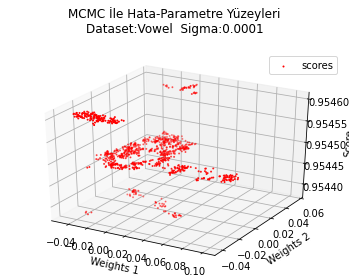

initial score:		0.954491376876831 
 max score:		0.9545994997024536 
 acceptance ratio:		100.0 




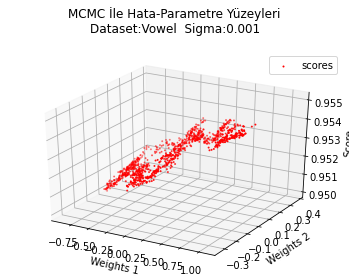

initial score:		0.954491376876831 
 max score:		0.9550318121910095 
 acceptance ratio:		100.0 




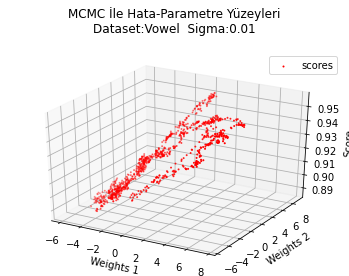

initial score:		0.954491376876831 
 max score:		0.9550319910049438 
 acceptance ratio:		98.7 




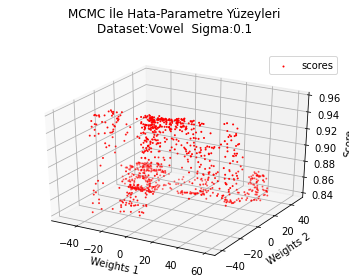

initial score:		0.954491376876831 
 max score:		0.9549239873886108 
 acceptance ratio:		95.2 




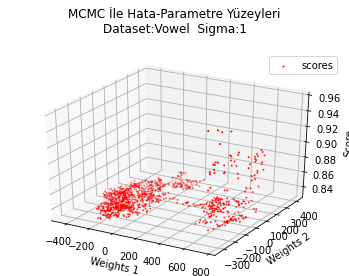

initial score:		0.954491376876831 
 max score:		0.954491376876831 
 acceptance ratio:		96.5 




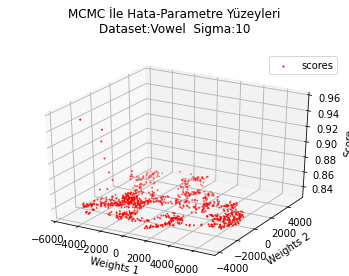

initial score:		0.954491376876831 
 max score:		0.954491376876831 
 acceptance ratio:		99.2 




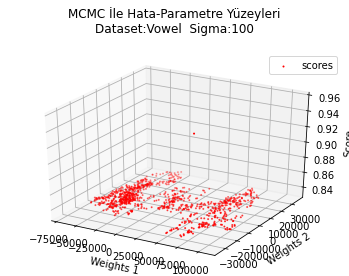

initial score:		0.954491376876831 
 max score:		0.954491376876831 
 acceptance ratio:		99.6 




In [24]:
plotAllScores("Vowel", sigmas, new_weights_list, new_scores_list, max_weigths_list, max_score_list, acceptance_ratios)

In [25]:
## ************************************************************************************************************* ##

In [26]:
path = './36uci/vehicle.arff'

X_train, X_test, y_train, y_test, input_shape, output_shape = loadDataSet(path)
model = createModel(X_train, y_train, input_shape, output_shape, 50)
model.summary()

dataset size: (846, 19)
Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_4 (Dense)              (None, 64)                1216      
_________________________________________________________________
dense_5 (Dense)              (None, 4)                 260       
Total params: 1,476
Trainable params: 1,476
Non-trainable params: 0
_________________________________________________________________


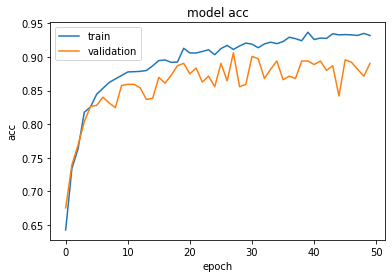

In [27]:
plotAccuracy(model)

In [28]:
initial_weights = model.get_weights() # weights of last epoch

In [29]:
new_weights_list, new_scores_list, max_weigths_list, max_score_list, acceptance_ratios = metropolisDiffrentSigmas(model, sigmas, n_iter, initial_weights)

719/719 [==============================] - 0s 18us/sample - loss: 0.1446 - acc: 0.9409
[-6.16403675902693e-05, -0.00013253364419608783]
[2.390631607857361e-05, 8.115673575463976e-05]
719/719 [==============================] - 0s 18us/sample - loss: 0.1446 - acc: 0.9409
[6.752254997421842e-05, 1.382659325838115e-05]
[-0.00010141316392167102, 4.706442932706932e-05]
719/719 [==============================] - 0s 17us/sample - loss: 0.1446 - acc: 0.9409
[4.6861782283663816e-05, 0.00014136763152628568]
[-8.228776111432678e-05, -4.002487951233841e-05]
719/719 [==============================] - 0s 19us/sample - loss: 0.1446 - acc: 0.9409
[-4.1200656471688254e-05, 2.0754217739576926e-05]
[-1.8905523747833016e-05, 0.00017947141431774022]
719/719 [==============================] - 0s 17us/sample - loss: 0.1446 - acc: 0.9409
[-1.2731414909921586e-05, -2.6711717231618612e-05]
[7.352774295080665e-05, 2.910573245916193e-06]
719/719 [==============================] - 0s 18us/sample - loss: 0.1446 - ac

719/719 [==============================] - 0s 23us/sample - loss: 0.1446 - acc: 0.9409
[1.5151470273199261e-05, 6.732601736319358e-05]
[-3.4952563077148107e-05, 9.700062799300757e-05]
719/719 [==============================] - 0s 20us/sample - loss: 0.1446 - acc: 0.9409
[-5.8992926721341545e-05, -2.317919295006271e-05]
[-3.536092455730466e-05, -1.5268480751221547e-05]
719/719 [==============================] - 0s 17us/sample - loss: 0.1446 - acc: 0.9409
[5.218199231099149e-05, -1.1853115553450797e-05]
[2.7235911940050217e-05, 0.00012407773890199712]
719/719 [==============================] - 0s 19us/sample - loss: 0.1446 - acc: 0.9409
[-4.8582736831181786e-05, -0.00013778638329292644]
[-9.15284766025931e-05, -6.295429959813446e-05]
719/719 [==============================] - 0s 18us/sample - loss: 0.1446 - acc: 0.9409
[-9.326023392882088e-05, -0.00028510350681433734]
[0.00021512617722789217, 8.567374090199711e-05]
719/719 [==============================] - 0s 19us/sample - loss: 0.1446 

719/719 [==============================] - 0s 18us/sample - loss: 0.1446 - acc: 0.9409
[-1.503441031993883e-05, -6.939721321574949e-05]
[-8.959714643423829e-05, -0.00022415080425952004]
719/719 [==============================] - 0s 17us/sample - loss: 0.1446 - acc: 0.9409
[-6.866468223540672e-05, -1.5679373111604706e-05]
[5.676261511820722e-05, 6.660831868778159e-05]
719/719 [==============================] - 0s 20us/sample - loss: 0.1446 - acc: 0.9409
[1.7750336484387758e-05, 8.383545250044303e-05]
[9.833437385602913e-05, -0.0002418494203218243]
719/719 [==============================] - 0s 18us/sample - loss: 0.1446 - acc: 0.9409
[-4.878204243942806e-05, 8.449879868692204e-05]
[4.1618508174912205e-05, -4.829136890862684e-05]
719/719 [==============================] - 0s 19us/sample - loss: 0.1446 - acc: 0.9409
[0.00013760256177404063, -0.00016982642546631592]
[-3.919534297384743e-05, 2.810483289204845e-05]
719/719 [==============================] - 0s 17us/sample - loss: 0.1446 - acc

719/719 [==============================] - 0s 17us/sample - loss: 0.1447 - acc: 0.9409
[4.817665721041038e-06, -0.00013626833240126826]
[2.481902753017455e-05, -0.00021181517170068578]
719/719 [==============================] - 0s 18us/sample - loss: 0.1447 - acc: 0.9409
[6.2935769889153954e-06, -1.9797122133101274e-05]
[0.0001454123657024491, 7.23131911782209e-05]
719/719 [==============================] - 0s 20us/sample - loss: 0.1447 - acc: 0.9409
[-0.0002514108587311484, 0.00020191919570223412]
[-0.00012968024611158553, 7.141917717944176e-05]
719/719 [==============================] - 0s 20us/sample - loss: 0.1447 - acc: 0.9409
[9.56360434132567e-06, 9.260374213610669e-05]
[-0.00011400865646080283, -4.502374465883228e-05]
719/719 [==============================] - 0s 20us/sample - loss: 0.1447 - acc: 0.9409
[0.00019384179483805146, 6.738399731224948e-05]
[-8.116792590978281e-05, -8.785854633481477e-07]
719/719 [==============================] - 0s 17us/sample - loss: 0.1447 - acc: 

719/719 [==============================] - 0s 17us/sample - loss: 0.1447 - acc: 0.9409
[-2.7839456780401286e-05, -5.63008358465588e-06]
[1.9367051619637282e-05, -2.4195015734674402e-05]
719/719 [==============================] - 0s 19us/sample - loss: 0.1447 - acc: 0.9409
[-0.00015641089814562764, -0.00015706918366353276]
[-9.934997874870756e-05, -1.4551962263237593e-05]
719/719 [==============================] - 0s 18us/sample - loss: 0.1447 - acc: 0.9409
[7.626917720602616e-05, 4.09240511760644e-05]
[0.00013457913291787662, 0.00017725184475976468]
719/719 [==============================] - 0s 18us/sample - loss: 0.1447 - acc: 0.9409
[-0.0001377988986597114, -0.0001700544055719854]
[-1.3939776041328161e-05, 0.00016717610467893588]
719/719 [==============================] - 0s 20us/sample - loss: 0.1447 - acc: 0.9409
[9.034784015303447e-06, 0.000139357085615159]
[-7.894359596083541e-06, -8.467745012319237e-05]
719/719 [==============================] - 0s 17us/sample - loss: 0.1447 - a

719/719 [==============================] - 0s 16us/sample - loss: 0.1447 - acc: 0.9409
[-4.947436250034821e-05, 0.00013851535400358531]
[0.00011540369968072722, -2.721903117645679e-05]
719/719 [==============================] - 0s 18us/sample - loss: 0.1447 - acc: 0.9409
[-8.747647923030271e-05, 3.9416535115106404e-05]
[0.00020355064012857557, 0.00011457912304609804]
719/719 [==============================] - 0s 19us/sample - loss: 0.1447 - acc: 0.9409
[-4.380588796600137e-05, -1.044862827307254e-06]
[-0.0001347961154138661, 0.00013104051339919769]
719/719 [==============================] - 0s 19us/sample - loss: 0.1447 - acc: 0.9409
[-1.7316512308747645e-05, 2.4177535907775407e-05]
[-0.0001031609987929257, -6.332780471637337e-05]
719/719 [==============================] - 0s 15us/sample - loss: 0.1447 - acc: 0.9409
[0.00023720138659778943, 8.615445044075193e-05]
[2.55566694048861e-06, 4.888259698550567e-05]
719/719 [==============================] - 0s 17us/sample - loss: 0.1447 - acc

719/719 [==============================] - 0s 17us/sample - loss: 0.1447 - acc: 0.9409
[-3.708427465726662e-05, -3.904721780864647e-05]
[6.310264390340109e-05, 5.7355813106606225e-05]
719/719 [==============================] - 0s 17us/sample - loss: 0.1447 - acc: 0.9409
[3.8690583433560196e-05, -7.091160744618934e-06]
[0.00011949182907747029, -0.0002621668258223491]
719/719 [==============================] - 0s 17us/sample - loss: 0.1447 - acc: 0.9409
[6.7934732242714e-05, 0.00011096345910047168]
[-0.00015037417505036078, -0.00012154539352948877]
719/719 [==============================] - 0s 17us/sample - loss: 0.1447 - acc: 0.9409
[6.894264901851177e-06, 8.19802492650873e-05]
[-8.080877853336068e-05, -6.141080314375782e-05]
719/719 [==============================] - 0s 16us/sample - loss: 0.1447 - acc: 0.9409
[0.00016684070258713584, -0.00010572953165378257]
[-0.00024171671372117174, -7.302746675470278e-05]
719/719 [==============================] - 0s 16us/sample - loss: 0.1447 - acc

719/719 [==============================] - 0s 20us/sample - loss: 0.1446 - acc: 0.9409
[-3.9132985058774205e-05, -7.159310820143985e-05]
[-0.00020148712410454715, -6.974169849731744e-05]
719/719 [==============================] - 0s 16us/sample - loss: 0.1446 - acc: 0.9409
[-1.2131109989252757e-05, -0.00012298334571518194]
[7.656556996691764e-05, 0.00017804751007499206]
719/719 [==============================] - 0s 19us/sample - loss: 0.1446 - acc: 0.9409
[-3.2431860011484656e-05, -0.00011041797495308767]
[2.2799183906372525e-05, 0.00016763917966921424]
719/719 [==============================] - 0s 16us/sample - loss: 0.1446 - acc: 0.9409
[-6.683285728558483e-05, -0.00014121795086681314]
[-1.4564834459264601e-05, 0.0001000804680995463]
719/719 [==============================] - 0s 17us/sample - loss: 0.1446 - acc: 0.9409
[0.00012216033546670637, 9.703298272573815e-05]
[-6.50481137730248e-05, 4.1890069913392316e-05]
719/719 [==============================] - 0s 20us/sample - loss: 0.144

719/719 [==============================] - 0s 20us/sample - loss: 0.1446 - acc: 0.9409
[4.715965565527178e-05, 8.460333128277328e-05]
[-2.6521077432048263e-05, 0.00012649719647720242]
719/719 [==============================] - 0s 18us/sample - loss: 0.1446 - acc: 0.9409
[-8.820044997279626e-05, -0.000138012603125609]
[-8.971291297155103e-06, -1.2408257297271089e-05]
719/719 [==============================] - 0s 17us/sample - loss: 0.1446 - acc: 0.9409
[0.00013432823579980302, 7.0423526346286285e-06]
[-4.8785311176800095e-05, 0.00010659408681054244]
719/719 [==============================] - 0s 19us/sample - loss: 0.1446 - acc: 0.9409
[9.031360977877767e-05, 2.086110460569578e-05]
[6.828329262487562e-05, 1.4319434406507873e-05]
719/719 [==============================] - 0s 18us/sample - loss: 0.1446 - acc: 0.9409
[7.630419234148985e-06, -2.632058900302953e-05]
[3.802752105548467e-05, -0.00022042284514299065]
719/719 [==============================] - 0s 17us/sample - loss: 0.1446 - acc:

719/719 [==============================] - 0s 17us/sample - loss: 0.1446 - acc: 0.9409
[-9.808312814773373e-05, 3.6873449042683934e-05]
[-2.1918478504002206e-06, -2.9315888721314195e-05]
719/719 [==============================] - 0s 17us/sample - loss: 0.1446 - acc: 0.9409
[-6.0240362240973755e-05, 5.37926242533967e-06]
[2.0475905415328232e-05, 0.00010980234571514399]
719/719 [==============================] - 0s 17us/sample - loss: 0.1446 - acc: 0.9409
[0.00015729156214427953, 1.921798377179343e-06]
[0.00023431081880152522, 1.0217342620254381e-05]
719/719 [==============================] - 0s 17us/sample - loss: 0.1446 - acc: 0.9409
[-2.7395584786259264e-05, -7.49718088369654e-05]
[8.778074458193378e-06, 8.221169699117616e-05]
719/719 [==============================] - 0s 20us/sample - loss: 0.1446 - acc: 0.9409
[-9.232445438282543e-05, -0.00014150084902382913]
[-0.00010368668664493702, 2.0691349619474436e-05]
719/719 [==============================] - 0s 16us/sample - loss: 0.1446 - 

719/719 [==============================] - 0s 18us/sample - loss: 0.1446 - acc: 0.9409
[5.400430521476317e-05, -1.7801071575321626e-05]
[-4.885946767634473e-06, -7.016311525109716e-05]
719/719 [==============================] - 0s 16us/sample - loss: 0.1446 - acc: 0.9409
[-3.1691315922072653e-05, -0.000197144917178652]
[3.605657713328228e-05, 0.00018072333324612661]
719/719 [==============================] - 0s 16us/sample - loss: 0.1446 - acc: 0.9409
[8.31825191767917e-06, -8.685020091696802e-05]
[0.0001018208866449562, 6.604848043971053e-05]
719/719 [==============================] - 0s 18us/sample - loss: 0.1446 - acc: 0.9409
[-1.3409843349622306e-05, 7.826318140402866e-05]
[-2.5864810448342712e-05, -0.00012897586102077365]
719/719 [==============================] - 0s 18us/sample - loss: 0.1446 - acc: 0.9409
[0.00018910940068388068, 8.96695032642262e-05]
[4.3777528870742886e-05, 8.37890640190059e-05]
719/719 [==============================] - 0s 16us/sample - loss: 0.1446 - acc: 0.

719/719 [==============================] - 0s 17us/sample - loss: 0.1446 - acc: 0.9409
[-0.00021631237960000003, 4.292064394192334e-05]
[-6.059238505906121e-05, -5.449109199806372e-06]
719/719 [==============================] - 0s 20us/sample - loss: 0.1446 - acc: 0.9409
[-0.00010409080589129814, 5.962496984622904e-05]
[-6.89387704491399e-05, -6.937731466163956e-05]
719/719 [==============================] - 0s 16us/sample - loss: 0.1446 - acc: 0.9409
[6.434412030437705e-05, -3.5836152537080915e-05]
[-2.4468736575041103e-05, -4.181538647404931e-05]
719/719 [==============================] - 0s 16us/sample - loss: 0.1446 - acc: 0.9409
[-0.00012457073137567447, -0.0002082045972111972]
[0.00016201640317270165, -1.2967636343216169e-05]
719/719 [==============================] - 0s 19us/sample - loss: 0.1446 - acc: 0.9409
[1.1529463170669505e-06, 9.796538965046584e-05]
[9.061910941128615e-05, -4.3531305351672855e-05]
719/719 [==============================] - 0s 17us/sample - loss: 0.1446 -

719/719 [==============================] - 0s 17us/sample - loss: 0.1446 - acc: 0.9409
[-5.4717945286934643e-05, -1.3994138685589456e-05]
[-1.1996841559617633e-06, 1.5052614621210264e-05]
719/719 [==============================] - 0s 18us/sample - loss: 0.1446 - acc: 0.9409
[9.655591437914342e-05, 6.197718986103899e-05]
[-3.259467328828302e-06, -9.879184150395526e-05]
719/719 [==============================] - 0s 16us/sample - loss: 0.1446 - acc: 0.9409
[-0.0001002980535460758, -7.317108364655095e-06]
[-0.00021080492269083466, 6.530785552941965e-05]
719/719 [==============================] - 0s 17us/sample - loss: 0.1446 - acc: 0.9409
[2.5369767603504783e-05, 0.00020939652768926922]
[5.655842087120833e-05, -5.684282607763128e-05]
719/719 [==============================] - 0s 16us/sample - loss: 0.1446 - acc: 0.9409
[-6.230819971112414e-05, 0.00011027172335144657]
[3.266928822152691e-05, -1.939011269234872e-05]
719/719 [==============================] - 0s 15us/sample - loss: 0.1446 - a

719/719 [==============================] - 0s 16us/sample - loss: 0.1446 - acc: 0.9409
[7.383591576301399e-05, 7.388557296243821e-05]
[8.703826626089693e-05, 1.7303703192815053e-05]
719/719 [==============================] - 0s 17us/sample - loss: 0.1446 - acc: 0.9409
[-8.847198757241612e-05, -4.108273825483525e-05]
[-7.283381298286664e-05, 6.533559009750437e-06]
719/719 [==============================] - 0s 18us/sample - loss: 0.1446 - acc: 0.9409
[-5.419477411270803e-05, 4.592520698217421e-05]
[-0.00011045648505936625, 1.2069374071886984e-05]
719/719 [==============================] - 0s 20us/sample - loss: 0.1446 - acc: 0.9409
[4.522797631964172e-06, 3.87311720424368e-05]
[-3.186436265926165e-05, 2.4976982383857414e-05]
719/719 [==============================] - 0s 16us/sample - loss: 0.1446 - acc: 0.9409
[0.00011739054249210592, 4.6181187116746784e-05]
[-2.8345427440049142e-05, 0.0001918614532365014]
719/719 [==============================] - 0s 19us/sample - loss: 0.1446 - acc: 0.

719/719 [==============================] - 0s 18us/sample - loss: 0.1446 - acc: 0.9409
[0.00012147147397238578, -1.5401920552197625e-05]
[-8.829271372286258e-05, -6.8006373803522e-05]
719/719 [==============================] - 0s 17us/sample - loss: 0.1446 - acc: 0.9409
[5.373254604500862e-06, -3.3527599141347096e-05]
[6.125697153034231e-05, -3.577841956251024e-05]
719/719 [==============================] - 0s 15us/sample - loss: 0.1446 - acc: 0.9409
[-1.609142465099974e-05, -3.31880176657543e-05]
[-8.992227923435306e-05, 0.00010336021231872986]
719/719 [==============================] - 0s 17us/sample - loss: 0.1446 - acc: 0.9409
[1.5420199633809404e-05, -6.119195370015125e-05]
[3.8678490361405437e-05, -8.319258371188384e-05]
719/719 [==============================] - 0s 15us/sample - loss: 0.1446 - acc: 0.9409
[4.917486672632147e-07, 6.309195480249165e-05]
[5.3803710631606375e-05, 6.008306660751142e-05]
719/719 [==============================] - 0s 19us/sample - loss: 0.1446 - acc: 0

719/719 [==============================] - 0s 16us/sample - loss: 0.1446 - acc: 0.9409
[-7.49004067061728e-05, -8.932159041808609e-05]
[-0.0001453692844863915, 2.772143081946827e-05]
719/719 [==============================] - 0s 19us/sample - loss: 0.1447 - acc: 0.9409
[-9.260148359418766e-05, -0.0001327548247273583]
[0.00011006051369784998, 0.000329058518104716]
719/719 [==============================] - 0s 20us/sample - loss: 0.1447 - acc: 0.9409
[-0.00022181690665190723, 0.00022337807904942788]
[0.00013766737179237164, 8.924817783586124e-05]
719/719 [==============================] - 0s 18us/sample - loss: 0.1447 - acc: 0.9409
[-5.137701818441103e-05, 5.762631698515896e-06]
[0.00013056023068659978, 7.707410862585767e-05]
719/719 [==============================] - 0s 18us/sample - loss: 0.1447 - acc: 0.9409
[0.00011016656015752863, 7.30612119868104e-05]
[-0.0001519399598962312, -4.1747881491394e-05]
719/719 [==============================] - 0s 18us/sample - loss: 0.1447 - acc: 0.940

719/719 [==============================] - 0s 15us/sample - loss: 0.1447 - acc: 0.9405
[-3.829941482322747e-05, 1.3238858779615626e-05]
[5.9677190481426935e-05, -2.420992717176418e-05]
719/719 [==============================] - 0s 15us/sample - loss: 0.1447 - acc: 0.9405
[-0.00014324567286395898, -0.00011801572877390823]
[-9.302803936516322e-06, 0.0001843039870886852]
719/719 [==============================] - 0s 19us/sample - loss: 0.1448 - acc: 0.9405
[0.00020896139929060725, 4.503014818473846e-05]
[-3.9614284528003165e-05, -4.246758149953606e-06]
719/719 [==============================] - 0s 17us/sample - loss: 0.1447 - acc: 0.9405
[9.483794841723697e-05, -0.00011859119858569165]
[-9.645028264786983e-05, 9.89466618168391e-05]
719/719 [==============================] - 0s 16us/sample - loss: 0.1447 - acc: 0.9405
[-0.0001999397274827951, 6.651445592496051e-05]
[-0.00015928605307150527, -0.00016893328283138368]
719/719 [==============================] - 0s 16us/sample - loss: 0.1447 - 

719/719 [==============================] - 0s 15us/sample - loss: 0.1448 - acc: 0.9405
[7.748606341433496e-05, -0.00010352715603933549]
[-0.00011616639212435871, -6.389449152212984e-05]
719/719 [==============================] - 0s 19us/sample - loss: 0.1448 - acc: 0.9405
[-2.2908455748016e-05, -0.0001104930668203523]
[2.2747713198766806e-05, 9.734005546525519e-05]
719/719 [==============================] - 0s 16us/sample - loss: 0.1448 - acc: 0.9405
[-8.858543024152466e-05, 0.00010216448026099852]
[4.128672549088932e-06, -1.8127998193766215e-05]
719/719 [==============================] - 0s 17us/sample - loss: 0.1448 - acc: 0.9405
[-3.5509977900320984e-05, 4.8494669626933635e-05]
[-2.989310782664623e-05, -9.523473091440597e-06]
719/719 [==============================] - 0s 18us/sample - loss: 0.1448 - acc: 0.9405
[-0.0002115982460005558, 9.699201507865437e-05]
[4.078413787346481e-05, -7.750391289366986e-05]
719/719 [==============================] - 0s 18us/sample - loss: 0.1448 - acc

719/719 [==============================] - 0s 15us/sample - loss: 0.1449 - acc: 0.9398
[-1.6083807518392664e-05, -9.009638364721298e-05]
[0.00012220644913541682, 0.00011574273110474405]
719/719 [==============================] - 0s 18us/sample - loss: 0.1449 - acc: 0.9398
[-1.096667954277405e-05, 8.088991339285348e-05]
[0.0002296307730063047, -9.542039604039857e-05]
719/719 [==============================] - 0s 17us/sample - loss: 0.1449 - acc: 0.9398
[9.31396558713342e-05, 8.510939208967648e-05]
[0.00012213654836003477, -0.00010998289028515805]
719/719 [==============================] - 0s 19us/sample - loss: 0.1449 - acc: 0.9398
[-2.5064848601709006e-05, -2.3719966549865746e-05]
[2.016243174570436e-05, -5.7349211196147535e-05]
719/719 [==============================] - 0s 17us/sample - loss: 0.1449 - acc: 0.9398
[-3.413921849175472e-05, 7.17209149565806e-05]
[-0.00016973164863714476, 4.4669784945844884e-05]
719/719 [==============================] - 0s 17us/sample - loss: 0.1449 - ac

719/719 [==============================] - 0s 16us/sample - loss: 0.1449 - acc: 0.9398
[-0.00012489905034357803, -8.503008081229206e-05]
[-0.0001989916313460894, 1.769816736562418e-05]
719/719 [==============================] - 0s 17us/sample - loss: 0.1449 - acc: 0.9398
[0.00025520991539900774, -0.00013350704414493933]
[3.371402240603819e-05, -1.7380725866214323e-05]
719/719 [==============================] - 0s 20us/sample - loss: 0.1449 - acc: 0.9398
[-0.00011119905883517263, -0.00017355628066191133]
[-5.572259597582308e-05, 1.2865223022309275e-05]
719/719 [==============================] - 0s 17us/sample - loss: 0.1449 - acc: 0.9398
[0.00014372248436857998, -0.00013389087803130988]
[5.6134641256068355e-05, 8.854039025350264e-05]
719/719 [==============================] - 0s 16us/sample - loss: 0.1449 - acc: 0.9398
[3.21939999699859e-06, 0.00011533631698171892]
[2.8132981499983912e-05, -0.00013061087882438555]
719/719 [==============================] - 0s 16us/sample - loss: 0.1449 

719/719 [==============================] - 0s 15us/sample - loss: 0.1449 - acc: 0.9398
[8.277063885361112e-07, 4.292929276638592e-05]
[-2.7813259836012034e-05, 0.00020430619981206375]
719/719 [==============================] - 0s 17us/sample - loss: 0.1449 - acc: 0.9398
[-6.064661560660847e-05, -5.550859655314257e-05]
[-8.692889526676208e-05, 5.492564237453999e-05]
719/719 [==============================] - 0s 18us/sample - loss: 0.1449 - acc: 0.9398
[9.850519416958565e-05, 0.0001871545182753411]
[-4.36791361201961e-05, 4.1009605144686056e-05]
719/719 [==============================] - 0s 18us/sample - loss: 0.1449 - acc: 0.9398
[-0.00028348900074651737, -0.00010520568392626635]
[0.0001869815363697614, 2.6235689316215607e-05]
719/719 [==============================] - 0s 21us/sample - loss: 0.1449 - acc: 0.9395
[-2.2486467928645665e-05, 0.0001538811326676621]
[4.9237348705631234e-05, 9.035041078630959e-06]
719/719 [==============================] - 0s 19us/sample - loss: 0.1449 - acc: 

719/719 [==============================] - 0s 17us/sample - loss: 0.1449 - acc: 0.9398
[2.5201379467344223e-05, -0.00013465682624963819]
[-8.34021458303537e-05, 0.00011341576734071107]
719/719 [==============================] - 0s 18us/sample - loss: 0.1449 - acc: 0.9398
[-5.45506553338894e-05, -8.970310846513053e-05]
[4.900961101721021e-05, 5.38552961212145e-05]
719/719 [==============================] - 0s 18us/sample - loss: 0.1449 - acc: 0.9395
[-3.444162624909354e-05, -2.3399576433065177e-05]
[-5.2751253961484346e-05, 2.0885676820213994e-05]
719/719 [==============================] - 0s 17us/sample - loss: 0.1449 - acc: 0.9395
[-9.338581306640945e-06, -0.0001551775537056426]
[-1.4224682594308416e-05, 0.00014088844881925534]
719/719 [==============================] - 0s 21us/sample - loss: 0.1449 - acc: 0.9395
[3.278370515150068e-05, -5.8110044919912534e-05]
[2.1576293378568914e-05, -3.4125691137007565e-05]
719/719 [==============================] - 0s 17us/sample - loss: 0.1449 - 

719/719 [==============================] - 0s 17us/sample - loss: 0.1450 - acc: 0.9395
[-3.191155417861195e-05, -0.00010943534144218301]
[-1.4916113009002735e-05, -7.041018757889343e-05]
719/719 [==============================] - 0s 19us/sample - loss: 0.1450 - acc: 0.9395
[-5.1926886693582725e-05, 3.0254247870314018e-05]
[7.904381518687462e-06, -4.256207155626805e-06]
719/719 [==============================] - 0s 15us/sample - loss: 0.1450 - acc: 0.9395
[2.6248276930391918e-05, -0.00015130661322569077]
[-0.00020037876461438567, 2.6818406351954482e-05]
719/719 [==============================] - 0s 15us/sample - loss: 0.1450 - acc: 0.9395
[0.00014333082003867948, -2.370672776571463e-05]
[-0.00020933822518958212, -0.00011692748191054626]
719/719 [==============================] - 0s 23us/sample - loss: 0.1450 - acc: 0.9395
[-0.0002999226649177439, -6.552976942275162e-05]
[-0.00011098989570340955, 0.0002663913265880573]
719/719 [==============================] - 0s 18us/sample - loss: 0.1

719/719 [==============================] - 0s 17us/sample - loss: 0.1451 - acc: 0.9402
[-6.239091365752375e-05, 0.00012969073388134975]
[0.0001280296034435718, 0.00024084664862984817]
719/719 [==============================] - 0s 23us/sample - loss: 0.1451 - acc: 0.9402
[-4.193175905060841e-05, 8.575223799179722e-05]
[-4.51557004252756e-05, 9.565500223165e-05]
719/719 [==============================] - 0s 25us/sample - loss: 0.1451 - acc: 0.9402
[-0.00012653875222676285, -0.00016096135906817327]
[3.920670654477008e-05, -4.149812546454355e-05]
719/719 [==============================] - 0s 15us/sample - loss: 0.1451 - acc: 0.9402
[8.565161086967899e-05, 2.6645995301962806e-05]
[0.00013061123113419174, 5.2492924613054806e-05]
719/719 [==============================] - 0s 20us/sample - loss: 0.1451 - acc: 0.9402
[-4.759668453356813e-05, 5.946603388767881e-06]
[-4.4016930021365136e-05, 0.0001407259140136407]
719/719 [==============================] - 0s 19us/sample - loss: 0.1451 - acc: 0.9

719/719 [==============================] - 0s 16us/sample - loss: 0.1451 - acc: 0.9405
[-0.00016677297105724995, 0.00015169774663034705]
[-1.0887840770726384e-05, 0.00010964539914015089]
719/719 [==============================] - 0s 18us/sample - loss: 0.1451 - acc: 0.9405
[8.969440149287142e-05, -0.0001061136383948983]
[6.404619878014124e-05, 7.340925544363971e-05]
719/719 [==============================] - 0s 21us/sample - loss: 0.1451 - acc: 0.9405
[-6.443773906039073e-05, -9.823201056901477e-05]
[-0.00019766553846173418, 3.814793406976075e-05]
719/719 [==============================] - 0s 21us/sample - loss: 0.1451 - acc: 0.9405
[6.784391557902332e-05, -1.5056703709479827e-05]
[-0.0001548891528823537, 1.952176544491168e-05]
719/719 [==============================] - 0s 18us/sample - loss: 0.1451 - acc: 0.9405
[-2.877478538523486e-05, 3.402157177178884e-05]
[0.00019982968016627083, -0.00012787745048556504]
719/719 [==============================] - 0s 17us/sample - loss: 0.1451 - ac

719/719 [==============================] - 0s 19us/sample - loss: 0.1452 - acc: 0.9412
[4.0876778995545715e-05, -1.0196109726905046e-05]
[-7.671004922788257e-05, -2.467315125693468e-05]
719/719 [==============================] - 0s 23us/sample - loss: 0.1452 - acc: 0.9412
[3.3525948173332635e-06, 5.772316684176895e-05]
[-0.00021306571612194098, -5.843051764865338e-05]
719/719 [==============================] - 0s 23us/sample - loss: 0.1452 - acc: 0.9412
[-4.6212602992628056e-05, 1.65529859016423e-05]
[0.00023778006114821715, 0.000197979284946618]
719/719 [==============================] - 0s 22us/sample - loss: 0.1452 - acc: 0.9412
[4.385968189583992e-05, 3.824899902546557e-05]
[-5.899764011806136e-05, 0.00019978055036472023]
719/719 [==============================] - 0s 20us/sample - loss: 0.1452 - acc: 0.9412
[0.00019147589274748263, -1.189029528667257e-05]
[1.1820288075144066e-06, -1.932708479592352e-05]
719/719 [==============================] - 0s 17us/sample - loss: 0.1452 - acc:

719/719 [==============================] - 0s 21us/sample - loss: 0.1452 - acc: 0.9412
[0.00020403045937367976, -4.49734901354439e-05]
[-0.00011972909035267588, -0.00019126005535094953]
719/719 [==============================] - 0s 18us/sample - loss: 0.1452 - acc: 0.9412
[0.00015329511036775605, 6.627871010772598e-05]
[-1.2873738609815582e-05, -0.00014358063493133774]
719/719 [==============================] - 0s 20us/sample - loss: 0.1452 - acc: 0.9409
[-0.00012746641998106028, 0.00012214133276990566]
[0.00010647604649593768, 1.5014290765826771e-05]
719/719 [==============================] - 0s 15us/sample - loss: 0.1452 - acc: 0.9409
[0.0001314806996328914, -4.1494263615615976e-05]
[-3.0130218018413637e-05, -1.064398511560228e-05]
719/719 [==============================] - 0s 18us/sample - loss: 0.1452 - acc: 0.9409
[9.638614373691284e-05, -4.721377665887734e-05]
[5.132700584759856e-05, -9.457498079625135e-05]
719/719 [==============================] - 0s 18us/sample - loss: 0.1452 

719/719 [==============================] - 0s 19us/sample - loss: 0.1451 - acc: 0.9409
[0.00016129022523935746, 4.6224367041677755e-05]
[-1.2500299009014269e-05, 3.274960811770647e-05]
719/719 [==============================] - 0s 17us/sample - loss: 0.1451 - acc: 0.9405
[-0.0002399555581011144, 5.492255418318765e-05]
[0.0001343752990850963, -2.875011014756382e-05]
719/719 [==============================] - 0s 18us/sample - loss: 0.1451 - acc: 0.9409
[-4.0946599352555864e-05, -7.523807535063498e-05]
[3.870525049794117e-05, -0.00011715628233098417]
719/719 [==============================] - 0s 19us/sample - loss: 0.1451 - acc: 0.9409
[-0.00012524864182988284, -0.00018938508173455695]
[-3.928755783358036e-06, 0.00014851724403856787]
719/719 [==============================] - 0s 19us/sample - loss: 0.1452 - acc: 0.9409
[0.0001423597576803214, 7.822302769650897e-06]
[8.050515954039916e-05, 0.0001499235049248357]
719/719 [==============================] - 0s 21us/sample - loss: 0.1452 - acc

719/719 [==============================] - 0s 18us/sample - loss: 0.1452 - acc: 0.9409
[-8.223351746159526e-05, 3.338282299085452e-05]
[3.028160856238075e-05, 3.716127138969637e-05]
719/719 [==============================] - 0s 18us/sample - loss: 0.1452 - acc: 0.9409
[-1.2051617195012368e-05, 0.00016508344500709327]
[0.00010395272623075617, 5.652543460959804e-05]
719/719 [==============================] - 0s 17us/sample - loss: 0.1452 - acc: 0.9409
[1.8690017102575753e-05, 9.437266361987914e-05]
[3.516726958131564e-05, 6.28045383936863e-05]
719/719 [==============================] - 0s 19us/sample - loss: 0.1452 - acc: 0.9409
[-6.825415942696917e-05, 7.439584833035057e-05]
[0.00021542391688435567, 0.00013995346702179247]
719/719 [==============================] - 0s 17us/sample - loss: 0.1452 - acc: 0.9409
[-5.647043656871818e-06, -1.070153964413586e-05]
[3.530761083255593e-05, -0.0001328622566954463]
719/719 [==============================] - 0s 19us/sample - loss: 0.1452 - acc: 0.94

719/719 [==============================] - 0s 20us/sample - loss: 0.1451 - acc: 0.9405
[-8.058425539305465e-05, -0.00013021615056891508]
[0.00015126524505421372, -4.8284987573367194e-05]
719/719 [==============================] - 0s 22us/sample - loss: 0.1451 - acc: 0.9405
[6.407656897168714e-05, -7.72640441521781e-05]
[-0.00010184127459671427, -7.65990077662326e-05]
719/719 [==============================] - 0s 15us/sample - loss: 0.1451 - acc: 0.9405
[-1.3076831933156912e-06, 0.00013029445955086653]
[4.07775239676727e-05, 6.725980732311595e-05]
719/719 [==============================] - 0s 15us/sample - loss: 0.1451 - acc: 0.9405
[7.835834677773223e-05, 9.726969284591652e-05]
[0.0001344615044246282, -6.538529680238932e-06]
719/719 [==============================] - 0s 17us/sample - loss: 0.1451 - acc: 0.9405
[8.430345561578477e-05, -7.236234333584627e-05]
[-4.469887184133876e-05, -7.800532292488615e-05]
719/719 [==============================] - 0s 17us/sample - loss: 0.1451 - acc: 0

719/719 [==============================] - 0s 15us/sample - loss: 0.1451 - acc: 0.9405
[0.00010450129225687326, 1.7933408622416206e-07]
[6.868310451303139e-05, -9.613363966969193e-05]
719/719 [==============================] - 0s 17us/sample - loss: 0.1451 - acc: 0.9405
[3.98038429612499e-05, -0.00019504162476513838]
[-7.449983235585787e-05, -0.00019423419600818497]
719/719 [==============================] - 0s 20us/sample - loss: 0.1451 - acc: 0.9405
[9.99379594717398e-05, 3.387266079668481e-05]
[-5.5886492111427946e-06, -9.04745407942836e-05]
719/719 [==============================] - 0s 18us/sample - loss: 0.1451 - acc: 0.9402
[0.0002597441755770716, 0.00010241774330374621]
[6.296934774369026e-05, -0.00012846666884278182]
719/719 [==============================] - 0s 18us/sample - loss: 0.1451 - acc: 0.9402
[-8.780766279077273e-05, -0.00016233340991361712]
[-0.0001835906377331748, 3.327859146623087e-05]
719/719 [==============================] - 0s 18us/sample - loss: 0.1451 - acc: 

719/719 [==============================] - 0s 18us/sample - loss: 0.1450 - acc: 0.9395
[-5.624195219573257e-05, -3.8743857509708164e-05]
[-0.00013070231821956044, -9.22026348650022e-05]
719/719 [==============================] - 0s 17us/sample - loss: 0.1450 - acc: 0.9398
[0.0001477156345568587, -3.638043820342131e-05]
[2.5204163767721827e-05, -9.147713528121449e-05]
719/719 [==============================] - 0s 18us/sample - loss: 0.1450 - acc: 0.9395
[3.340109867647635e-05, -2.0179414288021336e-05]
[-0.00011547100228469216, -1.6359149592033612e-05]
719/719 [==============================] - 0s 17us/sample - loss: 0.1450 - acc: 0.9395
[-0.00014286860348393585, 2.9894061106974402e-05]
[-2.635893547992987e-06, 0.00011363050886294853]
719/719 [==============================] - 0s 16us/sample - loss: 0.1450 - acc: 0.9395
[-3.875095084287018e-05, 9.741727049125458e-05]
[-1.2789576331040196e-05, -5.2526785524497545e-05]
719/719 [==============================] - 0s 20us/sample - loss: 0.145

719/719 [==============================] - 0s 15us/sample - loss: 0.1450 - acc: 0.9395
[-8.0789416836053e-05, 2.8526377654099197e-05]
[2.4058113034056408e-05, -0.00015055271717505971]
719/719 [==============================] - 0s 16us/sample - loss: 0.1450 - acc: 0.9395
[-0.00013860893080184144, 1.1666084540734417e-06]
[-3.181324836911132e-05, -0.0001605907536237652]
719/719 [==============================] - 0s 16us/sample - loss: 0.1450 - acc: 0.9395
[-6.7162735073068e-05, -6.659218676987161e-05]
[-3.6496829339422384e-05, 5.7784918221068497e-05]
719/719 [==============================] - 0s 20us/sample - loss: 0.1450 - acc: 0.9395
[-8.814517670310633e-05, 0.0001535832896558675]
[0.00021990864300546527, -2.721934089092106e-07]
719/719 [==============================] - 0s 20us/sample - loss: 0.1450 - acc: 0.9395
[-4.049766131942442e-05, -1.9143092988619842e-05]
[5.280489063200808e-05, 8.423344789995887e-05]
719/719 [==============================] - 0s 21us/sample - loss: 0.1450 - acc

719/719 [==============================] - 0s 16us/sample - loss: 0.1449 - acc: 0.9398
[5.1106349064542545e-05, 8.293909087247918e-05]
[0.00013729873379952415, -7.310268006389602e-05]
719/719 [==============================] - 0s 17us/sample - loss: 0.1449 - acc: 0.9398
[3.89236561869252e-05, 0.00025662775278083663]
[-9.302118366978818e-05, 3.9975962019799586e-05]
719/719 [==============================] - 0s 17us/sample - loss: 0.1449 - acc: 0.9398
[6.466716605813554e-05, 0.00010993982785871777]
[-5.64930244533474e-05, -5.444830153424784e-05]
719/719 [==============================] - 0s 16us/sample - loss: 0.1449 - acc: 0.9398
[3.567466755348839e-05, 0.00012841125114996274]
[-8.08131050862999e-06, -1.0892868739938333e-05]
719/719 [==============================] - 0s 16us/sample - loss: 0.1449 - acc: 0.9398
[-7.471467948315226e-05, -1.751817206789628e-05]
[0.00014647829167028608, 4.175803226094223e-05]
719/719 [==============================] - 0s 18us/sample - loss: 0.1449 - acc: 0.

719/719 [==============================] - 0s 17us/sample - loss: 0.1446 - acc: 0.9409
[-0.0004610425429954923, -0.0011488536105467226]
[0.0018484975988402085, 0.001275980186663906]
719/719 [==============================] - 0s 20us/sample - loss: 0.1446 - acc: 0.9409
[0.0004776043131971328, -0.0006437139621355367]
[0.0008771047267803408, -3.7891449166987045e-05]
719/719 [==============================] - 0s 18us/sample - loss: 0.1446 - acc: 0.9409
[2.9263364914775847e-05, 0.0005444083836037423]
[0.0017454864088190126, 0.00022110011222621523]
719/719 [==============================] - 0s 18us/sample - loss: 0.1446 - acc: 0.9409
[0.0020750042228239356, 0.001029254797652747]
[0.00024139648400774613, 0.0014562823859639385]
719/719 [==============================] - 0s 18us/sample - loss: 0.1446 - acc: 0.9398
[-0.00025963031808691754, -0.0016404733096890924]
[0.0006914531279792441, -0.0004336851795122351]
719/719 [==============================] - 0s 16us/sample - loss: 0.1446 - acc: 0.939

719/719 [==============================] - 0s 16us/sample - loss: 0.1446 - acc: 0.9395
[-0.0010715580870847533, 0.00032960739944561156]
[-0.0014675324043717578, 0.0010501944551845267]
719/719 [==============================] - 0s 19us/sample - loss: 0.1446 - acc: 0.9398
[0.0011499855712772784, 0.000476430574676763]
[0.0014384887438191687, -0.0019888677584018045]
719/719 [==============================] - 0s 17us/sample - loss: 0.1446 - acc: 0.9395
[0.0006536866790572693, -0.0014135155779439253]
[0.0007568036930052438, 0.0006950908532198405]
719/719 [==============================] - 0s 17us/sample - loss: 0.1446 - acc: 0.9395
[-0.0012216033993679967, -0.0013266587688998668]
[0.0006107605878877654, -0.0003932673076713648]
719/719 [==============================] - 0s 16us/sample - loss: 0.1446 - acc: 0.9398
[-0.0005995795530996748, 0.0005453963427758706]
[0.0018094678557495, 4.4180931087382474e-05]
719/719 [==============================] - 0s 16us/sample - loss: 0.1446 - acc: 0.9398
[0

719/719 [==============================] - 0s 16us/sample - loss: 0.1447 - acc: 0.9398
[0.0008952173625565011, -0.0013772962169828144]
[-0.0001910858206759765, -0.001228055921852186]
719/719 [==============================] - 0s 17us/sample - loss: 0.1448 - acc: 0.9402
[-0.00037283260585291696, 0.0006724407693709913]
[0.0011389213768573068, 2.278278656571263e-05]
719/719 [==============================] - 0s 19us/sample - loss: 0.1448 - acc: 0.9402
[-0.00026101730101437976, -0.0006242724697946727]
[-0.0013758223631121127, 0.0017423836928991206]
719/719 [==============================] - 0s 17us/sample - loss: 0.1447 - acc: 0.9398
[0.0022203900708111434, 0.0011544945742349537]
[-0.0017525139795112478, 0.0008244066893794473]
719/719 [==============================] - 0s 17us/sample - loss: 0.1449 - acc: 0.9398
[-0.001305100212853716, 0.0008222085503964963]
[-0.0013359429754276058, 0.0001543782937350248]
719/719 [==============================] - 0s 19us/sample - loss: 0.1448 - acc: 0.939

719/719 [==============================] - 0s 17us/sample - loss: 0.1446 - acc: 0.9398
[-0.0010350378325477728, 0.00011427703203669962]
[-0.0009072247029044178, -0.0011494654283602458]
719/719 [==============================] - 0s 19us/sample - loss: 0.1446 - acc: 0.9409
[5.826143108110257e-05, 0.000674800917084482]
[-0.000672274041356339, -4.332432920229963e-05]
719/719 [==============================] - 0s 21us/sample - loss: 0.1446 - acc: 0.9409
[-0.0011539093711539726, -0.00026604474553989344]
[0.0004847245282601061, -0.0016993588919498553]
719/719 [==============================] - 0s 20us/sample - loss: 0.1446 - acc: 0.9409
[-0.00031839533804926075, 0.0006747968304680593]
[-0.0010597389829765825, 0.0007088502045608724]
719/719 [==============================] - 0s 18us/sample - loss: 0.1446 - acc: 0.9409
[0.0011798291369532797, 0.0008442356710713806]
[-0.00023409777934718721, -0.001537947644753227]
719/719 [==============================] - 0s 16us/sample - loss: 0.1446 - acc: 0.

[-0.0010103443479770572, 0.0003297726625340971]
[0.00015640806536659012, -0.0007262541482442077]
719/719 [==============================] - 0s 18us/sample - loss: 0.1446 - acc: 0.9405
[0.00028619433383184984, 3.743510480114052e-05]
[-0.0006840138992216404, -0.0012569571765719773]
719/719 [==============================] - 0s 21us/sample - loss: 0.1446 - acc: 0.9402
[0.0007609873146127048, -0.002396240004995515]
[-0.00042070646528099176, 0.00038931340506208464]
719/719 [==============================] - 0s 18us/sample - loss: 0.1446 - acc: 0.9402
[-0.0005473741470759969, -0.0016316623026163537]
[0.0013189282726021178, -7.08625066941247e-05]
719/719 [==============================] - 0s 19us/sample - loss: 0.1446 - acc: 0.9409
[0.0004190690711041991, -8.30159746494078e-05]
[-0.00013401722960410607, 0.001063164123961408]
719/719 [==============================] - 0s 20us/sample - loss: 0.1446 - acc: 0.9402
[-0.001583987443861812, -0.000635711412440383]
[0.0011231341969498436, -0.000978070

719/719 [==============================] - 0s 17us/sample - loss: 0.1448 - acc: 0.9405
[0.0005504152519568052, -0.0007470144874931637]
[-0.0005238811659877303, 0.00020930552900393377]
719/719 [==============================] - 0s 18us/sample - loss: 0.1447 - acc: 0.9405
[0.0002707224346026515, 1.2815560651586727e-05]
[0.0004802993325952625, 0.0007765987571377346]
719/719 [==============================] - 0s 18us/sample - loss: 0.1447 - acc: 0.9405
[0.0011518948172224619, -0.00012084427322565831]
[0.00023676150033225565, 0.0011564671827707558]
719/719 [==============================] - 0s 18us/sample - loss: 0.1447 - acc: 0.9409
[-6.317545902050969e-05, -0.00029277683833825463]
[-0.00011983526842448581, -0.0009356989159078698]
719/719 [==============================] - 0s 20us/sample - loss: 0.1447 - acc: 0.9409
[-0.0016336079315876525, -0.0010996987983678418]
[-0.0006539398203079151, 0.0009163052350135317]
719/719 [==============================] - 0s 15us/sample - loss: 0.1448 - acc:

719/719 [==============================] - 0s 18us/sample - loss: 0.1447 - acc: 0.9398
[0.00038338733872171654, -0.00022904318412203517]
[0.00021691538623803817, -0.0012564251222401414]
719/719 [==============================] - 0s 19us/sample - loss: 0.1447 - acc: 0.9398
[-0.0005570948357888438, -0.0004179872722399084]
[-0.0006855498691153803, -0.000298533168247366]
719/719 [==============================] - 0s 18us/sample - loss: 0.1446 - acc: 0.9402
[0.0021087264454605795, -0.0020929428168934027]
[0.0008217400803892465, -0.0010564947361652451]
719/719 [==============================] - 0s 20us/sample - loss: 0.1447 - acc: 0.9402
[0.0016736627044188419, 0.0009738318756442976]
[0.00168297320632234, -0.0009234816355829217]
719/719 [==============================] - 0s 17us/sample - loss: 0.1449 - acc: 0.9395
[0.0005087902631206418, -0.0008218618237465583]
[-0.00037267019642130204, -0.0002494985697659329]
719/719 [==============================] - 0s 17us/sample - loss: 0.1449 - acc: 0.

[-0.0005590601100081269, 0.0010182662248445387]
[-8.903756395849424e-05, -0.0004316167618634109]
719/719 [==============================] - 0s 20us/sample - loss: 0.1449 - acc: 0.9398
[0.0010487908358948444, 0.0018952655451756823]
[0.00028541220308289894, 0.0002719969334873255]
719/719 [==============================] - 0s 17us/sample - loss: 0.1451 - acc: 0.9395
[0.0003821568828092814, 0.0019283246932013621]
[0.0008203765450987315, -0.0010804151172590566]
719/719 [==============================] - 0s 20us/sample - loss: 0.1451 - acc: 0.9395
[0.0024060801156565816, 0.000369112843499239]
[0.0016866117374019188, -0.0008986254058101937]
719/719 [==============================] - 0s 19us/sample - loss: 0.1454 - acc: 0.9405
[0.00010891178537837606, 0.0005796291368288519]
[0.0002252731546671602, -0.0006448542274735522]
719/719 [==============================] - 0s 17us/sample - loss: 0.1454 - acc: 0.9405
[0.0003380928818718969, -0.0001680028173193425]
[-5.798805079870087e-05, 0.0001500083544

719/719 [==============================] - 0s 17us/sample - loss: 0.1456 - acc: 0.9419
[-0.000413052300524681, -0.000500208161066707]
[0.0002669001354676461, 0.0004961304312839521]
719/719 [==============================] - 0s 18us/sample - loss: 0.1456 - acc: 0.9416
[-0.00046523539937424243, 0.0012967270544463538]
[-9.825448756489594e-05, -0.0007350633973115743]
719/719 [==============================] - 0s 17us/sample - loss: 0.1455 - acc: 0.9409
[0.0007537654804374088, -0.0001428770173086549]
[-0.001201679004059428, -0.0021106627228426587]
719/719 [==============================] - 0s 17us/sample - loss: 0.1456 - acc: 0.9419
[0.0004426636244365717, 0.0005019874017881737]
[0.00014992357389666938, -0.0013736957547803538]
719/719 [==============================] - 0s 17us/sample - loss: 0.1457 - acc: 0.9419
[0.001404488554453689, 1.6577046295282214e-06]
[-0.002250730280851002, -0.0005827588835755504]
719/719 [==============================] - 0s 17us/sample - loss: 0.1459 - acc: 0.9423

719/719 [==============================] - 0s 18us/sample - loss: 0.1459 - acc: 0.9423
[0.002489651594922558, 0.00271411801329403]
[0.00023374583637680602, 0.0013380335750131237]
719/719 [==============================] - 0s 21us/sample - loss: 0.1464 - acc: 0.9426
[-0.0001695769908382801, 0.0010121631509662171]
[-0.0003971424634126607, 0.0006340619028030088]
719/719 [==============================] - 0s 16us/sample - loss: 0.1464 - acc: 0.9426
[0.0002462124507664086, -0.0010305784461635136]
[-0.0018002370798079117, 0.0004132824427544236]
719/719 [==============================] - 0s 16us/sample - loss: 0.1464 - acc: 0.9426
[0.0008774216183107945, 0.00042371093931851256]
[-0.0012624826072951641, -0.00020446041000578202]
719/719 [==============================] - 0s 18us/sample - loss: 0.1466 - acc: 0.9416
[-0.0007187966911249163, 0.00023599182523064723]
[0.0009921076063323865, -0.0003645933345770512]
719/719 [==============================] - 0s 17us/sample - loss: 0.1465 - acc: 0.9426

719/719 [==============================] - 0s 20us/sample - loss: 0.1466 - acc: 0.9416
[0.0008748769391440798, 0.0004393415122768369]
[0.0004621855248856054, 0.0003035554927167483]
719/719 [==============================] - 0s 17us/sample - loss: 0.1468 - acc: 0.9392
[0.00035869709485671433, -0.00034289747325492553]
[-6.570296933894582e-05, 0.0002646584425479019]
719/719 [==============================] - 0s 15us/sample - loss: 0.1469 - acc: 0.9388
[-0.0003719395591684002, 0.00047732954889583267]
[0.00038514937457219585, 0.00014582200907010148]
719/719 [==============================] - 0s 16us/sample - loss: 0.1468 - acc: 0.9392
[-0.0011418468758457375, -0.001080197385909652]
[0.0006466403314623275, -0.00034485428396182743]
719/719 [==============================] - 0s 19us/sample - loss: 0.1466 - acc: 0.9419
[4.103417257276174e-05, 0.00040011996537397205]
[0.0013756486829610106, -0.0013020927965543081]
719/719 [==============================] - 0s 17us/sample - loss: 0.1466 - acc: 0.

719/719 [==============================] - 0s 19us/sample - loss: 0.1496 - acc: 0.9409
[-0.00045526604899899, 0.0008932686687295833]
[-0.0003383346115429464, 0.00014028361709727703]
719/719 [==============================] - 0s 17us/sample - loss: 0.1494 - acc: 0.9412
[-0.0013759075503125997, -0.0010695983054172205]
[0.001081717732068777, -0.0005705209466342864]
719/719 [==============================] - 0s 16us/sample - loss: 0.1490 - acc: 0.9398
[0.001518185139506467, 0.002081766485844874]
[3.242725160412423e-05, -0.0011276855410765965]
719/719 [==============================] - 0s 18us/sample - loss: 0.1495 - acc: 0.9409
[-0.0009892979424147854, 9.404840188921164e-05]
[0.0012919482887785016, 0.0006575527970074839]
719/719 [==============================] - 0s 18us/sample - loss: 0.1492 - acc: 0.9409
[-0.0008906477651752063, -3.3320717280474436e-05]
[0.000824334087435402, -0.0005006279792831226]
719/719 [==============================] - 0s 16us/sample - loss: 0.1489 - acc: 0.9402
[-

719/719 [==============================] - 0s 16us/sample - loss: 0.1518 - acc: 0.9367
[-0.002102416593955029, 0.0007177962677165823]
[-0.0010080814950683982, -0.0003782916555681576]
719/719 [==============================] - 0s 18us/sample - loss: 0.1510 - acc: 0.9378
[-0.0005432880863803886, 0.0008291787285023216]
[-0.0013763158469418098, 0.0014897790216832814]
719/719 [==============================] - 0s 17us/sample - loss: 0.1509 - acc: 0.9378
[-0.000824031972213645, 0.001986384482494958]
[-0.0006107396243222355, 0.0007114494629481114]
719/719 [==============================] - 0s 16us/sample - loss: 0.1507 - acc: 0.9378
[-0.0005765121316942161, 0.0005569634336640659]
[-0.0001920003571016896, 0.0009395891353842709]
719/719 [==============================] - 0s 17us/sample - loss: 0.1505 - acc: 0.9381
[-0.00013199593601970192, 0.0005506716040912929]
[0.000791095519395095, 0.0016894904613749494]
719/719 [==============================] - 0s 18us/sample - loss: 0.1505 - acc: 0.9381
[

719/719 [==============================] - 0s 15us/sample - loss: 0.1535 - acc: 0.9350
[0.0006632101103373059, 0.0019042709462847162]
[-0.00047781450118892995, -0.000675425048227159]
719/719 [==============================] - 0s 16us/sample - loss: 0.1539 - acc: 0.9350
[0.0002494032763055107, 0.0006371222828177931]
[-0.001232215663485629, 0.0007177998082842969]
719/719 [==============================] - 0s 17us/sample - loss: 0.1541 - acc: 0.9346
[0.00173378207712294, -0.0005818210061382043]
[-0.0009748320520366953, 0.0004431421293167265]
719/719 [==============================] - 0s 16us/sample - loss: 0.1549 - acc: 0.9339
[0.0005951466211144343, -0.0002054391271537578]
[0.00022601615030717916, -0.0011758945802431617]
719/719 [==============================] - 0s 21us/sample - loss: 0.1551 - acc: 0.9336
[0.0011195988452892456, -0.0002543591378417576]
[-0.0012530823471917731, 0.001314937896212109]
719/719 [==============================] - 0s 17us/sample - loss: 0.1557 - acc: 0.9325
[-

719/719 [==============================] - 0s 18us/sample - loss: 0.1548 - acc: 0.9339
[0.00032259442925856613, -0.0002927444085431049]
[0.00017617675747185363, -0.0010675429230101174]
719/719 [==============================] - 0s 18us/sample - loss: 0.1549 - acc: 0.9339
[0.0005188953016120679, -0.00029866248658311673]
[0.0018486466620073238, 0.00016908274443175252]
719/719 [==============================] - 0s 15us/sample - loss: 0.1551 - acc: 0.9336
[-0.0014602286666522478, -0.0011873203991708554]
[-0.0013509281371186469, -0.0012431130788048495]
719/719 [==============================] - 0s 18us/sample - loss: 0.1544 - acc: 0.9346
[0.001438640585579483, -0.0016150957063966853]
[-0.0006785116692481784, 0.0016574469862297935]
719/719 [==============================] - 0s 20us/sample - loss: 0.1549 - acc: 0.9339
[-0.00015519484664234027, 0.0006344576135480741]
[-0.0004268661209792126, -0.0005604247414107141]
719/719 [==============================] - 0s 15us/sample - loss: 0.1549 - acc:

719/719 [==============================] - 0s 21us/sample - loss: 0.1512 - acc: 0.9385
[-0.00019483247840187552, 0.00211949621434051]
[0.0005656678466434974, 0.0013262911650262252]
719/719 [==============================] - 0s 23us/sample - loss: 0.1512 - acc: 0.9385
[-0.0008903071545490448, -0.002133204731252144]
[0.0012793762563971579, -0.0003522426854609396]
719/719 [==============================] - 0s 19us/sample - loss: 0.1508 - acc: 0.9381
[-0.0003688024752580411, 0.0008216317362492263]
[-0.00042407451814102534, 0.0031041036652036226]
719/719 [==============================] - 0s 21us/sample - loss: 0.1507 - acc: 0.9385
[-0.00019810435441241183, 0.0005119325732883092]
[3.90684105104315e-05, -0.000334320823360708]
719/719 [==============================] - 0s 19us/sample - loss: 0.1506 - acc: 0.9385
[0.0006272343376766088, 0.00013587739179659776]
[-0.00033042209732668954, 0.001882831322517136]
719/719 [==============================] - 0s 19us/sample - loss: 0.1509 - acc: 0.9385


719/719 [==============================] - 0s 16us/sample - loss: 0.1510 - acc: 0.9385
[0.0016572193957955735, -0.0018664632710586888]
[0.0009398620745885485, 0.0010766518377434463]
719/719 [==============================] - 0s 17us/sample - loss: 0.1516 - acc: 0.9374
[-0.0003889582872531115, 0.0003114130703162283]
[-0.0008291460031927774, -0.0006427327703208201]
719/719 [==============================] - 0s 19us/sample - loss: 0.1514 - acc: 0.9378
[0.000890663232602168, -0.001640472515641205]
[0.0009710595605276789, 0.0001283495425353986]
719/719 [==============================] - 0s 18us/sample - loss: 0.1517 - acc: 0.9374
[-0.0012911284018970398, -0.00023351481294919276]
[0.00014395033312256748, 9.413885178009592e-05]
719/719 [==============================] - 0s 17us/sample - loss: 0.1512 - acc: 0.9385
[0.0009758234857611819, 0.0009367573849821657]
[0.0008484847422550186, -0.0012490214618934559]
719/719 [==============================] - 0s 16us/sample - loss: 0.1516 - acc: 0.9374


[-0.0006636731911306218, -0.00042791880748056224]
[0.0010173129229648261, -0.0009381266219540678]
719/719 [==============================] - 0s 18us/sample - loss: 0.1501 - acc: 0.9402
[0.0011986514873125486, 0.0003575736754737864]
[-0.000972861145477352, -0.0004572156769074456]
719/719 [==============================] - 0s 18us/sample - loss: 0.1505 - acc: 0.9392
[0.0007302637504390327, -0.001789428993587193]
[-0.0016983539740987028, 0.0017930798072717362]
719/719 [==============================] - 0s 20us/sample - loss: 0.1507 - acc: 0.9388
[-0.0001918119681799565, -0.0012726500747538539]
[0.0003250066893990762, -7.293569270488406e-05]
719/719 [==============================] - 0s 17us/sample - loss: 0.1506 - acc: 0.9392
[-0.0009379161263998811, 0.0004721780093326456]
[-1.9747755959192274e-05, 0.000584560604214607]
719/719 [==============================] - 0s 17us/sample - loss: 0.1502 - acc: 0.9395
[0.0018793451922712577, 0.0011916950604021364]
[-8.78347821292212e-05, 0.00085316040

719/719 [==============================] - 0s 16us/sample - loss: 0.1511 - acc: 0.9381
[0.0007691151963551487, -0.000889633785913828]
[0.0010599962160512445, -0.0013724396301806154]
719/719 [==============================] - 0s 17us/sample - loss: 0.1514 - acc: 0.9381
[-0.00014197061003988525, 0.0005793171014394025]
[0.00038518968401601394, 0.0004115504121491188]
719/719 [==============================] - 0s 16us/sample - loss: 0.1514 - acc: 0.9381
[-0.000910296827651083, -0.0004203663311765245]
[-0.0019055049904327616, -0.0008030665636544208]
719/719 [==============================] - 0s 20us/sample - loss: 0.1510 - acc: 0.9381
[0.0012179688925310862, -0.0013568507092914421]
[0.0006557093618825488, -0.000127641878602452]
719/719 [==============================] - 0s 16us/sample - loss: 0.1514 - acc: 0.9381
[-0.0006805425535324383, 0.0011718667967491278]
[0.00030635573658292976, 0.0007542880385260921]
719/719 [==============================] - 0s 19us/sample - loss: 0.1512 - acc: 0.938

719/719 [==============================] - 0s 18us/sample - loss: 0.1508 - acc: 0.9388
[0.000596967325832154, 0.0023013887278013206]
[-0.0012438498824145973, -0.0017421337091814157]
719/719 [==============================] - 0s 16us/sample - loss: 0.1511 - acc: 0.9381
[0.0003209127828448274, 0.0001809458702400092]
[0.0005073170443088626, 0.000549135222048064]
719/719 [==============================] - 0s 19us/sample - loss: 0.1513 - acc: 0.9381
[0.0003096839214845843, -0.000328650004331949]
[5.942083675479186e-05, -0.0004930571631890529]
719/719 [==============================] - 0s 17us/sample - loss: 0.1514 - acc: 0.9381
[-0.00016538397926601128, 0.0011536874507765416]
[-0.0009515706937976389, -0.0007991244748080964]
719/719 [==============================] - 0s 17us/sample - loss: 0.1514 - acc: 0.9381
[0.00036871689210409, -0.0007613194879904851]
[-0.0002474896540002636, -0.00048653143864339776]
719/719 [==============================] - 0s 20us/sample - loss: 0.1515 - acc: 0.9378
[

719/719 [==============================] - 0s 16us/sample - loss: 0.1498 - acc: 0.9402
[0.0014108976734110718, 0.0008718020117382942]
[0.0009093242243391858, -7.489723564347946e-05]
719/719 [==============================] - 0s 16us/sample - loss: 0.1503 - acc: 0.9395
[0.0005500136928294187, -0.00017659239582032158]
[-0.00027658450168011116, -0.0016402344626018374]
719/719 [==============================] - 0s 17us/sample - loss: 0.1505 - acc: 0.9392
[-0.00048603046345666544, 0.0005657914829792741]
[0.00039190317852563783, -0.0005688517153645082]
719/719 [==============================] - 0s 22us/sample - loss: 0.1504 - acc: 0.9395
[-0.0017930314202681305, -0.00034132539991709403]
[0.0004167663798037337, 0.0006866092737907985]
719/719 [==============================] - 0s 17us/sample - loss: 0.1497 - acc: 0.9402
[0.0008998561569543273, 0.0006227775677436345]
[-0.0004310782092795274, 0.0009380607911788289]
719/719 [==============================] - 0s 17us/sample - loss: 0.1501 - acc: 0

719/719 [==============================] - 0s 16us/sample - loss: 0.1509 - acc: 0.9381
[0.00037378297831019926, 0.0011590183941171703]
[0.0009977760721203328, 0.00125529898345243]
719/719 [==============================] - 0s 19us/sample - loss: 0.1511 - acc: 0.9381
[-0.0019375552429757071, 0.00021649595755847195]
[0.0023286469857636606, -0.0009085670561252042]
719/719 [==============================] - 0s 20us/sample - loss: 0.1504 - acc: 0.9392
[-0.0006649168701159646, -0.00014470675071282752]
[-2.235261500808797e-05, -0.0007932348989219449]
719/719 [==============================] - 0s 17us/sample - loss: 0.1502 - acc: 0.9398
[0.0008857477155229108, -0.0005801627209462531]
[0.001344790232477603, 2.873269007572968e-05]
719/719 [==============================] - 0s 21us/sample - loss: 0.1504 - acc: 0.9395
[0.0013391798327607085, -0.0009144165700384191]
[-9.723896012491674e-05, -0.0002666646297732741]
719/719 [==============================] - 0s 18us/sample - loss: 0.1509 - acc: 0.938

[-0.0007295265011556983, 7.474234075662443e-06]
719/719 [==============================] - 0s 16us/sample - loss: 0.1510 - acc: 0.9381
[0.00023596895616878635, 4.397602634069773e-05]
[0.0011687230043881578, -0.00035043000242479473]
719/719 [==============================] - 0s 15us/sample - loss: 0.1511 - acc: 0.9381
[-0.0003663026779226614, 0.00042437064614212573]
[-0.00046254770205108155, -4.20289184018267e-05]
719/719 [==============================] - 0s 16us/sample - loss: 0.1509 - acc: 0.9381
[0.0008158120378767051, 0.0010961196573555671]
[-0.0007668898746165998, 0.0013580732902925255]
719/719 [==============================] - 0s 18us/sample - loss: 0.1513 - acc: 0.9385
[-0.00136350290438763, -0.0011858077955318304]
[0.000264515120472212, 0.0015265878742463156]
719/719 [==============================] - 0s 19us/sample - loss: 0.1507 - acc: 0.9385
[-0.00011400279841390962, 0.0008495066545867561]
[-0.0005507540714848519, 0.00019963623240158327]
719/719 [===========================

719/719 [==============================] - 0s 16us/sample - loss: 0.1497 - acc: 0.9402
[-0.0009463910408521386, 0.00018450468335452555]
[0.001284884198043514, -0.0010944680496137538]
719/719 [==============================] - 0s 21us/sample - loss: 0.1494 - acc: 0.9409
[0.0010450185882236991, 0.0007884045640239146]
[-0.0003048406760952998, -0.0009560944082895141]
719/719 [==============================] - 0s 17us/sample - loss: 0.1498 - acc: 0.9402
[0.002181426560728649, -0.0016596606617127279]
[-0.0004474862724127737, 0.0012319147559084693]
719/719 [==============================] - 0s 17us/sample - loss: 0.1504 - acc: 0.9392
[-0.0008184600666469808, -0.0016880964098219505]
[0.0002690152597780377, -0.0005040216659174793]
719/719 [==============================] - 0s 16us/sample - loss: 0.1501 - acc: 0.9402
[-0.0010292732507551279, -0.00024017088063942743]
[0.00016107882648207334, -8.19631160254639e-05]
719/719 [==============================] - 0s 16us/sample - loss: 0.1497 - acc: 0.9

719/719 [==============================] - 0s 19us/sample - loss: 0.1499 - acc: 0.9402
[-6.962860285512158e-05, 2.85227410206744e-05]
[0.0007987947939451689, -0.0007477382940806664]
719/719 [==============================] - 0s 16us/sample - loss: 0.1499 - acc: 0.9402
[0.0015935166813589047, 0.0006533759513603455]
[0.00085840779468144, 0.0010979950452400797]
719/719 [==============================] - 0s 19us/sample - loss: 0.1505 - acc: 0.9392
[-8.277132930646255e-05, 0.0005080360433351318]
[-0.0004710532346211115, 0.00018907553867810825]
719/719 [==============================] - 0s 18us/sample - loss: 0.1504 - acc: 0.9392
[-0.00037955159192557675, 3.6842184636062296e-05]
[0.00027653212509517024, 0.00030768339046633727]
719/719 [==============================] - 0s 18us/sample - loss: 0.1503 - acc: 0.9395
[0.0003891434279734558, 0.0005993188131352911]
[-0.000534946778917852, 0.0006749981917392059]
719/719 [==============================] - 0s 17us/sample - loss: 0.1505 - acc: 0.9392
[

719/719 [==============================] - 0s 16us/sample - loss: 0.1475 - acc: 0.9381
[-0.00021164108628853726, -0.0014434751671094151]
[0.0014523574092054703, -0.001815258262692244]
719/719 [==============================] - 0s 17us/sample - loss: 0.1474 - acc: 0.9381
[-0.0002463328291171434, 0.0007506854037265943]
[0.00021456199631557935, 0.0007959851791994678]
719/719 [==============================] - 0s 19us/sample - loss: 0.1473 - acc: 0.9381
[0.0006222392719276537, 0.0016840141742428402]
[0.0008034074429600167, -0.00024216692366544462]
719/719 [==============================] - 0s 17us/sample - loss: 0.1475 - acc: 0.9381
[-0.0009187891500055082, -9.224670750270442e-05]
[0.0007458848595893242, 7.248317194137291e-05]
719/719 [==============================] - 0s 16us/sample - loss: 0.1473 - acc: 0.9381
[-0.0009918741666931378, -0.0007627401632583203]
[0.0014664803539256375, -0.0010658815737645568]
719/719 [==============================] - 0s 20us/sample - loss: 0.1470 - acc: 0.9

719/719 [==============================] - 0s 21us/sample - loss: 0.1476 - acc: 0.9385
[-0.00021560136723780128, 0.0010423024480913615]
[4.3917209946481214e-05, -0.0006436753895437793]
719/719 [==============================] - 0s 16us/sample - loss: 0.1476 - acc: 0.9385
[-0.00024211883838093717, 0.001132792945291028]
[-0.0015388960267487925, -0.001060955916723492]
719/719 [==============================] - 0s 16us/sample - loss: 0.1475 - acc: 0.9388
[0.0013373466476625233, -0.000948659840355439]
[-0.0006608667377702053, -0.0004788387362905447]
719/719 [==============================] - 0s 17us/sample - loss: 0.1479 - acc: 0.9398
[0.0011262981801436324, 0.0008436081008933972]
[-0.0007633136378106318, 0.0009108003214406547]
719/719 [==============================] - 0s 16us/sample - loss: 0.1482 - acc: 0.9398
[0.0005772052151003489, 0.00024715892479263595]
[-0.0018311592070686283, 0.0007332254918092497]
719/719 [==============================] - 0s 17us/sample - loss: 0.1484 - acc: 0.93

719/719 [==============================] - 0s 21us/sample - loss: 0.1472 - acc: 0.9381
[0.0015289341105461172, -0.0007405742461791128]
[-0.0009477323178349216, 0.0003057429526637705]
719/719 [==============================] - 0s 16us/sample - loss: 0.1475 - acc: 0.9388
[0.0003934068824567761, 0.0004312226503639887]
[0.0005552520156973124, 0.0010779030007328294]
719/719 [==============================] - 0s 17us/sample - loss: 0.1477 - acc: 0.9395
[-0.0016466182801208832, 0.0002991794183283849]
[0.0005335675968146381, 0.0013578543726812736]
719/719 [==============================] - 0s 16us/sample - loss: 0.1473 - acc: 0.9381
[-0.00060772952645288, -9.13573537262479e-06]
[-0.000785449390618299, 0.0002898771477652602]
719/719 [==============================] - 0s 20us/sample - loss: 0.1471 - acc: 0.9381
[-0.0013323124970146167, -0.0008205250516692988]
[0.00037726322510630444, 0.000566798535381277]
719/719 [==============================] - 0s 20us/sample - loss: 0.1468 - acc: 0.9398
[0.0

719/719 [==============================] - 0s 16us/sample - loss: 0.1467 - acc: 0.9402
[0.0004246864801217082, 0.0009175458834632018]
[0.00023135139776207626, -0.0006534239878781888]
719/719 [==============================] - 0s 16us/sample - loss: 0.1468 - acc: 0.9398
[-0.0006841988100141728, -0.0001663271757083473]
[0.0010515528187693196, -0.0011478772809112058]
719/719 [==============================] - 0s 18us/sample - loss: 0.1467 - acc: 0.9402
[0.0004603098480623557, 0.0007948243689952497]
[-0.0016984767076476976, -0.0002219171580650851]
719/719 [==============================] - 0s 20us/sample - loss: 0.1468 - acc: 0.9398
[0.0002968157830909904, 0.0011047881224977843]
[-0.0012878458138046976, 0.0007673763198677916]
719/719 [==============================] - 0s 16us/sample - loss: 0.1469 - acc: 0.9392
[0.0010651569910239045, -0.001258956217527064]
[9.462411227537053e-05, -0.0008038527385681038]
719/719 [==============================] - 0s 19us/sample - loss: 0.1471 - acc: 0.9381

[0.00046642302124957555, 6.22723250769789e-05]
[-0.00140421994644988, -0.0005036692631276425]
719/719 [==============================] - 0s 19us/sample - loss: 0.1461 - acc: 0.9419
[-0.0014672338923848876, -0.0013415744451962446]
[0.00119265252302847, -4.7334944828208616e-05]
719/719 [==============================] - 0s 17us/sample - loss: 0.1458 - acc: 0.9416
[0.0011819101365367255, 0.001233964488858859]
[-0.0021507090445298583, 0.0011037472332548282]
719/719 [==============================] - 0s 18us/sample - loss: 0.1461 - acc: 0.9419
[-0.0012970948370684807, 0.0007337211939575439]
[-0.00040929557909826533, 0.000791655473454556]
719/719 [==============================] - 0s 18us/sample - loss: 0.1458 - acc: 0.9416
[-0.00034778462382455003, -0.0006161452240115207]
[-0.000547093472952665, -0.0012736508214093722]
719/719 [==============================] - 0s 17us/sample - loss: 0.1458 - acc: 0.9416
[-0.00044175161772446, -0.001216436077249137]
[0.000968004368367947, -4.092633946640507

719/719 [==============================] - 0s 15us/sample - loss: 0.1450 - acc: 0.9398
[0.0004927364259924602, -0.001102537515240817]
[-0.0009342108921374533, -0.0018181827361342631]
719/719 [==============================] - 0s 18us/sample - loss: 0.1450 - acc: 0.9405
[-0.0007160334254146799, 0.0018036226740864726]
[-0.0003229398103749786, -0.0006938662122884698]
719/719 [==============================] - 0s 16us/sample - loss: 0.1449 - acc: 0.9398
[0.0009956424214172795, -0.0007541663306567848]
[0.0015825581206046129, 0.0006110712297077932]
719/719 [==============================] - 0s 19us/sample - loss: 0.1450 - acc: 0.9405
[0.0011623961440726937, -0.0013239414834667186]
[0.0007035723512310613, -0.0016539772447732644]
719/719 [==============================] - 0s 16us/sample - loss: 0.1451 - acc: 0.9402
[0.00023370683272253776, 0.0011490346261897552]
[0.0007737879971789586, 0.000375055109402556]
719/719 [==============================] - 0s 19us/sample - loss: 0.1452 - acc: 0.9402


719/719 [==============================] - 0s 18us/sample - loss: 0.1448 - acc: 0.9402
[0.000806823438866876, 0.0008984037393959499]
[-0.00090301922071657, 0.0015886512793423018]
719/719 [==============================] - 0s 16us/sample - loss: 0.1448 - acc: 0.9395
[0.00011965661429806178, 0.0003028691965356095]
[-0.0009364690099888013, -0.00012363533555149716]
719/719 [==============================] - 0s 17us/sample - loss: 0.1448 - acc: 0.9395
[0.0008139219840410998, 0.0005172185505358071]
[-0.0005626300547466186, -0.0024398965875697346]
719/719 [==============================] - 0s 17us/sample - loss: 0.1449 - acc: 0.9398
[-0.0005464383124283034, 0.00041744515633901076]
[0.0010172674421882143, -0.0006091186663188861]
719/719 [==============================] - 0s 18us/sample - loss: 0.1449 - acc: 0.9398
[-0.00021462249718898972, -0.0010887446671266569]
[0.0003934335473124301, 0.001312611496436307]
719/719 [==============================] - 0s 17us/sample - loss: 0.1448 - acc: 0.9395

719/719 [==============================] - 0s 16us/sample - loss: 0.1451 - acc: 0.9402
[9.128385979811794e-05, -0.00038452859614827005]
[-7.815770303684486e-05, 0.0012439459493344522]
719/719 [==============================] - 0s 19us/sample - loss: 0.1451 - acc: 0.9402
[0.0007138840584550874, 0.0005382919875540512]
[-0.0019097452167503466, -0.0001168060981244289]
719/719 [==============================] - 0s 18us/sample - loss: 0.1452 - acc: 0.9392
[0.0021432587333970014, -0.0003133786463048259]
[-0.0009637953858707086, -0.000804622724953027]
719/719 [==============================] - 0s 16us/sample - loss: 0.1455 - acc: 0.9392
[0.0011785535783468881, 0.00020001631115649848]
[0.00018167483298433398, -4.529304127622706e-05]
719/719 [==============================] - 0s 18us/sample - loss: 0.1456 - acc: 0.9416
[-0.00010495924266380219, -0.0016145548081320116]
[-0.0001044255226620852, 0.000989211511836601]
719/719 [==============================] - 0s 15us/sample - loss: 0.1456 - acc: 0.

719/719 [==============================] - 0s 17us/sample - loss: 0.1536 - acc: 0.9350
[0.0028708147298464187, -0.01522617477967739]
[-0.001030458938764679, -0.0017815642774213114]
719/719 [==============================] - 0s 21us/sample - loss: 0.1540 - acc: 0.9350
[0.01306234314190927, -0.00727139440021799]
[0.004838212692484626, -0.010614122543806026]
719/719 [==============================] - 0s 19us/sample - loss: 0.1601 - acc: 0.9294
[0.005625796363880107, 0.0014764179841082103]
[-0.012105333141780344, 0.011000225467949596]
719/719 [==============================] - 0s 17us/sample - loss: 0.1637 - acc: 0.9263
[-0.007383411571900168, -0.01583366787565387]
[0.01187422814582538, -0.01589439408862902]
719/719 [==============================] - 0s 18us/sample - loss: 0.1580 - acc: 0.9312
[0.006233188162926735, 0.006431938952182057]
[-0.003930939331308297, 0.004775981006078124]
719/719 [==============================] - 0s 18us/sample - loss: 0.1621 - acc: 0.9270
[-0.00903587863876958

719/719 [==============================] - 0s 15us/sample - loss: 0.1538 - acc: 0.9364
[-0.005207709760185982, -0.01443666892791905]
[-0.007917125335972683, -0.0035952797994265526]
719/719 [==============================] - 0s 15us/sample - loss: 0.1509 - acc: 0.9392
[0.0018967192833958064, -0.015810987230996183]
[0.004536988111934174, 0.003253162844786427]
719/719 [==============================] - 0s 18us/sample - loss: 0.1508 - acc: 0.9392
[-0.011296699072213588, 0.00527888990884437]
[0.007871133668327, 0.011672109215988132]
719/719 [==============================] - 0s 17us/sample - loss: 0.1476 - acc: 0.9378
[-0.01262096850495305, 0.006071803262961711]
[0.004011824564622253, 0.02948081483323985]
719/719 [==============================] - 0s 18us/sample - loss: 0.1454 - acc: 0.9398
[-0.006788809854633956, -0.003356804676137081]
[-0.0013799775383533722, -0.013997194251446346]
719/719 [==============================] - 0s 18us/sample - loss: 0.1449 - acc: 0.9398
[0.007783064692869803

719/719 [==============================] - 0s 18us/sample - loss: 0.1488 - acc: 0.9412
[0.005529873592731123, 0.003496033005185512]
[0.008319376836900516, -0.0017727007578074892]
719/719 [==============================] - 0s 15us/sample - loss: 0.1508 - acc: 0.9392
[0.011605517738531244, -0.00148126842864003]
[-0.014641724750173158, 0.03368238463769049]
719/719 [==============================] - 0s 18us/sample - loss: 0.1556 - acc: 0.9336
[0.011232770502588264, 0.005042574642525375]
[0.006640954062595436, -0.009370969523628299]
719/719 [==============================] - 0s 19us/sample - loss: 0.1621 - acc: 0.9280
[0.016087407201700592, 0.0020068312490924274]
[-0.009749664171981693, 0.0019020395454804407]
719/719 [==============================] - 0s 17us/sample - loss: 0.1735 - acc: 0.9200
[0.004661291118515464, 0.0085532577023498]
[-0.008395591499698946, 0.013162824416424211]
719/719 [==============================] - 0s 16us/sample - loss: 0.1782 - acc: 0.9183
[-0.0035677625648138263

719/719 [==============================] - 0s 17us/sample - loss: 0.1992 - acc: 0.9065
[0.002619194643051643, -0.009954870520078363]
[-0.013965911828635663, 0.009826285274537758]
719/719 [==============================] - 0s 17us/sample - loss: 0.2005 - acc: 0.9061
[-0.004981998280444875, 0.00611444500617808]
[0.004982401332444231, 0.0005642151767526775]
719/719 [==============================] - 0s 20us/sample - loss: 0.1962 - acc: 0.9089
[0.00595769132468646, 0.0010357750486804044]
[0.0015989326802059282, -0.005927749993486131]
719/719 [==============================] - 0s 15us/sample - loss: 0.2026 - acc: 0.9054
[0.00514510942164131, -0.006548631230863005]
[0.015111970281574993, -0.004191642025030715]
719/719 [==============================] - 0s 18us/sample - loss: 0.2073 - acc: 0.9047
[-0.006944402017744148, -0.019158445755769055]
[-0.0014317917184604899, -0.013310178714243767]
719/719 [==============================] - 0s 19us/sample - loss: 0.1968 - acc: 0.9075
[0.00562455565815

719/719 [==============================] - 0s 20us/sample - loss: 0.2015 - acc: 0.9051
[-0.0055062154361220994, 0.012039505526226721]
[0.0047242740593857685, 0.00611119829261413]
719/719 [==============================] - 0s 21us/sample - loss: 0.1975 - acc: 0.9075
[-0.006188840803612804, 0.0006757635963075254]
[0.008146222769917945, -0.013033080811994523]
719/719 [==============================] - 0s 19us/sample - loss: 0.1913 - acc: 0.9120
[-0.0042831642541360645, -0.0025550487605559592]
[0.008462996591163074, 0.0018842613913959585]
719/719 [==============================] - 0s 21us/sample - loss: 0.1869 - acc: 0.9148
[-0.007649712865101731, -0.0076308797320911075]
[0.01958577257758656, 0.009848675925235582]
719/719 [==============================] - 0s 17us/sample - loss: 0.1791 - acc: 0.9179
[0.0060509968276153394, 0.013490752904967568]
[0.0024595271182207457, -0.00918769025727867]
719/719 [==============================] - 0s 15us/sample - loss: 0.1862 - acc: 0.9152
[0.00057738578

719/719 [==============================] - 0s 15us/sample - loss: 0.2123 - acc: 0.9026
[0.0038586656793618145, -0.0017598842650444352]
[-0.013588972222078603, -0.0028386258010407806]
719/719 [==============================] - 0s 16us/sample - loss: 0.2166 - acc: 0.8988
[0.012368698785920418, -0.0036451065548562672]
[0.015565205578982076, -0.003776294809449465]
719/719 [==============================] - 0s 15us/sample - loss: 0.2314 - acc: 0.8960
[-0.009295411809834928, -0.0036956201311118104]
[-0.015154431839138756, 0.00406025183122599]
719/719 [==============================] - 0s 18us/sample - loss: 0.2190 - acc: 0.8971
[0.0024690801965842227, -0.000686362503873913]
[-0.008416135916028971, 0.002497492854080297]
719/719 [==============================] - 0s 20us/sample - loss: 0.2219 - acc: 0.8967
[0.0108427548706685, 0.011938629731504209]
[0.005982424685044642, -0.008961574861306205]
719/719 [==============================] - 0s 17us/sample - loss: 0.2382 - acc: 0.8926
[0.00418839955

719/719 [==============================] - 0s 17us/sample - loss: 0.2552 - acc: 0.8860
[0.01231674622080561, 0.008759446942938868]
[0.003355694692576433, -0.0026719019923454423]
719/719 [==============================] - 0s 17us/sample - loss: 0.2762 - acc: 0.8818
[-0.00014226279013435013, -0.0028587514476857063]
[-0.0013197020709448425, -0.013866655908331135]
719/719 [==============================] - 0s 15us/sample - loss: 0.2753 - acc: 0.8818
[0.01436145725608021, 0.01457993396296373]
[-0.005985060090724102, -0.0021899305111298876]
719/719 [==============================] - 0s 17us/sample - loss: 0.3032 - acc: 0.8731
[0.012197639911420387, -0.0012922194911078857]
[-0.018269654299355103, 0.006886589838095064]
719/719 [==============================] - 0s 18us/sample - loss: 0.3251 - acc: 0.8703
[-0.008041646068820553, -0.022496702144619657]
[0.02167908020851861, 0.00618937370729641]
719/719 [==============================] - 0s 23us/sample - loss: 0.3042 - acc: 0.8731
[-0.01055994251

719/719 [==============================] - 0s 16us/sample - loss: 0.4969 - acc: 0.8244
[0.00435989133084176, 0.003349992773501542]
[-0.0005132230253705052, -0.00680163057348207]
719/719 [==============================] - 0s 17us/sample - loss: 0.5095 - acc: 0.8213
[0.007602989080977602, 0.00017490482803521072]
[-0.028333881857616948, 0.009777800769373565]
719/719 [==============================] - 0s 17us/sample - loss: 0.5294 - acc: 0.8164
[-0.007811509348726229, -0.016123305359399175]
[-0.016540547367666896, -0.0008224786163578098]
719/719 [==============================] - 0s 18us/sample - loss: 0.5025 - acc: 0.8234
[0.014114023808868413, 0.009493453277403486]
[-0.0065386268604404945, -0.006168865072341276]
719/719 [==============================] - 0s 20us/sample - loss: 0.5435 - acc: 0.8136
[-0.001674697612984435, -0.014601639159929276]
[3.755743098603064e-05, 0.005276613385564716]
719/719 [==============================] - 0s 18us/sample - loss: 0.5328 - acc: 0.8157
[0.0028633820

719/719 [==============================] - 0s 18us/sample - loss: 0.4682 - acc: 0.8321
[0.006956828257613353, -0.007992608208792953]
[-0.001698047327757578, 0.003606978934487201]
719/719 [==============================] - 0s 15us/sample - loss: 0.4823 - acc: 0.8268
[0.0006027188553717727, 0.0014248317864715995]
[0.0006862197406743342, 0.004779671395651004]
719/719 [==============================] - 0s 15us/sample - loss: 0.4844 - acc: 0.8261
[0.005652432285425586, 0.003480348588491807]
[0.01340714123610192, -0.0006130336091441353]
719/719 [==============================] - 0s 16us/sample - loss: 0.5000 - acc: 0.8244
[-0.012133452948650467, 0.015245493889789614]
[-0.00965154798119716, -0.009939387679941068]
719/719 [==============================] - 0s 16us/sample - loss: 0.4755 - acc: 0.8286
[-0.003827073837390303, -0.0002755238937238154]
[0.004947112839104524, -0.0042137158529387325]
719/719 [==============================] - 0s 19us/sample - loss: 0.4660 - acc: 0.8324
[-0.00191471316

719/719 [==============================] - 0s 17us/sample - loss: 0.5348 - acc: 0.8154
[0.00016636481525410428, 0.01243298361117783]
[-0.008147367072566367, 0.021676715598553446]
719/719 [==============================] - 0s 21us/sample - loss: 0.5405 - acc: 0.8140
[-0.003289254840776034, 0.0012791474865358721]
[0.007695209113091278, -0.009575269240851064]
719/719 [==============================] - 0s 15us/sample - loss: 0.5323 - acc: 0.8161
[-0.00018600041209476128, 0.011091168778803468]
[0.005366121673716544, 0.0010384990392850852]
719/719 [==============================] - 0s 15us/sample - loss: 0.5364 - acc: 0.8154
[-0.01114070216611097, -0.01337115150468098]
[0.006079306918763451, -0.0077972301572208505]
719/719 [==============================] - 0s 17us/sample - loss: 0.5020 - acc: 0.8248
[-0.002255130077558616, 0.0029104651709252654]
[0.002090615079413865, -0.0007346996211230471]
719/719 [==============================] - 0s 19us/sample - loss: 0.4974 - acc: 0.8251
[-0.002264477

719/719 [==============================] - 0s 17us/sample - loss: 0.3794 - acc: 0.8595
[0.011003712805640916, -0.007835416395660348]
[0.004987036875862991, -0.020100348058621532]
719/719 [==============================] - 0s 16us/sample - loss: 0.4004 - acc: 0.8554
[-0.006757403254206687, 0.0031896271748323973]
[-0.009134748432930124, 0.0034315552711607854]
719/719 [==============================] - 0s 15us/sample - loss: 0.3869 - acc: 0.8595
[-0.015408081762680671, 0.001428881900858103]
[0.005766917045935709, -0.0012981365478161777]
719/719 [==============================] - 0s 17us/sample - loss: 0.3556 - acc: 0.8616
[0.0029627106886017814, 0.0018686882627685787]
[0.007601562281304504, 0.005107475766878046]
719/719 [==============================] - 0s 15us/sample - loss: 0.3621 - acc: 0.8602
[-0.008121892578910356, -0.011545919912768265]
[0.012979243322049366, -0.009886135633123886]
719/719 [==============================] - 0s 17us/sample - loss: 0.3427 - acc: 0.8661
[-0.0104718896

719/719 [==============================] - 0s 16us/sample - loss: 0.2207 - acc: 0.9006
[-0.0002022794994001083, -0.005276833371523826]
[-0.002426128437607369, 0.004878401199020737]
719/719 [==============================] - 0s 16us/sample - loss: 0.2195 - acc: 0.9006
[0.008528973844144359, -0.005435531153803787]
[-0.0013273083545716062, 0.005797558906355709]
719/719 [==============================] - 0s 19us/sample - loss: 0.2291 - acc: 0.8974
[0.003694197793857968, -0.0023639419174242694]
[0.004441441775691678, -0.00737401598228602]
719/719 [==============================] - 0s 19us/sample - loss: 0.2334 - acc: 0.8964
[-0.003454616508915051, 0.007102069533969927]
[0.002850215846817314, -0.008316858902642763]
719/719 [==============================] - 0s 23us/sample - loss: 0.2302 - acc: 0.8978
[0.006991910445970271, 0.005956296340461262]
[-0.0037168552931682126, 0.0008784581512858544]
719/719 [==============================] - 0s 20us/sample - loss: 0.2405 - acc: 0.8926
[-0.0041925998

719/719 [==============================] - 0s 18us/sample - loss: 0.2975 - acc: 0.8752
[-0.007402010533478038, 0.004712264191409245]
[-0.016153974836197373, -0.011112531126222194]
719/719 [==============================] - 0s 18us/sample - loss: 0.2864 - acc: 0.8787
[-0.00031041671676595333, -0.0007473698055595348]
[-0.010748299533658683, 0.0114697531269346]
719/719 [==============================] - 0s 17us/sample - loss: 0.2857 - acc: 0.8793
[0.0019285792623971996, -0.0047401741566927775]
[-0.011281416894883862, -0.010739457520321568]
719/719 [==============================] - 0s 15us/sample - loss: 0.2877 - acc: 0.8780
[-0.010989983616372217, 0.011485874808585957]
[-0.0024321697400806436, -0.014966782683572521]
719/719 [==============================] - 0s 16us/sample - loss: 0.2728 - acc: 0.8832
[-0.003036198295586691, -0.012161815684846257]
[0.006948209132714934, 0.005374136340073712]
719/719 [==============================] - 0s 16us/sample - loss: 0.2655 - acc: 0.8849
[0.0157314

719/719 [==============================] - 0s 16us/sample - loss: 0.3286 - acc: 0.8689
[-0.007949286402531553, -0.0019189408343132355]
[-0.014523765162123432, -0.009853960410324753]
719/719 [==============================] - 0s 17us/sample - loss: 0.3134 - acc: 0.8731
[-0.014031300563821814, 0.00531792865970732]
[9.442002089694304e-05, -0.01245867540623286]
719/719 [==============================] - 0s 16us/sample - loss: 0.2904 - acc: 0.8762
[0.0004098286161291917, -0.0023287659642529297]
[0.006154202808825131, 0.0005426567969180519]
719/719 [==============================] - 0s 18us/sample - loss: 0.2905 - acc: 0.8762
[0.004048296389382883, 0.002876437553577703]
[0.00913096091213674, -0.013963490678065545]
719/719 [==============================] - 0s 18us/sample - loss: 0.2981 - acc: 0.8752
[0.014983900803535271, -0.004392547072977927]
[0.0044756062541193055, -0.005413909900682966]
719/719 [==============================] - 0s 22us/sample - loss: 0.3237 - acc: 0.8713
[-8.21520689519

719/719 [==============================] - 0s 15us/sample - loss: 0.3501 - acc: 0.8623
[-0.0072590169972989674, 0.005215473815739105]
[-0.0016306172383989753, -0.003940550439297031]
719/719 [==============================] - 0s 15us/sample - loss: 0.3374 - acc: 0.8654
[-0.013443825403233994, 0.009277929071239104]
[-0.0018135097265121742, -0.010103370047392337]
719/719 [==============================] - 0s 15us/sample - loss: 0.3147 - acc: 0.8724
[-0.0004001684470179954, 0.006341980740144846]
[-0.00904954646813393, -0.003267487190472694]
719/719 [==============================] - 0s 17us/sample - loss: 0.3157 - acc: 0.8727
[0.0034312195860611077, -0.010816682402575304]
[0.01809662910166392, -0.012172112224599668]
719/719 [==============================] - 0s 15us/sample - loss: 0.3190 - acc: 0.8720
[-0.002704362946063988, -0.006495688813454537]
[0.004172485313420419, -0.00041963344256204445]
719/719 [==============================] - 0s 19us/sample - loss: 0.3123 - acc: 0.8724
[0.006722

719/719 [==============================] - 0s 17us/sample - loss: 0.2201 - acc: 0.8981
[0.013531152251657299, -0.018834408043250143]
[0.008618403260810202, 0.004847671903439354]
719/719 [==============================] - 0s 18us/sample - loss: 0.2338 - acc: 0.8960
[0.0017155833556459946, -0.006157957922743903]
[-0.014952673400124877, 0.006405780973519841]
719/719 [==============================] - 0s 16us/sample - loss: 0.2349 - acc: 0.8960
[-0.022390831253560017, -0.00034213251560137294]
[-0.005479574437615858, 0.0035558197261821817]
719/719 [==============================] - 0s 16us/sample - loss: 0.2077 - acc: 0.9040
[-0.009912825387673265, 0.015219710760349782]
[0.008548795780318813, -0.004729096880988624]
719/719 [==============================] - 0s 16us/sample - loss: 0.1993 - acc: 0.9072
[-0.00412213318310606, 0.010943243805586136]
[-0.006945382481148041, 0.008344214544701922]
719/719 [==============================] - 0s 22us/sample - loss: 0.1967 - acc: 0.9079
[-0.00512352709

[0.0074018856529785, -0.007873075584029242]
719/719 [==============================] - 0s 17us/sample - loss: 0.1614 - acc: 0.9305
[0.002125650003619066, -0.01098405628595205]
[0.01229449334594182, -0.00040241670365074076]
719/719 [==============================] - 0s 18us/sample - loss: 0.1618 - acc: 0.9301
[-0.0004816953823023407, -0.0043850234664198455]
[0.020349869216340237, -0.0009117104260121927]
719/719 [==============================] - 0s 18us/sample - loss: 0.1612 - acc: 0.9308
[0.006903670970335155, -0.0027655357023701013]
[-0.017413096736999926, 0.0009200420337431228]
719/719 [==============================] - 0s 16us/sample - loss: 0.1612 - acc: 0.9308
[0.010756052603452651, -0.006382606581116934]
[-0.0015066785774869016, 0.007973192979890218]
719/719 [==============================] - 0s 15us/sample - loss: 0.1674 - acc: 0.9263
[-0.006069944999918977, -0.0018063579745639818]
[0.004696327940619754, -0.008324295628468668]
719/719 [==============================] - 0s 22us/s

719/719 [==============================] - 0s 15us/sample - loss: 0.1571 - acc: 0.9332
[-0.008193400697583736, -0.018499379710230367]
[0.010109730022755272, 0.005196204911932682]
719/719 [==============================] - 0s 16us/sample - loss: 0.1529 - acc: 0.9357
[0.0169714284760678, 0.0008724271554932675]
[-0.016165258361064937, -0.0003419594456107882]
719/719 [==============================] - 0s 17us/sample - loss: 0.1604 - acc: 0.9312
[-0.011430336508834751, -0.0005705685833053693]
[-0.009253188520243795, -0.003035212224682437]
719/719 [==============================] - 0s 18us/sample - loss: 0.1550 - acc: 0.9350
[-0.0079798398021782, -0.010361271106097629]
[-0.0010093984304313623, 0.006083597098128668]
719/719 [==============================] - 0s 17us/sample - loss: 0.1517 - acc: 0.9367
[-0.0019351003966316246, 0.009394213480478572]
[0.006181855496975009, 0.014408903769349748]
719/719 [==============================] - 0s 20us/sample - loss: 0.1514 - acc: 0.9367
[0.010343157709

719/719 [==============================] - 0s 18us/sample - loss: 0.1482 - acc: 0.9381
[0.00015010790109753615, 0.020404775671176777]
[-0.020227246384221544, 0.008251200934065407]
719/719 [==============================] - 0s 18us/sample - loss: 0.1477 - acc: 0.9374
[0.01465134069180457, 0.0030794638044077806]
[-0.0034138596826286545, 0.007376322351638732]
719/719 [==============================] - 0s 19us/sample - loss: 0.1479 - acc: 0.9360
[0.017056957328319, 0.02206959813096248]
[0.00970925257590971, 0.015920198945666108]
719/719 [==============================] - 0s 18us/sample - loss: 0.1520 - acc: 0.9364
[-0.00794009205085193, -0.014763981010160153]
[0.0058799956819518984, 0.0004205276368343439]
719/719 [==============================] - 0s 16us/sample - loss: 0.1494 - acc: 0.9360
[0.002504370022823298, -0.0039391875826374975]
[-0.01498055412153315, 0.0024600894316854547]
719/719 [==============================] - 0s 17us/sample - loss: 0.1499 - acc: 0.9367
[-0.00208873185406693,

719/719 [==============================] - 0s 17us/sample - loss: 0.1493 - acc: 0.9388
[-0.015309003841005432, 0.012676565797070454]
[0.01520369441196, 0.0015811285391212865]
719/719 [==============================] - 0s 21us/sample - loss: 0.1534 - acc: 0.9346
[-0.008066429051198025, 0.004062593805462711]
[0.011163625366999004, -0.0056628007272739155]
719/719 [==============================] - 0s 21us/sample - loss: 0.1567 - acc: 0.9312
[0.012545175728668836, -0.0025366495267363227]
[-0.003307782070850563, -0.003668730107223141]
719/719 [==============================] - 0s 21us/sample - loss: 0.1516 - acc: 0.9374
[-0.008981280213089178, -0.016137995194799862]
[-0.0003063650001504892, -0.001725922392777366]
719/719 [==============================] - 0s 18us/sample - loss: 0.1565 - acc: 0.9312
[0.0066161347059189735, -0.005562992670070277]
[-0.017300993523249566, 0.013798215802442598]
719/719 [==============================] - 0s 17us/sample - loss: 0.1540 - acc: 0.9336
[0.020534369821

719/719 [==============================] - 0s 15us/sample - loss: 0.1522 - acc: 0.9357
[0.008789553013929384, 0.023283474270677274]
[-0.011659861336396743, 0.006917936024043133]
719/719 [==============================] - 0s 18us/sample - loss: 0.1485 - acc: 0.9385
[0.011608835315519834, -0.014084095832181056]
[-0.004846656155642187, -0.004655146212826258]
719/719 [==============================] - 0s 15us/sample - loss: 0.1472 - acc: 0.9381
[-0.004207832185810127, -0.011694107823057636]
[-0.005460590557681157, 0.0050087635167693646]
719/719 [==============================] - 0s 18us/sample - loss: 0.1482 - acc: 0.9388
[0.003266429656706287, 0.003758242402866041]
[0.0048226187384564625, -0.01369800211973115]
719/719 [==============================] - 0s 15us/sample - loss: 0.1476 - acc: 0.9385
[-0.009049480090018484, 0.0015542638509832135]
[0.005841402756245697, -0.003702179594357263]
719/719 [==============================] - 0s 20us/sample - loss: 0.1491 - acc: 0.9385
[-0.005505934974

[0.009195448703062412, -0.029221370736204823]
719/719 [==============================] - 0s 17us/sample - loss: 0.1644 - acc: 0.9235
[-0.0014458202408113125, -0.011432229999780958]
[0.0049179230390767725, 0.0017628709305172441]
719/719 [==============================] - 0s 19us/sample - loss: 0.1667 - acc: 0.9218
[0.008418562266306644, 0.007444979827055224]
[-0.026556592374186932, 0.0024704284909325934]
719/719 [==============================] - 0s 18us/sample - loss: 0.1605 - acc: 0.9287
[-0.016211831515407657, -0.0040045032418459334]
[0.003034360715964115, 0.007820938879765336]
719/719 [==============================] - 0s 15us/sample - loss: 0.1605 - acc: 0.9287
[0.0056950030021699575, -0.0011597119284608556]
[-0.0030635768272666715, -0.005174897237943423]
719/719 [==============================] - 0s 16us/sample - loss: 0.1576 - acc: 0.9305
[0.0068036724445616, -0.003028936697570961]
[-0.012834655518731595, -0.007539564709137101]
719/719 [==============================] - 0s 16us/s

719/719 [==============================] - 0s 18us/sample - loss: 0.1517 - acc: 0.9381
[0.019735457964374595, -0.0026744351761996197]
[0.0050498741831023096, -0.012013090527999282]
719/719 [==============================] - 0s 16us/sample - loss: 0.1483 - acc: 0.9378
[-0.01586691382572851, -0.002188738197322587]
[-0.006274577918694254, 0.01255378662121744]
719/719 [==============================] - 0s 19us/sample - loss: 0.1509 - acc: 0.9378
[-0.0005097415240507229, 0.005562127199593959]
[0.004430252451560625, -0.0003214930960680172]
719/719 [==============================] - 0s 18us/sample - loss: 0.1508 - acc: 0.9374
[0.008285526127151192, 0.0012438938285794265]
[0.00439270902461628, -0.007811528835372219]
719/719 [==============================] - 0s 20us/sample - loss: 0.1490 - acc: 0.9381
[0.012159716744477505, 0.003567878244492675]
[0.000820514925228855, -0.006526994507165551]
719/719 [==============================] - 0s 18us/sample - loss: 0.1480 - acc: 0.9374
[0.01069520139339

719/719 [==============================] - 0s 17us/sample - loss: 0.1593 - acc: 0.9308
[0.014188810900814417, -0.028218986375877445]
[0.008254118040223017, -0.008451496480974551]
719/719 [==============================] - 0s 19us/sample - loss: 0.1652 - acc: 0.9287
[-0.0011205796879148308, -0.0030214606910534533]
[0.0010221970798721274, -0.0034660751411726034]
719/719 [==============================] - 0s 16us/sample - loss: 0.1643 - acc: 0.9291
[0.004827721581185807, -0.01119603111971981]
[-0.010348395968571242, -0.010208043996730651]
719/719 [==============================] - 0s 15us/sample - loss: 0.1664 - acc: 0.9277
[-0.0035389910360724176, -0.011823067129388765]
[-0.0073893375809552025, -0.003473399045232212]
719/719 [==============================] - 0s 22us/sample - loss: 0.1634 - acc: 0.9287
[-0.011196591558834899, 0.013472045429556014]
[0.009759640269953105, 0.008327980031439674]
719/719 [==============================] - 0s 19us/sample - loss: 0.1584 - acc: 0.9322
[-1.037706

719/719 [==============================] - 0s 17us/sample - loss: 0.1483 - acc: 0.9381
[-0.01869688019444237, 0.0008070581742319661]
[0.0020426862522657935, -0.010744516709163756]
719/719 [==============================] - 0s 21us/sample - loss: 0.1523 - acc: 0.9367
[0.0005622455540511109, 0.01421622568597362]
[-0.005021872493357298, 0.010216076362242706]
719/719 [==============================] - 0s 19us/sample - loss: 0.1512 - acc: 0.9378
[0.007228815925883088, -0.011525761425432657]
[-0.013253409443807698, 0.008429081627298834]
719/719 [==============================] - 0s 18us/sample - loss: 0.1500 - acc: 0.9381
[-0.012982046773093382, -0.00916164078797459]
[-0.006900141481124186, 0.005803123930281377]
719/719 [==============================] - 0s 18us/sample - loss: 0.1546 - acc: 0.9339
[-0.008255159406168958, -0.01972730213206851]
[-0.007725997794751436, -0.0012208755227251559]
719/719 [==============================] - 0s 18us/sample - loss: 0.1602 - acc: 0.9287
[-0.005815790850

719/719 [==============================] - 0s 16us/sample - loss: 0.1528 - acc: 0.9353
[0.006315689048441724, 0.008408401631692418]
[-0.005314705937450365, 0.0029441591485560633]
719/719 [==============================] - 0s 19us/sample - loss: 0.1505 - acc: 0.9381
[0.009948427949203954, -0.0011772974258038279]
[0.011687662137322337, -0.0019002310458579412]
719/719 [==============================] - 0s 18us/sample - loss: 0.1486 - acc: 0.9381
[-0.0017849689817401703, -0.022226018610740427]
[-0.011804394025355075, -0.0023096116938122915]
719/719 [==============================] - 0s 17us/sample - loss: 0.1498 - acc: 0.9381
[-0.012072328631454339, 0.00032529148213369935]
[0.0034281918313043337, -0.0003808510479340233]
719/719 [==============================] - 0s 17us/sample - loss: 0.1530 - acc: 0.9360
[0.009173918025156259, -0.00018174472970688675]
[-0.005374125924030937, 0.010573778664563365]
719/719 [==============================] - 0s 17us/sample - loss: 0.1504 - acc: 0.9381
[0.013

719/719 [==============================] - 0s 18us/sample - loss: 0.1507 - acc: 0.9367
[0.017196349270972192, -0.0014041488291974438]
[0.0034309382082286888, -0.01305919662297844]
719/719 [==============================] - 0s 16us/sample - loss: 0.1566 - acc: 0.9336
[0.0023719347370021286, -0.0116164365833025]
[0.0059675016411601355, -0.007300230614069983]
719/719 [==============================] - 0s 16us/sample - loss: 0.1570 - acc: 0.9339
[0.004335985130692192, 0.002621137544431931]
[0.005069055110625034, 0.00840171196466038]
719/719 [==============================] - 0s 16us/sample - loss: 0.1592 - acc: 0.9315
[0.003026163549796224, 0.0026100416312057006]
[0.0007064453505417301, -0.0038191103487914004]
719/719 [==============================] - 0s 16us/sample - loss: 0.1609 - acc: 0.9301
[0.004766999509501704, 0.010571118448257248]
[0.0007193008736572031, 0.011216560238987523]
719/719 [==============================] - 0s 19us/sample - loss: 0.1643 - acc: 0.9291
[0.0025387593243750

719/719 [==============================] - 0s 17us/sample - loss: 0.1538 - acc: 0.9350
[0.024021304467093926, -0.011591130536518881]
[-0.02042067400039279, -0.006064810407066365]
719/719 [==============================] - 0s 19us/sample - loss: 0.1648 - acc: 0.9287
[0.011372783683203474, -0.007415059802638706]
[-0.0072785449369077194, 0.024334867351299794]
719/719 [==============================] - 0s 18us/sample - loss: 0.1717 - acc: 0.9249
[0.012426494231938328, 0.001361623631832751]
[-0.006044121294190244, -0.020101001754900278]
719/719 [==============================] - 0s 18us/sample - loss: 0.1717 - acc: 0.9249
[-0.008816066197420822, -0.015063294390338303]
[0.013611534476006238, 0.0014412746429537983]
719/719 [==============================] - 0s 20us/sample - loss: 0.1647 - acc: 0.9291
[0.006713637672308231, 0.014933625923510163]
[0.009119577538146935, -0.006241987955114234]
719/719 [==============================] - 0s 16us/sample - loss: 0.1702 - acc: 0.9256
[0.01814911839383

719/719 [==============================] - 0s 21us/sample - loss: 0.2167 - acc: 0.9009
[0.012886819273537548, 0.009135876684331735]
[-0.0022210529635177793, 0.003441708820327643]
719/719 [==============================] - 0s 17us/sample - loss: 0.2343 - acc: 0.8953
[0.0007110101376941748, -0.0025474891364051506]
[-0.0010800624175465062, 0.01858580174216022]
719/719 [==============================] - 0s 19us/sample - loss: 0.2347 - acc: 0.8950
[-0.002507693024877487, -0.018823366666788015]
[0.005102099827788825, -0.022419790215868225]
719/719 [==============================] - 0s 15us/sample - loss: 0.2281 - acc: 0.8978
[0.0010453660541112598, 0.007829454329550936]
[-0.010930346974365393, 0.009668092569946022]
719/719 [==============================] - 0s 19us/sample - loss: 0.2308 - acc: 0.8971
[-0.012782127479264422, -0.009655660540468347]
[0.006356298421486859, 0.0010108855469358946]
719/719 [==============================] - 0s 16us/sample - loss: 0.2137 - acc: 0.9006
[-0.0055856308

719/719 [==============================] - 0s 17us/sample - loss: 0.2942 - acc: 0.8769
[-0.008831487649585874, -0.011132337724209572]
[0.0002786670548671638, -0.0005616179192592248]
719/719 [==============================] - 0s 19us/sample - loss: 0.2773 - acc: 0.8828
[0.003617032730982146, 0.01246597066421328]
[0.0001472304724520997, 0.0022752381925302645]
719/719 [==============================] - 0s 20us/sample - loss: 0.2859 - acc: 0.8793
[-0.00985652415753366, -0.01054921283884288]
[-0.01126317605759657, 0.00834872858388562]
719/719 [==============================] - 0s 18us/sample - loss: 0.2681 - acc: 0.8839
[0.00807170104805811, -0.005577401931935486]
[-0.014445246996521211, -0.0020965334558956977]
719/719 [==============================] - 0s 18us/sample - loss: 0.2794 - acc: 0.8811
[-0.002931459651743969, 0.009464463952435623]
[0.002384243151958761, 0.005367911936537631]
719/719 [==============================] - 0s 18us/sample - loss: 0.2769 - acc: 0.8825
[-0.007458478667851

719/719 [==============================] - 0s 16us/sample - loss: 0.2891 - acc: 0.8776
[-0.006641025863069559, 0.004968789379500921]
[0.008316924220218899, -0.010055496803803535]
719/719 [==============================] - 0s 19us/sample - loss: 0.2795 - acc: 0.8814
[-0.007915467984780097, -0.0015112452234224167]
[-0.009212484150535135, -0.00460092076925933]
719/719 [==============================] - 0s 16us/sample - loss: 0.2668 - acc: 0.8842
[0.0032926706255102995, 0.00727563159670947]
[0.003981710375794572, 0.008845574071986294]
719/719 [==============================] - 0s 16us/sample - loss: 0.2735 - acc: 0.8825
[-0.0007457376241822658, 0.005468022223210133]
[-0.0024711844247832892, 0.00028964191722741315]
719/719 [==============================] - 0s 15us/sample - loss: 0.2736 - acc: 0.8825
[-0.009351908395509832, -0.018307378457750326]
[0.017668528072371594, -0.006079651664886353]
719/719 [==============================] - 0s 17us/sample - loss: 0.2556 - acc: 0.8873
[-0.002475281

719/719 [==============================] - 0s 17us/sample - loss: 0.2263 - acc: 0.8978
[0.01852749520678856, -0.005597055192793423]
[-0.0065152224087411375, 0.018845543139727344]
719/719 [==============================] - 0s 18us/sample - loss: 0.2263 - acc: 0.8978
[-0.00018893764933826802, -0.011155786847268857]
[0.0013117408471969396, 0.0034415992417318204]
719/719 [==============================] - 0s 18us/sample - loss: 0.2241 - acc: 0.8981
[0.017315601046605244, 0.02016053474920392]
[0.001212641544462994, -0.0032541412395003526]
719/719 [==============================] - 0s 16us/sample - loss: 0.2241 - acc: 0.8981
[0.007621904656364392, -0.000502607195534938]
[0.008886735426880309, -0.012442639559426035]
719/719 [==============================] - 0s 16us/sample - loss: 0.2336 - acc: 0.8960
[-0.0008271368756627165, 0.0034413471255995125]
[-0.003079103161727992, -0.013299576861722116]
719/719 [==============================] - 0s 16us/sample - loss: 0.2332 - acc: 0.8967
[0.014647266

[0.03562633376331397, 0.14812173232286846]
[-0.08308610264344447, -0.14425569611506187]
719/719 [==============================] - 0s 19us/sample - loss: 0.4761 - acc: 0.8244
[0.16651153521989207, 0.10238261751493467]
[0.030987750103204433, -0.09158344213160553]
719/719 [==============================] - 0s 17us/sample - loss: 0.4761 - acc: 0.8244
[-0.05768561929468679, 0.09502920499361024]
[0.23966011296231635, -0.09238624483406832]
719/719 [==============================] - 0s 18us/sample - loss: 0.3727 - acc: 0.8477
[-0.3135787829138694, 0.027772434461718672]
[0.07338974780671963, 0.07106675189810928]
719/719 [==============================] - 0s 18us/sample - loss: 0.2207 - acc: 0.8936
[-0.07596978074385165, -0.0708214901828279]
[-0.0379988669955297, 0.01542482440239591]
719/719 [==============================] - 0s 16us/sample - loss: 0.3528 - acc: 0.8494
[0.12862847237228034, -0.04353815684157657]
[-0.03507489742517005, 0.15776075851047092]
719/719 [==============================

719/719 [==============================] - 0s 23us/sample - loss: 0.1829 - acc: 0.9075
[0.022697665335128837, -0.05547332478844922]
[0.1028489337955224, -0.18967192425746582]
719/719 [==============================] - 0s 16us/sample - loss: 0.1707 - acc: 0.9172
[-0.07306844466422109, -0.02153345751462858]
[0.0042345552201156125, -0.05083785618231973]
719/719 [==============================] - 0s 16us/sample - loss: 0.1707 - acc: 0.9172
[-0.17942458431777675, -0.018764855585104073]
[-0.035542731660882836, 0.1035480486586964]
719/719 [==============================] - 0s 18us/sample - loss: 0.1707 - acc: 0.9172
[0.03630606790942289, -0.17777492738049228]
[0.03467518497782753, -0.06953018103828222]
719/719 [==============================] - 0s 16us/sample - loss: 0.1608 - acc: 0.9232
[-0.02983083658003205, 0.2388168071514445]
[0.17400013042373796, 0.17142703896711753]
719/719 [==============================] - 0s 17us/sample - loss: 0.1634 - acc: 0.9218
[-0.33546263573989055, 0.0245014460

719/719 [==============================] - 0s 18us/sample - loss: 0.1902 - acc: 0.9099
[0.050189036603590365, 0.07731185791749223]
[-0.10070785282016284, -0.15448201397109948]
719/719 [==============================] - 0s 17us/sample - loss: 0.2663 - acc: 0.8800
[-0.024477025321670096, 0.044954619659064006]
[-0.010883848288953927, 0.026973665092279504]
719/719 [==============================] - 0s 18us/sample - loss: 0.2417 - acc: 0.8884
[0.018934921208814067, 0.11971587194417532]
[0.017201608722244088, 0.10222285238047094]
719/719 [==============================] - 0s 19us/sample - loss: 0.3052 - acc: 0.8609
[-0.14347245562534042, 0.1987304207996718]
[0.04951412623784585, 0.041330448818210186]
719/719 [==============================] - 0s 16us/sample - loss: 0.1839 - acc: 0.9183
[-0.16000500659697225, 0.06838495123167575]
[0.08991596990019654, 0.2290835419395584]
719/719 [==============================] - 0s 19us/sample - loss: 0.2494 - acc: 0.8884
[-0.1375617078194579, -0.13890431602

719/719 [==============================] - 0s 18us/sample - loss: 0.3508 - acc: 0.8651
[-0.15654671149703248, 0.19424258043649223]
[0.025808617720099403, 0.09746125384776665]
719/719 [==============================] - 0s 18us/sample - loss: 0.3508 - acc: 0.8651
[-0.09006187646860392, 0.05012512453210748]
[0.17220445231853326, -0.015851868958960843]
719/719 [==============================] - 0s 21us/sample - loss: 0.6299 - acc: 0.8102
[0.10484678756028827, -0.010651458761158538]
[0.023615823370974415, -0.06325932286788631]
719/719 [==============================] - 0s 18us/sample - loss: 0.3235 - acc: 0.8700
[-0.00850639062136152, 0.049729301411783236]
[-0.1205367715032701, -0.06457356426629667]
719/719 [==============================] - 0s 19us/sample - loss: 0.3268 - acc: 0.8700
[-0.07361887352429625, 0.21678546215693817]
[0.04222691622113662, -0.01587462484742194]
719/719 [==============================] - 0s 19us/sample - loss: 0.3268 - acc: 0.8700
[0.13672257138245814, -0.131172827

719/719 [==============================] - 0s 15us/sample - loss: 0.3063 - acc: 0.8724
[0.015266354500092628, -0.029737291081516955]
[-0.1422799424292792, -0.21283133416499084]
719/719 [==============================] - 0s 16us/sample - loss: 0.2939 - acc: 0.8734
[-0.008013429684979255, -0.16694681532880112]
[-0.1770892713931749, 0.006593083929017933]
719/719 [==============================] - 0s 18us/sample - loss: 0.3276 - acc: 0.8689
[-0.04780700104680666, -0.08246049906761359]
[-0.18477385700223797, -0.13119875000153405]
719/719 [==============================] - 0s 17us/sample - loss: 0.4560 - acc: 0.8355
[0.0002803656790191772, -0.17076997600138363]
[0.12230017839071111, 0.0008930017871059923]
719/719 [==============================] - 0s 19us/sample - loss: 0.5383 - acc: 0.8178
[0.23352738923194247, -0.14887183807625445]
[0.026555445472094426, -0.03043448217185001]
719/719 [==============================] - 0s 17us/sample - loss: 0.1894 - acc: 0.9068
[0.019425923414405008, 0.019

719/719 [==============================] - 0s 17us/sample - loss: 0.2448 - acc: 0.8853
[0.2334353255985342, 0.05652718123697095]
[-0.008655968156438357, -0.009704946899031416]
719/719 [==============================] - 0s 18us/sample - loss: 0.2448 - acc: 0.8853
[-0.07575899321363297, -0.018469959361471555]
[-0.043116635915574894, -0.04132987370032315]
719/719 [==============================] - 0s 19us/sample - loss: 0.1695 - acc: 0.9270
[-0.13592338857698325, 0.0007220242014283915]
[0.10436870660596483, -0.01779637308102358]
719/719 [==============================] - 0s 15us/sample - loss: 0.1695 - acc: 0.9270
[0.0558492646223283, -0.14420384627197133]
[0.05250919501637713, -0.029210758210559514]
719/719 [==============================] - 0s 17us/sample - loss: 0.1900 - acc: 0.9120
[0.05132327540281234, -0.09641794311711982]
[-0.12742811228506054, -0.13511542351284275]
719/719 [==============================] - 0s 14us/sample - loss: 0.2285 - acc: 0.8926
[0.07741338601815245, 0.048242

719/719 [==============================] - 0s 17us/sample - loss: 0.2137 - acc: 0.8953
[0.05841487682427006, -0.10008078379633992]
[0.10703092984006711, 0.048615969742410114]
719/719 [==============================] - 0s 18us/sample - loss: 0.1676 - acc: 0.9190
[-0.12777802214725617, 0.017067898640916467]
[0.046102435824529164, 0.10050159202753656]
719/719 [==============================] - 0s 16us/sample - loss: 0.3455 - acc: 0.8460
[0.1444834158579613, 0.2034507603453681]
[-0.0168742261408649, 0.10673472744962904]
719/719 [==============================] - 0s 18us/sample - loss: 0.1474 - acc: 0.9364
[-0.07201825279427897, -0.08324277681686083]
[0.07010995186257732, 0.009521334146187242]
719/719 [==============================] - 0s 17us/sample - loss: 0.2033 - acc: 0.8985
[0.06380450019997522, -0.014309740738728134]
[-0.08369846155812477, 0.22945307587429511]
719/719 [==============================] - 0s 17us/sample - loss: 0.1529 - acc: 0.9322
[-0.02138753445683763, -0.0166232041049

719/719 [==============================] - 0s 17us/sample - loss: 0.6402 - acc: 0.7865
[-0.014567270712074785, 0.0037785353420744603]
[0.06331380872999047, 0.08199318760309673]
719/719 [==============================] - 0s 17us/sample - loss: 0.5971 - acc: 0.7928
[0.0508672099617586, 0.045803245397549264]
[-0.08519893648882698, 0.11440623045754093]
719/719 [==============================] - 0s 17us/sample - loss: 0.7897 - acc: 0.7566
[-0.0006623043471730154, 0.03179105392670125]
[0.041043387730074835, 0.0846071313503407]
719/719 [==============================] - 0s 16us/sample - loss: 0.8065 - acc: 0.7552
[-0.0563324432972577, 0.07023688789947852]
[0.08797537426989255, -0.03237956998141394]
719/719 [==============================] - 0s 17us/sample - loss: 0.6550 - acc: 0.7813
[-0.02939929013591901, -0.012103054360778381]
[0.049677240844166526, 0.06800789616303711]
719/719 [==============================] - 0s 17us/sample - loss: 0.5582 - acc: 0.8015
[0.05889546250639667, 0.02394625271

719/719 [==============================] - 0s 16us/sample - loss: 0.2432 - acc: 0.8863
[-0.0018278743600876508, -0.07445322451970816]
[-0.004058079997515323, 0.06544769906570051]
719/719 [==============================] - 0s 18us/sample - loss: 0.2599 - acc: 0.8821
[-0.14402656903506514, 0.052756680262400435]
[-0.0006797414259407078, 0.015467833536741424]
719/719 [==============================] - 0s 18us/sample - loss: 0.5567 - acc: 0.7976
[-0.01969217241270839, 0.07915175695988913]
[-0.06992766412290462, -0.03197702473554306]
719/719 [==============================] - 0s 15us/sample - loss: 0.5932 - acc: 0.7907
[-0.054276895700931964, 0.25055701279034137]
[0.01545380745247855, 0.03318491270297324]
719/719 [==============================] - 0s 16us/sample - loss: 0.6939 - acc: 0.7743
[0.17220444395743584, 0.09185982916325364]
[-0.06045574564626325, -0.03648351391059797]
719/719 [==============================] - 0s 16us/sample - loss: 0.2376 - acc: 0.8891
[-0.021788752204852473, -0.06

719/719 [==============================] - 0s 20us/sample - loss: 0.1733 - acc: 0.9239
[0.06438167079105846, -0.02770174621524395]
[0.08655255713675744, 0.06378113634849171]
719/719 [==============================] - 0s 19us/sample - loss: 0.2233 - acc: 0.8953
[-0.0967699896418762, -0.07815838374065077]
[0.04096263368709589, -0.029376299684312032]
719/719 [==============================] - 0s 17us/sample - loss: 0.1601 - acc: 0.9270
[-0.021423786362522023, 0.05466660518400623]
[-0.09891923786747091, 0.16235648468997987]
719/719 [==============================] - 0s 19us/sample - loss: 0.1638 - acc: 0.9245
[-0.045360405023827724, -0.11273465201276137]
[0.012504948384471443, 0.02327165144548419]
719/719 [==============================] - 0s 20us/sample - loss: 0.1976 - acc: 0.9030
[0.07536899749404163, 0.022825432275023674]
[-0.04769129284476138, 0.04605928037983182]
719/719 [==============================] - 0s 16us/sample - loss: 0.1589 - acc: 0.9280
[0.18808295401344774, 0.05513351990

719/719 [==============================] - 0s 16us/sample - loss: 0.3945 - acc: 0.8425
[-0.0838758022135905, -0.12844602762991789]
[-0.02200419837251244, 0.051154287294414826]
719/719 [==============================] - 0s 20us/sample - loss: 0.3945 - acc: 0.8425
[0.1046847856512301, -0.09475583825271397]
[0.0906002691254666, -0.13619762662299909]
719/719 [==============================] - 0s 15us/sample - loss: 0.2466 - acc: 0.8853
[0.25446190811110353, -0.04793321236113241]
[-0.11738795508118723, 0.213628409089591]
719/719 [==============================] - 0s 16us/sample - loss: 0.2293 - acc: 0.8912
[-0.08716990302373524, 0.07460849682662135]
[-0.10239270854235012, 0.05611931795042305]
719/719 [==============================] - 0s 16us/sample - loss: 0.1617 - acc: 0.9291
[0.0890445618712039, 0.11143643530918595]
[-0.12353227481440927, 0.17780985975191843]
719/719 [==============================] - 0s 18us/sample - loss: 0.1617 - acc: 0.9291
[-0.18471968178368436, 0.16357557807584988]

719/719 [==============================] - 0s 20us/sample - loss: 1.2414 - acc: 0.7041
[0.05284954351432805, -0.021914362205395728]
[-0.03962915415284027, 0.14134118732785714]
719/719 [==============================] - 0s 16us/sample - loss: 1.4783 - acc: 0.6912
[-0.10812245118341104, -0.10958986882009905]
[0.01294690016354001, -0.08257045584071436]
719/719 [==============================] - 0s 17us/sample - loss: 0.9146 - acc: 0.7382
[-0.02315852909728266, -0.012879015539483361]
[0.08496022510281694, 0.3126664655206439]
719/719 [==============================] - 0s 16us/sample - loss: 0.8208 - acc: 0.7542
[0.08317505708885196, -0.06474200135036344]
[0.03898638044600155, 0.18085428720521782]
719/719 [==============================] - 0s 17us/sample - loss: 1.1029 - acc: 0.7204
[0.04308084255739225, -0.10646004904442502]
[0.01281312805910366, 0.07894512522930318]
719/719 [==============================] - 0s 20us/sample - loss: 1.2111 - acc: 0.7100
[0.04428519956937407, 0.19078908133960

719/719 [==============================] - 0s 15us/sample - loss: 0.2425 - acc: 0.8919
[0.1657900038182741, 0.1017968052374029]
[0.10419305581599583, -0.01329962407901707]
719/719 [==============================] - 0s 18us/sample - loss: 0.6488 - acc: 0.7886
[0.1758639255680174, 0.06831929575763089]
[0.11218217048033052, 0.13229456329337638]
719/719 [==============================] - 0s 18us/sample - loss: 0.6488 - acc: 0.7886
[-0.1056523153011705, 0.04074670245353173]
[0.05744818229340773, -0.12139847237725317]
719/719 [==============================] - 0s 18us/sample - loss: 0.3882 - acc: 0.8505
[-0.02282861948718856, 0.034189247037407985]
[0.09748783977291159, -0.08836022109716528]
719/719 [==============================] - 0s 17us/sample - loss: 0.3510 - acc: 0.8613
[-0.1511285038882725, -0.11382473119273001]
[-0.09554185378942237, -0.071670669890284]
719/719 [==============================] - 0s 15us/sample - loss: 0.1506 - acc: 0.9385
[-0.04048806442934245, -0.08968519763513086]


719/719 [==============================] - 0s 16us/sample - loss: 0.2097 - acc: 0.9019
[-0.14064468943107264, 0.03321712743726886]
[-0.0303356637511923, 0.043897689766849296]
719/719 [==============================] - 0s 20us/sample - loss: 0.1482 - acc: 0.9364
[0.0430644784858252, 0.01668169954412816]
[0.039421477627196284, 0.09652412083312772]
719/719 [==============================] - 0s 20us/sample - loss: 0.1467 - acc: 0.9423
[-0.0065148599076182805, -0.029654523673602107]
[0.017257403775676024, 0.117232797411156]
719/719 [==============================] - 0s 19us/sample - loss: 0.1449 - acc: 0.9398
[-0.11781414756311569, 0.0767559893176335]
[0.03518170301057013, 0.14231805719184706]
719/719 [==============================] - 0s 17us/sample - loss: 0.2034 - acc: 0.8971
[0.1216960219095064, 0.02579897908090973]
[-0.06491251110064701, 0.10217803417327212]
719/719 [==============================] - 0s 15us/sample - loss: 0.1490 - acc: 0.9395
[0.037173269600508874, -0.0088017602514131

719/719 [==============================] - 0s 16us/sample - loss: 0.1599 - acc: 0.9249
[0.06737940938082301, 0.05347077474852703]
[0.08319804458067714, -0.2254890899059305]
719/719 [==============================] - 0s 20us/sample - loss: 0.1477 - acc: 0.9412
[0.009817319171546032, -0.032628840694184535]
[0.2519056703936113, -0.1996975845689154]
719/719 [==============================] - 0s 18us/sample - loss: 0.1477 - acc: 0.9412
[-0.042321477232745, -0.2478710391264715]
[-0.11624043299487655, 0.08209774464399902]
719/719 [==============================] - 0s 18us/sample - loss: 0.1477 - acc: 0.9412
[0.026904715303978668, -0.12792556000163302]
[0.13218819092786618, -0.16599409329070938]
719/719 [==============================] - 0s 17us/sample - loss: 0.1503 - acc: 0.9381
[-0.06881281788213131, -0.06453125017165012]
[0.04033641110286353, -0.03217741013129203]
719/719 [==============================] - 0s 17us/sample - loss: 0.1503 - acc: 0.9381
[-0.005008742293838491, -0.0097787043843

719/719 [==============================] - 0s 20us/sample - loss: 0.1917 - acc: 0.9113
[0.11189845628138624, -0.10120913063277126]
[-0.20299531146876584, 0.20944908059911632]
719/719 [==============================] - 0s 18us/sample - loss: 0.3319 - acc: 0.8679
[-0.02724466604486156, -0.0603209193442563]
[0.1694269056277987, -0.13875550735552086]
719/719 [==============================] - 0s 18us/sample - loss: 0.2696 - acc: 0.8835
[-0.07844248920754934, 0.05184109154556721]
[-0.013079149062229066, 0.0020979366806857485]
719/719 [==============================] - 0s 16us/sample - loss: 0.1833 - acc: 0.9155
[0.04926646007009399, 0.09359628837995382]
[-0.1315182733563533, 0.08604895158267994]
719/719 [==============================] - 0s 16us/sample - loss: 0.2574 - acc: 0.8853
[-0.2435542564137393, 0.10946623287298407]
[0.06597926300335892, -0.028636674615493674]
719/719 [==============================] - 0s 15us/sample - loss: 0.1851 - acc: 0.9092
[-0.06488497894634103, 0.0788581311288

719/719 [==============================] - 0s 17us/sample - loss: 0.3674 - acc: 0.8557
[0.19309368291163398, -0.1513560072346718]
[0.02093269333447108, 0.1791416610814175]
719/719 [==============================] - 0s 17us/sample - loss: 0.3674 - acc: 0.8557
[0.1437540361491216, -0.15254765046701244]
[-0.0034499248078549726, 0.02186254138438135]
719/719 [==============================] - 0s 19us/sample - loss: 0.3674 - acc: 0.8557
[0.030065495696493857, -0.07393599224310178]
[-0.023737043398558498, -0.10923118990628707]
719/719 [==============================] - 0s 18us/sample - loss: 0.4084 - acc: 0.8470
[-0.0039875813929502275, -0.08309964983661826]
[-0.011500868749431951, 0.13236620252328388]
719/719 [==============================] - 0s 21us/sample - loss: 0.3713 - acc: 0.8567
[0.017369083368997205, 0.04043449523085488]
[-0.11203294912279843, -0.14140721238790452]
719/719 [==============================] - 0s 18us/sample - loss: 0.4240 - acc: 0.8428
[-0.023314281355685196, 0.041738

719/719 [==============================] - 0s 15us/sample - loss: 0.2092 - acc: 0.9009
[-0.07079084638801897, 0.010006435589693233]
[-0.029623702584386263, 0.07038579871559869]
719/719 [==============================] - 0s 15us/sample - loss: 0.1539 - acc: 0.9332
[-0.004696526747781042, -0.11480141760072489]
[-0.0007358602250361316, 0.05820222202246446]
719/719 [==============================] - 0s 16us/sample - loss: 0.1465 - acc: 0.9416
[0.1657523192944937, 0.030098788224606793]
[0.018501890155220854, -0.0032354855701042327]
719/719 [==============================] - 0s 17us/sample - loss: 0.1465 - acc: 0.9416
[0.16091873061897166, 0.13066800749833118]
[-0.052931966787319075, 0.08105518781067715]
719/719 [==============================] - 0s 18us/sample - loss: 0.1465 - acc: 0.9416
[0.024266507785247204, 0.031257571386929216]
[-0.1424104537385492, 0.034598920742688485]
719/719 [==============================] - 0s 15us/sample - loss: 0.1568 - acc: 0.9308
[-0.1464984839799518, 0.07007

719/719 [==============================] - 0s 16us/sample - loss: 0.2984 - acc: 0.8585
[0.12325022307034356, 0.11694371500075047]
[0.010114328925242983, -0.0453589861928589]
719/719 [==============================] - 0s 16us/sample - loss: 0.1469 - acc: 0.9374
[0.13377270944221595, 0.0509408085078327]
[0.00723791031191582, 0.3044549762229898]
719/719 [==============================] - 0s 15us/sample - loss: 0.2256 - acc: 0.8926
[0.050051810033300975, -0.06841032680613572]
[0.06438795911283478, 0.07677532979313556]
719/719 [==============================] - 0s 20us/sample - loss: 0.2854 - acc: 0.8748
[-0.037960560364355994, -0.14805879505451985]
[0.05077781185335398, -0.031276555608057095]
719/719 [==============================] - 0s 20us/sample - loss: 0.2011 - acc: 0.9061
[-0.1212976736332137, 0.062451467251850835]
[-0.05959117914444783, 0.23693293529593593]
719/719 [==============================] - 0s 21us/sample - loss: 0.1450 - acc: 0.9402
[-0.026193695377890697, 0.07100478762677

719/719 [==============================] - 0s 16us/sample - loss: 0.2565 - acc: 0.8800
[0.17420221170529282, 0.05027348515407242]
[0.027385704370240967, -0.007812671497746036]
719/719 [==============================] - 0s 16us/sample - loss: 0.1576 - acc: 0.9308
[0.05923669587879471, -0.09336191160672769]
[-0.11155111746704666, 0.1120507316506009]
719/719 [==============================] - 0s 22us/sample - loss: 0.1910 - acc: 0.9113
[0.059212958217135916, -0.008085569364505843]
[-0.08677692976807194, 0.0822272089804768]
719/719 [==============================] - 0s 15us/sample - loss: 0.2659 - acc: 0.8790
[0.0360665583771632, -0.17635046880356064]
[-0.22606597309233686, -0.01007440809080298]
719/719 [==============================] - 0s 17us/sample - loss: 0.2807 - acc: 0.8759
[-0.11193601110916007, -0.06981323938497148]
[-0.03600823867736423, -0.12153752715092361]
719/719 [==============================] - 0s 17us/sample - loss: 0.1524 - acc: 0.9360
[-0.03712047954302163, -0.010518042

719/719 [==============================] - 0s 16us/sample - loss: 0.1668 - acc: 0.9266
[0.09070021032838921, -0.07962103060168679]
[0.10717354469769753, -0.0536101884877927]
719/719 [==============================] - 0s 17us/sample - loss: 0.2501 - acc: 0.8894
[-0.17276561033988555, -0.09520401655783518]
[0.07283813914842689, -0.000908208786630657]
719/719 [==============================] - 0s 16us/sample - loss: 0.1608 - acc: 0.9277
[0.05148495984257071, -0.012007216574931891]
[0.13728568418117704, -0.06344663216677798]
719/719 [==============================] - 0s 16us/sample - loss: 0.1485 - acc: 0.9371
[-0.03629163122973263, -0.1880743086138732]
[-0.07046808857352867, -0.1343570345253119]
719/719 [==============================] - 0s 20us/sample - loss: 0.1739 - acc: 0.9200
[-0.07136709801658028, -0.004861312182919895]
[0.05211171710105315, -0.08078950938948294]
719/719 [==============================] - 0s 17us/sample - loss: 0.1739 - acc: 0.9200
[-0.13328526537339125, 0.002307295

719/719 [==============================] - 0s 21us/sample - loss: 0.2056 - acc: 0.9068
[-0.16603517613738414, -0.06182598953622375]
[0.23538175543109593, -0.01757356266692085]
719/719 [==============================] - 0s 18us/sample - loss: 0.1869 - acc: 0.9124
[-0.221496918708239, 0.13272984315929823]
[0.023752880224901674, 0.14446118963912097]
719/719 [==============================] - 0s 18us/sample - loss: 0.1869 - acc: 0.9124
[0.055765861364948766, -0.2044469546912896]
[-0.03685287560220019, -0.12333459063201993]
719/719 [==============================] - 0s 19us/sample - loss: 0.1728 - acc: 0.9249
[-0.032364990360654926, -0.0814340708928969]
[0.07992959682630668, 0.06206864520599112]
719/719 [==============================] - 0s 19us/sample - loss: 0.2157 - acc: 0.8933
[0.005706090969824239, -0.15459986358150904]
[-0.00872854719086552, 0.05043823272270368]
719/719 [==============================] - 0s 19us/sample - loss: 0.2443 - acc: 0.8783
[-0.03735578048165725, -0.03446221267

719/719 [==============================] - 0s 17us/sample - loss: 0.2006 - acc: 0.9162
[-0.06374116255210625, -0.005691890775541185]
[0.2327568001615596, -0.12951178924740417]
719/719 [==============================] - 0s 21us/sample - loss: 0.2775 - acc: 0.8693
[0.06908814969864745, -0.014273760243944495]
[-0.19205490977954975, 0.015683936558621638]
719/719 [==============================] - 0s 15us/sample - loss: 0.1998 - acc: 0.9166
[-0.1139912825942189, -0.07525914599712896]
[-0.1689709251559767, -0.041166742597715106]
719/719 [==============================] - 0s 18us/sample - loss: 0.3948 - acc: 0.8223
[0.05479668740378518, -0.1614872823503844]
[0.029613697704838605, 0.11087163537852165]
719/719 [==============================] - 0s 15us/sample - loss: 0.3369 - acc: 0.8425
[0.010397059375571886, -0.03751251046604323]
[-0.10789965640519841, 0.12355274483267327]
719/719 [==============================] - 0s 17us/sample - loss: 0.3293 - acc: 0.8484
[-0.14574032325604244, 0.001954126

719/719 [==============================] - 0s 15us/sample - loss: 0.5860 - acc: 0.7809
[-0.041739291640952664, 0.045340334763705824]
[-0.057523563382585866, 0.03453859563186864]
719/719 [==============================] - 0s 16us/sample - loss: 0.6889 - acc: 0.7601
[-0.12971656750956836, 0.015289960579673072]
[-0.002075939924508109, 0.22507331021873297]
719/719 [==============================] - 0s 20us/sample - loss: 0.6889 - acc: 0.7601
[0.009983075428308922, 0.05924196921960968]
[-0.08584036820141437, -0.12743180762169468]
719/719 [==============================] - 0s 17us/sample - loss: 0.6276 - acc: 0.7712
[-0.017510425014797243, -0.09615731296405527]
[0.02755050469058311, 0.12102358586536302]
719/719 [==============================] - 0s 16us/sample - loss: 0.7363 - acc: 0.7493
[0.03088808557304359, -0.04104339957261402]
[0.051316455907178274, 0.04847928187998604]
719/719 [==============================] - 0s 18us/sample - loss: 0.6528 - acc: 0.7660
[0.11817017740778768, -0.144198

719/719 [==============================] - 0s 21us/sample - loss: 0.1876 - acc: 0.9141
[-0.04220821575282071, -0.029875961877331294]
[-0.024436244616813915, 0.09783490588427218]
719/719 [==============================] - 0s 17us/sample - loss: 0.1580 - acc: 0.9318
[-0.06480313797918971, 0.11384161456657114]
[0.02433701615484342, -0.006475576883847409]
719/719 [==============================] - 0s 18us/sample - loss: 0.1489 - acc: 0.9378
[-0.040941481783700474, 0.18639145209050975]
[0.10573872350986775, 0.10754650424545951]
719/719 [==============================] - 0s 17us/sample - loss: 0.1493 - acc: 0.9374
[0.022242787851366935, 0.031348359037478964]
[-0.07267079007225366, -0.08131242181983776]
719/719 [==============================] - 0s 16us/sample - loss: 0.1457 - acc: 0.9395
[0.10127847324087685, 0.004000361086558117]
[-0.20102885881749205, -0.24142621700046418]
719/719 [==============================] - 0s 17us/sample - loss: 0.1457 - acc: 0.9395
[0.13183902316340365, -0.130583

719/719 [==============================] - 0s 17us/sample - loss: 0.4759 - acc: 0.8063
[-0.13346082505815648, -0.1009668358667769]
[0.042547243007000884, 0.1718609610484837]
719/719 [==============================] - 0s 21us/sample - loss: 0.4759 - acc: 0.8063
[-0.19578685548790087, -0.0930176697853154]
[0.03548283866417805, 0.05348535646841923]
719/719 [==============================] - 0s 17us/sample - loss: 0.4759 - acc: 0.8063
[-0.18347757936352493, -0.025013385166579166]
[-0.0861130486102002, -0.02562419490485919]
719/719 [==============================] - 0s 16us/sample - loss: 0.4759 - acc: 0.8063
[0.028159370470625174, 0.011115543215506434]
[-0.007291679098147322, 0.1108471739529205]
719/719 [==============================] - 0s 16us/sample - loss: 0.4084 - acc: 0.8244
[-0.099160777048058, 0.0020844162805128933]
[-0.1601446730949414, 0.23955584508901137]
719/719 [==============================] - 0s 21us/sample - loss: 0.4084 - acc: 0.8244
[0.12016948665029166, -0.1550295085828

719/719 [==============================] - 0s 16us/sample - loss: 0.1738 - acc: 0.9179
[-0.07052862861270302, 0.10567283333312993]
[-0.014794812255950343, -0.09728201384130354]
719/719 [==============================] - 0s 16us/sample - loss: 0.1738 - acc: 0.9179
[-0.02795644129841242, 0.0023629034538391325]
[-0.14724484490004655, -0.10896545614334555]
719/719 [==============================] - 0s 19us/sample - loss: 0.2020 - acc: 0.8981
[-0.02837343163926126, 0.01739102173996342]
[0.11062609644403257, -0.11332657033713447]
719/719 [==============================] - 0s 17us/sample - loss: 0.2375 - acc: 0.8793
[-0.10646308383857304, -0.10579752374274341]
[-0.019173896897274285, -0.18347737321907204]
719/719 [==============================] - 0s 19us/sample - loss: 0.4867 - acc: 0.8029
[-0.08497363317244774, 0.025125041368536202]
[-0.039227928669380435, 0.02582995836126367]
719/719 [==============================] - 0s 20us/sample - loss: 0.7630 - acc: 0.7476
[-0.1394062227981809, 0.0114

719/719 [==============================] - 0s 16us/sample - loss: 0.2806 - acc: 0.8832
[-0.11739304605050882, -0.030388775238859845]
[0.05032497381852701, -0.04956534131751721]
719/719 [==============================] - 0s 18us/sample - loss: 0.1613 - acc: 0.9301
[-0.059001998446267245, 0.16624391714545184]
[-0.07076044455453835, 0.0794584348465704]
719/719 [==============================] - 0s 20us/sample - loss: 0.1503 - acc: 0.9336
[0.06508710195090535, 0.06284677647158292]
[0.03754898509077883, -0.13422257982575328]
719/719 [==============================] - 0s 18us/sample - loss: 0.1810 - acc: 0.9200
[-0.07600344626795197, -0.17640004876653945]
[-0.01599046227784147, 0.04107284575901314]
719/719 [==============================] - 0s 17us/sample - loss: 0.1563 - acc: 0.9339
[-0.14655818611459054, 0.09629379320041105]
[0.1723381847540031, 0.03083686503541382]
719/719 [==============================] - 0s 17us/sample - loss: 0.1563 - acc: 0.9339
[-0.10683841276561395, -0.158321046773

719/719 [==============================] - 0s 17us/sample - loss: 0.4234 - acc: 0.8268
[-0.1819382890956992, 0.05871120549953645]
[0.009912791836820659, 0.18864151148627017]
719/719 [==============================] - 0s 16us/sample - loss: 0.4234 - acc: 0.8268
[0.011651695304241014, -0.11278670544195842]
[-0.0884127021755437, 0.08574402424274896]
719/719 [==============================] - 0s 20us/sample - loss: 0.4375 - acc: 0.8230
[-0.012474912286847542, -0.14988187119828494]
[0.10937632828071811, -0.08650295076065118]
719/719 [==============================] - 0s 19us/sample - loss: 0.5358 - acc: 0.7938
[-0.018293122540687805, -0.10490911673609092]
[-0.0756329535764571, 0.06175447314655206]
719/719 [==============================] - 0s 16us/sample - loss: 0.6655 - acc: 0.7650
[-0.0038642026301396156, 0.01481373809526283]
[-0.04757436081001787, 0.19164412506290693]
719/719 [==============================] - 0s 19us/sample - loss: 0.6733 - acc: 0.7646
[-0.007699969037940702, 0.10269739

719/719 [==============================] - 0s 18us/sample - loss: 0.5225 - acc: 0.8091
[-0.00956916725041995, -0.056157868987666185]
[-0.09657699444600941, -0.04470954210363197]
719/719 [==============================] - 0s 19us/sample - loss: 0.4737 - acc: 0.8275
[-0.002236709317088368, -0.038324249485826904]
[-0.10911787261571713, 0.009614383584910274]
719/719 [==============================] - 0s 15us/sample - loss: 0.4530 - acc: 0.8338
[-0.02914035813730849, -0.022531236233098783]
[0.012205307539423721, 0.037752698316614666]
719/719 [==============================] - 0s 17us/sample - loss: 0.3775 - acc: 0.8543
[0.014086699908139603, -0.17210155816053746]
[-0.055546614005369366, -0.021596161796024294]
719/719 [==============================] - 0s 17us/sample - loss: 0.3519 - acc: 0.8620
[-0.05401528583521044, -0.08446425012108694]
[0.06050019731550882, -0.10147092620874099]
719/719 [==============================] - 0s 16us/sample - loss: 0.2402 - acc: 0.8939
[-0.013241832790781434,

719/719 [==============================] - 0s 15us/sample - loss: 0.1597 - acc: 0.9322
[0.07695723651600561, -0.07702459684257218]
[-0.00902139431354117, 0.007271678183106216]
719/719 [==============================] - 0s 19us/sample - loss: 0.1613 - acc: 0.9284
[-0.001905488697853354, -0.16133797519793125]
[-0.08984593813051465, -0.0933578838069315]
719/719 [==============================] - 0s 20us/sample - loss: 0.1603 - acc: 0.9291
[-0.00752286601240581, -0.11661362851698952]
[0.1407870379311572, -0.08631186536859804]
719/719 [==============================] - 0s 17us/sample - loss: 0.1658 - acc: 0.9280
[0.14275305768659322, 0.023064075327498344]
[0.0799507699252147, 0.08028571460902757]
719/719 [==============================] - 0s 21us/sample - loss: 0.2461 - acc: 0.8971
[0.03552472027074627, 0.030924623492483275]
[0.18037852217115136, -0.07085483420625305]
719/719 [==============================] - 0s 17us/sample - loss: 0.3011 - acc: 0.8804
[0.010548146929230756, 0.141122348846

719/719 [==============================] - 0s 18us/sample - loss: 0.7989 - acc: 0.7622
[0.04841439447516391, 0.0008868954508450494]
[0.1253552720438352, -0.003827972876363909]
719/719 [==============================] - 0s 17us/sample - loss: 0.9739 - acc: 0.7344
[-0.09904850350376282, -0.1036788871777334]
[-0.12526464723278416, 0.03033925420584644]
719/719 [==============================] - 0s 18us/sample - loss: 0.5896 - acc: 0.8029
[0.09216993506508837, -0.07944681373286594]
[0.07485810947290943, 0.09398375256550505]
719/719 [==============================] - 0s 21us/sample - loss: 0.5896 - acc: 0.8029
[-0.16080834043218523, 0.22922001210433499]
[-0.12942697361313263, -0.08643897093218833]
719/719 [==============================] - 0s 18us/sample - loss: 0.3007 - acc: 0.8734
[0.010859669126297858, 0.06236882905614093]
[0.21075532792515186, 0.09367759150463319]
719/719 [==============================] - 0s 17us/sample - loss: 0.3383 - acc: 0.8644
[0.11483536699670271, -0.0796510908702

719/719 [==============================] - 0s 15us/sample - loss: 1.6924 - acc: 0.6818
[1.814503334153874, 0.587392271678314]
[0.09284464547531693, 1.3868848706227086]
719/719 [==============================] - 0s 15us/sample - loss: 5.1316 - acc: 0.6252
[-1.5159797186109267, 0.4853241932164632]
[0.7260330215968198, 0.32991242114196173]
719/719 [==============================] - 0s 15us/sample - loss: 4.2545 - acc: 0.6266
[0.6580026018458458, -0.6285166904005485]
[0.4127764506775626, -0.5352300137717574]
719/719 [==============================] - 0s 14us/sample - loss: 4.2545 - acc: 0.6266
[-2.018544821664847, 0.13985335068622615]
[-0.7342261599456918, -0.8534570265152744]
719/719 [==============================] - 0s 14us/sample - loss: 2.8183 - acc: 0.6533
[0.6595108057704769, -2.25767379461986]
[-0.6068910660399471, -1.185283097416568]
719/719 [==============================] - 0s 14us/sample - loss: 2.5894 - acc: 0.6579
[-0.3627616317862095, 0.3934209236786623]
[-0.5023536024529724

719/719 [==============================] - 0s 15us/sample - loss: 0.8921 - acc: 0.7851
[0.7192640318396256, 0.8940628207252206]
[0.11960978978637801, -0.39039304864153096]
719/719 [==============================] - 0s 17us/sample - loss: 0.8921 - acc: 0.7851
[2.4141714816019353, 1.526028252222692]
[0.7450147073400378, 0.65472734423476]
719/719 [==============================] - 0s 18us/sample - loss: 0.8921 - acc: 0.7851
[1.1189538003946096, -0.5393703770076401]
[-1.036124371948961, -1.186005570389981]
719/719 [==============================] - 0s 18us/sample - loss: 0.8921 - acc: 0.7851
[-0.6469657645240321, 1.217273203059114]
[0.7409564782102209, -1.239819550070943]
719/719 [==============================] - 0s 21us/sample - loss: 0.2152 - acc: 0.9131
[0.8347504716419435, -1.0069485998418848]
[-0.0816979903982067, -1.593540258680521]
719/719 [==============================] - 0s 15us/sample - loss: 0.2152 - acc: 0.9131
[0.8383872663227815, -0.18722951972035484]
[0.22337816626975604, 

719/719 [==============================] - 0s 19us/sample - loss: 0.5265 - acc: 0.8241
[1.5993673602270013, 0.5653879578723452]
[0.5302372866570689, 0.3403942839399367]
719/719 [==============================] - 0s 17us/sample - loss: 0.5265 - acc: 0.8241
[-0.510694812148648, 0.7551649250604232]
[0.33233438498915546, -0.8440937261712765]
719/719 [==============================] - 0s 20us/sample - loss: 0.2350 - acc: 0.8846
[-0.82338733240982, -1.6316024326961769]
[2.19971660678133, -1.3433260799205426]
719/719 [==============================] - 0s 18us/sample - loss: 0.2350 - acc: 0.8846
[-0.3732547732382883, -1.730478062114244]
[-0.29602718228513036, 0.7397979101968681]
719/719 [==============================] - 0s 19us/sample - loss: 0.2350 - acc: 0.8846
[-0.24026077472802512, -0.14492766332170265]
[-1.845581682211048, 0.2789718298274082]
719/719 [==============================] - 0s 20us/sample - loss: 0.2350 - acc: 0.8846
[-0.020911937748161958, 0.7615704813839821]
[0.6114733738992

[0.8150779070268058, 0.7725125425860656]
719/719 [==============================] - 0s 16us/sample - loss: 0.1463 - acc: 0.9416
[-0.7825388844845371, -0.7952106054280336]
[-1.281953730914774, 1.0023708729853515]
719/719 [==============================] - 0s 16us/sample - loss: 0.1463 - acc: 0.9416
[0.6976319514669415, -0.8951400545943118]
[-0.2037082005644318, -0.9564250098347211]
719/719 [==============================] - 0s 22us/sample - loss: 0.1463 - acc: 0.9416
[-1.0568294917356689, -2.143983831000558]
[-0.4531315870164842, 1.2894116469751256]
719/719 [==============================] - 0s 20us/sample - loss: 0.1463 - acc: 0.9416
[-0.2780396850563958, -0.834365675997971]
[1.0849143373254726, -0.5449948671868086]
719/719 [==============================] - 0s 17us/sample - loss: 0.1463 - acc: 0.9416
[0.20765552118376554, -1.2262391511357473]
[-0.29334087311081763, -0.7148725647617743]
719/719 [==============================] - 0s 18us/sample - loss: 0.1842 - acc: 0.9148
[0.8828288817

719/719 [==============================] - 0s 19us/sample - loss: 0.3006 - acc: 0.8804
[-0.05965269050094514, -0.6571068846249783]
[1.292380458800588, -0.4635799071169022]
719/719 [==============================] - 0s 16us/sample - loss: 0.2181 - acc: 0.9099
[-1.5248149108385523, -0.25365167677632666]
[0.3702713829468735, 2.428055241072111]
719/719 [==============================] - 0s 16us/sample - loss: 0.2181 - acc: 0.9099
[-0.19451823420485043, 0.20406335479854357]
[2.1306977520631905, -0.06835812548147997]
719/719 [==============================] - 0s 18us/sample - loss: 0.2181 - acc: 0.9099
[-0.8005560814993129, 2.6028855407705613]
[0.24059304410840646, 1.4209788393028224]
719/719 [==============================] - 0s 16us/sample - loss: 0.2181 - acc: 0.9099
[0.7763062285171034, 1.0181848444621067]
[0.9380677810862804, -0.2283952353024425]
719/719 [==============================] - 0s 15us/sample - loss: 0.2181 - acc: 0.9099
[-0.8011597430103113, 0.7055548581446983]
[0.4674271731

719/719 [==============================] - 0s 15us/sample - loss: 1.5669 - acc: 0.6252
[0.09348042944036697, 1.1296159654492997]
[-0.17338665478061197, 0.7482516701855024]
719/719 [==============================] - 0s 19us/sample - loss: 1.5669 - acc: 0.6252
[-0.20950346381510643, -0.03547631840231108]
[0.15402092050475455, -0.7690590308068805]
719/719 [==============================] - 0s 17us/sample - loss: 1.5669 - acc: 0.6252
[1.3185510680192085, -0.4521924175009648]
[1.6549104427571126, -0.16325539165751352]
719/719 [==============================] - 0s 20us/sample - loss: 1.5666 - acc: 0.6252
[-0.7554005669201868, -1.1704388320414423]
[-0.685806933750925, -1.1914528264036692]
719/719 [==============================] - 0s 15us/sample - loss: 1.5669 - acc: 0.6252
[0.09008055150916873, 1.0106617305953531]
[-0.019307711783823414, -0.006951105633420807]
719/719 [==============================] - 0s 15us/sample - loss: 1.5669 - acc: 0.6252
[2.075517827984189, 0.501436247441484]
[-2.563

[-0.18111804629372638, 2.0745130065200037]
[0.6306127113321922, -0.6095897166522442]
719/719 [==============================] - 0s 16us/sample - loss: 1.5669 - acc: 0.6252
[1.4639262261238752, 0.9342652287091643]
[-0.9055780322128594, -0.43179529295154]
719/719 [==============================] - 0s 16us/sample - loss: 1.5669 - acc: 0.6252
[-1.0463141709195445, -1.393318653862886]
[0.771613850562113, -1.3991702158855044]
719/719 [==============================] - 0s 17us/sample - loss: 1.5669 - acc: 0.6252
[0.14401452832422854, 1.9099290395738853]
[-0.3575166781761055, -0.608984258229001]
719/719 [==============================] - 0s 17us/sample - loss: 1.5669 - acc: 0.6252
[-0.651173252941784, -0.29045331501267674]
[0.9423854052957018, 1.0703279595724746]
719/719 [==============================] - 0s 20us/sample - loss: 1.5669 - acc: 0.6252
[-0.6894110693976079, 0.8262076728233495]
[-0.21766305126241317, -0.7271251094861021]
719/719 [==============================] - 0s 18us/sample - l

719/719 [==============================] - 0s 19us/sample - loss: 1.5669 - acc: 0.6252
[0.05826139947030542, -0.46006191536855634]
[-0.6881330212166024, 0.7924516453977567]
719/719 [==============================] - 0s 17us/sample - loss: 1.5669 - acc: 0.6252
[0.7805917421419352, -0.17970676045191147]
[-0.6428593160056448, 1.3218878319276475]
719/719 [==============================] - 0s 18us/sample - loss: 1.5669 - acc: 0.6252
[-1.7072786149259829, 1.1466304484389696]
[0.2988416297803509, 0.4580520751087926]
719/719 [==============================] - 0s 20us/sample - loss: 1.5669 - acc: 0.6252
[-0.9310032933891348, -0.3918658772115263]
[-0.7490257967256108, -0.3869934154473483]
719/719 [==============================] - 0s 15us/sample - loss: 1.5669 - acc: 0.6252
[0.0172657398787581, -0.4350620659581901]
[-0.3166694997067585, -0.06552613135952289]
719/719 [==============================] - 0s 18us/sample - loss: 1.5669 - acc: 0.6252
[0.7631771638964057, 1.1854659201543072]
[-1.4990922

719/719 [==============================] - 0s 22us/sample - loss: 1.5669 - acc: 0.6252
[-0.06721094292463162, -0.9160358075035058]
[-1.3849731115291135, 0.46382883612544207]
719/719 [==============================] - 0s 17us/sample - loss: 1.5669 - acc: 0.6252
[0.6228858493402116, 1.3627682507796424]
[-0.6939579345967508, 0.8312719803405473]
719/719 [==============================] - 0s 18us/sample - loss: 1.5669 - acc: 0.6252
[-0.3284866043197846, 2.4216618163974277]
[-1.3637507196869545, 0.19096972771304313]
719/719 [==============================] - 0s 16us/sample - loss: 1.5669 - acc: 0.6252
[0.7441752113048192, 0.6697580843437888]
[-0.2811232175017039, 0.2492683818210045]
719/719 [==============================] - 0s 18us/sample - loss: 1.5669 - acc: 0.6252
[0.3033816330972179, 0.9490690066909753]
[-0.00924349072705018, 0.5404580032817342]
719/719 [==============================] - 0s 19us/sample - loss: 1.5669 - acc: 0.6252
[0.20868148847593604, 1.614529629086704]
[-0.59212481046

719/719 [==============================] - 0s 15us/sample - loss: 1.5669 - acc: 0.6252
[-0.7878688541787042, -1.1496678033481698]
[-0.68363300199334, -0.9712836492659178]
719/719 [==============================] - 0s 17us/sample - loss: 1.5669 - acc: 0.6252
[0.5729917173801559, -0.8700712831516297]
[1.148457433268866, -0.6670176119009714]
719/719 [==============================] - 0s 16us/sample - loss: 1.5669 - acc: 0.6252
[-0.17093783139701704, 0.6132443759416347]
[1.2877975196834763, -0.035169184743953585]
719/719 [==============================] - 0s 19us/sample - loss: 1.5669 - acc: 0.6252
[0.4436776615111217, 0.2532608147690156]
[0.05145740860161239, -0.16275857971837415]
719/719 [==============================] - 0s 17us/sample - loss: 1.5669 - acc: 0.6252
[0.1360916829750489, -0.7193777233357157]
[0.33662991225287386, 0.72112223947829]
719/719 [==============================] - 0s 16us/sample - loss: 1.5669 - acc: 0.6252
[0.38989729803650525, -1.1874288073702266]
[2.03851371888

719/719 [==============================] - 0s 17us/sample - loss: 1.5669 - acc: 0.6252
[1.1745718568511532, 2.283391139405653]
[-0.04717583784731913, 0.5695830979814436]
719/719 [==============================] - 0s 16us/sample - loss: 1.5669 - acc: 0.6252
[1.2377924277330858, 2.726656482264756]
[-2.6906166471343234, -1.2527593538816322]
719/719 [==============================] - 0s 16us/sample - loss: 1.5669 - acc: 0.6252
[-1.051046586068099, -0.18881161285361095]
[0.46305831776319606, 0.7329087230933471]
719/719 [==============================] - 0s 15us/sample - loss: 1.5669 - acc: 0.6252
[-2.7511723880223875, -0.4247462326610321]
[-0.9154981191849543, -1.6612835824302876]
719/719 [==============================] - 0s 17us/sample - loss: 1.5669 - acc: 0.6252
[-0.41094444129875785, 0.10657667844809564]
[-0.9080816741760636, 1.1188746366482398]
719/719 [==============================] - 0s 16us/sample - loss: 1.5669 - acc: 0.6252
[0.30010067026654086, 0.21220416713355703]
[-0.02358197

[-0.01876243572058096, -0.44403745860462746]
[-0.13102355376960415, -1.78488136715533]
719/719 [==============================] - 0s 18us/sample - loss: 1.5669 - acc: 0.6252
[0.7851372133411402, 1.285461112577023]
[0.1653553293762191, 0.7684288714487632]
719/719 [==============================] - 0s 17us/sample - loss: 1.5669 - acc: 0.6252
[-1.1036578542399613, -0.5393687873062087]
[0.671592132736833, -2.313480088759816]
719/719 [==============================] - 0s 16us/sample - loss: 1.5669 - acc: 0.6252
[1.5447590641189728, -0.6430523299708406]
[0.6522428854654766, -1.3340660615863333]
719/719 [==============================] - 0s 19us/sample - loss: 1.5669 - acc: 0.6252
[-1.391117382652263, 1.0293602730801898]
[-0.030818854886819413, -0.3711112969597697]
719/719 [==============================] - 0s 19us/sample - loss: 1.5669 - acc: 0.6252
[-0.5971461315920988, -0.5606164103315308]
[-0.45279438969127955, -1.3758527985325077]
719/719 [==============================] - 0s 17us/sample

719/719 [==============================] - 0s 20us/sample - loss: 1.5669 - acc: 0.6252
[0.6949779163019718, 0.09145100861713706]
[0.6234699988439839, 1.2955212210295528]
719/719 [==============================] - 0s 21us/sample - loss: 1.5669 - acc: 0.6252
[-0.9232375298937965, -1.956448019043316]
[-0.034552368724075945, -1.511621804399828]
719/719 [==============================] - 0s 16us/sample - loss: 1.5669 - acc: 0.6252
[-0.32662955874151545, -1.0344948346261886]
[1.7561890555458464, 1.696126711444635]
719/719 [==============================] - 0s 17us/sample - loss: 1.5669 - acc: 0.6252
[0.1642428248379539, 2.036552262629703]
[2.242989426507687, -0.7899907969794656]
719/719 [==============================] - 0s 17us/sample - loss: 1.5669 - acc: 0.6252
[-0.012906158799827667, -1.2843035228637485]
[0.973201519614611, -1.4019077192793818]
719/719 [==============================] - 0s 16us/sample - loss: 1.5669 - acc: 0.6252
[-0.24839197379410144, 1.181635395598628]
[-1.591153010607

719/719 [==============================] - 0s 20us/sample - loss: 1.5669 - acc: 0.6252
[1.178243142847803, -1.042099295140302]
[-1.2011093676357092, 1.0315783654993442]
719/719 [==============================] - 0s 21us/sample - loss: 1.5669 - acc: 0.6252
[0.09918183035088227, -0.7833959167966187]
[-0.21886301660713198, 2.7654308092578344]
719/719 [==============================] - 0s 18us/sample - loss: 1.5669 - acc: 0.6252
[0.2764322623031208, -0.7926830654968193]
[-0.20440782150690315, -0.7184874710090284]
719/719 [==============================] - 0s 18us/sample - loss: 1.5669 - acc: 0.6252
[-0.830708470574597, -0.7078101661830549]
[-1.1966471386139297, -0.4701594284912697]
719/719 [==============================] - 0s 16us/sample - loss: 1.5669 - acc: 0.6252
[0.2551956189160599, -0.8047241851976962]
[0.8286150006483657, -1.3267776846337709]
719/719 [==============================] - 0s 18us/sample - loss: 1.5669 - acc: 0.6252
[-0.44400290339069814, 1.3515077570775555]
[1.174533859

[0.3276535533015725, -0.9544042578651428]
[0.1720724093464375, 1.7719389425334822]
719/719 [==============================] - 0s 16us/sample - loss: 1.5669 - acc: 0.6252
[0.10160351848625337, -1.9408238677363685]
[0.2973280956835329, 1.5274534494837197]
719/719 [==============================] - 0s 21us/sample - loss: 1.5669 - acc: 0.6252
[-0.4033476471388001, -0.5333336431596066]
[-1.6942787710178775, 0.8172595546244369]
719/719 [==============================] - 0s 23us/sample - loss: 1.5669 - acc: 0.6252
[1.4011028463187223, 0.45271626073365023]
[-0.6284367545951096, 0.8597876030359999]
719/719 [==============================] - 0s 17us/sample - loss: 1.5669 - acc: 0.6252
[0.4917873733298877, 0.10892560535819865]
[0.09473893222446934, -1.254155684533998]
719/719 [==============================] - 0s 17us/sample - loss: 1.5669 - acc: 0.6252
[1.1868189330540517, -0.24556987088400103]
[0.30723807758687827, 0.02903354528713618]
719/719 [==============================] - 0s 18us/sample -

719/719 [==============================] - 0s 17us/sample - loss: 1.5669 - acc: 0.6252
[0.8038003833605412, 0.9594781665984007]
[-0.42229219402097634, -1.6667278748638858]
719/719 [==============================] - 0s 15us/sample - loss: 1.5669 - acc: 0.6252
[-0.23036572077035172, 0.6225064673229072]
[0.2244786723017148, -0.21173253159459052]
719/719 [==============================] - 0s 21us/sample - loss: 1.5669 - acc: 0.6252
[1.0188426956047467, 0.8461064413080988]
[0.28581518759380237, -0.42750070315816874]
719/719 [==============================] - 0s 15us/sample - loss: 1.5669 - acc: 0.6252
[-1.3262857178609164, 1.3049081503642843]
[0.005964256787296745, -0.4793558591882114]
719/719 [==============================] - 0s 16us/sample - loss: 1.5669 - acc: 0.6252
[0.5965325910619497, 0.38200087574593444]
[-1.0657744760766121, 2.0480101187281186]
719/719 [==============================] - 0s 19us/sample - loss: 1.5669 - acc: 0.6252
[-1.6475880960586005, -0.42662032482924994]
[-1.2206

719/719 [==============================] - 0s 18us/sample - loss: 1.5669 - acc: 0.6252
[0.48106401877741095, 0.7416620161787937]
[-0.25476252372253316, -0.08826218887463612]
719/719 [==============================] - 0s 20us/sample - loss: 1.5669 - acc: 0.6252
[-1.426957034462078, 1.901353799497654]
[-0.2698606071230483, -0.6320417286863631]
719/719 [==============================] - 0s 23us/sample - loss: 1.5669 - acc: 0.6252
[0.24671781308673307, -1.8186115778728142]
[1.1340993063000655, 0.26715650751708947]
719/719 [==============================] - 0s 19us/sample - loss: 1.5669 - acc: 0.6252
[0.6512447626454936, 1.9611158726092377]
[1.2541944543859274, -1.3402894019349347]
719/719 [==============================] - 0s 19us/sample - loss: 1.5669 - acc: 0.6252
[1.6516573125668366, 2.0085569683297897]
[1.3300570634171098, -0.7101127151050826]
719/719 [==============================] - 0s 22us/sample - loss: 1.5669 - acc: 0.6252
[1.0312073612993844, -0.5513834183910398]
[-0.43537865743

719/719 [==============================] - 0s 17us/sample - loss: 1.5669 - acc: 0.6252
[0.04355667164189119, -0.3350149819969248]
[0.8716236367672378, -2.0631793092996076]
719/719 [==============================] - 0s 15us/sample - loss: 1.5669 - acc: 0.6252
[1.9482552121160213, 0.07438505201904652]
[-1.843698677915916, -1.704839509195935]
719/719 [==============================] - 0s 21us/sample - loss: 1.5669 - acc: 0.6252
[1.5118886307055768, 0.30654269684611374]
[0.6841466865719904, 1.274701323523138]
719/719 [==============================] - 0s 17us/sample - loss: 1.5669 - acc: 0.6252
[-0.22819163959760147, 1.2416329322115172]
[-0.0673643440540915, 0.6420518532636089]
719/719 [==============================] - 0s 15us/sample - loss: 1.5669 - acc: 0.6252
[-1.8016358716105294, 0.18931713609977785]
[-0.4160344434039065, -1.3523003800258258]
719/719 [==============================] - 0s 15us/sample - loss: 1.5669 - acc: 0.6252
[-0.8285800730774715, -0.08728342049403331]
[-1.656520813

719/719 [==============================] - 0s 17us/sample - loss: 1.5669 - acc: 0.6252
[1.9641704596577059, -1.7843900910912984]
[-1.443064897602041, 0.2875444753446127]
719/719 [==============================] - 0s 17us/sample - loss: 1.5669 - acc: 0.6252
[-1.499208008925565, 0.7850585827573481]
[-0.021560631345850758, 2.3634271848562234]
719/719 [==============================] - 0s 17us/sample - loss: 1.5669 - acc: 0.6252
[-0.3302845263854083, -0.011105294417221906]
[0.5517642565613493, 0.48603446089144364]
719/719 [==============================] - 0s 16us/sample - loss: 1.5669 - acc: 0.6252
[-0.5830845487741035, -0.7545457875502741]
[0.8458862373029009, 1.786900009846431]
719/719 [==============================] - 0s 15us/sample - loss: 1.5669 - acc: 0.6252
[-0.5877619821812343, 0.2150733946560968]
[-0.2519919595059228, 1.0309636927041697]
719/719 [==============================] - 0s 19us/sample - loss: 1.5669 - acc: 0.6252
[0.2893503612246167, 0.014401056912419065]
[-1.203591542

[0.05195284419440312, 0.3998078586450742]
[1.044064183146804, 0.06522557615895154]
719/719 [==============================] - 0s 20us/sample - loss: 1.5669 - acc: 0.6252
[1.593632911423588, 0.006203808452335403]
[0.9526047013497048, -1.3042267352445176]
719/719 [==============================] - 0s 15us/sample - loss: 1.5669 - acc: 0.6252
[0.7056528627963569, 0.2674914938196939]
[0.09883144328496701, -0.2560036576040324]
719/719 [==============================] - 0s 16us/sample - loss: 1.5669 - acc: 0.6252
[0.14662208458353237, 0.8474746170364857]
[-0.12045305589709564, 0.09539810963111015]
719/719 [==============================] - 0s 18us/sample - loss: 1.5669 - acc: 0.6252
[-0.593311122919242, -0.7550349105453452]
[1.7473619438953143, 0.18370813933506255]
719/719 [==============================] - 0s 16us/sample - loss: 1.5669 - acc: 0.6252
[0.28392908850074894, -0.6592769725756437]
[0.09415744534059789, -0.8265465630353726]
719/719 [==============================] - 0s 16us/sample 

719/719 [==============================] - 0s 17us/sample - loss: 1.5669 - acc: 0.6252
[-1.2339543235427324, 1.0741140698981833]
[1.4737636430098346, 0.8070262747623256]
719/719 [==============================] - 0s 20us/sample - loss: 1.5669 - acc: 0.6252
[0.5318764046691024, 0.2571447405959988]
[-2.3827236632242026, -2.398507545633867]
719/719 [==============================] - 0s 17us/sample - loss: 1.5669 - acc: 0.6252
[1.7632613090899516, 2.312534699553115]
[-0.0736717767565953, -0.6678613260735661]
719/719 [==============================] - 0s 16us/sample - loss: 1.5669 - acc: 0.6252
[1.3643466331113232, 0.42025665537539975]
[-0.23019013039970979, 0.10946447107033569]
719/719 [==============================] - 0s 16us/sample - loss: 1.5669 - acc: 0.6252
[1.5481797911686563, -0.9328454458738846]
[-0.14824816066315225, -0.308330529769315]
719/719 [==============================] - 0s 16us/sample - loss: 1.5669 - acc: 0.6252
[-1.5025530111374161, 1.5350913491045108]
[-1.196456214572

719/719 [==============================] - 0s 20us/sample - loss: 1.5669 - acc: 0.6252
[0.9749098368067847, 0.07720146668201351]
[-1.1355565397980623, -1.2547391659832594]
719/719 [==============================] - 0s 16us/sample - loss: 1.5669 - acc: 0.6252
[-0.2861352551776979, -0.5210319505566258]
[-0.7112542700822722, 0.7446217271629525]
719/719 [==============================] - 0s 16us/sample - loss: 1.5669 - acc: 0.6252
[0.13643652628265274, 0.777971725258521]
[0.2704506981028885, 1.6709955198963133]
719/719 [==============================] - 0s 20us/sample - loss: 1.5669 - acc: 0.6252
[0.1507050226132969, -1.2081151677818336]
[-0.8481105457741999, 1.5283152991478028]
719/719 [==============================] - 0s 15us/sample - loss: 1.5669 - acc: 0.6252
[-0.9280963036744937, -0.49468987821598137]
[0.5973387176071113, 1.3937866750449548]
719/719 [==============================] - 0s 17us/sample - loss: 1.5669 - acc: 0.6252
[-0.2154358770813025, 0.8614718918150458]
[0.273823354376

719/719 [==============================] - 0s 17us/sample - loss: 1.5669 - acc: 0.6252
[-1.155289381551089, -1.3916084941239517]
[-0.47637631350691867, 1.226949732391821]
719/719 [==============================] - 0s 18us/sample - loss: 1.5669 - acc: 0.6252
[-0.4548082930442155, -1.0491265120334279]
[2.522600525259518, 1.3146341475209664]
719/719 [==============================] - 0s 16us/sample - loss: 1.5669 - acc: 0.6252
[-0.39985848613325087, 1.5303258196198883]
[1.1399787856793204, 0.26700867758864005]
719/719 [==============================] - 0s 16us/sample - loss: 1.5669 - acc: 0.6252
[-0.453456907581399, 1.0004373276576044]
[1.6773793328383242, -0.5124915521961322]
719/719 [==============================] - 0s 18us/sample - loss: 1.5669 - acc: 0.6252
[0.6396101129453851, -0.10473050247089565]
[1.436431200046234, -0.6427487345131105]
719/719 [==============================] - 0s 15us/sample - loss: 1.5669 - acc: 0.6252
[0.2028319102143254, -0.294007205865229]
[-0.87217244520395

719/719 [==============================] - 0s 21us/sample - loss: 1.5669 - acc: 0.6252
[-0.9780925689643765, 0.010991885283545376]
[-0.49364770710866873, -0.8153250539617657]
719/719 [==============================] - 0s 18us/sample - loss: 1.5669 - acc: 0.6252
[0.11744325576136726, 0.99784662918192]
[0.6730272855368271, -1.845159313182154]
719/719 [==============================] - 0s 22us/sample - loss: 1.5669 - acc: 0.6252
[1.6958171228859447, 0.19141934476465206]
[1.696953990937427, 1.0792773172011163]
719/719 [==============================] - 0s 16us/sample - loss: 1.5669 - acc: 0.6252
[1.8201815520237887, 0.12228798474535646]
[0.9635100032252376, -0.17127690990707908]
719/719 [==============================] - 0s 18us/sample - loss: 1.5669 - acc: 0.6252
[0.01131020887469447, -0.17565849884272766]
[2.2582047292372907, 0.3190086835079831]
719/719 [==============================] - 0s 18us/sample - loss: 1.5669 - acc: 0.6252
[-1.1271895367136078, -1.141970453130477]
[-0.17883140675

[0.8650406041592449, 1.7243733781709043]
719/719 [==============================] - 0s 18us/sample - loss: 1.5669 - acc: 0.6252
[-0.1568677786431939, -1.0812600974991065]
[-0.03240283433330956, -1.937154346127526]
719/719 [==============================] - 0s 19us/sample - loss: 1.5669 - acc: 0.6252
[1.0862572143475178, 1.262243440384169]
[1.0655167000872106, -0.3788430987801311]
719/719 [==============================] - 0s 17us/sample - loss: 1.5669 - acc: 0.6252
[0.2982530761913472, -0.8989783281600406]
[-0.5283331532804352, -0.7078114853655773]
719/719 [==============================] - 0s 18us/sample - loss: 1.5669 - acc: 0.6252
[-0.053124742863215065, 0.21176099377316177]
[0.5209380757426353, -0.3292524011378525]
719/719 [==============================] - 0s 15us/sample - loss: 1.5669 - acc: 0.6252
[0.43134768872155177, 0.5163886974187227]
[0.7891042889618811, -1.2381785501009899]
719/719 [==============================] - 0s 16us/sample - loss: 1.5669 - acc: 0.6252
[-0.922276331

719/719 [==============================] - 0s 19us/sample - loss: 1.5669 - acc: 0.6252
[1.5198800918408144, 0.6096414913505039]
[0.35568748171762604, 1.1743661465406716]
719/719 [==============================] - 0s 16us/sample - loss: 1.5669 - acc: 0.6252
[-0.703379111019263, 2.075149428533233]
[-0.0164816756029917, -0.07571135018043865]
719/719 [==============================] - 0s 19us/sample - loss: 1.5669 - acc: 0.6252
[0.7886345533028178, 0.6944331486496775]
[-0.23347818327301204, -0.3347486707507998]
719/719 [==============================] - 0s 17us/sample - loss: 1.5669 - acc: 0.6252
[-0.6317693294363734, 2.1584324061881057]
[-0.1498101777719097, 0.7418449979890748]
719/719 [==============================] - 0s 17us/sample - loss: 1.5669 - acc: 0.6252
[-0.07117821525203709, -0.2800769908337644]
[-0.9017808255007945, -0.5058836425348046]
719/719 [==============================] - 0s 18us/sample - loss: 1.5669 - acc: 0.6252
[-1.1506561546022955, 1.0023366474873716]
[0.1778762621

719/719 [==============================] - 0s 16us/sample - loss: 1.5669 - acc: 0.6252
[-1.0522561773904249, 0.3349961169523465]
[-0.35688667808968555, -1.3100826843026983]
719/719 [==============================] - 0s 16us/sample - loss: 1.5669 - acc: 0.6252
[0.0726743625040616, 0.17867744627434323]
[-0.03335427780508493, -0.5857883780927081]
719/719 [==============================] - 0s 17us/sample - loss: 1.5669 - acc: 0.6252
[-2.335185749910953, 1.2429823242581373]
[-1.6932463710053032, 2.501315188520556]
719/719 [==============================] - 0s 18us/sample - loss: 1.5669 - acc: 0.6252
[-0.39643611592676536, -0.5201996891922432]
[-0.8340922933997403, 1.27305248403433]
719/719 [==============================] - 0s 19us/sample - loss: 1.5669 - acc: 0.6252
[0.4661546683559796, 0.8945833510391028]
[-0.27465796949056287, -0.2561603961802756]
719/719 [==============================] - 0s 18us/sample - loss: 1.5669 - acc: 0.6252
[-0.2517541083340659, -1.1897613681002646]
[0.339545644

719/719 [==============================] - 0s 15us/sample - loss: 1.5669 - acc: 0.6252
[1.7644552873693398, 0.8850771191396967]
[-0.05509590493074126, -0.0018880047691964854]
719/719 [==============================] - 0s 15us/sample - loss: 1.5670 - acc: 0.6252
[0.699400932699001, -0.14644937616697107]
[-0.6382795204800341, 0.7314965844699113]
719/719 [==============================] - 0s 17us/sample - loss: 1.5672 - acc: 0.6252
[-0.2632365350861573, 1.3958695925648446]
[0.8290431735666798, -0.7946446751262956]
719/719 [==============================] - 0s 19us/sample - loss: 1.5675 - acc: 0.6245
[-0.13848041059384264, -2.412064161831263]
[0.08398301014627652, 1.1656213108373328]
719/719 [==============================] - 0s 19us/sample - loss: 1.5670 - acc: 0.6252
[0.5345196532851838, 0.8601224990094584]
[-0.8140393882460037, 0.14220659031707333]
719/719 [==============================] - 0s 16us/sample - loss: 1.5672 - acc: 0.6252
[-0.6692128248599379, 0.7900877035356396]
[0.26536564

719/719 [==============================] - 0s 16us/sample - loss: 1.5669 - acc: 0.6252
[-0.6549111571558754, -0.09032398193030104]
[2.973495029091834, 0.386645382368925]
719/719 [==============================] - 0s 18us/sample - loss: 1.5669 - acc: 0.6252
[1.2511191052256896, 0.20095822945833564]
[0.06505910820214109, -0.49820473287669476]
719/719 [==============================] - 0s 16us/sample - loss: 1.5669 - acc: 0.6252
[-0.2876184387272756, -0.8900827201504551]
[0.8777491108713033, 0.10203377308459909]
719/719 [==============================] - 0s 18us/sample - loss: 1.5669 - acc: 0.6252
[-0.2941191892955446, -0.7339177813025073]
[0.8805906224826928, 0.26980261193684724]
719/719 [==============================] - 0s 16us/sample - loss: 1.5669 - acc: 0.6252
[0.22578241481006642, 0.16756149708529458]
[0.8271385856464227, -0.2104510962220391]
719/719 [==============================] - 0s 18us/sample - loss: 1.5669 - acc: 0.6252
[-0.38102216484313106, -0.6906770969595442]
[-0.526147

719/719 [==============================] - 0s 15us/sample - loss: 1.5690 - acc: 0.6245
[-0.5951059384196905, -1.0121208767033394]
[-0.2244812995598698, -0.20968970799706949]
719/719 [==============================] - 0s 18us/sample - loss: 1.5672 - acc: 0.6252
[-0.1840340895744157, 1.0807495598590253]
[-1.1048061433596275, 0.045997679247932466]
719/719 [==============================] - 0s 16us/sample - loss: 1.5675 - acc: 0.6245
[0.23849236000016233, -0.5451413092553704]
[-0.696439916565085, 0.1717702414053457]
719/719 [==============================] - 0s 18us/sample - loss: 1.5675 - acc: 0.6245
[-0.32117004254173476, -0.8559331701198906]
[0.08168144103237199, -0.7882285014606993]
719/719 [==============================] - 0s 18us/sample - loss: 1.5670 - acc: 0.6252
[0.18669656664514667, 2.8990036525104106]
[0.004568934760245633, 0.6094787770100536]
719/719 [==============================] - 0s 18us/sample - loss: 1.5691 - acc: 0.6245
[-1.3184739045587053, 0.22335241456325552]
[0.978

[0.5789418710674408, -0.41536633634340514]
[0.8167799805518315, 1.766383790605512]
719/719 [==============================] - 0s 20us/sample - loss: 1.5165 - acc: 0.6366
[0.7158133392994334, -0.4744079737560711]
[-0.7380885071227387, -1.0628636580644768]
719/719 [==============================] - 0s 16us/sample - loss: 1.5052 - acc: 0.6506
[0.16641716520582894, -0.9943876865873448]
[-0.5465734023625783, -0.005290095915817387]
719/719 [==============================] - 0s 16us/sample - loss: 1.5060 - acc: 0.6495
[-0.36039998989112293, -0.2536837550634447]
[1.3707212829160174, 1.4424803166958493]
719/719 [==============================] - 0s 17us/sample - loss: 1.5060 - acc: 0.6495
[-0.7818376362667436, -2.069813755259958]
[0.238639139408841, -0.9132637003438476]
719/719 [==============================] - 0s 17us/sample - loss: 1.5646 - acc: 0.6210
[-0.029613104978974392, 0.8994370525634829]
[-0.1026288954836962, 2.502973069355412]
719/719 [==============================] - 0s 18us/sampl

719/719 [==============================] - 0s 16us/sample - loss: 1.4324 - acc: 0.7048
[-0.2864558686947278, 0.14332913273980588]
[0.01670505245135115, -0.868047299855369]
719/719 [==============================] - 0s 17us/sample - loss: 1.4115 - acc: 0.6999
[1.324289393940568, -2.0193699220542487]
[0.47816620579648106, 0.7610220324273294]
719/719 [==============================] - 0s 19us/sample - loss: 1.6263 - acc: 0.7031
[0.023632381121062553, -0.7232632419548672]
[-1.0054294471056984, -2.5369546615573606]
719/719 [==============================] - 0s 21us/sample - loss: 1.5416 - acc: 0.7051
[-1.6432397707215334, -0.5340400977385094]
[-1.5895111691388277, 0.06179067427968874]
719/719 [==============================] - 0s 21us/sample - loss: 1.4644 - acc: 0.6784
[-1.957854246146882, 0.6894788167840934]
[-0.2296493253710235, 0.3197276652953987]
719/719 [==============================] - 0s 16us/sample - loss: 1.4644 - acc: 0.6784
[0.39524218571793523, 0.9712697443631809]
[2.101620437

719/719 [==============================] - 0s 16us/sample - loss: 0.1446 - acc: 0.9409
[9.366232681929112, -1.274119092435151]
[-15.161612629717059, -3.9696679872195157]
719/719 [==============================] - 0s 17us/sample - loss: 0.1446 - acc: 0.9409
[4.74902944177296, -14.30982209977891]
[0.3792409074782932, -8.591486704017097]
719/719 [==============================] - 0s 17us/sample - loss: 0.1446 - acc: 0.9409
[8.924788371612197, -7.485393972021099]
[1.3817424964029072, 2.903141928667999]
719/719 [==============================] - 0s 15us/sample - loss: 0.1446 - acc: 0.9409
[1.7828095402777313, -0.7044138626819819]
[0.3632356337468087, -3.844326724097398]
719/719 [==============================] - 0s 16us/sample - loss: 0.1446 - acc: 0.9409
[-3.7534585045587177, 6.482701827782373]
[-23.148429819485088, 10.899618235041187]
719/719 [==============================] - 0s 18us/sample - loss: 0.1446 - acc: 0.9409
[-9.029894033898724, -13.908643336625834]
[-0.6791908164118063, 8.302

719/719 [==============================] - 0s 16us/sample - loss: 0.1446 - acc: 0.9409
[6.957291160384792, 3.669529288954565]
[7.772793354162628, -3.41234207695188]
719/719 [==============================] - 0s 17us/sample - loss: 0.1446 - acc: 0.9409
[-0.11837317489084662, 12.153101007619195]
[11.437664222476915, 3.10931622988523]
719/719 [==============================] - 0s 15us/sample - loss: 0.1446 - acc: 0.9409
[-14.710857222648627, -9.513748773720303]
[6.235298608781269, 14.607101620459922]
719/719 [==============================] - 0s 16us/sample - loss: 0.1446 - acc: 0.9409
[-3.965562550916695, -3.851614891865949]
[18.93953917756449, -5.412112838902791]
719/719 [==============================] - 0s 17us/sample - loss: 0.1446 - acc: 0.9409
[-8.200526905783299, 4.188236221089881]
[-1.8964603389710408, -10.132107968431896]
719/719 [==============================] - 0s 15us/sample - loss: 0.1446 - acc: 0.9409
[-2.6428662738570043, -3.1470969062889838]
[-27.714642486741358, -4.3763

719/719 [==============================] - 0s 16us/sample - loss: 0.1446 - acc: 0.9409
[-19.391433860337713, -10.911326829433975]
[-2.1340775726940024, 9.383049391229797]
719/719 [==============================] - 0s 19us/sample - loss: 0.1446 - acc: 0.9409
[6.785058201235135, -1.5478388103772633]
[-4.0001225844420505, 13.167506672661858]
719/719 [==============================] - 0s 16us/sample - loss: 0.1446 - acc: 0.9409
[-12.231330426601552, 2.1813523311140157]
[-17.298089818263655, -1.704687003510582]
719/719 [==============================] - 0s 20us/sample - loss: 0.1446 - acc: 0.9409
[21.84696423919665, 19.058925356707242]
[5.461851586403084, -0.7720992446778256]
719/719 [==============================] - 0s 15us/sample - loss: 0.1446 - acc: 0.9409
[-7.519996015341652, -9.056100496604868]
[1.711172882897948, 1.2296733100825532]
719/719 [==============================] - 0s 16us/sample - loss: 0.1446 - acc: 0.9409
[-13.306479406179086, -13.370386291372377]
[-6.6783485914828065, 

719/719 [==============================] - 0s 16us/sample - loss: 0.1446 - acc: 0.9409
[-8.277128374488798, 22.678177891099235]
[0.3298147294405043, -2.887461104474502]
719/719 [==============================] - 0s 17us/sample - loss: 0.1446 - acc: 0.9409
[7.58241059692341, 12.87371146330158]
[-0.31404249988041916, -17.770465757984113]
719/719 [==============================] - 0s 17us/sample - loss: 0.1446 - acc: 0.9409
[-9.001513875622056, 6.353644726112238]
[3.304255828560725, 16.075323778459293]
719/719 [==============================] - 0s 15us/sample - loss: 0.1446 - acc: 0.9409
[-6.364139072905158, 3.6046995708259875]
[-1.6636843770394114, -2.9906200572346604]
719/719 [==============================] - 0s 14us/sample - loss: 0.1446 - acc: 0.9409
[-8.779760314543957, -3.4773125161421876]
[1.341335964846018, 1.9792689327206525]
719/719 [==============================] - 0s 15us/sample - loss: 0.1446 - acc: 0.9409
[6.892724108936931, 6.197045736812309]
[4.96450866638903, -13.030416

719/719 [==============================] - 0s 14us/sample - loss: 0.1446 - acc: 0.9409
[4.109021137717484, -20.63336624458644]
[3.8394361362955776, -6.037925779098275]
719/719 [==============================] - 0s 16us/sample - loss: 0.1446 - acc: 0.9409
[-5.350280921046753, 16.368743668405575]
[21.1951666007322, -8.61992971416507]
719/719 [==============================] - 0s 20us/sample - loss: 0.1446 - acc: 0.9409
[-2.666991235020056, 13.698861644853528]
[-1.3137505849382627, -21.36957114817758]
719/719 [==============================] - 0s 20us/sample - loss: 0.1446 - acc: 0.9409
[-0.9509144434494944, -3.623499278557469]
[5.623679991140258, 8.9813034704578]
719/719 [==============================] - 0s 16us/sample - loss: 0.1446 - acc: 0.9409
[1.020179352569234, 9.61531740125838]
[-6.447475382870373, -2.7816369697039245]
719/719 [==============================] - 0s 20us/sample - loss: 0.1446 - acc: 0.9409
[15.00542471635641, -5.375492838016035]
[3.1815200754219624, 1.1912653242207

719/719 [==============================] - 0s 16us/sample - loss: 1.5669 - acc: 0.6252
[17.40108113347047, 5.9232616572410235]
[-14.49738914091766, -7.5310597262476255]
719/719 [==============================] - 0s 16us/sample - loss: 1.5669 - acc: 0.6252
[10.127516299376037, 5.8535601811475155]
[5.502593070786578, 3.7184294616771707]
719/719 [==============================] - 0s 17us/sample - loss: 0.7681 - acc: 0.7990
[-1.269812031035422, -5.168757725484493]
[-25.343033800921706, -0.8445478336316068]
719/719 [==============================] - 0s 16us/sample - loss: 0.7681 - acc: 0.7990
[4.3753523673376025, 14.275724898628049]
[-3.528857800589207, -1.0174611000403595]
719/719 [==============================] - 0s 16us/sample - loss: 0.7681 - acc: 0.7990
[17.816503029990837, 3.9879229101502967]
[3.571879124883795, 0.1868798660007382]
719/719 [==============================] - 0s 17us/sample - loss: 0.7681 - acc: 0.7990
[6.651472844948824, -4.072645367918739]
[7.483841600752496, -10.321

719/719 [==============================] - 0s 18us/sample - loss: 1.5695 - acc: 0.6245
[2.994044467984886, 5.35110439828705]
[6.113017820252606, 6.097414640011021]
719/719 [==============================] - 0s 18us/sample - loss: 1.5706 - acc: 0.6231
[-1.2760729989395634, -10.60069195702188]
[-5.323842443021345, 15.467368353470485]
719/719 [==============================] - 0s 17us/sample - loss: 1.5689 - acc: 0.6245
[12.066204164591493, 7.539393314951316]
[-17.693100823843576, 23.177388628584556]
719/719 [==============================] - 0s 14us/sample - loss: 2.2566 - acc: 0.6707
[-1.6381268915799476, -6.73253629251917]
[-15.86511856672907, 22.768486844149244]
719/719 [==============================] - 0s 15us/sample - loss: 2.2566 - acc: 0.6707
[5.021667941087941, 4.7401107643445375]
[-9.84625794636081, -3.1091158280290694]
719/719 [==============================] - 0s 17us/sample - loss: 2.2566 - acc: 0.6707
[5.008949394675678, 0.9348047041618675]
[7.102663011985823, 19.6356795858

719/719 [==============================] - 0s 17us/sample - loss: 1.2287 - acc: 0.7503
[-14.340029959791607, -0.6745464691775576]
[-12.292205449931338, 0.2074296971085009]
719/719 [==============================] - 0s 19us/sample - loss: 1.2287 - acc: 0.7503
[-6.138265352640834, -3.576439260369266]
[-22.062934976025502, -2.0404690228299667]
719/719 [==============================] - 0s 19us/sample - loss: 1.2287 - acc: 0.7503
[3.6287593372522413, -14.392363557980325]
[7.804984366862655, -4.067541698517514]
719/719 [==============================] - 0s 18us/sample - loss: 1.2287 - acc: 0.7503
[5.052435002724966, 4.319782853378435]
[-6.420967344020968, -0.07449241138491272]
719/719 [==============================] - 0s 17us/sample - loss: 1.2287 - acc: 0.7503
[1.0539362184973768, -0.8008032710769688]
[11.205392293707865, 0.9066383838078084]
719/719 [==============================] - 0s 16us/sample - loss: 1.2287 - acc: 0.7503
[-18.791349466225043, 9.71137484172997]
[2.0256867164441466, 6

719/719 [==============================] - 0s 19us/sample - loss: 1.5669 - acc: 0.6252
[-17.563661443807923, 0.10418248043044523]
[-16.969779158213598, 1.2409420338254677]
719/719 [==============================] - 0s 18us/sample - loss: 1.5669 - acc: 0.6252
[0.7597338063911306, -6.584142464204508]
[-1.2524568903764586, -2.275735189715769]
719/719 [==============================] - 0s 16us/sample - loss: 1.5669 - acc: 0.6252
[10.97954929242923, -5.980412522536319]
[8.631257913174315, 7.693938590713776]
719/719 [==============================] - 0s 17us/sample - loss: 1.5669 - acc: 0.6252
[-6.912621089513149, -2.5355152891918884]
[-5.328201345027248, -4.686010946570295]
719/719 [==============================] - 0s 20us/sample - loss: 1.5669 - acc: 0.6252
[12.311224797014056, -12.375891627667706]
[-20.417172247556984, 20.952664910471203]
719/719 [==============================] - 0s 19us/sample - loss: 1.5669 - acc: 0.6252
[3.6425010164902467, 9.80662829577561]
[8.53139876624988, 10.623

719/719 [==============================] - 0s 20us/sample - loss: 1.5669 - acc: 0.6252
[10.608118025222428, 26.231105534944522]
[2.974487950750893, -7.142045885909987]
719/719 [==============================] - 0s 18us/sample - loss: 1.5669 - acc: 0.6252
[2.638460411733796, 0.8336857553151842]
[-10.007282639337923, -2.582391480585719]
719/719 [==============================] - 0s 19us/sample - loss: 1.5669 - acc: 0.6252
[-7.107900516452936, -2.6793949293112367]
[-10.621290712787449, 19.193513278500426]
719/719 [==============================] - 0s 20us/sample - loss: 1.5669 - acc: 0.6252
[-1.2994580650789267, -14.408939848687401]
[16.53401642511939, 5.952808751499166]
719/719 [==============================] - 0s 18us/sample - loss: 1.5669 - acc: 0.6252
[7.8994982177210895, 5.458201143413593]
[8.103307738236857, 4.164386906026298]
719/719 [==============================] - 0s 22us/sample - loss: 1.5669 - acc: 0.6252
[3.7225242092725868, 1.8595071607829816]
[-5.78058657116892, 16.266913

719/719 [==============================] - 0s 16us/sample - loss: 1.5669 - acc: 0.6252
[9.126375573547342, 11.483106866897153]
[-16.756797723409548, 12.172073532827394]
719/719 [==============================] - 0s 17us/sample - loss: 1.5669 - acc: 0.6252
[7.0312768187289105, 9.746990832653639]
[-1.1174669054587123, 6.9546906052709625]
719/719 [==============================] - 0s 17us/sample - loss: 1.5669 - acc: 0.6252
[3.250611535874286, 28.553505063618996]
[-7.941537017781605, -14.624711552773258]
719/719 [==============================] - 0s 16us/sample - loss: 1.5669 - acc: 0.6252
[2.7492947962324306, -1.7629135314821216]
[-11.15572241739704, 1.5281720808718053]
719/719 [==============================] - 0s 18us/sample - loss: 1.5669 - acc: 0.6252
[-1.4577537002319856, -1.8646229832330377]
[-9.295891947946862, 20.177238629625013]
719/719 [==============================] - 0s 16us/sample - loss: 1.5669 - acc: 0.6252
[-1.3768004229070563, -8.486408994849896]
[-3.6824987667487608, 3

719/719 [==============================] - 0s 17us/sample - loss: 1.5669 - acc: 0.6252
[7.68755124220858, -0.5697717934610254]
[-15.47960793174905, 27.27684013541449]
719/719 [==============================] - 0s 17us/sample - loss: 1.5669 - acc: 0.6252
[-21.913872174312566, 4.710424955679775]
[-8.67999321692525, 0.6039708983882224]
719/719 [==============================] - 0s 17us/sample - loss: 1.5669 - acc: 0.6252
[5.3339534366693915, 27.314700414047707]
[12.384107236617567, -2.1952727641178793]
719/719 [==============================] - 0s 22us/sample - loss: 1.5669 - acc: 0.6252
[-12.559872840069628, 15.316345037869612]
[-2.228824447389263, 2.812148454736232]
719/719 [==============================] - 0s 21us/sample - loss: 1.5669 - acc: 0.6252
[-7.0442383620974045, 4.201923056283517]
[-18.55943172459459, 11.130586316793611]
719/719 [==============================] - 0s 20us/sample - loss: 1.5669 - acc: 0.6252
[-7.344378092586359, 3.085627866303901]
[0.03460146742420767, -2.28600

719/719 [==============================] - 0s 19us/sample - loss: 1.5669 - acc: 0.6252
[9.221443614414515, -10.117692721039987]
[3.2714985097201534, -1.1166669052033666]
719/719 [==============================] - 0s 17us/sample - loss: 1.5669 - acc: 0.6252
[0.549705546927193, 7.7275935979390145]
[-11.865895648447475, 0.5371348173059852]
719/719 [==============================] - 0s 22us/sample - loss: 1.5669 - acc: 0.6252
[12.312368626740092, -12.025018125886186]
[-18.086052085735624, 14.729886381749735]
719/719 [==============================] - 0s 17us/sample - loss: 1.5669 - acc: 0.6252
[9.473542707285961, -10.896118563037424]
[-4.064423893402746, -3.7704486811206634]
719/719 [==============================] - 0s 16us/sample - loss: 1.5669 - acc: 0.6252
[-3.9442629146415484, 0.62164812035015]
[-2.838996804911093, -2.79291684170642]
719/719 [==============================] - 0s 17us/sample - loss: 1.5669 - acc: 0.6252
[13.149044933940182, 10.428806474821803]
[-16.942137518311576, -23

719/719 [==============================] - 0s 21us/sample - loss: 1.5670 - acc: 0.6252
[-5.589218906187807, 12.14458559711921]
[2.182321409862494, 11.945835278815135]
719/719 [==============================] - 0s 17us/sample - loss: 1.5670 - acc: 0.6252
[8.033654860686308, -3.738338175637378]
[4.108966013818616, 0.8372136894786341]
719/719 [==============================] - 0s 19us/sample - loss: 1.5687 - acc: 0.6245
[14.063019021577677, -9.476335152931117]
[-15.614171066279312, -16.516474606516084]
719/719 [==============================] - 0s 17us/sample - loss: 1.5643 - acc: 0.6269
[-3.225405575324219, 8.627280856261958]
[12.840456041458946, -6.3609212769157555]
719/719 [==============================] - 0s 16us/sample - loss: 1.5677 - acc: 0.6266
[8.477997499844594, 3.200388050031307]
[-3.480872274787779, -1.6413842657918103]
719/719 [==============================] - 0s 18us/sample - loss: 1.6821 - acc: 0.6252
[4.1061647918271476, 17.642129471522882]
[2.676439177930476, 13.0228407

719/719 [==============================] - 0s 16us/sample - loss: 1.5669 - acc: 0.6252
[-6.167887205137069, -0.39607031636969847]
[5.203712607129427, 9.796940419423823]
719/719 [==============================] - 0s 17us/sample - loss: 1.5669 - acc: 0.6252
[6.502939367324554, 2.0095011771611353]
[-2.7622427982709867, -11.5738267590338]
719/719 [==============================] - 0s 16us/sample - loss: 1.5669 - acc: 0.6252
[-8.615268336711638, -19.20289406966987]
[18.4683916220217, -7.746180904175337]
719/719 [==============================] - 0s 16us/sample - loss: 1.5669 - acc: 0.6252
[-5.058983030706738, 11.37701408573295]
[-16.398077592782766, -1.5323309752892968]
719/719 [==============================] - 0s 17us/sample - loss: 1.5669 - acc: 0.6252
[-6.21635919471001, 5.917981541227071]
[17.83219463926703, 1.1753964013978742]
719/719 [==============================] - 0s 14us/sample - loss: 1.5669 - acc: 0.6252
[1.8986267288629044, 17.423102579679274]
[12.152270958239011, -7.14431420

719/719 [==============================] - 0s 19us/sample - loss: 1.5669 - acc: 0.6252
[9.452651456430702, 8.065275140335785]
[-17.399792977989176, 3.1165010826075195]
719/719 [==============================] - 0s 16us/sample - loss: 1.5669 - acc: 0.6252
[1.8231423274192902, -4.127004557411672]
[12.123248318159707, 4.144882013015025]
719/719 [==============================] - 0s 15us/sample - loss: 1.5669 - acc: 0.6252
[-1.0338218151424334, -0.9276167198971441]
[-5.8858974511188675, -0.4539691333159739]
719/719 [==============================] - 0s 16us/sample - loss: 1.5669 - acc: 0.6252
[7.876243714051908, 1.640870131716594]
[-19.10460342198111, -11.23386702005494]
719/719 [==============================] - 0s 16us/sample - loss: 1.5669 - acc: 0.6252
[-0.4338467814339189, -0.13863072285376282]
[-3.58846726462702, -13.13013644052453]
719/719 [==============================] - 0s 20us/sample - loss: 1.5669 - acc: 0.6252
[0.38206294967518195, 10.866962623267128]
[0.08484541038025296, -1

719/719 [==============================] - 0s 15us/sample - loss: 1.5669 - acc: 0.6252
[-2.647345863748076, 16.460405042482723]
[-6.386850762545206, -0.6761661049546618]
719/719 [==============================] - 0s 16us/sample - loss: 1.5669 - acc: 0.6252
[9.389484658834204, 2.4371283793413725]
[1.5222649556461492, -2.808978492555509]
719/719 [==============================] - 0s 17us/sample - loss: 1.5669 - acc: 0.6252
[-11.381414107454644, 6.002364026612481]
[-20.606968102663107, -1.510672623209321]
719/719 [==============================] - 0s 15us/sample - loss: 1.5669 - acc: 0.6252
[-1.1378689200355105, -1.619809353091418]
[3.098432630149894, 1.7125640551578099]
719/719 [==============================] - 0s 15us/sample - loss: 1.5669 - acc: 0.6252
[-1.8564966301040648, 6.410505360641797]
[-5.504942232528043, 2.5660952729963853]
719/719 [==============================] - 0s 17us/sample - loss: 1.5669 - acc: 0.6252
[19.921396484477086, -14.188411476799732]
[19.214466705885258, 23.9

719/719 [==============================] - 0s 16us/sample - loss: 1.5669 - acc: 0.6252
[2.3862167440452304, -10.243131940605794]
[4.8712186689148504, -4.377908346134822]
719/719 [==============================] - 0s 17us/sample - loss: 1.5669 - acc: 0.6252
[6.210008551186639, 6.04019334227759]
[1.0418349621205312, 23.389841173397798]
719/719 [==============================] - 0s 16us/sample - loss: 1.5669 - acc: 0.6252
[-4.9445755599717085, 8.265175806383454]
[-27.055352431444057, -6.201700968737947]
719/719 [==============================] - 0s 18us/sample - loss: 1.5669 - acc: 0.6252
[-1.8681966937126888, -0.21865951863462518]
[4.055316507889171, -5.0924473221217355]
719/719 [==============================] - 0s 18us/sample - loss: 1.5669 - acc: 0.6252
[15.908236289973594, -5.54958527526126]
[-0.5003514578077928, 8.706726856887627]
719/719 [==============================] - 0s 17us/sample - loss: 1.5669 - acc: 0.6252
[8.399131903502044, -6.127503964609522]
[5.257288746838096, -1.5925

719/719 [==============================] - 0s 16us/sample - loss: 1.6409 - acc: 0.6513
[-9.928280062223166, -12.19228361723508]
[13.380821529324313, 14.040149931982599]
719/719 [==============================] - 0s 18us/sample - loss: 1.5679 - acc: 0.6245
[-1.480318825356759, -8.440639827076982]
[-0.3550663651083819, 12.363398233185244]
719/719 [==============================] - 0s 17us/sample - loss: 1.5669 - acc: 0.6252
[-6.394890675523825, -2.499153444534042]
[6.842661386736512, -8.568117129147891]
719/719 [==============================] - 0s 15us/sample - loss: 1.5669 - acc: 0.6252
[-5.81780543891552, -9.632205693894582]
[-6.9243470043546615, -14.944637300408827]
719/719 [==============================] - 0s 16us/sample - loss: 1.5669 - acc: 0.6252
[1.4135156271241631, 2.6374359862978967]
[-4.133827297166618, 10.086530380942724]
719/719 [==============================] - 0s 19us/sample - loss: 1.5669 - acc: 0.6252
[7.640144020856453, 11.21337507475019]
[-11.132746144179652, 13.436

719/719 [==============================] - 0s 18us/sample - loss: 5.0205 - acc: 0.6252
[-14.771311225357692, 6.183412273887102]
[-2.8573614531195406, -4.261966456228562]
719/719 [==============================] - 0s 16us/sample - loss: 5.0154 - acc: 0.6252
[-8.176472413079585, 8.444464723362083]
[-0.11764128088636515, 11.159314333935486]
719/719 [==============================] - 0s 18us/sample - loss: 5.0205 - acc: 0.6252
[-4.06841189177652, 1.709062818343462]
[-6.412005501229245, -0.1662330605812698]
719/719 [==============================] - 0s 19us/sample - loss: 5.0154 - acc: 0.6252
[16.05495129709644, -7.75799901901149]
[9.637625696778148, -5.79198247153763]
719/719 [==============================] - 0s 18us/sample - loss: 5.0154 - acc: 0.6252
[-13.109462593838181, -0.8454968469219337]
[-14.12292308957266, -4.018069690056809]
719/719 [==============================] - 0s 16us/sample - loss: 5.0153 - acc: 0.6252
[-5.747388748948865, 7.6613621335871605]
[-18.683028312037607, -27.25

719/719 [==============================] - 0s 14us/sample - loss: 1.5669 - acc: 0.6252
[3.3704992960023095, -10.57145501171786]
[7.459988069523053, 3.5293613707922225]
719/719 [==============================] - 0s 20us/sample - loss: 1.5669 - acc: 0.6252
[-1.7652869909423654, 0.8499765370464128]
[17.402625890714983, 20.03348227626951]
719/719 [==============================] - 0s 19us/sample - loss: 1.5669 - acc: 0.6252
[-0.9475337873294359, -6.988207968747312]
[-0.27892819859953855, 4.4789796321696365]
719/719 [==============================] - 0s 15us/sample - loss: 1.5669 - acc: 0.6252
[-10.484078658185162, 1.9969152829905017]
[6.356024606615507, -0.5145574073718666]
719/719 [==============================] - 0s 15us/sample - loss: 1.5669 - acc: 0.6252
[-1.974571839760587, -11.551965328359941]
[-14.153106367391395, 8.870087206169977]
719/719 [==============================] - 0s 16us/sample - loss: 1.5669 - acc: 0.6252
[-2.8437736338410504, 8.92511237782543]
[-9.18046780937843, -4.5

719/719 [==============================] - 0s 17us/sample - loss: 5.0205 - acc: 0.6252
[8.86126390466783, 3.8168832319682795]
[12.315325933389483, -11.11512791369304]
719/719 [==============================] - 0s 16us/sample - loss: 5.0153 - acc: 0.6252
[-15.32211988082614, -4.557380751653518]
[10.573154262287964, -9.274487154128105]
719/719 [==============================] - 0s 20us/sample - loss: 5.0154 - acc: 0.6252
[2.308861158419325, 6.062836875561279]
[-8.575590468117664, -18.61923960534896]
719/719 [==============================] - 0s 15us/sample - loss: 5.0153 - acc: 0.6252
[5.102240923752424, 13.269570779500574]
[-14.527783182173513, -2.436655545406397]
719/719 [==============================] - 0s 17us/sample - loss: 5.0205 - acc: 0.6252
[4.247772326662302, 7.526205011715313]
[-9.889471592604849, 3.584491636612385]
719/719 [==============================] - 0s 20us/sample - loss: 5.0154 - acc: 0.6252
[13.221365928031368, -0.23137761940962343]
[4.117998198010975, 29.809871221

719/719 [==============================] - 0s 17us/sample - loss: 5.0154 - acc: 0.6252
[3.699777955762204, -3.8211720789768955]
[-2.083471538150617, -12.077242778450039]
719/719 [==============================] - 0s 16us/sample - loss: 5.0154 - acc: 0.6252
[-7.519259698128749, 1.154908216959351]
[-7.658972759569576, -6.289571391643323]
719/719 [==============================] - 0s 18us/sample - loss: 5.0154 - acc: 0.6252
[3.847023664201992, 7.138951019030731]
[-7.087179458951293, -12.485913808308775]
719/719 [==============================] - 0s 16us/sample - loss: 5.0154 - acc: 0.6252
[-5.023815905305705, 2.0682333398296646]
[2.8016913654055555, -0.033777293069938125]
719/719 [==============================] - 0s 16us/sample - loss: 5.0153 - acc: 0.6252
[3.7329524191330643, 0.25269599792681274]
[13.577499471418108, -9.7523570907686]
719/719 [==============================] - 0s 21us/sample - loss: 5.0154 - acc: 0.6252
[7.055991940358021, 13.932551154127369]
[12.248008945875387, -0.856

719/719 [==============================] - 0s 17us/sample - loss: 2.2361 - acc: 0.6457
[9.614736619251389, -2.3070325307942103]
[-3.9609802236162377, 14.732132780920594]
719/719 [==============================] - 0s 16us/sample - loss: 3.5797 - acc: 0.6366
[-0.32500009112490547, 6.097254071157492]
[-5.892743784635135, -1.91936131458709]
719/719 [==============================] - 0s 19us/sample - loss: 3.7083 - acc: 0.6318
[-2.7600062628646715, -4.401156117690062]
[3.3424920991751077, -12.507381247205354]
719/719 [==============================] - 0s 17us/sample - loss: 3.0809 - acc: 0.6439
[17.174058617065743, -10.781582859050962]
[-10.688364802651808, 14.293744985364107]
719/719 [==============================] - 0s 17us/sample - loss: 5.0160 - acc: 0.6252
[-13.69307267684836, -5.662678622523232]
[22.804393254471627, -2.1275574539125794]
719/719 [==============================] - 0s 16us/sample - loss: 3.2317 - acc: 0.6366
[-7.508958245636512, 11.107608159420888]
[-2.5642966219911703,

719/719 [==============================] - 0s 17us/sample - loss: 2.9529 - acc: 0.6356
[-4.080337901752616, -6.572613780051752]
[-14.970694232108885, -15.677052664989816]
719/719 [==============================] - 0s 15us/sample - loss: 2.2653 - acc: 0.6446
[17.76355541564347, 0.8720207046937851]
[16.388323851833814, 26.424301626244684]
719/719 [==============================] - 0s 20us/sample - loss: 4.6004 - acc: 0.6120
[-1.2129067063340853, 3.27820214117158]
[5.94026930145187, 9.334668849006121]
719/719 [==============================] - 0s 18us/sample - loss: 4.3724 - acc: 0.6200
[3.313953650853354, -4.417258091186475]
[-10.311200739276686, 5.656176096908557]
719/719 [==============================] - 0s 20us/sample - loss: 4.6575 - acc: 0.6262
[-0.7209134771231962, -3.1864866534115626]
[5.443560989110585, 2.666950985641398]
719/719 [==============================] - 0s 17us/sample - loss: 4.6527 - acc: 0.6189
[-17.979474457506953, -4.167810083682446]
[8.297854134265915, -15.669956

719/719 [==============================] - 0s 17us/sample - loss: 1.5754 - acc: 0.6238
[-15.624064894627349, 4.957570025120045]
[6.337076051223102, 16.28575683176334]
719/719 [==============================] - 0s 17us/sample - loss: 1.5684 - acc: 0.6245
[-3.559679006749671, 3.3610803295165983]
[2.786574387746265, -0.4308384556142678]
719/719 [==============================] - 0s 16us/sample - loss: 1.5672 - acc: 0.6252
[11.045740834711125, -6.685786058537985]
[5.137605086833642, -5.722268042164212]
719/719 [==============================] - 0s 18us/sample - loss: 1.5671 - acc: 0.6252
[-1.7734374864518774, -10.531615367018471]
[0.3982646574383594, -3.1573648986063922]
719/719 [==============================] - 0s 20us/sample - loss: 1.5688 - acc: 0.6245
[3.1098765930947465, -6.962748213100996]
[-3.2268398291222273, 6.738997333717574]
719/719 [==============================] - 0s 18us/sample - loss: 1.5686 - acc: 0.6245
[0.9714693072993758, 8.687118729362066]
[-7.460639337992, -10.106197

719/719 [==============================] - 0s 16us/sample - loss: 5.0153 - acc: 0.6252
[-7.950311641768448, -8.399857494690279]
[7.972379665869294, 0.48561770543757204]
719/719 [==============================] - 0s 20us/sample - loss: 5.0205 - acc: 0.6252
[-2.9270409533166935, -6.169873194119495]
[-24.098359697312887, -2.339999211746705]
719/719 [==============================] - 0s 16us/sample - loss: 5.0154 - acc: 0.6252
[-19.745855290131868, 2.8853551873189778]
[-0.5428832459628261, -9.84118267080406]
719/719 [==============================] - 0s 18us/sample - loss: 4.4558 - acc: 0.6151
[2.0261968416400715, 7.473777055832668]
[-1.1214243886673656, -10.553943340683263]
719/719 [==============================] - 0s 17us/sample - loss: 4.7696 - acc: 0.6332
[-5.930454330252543, 14.076787327262096]
[9.52282063717821, 6.325132045541664]
719/719 [==============================] - 0s 16us/sample - loss: 4.7696 - acc: 0.6332
[16.66596425163917, 1.841370193110172]
[1.9235622348536983, -5.5883

719/719 [==============================] - 0s 16us/sample - loss: 3.8832 - acc: 0.6290
[9.276869408724046, 17.063985683921757]
[-6.703655765575843, -0.20487635857307046]
719/719 [==============================] - 0s 16us/sample - loss: 5.0091 - acc: 0.6252
[5.975551378955197, -8.23621596058761]
[4.918197907889972, 5.222390434221127]
719/719 [==============================] - 0s 20us/sample - loss: 5.0154 - acc: 0.6252
[-1.4765831584583977, 6.473289036688925]
[-4.683277581623672, -6.822040727309114]
719/719 [==============================] - 0s 16us/sample - loss: 5.0154 - acc: 0.6252
[-2.763593566729897, -22.9709244399486]
[12.369680123982715, 1.773430948234477]
719/719 [==============================] - 0s 16us/sample - loss: 4.9712 - acc: 0.6280
[-13.030939090307193, -4.255663645198167]
[-7.680103436658296, 13.168763031301642]
719/719 [==============================] - 0s 17us/sample - loss: 3.2866 - acc: 0.6328
[-11.136028057318692, -2.5902414251321604]
[-3.40907390597911, -10.57806

719/719 [==============================] - 0s 15us/sample - loss: 1.5669 - acc: 0.6252
[-0.9772049386872947, -12.319509068103551]
[-2.8905636623415543, -4.43523876869739]
719/719 [==============================] - 0s 16us/sample - loss: 1.5669 - acc: 0.6252
[12.981766959690702, -2.042185175090849]
[4.839352487968955, 20.05811102413692]
719/719 [==============================] - 0s 20us/sample - loss: 1.5669 - acc: 0.6252
[-2.237319576622248, -3.5440159021873296]
[7.073703875447825, 10.88212026928309]
719/719 [==============================] - 0s 15us/sample - loss: 1.5669 - acc: 0.6252
[-5.787240789335896, 8.557168092785325]
[3.5745324418747897, -16.863116263850937]
719/719 [==============================] - 0s 16us/sample - loss: 1.5669 - acc: 0.6252
[6.893912617465425, 3.8346014786352174]
[-5.667138584753246, -2.3118022289930775]
719/719 [==============================] - 0s 15us/sample - loss: 1.5670 - acc: 0.6252
[3.3852656911920698, 7.523746289374399]
[-10.87152769429606, -8.65941

719/719 [==============================] - 0s 15us/sample - loss: 1.5669 - acc: 0.6252
[-28.991715515235242, 3.7152116582476853]
[12.508423818839244, 7.664097056106014]
719/719 [==============================] - 0s 15us/sample - loss: 1.5669 - acc: 0.6252
[2.728997533590763, -3.4027586461765367]
[-16.597425477338962, 3.0284405732557063]
719/719 [==============================] - 0s 15us/sample - loss: 1.5669 - acc: 0.6252
[6.577000693662236, 14.826155995369213]
[1.810587676788509, 2.3969309785785655]
719/719 [==============================] - 0s 17us/sample - loss: 1.5669 - acc: 0.6252
[16.177185190553068, -19.404988172637275]
[-5.433864373471327, -3.132138231974176]
719/719 [==============================] - 0s 16us/sample - loss: 1.5669 - acc: 0.6252
[9.045787425139954, 13.561316829503072]
[-9.87561223550826, -2.6978331219087677]
719/719 [==============================] - 0s 19us/sample - loss: 1.5669 - acc: 0.6252
[-2.6781538099403592, 6.413135962763121]
[3.897285785702685, 12.37066

719/719 [==============================] - 0s 16us/sample - loss: 5.0206 - acc: 0.6252
[-9.101636854428483, -0.07929880153838578]
[-4.664574126611656, 6.446550724347939]
719/719 [==============================] - 0s 17us/sample - loss: 5.0153 - acc: 0.6252
[-1.9385263429630606, 3.528266590413234]
[-3.392292371489866, 10.01461899429197]
719/719 [==============================] - 0s 16us/sample - loss: 5.0205 - acc: 0.6252
[-6.553982976576891, -10.082546981653099]
[4.765012087973389, -13.639178019348744]
719/719 [==============================] - 0s 18us/sample - loss: 5.0153 - acc: 0.6252
[-12.014547849271347, 4.813224083111976]
[-1.5108668716315532, -2.801129101102977]
719/719 [==============================] - 0s 19us/sample - loss: 5.0205 - acc: 0.6252
[3.6595924453130286, -5.514873191562]
[17.264496114674802, 13.228565624858245]
719/719 [==============================] - 0s 15us/sample - loss: 5.0205 - acc: 0.6252
[-0.54573008595649, 3.273310089263468]
[-13.659285263336061, -1.88882

719/719 [==============================] - 0s 18us/sample - loss: 0.1446 - acc: 0.9409
[82.9021823350718, 39.40513197413762]
[-125.45485224675528, -73.0456869321881]
719/719 [==============================] - 0s 19us/sample - loss: 0.1446 - acc: 0.9409
[59.985799401069784, -61.09918982871931]
[-55.7756897715499, 219.29870758336182]
719/719 [==============================] - 0s 15us/sample - loss: 0.1446 - acc: 0.9409
[167.4089192668279, -93.3753840060607]
[-141.48088802962457, -65.6944591839035]
719/719 [==============================] - 0s 14us/sample - loss: 0.1446 - acc: 0.9409
[-90.58453136755364, -140.14374537841223]
[250.09282741395089, -0.8139950869877989]
719/719 [==============================] - 0s 17us/sample - loss: 0.1446 - acc: 0.9409
[-77.99891452206865, -9.263734031103885]
[-102.3634947660488, 203.0580772442675]
719/719 [==============================] - 0s 16us/sample - loss: 0.1446 - acc: 0.9409
[-2.9309835031788114, -64.46431665914926]
[203.78412684066438, 255.311782

719/719 [==============================] - 0s 17us/sample - loss: 0.1446 - acc: 0.9409
[116.9777730770214, 2.9236752657380087]
[90.4582373062893, -60.09935015089708]
719/719 [==============================] - 0s 17us/sample - loss: 0.1446 - acc: 0.9409
[36.04308371768281, -57.368574758175924]
[43.25151164414054, 93.92455132928423]
719/719 [==============================] - 0s 18us/sample - loss: 0.1446 - acc: 0.9409
[26.561590945118496, -271.13755746332566]
[110.77857475772106, -138.2412546959732]
719/719 [==============================] - 0s 18us/sample - loss: 0.1446 - acc: 0.9409
[1.3479957438870271, -185.34560083887766]
[147.4289951046514, -24.389658647167973]
719/719 [==============================] - 0s 16us/sample - loss: 0.1446 - acc: 0.9409
[5.2761377980871975, -120.16749636878623]
[25.002710496362646, 55.62352548796198]
719/719 [==============================] - 0s 16us/sample - loss: 0.1446 - acc: 0.9409
[108.532048954651, -57.59182320620915]
[189.2735610403649, -69.11836248

719/719 [==============================] - 0s 17us/sample - loss: 0.1446 - acc: 0.9409
[-56.47279142390632, 153.0271457929653]
[-26.297448154763238, 41.55842959290342]
719/719 [==============================] - 0s 16us/sample - loss: 0.1446 - acc: 0.9409
[-8.536805571327486, -23.529105737462352]
[-103.82539480999786, -60.47628017625666]
719/719 [==============================] - 0s 18us/sample - loss: 0.1446 - acc: 0.9409
[1.9971175378117152, 26.940402488261377]
[28.635208114223804, 73.89906914496747]
719/719 [==============================] - 0s 17us/sample - loss: 0.1446 - acc: 0.9409
[93.25841875294459, -160.03766451083482]
[-7.717897794137922, 54.40771811924208]
719/719 [==============================] - 0s 18us/sample - loss: 0.1446 - acc: 0.9409
[49.08636821051293, -103.63890494120231]
[-297.525992088296, 79.283673010222]
719/719 [==============================] - 0s 18us/sample - loss: 0.1446 - acc: 0.9409
[-61.94127288048365, 35.8138892072208]
[64.2033868041168, -91.45638292635

719/719 [==============================] - 0s 18us/sample - loss: 5.0151 - acc: 0.6252
[-104.59110688090745, 17.492997262351565]
[-141.38995770514614, 14.909946733665002]
719/719 [==============================] - 0s 17us/sample - loss: 5.0153 - acc: 0.6252
[54.90372297997612, -54.82547014704123]
[102.98362908730776, 18.554497307429873]
719/719 [==============================] - 0s 20us/sample - loss: 5.0153 - acc: 0.6252
[0.09320142979661819, -36.75868719739076]
[55.9427494881827, 63.33502361081334]
719/719 [==============================] - 0s 15us/sample - loss: 5.0153 - acc: 0.6252
[-83.67326122538078, 33.368492269064454]
[-98.24025433183844, 5.491209494581187]
719/719 [==============================] - 0s 19us/sample - loss: 5.0153 - acc: 0.6252
[77.21361570786604, 106.7109986489744]
[-230.23940725118158, -122.76032442809732]
719/719 [==============================] - 0s 19us/sample - loss: 5.0207 - acc: 0.6252
[-44.60770591125363, -279.706131165011]
[261.58864777395235, -45.07609

719/719 [==============================] - 0s 17us/sample - loss: 5.0212 - acc: 0.6252
[-33.244179194527, -91.88916013905806]
[175.94690661838962, 198.01412035020888]
719/719 [==============================] - 0s 15us/sample - loss: 5.0149 - acc: 0.6252
[26.085755815814238, 196.1529520863011]
[-189.81075487910272, 169.10055055295368]
719/719 [==============================] - 0s 15us/sample - loss: 5.0217 - acc: 0.6252
[-105.81069885467917, 100.00216669705561]
[63.207415367569055, -61.0901936998989]
719/719 [==============================] - 0s 18us/sample - loss: 5.0149 - acc: 0.6252
[-71.90324755845349, -96.41806273577046]
[115.20591287320792, 3.415780950538646]
719/719 [==============================] - 0s 17us/sample - loss: 2.0617 - acc: 0.6394
[-32.19133779594042, 196.91781429876332]
[140.1797610352776, 4.922371554606088]
719/719 [==============================] - 0s 16us/sample - loss: 2.7668 - acc: 0.6293
[-61.88474482032894, 69.7670408434083]
[-13.540044722020763, 55.887895819

719/719 [==============================] - 0s 15us/sample - loss: 1.5669 - acc: 0.6252
[-40.44729627487866, -80.13572570222803]
[-50.981665630745454, -40.68505587801114]
719/719 [==============================] - 0s 16us/sample - loss: 1.5669 - acc: 0.6252
[54.53750363050622, 19.00841064322139]
[116.8796685267501, 150.6441860053377]
719/719 [==============================] - 0s 16us/sample - loss: 1.5669 - acc: 0.6252
[-126.27763240627439, -96.94799280453861]
[64.7272458295277, -77.7080744981871]
719/719 [==============================] - 0s 16us/sample - loss: 1.5669 - acc: 0.6252
[-58.07099744941303, -63.70534466093094]
[79.38159297536296, 59.3688572809878]
719/719 [==============================] - 0s 19us/sample - loss: 1.5669 - acc: 0.6252
[-50.628440292240015, -142.9459659255409]
[153.38732524583216, 57.41451513215529]
719/719 [==============================] - 0s 18us/sample - loss: 1.5669 - acc: 0.6252
[186.4389052242324, 92.79207950663687]
[76.63879344341557, 94.43339443737348

719/719 [==============================] - 0s 21us/sample - loss: 1.5669 - acc: 0.6252
[1.5469182501119911, 320.4927109954798]
[37.03983846263305, -8.346052294268006]
719/719 [==============================] - 0s 21us/sample - loss: 1.5669 - acc: 0.6252
[-7.825831723099677, -152.3587451206659]
[-53.899131888387984, -266.0781803044501]
719/719 [==============================] - 0s 16us/sample - loss: 1.5669 - acc: 0.6252
[-69.10305599977589, 14.517149216736252]
[-194.25737403744364, 167.4890007233919]
719/719 [==============================] - 0s 17us/sample - loss: 1.5669 - acc: 0.6252
[-26.03022897124825, 239.47883881294763]
[3.7137262805958917, 11.869274084217572]
719/719 [==============================] - 0s 18us/sample - loss: 1.5669 - acc: 0.6252
[66.59762170001528, 27.240924605240014]
[-2.8431960676279613, -225.05581273571002]
719/719 [==============================] - 0s 19us/sample - loss: 1.5669 - acc: 0.6252
[124.48310587622804, -86.7561138819013]
[11.39694895622553, 12.27812

719/719 [==============================] - 0s 16us/sample - loss: 1.5669 - acc: 0.6252
[101.7106774411339, 90.7091553985129]
[49.48524324879517, -28.359115082703056]
719/719 [==============================] - 0s 17us/sample - loss: 1.5669 - acc: 0.6252
[13.3514750766128, 147.3427236159975]
[-39.18661787546855, 134.1693531139036]
719/719 [==============================] - 0s 21us/sample - loss: 1.5669 - acc: 0.6252
[236.15393655741502, 50.008129296766555]
[124.13858323328193, 73.05521112235421]
719/719 [==============================] - 0s 18us/sample - loss: 1.5669 - acc: 0.6252
[-95.52339784292471, 88.22473670783924]
[-66.25376478712516, 124.40660047953067]
719/719 [==============================] - 0s 18us/sample - loss: 1.5669 - acc: 0.6252
[-18.360079599088376, 26.621537008134023]
[97.69623340170483, -35.981391675930674]
719/719 [==============================] - 0s 17us/sample - loss: 1.5669 - acc: 0.6252
[57.29337854175276, 95.3480270661013]
[-144.60708953302927, 65.8279735796328

719/719 [==============================] - 0s 17us/sample - loss: 1.6354 - acc: 0.6259
[46.01745700662633, 6.731397078997352]
[154.58840071718615, 120.2919751187541]
719/719 [==============================] - 0s 15us/sample - loss: 2.2976 - acc: 0.6314
[-104.40127763867754, -10.01935090292309]
[-173.30502558811318, 122.19149154891036]
719/719 [==============================] - 0s 19us/sample - loss: 1.5669 - acc: 0.6252
[118.52403454836514, -107.64109702892293]
[94.31432577727878, 32.18421789818915]
719/719 [==============================] - 0s 16us/sample - loss: 1.7755 - acc: 0.6311
[53.91836881274944, 72.4080190963192]
[21.103065593382794, 22.448135234942175]
719/719 [==============================] - 0s 16us/sample - loss: 4.9642 - acc: 0.6280
[79.35435421021685, 123.80334981732821]
[132.45276990660795, -68.32546086405145]
719/719 [==============================] - 0s 15us/sample - loss: 5.0153 - acc: 0.6252
[31.15665798021755, 20.568002561407383]
[-26.56836462544334, -85.527650380

719/719 [==============================] - 0s 16us/sample - loss: 2.2014 - acc: 0.6259
[227.37769816178655, 176.43425448174315]
[-308.71426437706185, -0.23677505248243655]
719/719 [==============================] - 0s 19us/sample - loss: 5.0153 - acc: 0.6252
[-73.38977138013631, 72.01661431686794]
[-167.6889482180969, 195.37456691120653]
719/719 [==============================] - 0s 18us/sample - loss: 5.0152 - acc: 0.6252
[101.26142655609915, 3.2082068936391215]
[29.601064292716906, 82.39203214717236]
719/719 [==============================] - 0s 20us/sample - loss: 5.0206 - acc: 0.6252
[62.784618936718125, 41.68346588279286]
[-24.425377287880696, -51.799406751428556]
719/719 [==============================] - 0s 18us/sample - loss: 5.0153 - acc: 0.6252
[152.18311335657492, 8.013383541577381]
[140.9027798240772, 50.813782436999645]
719/719 [==============================] - 0s 16us/sample - loss: 5.0153 - acc: 0.6252
[-66.66055279696154, -119.46188146799919]
[45.90604758985455, -95.17

719/719 [==============================] - 0s 15us/sample - loss: 5.0205 - acc: 0.6252
[31.143713625567273, 27.791103135657778]
[106.93573977933973, -111.33991257313718]
719/719 [==============================] - 0s 16us/sample - loss: 5.0205 - acc: 0.6252
[24.274456269881536, 34.49798967914987]
[-111.74244230680483, 10.195268857822814]
719/719 [==============================] - 0s 16us/sample - loss: 5.0205 - acc: 0.6252
[59.048264952672525, 13.42237259444872]
[-44.75587222870418, -68.34934727558199]
719/719 [==============================] - 0s 17us/sample - loss: 5.0205 - acc: 0.6252
[-102.68490405337253, -83.5539091170539]
[-170.48584883887855, -114.57001589980966]
719/719 [==============================] - 0s 16us/sample - loss: 5.0154 - acc: 0.6252
[-31.848985182004398, 165.8152989488183]
[37.21282890994855, -19.780830696361814]
719/719 [==============================] - 0s 18us/sample - loss: 5.0153 - acc: 0.6252
[67.63493646050327, -78.54474200911191]
[26.489888417756735, 167.6

719/719 [==============================] - 0s 24us/sample - loss: 4.8648 - acc: 0.6266
[-157.3145647987824, 99.70896165620177]
[3.9573516493535266, -163.01121112049387]
719/719 [==============================] - 0s 21us/sample - loss: 2.5681 - acc: 0.6297
[29.634641049648963, 52.913210392459305]
[-35.713297947516665, -104.71944118096816]
719/719 [==============================] - 0s 16us/sample - loss: 3.2366 - acc: 0.6293
[-55.50735222130344, 63.58801662674315]
[-161.04986741635005, -151.0822941289685]
719/719 [==============================] - 0s 18us/sample - loss: 2.5515 - acc: 0.6273
[60.673342884769596, 175.2938008263149]
[-138.5925698556263, -192.81511721677046]
719/719 [==============================] - 0s 20us/sample - loss: 3.9049 - acc: 0.6245
[225.6818500893684, -94.07862230205734]
[-187.77244288133826, 30.77739264745653]
719/719 [==============================] - 0s 15us/sample - loss: 5.0151 - acc: 0.6252
[30.621531918057563, 56.2946749641747]
[-25.030095536868064, -114.1

719/719 [==============================] - 0s 19us/sample - loss: 5.0212 - acc: 0.6252
[-69.16413736779323, -80.8607714761915]
[-27.883017752648353, -19.698641649114208]
719/719 [==============================] - 0s 16us/sample - loss: 5.0212 - acc: 0.6252
[115.44694892725138, -15.690158438776924]
[-63.9709349939747, -12.17814769115402]
719/719 [==============================] - 0s 18us/sample - loss: 5.0153 - acc: 0.6252
[44.10097208252293, -56.131929992067455]
[-152.39826511204367, -31.918529018838377]
719/719 [==============================] - 0s 23us/sample - loss: 5.0208 - acc: 0.6252
[67.89814550384153, -91.86278376030093]
[154.37367635945455, -111.60817684496844]
719/719 [==============================] - 0s 16us/sample - loss: 5.0149 - acc: 0.6252
[-27.076840802421792, 60.67027711924874]
[166.6575275803233, -50.354114753667254]
719/719 [==============================] - 0s 17us/sample - loss: 5.0153 - acc: 0.6252
[119.99723208915063, -65.51944641429708]
[-42.53558775984231, 27.

719/719 [==============================] - 0s 16us/sample - loss: 5.0207 - acc: 0.6252
[-47.807371989016914, -54.24932303758971]
[49.12794253650216, -27.989802323198827]
719/719 [==============================] - 0s 19us/sample - loss: 5.0207 - acc: 0.6252
[-1.93666329630254, -121.89033686609034]
[-89.46741341431938, -37.59312881290841]
719/719 [==============================] - 0s 15us/sample - loss: 5.0152 - acc: 0.6252
[119.76918459515701, -22.90014924620522]
[-92.35665950466455, 142.97791382368098]
719/719 [==============================] - 0s 17us/sample - loss: 5.0154 - acc: 0.6252
[-27.112500962601587, -107.1422540442504]
[-8.883514909688275, 115.33910094407527]
719/719 [==============================] - 0s 17us/sample - loss: 5.0154 - acc: 0.6252
[178.09192521860246, 48.650460467987386]
[-5.642409834632813, 83.37978757122205]
719/719 [==============================] - 0s 16us/sample - loss: 5.0153 - acc: 0.6252
[116.278167888007, 36.708037799760994]
[15.166573199193795, -48.638

719/719 [==============================] - 0s 16us/sample - loss: 5.0153 - acc: 0.6252
[-42.97768538749382, -8.905196032071984]
[69.26672461803027, -172.2776584160542]
719/719 [==============================] - 0s 18us/sample - loss: 5.0206 - acc: 0.6252
[-114.90442462779764, 39.68084289324179]
[-113.42491740784388, 6.206570289152588]
719/719 [==============================] - 0s 17us/sample - loss: 5.0210 - acc: 0.6252
[39.89649410376787, -31.71801480712561]
[11.373786386870863, 122.86125953892271]
719/719 [==============================] - 0s 16us/sample - loss: 5.0206 - acc: 0.6252
[110.74234036337872, -146.9682672702213]
[74.46187231109985, -189.67052221312807]
719/719 [==============================] - 0s 16us/sample - loss: 5.0153 - acc: 0.6252
[-41.861127664823464, 45.981717072075114]
[55.006504696994526, -7.826068932087218]
719/719 [==============================] - 0s 18us/sample - loss: 5.0153 - acc: 0.6252
[81.57468414463452, -170.07585803844793]
[-65.65544632008849, 171.627

719/719 [==============================] - 0s 17us/sample - loss: 5.0144 - acc: 0.6252
[47.9342729520419, -174.85915392834212]
[17.65838092993503, -54.97227552755973]
719/719 [==============================] - 0s 15us/sample - loss: 5.0151 - acc: 0.6252
[5.715869529140728, -24.95643842745171]
[238.79067774986078, -130.3081910919911]
719/719 [==============================] - 0s 19us/sample - loss: 5.0206 - acc: 0.6252
[-181.01067368688337, 173.77696254881724]
[37.277591243895294, -11.544877548018887]
719/719 [==============================] - 0s 15us/sample - loss: 5.0153 - acc: 0.6252
[9.628803072312193, 144.65439793137645]
[115.0789292555982, -177.43881733387443]
719/719 [==============================] - 0s 16us/sample - loss: 5.0153 - acc: 0.6252
[-18.077803305124263, -78.44678292281044]
[39.549664042992404, 31.52968823749149]
719/719 [==============================] - 0s 17us/sample - loss: 5.0153 - acc: 0.6252
[-250.0178995113921, 74.76389268015974]
[-0.07062492810497539, 104.378

719/719 [==============================] - 0s 16us/sample - loss: 5.0153 - acc: 0.6252
[32.61606461941874, 12.817357688966935]
[15.840568525258568, -43.20230248194052]
719/719 [==============================] - 0s 17us/sample - loss: 5.0153 - acc: 0.6252
[0.08301986089632023, 128.659884896568]
[238.7132383435476, 115.09935479971259]
719/719 [==============================] - 0s 17us/sample - loss: 5.0154 - acc: 0.6252
[-103.51375209005577, -30.452459605966453]
[-119.98395655815841, -35.33641052175727]
719/719 [==============================] - 0s 16us/sample - loss: 5.0154 - acc: 0.6252
[-14.397345302985654, 154.46237633850066]
[89.5988453880888, -65.91362884990701]
719/719 [==============================] - 0s 18us/sample - loss: 5.0154 - acc: 0.6252
[-72.01896572662066, -59.28156707605534]
[-132.515237890066, -100.60565510375139]
719/719 [==============================] - 0s 18us/sample - loss: 5.0154 - acc: 0.6252
[-117.30901394158701, 7.716125745054642]
[13.85823111566474, 83.40594

719/719 [==============================] - 0s 15us/sample - loss: 5.0154 - acc: 0.6252
[-101.11011508183833, 7.6478512512139645]
[78.53806402226301, -70.99904914304791]
719/719 [==============================] - 0s 22us/sample - loss: 5.0154 - acc: 0.6252
[81.84381391865023, 5.75503013153891]
[-46.9452248562729, -90.36500226654242]
719/719 [==============================] - 0s 19us/sample - loss: 5.0154 - acc: 0.6252
[45.29617416096777, -111.63368089773368]
[-60.76465697207977, -191.54259497357765]
719/719 [==============================] - 0s 16us/sample - loss: 5.0153 - acc: 0.6252
[38.48656613308732, -42.31242106206383]
[-143.96585353946335, 91.9714579331922]
719/719 [==============================] - 0s 16us/sample - loss: 5.0153 - acc: 0.6252
[-153.00787343391474, 155.29898696774939]
[150.41403875898234, -62.14338387428734]
719/719 [==============================] - 0s 16us/sample - loss: 5.0154 - acc: 0.6252
[90.99349930323368, -6.570189164902071]
[49.84597291828188, 76.072453102

719/719 [==============================] - 0s 18us/sample - loss: 5.0154 - acc: 0.6252
[-205.16747065394574, -23.096759837596164]
[-3.5561561168039533, 20.803312020628066]
719/719 [==============================] - 0s 17us/sample - loss: 5.0154 - acc: 0.6252
[203.97583364069627, 1.7434684175706692]
[84.52425640553952, -42.816097376187116]
719/719 [==============================] - 0s 17us/sample - loss: 5.0154 - acc: 0.6252
[134.41909943331888, 10.534668222780171]
[110.3691758055122, 118.99679676353463]
719/719 [==============================] - 0s 15us/sample - loss: 5.0153 - acc: 0.6252
[151.98551262928345, 146.48480206985695]
[-89.9977751971737, -102.6468068492342]
719/719 [==============================] - 0s 15us/sample - loss: 5.0154 - acc: 0.6252
[99.32013327165195, -119.70674533880168]
[109.09637122017297, -143.9740362679576]
719/719 [==============================] - 0s 17us/sample - loss: 5.0153 - acc: 0.6252
[169.81642105895523, 155.6751043727807]
[-6.1832573877395856, 27.14

719/719 [==============================] - 0s 16us/sample - loss: 5.0153 - acc: 0.6252
[70.79898170982094, -69.0846441080658]
[-314.29982870229776, 39.83119468409168]
719/719 [==============================] - 0s 16us/sample - loss: 5.0205 - acc: 0.6252
[-113.02028425599491, -167.24769993528258]
[235.6934389213019, -58.28584092642816]
719/719 [==============================] - 0s 18us/sample - loss: 5.0153 - acc: 0.6252
[132.4504420248778, 85.59941699130613]
[202.0005568382803, -46.99405108692772]
719/719 [==============================] - 0s 16us/sample - loss: 5.0147 - acc: 0.6252
[39.196136711717905, -191.81100420605793]
[-82.75361425446123, 59.09292454946732]
719/719 [==============================] - 0s 17us/sample - loss: 5.0151 - acc: 0.6252
[84.1718309028176, 166.245117522255]
[-121.23682234701462, -88.29535433145094]
719/719 [==============================] - 0s 18us/sample - loss: 5.0206 - acc: 0.6252
[-34.75962512585813, -13.007160826495065]
[59.54377342850419, 91.9557783237

719/719 [==============================] - 0s 17us/sample - loss: 5.0149 - acc: 0.6252
[13.908057431727663, 23.039336693306765]
[4.053900548764174, -88.0357437454872]
719/719 [==============================] - 0s 16us/sample - loss: 5.0153 - acc: 0.6252
[-118.98619851234797, 24.056494145977876]
[-9.064379390367822, -236.099480718253]
719/719 [==============================] - 0s 16us/sample - loss: 5.0208 - acc: 0.6252
[-71.2672989803477, -167.73774420220005]
[-9.336797211589195, 4.03151431457632]
719/719 [==============================] - 0s 17us/sample - loss: 5.0153 - acc: 0.6252
[208.4196612392014, -15.979675926184564]
[40.963826617804116, 137.48264327771844]
719/719 [==============================] - 0s 23us/sample - loss: 5.0212 - acc: 0.6252
[20.866514377810947, 120.61751847377356]
[73.13838959269425, -25.469975279966377]
719/719 [==============================] - 0s 17us/sample - loss: 5.0208 - acc: 0.6252
[-88.17771344902663, 37.04980634966986]
[-164.31378062171603, 70.7101711

719/719 [==============================] - 0s 17us/sample - loss: 5.0153 - acc: 0.6252
[55.179350614798864, -233.00611772322037]
[-24.621208807219954, 18.879704278231138]
719/719 [==============================] - 0s 18us/sample - loss: 5.0212 - acc: 0.6252
[83.7134226863656, 30.760835495757476]
[21.95359089228057, -82.21095436054551]
719/719 [==============================] - 0s 17us/sample - loss: 5.0153 - acc: 0.6252
[-59.113926775150716, -67.21327815559668]
[85.53922256574981, -34.87029628154144]
719/719 [==============================] - 0s 17us/sample - loss: 5.0208 - acc: 0.6252
[-26.77104970579867, -161.821240193138]
[57.63466779022599, -128.93067306661374]
719/719 [==============================] - 0s 15us/sample - loss: 5.0149 - acc: 0.6252
[-44.34432322373219, -95.8465442233926]
[-80.49084249340194, 79.86099060324955]
719/719 [==============================] - 0s 17us/sample - loss: 5.0212 - acc: 0.6252
[-63.76793749899665, 178.90679897174053]
[9.0600801397707, 11.1294864476

719/719 [==============================] - 0s 18us/sample - loss: 5.0086 - acc: 0.6252
[-33.332151474907974, 117.94953784720326]
[-64.36864754436381, -137.63147950157656]
719/719 [==============================] - 0s 18us/sample - loss: 5.0212 - acc: 0.6252
[110.81628169276736, -30.848307899471717]
[-162.9294950383319, -81.69012027787439]
719/719 [==============================] - 0s 17us/sample - loss: 5.0208 - acc: 0.6252
[-4.65149876565676, -80.68686164300358]
[9.99227744912305, -195.62332890575968]
719/719 [==============================] - 0s 20us/sample - loss: 5.0212 - acc: 0.6252
[102.35403944686044, -99.1418085239412]
[-2.0796070808563933, -169.40834755073632]
719/719 [==============================] - 0s 17us/sample - loss: 5.0153 - acc: 0.6252
[26.023231905829718, -39.61547554971876]
[-144.82043202217335, 10.377586603320822]
719/719 [==============================] - 0s 17us/sample - loss: 5.0153 - acc: 0.6252
[91.29399173052757, 107.30020070810313]
[-14.792841124927989, 25.

719/719 [==============================] - 0s 17us/sample - loss: 5.0208 - acc: 0.6252
[-149.9723545609446, 19.090262180967894]
[-148.83391287320438, 80.7166385490291]
719/719 [==============================] - 0s 18us/sample - loss: 5.0208 - acc: 0.6252
[-78.02227527581267, -53.702007163980866]
[-131.70921506010714, 52.34276803207783]
719/719 [==============================] - 0s 17us/sample - loss: 5.0149 - acc: 0.6252
[113.76378773720946, -82.86930127436193]
[55.18392279752666, 46.044733184223254]
719/719 [==============================] - 0s 16us/sample - loss: 5.0208 - acc: 0.6252
[103.83518049286968, 80.81820021881683]
[-105.16646876334687, 3.3363155443532584]
719/719 [==============================] - 0s 16us/sample - loss: 5.0206 - acc: 0.6252
[-43.95960148044009, 185.68019452882544]
[6.414480692153006, 21.184680756736736]
719/719 [==============================] - 0s 17us/sample - loss: 5.0208 - acc: 0.6252
[-104.38730320763273, 81.9556578721372]
[-43.81604362936878, -98.88969

719/719 [==============================] - 0s 19us/sample - loss: 5.0206 - acc: 0.6252
[109.32095664818198, -67.70104209980548]
[7.307758023793228, 12.21311963905024]
719/719 [==============================] - 0s 15us/sample - loss: 5.0151 - acc: 0.6252
[91.07098994545608, -180.76162430506793]
[-228.14216722082165, -59.72045211311776]
719/719 [==============================] - 0s 16us/sample - loss: 5.0150 - acc: 0.6252
[-56.00036160538381, 159.68686780701768]
[49.90128352783621, 44.805904838999496]
719/719 [==============================] - 0s 18us/sample - loss: 5.0150 - acc: 0.6252
[-126.41937916661898, -70.49654471192089]
[-83.89529884277337, 79.60871463281995]
719/719 [==============================] - 0s 16us/sample - loss: 5.0152 - acc: 0.6252
[-12.799195809642338, 25.132530262054647]
[-91.3390595386984, -177.35140827699388]
719/719 [==============================] - 0s 17us/sample - loss: 5.0152 - acc: 0.6252
[71.66944129403313, -10.042908244769286]
[109.58678600572682, -66.664

719/719 [==============================] - 0s 16us/sample - loss: 5.0151 - acc: 0.6252
[-182.93985093816946, -39.69698406009193]
[164.46300595874519, 37.1451124675907]
719/719 [==============================] - 0s 15us/sample - loss: 5.0153 - acc: 0.6252
[166.99749377407645, -83.06515569691888]
[140.96851317182686, 124.66944309324062]
719/719 [==============================] - 0s 15us/sample - loss: 5.0153 - acc: 0.6252
[-31.980580283816064, -32.52367978850354]
[-48.12244512306446, -96.13692714623139]
719/719 [==============================] - 0s 16us/sample - loss: 5.0151 - acc: 0.6252
[-108.43526304769384, 110.5926233152016]
[60.44036496891493, 202.59381944615592]
719/719 [==============================] - 0s 15us/sample - loss: 5.0208 - acc: 0.6252
[-99.27969429919297, 138.16517664010956]
[133.71600225262253, -196.19005496937106]
719/719 [==============================] - 0s 17us/sample - loss: 5.0144 - acc: 0.6252
[-41.06661596012556, -37.7883832524524]
[-68.14898014994343, -113.31

719/719 [==============================] - 0s 17us/sample - loss: 5.0149 - acc: 0.6252
[-274.023216421809, -210.07529434672705]
[3.507660685079668, -85.36797675745682]
719/719 [==============================] - 0s 18us/sample - loss: 5.0153 - acc: 0.6252
[94.82568024931331, -143.07533543656464]
[-4.322333034552447, -34.0545246294981]
719/719 [==============================] - 0s 17us/sample - loss: 5.0144 - acc: 0.6252
[70.38067021737643, -32.67004169308033]
[115.75651754028469, 182.11529240845388]
719/719 [==============================] - 0s 20us/sample - loss: 5.0153 - acc: 0.6252
[-69.46560626072231, -52.17638930706999]
[39.330867119022585, -115.62295061925929]
719/719 [==============================] - 0s 19us/sample - loss: 5.0149 - acc: 0.6252
[228.02480511394901, 193.93956284288467]
[143.68915793135056, -144.83473419191006]
719/719 [==============================] - 0s 16us/sample - loss: 5.0212 - acc: 0.6252
[69.6859796415337, 44.076784534278126]
[-75.92904774248747, 4.3603059

719/719 [==============================] - 0s 18us/sample - loss: 5.0206 - acc: 0.6252
[141.40708004063893, 57.80939173100512]
[-48.197033504990564, 9.220265599932006]
719/719 [==============================] - 0s 18us/sample - loss: 5.0206 - acc: 0.6252
[120.63664435494279, 11.235688157167543]
[-3.8775349844267857, -90.19952011615402]
719/719 [==============================] - 0s 17us/sample - loss: 5.0210 - acc: 0.6252
[21.676436994732164, 36.87139481898255]
[-9.911380431601941, 34.2582902827127]
719/719 [==============================] - 0s 18us/sample - loss: 5.0153 - acc: 0.6252
[-99.54237095520895, 45.8754702526163]
[-163.61743783737577, 44.30200419486926]
719/719 [==============================] - 0s 17us/sample - loss: 5.0153 - acc: 0.6252
[58.090844540965236, 23.135191009731578]
[88.6758680235105, -203.75627898498334]
719/719 [==============================] - 0s 17us/sample - loss: 5.0206 - acc: 0.6252
[-159.54541409010088, 14.576285452176894]
[86.3730206800894, 18.7681225654

719/719 [==============================] - 0s 16us/sample - loss: 5.0151 - acc: 0.6252
[-83.59441409540183, -50.8389694016253]
[68.46115175652427, -247.7409481755906]
719/719 [==============================] - 0s 15us/sample - loss: 5.0151 - acc: 0.6252
[-55.90495734369162, 48.34129675176525]
[-38.11293683946925, -123.09875306234042]
719/719 [==============================] - 0s 17us/sample - loss: 5.0208 - acc: 0.6252
[53.842327844228585, 112.61821271905627]
[-53.96621449876125, 30.815348983054]
719/719 [==============================] - 0s 15us/sample - loss: 5.0150 - acc: 0.6252
[48.88045915583504, 136.44559375136902]
[-36.90941476974457, 193.96333282027322]
719/719 [==============================] - 0s 19us/sample - loss: 5.0206 - acc: 0.6252
[101.99502627606745, -10.381015763477164]
[28.7894084000179, 82.04176955929636]
719/719 [==============================] - 0s 16us/sample - loss: 5.0205 - acc: 0.6252
[-22.797075860570313, 9.500118252378712]
[106.05973424567811, -131.717314334

719/719 [==============================] - 0s 17us/sample - loss: 5.0153 - acc: 0.6252
[47.857679989241596, -53.18152839594483]
[-11.860372059360733, -2.49845602455603]
719/719 [==============================] - 0s 17us/sample - loss: 5.0153 - acc: 0.6252
[311.18297238280104, 100.44384733003369]
[-34.704770456077185, 150.96974663670753]
719/719 [==============================] - 0s 16us/sample - loss: 5.0205 - acc: 0.6252
[-40.25996759237998, 25.45415396645414]
[-36.618210556362236, 212.59266786396077]
719/719 [==============================] - 0s 17us/sample - loss: 5.0154 - acc: 0.6252
[8.897247440889558, 40.97631599924835]
[-19.790599836696305, 62.19572341880806]
719/719 [==============================] - 0s 20us/sample - loss: 5.0154 - acc: 0.6252
[-309.12476493453653, 97.86526796055432]
[108.5695893164597, -60.257823031736024]
719/719 [==============================] - 0s 17us/sample - loss: 5.0154 - acc: 0.6252
[79.70053068680916, 59.65433862674578]
[93.0698129249534, 42.99881810

719/719 [==============================] - 0s 17us/sample - loss: 5.0205 - acc: 0.6252
[46.37571599671445, 74.79459856238468]
[90.48439644576577, 133.7235504425806]
719/719 [==============================] - 0s 15us/sample - loss: 5.0206 - acc: 0.6252
[-184.43847290255275, 63.32904680370021]
[42.05689296423371, -116.2543690280021]
719/719 [==============================] - 0s 15us/sample - loss: 5.0206 - acc: 0.6252
[127.03304912286477, -34.14616465077775]
[-27.708089475938884, -61.0765468363858]
719/719 [==============================] - 0s 20us/sample - loss: 5.0206 - acc: 0.6252
[-143.74121261457375, 0.8481971925983736]
[60.526771467269484, -86.6911104852241]
719/719 [==============================] - 0s 16us/sample - loss: 5.0151 - acc: 0.6252
[87.13834057745714, 152.47737117254232]
[-17.05720743530057, 49.29939071323787]
719/719 [==============================] - 0s 21us/sample - loss: 5.0207 - acc: 0.6252
[-231.9800858882779, 32.35102307807283]
[-181.04888463600216, -90.962280232

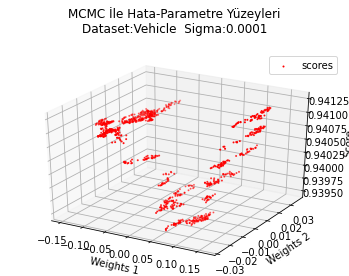

initial score:		0.9408901333808899 
 max score:		0.9412378072738647 
 acceptance ratio:		100.0 




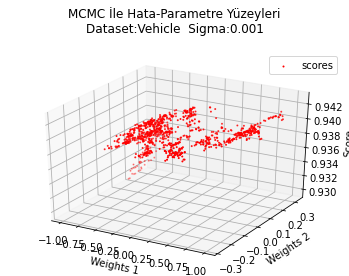

initial score:		0.9408901333808899 
 max score:		0.9426286220550537 
 acceptance ratio:		99.9 




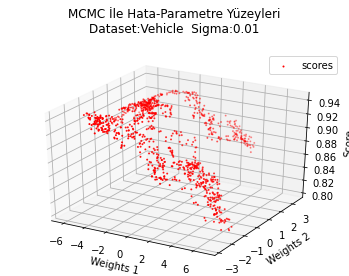

initial score:		0.9408901333808899 
 max score:		0.9412378072738647 
 acceptance ratio:		97.7 




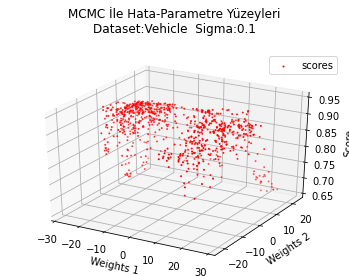

initial score:		0.9408901333808899 
 max score:		0.943324089050293 
 acceptance ratio:		78.6 




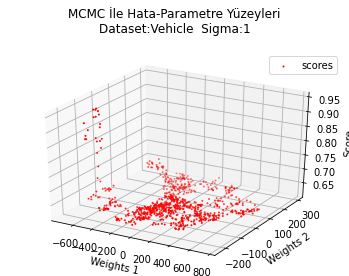

initial score:		0.9408901333808899 
 max score:		0.9415855407714844 
 acceptance ratio:		88.1 




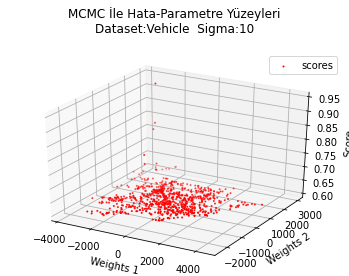

initial score:		0.9408901333808899 
 max score:		0.9408901333808899 
 acceptance ratio:		78.2 




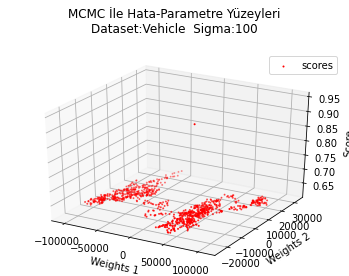

initial score:		0.9408901333808899 
 max score:		0.9408901333808899 
 acceptance ratio:		91.7 




In [30]:
plotAllScores("Vehicle", sigmas, new_weights_list, new_scores_list, max_weigths_list, max_score_list, acceptance_ratios)

In [31]:
## ************************************************************************************************************* ##

In [32]:
path = './36uci/splice.arff'

X_train, X_test, y_train, y_test, input_shape, output_shape = loadDataSet(path)
model = createModel(X_train, y_train, input_shape, output_shape, 20)
model.summary()

dataset size: (3190, 288)
Model: "sequential_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_6 (Dense)              (None, 64)                18432     
_________________________________________________________________
dense_7 (Dense)              (None, 3)                 195       
Total params: 18,627
Trainable params: 18,627
Non-trainable params: 0
_________________________________________________________________


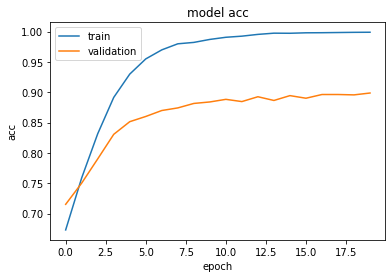

In [33]:
plotAccuracy(model)

In [34]:
initial_weights = model.get_weights() # weights of last epoch

In [35]:
new_weights_list, new_scores_list, max_weigths_list, max_score_list, acceptance_ratios = metropolisDiffrentSigmas(model, sigmas, n_iter, initial_weights)

2711/2711 [==============================] - 0s 18us/sample - loss: 0.1159 - acc: 0.9795
[-7.953857799259382e-06, -4.4006070360352464e-05]
[5.8760302946446486e-05, 0.00016770449221672172]
2711/2711 [==============================] - 0s 16us/sample - loss: 0.1159 - acc: 0.9795
[9.636158738809531e-05, -0.00012525927267119873]
[3.29258707305682e-05, 2.627319312004143e-05]
2711/2711 [==============================] - 0s 19us/sample - loss: 0.1159 - acc: 0.9795
[-4.905464587085573e-05, -7.319066669232e-05]
[9.438828072822903e-05, 9.63549717051233e-05]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.1159 - acc: 0.9795
[-0.00010710751002730674, -0.0001616174735629463]
[-0.00010204343861055974, -7.223188460654663e-06]
2711/2711 [==============================] - 0s 20us/sample - loss: 0.1159 - acc: 0.9795
[-8.455354380677826e-05, -7.433343302311573e-06]
[-0.00011389089127015773, -1.5154185396950973e-05]
2711/2711 [==============================] - 0s 18us/sample - loss: 0

2711/2711 [==============================] - 0s 19us/sample - loss: 0.1159 - acc: 0.9793
[-0.0001648617013838059, -0.0001332803908810456]
[-0.00011076437526873387, -9.099796757290013e-05]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.1159 - acc: 0.9795
[5.5518604380191916e-05, -4.738156356231153e-05]
[0.0001273933423382354, 0.00012800195999934267]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.1159 - acc: 0.9795
[-0.00021631645436308796, -7.868204320316623e-05]
[-9.901421291335152e-05, -5.1467369662764775e-05]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.1159 - acc: 0.9795
[-1.699230385241617e-05, -0.00014250054961274602]
[9.318572748909189e-05, 2.7571589927003817e-05]
2711/2711 [==============================] - 0s 16us/sample - loss: 0.1159 - acc: 0.9795
[0.00013150172791854444, 9.258827713332332e-05]
[-0.0001356532910967246, -6.844980420045301e-05]
2711/2711 [==============================] - 0s 16us/sample - lo

2711/2711 [==============================] - 0s 17us/sample - loss: 0.1159 - acc: 0.9796
[-3.164411637062599e-05, 6.738914918538146e-05]
[-1.204644016469156e-05, -7.28779846925799e-05]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.1159 - acc: 0.9796
[-0.00010785999890591823, 0.0001920157905615267]
[-0.00023048944216618172, -8.731164420071079e-05]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.1159 - acc: 0.9796
[-0.00011983189571920521, 2.06113031141344e-05]
[-9.592890520928467e-05, 0.00017089880009691171]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.1159 - acc: 0.9796
[-0.00010726398976026227, -0.00010886052851436576]
[-8.840863687177362e-06, 1.1806519039486406e-05]
2711/2711 [==============================] - 0s 16us/sample - loss: 0.1159 - acc: 0.9796
[-7.2558683754380994e-06, 5.812611909185815e-05]
[9.828317800194562e-05, 2.4267249166028264e-05]
2711/2711 [==============================] - 0s 18us/sample - loss

2711/2711 [==============================] - 0s 17us/sample - loss: 0.1159 - acc: 0.9796
[-0.00019813129208065425, -1.5709581766810285e-05]
[2.7368290265947904e-05, 4.756206430825084e-05]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.1159 - acc: 0.9796
[7.057198959417246e-05, 4.8648456676945845e-05]
[7.007482971331256e-05, 9.945262572851308e-05]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.1159 - acc: 0.9796
[-9.705514814840995e-05, 0.00012135186691821585]
[-3.6209393103669236e-08, 6.347994489418174e-06]
2711/2711 [==============================] - 0s 21us/sample - loss: 0.1159 - acc: 0.9796
[-7.69438247509222e-05, -0.0001325053585361969]
[-4.953264198126735e-05, -6.537673579113466e-05]
2711/2711 [==============================] - 0s 19us/sample - loss: 0.1159 - acc: 0.9796
[9.397678725367772e-06, -0.00020636951015111997]
[-4.230400413779479e-07, -0.00015474780039632534]
2711/2711 [==============================] - 0s 16us/sample - loss:

[-2.0775578723464807e-05, -6.574617050765676e-05]
2711/2711 [==============================] - 0s 20us/sample - loss: 0.1159 - acc: 0.9796
[7.225329388153734e-05, -4.9570105766974126e-05]
[0.00010969156717765927, 0.00015878527372115354]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.1159 - acc: 0.9796
[-4.317594732000213e-05, 1.789783421767387e-05]
[-0.00013736883088989784, 0.00011145873004403043]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.1159 - acc: 0.9796
[7.265448536704876e-05, -5.627658870290119e-05]
[-0.00017997791894938368, -2.8284434895265327e-05]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.1159 - acc: 0.9796
[-4.56245978272841e-05, -4.6682654942473706e-05]
[9.457859768791629e-05, 4.364166571855681e-06]
2711/2711 [==============================] - 0s 16us/sample - loss: 0.1159 - acc: 0.9796
[-3.945043979533182e-05, 0.00013949153020918805]
[0.00012000907910464781, 8.04852385384674e-05]
2711/2711 [=======

2711/2711 [==============================] - 0s 18us/sample - loss: 0.1159 - acc: 0.9796
[2.444755851568816e-05, 0.00013052249792262663]
[-0.00013447533664606704, 0.00017484710482187403]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.1159 - acc: 0.9796
[3.830360821980853e-05, -0.00014403974704368095]
[-7.486545364619409e-06, -0.00017286672622535124]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.1159 - acc: 0.9796
[-0.00016812862233213092, -9.209555995104029e-05]
[-5.1017094076412184e-05, -5.911729894492474e-05]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.1159 - acc: 0.9796
[8.96664909378963e-05, 0.00012177815989675672]
[-9.889634550874261e-05, -9.227971539554638e-05]
2711/2711 [==============================] - 0s 20us/sample - loss: 0.1159 - acc: 0.9796
[-2.806285072868472e-05, 9.038038264007708e-06]
[5.469008532943395e-05, -9.987033802640529e-05]
2711/2711 [==============================] - 0s 18us/sample - loss

2711/2711 [==============================] - 0s 17us/sample - loss: 0.1159 - acc: 0.9796
[0.0001407147007143053, -3.3189986862818986e-05]
[6.784146447241381e-06, 5.802482210492505e-05]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.1159 - acc: 0.9796
[0.00015241236926771194, -0.00011029651373071423]
[6.780192096235568e-05, 0.00011244004457431394]
2711/2711 [==============================] - 0s 15us/sample - loss: 0.1159 - acc: 0.9796
[-1.770738699845874e-07, -0.00011783446405260825]
[8.156519855122515e-05, -0.00016125674521507436]
2711/2711 [==============================] - 0s 16us/sample - loss: 0.1159 - acc: 0.9796
[5.469248451315856e-05, 0.000103172576158316]
[-0.00010729722512269915, -6.906604674413651e-05]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.1159 - acc: 0.9796
[-0.00017010709885055108, -1.711144237245623e-05]
[-4.956381770939937e-05, 0.00019444686269896375]
2711/2711 [==============================] - 0s 17us/sample - loss:

2711/2711 [==============================] - 0s 17us/sample - loss: 0.1159 - acc: 0.9796
[0.00010500642678445405, 4.044559869118347e-05]
[-7.708922559823557e-08, 0.00010050421119473061]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.1159 - acc: 0.9796
[-4.64608924207487e-05, 0.00011561337077419437]
[-8.400461401797257e-05, -5.211270548864019e-05]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.1159 - acc: 0.9796
[2.6363546802296253e-05, -0.00014711082748858521]
[8.037195024259652e-05, -1.0202000056473916e-05]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.1159 - acc: 0.9796
[6.0243002539000584e-05, 5.6857933943483214e-05]
[-2.5305035934888256e-06, -0.00016167346707417638]
2711/2711 [==============================] - 0s 20us/sample - loss: 0.1159 - acc: 0.9796
[-3.6863251205936785e-05, 0.00012526356826491984]
[6.879474085394306e-05, 3.853806370315376e-05]
2711/2711 [==============================] - 0s 20us/sample - los

2711/2711 [==============================] - 0s 17us/sample - loss: 0.1159 - acc: 0.9796
[5.80021867789531e-06, -0.0001435488210769595]
[3.47711968281253e-05, 9.55573770561705e-05]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.1159 - acc: 0.9796
[0.00011180114865647031, 6.262258078301394e-05]
[-2.2882357143439126e-05, -0.00012856160187355966]
2711/2711 [==============================] - 0s 20us/sample - loss: 0.1159 - acc: 0.9796
[-4.0984040910605354e-05, -5.555476499457731e-05]
[-1.8603464535321913e-05, 0.00011864636638227238]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.1159 - acc: 0.9796
[-5.426571959577786e-06, 0.00010821633241647851]
[0.00016847854467487216, -5.1182386972007144e-05]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.1159 - acc: 0.9796
[-8.113130516902153e-05, -3.147268688915143e-05]
[1.439039052310675e-05, -8.183570431543265e-05]
2711/2711 [==============================] - 0s 18us/sample - loss: 

2711/2711 [==============================] - 0s 16us/sample - loss: 0.1159 - acc: 0.9796
[-0.0001364144617623352, -0.00021378691921581698]
[3.617061682828122e-05, -4.534209531526356e-06]
2711/2711 [==============================] - 0s 22us/sample - loss: 0.1159 - acc: 0.9796
[0.0003125643494762691, 1.6583132763582256e-05]
[7.080135242839791e-05, -0.00020450825944932035]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.1159 - acc: 0.9796
[-3.3890938366338675e-05, -3.8355305441714714e-05]
[3.2871312441329764e-05, -3.402627809974841e-05]
2711/2711 [==============================] - 0s 16us/sample - loss: 0.1159 - acc: 0.9796
[-0.00015533863306097718, -0.00013164088343182488]
[5.405913667810592e-05, -0.00012391149851147587]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.1159 - acc: 0.9796
[-5.968784067573575e-05, 5.546897766425263e-05]
[-6.523011440170214e-05, -8.928458898549949e-05]
2711/2711 [==============================] - 0s 19us/sample - l

2711/2711 [==============================] - 0s 16us/sample - loss: 0.1159 - acc: 0.9796
[3.379132521139416e-06, -0.0001296541988146085]
[0.00012339864259546093, -0.00016262136212981035]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.1159 - acc: 0.9796
[-0.00012651590108609878, 1.8819379398980254e-05]
[-2.760325387295215e-05, -0.00013744083286005584]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.1159 - acc: 0.9796
[-5.722052165449341e-05, -0.000131357955826255]
[1.7521551438836543e-05, 1.125057287418647e-05]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.1159 - acc: 0.9796
[6.873524045177207e-05, -5.8848612094901135e-05]
[-0.00010304445026842863, 9.721422845641367e-06]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.1159 - acc: 0.9796
[-3.989759624366063e-05, -0.00013409991110759444]
[0.00015262644792098928, -9.326667964810274e-05]
2711/2711 [==============================] - 0s 23us/sample - lo

2711/2711 [==============================] - 0s 18us/sample - loss: 0.1159 - acc: 0.9796
[-0.00013770150362089426, -1.1401527261800804e-05]
[-5.934268895069838e-05, 3.478081198412076e-06]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.1159 - acc: 0.9795
[3.676058143098698e-05, 0.00015549742314350533]
[-0.00020955977547851696, -6.909145487852696e-05]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.1159 - acc: 0.9796
[4.794757048451395e-05, -3.152221404065577e-05]
[7.837477071581802e-05, 0.00011619868131738864]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.1159 - acc: 0.9796
[-0.00018937404712471442, 2.8905500782451943e-05]
[6.213224546815698e-05, 4.6869777844248574e-05]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.1159 - acc: 0.9795
[-0.00011972159112913433, -0.00011063348884986137]
[-6.379630884818708e-05, 8.455809473921276e-05]
2711/2711 [==============================] - 0s 18us/sample - los

2711/2711 [==============================] - 0s 19us/sample - loss: 0.1159 - acc: 0.9796
[-5.521565564385872e-06, -3.5231117882914356e-05]
[-1.5231927124040368e-05, 1.7425052676715457e-05]
2711/2711 [==============================] - 0s 20us/sample - loss: 0.1159 - acc: 0.9796
[-3.775201426764592e-05, -3.958588279001517e-05]
[-3.584678777075509e-05, -0.00013607388059901546]
2711/2711 [==============================] - 0s 19us/sample - loss: 0.1159 - acc: 0.9796
[9.100798487921027e-05, -0.00013353424146694592]
[-0.00021103457849628102, 6.740656156048454e-05]
2711/2711 [==============================] - 0s 16us/sample - loss: 0.1159 - acc: 0.9796
[-0.00015370169402671496, -5.40964171243947e-05]
[1.567045066109587e-05, -0.00012784697398255675]
2711/2711 [==============================] - 0s 16us/sample - loss: 0.1159 - acc: 0.9796
[-0.00011626171952548668, 5.588179355560501e-05]
[-5.542331136758453e-05, -7.082252084864727e-05]
2711/2711 [==============================] - 0s 18us/sample - 

2711/2711 [==============================] - 0s 18us/sample - loss: 0.1159 - acc: 0.9796
[7.99338144466909e-05, -8.563083093491876e-05]
[-5.880463781862926e-05, -9.92182336576847e-05]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.1159 - acc: 0.9796
[-0.00024673386554647765, 7.030798477130201e-05]
[-0.00015671876474041314, -4.660351889844478e-05]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.1159 - acc: 0.9796
[-0.00014544766923281063, -0.0001899582261666222]
[1.633708473593977e-05, 4.6394474354663e-06]
2711/2711 [==============================] - 0s 16us/sample - loss: 0.1159 - acc: 0.9796
[0.00015123069856826435, -0.00010303834038638753]
[6.376813116432951e-05, 7.855366366913655e-05]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.1159 - acc: 0.9796
[-0.0001345378516291772, -0.00020462083202771444]
[4.2725979801186225e-05, 0.00017568433923532105]
2711/2711 [==============================] - 0s 16us/sample - loss: 0.

2711/2711 [==============================] - 0s 19us/sample - loss: 0.1159 - acc: 0.9793
[2.0885257444648635e-05, -7.313993915564161e-05]
[-0.00029520039643677015, -7.730080039407106e-05]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.1159 - acc: 0.9793
[-6.503889782173766e-05, -0.00010311291382273777]
[8.969263019045628e-05, -6.018818148632239e-06]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.1159 - acc: 0.9793
[2.120029968856736e-05, -5.498777571110102e-05]
[-2.7199109566764636e-05, -4.8990622560804975e-05]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.1159 - acc: 0.9793
[0.00010832620092635438, -4.222481861673209e-05]
[-4.428198426024986e-05, 1.9822325830140044e-05]
2711/2711 [==============================] - 0s 16us/sample - loss: 0.1159 - acc: 0.9793
[2.4512324555163437e-05, -0.0001646720493412251]
[3.947140360492647e-05, 0.00013690146257798214]
2711/2711 [==============================] - 0s 17us/sample - lo

2711/2711 [==============================] - 0s 17us/sample - loss: 0.1159 - acc: 0.9796
[6.371942387127177e-05, -4.02956885778203e-05]
[9.029284743523019e-05, 0.00027288513673090964]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.1159 - acc: 0.9796
[-0.00017267730271448934, 4.6024688639318467e-05]
[-0.0001024094230387886, -2.0961490600902878e-05]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.1159 - acc: 0.9795
[-3.17520820508369e-05, -6.377968412718199e-05]
[-6.895354672838141e-05, -4.906122163312977e-07]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.1159 - acc: 0.9795
[0.00010965954300092743, 3.7112871703970515e-05]
[-7.435294603906009e-05, -2.878195309892903e-05]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.1159 - acc: 0.9796
[-0.0001148557451128988, -7.892601355894333e-05]
[0.00010780857816938044, 4.1849582438905427e-05]
2711/2711 [==============================] - 0s 18us/sample - loss:

2711/2711 [==============================] - 0s 17us/sample - loss: 0.1159 - acc: 0.9793
[5.7722529201200314e-06, -4.264540068467609e-05]
[-6.953403250380126e-05, -6.542846347276707e-06]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.1159 - acc: 0.9793
[4.395381484862494e-05, 5.3117636411614535e-05]
[0.00011613704759869135, 0.00020389662135900674]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.1159 - acc: 0.9793
[7.551994364346337e-05, 4.313556518771862e-05]
[-5.065579353451562e-05, -9.877006610591488e-05]
2711/2711 [==============================] - 0s 19us/sample - loss: 0.1159 - acc: 0.9793
[-0.000142355686749294, 8.178431027696962e-05]
[0.00013316381538743698, -0.000109033527055271]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.1159 - acc: 0.9793
[-4.1672372708601175e-06, -2.8985424504710885e-05]
[0.00017509930836059968, -1.548512017010968e-05]
2711/2711 [==============================] - 0s 20us/sample - loss: 0

2711/2711 [==============================] - 0s 17us/sample - loss: 0.1159 - acc: 0.9790
[6.024730907021e-05, 5.517066625152021e-05]
[-6.143354969990725e-05, -5.589539020397061e-05]
2711/2711 [==============================] - 0s 16us/sample - loss: 0.1159 - acc: 0.9790
[0.00017944179766643547, -3.0330070342786998e-05]
[0.00012492062803478674, -9.699706873381918e-05]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.1159 - acc: 0.9790
[1.556794193585241e-06, 5.8803798639762495e-06]
[6.532350890593861e-05, 0.00011125891060747362]
2711/2711 [==============================] - 0s 16us/sample - loss: 0.1159 - acc: 0.9790
[0.0001517429069629728, -2.459759727030103e-05]
[3.2843365332595776e-05, -8.213089995790857e-05]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.1159 - acc: 0.9790
[-0.00015807668292836132, 3.0956326646099566e-05]
[7.265213016791335e-05, -3.1340736626187587e-05]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.1

2711/2711 [==============================] - 0s 16us/sample - loss: 0.1159 - acc: 0.9792
[0.0002737648663129919, 9.862796198672124e-05]
[9.209388457677614e-05, 1.4700651033562716e-05]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.1159 - acc: 0.9793
[0.00013358733848983914, -8.455597233292333e-06]
[-8.493730708754181e-05, -0.0001954430755569098]
2711/2711 [==============================] - 0s 19us/sample - loss: 0.1159 - acc: 0.9795
[-2.432446670499568e-05, 7.13298217778222e-06]
[1.6851788226502598e-05, -1.9635847502443923e-05]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.1159 - acc: 0.9795
[-1.8351366589348407e-05, 2.6362933272488234e-05]
[-0.00015082298184341023, -9.508679553194902e-05]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.1159 - acc: 0.9795
[-0.00011586144413914486, -0.00016501901551824468]
[2.3793018142359093e-05, -6.440497987227424e-05]
2711/2711 [==============================] - 0s 16us/sample - los

2711/2711 [==============================] - 0s 16us/sample - loss: 0.1159 - acc: 0.9796
[-5.059095628788472e-06, -0.00010369025701109751]
[0.00010824134743939775, -2.4261305303556786e-05]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.1159 - acc: 0.9796
[-3.089461260300436e-05, 1.2309372880042712e-05]
[9.283347771659694e-05, 4.738170184977978e-05]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.1159 - acc: 0.9796
[-1.2471581588944177e-05, -4.438010744328849e-05]
[-0.0001237867697902767, -2.896074253047904e-05]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.1159 - acc: 0.9796
[0.00014280972328549037, -2.260525538880648e-06]
[8.584009043514954e-05, -2.2752144992732312e-06]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.1159 - acc: 0.9796
[-4.1622492284685424e-05, 3.534981544491276e-05]
[-2.7265180679044345e-05, 0.00011888879772569297]
2711/2711 [==============================] - 0s 18us/sample - l

2711/2711 [==============================] - 0s 17us/sample - loss: 0.1159 - acc: 0.9796
[1.5333387112128415e-05, 1.320341231035995e-05]
[0.00012286825079826835, 0.0001822902089928524]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.1159 - acc: 0.9796
[3.50698759265175e-05, 2.7573936014020217e-05]
[6.257162524859968e-06, 4.0141796462110315e-05]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.1159 - acc: 0.9796
[6.362330142395624e-07, -5.4835230306871473e-05]
[1.783956281169493e-05, 0.00012691114352197385]
2711/2711 [==============================] - 0s 20us/sample - loss: 0.1159 - acc: 0.9796
[0.00017841792995806332, -0.00011984885583127015]
[-0.00013107728151344573, -0.000109353699127034]
2711/2711 [==============================] - 0s 19us/sample - loss: 0.1159 - acc: 0.9796
[6.968900636384812e-05, 0.00014974640104174934]
[-0.00016722214428884887, 0.00022687146530745215]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.

2711/2711 [==============================] - 0s 17us/sample - loss: 0.1159 - acc: 0.9796
[5.3635579656353574e-05, 3.483285905546626e-05]
[-0.00015723613151236428, -8.528149803947263e-05]
2711/2711 [==============================] - 0s 16us/sample - loss: 0.1159 - acc: 0.9796
[-0.00010581673839638359, -1.2731891455180838e-05]
[0.0001226623815808798, 3.9021488414333227e-05]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.1159 - acc: 0.9796
[-3.911714675062445e-05, -9.855389605796607e-05]
[0.00014779295067080244, -5.813901699519101e-05]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.1159 - acc: 0.9796
[6.735141389972595e-05, 8.73232708233022e-05]
[0.00011051568138038797, 7.023026193417995e-05]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.1159 - acc: 0.9796
[4.3080034733366886e-05, 0.00020035467949632615]
[-1.9164682019129027e-05, -0.00012795873200202544]
2711/2711 [==============================] - 0s 17us/sample - loss

2711/2711 [==============================] - 0s 18us/sample - loss: 0.1159 - acc: 0.9796
[5.989837984386536e-05, -5.27175143742216e-05]
[-0.00024351681719021376, -4.9965627262578745e-05]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.1159 - acc: 0.9796
[-1.3688917682077492e-05, 0.00010040035295871141]
[4.44503109396067e-06, -9.813390336897185e-05]
2711/2711 [==============================] - 0s 19us/sample - loss: 0.1159 - acc: 0.9796
[6.595180478577118e-05, 0.0001674448265317614]
[-1.7084248715016546e-05, 8.662093975902564e-05]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.1159 - acc: 0.9796
[-1.7573713994073814e-05, -4.764945181850563e-05]
[-0.00028161778819384695, -0.0001559837753118097]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.1159 - acc: 0.9796
[-0.00013786197340336163, -3.0217044765980435e-05]
[-1.275114910849656e-05, 6.161620149315258e-05]
2711/2711 [==============================] - 0s 18us/sample - los

2711/2711 [==============================] - 0s 16us/sample - loss: 0.1159 - acc: 0.9796
[-0.00011070238599985193, 8.809056388340326e-05]
[0.00025406493666256335, 5.720830378396285e-05]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.1159 - acc: 0.9796
[-0.00013697367089743768, 1.4362792054444907e-05]
[9.135903199402987e-05, -1.3669007028271019e-05]
2711/2711 [==============================] - 0s 19us/sample - loss: 0.1159 - acc: 0.9796
[0.00021061585115416992, 0.00012322443056943805]
[-0.00013732233029137826, -2.682712386537447e-05]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.1159 - acc: 0.9796
[-8.361335552116512e-06, -2.193335818578524e-05]
[-1.118255372379294e-05, 5.8485441719559076e-05]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.1159 - acc: 0.9796
[-3.920787899540147e-05, 0.00010009105029766794]
[-0.0001256864410079963, 0.0001615303282837037]
2711/2711 [==============================] - 0s 16us/sample - los

2711/2711 [==============================] - 0s 19us/sample - loss: 0.1159 - acc: 0.9796
[-0.0002417880406081814, 6.9335850648692735e-06]
[8.513063202999007e-06, 0.0001692481235668547]
2711/2711 [==============================] - 0s 19us/sample - loss: 0.1159 - acc: 0.9796
[-0.0001373843599773359, 8.085153224470133e-06]
[3.9907457226122445e-05, 4.346916704790145e-05]
2711/2711 [==============================] - 0s 19us/sample - loss: 0.1159 - acc: 0.9796
[5.097674365471246e-05, 8.188314269565244e-05]
[-2.300957400674714e-06, 7.243802171967213e-07]
2711/2711 [==============================] - 0s 16us/sample - loss: 0.1159 - acc: 0.9796
[3.1021145868463894e-05, -3.4513275461414368e-06]
[9.561974934611522e-05, -4.633748659284404e-06]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.1159 - acc: 0.9796
[-0.00011262283367374105, 7.527475844401683e-05]
[0.00016599974556899834, 0.0002528573167937096]
2711/2711 [==============================] - 0s 19us/sample - loss: 0.115

2711/2711 [==============================] - 0s 18us/sample - loss: 0.1159 - acc: 0.9796
[-3.600640947753579e-05, 9.898278690306572e-05]
[5.159881958195219e-07, -8.956079266297747e-05]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.1159 - acc: 0.9796
[-0.00012931565349980436, 7.913292343143032e-05]
[0.0001315648877686858, 0.00018161129865663656]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.1159 - acc: 0.9796
[-0.00020210950115163748, -0.00019116978050159116]
[5.2323187138654095e-05, -0.00015412531510221924]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.1159 - acc: 0.9796
[-1.6360661918616678e-05, -5.432991665110097e-06]
[-4.359670014286426e-05, -0.0001486627754720815]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.1159 - acc: 0.9796
[-0.0001240331915002448, -0.00014231799053449643]
[2.533085059117459e-05, 4.321876408082956e-05]
2711/2711 [==============================] - 0s 17us/sample - los

2711/2711 [==============================] - 0s 16us/sample - loss: 0.1159 - acc: 0.9796
[-6.915188226047693e-05, -6.101770979476317e-05]
[9.578052529040954e-06, 4.070739575355574e-05]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.1159 - acc: 0.9796
[1.0354743218689945e-05, -4.090442923588573e-05]
[-7.1368134892195595e-06, 1.4618067680300793e-05]
2711/2711 [==============================] - 0s 19us/sample - loss: 0.1159 - acc: 0.9796
[8.449179203432264e-05, 6.354372944690049e-05]
[7.501607900166426e-05, 6.580166182360078e-05]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.1159 - acc: 0.9796
[-0.00013147725638704627, 3.740309903819121e-05]
[-4.430737779733332e-05, -3.505164727987672e-05]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.1159 - acc: 0.9796
[0.00018293709144863763, 0.0002356711485706578]
[3.022992729575129e-05, -2.8859919273873165e-05]
2711/2711 [==============================] - 0s 16us/sample - loss: 0.1

2711/2711 [==============================] - 0s 17us/sample - loss: 0.1159 - acc: 0.9795
[6.609479736298759e-05, 0.00011890079146866786]
[-9.776312169050271e-06, 0.00015686423465513584]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.1159 - acc: 0.9795
[0.00012935152977361779, 4.994345290404597e-05]
[-0.0001558036294214328, 0.00021285282388765447]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.1159 - acc: 0.9796
[-5.064289330672842e-05, -0.00021163471457131682]
[-3.8080569846060185e-05, 0.00018904566509044348]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.1159 - acc: 0.9795
[4.093673590566369e-06, -7.007352928674954e-06]
[-5.065854080701441e-05, 5.4061078444609135e-05]
2711/2711 [==============================] - 0s 20us/sample - loss: 0.1159 - acc: 0.9795
[-2.0126646308754863e-05, -0.00015336174883470767]
[-2.5401418475459515e-05, -0.00014051277301644602]
2711/2711 [==============================] - 0s 17us/sample - 

2711/2711 [==============================] - 0s 16us/sample - loss: 0.1159 - acc: 0.9796
[0.00012634158271089777, 1.4070463961984467e-05]
[-7.622795389055875e-05, 0.00010223000421852406]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.1159 - acc: 0.9796
[-1.474125164999127e-05, -2.5523134799643117e-05]
[-6.559152430380155e-05, -0.00013292014797761244]
2711/2711 [==============================] - 0s 19us/sample - loss: 0.1159 - acc: 0.9796
[7.24618460730046e-06, -8.910484195397033e-05]
[8.83930580031522e-05, -0.00013784601949320887]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.1159 - acc: 0.9796
[-5.035204122610658e-05, -1.7457146338317304e-05]
[-1.7289847448083164e-05, 4.301305438634686e-06]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.1159 - acc: 0.9796
[8.549435392812951e-05, -9.345229335166464e-05]
[-0.00012705935554960398, 9.855665940666424e-05]
2711/2711 [==============================] - 0s 19us/sample - loss

2711/2711 [==============================] - 0s 19us/sample - loss: 0.1159 - acc: 0.9796
[-0.00012675503847557498, -3.124579292699976e-05]
[8.471205596443357e-05, -0.00010228463508995044]
2711/2711 [==============================] - 0s 20us/sample - loss: 0.1159 - acc: 0.9796
[2.3187676030802014e-05, -1.564293441101462e-05]
[-0.0001803018248370203, 8.565401098793316e-05]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.1159 - acc: 0.9796
[6.124708851014961e-05, 8.182864951533892e-05]
[-0.00017375943620217795, 2.005082067103004e-05]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.1159 - acc: 0.9796
[1.830433615597235e-05, 0.00010148223352085459]
[1.2298126766242595e-05, -1.748296455891932e-05]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.1159 - acc: 0.9796
[-3.366351985857518e-05, -1.1856591613536365e-05]
[-9.367899950946369e-05, 1.0851711994578267e-05]
2711/2711 [==============================] - 0s 17us/sample - loss:

2711/2711 [==============================] - 0s 16us/sample - loss: 0.1159 - acc: 0.9796
[-3.2824621836838216e-05, 4.70440236786786e-06]
[7.842922783531468e-05, -8.191012698772861e-05]
2711/2711 [==============================] - 0s 16us/sample - loss: 0.1159 - acc: 0.9796
[0.00012844672242440366, -1.1665049273274116e-05]
[4.944936054401323e-05, -3.572583910799771e-05]
2711/2711 [==============================] - 0s 19us/sample - loss: 0.1159 - acc: 0.9796
[-4.892862181740778e-05, -1.042977701402035e-05]
[8.521809763890378e-05, -1.2491648893966976e-05]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.1159 - acc: 0.9796
[-5.1821351977670796e-05, -4.5644097562727305e-05]
[8.763557852362656e-05, 3.515201985237343e-05]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.1159 - acc: 0.9796
[2.6523389868235304e-05, -7.230375692488454e-05]
[0.00012226786376801885, -5.235594449922777e-05]
2711/2711 [==============================] - 0s 20us/sample - loss:

2711/2711 [==============================] - 0s 16us/sample - loss: 0.1159 - acc: 0.9796
[-0.00010724693641638832, 9.965184792997704e-05]
[1.1024297093937557e-05, -6.822298374798372e-06]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.1159 - acc: 0.9796
[-4.332428984732872e-05, 5.503761420932269e-05]
[1.9591911672167767e-05, 0.00013459149440922462]
2711/2711 [==============================] - 0s 19us/sample - loss: 0.1159 - acc: 0.9796
[8.301779209303898e-06, -0.0001772801505914941]
[-0.0001183642707099232, 1.1975613317662244e-05]
2711/2711 [==============================] - 0s 21us/sample - loss: 0.1159 - acc: 0.9796
[-4.991063608133879e-05, 0.00012653754560501462]
[0.00012555241113044156, -1.6191649737398634e-05]
2711/2711 [==============================] - 0s 22us/sample - loss: 0.1159 - acc: 0.9796
[0.0002456555424020673, 5.2128540905828726e-05]
[-0.00013803258573387282, -5.9207894231704165e-05]
2711/2711 [==============================] - 0s 17us/sample - los

2711/2711 [==============================] - 0s 17us/sample - loss: 0.1159 - acc: 0.9796
[-6.895485717002795e-05, 1.8298453712523902e-06]
[-0.00011659275046639164, 3.0350707119917754e-05]
2711/2711 [==============================] - 0s 22us/sample - loss: 0.1159 - acc: 0.9796
[-0.00022041475332576228, 2.2562134025103107e-05]
[5.81801476696916e-05, -0.00014291916885120126]
2711/2711 [==============================] - 0s 25us/sample - loss: 0.1159 - acc: 0.9795
[5.70868981026352e-05, 9.544056202539977e-05]
[-2.4160641532059335e-06, 6.746074682181359e-05]
2711/2711 [==============================] - 0s 20us/sample - loss: 0.1159 - acc: 0.9796
[3.0267267201301382e-05, 6.59380186587692e-07]
[-3.7459753759261396e-05, 9.313566571305255e-06]
2711/2711 [==============================] - 0s 25us/sample - loss: 0.1159 - acc: 0.9796
[-9.116467406149034e-05, -0.00027968498721295915]
[2.931486208951226e-05, 7.405937877755814e-05]
2711/2711 [==============================] - 0s 30us/sample - loss: 0.

2711/2711 [==============================] - 0s 18us/sample - loss: 0.1159 - acc: 0.9793
[2.9649177760390595e-05, 4.5510444303574424e-05]
[-1.991771490770484e-05, 1.849448410829309e-05]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.1159 - acc: 0.9793
[-0.00012828244517636164, 3.705559238891017e-05]
[0.00010512373659086441, -0.00017277746035590334]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.1159 - acc: 0.9793
[-8.765847741573091e-05, -2.5110913652800784e-05]
[0.00010749642417596035, 3.3299159925879256e-05]
2711/2711 [==============================] - 0s 20us/sample - loss: 0.1159 - acc: 0.9793
[8.542305779392177e-05, 4.582055653187913e-05]
[-4.299624320434139e-05, 6.789573259697241e-05]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.1159 - acc: 0.9793
[0.00016369233033575918, -6.879910412883468e-05]
[-5.930593168137144e-05, 0.00010847051597333542]
2711/2711 [==============================] - 0s 23us/sample - loss:

2711/2711 [==============================] - 0s 18us/sample - loss: 0.1159 - acc: 0.9789
[-0.00016036711961414738, -7.73232913058614e-05]
[0.00025904144621978194, 0.0002976067552429732]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.1159 - acc: 0.9789
[-9.515365956186496e-05, 0.001328302237459777]
[0.0008506926982321258, -0.0016431730504527613]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.1159 - acc: 0.9789
[-0.0012504744301348209, -0.0003407350827668585]
[0.0011858823121880986, -0.0003262216965935269]
2711/2711 [==============================] - 0s 20us/sample - loss: 0.1160 - acc: 0.9786
[0.0015358237993390422, 2.6573087904937088e-05]
[0.00010160371005195163, -0.0006310755532529636]
2711/2711 [==============================] - 0s 19us/sample - loss: 0.1159 - acc: 0.9789
[-0.0012796170785264373, -0.0006097050182651835]
[0.00035549225195315745, 0.0006713296006135308]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.11

2711/2711 [==============================] - 0s 17us/sample - loss: 0.1159 - acc: 0.9796
[-0.00010340710307588021, -0.001081636224342201]
[-0.0008167008090436119, 0.0008119217929642654]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.1159 - acc: 0.9796
[-0.0012195226598773964, 0.0007237912800331184]
[-0.00022499772086617025, 0.00026709368359585135]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.1159 - acc: 0.9796
[-0.00037234189220827416, 0.0007070938325557922]
[0.000753891931200632, 0.0018737539084629946]
2711/2711 [==============================] - 0s 16us/sample - loss: 0.1159 - acc: 0.9795
[-0.0010241931785936033, 0.002377176563309158]
[-0.0005670355409827124, -0.0011223100808006024]
2711/2711 [==============================] - 0s 16us/sample - loss: 0.1159 - acc: 0.9790
[0.00040105786845766013, 0.00010165209477353377]
[0.0010823033115772128, -7.767667341293122e-05]
2711/2711 [==============================] - 0s 21us/sample - loss: 0.11

2711/2711 [==============================] - 0s 18us/sample - loss: 0.1160 - acc: 0.9803
[0.0003809817340100109, -0.0006344942748349814]
[0.0005523435926121099, 0.0006114163459489272]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.1160 - acc: 0.9803
[-0.0010884689801879132, -0.0007558988149573907]
[0.0003248881851708516, 4.849763282152563e-05]
2711/2711 [==============================] - 0s 21us/sample - loss: 0.1160 - acc: 0.9801
[0.0008735119494905288, 0.00048788530044891555]
[0.0002463921220445836, 0.0006201048361977811]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.1160 - acc: 0.9803
[5.8950367270873636e-05, -0.0005098522837801905]
[-0.0007743847981958152, -0.0013613465032322743]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.1160 - acc: 0.9803
[0.0009177703611063151, 0.002161489671826929]
[-0.0018519632161050142, -9.662960194630815e-05]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.1161 -

2711/2711 [==============================] - 0s 19us/sample - loss: 0.1167 - acc: 0.9793
[-0.0008027111386011393, 0.0006298297372498164]
[-0.0013828725785409244, 0.0006783057282024613]
2711/2711 [==============================] - 0s 22us/sample - loss: 0.1166 - acc: 0.9793
[0.00022487034929166876, 0.0010550550383370068]
[-0.0012851719342987127, 5.9460630628541334e-05]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.1166 - acc: 0.9793
[0.00015239878916451093, 0.0009534158972623641]
[0.0012016533737903051, -0.00043422537259174435]
2711/2711 [==============================] - 0s 16us/sample - loss: 0.1166 - acc: 0.9793
[0.0006895381493852698, -0.0003794239740619831]
[-0.000792555958745931, -0.0003117250694262026]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.1167 - acc: 0.9793
[0.0003306452377700292, 0.0017513895515846758]
[-0.00016236780384983466, -0.00016404064989212835]
2711/2711 [==============================] - 0s 16us/sample - loss: 0.1

2711/2711 [==============================] - 0s 20us/sample - loss: 0.1171 - acc: 0.9790
[-2.1660858414689845e-06, -0.0006989242690689678]
[0.00017194804796988325, -7.387523554664986e-05]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.1171 - acc: 0.9790
[0.0013870397978436914, 0.00019076404027200847]
[0.001884435550809702, -0.0017646911193047918]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.1174 - acc: 0.9792
[-0.0003510603020321101, 0.00010877618444552273]
[-0.000636948986801394, -0.0009406048618528697]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.1173 - acc: 0.9792
[-0.001595309711453273, 0.0003866624288864934]
[0.00028229119436323666, 0.00124462535226547]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.1169 - acc: 0.9792
[-0.0003605635764305842, 0.00017066060697424712]
[-0.0007564531229837889, -0.000417349159095469]
2711/2711 [==============================] - 0s 23us/sample - loss: 0.1169

2711/2711 [==============================] - 0s 17us/sample - loss: 0.1183 - acc: 0.9785
[-0.0005311716413214069, -0.0007530054370360552]
[0.00034455867930030363, 9.728193508132633e-06]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.1181 - acc: 0.9785
[-0.00035348499076052467, -0.0012517043253983803]
[0.0009184383519923883, 0.0015858491408902305]
2711/2711 [==============================] - 0s 16us/sample - loss: 0.1179 - acc: 0.9787
[0.0005946457432853651, 0.0004445242768419397]
[5.380690183402096e-05, 0.0006159716017757665]
2711/2711 [==============================] - 0s 16us/sample - loss: 0.1181 - acc: 0.9785
[-0.001394144592184302, 0.00023912678051521343]
[0.0006627239600522164, 0.0004444219645894133]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.1177 - acc: 0.9790
[-0.0005285588479261599, -0.002811774902425241]
[-0.0008988130718901212, 0.0007579783527461012]
2711/2711 [==============================] - 0s 15us/sample - loss: 0.1175 -

2711/2711 [==============================] - 0s 21us/sample - loss: 0.1169 - acc: 0.9792
[-0.0011997725743140611, 0.0001228682767009905]
[-4.066274821030841e-05, 0.0001649910385846837]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.1167 - acc: 0.9793
[-1.691756676710096e-05, 0.0006616768908729551]
[0.0009944187849871605, 5.756936772685822e-05]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.1167 - acc: 0.9793
[-0.000842969907547165, -0.0008424839201475368]
[0.0007620150151392385, 0.0008887386598596345]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.1166 - acc: 0.9793
[0.001525483535247034, 0.0002509974355378224]
[-0.0025114776040426295, -0.0003720634896979167]
2711/2711 [==============================] - 0s 16us/sample - loss: 0.1168 - acc: 0.9793
[0.00028946157868751476, -0.0018745662066952326]
[0.0010520522576636594, -0.0016225476564324466]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.1168 - 

2711/2711 [==============================] - 0s 17us/sample - loss: 0.1184 - acc: 0.9785
[-0.0004340782366690536, -0.00040512399319159284]
[0.001611745812111782, -0.001306604918588062]
2711/2711 [==============================] - 0s 21us/sample - loss: 0.1182 - acc: 0.9785
[0.0008927072774817946, -0.00013702879138390066]
[0.000488834061686313, 0.0008193148780937957]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.1185 - acc: 0.9785
[-0.001311129210969707, -0.0006244171249799585]
[-0.0008235935765633734, 0.0007923087561563687]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.1180 - acc: 0.9786
[-0.0001818748352391223, 0.0015896161298045565]
[0.0004113127382690731, -0.0028483050014333007]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.1180 - acc: 0.9787
[-0.0007429981831972485, 8.15542953373703e-05]
[-0.0013552840337085637, 0.00011861996914005367]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.1177 -

2711/2711 [==============================] - 0s 16us/sample - loss: 0.1163 - acc: 0.9801
[-0.00026746517523105014, -0.0001169284711219182]
[-0.0008814389850703634, 0.00032791418055398035]
2711/2711 [==============================] - 0s 16us/sample - loss: 0.1162 - acc: 0.9802
[-0.0005951850629768447, -0.00021517437851532574]
[0.00039284866835908737, -0.00029927257991853176]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.1162 - acc: 0.9802
[0.0001455523898748193, 0.0006036762338039282]
[-0.000983215763385704, 0.0010671332492962376]
2711/2711 [==============================] - 0s 19us/sample - loss: 0.1162 - acc: 0.9802
[-0.0009222154975890626, 0.0013408068093453114]
[0.001432073512662811, -0.0004186273764513254]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.1162 - acc: 0.9803
[0.0002106382817968953, 0.00042352254696835864]
[0.000833763368895227, 0.000862753853725756]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.1162

2711/2711 [==============================] - 0s 17us/sample - loss: 0.1164 - acc: 0.9801
[-0.0012735940187403247, -0.00037417986287808375]
[-0.00019190473324527077, 8.636136094084935e-05]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.1163 - acc: 0.9801
[-8.29650534118108e-05, -7.15385758223403e-05]
[-0.0005796734354534028, -0.002381582217542839]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.1163 - acc: 0.9801
[-0.0006016452761221876, 0.0010514665623801555]
[-0.0007255001310115957, -0.0001802875386210007]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.1162 - acc: 0.9802
[-0.0005174486089083013, 0.0016554982396360528]
[0.0007667156447971121, 0.00013055648777801827]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.1162 - acc: 0.9802
[0.0023806754350782135, -0.0010382222898813512]
[0.00019844378575333926, -0.0007946933550128018]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.1

2711/2711 [==============================] - 0s 15us/sample - loss: 0.1165 - acc: 0.9796
[0.00029052802974232874, -0.00040230197280223453]
[-0.00039466200822908554, 0.0007280005334669448]
2711/2711 [==============================] - 0s 16us/sample - loss: 0.1165 - acc: 0.9793
[-0.001173730178762505, 0.0010479632675704687]
[0.0010970252805177975, -0.0005244348856351248]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.1164 - acc: 0.9801
[-0.0008264354563565571, 0.0005656055508883667]
[-0.00018525955877488935, -0.0008547656556604496]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.1163 - acc: 0.9802
[-0.0007640007659261528, -0.0016474541554454554]
[-0.00010007109692686174, 0.0013943365924510241]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.1163 - acc: 0.9801
[-0.001459367158969288, 9.067823104934039e-05]
[0.000831775725416806, -0.001292982113872792]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.11

2711/2711 [==============================] - 0s 17us/sample - loss: 0.1165 - acc: 0.9793
[1.1696039355059052e-05, 0.0001898843030873203]
[0.0014510742298070936, -0.0019348641114228726]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.1165 - acc: 0.9793
[7.364017236947857e-05, -0.0008709268221731318]
[-0.0007138216990732723, -0.0011074180827148788]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.1165 - acc: 0.9793
[-0.0017255404848275028, -0.0009745334808017726]
[0.001290474143019452, 0.0002778448735688341]
2711/2711 [==============================] - 0s 19us/sample - loss: 0.1164 - acc: 0.9801
[0.0010072731009007413, 0.0005476477511233929]
[0.0009560073900758366, 0.0006619505074849121]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.1165 - acc: 0.9796
[0.0005256238038797495, 0.0003246797034826012]
[0.002186883887299105, 0.00036684580658861846]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.1165 - ac

2711/2711 [==============================] - 0s 17us/sample - loss: 0.1165 - acc: 0.9793
[-0.00041953049680481673, 0.0006463625835613994]
[-0.00021883029970531774, 0.0009260811428015079]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.1165 - acc: 0.9796
[6.420601138302999e-05, -2.9280381044447078e-05]
[0.00037757997341694564, -0.00035908649721337366]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.1165 - acc: 0.9796
[3.2999937697926367e-05, -0.0013586335808174082]
[1.6007482755309592e-05, -0.000986394676106175]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.1165 - acc: 0.9796
[0.0005065840637374002, 0.0008534300064017667]
[-0.0012963348470458088, -0.0014763971075504776]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.1165 - acc: 0.9793
[-0.00014882665558156686, 0.00034964393190095746]
[0.00012084041218331531, 0.0001622589852799802]
2711/2711 [==============================] - 0s 18us/sample - loss:

2711/2711 [==============================] - 0s 21us/sample - loss: 0.1164 - acc: 0.9801
[0.00018578476713796468, 0.00034324505161059806]
[7.576150381230218e-05, 0.002912313454846196]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.1164 - acc: 0.9801
[-0.00019673011948299806, -0.0007749756983018351]
[0.0008872036306660008, 0.0008097593149556187]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.1164 - acc: 0.9801
[0.0017814090589324937, 0.0011340476144477132]
[0.000754236455015055, 5.803960885840603e-05]
2711/2711 [==============================] - 0s 19us/sample - loss: 0.1166 - acc: 0.9793
[0.0006978954108317931, -0.0018984721644026987]
[-0.00011300220148788965, 0.0009851284401187913]
2711/2711 [==============================] - 0s 16us/sample - loss: 0.1167 - acc: 0.9793
[0.0010223710262082784, 0.00011335186928783817]
[0.0007972331644987619, 0.001829626450488831]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.1169 - ac

2711/2711 [==============================] - 0s 18us/sample - loss: 0.1166 - acc: 0.9793
[-0.0005524921309677838, 0.001527301976382646]
[-0.000395498515586967, 7.377435612141506e-05]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.1165 - acc: 0.9793
[-0.0003818227558297788, -0.00019721949881997298]
[-0.0005804728932261189, 0.001011775744808185]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.1165 - acc: 0.9796
[0.001116103756083786, -6.748430416947157e-05]
[-0.0006717815908459643, 0.001090209610572469]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.1166 - acc: 0.9793
[-0.000603189071200289, 0.0019256132139086608]
[-0.0011299534079319655, 1.9399051210476474e-05]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.1165 - acc: 0.9793
[0.0010460402365566792, 0.000556430444310981]
[0.0015208649257135352, 0.0011354947364994575]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.1167 - acc:

2711/2711 [==============================] - 0s 17us/sample - loss: 0.1182 - acc: 0.9785
[-0.0025263026400166202, -0.0009294355180060399]
[0.0007041144278766408, 0.00020373695368896457]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.1174 - acc: 0.9792
[-0.0001714720672988549, -0.002221739657054202]
[0.00011554233706005702, -0.0005882516525490474]
2711/2711 [==============================] - 0s 20us/sample - loss: 0.1173 - acc: 0.9792
[0.0015264211670624535, -0.0017054020834196396]
[-0.00028668296256709983, 0.00032589234757252755]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.1177 - acc: 0.9787
[0.000770978851956617, 0.000686721590804046]
[0.0003952922534391639, 0.0009858552978546057]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.1180 - acc: 0.9787
[0.001167946690285537, -0.0017596577188873396]
[0.0009883058105463838, -0.000952277682520617]
2711/2711 [==============================] - 0s 19us/sample - loss: 0.1184 - 

2711/2711 [==============================] - 0s 16us/sample - loss: 0.1191 - acc: 0.9781
[0.0006458028368055727, -0.0006273322726907546]
[0.0006435590758178167, 0.0019362154401342411]
2711/2711 [==============================] - 0s 20us/sample - loss: 0.1194 - acc: 0.9775
[0.0002555783086114438, -0.00046715163545499024]
[0.0016403495943787163, -0.0006591036972536551]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.1196 - acc: 0.9776
[0.0006455257593294046, -0.0002819274068803077]
[-0.00043055375565574856, 0.0004630101153721991]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.1199 - acc: 0.9775
[-0.0004695521334540068, 2.4190064414196505e-05]
[5.304329831806934e-05, -0.00034911134797366636]
2711/2711 [==============================] - 0s 19us/sample - loss: 0.1197 - acc: 0.9776
[-0.0010479219484287672, 0.0010044166809680813]
[-0.0023487123400160732, -0.0012121636202617532]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.1

2711/2711 [==============================] - 0s 19us/sample - loss: 0.1185 - acc: 0.9785
[0.0012600359781028622, 0.0001457214541700591]
[0.0007618012829690825, 0.0010795669229107388]
2711/2711 [==============================] - 0s 16us/sample - loss: 0.1190 - acc: 0.9780
[-9.885294923816696e-05, 0.0011727361304406673]
[0.001427889233749219, -0.0018419117638013129]
2711/2711 [==============================] - 0s 19us/sample - loss: 0.1189 - acc: 0.9780
[0.0008142649672124826, -0.000900625058096015]
[-0.0005916927104261986, -0.00196583663841063]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.1193 - acc: 0.9775
[-0.0005073343302956057, 0.00028276213959733016]
[0.0009700077882328914, -0.00043988162282743593]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.1191 - acc: 0.9781
[-0.0007999918889490018, -0.0004864050134248369]
[0.00040672040692972707, 0.0007450742308725399]
2711/2711 [==============================] - 0s 20us/sample - loss: 0.1188 - 

2711/2711 [==============================] - 0s 17us/sample - loss: 0.1209 - acc: 0.9775
[-0.0012887284942174491, -0.0005116510940226275]
[-0.002170607804018319, 0.0012866006472043575]
2711/2711 [==============================] - 0s 15us/sample - loss: 0.1201 - acc: 0.9775
[0.0008324033338255492, 0.00018894476378067035]
[-0.00019534723689580406, -0.000585568359472688]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.1206 - acc: 0.9773
[-0.0006735763100608084, -0.0014760876037894274]
[-0.0001226101543141997, 0.00030956426673244523]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.1202 - acc: 0.9775
[0.0003574976133036723, -0.0011758960470807434]
[0.00045281881953746904, -0.00013828781048339767]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.1204 - acc: 0.9773
[0.00020577949730538885, -0.0016035844723148072]
[-0.00018504984203373363, 0.0008314270522107369]
2711/2711 [==============================] - 0s 16us/sample - loss: 

2711/2711 [==============================] - 0s 19us/sample - loss: 0.1164 - acc: 0.9801
[0.00036920365239783565, 0.00036440835637722947]
[0.0011100129818459453, 0.0001904170782929866]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.1164 - acc: 0.9801
[1.0086939722252407e-05, -0.00015464202190557837]
[-4.4834448897058615e-05, -0.0014998448921365668]
2711/2711 [==============================] - 0s 19us/sample - loss: 0.1164 - acc: 0.9801
[0.0003103128550218984, -0.000539393231766427]
[-0.00015467679315632116, 0.0015960676699232072]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.1164 - acc: 0.9801
[-0.0005118824164799206, 0.0008143676930807628]
[0.0003748909103976254, -0.0002499239458295945]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.1164 - acc: 0.9801
[-0.0009389745451265561, 8.332127570953403e-05]
[-0.0010274113166499465, -0.0005149162492825196]
2711/2711 [==============================] - 0s 16us/sample - loss: 0.

2711/2711 [==============================] - 0s 16us/sample - loss: 0.1159 - acc: 0.9796
[-0.0002450860301890974, -0.0006087233681402555]
[-0.00012513444886484113, 0.0022250513565495594]
2711/2711 [==============================] - 0s 16us/sample - loss: 0.1159 - acc: 0.9796
[-0.0004070651119545994, -0.00019511393802541108]
[0.0013209604012783195, -0.0013848403255791466]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.1159 - acc: 0.9796
[-0.00026745701632436956, 0.0013864951833420403]
[-0.00012202660829251804, -0.0014796681839336333]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.1159 - acc: 0.9796
[0.0010034079478155368, -0.0004406799527440475]
[0.00039118086969632996, -0.0018782320595030736]
2711/2711 [==============================] - 0s 21us/sample - loss: 0.1159 - acc: 0.9796
[-0.000569028808747318, -0.00023705255133639667]
[-0.0002740178180287275, -0.0017259821891288012]
2711/2711 [==============================] - 0s 20us/sample - los

2711/2711 [==============================] - 0s 17us/sample - loss: 0.1163 - acc: 0.9800
[0.0007633255361667, -0.0005056932047634127]
[-0.001844110972324577, 0.0009319134764607643]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.1164 - acc: 0.9801
[-0.0003239503089659887, -0.0005684858004514848]
[0.00019423258563470224, -0.0012466741208382562]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.1163 - acc: 0.9801
[5.926797619708949e-06, 0.0008704729705957508]
[-7.871128504701128e-05, 0.0006262749898905874]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.1163 - acc: 0.9801
[0.0017608442617134956, -0.0018434689405263085]
[0.00047978230913677466, -0.00015930224832271607]
2711/2711 [==============================] - 0s 20us/sample - loss: 0.1165 - acc: 0.9796
[-0.00010120994362293915, 0.00039192245012182117]
[0.0003102217640997386, -3.895883113782084e-06]
2711/2711 [==============================] - 0s 16us/sample - loss: 0.1165

2711/2711 [==============================] - 0s 18us/sample - loss: 0.1162 - acc: 0.9802
[-0.0003895624646149118, 0.0005913508468299263]
[0.0010632429176451715, -0.0005894876860384151]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.1162 - acc: 0.9802
[0.0017494283012459235, 0.0009104182940495261]
[-0.0010218263991825652, -0.0007381876478480237]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.1163 - acc: 0.9801
[-7.218427319294851e-06, -0.0005759547228170367]
[0.0007318337065450678, 9.213230308934178e-05]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.1163 - acc: 0.9802
[-0.0009170239604621934, -0.0016286596476910527]
[0.0009157945464064196, 0.0014941680700277084]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.1163 - acc: 0.9803
[-0.0009689191777217937, 0.0005320198183614804]
[-0.0015072255339057667, -0.0003323183853327898]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.1162

2711/2711 [==============================] - 0s 16us/sample - loss: 0.1163 - acc: 0.9801
[0.0005163501058794622, -7.672904098399375e-06]
[0.0008153363345108719, -3.996985930784178e-05]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.1164 - acc: 0.9801
[-0.0012054005219226565, 0.00198693846398645]
[0.001229958921160933, 0.0006000246759647479]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.1163 - acc: 0.9801
[-0.0009664531519534776, -0.00010419960053115796]
[-0.00019918022336603617, -0.0009438546441936636]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.1162 - acc: 0.9802
[-0.001415607559837403, 0.0001360098371341979]
[-0.0016695537995203942, 4.833820160677476e-06]
2711/2711 [==============================] - 0s 19us/sample - loss: 0.1162 - acc: 0.9803
[-0.0008212334421574925, 9.602352857243517e-05]
[-0.0009404970251552634, 0.0008651342063550914]
2711/2711 [==============================] - 0s 19us/sample - loss: 0.1161 -

2711/2711 [==============================] - 0s 17us/sample - loss: 0.1193 - acc: 0.9782
[-0.0005580114318670965, 0.0008013403345577939]
[-0.0015593717033213226, -0.0006504671306413713]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.1190 - acc: 0.9780
[0.0009591535115380443, 0.0006651870254010134]
[0.0006113548551461317, -1.261810176240395e-05]
2711/2711 [==============================] - 0s 16us/sample - loss: 0.1195 - acc: 0.9776
[7.518079807562457e-05, -1.3564646764077232e-05]
[0.0003783753842856722, -0.00039950750586185664]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.1196 - acc: 0.9776
[-0.0003067686998206278, 0.0015044047826638658]
[-0.0005896665188229464, 0.001358196605229475]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.1194 - acc: 0.9775
[0.000572844028652524, -0.00014568725799689344]
[-0.00011239791431063204, 0.00024604891243837265]
2711/2711 [==============================] - 0s 16us/sample - loss: 0.11

2711/2711 [==============================] - 0s 17us/sample - loss: 0.1210 - acc: 0.9775
[0.00022819005916186513, 0.0008249177288904564]
[0.0013949840844488912, -0.0019764321346884208]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.1212 - acc: 0.9775
[0.0017292855389721025, -0.0007035920226772651]
[-0.0009286669616041064, 0.00044369237230509347]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.1225 - acc: 0.9773
[-0.00010905055517452112, 0.00025005710544883915]
[0.0005328668494055857, -0.00037997878572926426]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.1224 - acc: 0.9773
[-0.0018625567154543245, 0.0014702389112469405]
[0.002505683581436745, 0.0010246164976939213]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.1210 - acc: 0.9775
[-0.0008476791210053285, -0.001031280747088462]
[0.0014792614781003143, 0.0004396946824358188]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.1204

2711/2711 [==============================] - 0s 17us/sample - loss: 0.1180 - acc: 0.9787
[-0.0011429482680059566, -0.0007615292528844834]
[-0.0003305228806927305, -0.001809076648596377]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.1176 - acc: 0.9790
[-0.0007536820307122127, -0.0009462177017274847]
[-0.0009300133786703515, -0.001424770116793742]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.1174 - acc: 0.9792
[-0.0009551874419065606, 9.869889454696636e-05]
[0.0005582950355220658, -0.00013521199495009734]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.1172 - acc: 0.9790
[-0.0012363809013248603, -0.0003698406357906408]
[0.0005182925849167068, -0.0015589106801846254]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.1169 - acc: 0.9792
[0.0013871260806668805, 0.0005941610612523027]
[-0.0010488076997707554, 0.0014361322098843529]
2711/2711 [==============================] - 0s 20us/sample - loss: 0.11

2711/2711 [==============================] - 0s 17us/sample - loss: 0.1164 - acc: 0.9801
[-0.00036095037956600457, -0.00031388144752245536]
[-5.969050813268747e-05, -0.00013349009457033927]
2711/2711 [==============================] - 0s 20us/sample - loss: 0.1164 - acc: 0.9801
[-0.0006851793461515404, 0.0011180498602813076]
[0.001155588159711041, 0.00060186612617778]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.1163 - acc: 0.9801
[0.0007675497509248907, -0.00010507718262594006]
[0.0008845808106250274, 0.0004582322500904435]
2711/2711 [==============================] - 0s 16us/sample - loss: 0.1164 - acc: 0.9801
[0.0004895330809593774, -0.0005836982917236238]
[0.0010237550261087407, -0.0023433718715320214]
2711/2711 [==============================] - 0s 16us/sample - loss: 0.1165 - acc: 0.9796
[-0.0015041788000513133, -0.0008023393866326097]
[-0.0015405756990889865, 0.0013430242389930692]
2711/2711 [==============================] - 0s 20us/sample - loss: 0.116

2711/2711 [==============================] - 0s 17us/sample - loss: 0.1199 - acc: 0.9775
[-0.0008394202271415329, -0.0018921204298475484]
[-0.0013591817540196838, 0.0011597732806191995]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.1195 - acc: 0.9776
[-0.001307620957224871, 0.0013750920284598686]
[0.00012406880341441002, 0.001226003053693829]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.1188 - acc: 0.9780
[0.0005053715419366199, -0.0004635199958255752]
[-0.0010436054166983548, -0.0012273897413914202]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.1191 - acc: 0.9781
[-0.0005665357022406319, -0.00015724734669783378]
[-0.0020697930029547396, -0.00017527957276599872]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.1188 - acc: 0.9782
[0.0015879978394891618, 0.0003770009879214863]
[-0.00036029628378713704, 0.00028127605790054044]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.

[-0.0010817875339471574, 0.0003916637327610652]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.1210 - acc: 0.9775
[0.0005475239581180721, -0.0007854323634496343]
[0.0010505244140045361, -0.000147091620124581]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.1214 - acc: 0.9773
[0.0010300780219600976, -0.0002493281142636047]
[0.00011505434811708004, 0.0007701037454696485]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.1222 - acc: 0.9773
[-0.00015937021846077805, -0.0020573805053863367]
[0.0004429867695896516, -1.6598869762524883e-05]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.1220 - acc: 0.9773
[0.00040666644730293766, 0.0003047234901044597]
[0.0003049221498483886, 0.0007441797243943731]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.1223 - acc: 0.9773
[0.0014209973563326767, 0.0006459484342288809]
[-0.0017346975798673873, 0.0001431900637380852]
2711/2711 [================

2711/2711 [==============================] - 0s 18us/sample - loss: 0.1219 - acc: 0.9775
[0.0005906540081858373, 0.0004359931566068992]
[-0.0011926812108737064, 0.0003316660127282016]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.1224 - acc: 0.9773
[-0.00019891283427070326, -0.0012334422416279164]
[0.0008517802447020174, 0.00045060160292700744]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.1222 - acc: 0.9773
[2.426324246581078e-05, -0.0021690618441580537]
[0.0009934816151179907, -0.0016089228392438667]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.1222 - acc: 0.9773
[-0.0003429007276305062, 5.9294634868408616e-05]
[0.0005240188537320756, 0.00035705808398088734]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.1219 - acc: 0.9775
[-0.0009001418198217921, -0.0006623557118993881]
[0.0011513079457646164, 0.0008359602474007822]
2711/2711 [==============================] - 0s 19us/sample - loss: 0.121

2711/2711 [==============================] - 0s 19us/sample - loss: 0.1222 - acc: 0.9773
[-0.0017350767567505265, 0.0008015867723942827]
[0.00025861487993313233, -0.00028243843927454614]
2711/2711 [==============================] - 0s 22us/sample - loss: 0.1209 - acc: 0.9775
[-0.00031818282570899784, 0.0023493624317752356]
[0.00039113791903339627, 0.00035165620137053396]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.1207 - acc: 0.9773
[-0.00012571960711550624, -0.00015592994796293096]
[-0.0010402323515587544, -0.0001324646525225992]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.1207 - acc: 0.9773
[-0.0009528271067291215, -0.0013701428680819071]
[0.00030291682105893685, 0.00010717599731312193]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.1201 - acc: 0.9775
[-0.0002793990565512394, 0.0017370646279399756]
[-0.0007912683631374027, -0.0002922203794314111]
2711/2711 [==============================] - 0s 18us/sample - lo

2711/2711 [==============================] - 0s 16us/sample - loss: 0.1199 - acc: 0.9775
[0.0005417630679056417, 0.0014493094928190522]
[0.0005365091588573649, -0.0004000329306081922]
2711/2711 [==============================] - 0s 16us/sample - loss: 0.1202 - acc: 0.9775
[-0.0015251130568515105, -0.00026544165435746453]
[-0.00023529681491216937, 0.000998081743599315]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.1193 - acc: 0.9775
[-0.0006587434123670093, -0.00041370002952808487]
[0.0014387391819285615, 0.0019235219233844946]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.1190 - acc: 0.9780
[0.0003817557301471047, 0.00015550636052844743]
[0.00017911663876618575, 0.001111371031916431]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.1192 - acc: 0.9782
[0.001207296801339265, 0.000813992655315537]
[0.0008515467984098581, -0.00036338542190878924]
2711/2711 [==============================] - 0s 19us/sample - loss: 0.1198 -

2711/2711 [==============================] - 0s 16us/sample - loss: 0.1160 - acc: 0.9790
[0.0011617785809202015, 0.008184499619851923]
[-0.01806971919486652, 0.004166167997814933]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.1160 - acc: 0.9790
[-0.0010916151356618145, 0.010477365025657963]
[0.007496660853799334, 0.011641079489090213]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.1160 - acc: 0.9790
[-0.0009198324389709852, -0.021704351496940923]
[-0.0021128844604059514, -0.023789117715917147]
2711/2711 [==============================] - 0s 19us/sample - loss: 0.1160 - acc: 0.9790
[-0.0023952655076055675, -0.0021664716140181975]
[-0.007535416043573827, -0.0010200059765615747]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.1161 - acc: 0.9785
[0.0032738466382831394, -0.01769038736329636]
[0.007152551165317057, -0.0024111095886110647]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.1160 - acc: 0.97

2711/2711 [==============================] - 0s 19us/sample - loss: 0.1160 - acc: 0.9803
[0.0024683536093921417, 0.021319240589452983]
[-0.0280157119311688, 0.0015706421542896992]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.1162 - acc: 0.9803
[-0.004181744578385388, -0.00828896238936261]
[-0.0019285649152530927, 0.00303693834188939]
2711/2711 [==============================] - 0s 16us/sample - loss: 0.1160 - acc: 0.9798
[0.015299487655602849, 0.007592369171856291]
[0.011102181138199744, -0.0035771088116030992]
2711/2711 [==============================] - 0s 16us/sample - loss: 0.1180 - acc: 0.9787
[-0.005728344217340432, -0.02143567335676099]
[0.0038560238494445153, -0.006230701235981351]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.1166 - acc: 0.9793
[-0.00917444018456892, -0.011147859769476824]
[-0.0032695531864748418, 0.006809077459098007]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.1160 - acc: 0.9798
[-0.0

2711/2711 [==============================] - 0s 17us/sample - loss: 0.1478 - acc: 0.9654
[-0.0026260341806382793, -0.013960891652536339]
[-0.0192241527291352, 0.009058129428768139]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.1563 - acc: 0.9620
[0.004077089170426344, -0.0004561743838821197]
[-0.0018390807700253279, -0.01806536567795527]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.1445 - acc: 0.9670
[0.010252617775692021, -0.005093254373295537]
[-0.0016788773667808837, -0.014987159558401254]
2711/2711 [==============================] - 0s 16us/sample - loss: 0.1255 - acc: 0.9757
[0.00156275372370795, 0.0021604724866148544]
[-0.007867385033442127, 0.00716180259900544]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.1238 - acc: 0.9763
[0.001141636999237588, -0.012596999532835489]
[0.0006486089232598609, -0.003444469635682742]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.1229 - acc: 0.9766
[0.

2711/2711 [==============================] - 0s 17us/sample - loss: 0.1171 - acc: 0.9779
[-0.021454384134523368, 0.017013179766053956]
[-0.0013239722497858624, 0.008274738752030383]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.1383 - acc: 0.9706
[-0.003920957338345687, 0.0016609964469602248]
[0.00033673259756286357, 0.0029472167794433834]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.1480 - acc: 0.9652
[0.016425815105367142, 0.020892199861034858]
[-0.001209573090138823, 0.003364993863482861]
2711/2711 [==============================] - 0s 20us/sample - loss: 0.1206 - acc: 0.9769
[0.011547887087408863, 0.006489415363212278]
[0.007728807366513066, 0.004883366549802862]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.1166 - acc: 0.9781
[0.003000035783313803, -0.016831706765679282]
[0.0012180494787454792, 0.015679278945431058]
2711/2711 [==============================] - 0s 16us/sample - loss: 0.1163 - acc: 0.9779
[0.02

2711/2711 [==============================] - 0s 17us/sample - loss: 0.1159 - acc: 0.9796
[0.006102155541488094, -0.004457747473163895]
[-0.004893170461089335, -0.004852291889533745]
2711/2711 [==============================] - 0s 19us/sample - loss: 0.1161 - acc: 0.9803
[0.00893798892926874, -0.00653323248342204]
[0.01315921354250102, 0.01420013593086883]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.1171 - acc: 0.9790
[-0.0011874025366918628, -0.01876530909906144]
[-0.00967373339285449, -0.002440823184053231]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.1168 - acc: 0.9793
[0.0023287371882940704, 0.010250540251069726]
[0.01658772471399014, 0.0027631035078609046]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.1173 - acc: 0.9792
[0.0035121204098649624, -0.004589615983630977]
[0.012743471388710183, 0.0030348845690847297]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.1184 - acc: 0.9785
[0.005105

[-0.01149137867284806, -0.003990251042974422]
[0.015768922136575665, 0.007092884128259731]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.1162 - acc: 0.9781
[0.0065928055678596414, 0.005559511861590296]
[-0.0033617880398045348, 0.010272859303953231]
2711/2711 [==============================] - 0s 20us/sample - loss: 0.1160 - acc: 0.9790
[-0.005059911563445301, -0.004132561157415037]
[-0.006154935734683953, 0.012441485246483775]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.1161 - acc: 0.9785
[0.013573417381250055, 0.0005368362183556344]
[0.0036615361849757595, 0.007651431332349625]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.1159 - acc: 0.9796
[-0.006542412588178449, -0.0018804444599905088]
[0.0021055695334131846, -0.006487236427897283]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.1159 - acc: 0.9789
[0.00033831366092051105, 0.022492408223242243]
[0.0013482867362392846, 0.001340983959215523

2711/2711 [==============================] - 0s 17us/sample - loss: 0.1159 - acc: 0.9789
[-0.0030306777727358344, -0.013518904811373357]
[0.018414682243554758, 0.015492159846692085]
2711/2711 [==============================] - 0s 19us/sample - loss: 0.1160 - acc: 0.9790
[-0.0015128228839284491, 0.002611123991698289]
[-0.003924877054448864, -0.0017276744817519877]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.1160 - acc: 0.9790
[-0.00451988244253632, 0.003502976152854736]
[0.0002829188817045784, -0.009820599763196382]
2711/2711 [==============================] - 0s 16us/sample - loss: 0.1162 - acc: 0.9782
[-0.013919187329868146, 0.005324792763223511]
[0.021896688974222266, 0.021297640548572735]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.1191 - acc: 0.9776
[0.006126631360163292, -0.017719156962690476]
[0.0277952974033325, -0.0029332786834775798]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.1171 - acc: 0.9779
[-3.

2711/2711 [==============================] - 0s 17us/sample - loss: 0.1414 - acc: 0.9696
[0.005944848194959832, 0.005423177204445706]
[-0.015556423798507631, 0.013200740379196298]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.1594 - acc: 0.9636
[-0.0046326853582810525, 0.013911693169343634]
[-0.015081933975212633, 0.0007827482735205314]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.1456 - acc: 0.9680
[-0.004660823149897479, 0.0082064232256344]
[0.0020060685650891445, 0.00916713973880048]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.1351 - acc: 0.9723
[0.023779000139883065, 0.009955693675555795]
[-0.006575958766190267, 0.010628187219522888]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.1351 - acc: 0.9723
[-0.011192823909206404, 0.0004560463226288979]
[-0.0016143940067837145, -0.013312577835848292]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.1213 - acc: 0.9773
[0.000

2711/2711 [==============================] - 0s 18us/sample - loss: 0.1773 - acc: 0.9570
[0.005785120896524026, 0.007750206273321633]
[0.00982501690701464, 0.008378571139612184]
2711/2711 [==============================] - 0s 16us/sample - loss: 0.2076 - acc: 0.9477
[-0.004949480292848616, 0.008398934330244485]
[0.0021733905982491203, 0.005085186049686828]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.1824 - acc: 0.9559
[-0.004200331469341166, -0.001626787221825037]
[-0.002867888711587397, 0.008923405146960458]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.1642 - acc: 0.9620
[-0.0038471918667884663, 0.006202295580922581]
[0.0071577527976340715, 0.02892999881856246]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.1513 - acc: 0.9659
[0.0012890423570613143, -0.020097763597705022]
[-0.0006877604609989246, 0.00567856123438785]
2711/2711 [==============================] - 0s 19us/sample - loss: 0.1543 - acc: 0.9652
[0.0040

2711/2711 [==============================] - 0s 18us/sample - loss: 0.9683 - acc: 0.8445
[0.0033477159290152022, 0.009470148315577043]
[0.01829099002750296, 0.00500588281615889]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.9980 - acc: 0.8405
[-0.005481277447631283, -0.009905658330003172]
[-0.003617015152716588, -0.013349246985441085]
2711/2711 [==============================] - 0s 19us/sample - loss: 0.9503 - acc: 0.8477
[-0.003676579980487047, -0.0025985550287110594]
[0.004867876790233545, -0.00167249628691599]
2711/2711 [==============================] - 0s 16us/sample - loss: 0.9185 - acc: 0.8531
[-0.004684150003488207, -0.005355782841980936]
[-0.0032145597360149136, 0.015614862026508025]
2711/2711 [==============================] - 0s 15us/sample - loss: 0.8768 - acc: 0.8566
[0.012162240165796511, 0.003915488933331167]
[0.017728611258209778, 0.01788381003749643]
2711/2711 [==============================] - 0s 19us/sample - loss: 0.9819 - acc: 0.8422
[-0.007

[-0.02361610057539528, 0.008565691021638067]
[-0.005321641281730956, 0.004054924181278629]
2711/2711 [==============================] - 0s 18us/sample - loss: 1.0234 - acc: 0.8386
[-0.00403022493036328, 0.0006341376231442544]
[-0.009266061670949855, 0.02089815167803997]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.9895 - acc: 0.8420
[-0.006762624239984947, 0.0002839066243451852]
[-0.007985021480512881, 0.019180489715153574]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.9320 - acc: 0.8511
[0.0017292963768786643, -0.004880189977525353]
[-0.006219093766349671, 0.0020015571644005042]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.9460 - acc: 0.8491
[-0.008349550839816094, 0.0009662798552411129]
[0.005600183999169024, 0.0009013858795130785]
2711/2711 [==============================] - 0s 16us/sample - loss: 0.8739 - acc: 0.8568
[-0.014796032034190514, 0.0028485072696962923]
[0.002333564840926599, -0.006645205083153031]


2711/2711 [==============================] - 0s 20us/sample - loss: 1.0082 - acc: 0.8395
[0.005140145732843795, -0.0036293139814421046]
[-0.001630241156908347, -0.005421249146435342]
2711/2711 [==============================] - 0s 17us/sample - loss: 1.0511 - acc: 0.8365
[-0.010974193254359752, 0.0031188325600648697]
[0.007302768637198823, 0.004233012964328679]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.9587 - acc: 0.8452
[-0.021247001292108623, -0.003124312822907759]
[-0.012618531649298548, -0.00904411359140191]
2711/2711 [==============================] - 0s 15us/sample - loss: 0.7687 - acc: 0.8625
[0.0001209723342818439, 0.004780355471433644]
[0.011883523469655695, 0.003615465355382416]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.7706 - acc: 0.8622
[0.004057723545637953, -0.007617045071537737]
[0.005572735794228893, -0.011038916284013506]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.8071 - acc: 0.8602
[0.0

2711/2711 [==============================] - 0s 17us/sample - loss: 0.8932 - acc: 0.8558
[-0.0034424686966040923, -0.010986352331671603]
[-0.01317953756052716, -0.00571071481244671]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.8610 - acc: 0.8580
[-0.008265276300514731, -0.016110867412510808]
[-0.0050761419917177775, 0.014642716109999834]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.7827 - acc: 0.8619
[0.014263271336977516, -0.0027852276281878615]
[0.007106214236264922, -0.012899592352262597]
2711/2711 [==============================] - 0s 19us/sample - loss: 0.7827 - acc: 0.8619
[-0.0042205471689532835, 0.01625736234885574]
[0.0008961459146011857, -0.007320057194453857]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.7456 - acc: 0.8643
[-0.009835436574994836, 0.015703527260264007]
[0.002544026138958311, 0.0028282024464647715]
2711/2711 [==============================] - 0s 19us/sample - loss: 0.6546 - acc: 0.8740
[

2711/2711 [==============================] - 0s 18us/sample - loss: 0.3688 - acc: 0.9121
[-0.00762626078304774, 0.0105729760209075]
[-0.010788499478071496, -0.002520116376803131]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.3064 - acc: 0.9246
[-0.0035481063555554537, -0.008285883830772476]
[-0.005174780595805692, -0.00896029806276225]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.2780 - acc: 0.9316
[-0.008816190978986196, 0.010229678264173845]
[0.006513046883927349, -0.0010051188157242997]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.2190 - acc: 0.9442
[-0.022266186789465476, 0.0018353233367651152]
[-0.00573582103299778, 0.014521098267889537]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.1332 - acc: 0.9734
[-0.010302709358877584, -0.010445897088591383]
[0.004248122395802633, 0.0014282634769089842]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.1211 - acc: 0.9775
[0.0

2711/2711 [==============================] - 0s 16us/sample - loss: 0.1401 - acc: 0.9705
[-0.006977181416365128, -0.01037563813041084]
[-0.00817131162622458, -0.01225020687593505]
2711/2711 [==============================] - 0s 20us/sample - loss: 0.1274 - acc: 0.9760
[0.001229132306792478, 0.00983772045658888]
[0.013354842572322204, 0.0006754946556936944]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.1294 - acc: 0.9753
[0.00626881097078497, 0.019556733505585053]
[0.0018526525182793593, -0.005611268564063645]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.1421 - acc: 0.9699
[0.006890516420047271, -0.006342568212967106]
[-0.00720887374529711, 0.0037215295636723114]
2711/2711 [==============================] - 0s 20us/sample - loss: 0.1632 - acc: 0.9620
[0.0038752527686852813, 0.005063065085688869]
[0.004673974230123691, -0.0014684452018085376]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.1799 - acc: 0.9561
[-0.01870

2711/2711 [==============================] - 0s 16us/sample - loss: 0.1160 - acc: 0.9790
[0.012359538129005108, 0.016868797485340817]
[-0.018526660037261684, 0.018314939372766195]
2711/2711 [==============================] - 0s 19us/sample - loss: 0.1160 - acc: 0.9803
[0.004159042115846279, -0.009375225405363936]
[-0.0001983675685194881, 0.007259241193576536]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.1162 - acc: 0.9802
[0.009520207712690378, 0.0036837830140267476]
[0.0025987985288283976, -0.0075718448430600015]
2711/2711 [==============================] - 0s 19us/sample - loss: 0.1178 - acc: 0.9787
[0.0005527162603865526, -0.0007418618269818991]
[0.01093730431958994, 0.0014960839949954192]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.1179 - acc: 0.9787
[-0.014826540205640589, 0.008378093003691434]
[0.002741238786276194, -0.011428336983646637]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.1160 - acc: 0.9803
[0.

2711/2711 [==============================] - 0s 18us/sample - loss: 0.1161 - acc: 0.9784
[-0.009716534650895866, -0.006855377917466607]
[0.0009781008243219121, 0.0015304251006931827]
2711/2711 [==============================] - 0s 20us/sample - loss: 0.1174 - acc: 0.9782
[-0.01036685072546277, 0.011090322963844854]
[-0.012272072696560813, -0.0073478794073324185]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.1232 - acc: 0.9764
[0.007860972527362356, 0.011912843411970103]
[-0.0018242236810426108, -0.00023826835939409598]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.1180 - acc: 0.9779
[0.004670264728961835, -0.0170849102259666]
[-0.00436320982718097, 0.009151294865168193]
2711/2711 [==============================] - 0s 16us/sample - loss: 0.1169 - acc: 0.9779
[0.008172489353652645, -0.000761069575123651]
[-0.0012565662682851638, 0.005821028477085231]
2711/2711 [==============================] - 0s 19us/sample - loss: 0.1161 - acc: 0.9785
[0

2711/2711 [==============================] - 0s 16us/sample - loss: 0.1255 - acc: 0.9757
[0.001393403419252193, 0.0006901754512986736]
[0.00012692867330022376, -0.010169047259380599]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.1239 - acc: 0.9763
[-0.001295689333028197, -0.0024319324909833568]
[0.0007536706411989805, -0.015337552702559367]
2711/2711 [==============================] - 0s 19us/sample - loss: 0.1254 - acc: 0.9759
[-0.011399051392823023, 0.01606211014394146]
[-0.005980184203760776, 0.0018479830096908645]
2711/2711 [==============================] - 0s 21us/sample - loss: 0.1254 - acc: 0.9759
[-0.004363107573725398, 0.01245874330951763]
[-0.0009400190932248887, 0.001835328825906872]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.1314 - acc: 0.9744
[-0.006802765725859087, -0.002239670298441319]
[0.0012677944671610065, 0.0018592489569337703]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.1464 - acc: 0.9661

[0.018879641188169566, 0.009541449149437912]
[0.007286220715792955, 0.012312651459172994]
2711/2711 [==============================] - 0s 16us/sample - loss: 0.1165 - acc: 0.9776
[0.014896449247328683, -0.004759240176523159]
[-0.0011113586952852148, -5.546506744464302e-06]
2711/2711 [==============================] - 0s 19us/sample - loss: 0.1159 - acc: 0.9790
[-0.00756856662497748, -0.00282124963451948]
[0.0037534613042366793, -0.016785838663217038]
2711/2711 [==============================] - 0s 16us/sample - loss: 0.1161 - acc: 0.9790
[0.015841098028738863, 0.011941904143084554]
[0.013315589639567036, -0.00662551596566378]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.1160 - acc: 0.9803
[0.008861644053389121, 0.007443502858185746]
[0.0013383500067564883, 0.0013188644395952756]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.1168 - acc: 0.9793
[0.005318300028258945, -0.005105052196536082]
[0.006859791632209796, 0.011595587367018087]
2711/

2711/2711 [==============================] - 0s 19us/sample - loss: 0.1159 - acc: 0.9790
[-0.0005737238614292611, -0.0068335219727253494]
[-0.004179347756289884, 0.016756973247899366]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.1159 - acc: 0.9790
[-0.005268966235274813, 0.0266632837276979]
[0.00011708762034798446, 0.005220231676918786]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.1160 - acc: 0.9790
[0.008272390232955807, 0.0003183031932518242]
[0.0041992437228047744, -0.009686243115339409]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.1159 - acc: 0.9795
[-0.004994221856808744, 0.028037788469149713]
[0.011434565348949351, 0.014111599893743712]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.1159 - acc: 0.9789
[-0.010108114482824278, 0.0027112381664322017]
[0.010263723225445321, 0.011536767850459526]
2711/2711 [==============================] - 0s 19us/sample - loss: 0.1162 - acc: 0.9781
[0.0

2711/2711 [==============================] - 0s 18us/sample - loss: 0.2252 - acc: 0.9428
[-0.009673593713532767, 0.006661138194300569]
[-0.0031031374057380397, -0.0016114346421813488]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.2252 - acc: 0.9428
[-0.008937446386043477, 0.0020903790826710174]
[0.007744560112465476, 0.009807069004225592]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.2746 - acc: 0.9308
[-0.0013918091891574, 0.010427790345967204]
[0.015339655881454297, 0.0065525973802615335]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.2819 - acc: 0.9279
[0.0034309895696214556, -0.007234164618284998]
[0.012310671354505484, -0.018171915983315263]
2711/2711 [==============================] - 0s 19us/sample - loss: 0.2623 - acc: 0.9353
[-0.00818105327308162, -0.0035404616951755174]
[0.0022656418421294973, -0.0036510979728923126]
2711/2711 [==============================] - 0s 16us/sample - loss: 0.3129 - acc: 0.9200
[

2711/2711 [==============================] - 0s 16us/sample - loss: 0.1261 - acc: 0.9754
[0.0023239848487606497, -0.009361962377194092]
[0.003759390705005468, -0.008421214290785935]
2711/2711 [==============================] - 0s 16us/sample - loss: 0.1236 - acc: 0.9763
[-0.010366964387723766, -0.004426263678790018]
[-0.0034029665890500955, 0.017189354430212547]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.1409 - acc: 0.9689
[0.0035838137671873683, -0.015363975961079704]
[0.009054498499709886, 0.005173894223340588]
2711/2711 [==============================] - 0s 16us/sample - loss: 0.1338 - acc: 0.9728
[0.0041670140917418955, -0.008120002446064669]
[-0.003531657508354201, -0.0010938630245396505]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.1273 - acc: 0.9754
[-0.017906339220779385, -0.013193103405434193]
[-0.014826101142836627, 0.013783052280989961]
2711/2711 [==============================] - 0s 19us/sample - loss: 0.1747 - acc: 0.9573

2711/2711 [==============================] - 0s 18us/sample - loss: 0.2214 - acc: 0.9444
[-0.006197145853775516, 0.003740857280301716]
[-0.0007734170007782463, -6.88678365990928e-05]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.2543 - acc: 0.9362
[0.017830597962657548, 0.014304256666138992]
[0.005365137053414787, 0.0018391607278237263]
2711/2711 [==============================] - 0s 22us/sample - loss: 0.1690 - acc: 0.9593
[-0.00828701720021982, 0.011333712609594442]
[-0.006901143494616612, -0.003421690149136644]
2711/2711 [==============================] - 0s 20us/sample - loss: 0.2028 - acc: 0.9508
[-0.008298826019000331, 0.0008258920023378823]
[-0.004844113267830458, 0.010383612843642916]
2711/2711 [==============================] - 0s 20us/sample - loss: 0.2028 - acc: 0.9508
[-0.0026146894061855387, -0.010530391925211196]
[-0.01645782895028964, 0.0012923000217409774]
2711/2711 [==============================] - 0s 16us/sample - loss: 0.2162 - acc: 0.9465
[0

2711/2711 [==============================] - 0s 18us/sample - loss: 0.4002 - acc: 0.9032
[0.012166930081504641, 0.010025809039217928]
[0.006960998267877691, 0.004631245252837545]
2711/2711 [==============================] - 0s 20us/sample - loss: 0.3159 - acc: 0.9185
[0.018268130021975054, 0.004437912333446714]
[-0.0060087663172621346, -0.010503907860169543]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.2110 - acc: 0.9476
[0.0052030186409899705, -0.003458248108952618]
[-0.014468283542958173, 0.007548306205577792]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.1875 - acc: 0.9545
[0.018647487927645527, -0.019147837292869337]
[0.005792000235679372, 0.007681410514666569]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.1318 - acc: 0.9741
[0.0222160102337235, -0.0016621495582260352]
[-0.002148112535889385, 0.012537864805609564]
2711/2711 [==============================] - 0s 19us/sample - loss: 0.1165 - acc: 0.9776
[0.00080

2711/2711 [==============================] - 0s 18us/sample - loss: 0.1186 - acc: 0.9785
[-0.004683406311451742, 0.018254209571955417]
[-0.00418531608674978, 0.00737742771040526]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.1212 - acc: 0.9766
[-0.005199581058861082, 0.007563090061166664]
[0.03298875421733149, 0.009570448744581723]
2711/2711 [==============================] - 0s 15us/sample - loss: 0.1262 - acc: 0.9754
[0.00839366229959052, 0.006212627922969842]
[0.0059427586944656675, -0.0018542542460048767]
2711/2711 [==============================] - 0s 16us/sample - loss: 0.1191 - acc: 0.9779
[-0.0013088764401604492, 0.000903971239206159]
[0.009229204176929892, -0.015067406534181909]
2711/2711 [==============================] - 0s 20us/sample - loss: 0.1198 - acc: 0.9774
[0.0004547654442291061, -0.019355911214870396]
[-0.007007072120129739, 0.014931070645606798]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.1197 - acc: 0.9774
[-0.0088

2711/2711 [==============================] - 0s 16us/sample - loss: 0.1191 - acc: 0.9776
[0.00925067926974519, -0.006750883933980687]
[-0.0345888497986007, -0.007046596369504577]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.1166 - acc: 0.9781
[0.0008579828964498912, 0.004378993295625877]
[0.0032208844622566807, 0.0013429130763867386]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.1165 - acc: 0.9776
[0.01594305824461528, -0.008513723787135389]
[0.020605195095413854, -0.00013403859773688663]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.1159 - acc: 0.9795
[-0.0019383645760389773, 0.0049661127867107755]
[-0.00168178007547195, -0.0011777785080732861]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.1159 - acc: 0.9790
[0.002982935903168773, -0.003015363529243283]
[-0.0014914234054012713, 0.009571415496786891]
2711/2711 [==============================] - 0s 19us/sample - loss: 0.1159 - acc: 0.9796
[-

2711/2711 [==============================] - 0s 18us/sample - loss: 0.1269 - acc: 0.9761
[0.02391289392245334, 0.009184971642400796]
[0.0021661190476403723, 0.0011800759983616408]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.2051 - acc: 0.9482
[0.0046885955635902424, -0.0018656610078117604]
[-0.009089020731194957, -0.00417701554980454]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.2334 - acc: 0.9399
[0.0053983832902007, -0.010252790641210334]
[0.0006886065193676233, -0.0050102750892070756]
2711/2711 [==============================] - 0s 19us/sample - loss: 0.2695 - acc: 0.9330
[0.012120972150240175, -0.0035606823721620806]
[0.006326023236228438, 0.013133843504555615]
2711/2711 [==============================] - 0s 20us/sample - loss: 0.3669 - acc: 0.9126
[-0.006678271320952583, 0.002166627200458699]
[0.008902945528082618, 0.010723759056450106]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.3112 - acc: 0.9241
[-0.01

2711/2711 [==============================] - 0s 16us/sample - loss: 0.1690 - acc: 0.9588
[-0.017145007972798526, 0.007997648370142456]
[0.005626880545194207, 0.011413319620569295]
2711/2711 [==============================] - 0s 20us/sample - loss: 0.1265 - acc: 0.9764
[0.0011158809976192755, 0.015316773450126102]
[-0.012176727887782136, -0.011153781929157692]
2711/2711 [==============================] - 0s 19us/sample - loss: 0.1282 - acc: 0.9758
[-0.0017435782952705651, 7.542866198449346e-05]
[0.007353093774873063, 0.003423251481870875]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.1261 - acc: 0.9764
[-0.005256218948292565, 0.005739313375382831]
[0.00919936289823244, -0.003879024020679064]
2711/2711 [==============================] - 0s 16us/sample - loss: 0.1213 - acc: 0.9773
[0.013696517147833882, -0.0022138381213577143]
[0.004899385381657199, -0.0049459909008736395]
2711/2711 [==============================] - 0s 19us/sample - loss: 0.1406 - acc: 0.9701
[-3.

2711/2711 [==============================] - 0s 18us/sample - loss: 0.5563 - acc: 0.8886
[0.004614498040530412, 0.003088457165080751]
[0.0032360672316328128, 0.007781292829428641]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.5563 - acc: 0.8886
[-0.004613054139735963, -0.007631658360077038]
[0.0010847421245349033, 0.014898720480322479]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.5109 - acc: 0.8935
[-0.0017572905868093684, 0.008692356034288555]
[-0.009143993783356053, 0.026809331359405185]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.4954 - acc: 0.8955
[-0.017395765772629797, 0.0031460140451698405]
[-0.011570895561279129, 0.019070159658670732]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.3371 - acc: 0.9196
[-0.007365564951133368, 0.016505172568260368]
[0.000639755822513908, 0.011402355517779319]
2711/2711 [==============================] - 0s 16us/sample - loss: 0.2807 - acc: 0.9311
[-0.0

2711/2711 [==============================] - 0s 16us/sample - loss: 0.1175 - acc: 0.9782
[-0.011464193451789104, 0.01641115623545544]
[0.00949453974990941, -0.007321752386789768]
2711/2711 [==============================] - 0s 20us/sample - loss: 0.1245 - acc: 0.9761
[0.001084864943452769, 0.013865162616323385]
[-0.000596082838795908, 0.0018025770526110905]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.1232 - acc: 0.9764
[-0.013817071467282874, -0.0034248801171284354]
[-0.005603758687859183, 0.012848887068836353]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.1485 - acc: 0.9652
[-0.015842538719764886, 0.006039386800602585]
[0.009199578407963425, 0.005158936282007794]
2711/2711 [==============================] - 0s 20us/sample - loss: 0.2091 - acc: 0.9482
[-0.002441205256915064, -0.001953604960044663]
[0.016076539870287166, 0.00599872830822253]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.2213 - acc: 0.9447
[-0.0252

[0.005906707615713043, 0.0049403252925211945]
[0.010677723531026528, 0.0012635983252864602]
2711/2711 [==============================] - 0s 19us/sample - loss: 0.1916 - acc: 0.9539
[-0.008371773208093599, -0.00037543152021326685]
[0.004290572152462269, 0.014681455790439115]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.1916 - acc: 0.9539
[-0.005338896072591576, -0.009668414108273835]
[-0.013385546471682943, 0.0029590266995403215]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.2173 - acc: 0.9461
[-0.001717897234746158, 0.009276131626158366]
[0.000497003016034201, -0.0016446002853443115]
2711/2711 [==============================] - 0s 16us/sample - loss: 0.2252 - acc: 0.9428
[0.0035706836589289256, 0.017505372784993298]
[-0.008676685328217859, -0.0004563152254128391]
2711/2711 [==============================] - 0s 16us/sample - loss: 0.2061 - acc: 0.9496
[-0.008463672144066929, 0.00866123248464517]
[-0.007365440276790161, -0.0123203265495893

2711/2711 [==============================] - 0s 16us/sample - loss: 0.2289 - acc: 0.9423
[0.004545957742400458, -0.005143301046561561]
[-0.00031594085061858345, -0.004981498341495498]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.2066 - acc: 0.9496
[0.02086433228113195, 0.0004757570079450452]
[-0.003208722363901201, -0.0137734303315302]
2711/2711 [==============================] - 0s 19us/sample - loss: 0.1350 - acc: 0.9722
[0.0036509903323306025, -0.006639249148655893]
[-0.011474656597382954, 0.01482228604181447]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.1288 - acc: 0.9752
[-0.0017280867077910374, 0.004534362000033314]
[-0.0011174002978467522, 0.0037533233358655067]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.1315 - acc: 0.9744
[-0.011813273088435133, 0.0037200691196415106]
[-0.0026058967207169383, -0.023554489928513098]
2711/2711 [==============================] - 0s 16us/sample - loss: 0.1616 - acc: 0.9603

2711/2711 [==============================] - 0s 18us/sample - loss: 0.1161 - acc: 0.9787
[0.016970573478211192, 0.013104700346975424]
[0.010886174450068826, 0.001146866217271376]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.1160 - acc: 0.9803
[0.003875337833001999, -0.01053702970073394]
[-0.0024342751445108673, -0.015029426327472685]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.1162 - acc: 0.9802
[0.0033261149875527096, 0.008582599314867751]
[0.005791894657597571, 0.0009884069158601673]
2711/2711 [==============================] - 0s 16us/sample - loss: 0.1165 - acc: 0.9793
[0.019266801981581212, -0.010679522486417377]
[0.0012334866315672315, -0.006452027936485152]
2711/2711 [==============================] - 0s 16us/sample - loss: 0.1270 - acc: 0.9761
[-0.003574178882389103, 0.001152469879951117]
[-0.0083839266838719, 0.010959040004425182]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.1233 - acc: 0.9770
[-0.0007

2711/2711 [==============================] - 0s 16us/sample - loss: 0.1159 - acc: 0.9795
[-0.09300315127274776, -0.018952643073613495]
[-0.06338304763972058, -0.003945421134277644]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.1159 - acc: 0.9795
[-0.18813292880536608, 0.12299366485340953]
[0.06542508296640225, -0.0006734226434102026]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.1159 - acc: 0.9795
[-0.11070653194081226, 0.08213226207415325]
[0.0895496856346367, 0.0326376186019429]
2711/2711 [==============================] - 0s 15us/sample - loss: 0.1159 - acc: 0.9795
[-0.004545955841725948, -0.03414822517486606]
[-0.01698937599540849, -0.04433623367740443]
2711/2711 [==============================] - 0s 20us/sample - loss: 0.1159 - acc: 0.9789
[-0.0734151243214677, -0.08792870581247639]
[0.09397902121250845, -0.04209542048425624]
2711/2711 [==============================] - 0s 19us/sample - loss: 0.3027 - acc: 0.9227
[-0.0551317758063957

2711/2711 [==============================] - 0s 17us/sample - loss: 0.1346 - acc: 0.9731
[-0.09326851031720867, 0.09317412336148673]
[-0.0407067757101205, -0.0753256465476609]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.1746 - acc: 0.9573
[-0.04788079931546514, -0.016475101795356103]
[0.03112346066810205, -0.023479088340008416]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.4646 - acc: 0.8960
[-0.1295741636244912, -0.037441131801167565]
[0.09191888225677033, 0.007632953854149624]
2711/2711 [==============================] - 0s 19us/sample - loss: 0.4646 - acc: 0.8960
[0.019682501824929043, -0.04670882028097155]
[0.036093402565378005, 0.01710486487167653]
2711/2711 [==============================] - 0s 16us/sample - loss: 0.3330 - acc: 0.9145
[-0.05050327458589297, 0.010610442793375632]
[-0.10803880717274593, 0.004580001927210215]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.6731 - acc: 0.8697
[0.18115879503914922

[-0.002325386270428493, -0.0014624587382698986]
[0.030049056506130174, -0.1208090590597642]
2711/2711 [==============================] - 0s 16us/sample - loss: 0.2516 - acc: 0.9363
[-0.025631129476882755, 0.16910482767865684]
[0.17636997325938877, 0.14048907297987281]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.1426 - acc: 0.9695
[-0.0017070280000241606, 0.0242947718499868]
[-0.01755801091762468, 0.1260247295962846]
2711/2711 [==============================] - 0s 16us/sample - loss: 0.1395 - acc: 0.9711
[-0.0005854928301423776, 0.07207596061122278]
[0.2248988223907308, -0.06699329385124203]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.1409 - acc: 0.9699
[0.0511292582502571, 0.06478590022041883]
[-0.1680484356805761, 0.12938250045634467]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.4980 - acc: 0.8949
[-0.12962999118876484, -0.14260886986740395]
[-0.01711097083229712, -0.0418639126983867]
2711/2711 [=============

2711/2711 [==============================] - 0s 18us/sample - loss: 0.1162 - acc: 0.9802
[-0.0981868591098207, -0.09551958980797251]
[0.07918970828157407, -0.12615158672739418]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.1162 - acc: 0.9802
[-0.06358539354905887, 0.050349267450221113]
[-0.07379543415075787, 0.04565133378104827]
2711/2711 [==============================] - 0s 16us/sample - loss: 0.1709 - acc: 0.9587
[0.06006665413071058, -0.1054907510526818]
[0.009979253515109083, -0.21709421779375826]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.1160 - acc: 0.9801
[0.09648274297721571, 0.10745573179176025]
[-0.09291020092527284, 0.00741458657964499]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.5998 - acc: 0.8820
[0.020237367785101296, -0.1292453532635248]
[0.11951869797887411, -0.06213860954166929]
2711/2711 [==============================] - 0s 16us/sample - loss: 0.7716 - acc: 0.8622
[0.06774006465503878, -0.0

2711/2711 [==============================] - 0s 17us/sample - loss: 0.1178 - acc: 0.9781
[0.12229937226893628, -0.008827826208652625]
[0.07376185743096793, 0.11973586737101932]
2711/2711 [==============================] - 0s 15us/sample - loss: 0.1178 - acc: 0.9781
[0.014163277173583393, 0.03320429955058521]
[-0.28146088218433374, 0.1004124997821069]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.1161 - acc: 0.9790
[0.10233735073277082, -0.0005474816075876106]
[-0.09066426582192738, 0.022864196586896122]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.5027 - acc: 0.8941
[0.008741742144806044, 0.12854722270586832]
[0.20828188543507267, -0.20824394713125943]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.5027 - acc: 0.8941
[0.03527171076336128, -0.10968116487149888]
[-0.015787560561776454, -0.1504008690184773]
2711/2711 [==============================] - 0s 16us/sample - loss: 0.8199 - acc: 0.8595
[-0.08015269696444617, 

2711/2711 [==============================] - 0s 18us/sample - loss: 0.1279 - acc: 0.9754
[-0.012969003267251374, -0.07120888325814222]
[-0.02427579839899224, 0.1434544547269658]
2711/2711 [==============================] - 0s 16us/sample - loss: 0.1621 - acc: 0.9602
[-0.08697274400610859, -0.09776519681484179]
[-0.008933552724518571, 0.022881067019959383]
2711/2711 [==============================] - 0s 22us/sample - loss: 0.7055 - acc: 0.8651
[-0.11149971367741336, -0.27098706353012464]
[0.19711642001723803, -0.10871537157002885]
2711/2711 [==============================] - 0s 18us/sample - loss: 1.1047 - acc: 0.8161
[-0.06981833274256186, -0.021859908732456117]
[-0.136716732691992, -0.094022431161743]
2711/2711 [==============================] - 0s 18us/sample - loss: 1.2954 - acc: 0.7814
[-0.12894940725610146, -0.11659019138182687]
[0.2925303299093696, -0.08674151790517648]
2711/2711 [==============================] - 0s 17us/sample - loss: 1.2954 - acc: 0.7814
[0.006086645112011267,

2711/2711 [==============================] - 0s 17us/sample - loss: 0.1311 - acc: 0.9744
[-0.034733069772424206, -0.07848989471316697]
[0.056805455904729074, 0.0022192091586319775]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.1311 - acc: 0.9744
[0.11491051470533604, 0.00869021100043242]
[-0.0943011846251915, -0.03874972409295668]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.3484 - acc: 0.9169
[-0.11784651915287558, 0.02289151433792949]
[0.07852758976179108, 0.08921257716949867]
2711/2711 [==============================] - 0s 21us/sample - loss: 0.1355 - acc: 0.9715
[0.12518113656015525, -0.18255720049534127]
[0.06460460906641886, 0.06331051885976043]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.1355 - acc: 0.9715
[0.07145490122209563, 0.04258070417587147]
[0.1732848152951849, -0.15854489324446713]
2711/2711 [==============================] - 0s 16us/sample - loss: 0.1253 - acc: 0.9766
[0.22651305786619066, -0.01

2711/2711 [==============================] - 0s 18us/sample - loss: 0.1160 - acc: 0.9796
[0.002998513251654117, -0.0783566519354779]
[-0.0478509829072776, -0.19240053939013932]
2711/2711 [==============================] - 0s 20us/sample - loss: 0.1160 - acc: 0.9803
[0.047384033480860926, -0.03644952752301985]
[0.07882107916268576, -0.17946966261415614]
2711/2711 [==============================] - 0s 20us/sample - loss: 0.1160 - acc: 0.9803
[-0.0025971975278789284, -0.21191756454476388]
[-0.19315955346473057, -0.14801086695509588]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.1159 - acc: 0.9796
[0.011021862185073734, 0.005701207491555234]
[-0.009730209207232055, -0.17624849380201033]
2711/2711 [==============================] - 0s 16us/sample - loss: 0.1163 - acc: 0.9801
[0.1745106814272518, -0.041256922309154315]
[0.016011378538934067, 0.0466638502849022]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.1163 - acc: 0.9801
[0.0624913048205787

2711/2711 [==============================] - 0s 18us/sample - loss: 2.0887 - acc: 0.7564
[-0.003417703767585239, 0.09346328991203665]
[0.013597483130711869, -0.059858632738670564]
2711/2711 [==============================] - 0s 17us/sample - loss: 2.0664 - acc: 0.7574
[0.05704393714311619, -0.07989879562134083]
[0.03433493604277932, -0.13437868662093]
2711/2711 [==============================] - 0s 16us/sample - loss: 2.0664 - acc: 0.7574
[0.11719067024561386, 0.11497812029847461]
[0.12535968165446582, -0.060641721302992224]
2711/2711 [==============================] - 0s 17us/sample - loss: 2.0664 - acc: 0.7574
[-0.03839685419443184, 0.008665428953755858]
[-0.20619633752766398, -0.016064457359356646]
2711/2711 [==============================] - 0s 18us/sample - loss: 1.6551 - acc: 0.7834
[-0.09214612626491007, 0.15356226714230098]
[0.07446618666029113, 0.11627290726499635]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.8560 - acc: 0.8582
[0.041557274917949326, -

2711/2711 [==============================] - 0s 16us/sample - loss: 0.1175 - acc: 0.9790
[-0.0934998442007825, 0.043591415461647645]
[-0.11243678849120083, -0.05206198459668504]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.2736 - acc: 0.9308
[-0.03899665776608882, -0.19582140217826322]
[0.14337140207044058, 0.09910248217414187]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.5614 - acc: 0.8821
[-0.05849564442417429, 0.06392944751923967]
[0.033847369418194086, 0.03662209928671485]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.8639 - acc: 0.8478
[0.05433441177137743, 0.0022981831721081065]
[0.170237583337027, 0.012513109687425042]
2711/2711 [==============================] - 0s 20us/sample - loss: 0.5819 - acc: 0.8782
[-0.07772579866202142, -0.02663589538786797]
[0.06843202365297822, 0.002240018309513844]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.5819 - acc: 0.8782
[-0.08739559565131483, 0.

2711/2711 [==============================] - 0s 17us/sample - loss: 1.2367 - acc: 0.7936
[0.2390568771637105, -0.0034124945839684746]
[0.11125709460171447, -0.1142846327268372]
2711/2711 [==============================] - 0s 20us/sample - loss: 0.1969 - acc: 0.9523
[0.08867284394628094, -0.13149242735608568]
[-0.013279362594835349, -0.0234129653210414]
2711/2711 [==============================] - 0s 19us/sample - loss: 0.1215 - acc: 0.9773
[-0.17145997115734865, 0.18677570666378096]
[-0.20036360263298839, -0.03849109263429525]
2711/2711 [==============================] - 0s 19us/sample - loss: 0.7167 - acc: 0.8640
[-0.1415732451741821, -0.2477607825604865]
[0.1476165519360105, 0.2601751143600847]
2711/2711 [==============================] - 0s 16us/sample - loss: 0.7167 - acc: 0.8640
[0.05878411823423416, 0.1428273978759653]
[-0.002715405724303517, 0.09463052569697541]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.3116 - acc: 0.9202
[0.09619249746950445, 0.06638

2711/2711 [==============================] - 0s 16us/sample - loss: 0.5855 - acc: 0.8779
[-0.015443541287295937, -0.019608330652882755]
[-0.04406896469488311, -0.05261024704960507]
2711/2711 [==============================] - 0s 16us/sample - loss: 0.6847 - acc: 0.8676
[-0.10196343345574639, 0.028427132708486704]
[-0.13459802622927505, -0.05965029693210408]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.6847 - acc: 0.8676
[-0.07621505899653325, -0.09387335843912382]
[0.06852942050195338, -0.2411418314800202]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.6847 - acc: 0.8676
[-0.0011836453354813403, -0.016066342571646033]
[-0.05062374894397882, -0.013818289422878327]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.6931 - acc: 0.8675
[0.0645087894062574, -0.16584676131515508]
[0.048197096247885374, -0.05969170269046247]
2711/2711 [==============================] - 0s 19us/sample - loss: 0.2816 - acc: 0.9279
[-0.1369861917

[0.051461732837463185, 0.03637563544624072]
[0.11103623402156713, 0.013801479760846594]
2711/2711 [==============================] - 0s 15us/sample - loss: 0.6861 - acc: 0.8709
[0.07091231738341375, -0.10275492187219265]
[0.19869979415864722, -0.1597016060689389]
2711/2711 [==============================] - 0s 20us/sample - loss: 1.3017 - acc: 0.8102
[0.05860875407051646, -0.10226427452934746]
[-0.12453242940521839, -0.10588132713740042]
2711/2711 [==============================] - 0s 18us/sample - loss: 1.3017 - acc: 0.8102
[0.01725128146735433, 0.060240993921352515]
[0.1676009450841743, 0.05092109888901545]
2711/2711 [==============================] - 0s 17us/sample - loss: 1.3017 - acc: 0.8102
[0.007690944651364863, 0.03346813266498646]
[0.15109974328476428, 0.13003664372260315]
2711/2711 [==============================] - 0s 19us/sample - loss: 1.3755 - acc: 0.8018
[-0.09499836047007476, 0.13155000882617682]
[-0.0432314542884566, -0.08025933198527296]
2711/2711 [===================

2711/2711 [==============================] - 0s 17us/sample - loss: 0.1167 - acc: 0.9779
[-0.07927390185818045, -0.06994950986479896]
[-0.05801647357774943, -0.019606952675088392]
2711/2711 [==============================] - 0s 19us/sample - loss: 0.4429 - acc: 0.8982
[-0.15158189684980394, 0.07655077651679526]
[0.12749623927793333, -0.17769312480621213]
2711/2711 [==============================] - 0s 17us/sample - loss: 1.0862 - acc: 0.8191
[-0.08116285480319826, 0.10957372451184627]
[0.0032500529762283688, 0.17457315136234205]
2711/2711 [==============================] - 0s 18us/sample - loss: 1.3023 - acc: 0.7825
[0.06469344962350383, 0.08461064843009782]
[0.07219638223719234, -0.06573887091309037]
2711/2711 [==============================] - 0s 18us/sample - loss: 1.1293 - acc: 0.8140
[-0.051897869002764385, 0.013671381017401063]
[-0.06001034830347877, -0.014329545555312052]
2711/2711 [==============================] - 0s 18us/sample - loss: 1.2724 - acc: 0.7854
[0.0130959214453218

2711/2711 [==============================] - 0s 17us/sample - loss: 0.1187 - acc: 0.9785
[-0.1281647447850319, 0.07686108615225704]
[-0.13036942623691392, 0.15806481327519792]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.1187 - acc: 0.9785
[-0.08296859928864547, -0.009602059503039358]
[0.010531059612948158, 0.04150906636061451]
2711/2711 [==============================] - 0s 20us/sample - loss: 0.1187 - acc: 0.9785
[0.12751126012169153, -0.13659222784167155]
[-0.08249175511669168, -0.02378697172514255]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.1187 - acc: 0.9785
[0.022983514780193746, -0.12755043200628532]
[-0.09585278940590922, 0.1423693576114633]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.1160 - acc: 0.9789
[0.029481701829156787, 0.08817781494440413]
[0.04272473517002494, 0.07913929250694447]
2711/2711 [==============================] - 0s 19us/sample - loss: 0.1207 - acc: 0.9773
[0.19504030226803123, 0.0

2711/2711 [==============================] - 0s 18us/sample - loss: 1.1491 - acc: 0.8103
[0.21514842207102614, -0.20553393481639382]
[-0.09795143125129033, 0.11544465189759708]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.1858 - acc: 0.9545
[-0.08939002551404265, -0.05210978729634658]
[-0.04594930518749612, 0.14539185733458773]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.7478 - acc: 0.8592
[-0.08517366831165532, -0.06721878475475006]
[0.12779448936922308, 0.025401980147672573]
2711/2711 [==============================] - 0s 16us/sample - loss: 0.7478 - acc: 0.8592
[0.001670974334327998, 0.023373148434460284]
[0.031976194642293045, 0.027358574420300298]
2711/2711 [==============================] - 0s 16us/sample - loss: 0.7371 - acc: 0.8628
[-0.08969914894160841, 0.07428439362785094]
[-0.03361963410532437, -0.0704308513349237]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.7371 - acc: 0.8628
[-0.21954733685137953,

2711/2711 [==============================] - 0s 17us/sample - loss: 0.1878 - acc: 0.9545
[0.011313412003185823, 0.07609899669470384]
[-0.05736356647405601, -0.15056159016643003]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.1443 - acc: 0.9670
[0.0275308191627092, -0.08183810373149193]
[-0.1059284828927215, 0.03955611800960057]
2711/2711 [==============================] - 0s 15us/sample - loss: 0.1167 - acc: 0.9779
[-0.09193043288691087, -0.11803593668168143]
[-0.017012542221341964, 0.07465408736202511]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.1167 - acc: 0.9779
[-0.15697084734028519, 0.1024960857833886]
[-0.1438379067203854, -0.0675715936252708]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.8645 - acc: 0.8478
[0.0417510863650491, 0.04267029627003394]
[0.09149587109731497, -0.05475400575770013]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.6591 - acc: 0.8708
[-0.08453751170241426, -0.036

2711/2711 [==============================] - 0s 18us/sample - loss: 0.1241 - acc: 0.9768
[0.050902948007900496, -0.023520492007828978]
[0.2272322647295098, -0.1301995734617445]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.3839 - acc: 0.9109
[-0.09025191113732974, 0.1204201319585721]
[0.0920244621335901, -0.02901345844308478]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.1160 - acc: 0.9790
[-0.1181232458876934, -0.035776203850843354]
[-0.1741364460224618, 0.009182836249316699]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.1160 - acc: 0.9790
[-0.08968753349017805, -0.05006289626241031]
[0.08336865114951873, -0.02670071001454869]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.4358 - acc: 0.8997
[-0.12179124020693473, -0.06621858361496506]
[-0.08079069878333454, -0.0022894467584225644]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.4358 - acc: 0.8997
[0.021289908702457342,

2711/2711 [==============================] - 0s 17us/sample - loss: 0.7457 - acc: 0.8602
[0.042379885705719295, -0.1216216986914732]
[-0.0739362006695229, 0.0879802098571173]
2711/2711 [==============================] - 0s 16us/sample - loss: 0.4934 - acc: 0.8928
[-0.3076876932654595, 0.06712336662940191]
[0.04833836004777622, 0.21407070518370605]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.4934 - acc: 0.8928
[0.018137292963949017, 0.08987644277405837]
[0.01550330797051926, 0.10155938186798585]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.3560 - acc: 0.9098
[-0.004733452986259355, 0.006292392760528053]
[0.07228036784241408, 0.015352162067346353]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.3881 - acc: 0.9045
[0.1418444561292139, 0.06378487930967197]
[0.08983718270915614, -0.03960698979625512]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.1785 - acc: 0.9567
[-0.22928913215004149, -0.08134

2711/2711 [==============================] - 0s 16us/sample - loss: 0.7798 - acc: 0.8576
[-0.1569582213629455, -0.041380291581428634]
[-0.12032786258896853, -0.28591051242965204]
2711/2711 [==============================] - 0s 20us/sample - loss: 0.7798 - acc: 0.8576
[0.10523526996675464, -0.09361543938580835]
[0.3480147786823867, 0.10135338916767811]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.1598 - acc: 0.9610
[-0.15180085919509567, 0.01979753015372494]
[0.018047212838203524, 0.06302684035562046]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.1598 - acc: 0.9610
[0.029360473453539277, 0.06710237122796844]
[-0.20548379912609455, 0.11535414467395771]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.1168 - acc: 0.9779
[0.07156368449922405, -0.007592104415026161]
[-0.018469547353740796, -0.013324803166977903]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.1168 - acc: 0.9779
[-0.14238357046187922,

2711/2711 [==============================] - 0s 20us/sample - loss: 0.7009 - acc: 0.8689
[0.06282077778630725, 0.04906066086697683]
[-0.009927157922431954, 0.05842249914262054]
2711/2711 [==============================] - 0s 18us/sample - loss: 1.2655 - acc: 0.8131
[0.05075631306144798, 0.17144011254346858]
[-0.08061428027580936, -0.04857869985656853]
2711/2711 [==============================] - 0s 17us/sample - loss: 1.7642 - acc: 0.7766
[-0.033617481003181286, 0.015527059186787165]
[-0.1280163161835158, 0.0794074115775684]
2711/2711 [==============================] - 0s 17us/sample - loss: 1.4471 - acc: 0.7961
[-0.06434060520198424, -0.13996895898582892]
[-0.08902111158293179, -0.19228361524081794]
2711/2711 [==============================] - 0s 19us/sample - loss: 0.8612 - acc: 0.8580
[-0.06856759553491781, -0.06726234554412108]
[-0.11162273618448855, -0.05932917928789832]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.2348 - acc: 0.9398
[0.05219411617482143, 

2711/2711 [==============================] - 0s 18us/sample - loss: 0.5598 - acc: 0.8822
[0.146482823967223, 0.05342309356060269]
[-0.0017579024496843514, -0.05072378601404866]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.1254 - acc: 0.9766
[0.027072929136493104, 0.06650451859889188]
[-0.03872759757905496, -0.09030364352620573]
2711/2711 [==============================] - 0s 16us/sample - loss: 0.2216 - acc: 0.9426
[0.20902584869239962, 0.07073887169071293]
[-0.20041592603369107, -0.10926978186357979]
2711/2711 [==============================] - 0s 19us/sample - loss: 0.2216 - acc: 0.9426
[-0.015730524396267643, -0.1300751766347053]
[0.06599838457981938, -0.02163296002407107]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.1435 - acc: 0.9690
[-0.07422916460276072, -0.06521174284899316]
[0.05615079766559031, -0.10881387460594315]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.1245 - acc: 0.9761
[0.0492815863602146, -0

2711/2711 [==============================] - 0s 16us/sample - loss: 0.8083 - acc: 0.8552
[-0.042052504518599404, -0.1070869121895669]
[0.10929684903320225, 0.08001206815707836]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.9630 - acc: 0.8345
[0.09405727132207631, 0.15174969426157345]
[-0.0007695554068661586, 0.0999208667144502]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.4986 - acc: 0.8923
[0.04608016539984968, 0.1561115414470904]
[0.05032862364182285, 0.07418749297880849]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.1926 - acc: 0.9540
[-0.07104401679395125, -0.04549698311157055]
[0.05800387420862603, 0.0043258229807231225]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.1926 - acc: 0.9540
[-0.12030829778221352, -0.20232489349492888]
[-0.12018737887129238, 0.042678616110496614]
2711/2711 [==============================] - 0s 19us/sample - loss: 0.1926 - acc: 0.9540
[0.10248033175473854, 0.0

2711/2711 [==============================] - 0s 16us/sample - loss: 0.2354 - acc: 0.9404
[0.028344055921174605, 0.055958747746682386]
[0.02744949885387037, 0.12825338463170038]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.1301 - acc: 0.9747
[-0.038184798753277606, 0.05998226828461355]
[0.052884314662258805, 0.09594314823942399]
2711/2711 [==============================] - 0s 16us/sample - loss: 0.2803 - acc: 0.9291
[0.06054447478164753, 0.03676784866375521]
[0.16034431048190065, 0.08002496225940278]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.1163 - acc: 0.9781
[0.11315961951183942, -0.14320040673015424]
[0.03703624840930019, 0.08902485273676648]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.5362 - acc: 0.8903
[-0.027171809150041276, 0.029914940353115156]
[0.0023184815652502605, -0.14072598401207823]
2711/2711 [==============================] - 0s 19us/sample - loss: 0.2961 - acc: 0.9266
[-0.05293466235880071, 0

2711/2711 [==============================] - 0s 18us/sample - loss: 0.1159 - acc: 0.9795
[-0.058464335026738624, -0.06637276427942972]
[-0.0414432776667572, 0.12270820561464586]
2711/2711 [==============================] - 0s 15us/sample - loss: 0.2023 - acc: 0.9509
[-0.02115685425377617, 0.07767988783467228]
[-0.043686481385598316, 0.022084934806090643]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.2023 - acc: 0.9509
[-0.17578497630504097, -0.09818569956652866]
[0.05175029830637236, -0.026255277315746936]
2711/2711 [==============================] - 0s 18us/sample - loss: 1.0521 - acc: 0.8256
[-0.02638769605207543, 0.22753984822327933]
[-0.07185437887248379, 0.0817047825592897]
2711/2711 [==============================] - 0s 17us/sample - loss: 1.1222 - acc: 0.8137
[0.16907965688211157, 0.22515672981143858]
[-0.03393781391009407, 0.06514485026505148]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.3632 - acc: 0.9085
[0.03190041072550053, -

2711/2711 [==============================] - 0s 20us/sample - loss: 0.8386 - acc: 0.8587
[0.11548747156390922, 0.11759840213408526]
[0.0025608066826350775, 0.1506087838164485]
2711/2711 [==============================] - 0s 17us/sample - loss: 1.9242 - acc: 0.7665
[-0.119220913594946, -0.016022577321710314]
[-0.03739402104730454, 0.03481155534561994]
2711/2711 [==============================] - 0s 20us/sample - loss: 0.8200 - acc: 0.8595
[0.05342398413795746, -0.1501779930316811]
[0.19480575983744994, 0.06514376517562075]
2711/2711 [==============================] - 0s 19us/sample - loss: 0.8200 - acc: 0.8595
[0.07729685219636827, 0.04416211438771636]
[0.07706842753600565, -0.13725900706760055]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.8200 - acc: 0.8595
[-0.16920097153559516, 0.2074588242875402]
[0.1605015887636587, 0.014814554721971539]
2711/2711 [==============================] - 0s 15us/sample - loss: 0.1319 - acc: 0.9741
[0.1467254275281313, -0.01063516

2711/2711 [==============================] - 0s 17us/sample - loss: 0.1572 - acc: 0.9645
[-0.22100185250874202, -0.08768598417939148]
[-0.06746517455608575, 0.04960604283522877]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.8735 - acc: 0.8475
[-0.06663979096967143, 0.13455719031036692]
[0.11914541535057283, -0.0876791994750833]
2711/2711 [==============================] - 0s 17us/sample - loss: 1.0596 - acc: 0.8250
[-0.08977268010297344, -0.12179041532237143]
[-0.22978727459937964, 0.00916409683623828]
2711/2711 [==============================] - 0s 18us/sample - loss: 1.0596 - acc: 0.8250
[0.005158872456477327, -0.07754729796039608]
[-0.013435449702270695, 0.005575933176496957]
2711/2711 [==============================] - 0s 16us/sample - loss: 1.0485 - acc: 0.8266
[-0.016758739310448054, -0.19382696623197682]
[-0.013203338303882997, -0.028582261761982537]
2711/2711 [==============================] - 0s 18us/sample - loss: 1.1096 - acc: 0.8153
[-0.0783460516914

2711/2711 [==============================] - 0s 17us/sample - loss: 0.1506 - acc: 0.9642
[-0.052719704886362385, -0.11236485914360983]
[0.01963662026342955, 0.1401287377485072]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.1506 - acc: 0.9642
[-0.08351785397685034, 0.11981584236020071]
[-0.07058452507939168, 0.057624813095294214]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.6416 - acc: 0.8716
[0.08466404760795809, 0.01934188406297037]
[0.09645770106372277, -0.09419525416975785]
2711/2711 [==============================] - 0s 16us/sample - loss: 0.1414 - acc: 0.9684
[-0.024379725855585524, -0.020201954124208336]
[0.01911221445477944, 0.022451501952957434]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.2411 - acc: 0.9393
[0.016521974451405297, 0.003456667914127217]
[-0.005773045277257502, -0.0064206229120189464]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.1658 - acc: 0.9600
[-0.04700630224877

2711/2711 [==============================] - 0s 18us/sample - loss: 0.1167 - acc: 0.9793
[0.18187163133917855, -0.0472205974435664]
[-0.04838016132182028, -0.04437369572094734]
2711/2711 [==============================] - 0s 17us/sample - loss: 1.4279 - acc: 0.7969
[0.0297943441845363, -0.18355119416938048]
[0.13620559691103248, 0.033925711805467766]
2711/2711 [==============================] - 0s 16us/sample - loss: 1.6772 - acc: 0.7816
[-0.06853736149525443, -0.03610043463657656]
[0.05564570627726598, 0.0730281226604717]
2711/2711 [==============================] - 0s 17us/sample - loss: 1.0509 - acc: 0.8365
[-0.08032785426109626, -0.0680475341630595]
[-0.035103139672365447, -0.13349498336839263]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.3107 - acc: 0.9244
[0.007553900310862071, 0.05045458921168444]
[-0.07514458152062918, -0.1417446928129076]
2711/2711 [==============================] - 0s 15us/sample - loss: 0.3819 - acc: 0.9106
[-0.07515460979971318, -0.

2711/2711 [==============================] - 0s 18us/sample - loss: 0.2576 - acc: 0.9358
[-0.18015450839805772, 0.04436642247533215]
[-0.10831961471179244, -0.13089751573492425]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.2576 - acc: 0.9358
[0.09826977544073054, 0.08299568536029875]
[-0.10807021127384085, 0.03313421685140472]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.1226 - acc: 0.9773
[0.05928067754341604, -0.16244758805956358]
[-0.13490568110349582, -0.19330917680969184]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.4239 - acc: 0.9042
[0.04770312896229329, 0.0001586255249559778]
[0.05854055680033335, 0.07578531920661276]
2711/2711 [==============================] - 0s 19us/sample - loss: 0.4239 - acc: 0.9042
[-0.2746496325991756, 0.0238723075398057]
[-0.07114401644509541, 0.1285408204278864]
2711/2711 [==============================] - 0s 16us/sample - loss: 0.9188 - acc: 0.8408
[0.060752185045974016, 0.032

[0.10666942426528159, 0.006310730210582561]
[0.021310606545202667, 0.1422843465665829]
2711/2711 [==============================] - 0s 16us/sample - loss: 0.2403 - acc: 0.9389
[0.10712980269280908, 0.20411055025645744]
[-0.009923844839712653, -0.08715191630906992]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.2403 - acc: 0.9389
[0.07207762772011805, -0.004520031234805549]
[-0.29612486124880466, 0.01788700906744135]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.8892 - acc: 0.8560
[-0.0557685775298473, 0.037548927314672534]
[0.07711935691502374, -0.14673186327624171]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.3724 - acc: 0.9116
[0.15660054783087496, 0.16672336100893664]
[0.010217662304980078, 0.019184793140620392]
2711/2711 [==============================] - 0s 16us/sample - loss: 0.3724 - acc: 0.9116
[0.02876367408724816, -0.028381967837848007]
[-0.029874674758839814, -0.013211101783539656]
2711/2711 [===========

2711/2711 [==============================] - 0s 16us/sample - loss: 0.2950 - acc: 0.9270
[-0.04715226598123887, 0.1696008261684926]
[-0.13578511721404682, 0.07469493620473372]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.1206 - acc: 0.9773
[0.06168016855308385, 0.00906278277327832]
[0.04751374570612662, -0.1639546697407045]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.1206 - acc: 0.9773
[0.046301519826651635, -0.0381874678043407]
[-0.10838911238197835, -0.062110550618477846]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.3055 - acc: 0.9246
[-0.1191374354273464, -0.1052464439433337]
[-5.1088991812669736e-05, -0.07080015230423085]
2711/2711 [==============================] - 0s 19us/sample - loss: 0.1584 - acc: 0.9613
[-0.11908554379763624, 0.0009209068551132004]
[0.014497751840239185, -0.21909761025115293]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.8447 - acc: 0.8488
[0.033494212349620626

2711/2711 [==============================] - 0s 15us/sample - loss: 1.1275 - acc: 0.8141
[0.08665342361085507, 0.025827550219221965]
[-0.09522129454030064, -0.06301966177953257]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.8690 - acc: 0.8474
[0.0020001236793316278, -0.030964966999033755]
[0.0665724521317412, 0.007903990223355263]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.8635 - acc: 0.8477
[-0.08793406047054239, 0.05504259140689608]
[-0.05517143867165515, -0.022538407563541075]
2711/2711 [==============================] - 0s 17us/sample - loss: 1.1222 - acc: 0.8137
[0.10235503269703719, 0.05142928103000469]
[0.02590535714812589, 0.07640303780911933]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.7972 - acc: 0.8561
[0.02375720826448467, -0.06172036932569139]
[-0.13472935599792488, 0.1285926444091336]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.6789 - acc: 0.8687
[0.015086753187755042, -

2711/2711 [==============================] - 0s 18us/sample - loss: 0.3224 - acc: 0.9222
[-0.10774376152904407, 0.16979342088329547]
[0.09861763087582177, 0.9948792867604538]
2711/2711 [==============================] - 0s 16us/sample - loss: 0.1223 - acc: 0.9764
[-0.9317791002565103, -0.19161140359075102]
[1.0330801129551763, -0.46323002414646774]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.1223 - acc: 0.9764
[-0.6516340434572994, 1.69038854597289]
[0.457030736401883, 0.9970556333419577]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.1223 - acc: 0.9764
[-0.049823008931657135, -1.568129107006643]
[-0.10957096297950972, -0.1804635772648357]
2711/2711 [==============================] - 0s 16us/sample - loss: 0.1223 - acc: 0.9764
[-1.122047095078739, -0.5495997969366317]
[-1.3168678954249637, -2.8142687319531836]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.1223 - acc: 0.9764
[-0.47950961124613256, -0.03428328498575

2711/2711 [==============================] - 0s 17us/sample - loss: 0.1330 - acc: 0.9734
[0.17834053944389555, -1.8047356723042889]
[-0.7486637702182066, 0.18214577762709028]
2711/2711 [==============================] - 0s 19us/sample - loss: 0.1330 - acc: 0.9734
[-1.5406747492189992, -1.1381105894794508]
[-0.06018059807043121, 0.2799135202905061]
2711/2711 [==============================] - 0s 16us/sample - loss: 0.1330 - acc: 0.9734
[-1.0798346614808332, -0.3138342271584915]
[0.2609167063109968, 1.6977577518485187]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.1330 - acc: 0.9734
[0.2932342844396328, -0.8869252684633465]
[-0.7634963845936357, -0.533879873303516]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.1330 - acc: 0.9734
[-0.2264069252207948, -0.26746519743009955]
[1.2916528453909322, 0.4326365986120741]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.1330 - acc: 0.9734
[-0.9414176292468001, -0.8256306013513044

2711/2711 [==============================] - 0s 18us/sample - loss: 1.4522 - acc: 0.7954
[0.642323817386397, 0.4840493698581619]
[-0.3220251764368069, 2.16799202738572]
2711/2711 [==============================] - 0s 18us/sample - loss: 1.4522 - acc: 0.7954
[-0.11511278805571147, -0.3050190904862649]
[-0.0016733677246505106, -1.2837122967595473]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.3638 - acc: 0.9136
[1.9283044898262707, -0.4634124539124844]
[0.9745114084403163, -0.9928281326649755]
2711/2711 [==============================] - 0s 16us/sample - loss: 0.3638 - acc: 0.9136
[0.5460352408865118, -1.93230551354287]
[-0.13919582227072172, 0.28824915271371504]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.3638 - acc: 0.9136
[-0.5734271971177346, 0.08403339521472782]
[0.8908716360214497, 1.7115924719846514]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.3638 - acc: 0.9136
[1.5969139872197784, -0.5021980887238872]
[0

2711/2711 [==============================] - 0s 18us/sample - loss: 4.9354 - acc: 0.6791
[-1.0023359888361851, -1.5817150144542638]
[1.0240329876452978, 0.8760193821401093]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.2097 - acc: 0.9481
[-0.35767096012431027, -0.5035269105827678]
[-0.19338116430083396, -3.1131474641329606]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.2097 - acc: 0.9481
[0.8648413596161801, 1.976638020868279]
[-0.1145441745634919, 1.2962206724138225]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.2097 - acc: 0.9481
[-0.516822282030877, 0.5238759087633387]
[0.3654765053840182, 1.71068925808825]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.2097 - acc: 0.9481
[-1.3375351446956756, -0.603276899352915]
[1.826056204536063, 0.4197858249283528]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.2097 - acc: 0.9481
[1.7902555789798393, 1.014952563311413]
[0.8634325

2711/2711 [==============================] - 0s 16us/sample - loss: 0.7149 - acc: 0.8676
[-0.7837474477854279, -0.0859190591142104]
[0.18332620400439972, -1.3669557120075329]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.7149 - acc: 0.8676
[-1.0037299229178478, -1.1429433418867374]
[2.094151920277522, -0.4983137895185659]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.7149 - acc: 0.8676
[0.8567589668980885, -0.24981933868840683]
[2.1223864023371024, -0.9556907824776338]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.7149 - acc: 0.8676
[-0.3584628685462517, 1.9472490492283443]
[0.6743717663553997, 0.00307791640261591]
2711/2711 [==============================] - 0s 16us/sample - loss: 0.7149 - acc: 0.8676
[-3.1302457833832067, -0.35008206823420435]
[0.010780503183668086, 0.4649386045804782]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.7149 - acc: 0.8676
[-0.46518113952833356, -1.49202146603717

2711/2711 [==============================] - 0s 17us/sample - loss: 4.9354 - acc: 0.6791
[-0.0945610827344281, -1.286968811747808]
[0.2581287526071108, -0.805619315910544]
2711/2711 [==============================] - 0s 16us/sample - loss: 4.9354 - acc: 0.6791
[-0.31264759797467, 0.16096214132611505]
[-1.4989376875605471, 0.8154186849301419]
2711/2711 [==============================] - 0s 18us/sample - loss: 4.9354 - acc: 0.6791
[-0.6272935019104344, -0.2903581069277664]
[0.9104014960784252, 1.0417334395447817]
2711/2711 [==============================] - 0s 18us/sample - loss: 4.9354 - acc: 0.6791
[0.4243113720733242, -2.236288099318123]
[-0.559337833015105, 1.794499714631368]
2711/2711 [==============================] - 0s 18us/sample - loss: 4.9354 - acc: 0.6791
[-0.4523287228721941, -1.9053181824253664]
[-0.6198712075292454, -0.5114861011021614]
2711/2711 [==============================] - 0s 18us/sample - loss: 4.9354 - acc: 0.6791
[0.7112177452516388, -0.4367326878327754]
[0.1456

2711/2711 [==============================] - 0s 17us/sample - loss: 4.9354 - acc: 0.6791
[1.9543175012394032, -0.20884277483628796]
[1.0430914435725276, -1.5936757360791143]
2711/2711 [==============================] - 0s 18us/sample - loss: 4.9354 - acc: 0.6791
[-0.5039333826866987, -0.6123594901103453]
[0.5942724947910294, -0.3224782533781827]
2711/2711 [==============================] - 0s 17us/sample - loss: 4.9354 - acc: 0.6791
[1.185337343175041, 1.4856558037511598]
[0.35333233480158927, -1.2245748245600787]
2711/2711 [==============================] - 0s 17us/sample - loss: 4.9354 - acc: 0.6791
[-1.443480348031227, 2.273409633725054]
[0.6186476768920303, 0.036014163417966684]
2711/2711 [==============================] - 0s 17us/sample - loss: 4.9354 - acc: 0.6791
[2.9897145537152228, -1.989233058630173]
[-0.21009871249143708, -1.6397338748636348]
2711/2711 [==============================] - 0s 19us/sample - loss: 4.9354 - acc: 0.6791
[-0.4943112118955731, -0.32958958875275113]
[

2711/2711 [==============================] - 0s 17us/sample - loss: 4.9354 - acc: 0.6791
[-0.10187837584702093, 1.2508983303302583]
[0.3171502839255199, 0.6702456823388052]
2711/2711 [==============================] - 0s 17us/sample - loss: 4.9354 - acc: 0.6791
[-0.4895303813593125, 1.0411630030437895]
[-1.2868813001798227, 0.7267734516531486]
2711/2711 [==============================] - 0s 16us/sample - loss: 4.9354 - acc: 0.6791
[0.7617836481899584, 3.197193797353926]
[1.1860481649118009, 1.2225092899755499]
2711/2711 [==============================] - 0s 20us/sample - loss: 4.9354 - acc: 0.6791
[-0.19261342923942212, 1.025861206986013]
[-0.7339700155188887, 0.5285819691521462]
2711/2711 [==============================] - 0s 19us/sample - loss: 4.9354 - acc: 0.6791
[-0.8246204117068364, 1.6387702341330415]
[0.05198235136732045, -0.19042973114866849]
2711/2711 [==============================] - 0s 18us/sample - loss: 4.9354 - acc: 0.6791
[0.6750476255743518, -1.3194787561163992]
[-0.3

2711/2711 [==============================] - 0s 17us/sample - loss: 4.9354 - acc: 0.6791
[0.7623058401507313, -0.008743474405804893]
[1.0662273994839813, 0.6123117496716161]
2711/2711 [==============================] - 0s 18us/sample - loss: 4.9354 - acc: 0.6791
[-1.487688853470805, -0.16452122325761845]
[0.18216536102661426, 0.1114063468130688]
2711/2711 [==============================] - 0s 17us/sample - loss: 4.9354 - acc: 0.6791
[0.05634617069562662, -1.1610435882089392]
[0.817301429619225, -0.14893404348431688]
2711/2711 [==============================] - 0s 17us/sample - loss: 4.9354 - acc: 0.6791
[1.542514174644727, 0.5038976518953011]
[-0.5792333866993117, -0.7588426091799567]
2711/2711 [==============================] - 0s 17us/sample - loss: 4.9354 - acc: 0.6791
[0.1396575750931371, 1.1797675694396845]
[1.5382006084763786, -0.0415583584630059]
2711/2711 [==============================] - 0s 17us/sample - loss: 4.9354 - acc: 0.6791
[-0.5809583846146857, 0.102945514573382]
[-0.

2711/2711 [==============================] - 0s 18us/sample - loss: 4.9354 - acc: 0.6791
[0.06396870172127235, 1.06656595229498]
[-0.8573247441030755, 1.2653935096589166]
2711/2711 [==============================] - 0s 16us/sample - loss: 4.9354 - acc: 0.6791
[-0.8350671011920844, -1.061253347494812]
[-0.8006659679979633, 0.4114450100736799]
2711/2711 [==============================] - 0s 17us/sample - loss: 4.9354 - acc: 0.6791
[0.1589386924949138, -0.21055780533149981]
[-0.5124070473801452, -1.2065700437924476]
2711/2711 [==============================] - 0s 20us/sample - loss: 4.9354 - acc: 0.6791
[0.1638936620153699, -1.04573408673805]
[0.22567510175052616, -0.42550570423650547]
2711/2711 [==============================] - 0s 17us/sample - loss: 4.9354 - acc: 0.6791
[0.3057845534227995, -2.1282179508682026]
[-1.2908828454778631, -0.10861034634762781]
2711/2711 [==============================] - 0s 18us/sample - loss: 4.9354 - acc: 0.6791
[-0.5173332366091923, -0.9664822372048951]
[

2711/2711 [==============================] - 0s 17us/sample - loss: 4.9354 - acc: 0.6791
[-0.7147170549652512, 1.6493492114258261]
[-1.1038336709985959, -1.8005957174107092]
2711/2711 [==============================] - 0s 17us/sample - loss: 4.9354 - acc: 0.6791
[0.3278572054673483, -1.6043186861411602]
[-2.002196326981101, 0.7655575937779254]
2711/2711 [==============================] - 0s 16us/sample - loss: 4.9354 - acc: 0.6791
[1.0181689153945797, -0.5625227383388485]
[-0.6296120880884324, -0.02033250091359409]
2711/2711 [==============================] - 0s 17us/sample - loss: 4.9354 - acc: 0.6791
[1.167536170177813, 0.014263637597997477]
[-0.08121291127849362, -1.7435478639668838]
2711/2711 [==============================] - 0s 18us/sample - loss: 4.9354 - acc: 0.6791
[-0.9553335862736441, 0.8542683240815333]
[0.5065805141486066, -1.4487520074379368]
2711/2711 [==============================] - 0s 17us/sample - loss: 4.9354 - acc: 0.6791
[-1.242157975323335, 0.6230283264259997]
[

2711/2711 [==============================] - 0s 18us/sample - loss: 4.9354 - acc: 0.6791
[1.111419958414009, -0.257341707529956]
[-0.5819413363470997, -0.18842498499509933]
2711/2711 [==============================] - 0s 17us/sample - loss: 4.9354 - acc: 0.6791
[1.2730610455450357, 0.5732062737170929]
[-2.626594306291961, -0.5753767007833832]
2711/2711 [==============================] - 0s 16us/sample - loss: 4.9354 - acc: 0.6791
[-0.33838089887263473, -1.7660856469478896]
[-0.7566880440360624, 0.44412405036291985]
2711/2711 [==============================] - 0s 17us/sample - loss: 4.9354 - acc: 0.6791
[-1.155817152731645, -1.3521269374154243]
[1.9506023835984085, 2.304219107289127]
2711/2711 [==============================] - 0s 17us/sample - loss: 4.9354 - acc: 0.6791
[-0.2082914508923679, -0.12059007697168012]
[1.073462449202467, -0.3414080569499369]
2711/2711 [==============================] - 0s 20us/sample - loss: 4.9354 - acc: 0.6791
[0.4616581128107933, -0.20134732126169552]
[-

2711/2711 [==============================] - 0s 19us/sample - loss: 4.9354 - acc: 0.6791
[-0.7566734879806284, 0.09893410476974031]
[-1.7849290904774338, 1.0240894444791935]
2711/2711 [==============================] - 0s 18us/sample - loss: 4.9354 - acc: 0.6791
[-0.6853492460379629, 0.68523286197992]
[-1.0706857385358222, 0.45015856942202254]
2711/2711 [==============================] - 0s 17us/sample - loss: 4.9354 - acc: 0.6791
[-2.1591231707612915, -0.06540200257016886]
[0.541897035593808, -1.0514121454312593]
2711/2711 [==============================] - 0s 17us/sample - loss: 4.9354 - acc: 0.6791
[1.2756773059897661, 1.3383694270442985]
[-0.49313181675494505, -0.8387107673454102]
2711/2711 [==============================] - 0s 19us/sample - loss: 4.9354 - acc: 0.6791
[0.13220006531480372, -1.648596421951986]
[0.9772008562883031, 1.0922630080435112]
2711/2711 [==============================] - 0s 18us/sample - loss: 4.9354 - acc: 0.6791
[-1.267625960741649, -1.6696301486676606]
[0.

2711/2711 [==============================] - 0s 18us/sample - loss: 4.9354 - acc: 0.6791
[0.8921859244094487, -1.2586205394900296]
[0.49165254825434135, -0.748860245465311]
2711/2711 [==============================] - 0s 15us/sample - loss: 4.9354 - acc: 0.6791
[0.8472628933493194, -1.8035613710627576]
[-2.455857838533873, -0.38729999351285777]
2711/2711 [==============================] - 0s 18us/sample - loss: 4.9354 - acc: 0.6791
[0.5514324637392395, -0.5520596534590917]
[1.429491802473095, 1.191012968276084]
2711/2711 [==============================] - 0s 15us/sample - loss: 4.9354 - acc: 0.6791
[-1.5713524530859329, 0.597250729529273]
[0.40337242117403255, 0.29474948948333374]
2711/2711 [==============================] - 0s 16us/sample - loss: 4.9354 - acc: 0.6791
[-2.0029081669746667, -1.0967115917042873]
[-0.8737556885349552, 0.22329931122908964]
2711/2711 [==============================] - 0s 17us/sample - loss: 4.9354 - acc: 0.6791
[1.073296987871761, 1.5990586991176285]
[0.398

2711/2711 [==============================] - 0s 17us/sample - loss: 4.9354 - acc: 0.6791
[-0.03679535589054815, -0.5467199262414355]
[1.1915259628595607, 2.231607742687245]
2711/2711 [==============================] - 0s 18us/sample - loss: 4.9354 - acc: 0.6791
[0.35481038241234175, 0.014483439995603855]
[0.6514465260058994, 1.1292475667068387]
2711/2711 [==============================] - 0s 16us/sample - loss: 4.9354 - acc: 0.6791
[0.26176507907817587, -1.288443407118804]
[0.6057714797897386, 1.4413511246753143]
2711/2711 [==============================] - 0s 17us/sample - loss: 4.9354 - acc: 0.6791
[0.636263892714955, 0.051129333565754345]
[0.8847930498235054, 0.9470600046418872]
2711/2711 [==============================] - 0s 17us/sample - loss: 4.9354 - acc: 0.6791
[-0.22105323535059904, 0.41173736740086464]
[1.1880632813510166, -0.18602786949480865]
2711/2711 [==============================] - 0s 16us/sample - loss: 4.9354 - acc: 0.6791
[0.2964542945700638, 0.34949916500277856]
[0

2711/2711 [==============================] - 0s 16us/sample - loss: 4.9354 - acc: 0.6791
[-0.746794968115483, 0.2699595694994883]
[0.903600293832288, -0.6606924348847933]
2711/2711 [==============================] - 0s 17us/sample - loss: 4.9354 - acc: 0.6791
[0.22600907832097197, 1.4476692771100013]
[0.9294271340876641, -1.6814705799496095]
2711/2711 [==============================] - 0s 17us/sample - loss: 4.9354 - acc: 0.6791
[-0.23334162199232625, -1.776564932793614]
[-0.08710348463729135, -0.690161232295768]
2711/2711 [==============================] - 0s 18us/sample - loss: 4.9354 - acc: 0.6791
[1.1254777726310972, -0.08263229467013007]
[1.205616054954047, 0.11135356279546187]
2711/2711 [==============================] - 0s 19us/sample - loss: 4.9354 - acc: 0.6791
[0.5621498710324365, -0.32619590423982436]
[-1.041682402447322, -1.715796838160723]
2711/2711 [==============================] - 0s 18us/sample - loss: 4.9354 - acc: 0.6791
[0.10309604952405829, 2.6818766796012654]
[1.2

2711/2711 [==============================] - 0s 17us/sample - loss: 4.9354 - acc: 0.6791
[-1.0732929120329588, 0.6003298193496975]
[0.848185717134523, -0.735371989608388]
2711/2711 [==============================] - 0s 16us/sample - loss: 4.9354 - acc: 0.6791
[-1.6951857957547396, 0.1570688233145289]
[0.7530872761558369, -1.2713562158877423]
2711/2711 [==============================] - 0s 18us/sample - loss: 4.9354 - acc: 0.6791
[-0.7229665482031754, 0.8358068727088578]
[-0.07027054302675818, -0.4074819489487777]
2711/2711 [==============================] - 0s 18us/sample - loss: 4.9354 - acc: 0.6791
[-1.2563108965274197, -0.32855663258923085]
[1.6343505177083673, -0.5454687926569023]
2711/2711 [==============================] - 0s 16us/sample - loss: 4.9354 - acc: 0.6791
[2.232940128331075, -0.5380419383361513]
[-0.46182381932972366, 0.08505239601007882]
2711/2711 [==============================] - 0s 18us/sample - loss: 4.9354 - acc: 0.6791
[0.5931732355936166, 0.46173645139448694]
[

2711/2711 [==============================] - 0s 17us/sample - loss: 4.9354 - acc: 0.6791
[0.024213330356783313, -0.5896447147153966]
[1.3645044379178342, 1.3117802882500817]
2711/2711 [==============================] - 0s 16us/sample - loss: 4.9354 - acc: 0.6791
[0.08631889607700217, 0.7268278851207972]
[-0.02284163982342908, 0.7792805309735945]
2711/2711 [==============================] - 0s 17us/sample - loss: 4.9354 - acc: 0.6791
[-0.6290210121592189, 0.5097002862708949]
[-0.905729564193428, -2.4181583744174793]
2711/2711 [==============================] - 0s 19us/sample - loss: 4.9354 - acc: 0.6791
[0.9736842103879554, 0.4370207263161089]
[0.10509844503017808, -0.22240192446645163]
2711/2711 [==============================] - 0s 16us/sample - loss: 4.9354 - acc: 0.6791
[-0.2788963335931442, 0.8455250676803988]
[0.21799243576834584, 0.6791575299335153]
2711/2711 [==============================] - 0s 20us/sample - loss: 4.9354 - acc: 0.6791
[-1.0577675501664001, 0.5419424411954042]
[

2711/2711 [==============================] - 0s 17us/sample - loss: 4.9354 - acc: 0.6791
[-1.019457211989202, 0.6124524342151029]
[0.9352574661116085, -1.5310808039763424]
2711/2711 [==============================] - 0s 18us/sample - loss: 4.9354 - acc: 0.6791
[-0.7449900474114608, 0.31820811950056327]
[-1.0081467500737402, -0.8683012610372167]
2711/2711 [==============================] - 0s 18us/sample - loss: 4.9354 - acc: 0.6791
[-0.147264198502956, 1.7202568808908285]
[-1.867459744731122, -0.07619441315369313]
2711/2711 [==============================] - 0s 16us/sample - loss: 4.9354 - acc: 0.6791
[0.2452582618690297, 1.0509146291195788]
[-0.40407924567554404, 1.4499502611451864]
2711/2711 [==============================] - 0s 19us/sample - loss: 4.9354 - acc: 0.6791
[1.6442895143934153, -0.6256969621604506]
[0.01696941732508513, 0.6118706295860377]
2711/2711 [==============================] - 0s 16us/sample - loss: 4.9354 - acc: 0.6791
[-0.8377972432592303, 0.6306331210328029]
[-0

2711/2711 [==============================] - 0s 17us/sample - loss: 4.9354 - acc: 0.6791
[2.7110825001325884, 0.4769136986424776]
[0.5088721353181277, 0.12924044790559416]
2711/2711 [==============================] - 0s 18us/sample - loss: 4.9354 - acc: 0.6791
[1.881469360795495, 0.5287874759918324]
[0.3517231911401897, -1.7469032884214812]
2711/2711 [==============================] - 0s 17us/sample - loss: 4.9354 - acc: 0.6791
[-0.41758251227434806, 0.4217735141436373]
[-0.6484908489902836, 0.02603626870713881]
2711/2711 [==============================] - 0s 17us/sample - loss: 4.9354 - acc: 0.6791
[-0.5088454456009726, 1.009572523756612]
[-0.3335404681975485, -1.0621675215436703]
2711/2711 [==============================] - 0s 17us/sample - loss: 4.9354 - acc: 0.6791
[-0.011615505788306698, -1.5389143572405632]
[0.5746386275309648, -1.0977534338310713]
2711/2711 [==============================] - 0s 16us/sample - loss: 4.9354 - acc: 0.6791
[-0.4521891338083755, 1.5626330189234054]
[-

2711/2711 [==============================] - 0s 17us/sample - loss: 4.9354 - acc: 0.6791
[-0.2502086360258929, 1.6209686599404598]
[1.2448887195553981, -0.8356497763448283]
2711/2711 [==============================] - 0s 17us/sample - loss: 4.9354 - acc: 0.6791
[-1.5312578544116346, 0.1276952962179846]
[-0.5049512987954157, 0.3132116932788374]
2711/2711 [==============================] - 0s 17us/sample - loss: 4.9354 - acc: 0.6791
[0.26858289763752624, -0.5276628802906784]
[1.3634100896353163, -0.03185693874239529]
2711/2711 [==============================] - 0s 17us/sample - loss: 4.9354 - acc: 0.6791
[0.39773888444236705, -1.3202391300022482]
[0.7579886060426674, -0.17939958230744618]
2711/2711 [==============================] - 0s 17us/sample - loss: 4.9354 - acc: 0.6791
[0.2080526145559517, -1.224284046739649]
[0.20484491272077562, 0.8095320707370404]
2711/2711 [==============================] - 0s 20us/sample - loss: 4.9354 - acc: 0.6791
[-1.2349928974171183, 0.23062289662757815]


2711/2711 [==============================] - 0s 17us/sample - loss: 4.9354 - acc: 0.6791
[0.4504368584804815, 0.39850702026350654]
[-0.9065005771683409, -0.41743580341590664]
2711/2711 [==============================] - 0s 19us/sample - loss: 4.9354 - acc: 0.6791
[0.756565568015706, 0.2955869006343963]
[-1.2003812177439572, 0.45749827763046197]
2711/2711 [==============================] - 0s 16us/sample - loss: 4.9354 - acc: 0.6791
[-1.8279747635789971, 0.422926876694526]
[0.6071116570108233, 1.5338372632250972]
2711/2711 [==============================] - 0s 17us/sample - loss: 4.9354 - acc: 0.6791
[0.8248800749360189, -0.3910302504480432]
[-0.321307850358703, 0.5304345229147522]
2711/2711 [==============================] - 0s 17us/sample - loss: 4.9354 - acc: 0.6791
[0.3430066619185371, 0.2299515348779445]
[2.0875835766740023, -0.02850954508916026]
2711/2711 [==============================] - 0s 17us/sample - loss: 4.9354 - acc: 0.6791
[0.16609068590750647, 0.6397993338207693]
[-1.92

2711/2711 [==============================] - 0s 18us/sample - loss: 4.9354 - acc: 0.6791
[-0.993865475745586, -0.922079906925283]
[0.8598029690081718, 1.9714269877225503]
2711/2711 [==============================] - 0s 19us/sample - loss: 4.9354 - acc: 0.6791
[0.5475667981441702, 1.650661480488408]
[-1.1118072827723566, 0.5070626489936536]
2711/2711 [==============================] - 0s 16us/sample - loss: 4.9354 - acc: 0.6791
[-1.6916724472030307, 0.20925891646941436]
[-1.423480455138887, 0.8358658057806523]
2711/2711 [==============================] - 0s 17us/sample - loss: 4.9354 - acc: 0.6791
[-0.8027800265836064, -2.3994813968949806]
[-1.7164540291106016, 0.18841116105189232]
2711/2711 [==============================] - 0s 17us/sample - loss: 4.9354 - acc: 0.6791
[-1.6718786938494894, 0.18719735263533377]
[1.4235841352364158, 0.5499559056276233]
2711/2711 [==============================] - 0s 19us/sample - loss: 4.9354 - acc: 0.6791
[-1.4553131533058856, 0.023089378112354633]
[-0.

2711/2711 [==============================] - 0s 17us/sample - loss: 4.9354 - acc: 0.6791
[1.8164958938577251, -1.9626592815287396]
[0.5894341878210337, 1.67069571197649]
2711/2711 [==============================] - 0s 19us/sample - loss: 4.9354 - acc: 0.6791
[0.3079969542653512, -1.553907907416485]
[0.24393638791524494, -0.10454047308358483]
2711/2711 [==============================] - 0s 18us/sample - loss: 4.9354 - acc: 0.6791
[-0.6840854678862017, 2.237886676151488]
[1.6223204895485, -0.4556375430616604]
2711/2711 [==============================] - 0s 18us/sample - loss: 4.9354 - acc: 0.6791
[0.062117534090109235, -0.40033479313985704]
[-1.328183203520569, -0.291390338714686]
2711/2711 [==============================] - 0s 17us/sample - loss: 4.9354 - acc: 0.6791
[-0.19397018215523004, 0.16839341601211757]
[-2.237569163042299, -0.3734549573178852]
2711/2711 [==============================] - 0s 18us/sample - loss: 4.9354 - acc: 0.6791
[0.8344537277853727, -0.22327129117718525]
[1.39

2711/2711 [==============================] - 0s 16us/sample - loss: 4.9354 - acc: 0.6791
[-0.2231235570238144, -1.1160838797799855]
[0.0862188929338915, 0.9202431603878377]
2711/2711 [==============================] - 0s 18us/sample - loss: 4.9354 - acc: 0.6791
[-0.3563535817098633, 0.8285999968336657]
[0.017021894113586167, -0.3577639514099604]
2711/2711 [==============================] - 0s 20us/sample - loss: 4.9354 - acc: 0.6791
[0.8314302157239551, 0.29490905428968045]
[-0.8566429223765407, -0.3105176076061994]
2711/2711 [==============================] - 0s 17us/sample - loss: 4.9354 - acc: 0.6791
[-1.9173982091495532, 0.5202102780883942]
[0.3924463414790389, 0.9477688765226331]
2711/2711 [==============================] - 0s 20us/sample - loss: 4.9354 - acc: 0.6791
[1.4008762709885683, -0.6804693375747466]
[1.2441885220239417, 0.8901387033883643]
2711/2711 [==============================] - 0s 18us/sample - loss: 4.9354 - acc: 0.6791
[-0.6349969419945752, -0.6886772428386368]
[0

2711/2711 [==============================] - 0s 18us/sample - loss: 4.9354 - acc: 0.6791
[1.2026118929012741, 1.8993419432020684]
[-0.2748082465348924, 0.04935759139210645]
2711/2711 [==============================] - 0s 18us/sample - loss: 4.9354 - acc: 0.6791
[-1.8949383402744826, -1.4244147214027398]
[0.9317471835918587, -0.4613668469931882]
2711/2711 [==============================] - 0s 18us/sample - loss: 4.9354 - acc: 0.6791
[-0.48324080793898266, -0.5981845778316877]
[0.23683784326671475, 0.06972914405319702]
2711/2711 [==============================] - 0s 18us/sample - loss: 4.9354 - acc: 0.6791
[-1.0809872760872457, 0.6870858379411144]
[-0.662249232367036, -0.9196984625470928]
2711/2711 [==============================] - 0s 17us/sample - loss: 4.9354 - acc: 0.6791
[1.6665267447088126, 0.23137198456146232]
[0.641053037068687, 1.000667137365047]
2711/2711 [==============================] - 0s 18us/sample - loss: 4.9354 - acc: 0.6791
[-0.19152588440818527, 1.3883872363506151]
[-

2711/2711 [==============================] - 0s 18us/sample - loss: 4.9354 - acc: 0.6791
[0.7618880736189478, -1.5616200411718306]
[-0.032638736734968, 2.081553155499887]
2711/2711 [==============================] - 0s 17us/sample - loss: 4.9354 - acc: 0.6791
[-0.3969157155730934, 1.430104527229274]
[-0.010389719672396863, 1.0648011184527941]
2711/2711 [==============================] - 0s 18us/sample - loss: 4.9354 - acc: 0.6791
[0.9221969250683257, -1.9812531567773608]
[0.4054003603928624, 0.2699140997893681]
2711/2711 [==============================] - 0s 18us/sample - loss: 4.9354 - acc: 0.6791
[-1.0461971088156437, 0.27798426697330425]
[0.036729433280614024, -0.2652301581422479]
2711/2711 [==============================] - 0s 17us/sample - loss: 4.9354 - acc: 0.6791
[-0.5255484428914655, 0.9324209065231182]
[0.6460524829163904, 1.295150482486796]
2711/2711 [==============================] - 0s 16us/sample - loss: 4.9354 - acc: 0.6791
[-0.4862447939909679, -1.253573067726226]
[0.58

2711/2711 [==============================] - 0s 16us/sample - loss: 4.9354 - acc: 0.6791
[-0.09642637574358429, -0.19603497283815546]
[1.0164689347633225, 1.0387153370702793]
2711/2711 [==============================] - 0s 17us/sample - loss: 4.9354 - acc: 0.6791
[-0.37053240081573424, 0.6689815954435183]
[0.3415814285509481, -1.0697655074764956]
2711/2711 [==============================] - 0s 16us/sample - loss: 4.9354 - acc: 0.6791
[2.667294938580031, 0.5333121966162977]
[0.03259956420695577, 0.5864901637432441]
2711/2711 [==============================] - 0s 17us/sample - loss: 4.9354 - acc: 0.6791
[-0.05126973291162821, -1.380539860187221]
[1.5001517618225593, 0.5695666875882339]
2711/2711 [==============================] - 0s 19us/sample - loss: 4.9354 - acc: 0.6791
[1.019397805387584, 0.7958034329465054]
[0.3152643716225391, -0.6132959906361618]
2711/2711 [==============================] - 0s 18us/sample - loss: 4.9354 - acc: 0.6791
[-0.3177468137686364, -0.30151324539102986]
[0.

2711/2711 [==============================] - 0s 15us/sample - loss: 4.9354 - acc: 0.6791
[-1.1413190589683861, -0.362224789846689]
[-0.956803485878665, -0.5227234633368318]
2711/2711 [==============================] - 0s 18us/sample - loss: 4.9354 - acc: 0.6791
[-0.9428155447255804, -0.4641419840120728]
[0.2816945174167558, 0.7019331815044519]
2711/2711 [==============================] - 0s 18us/sample - loss: 4.9354 - acc: 0.6791
[-0.1530184006114198, 0.21111878944400692]
[-1.147389747013621, -0.9057735759912531]
2711/2711 [==============================] - 0s 17us/sample - loss: 4.9354 - acc: 0.6791
[-0.011104469393441625, -1.4134907044112173]
[-2.7095454535246892, 0.4188142414888895]
2711/2711 [==============================] - 0s 18us/sample - loss: 4.9354 - acc: 0.6791
[-0.1822542448713344, 0.020643807263590733]
[-1.2235732150494893, -0.46750973481633373]
2711/2711 [==============================] - 0s 16us/sample - loss: 4.9354 - acc: 0.6791
[-1.6536463764315532, 1.44697804025834

2711/2711 [==============================] - 0s 18us/sample - loss: 4.9354 - acc: 0.6791
[0.3906238797913744, -0.3469776574189278]
[-0.5654233803633734, 0.10644224305208269]
2711/2711 [==============================] - 0s 18us/sample - loss: 4.9354 - acc: 0.6791
[0.32835997177330994, -0.3399365514026048]
[1.064929405027195, 1.7269583703942892]
2711/2711 [==============================] - 0s 19us/sample - loss: 4.9354 - acc: 0.6791
[1.1626817606604136, -0.9952779359865205]
[-0.7874401695554649, 1.4800011965264297]
2711/2711 [==============================] - 0s 18us/sample - loss: 4.9354 - acc: 0.6791
[-1.7634128468887436, 1.3314841383052605]
[0.08979301462517286, -1.0992439136435883]
2711/2711 [==============================] - 0s 19us/sample - loss: 4.9354 - acc: 0.6791
[-0.20110251460772904, 1.6055701273083909]
[-0.2686730459860435, 0.5968157494420816]
2711/2711 [==============================] - 0s 17us/sample - loss: 4.9354 - acc: 0.6791
[1.1503362591673114, -0.2107677478319767]
[0

2711/2711 [==============================] - 0s 18us/sample - loss: 4.9354 - acc: 0.6791
[-0.9493337070294272, -0.4123505015380079]
[0.9156433613064118, 1.3879315981229405]
2711/2711 [==============================] - 0s 17us/sample - loss: 4.9354 - acc: 0.6791
[1.417371566702277, -0.23169990978419414]
[0.9225148435677737, -0.17654170498812505]
2711/2711 [==============================] - 0s 22us/sample - loss: 4.9354 - acc: 0.6791
[-0.11350820234111303, 0.7028588058038228]
[0.6041132929585401, 0.5431655591431919]
2711/2711 [==============================] - 0s 18us/sample - loss: 4.9354 - acc: 0.6791
[-0.24489263991786303, -1.9349123003895916]
[0.7255776168293603, 0.35400123588016547]
2711/2711 [==============================] - 0s 18us/sample - loss: 4.9354 - acc: 0.6791
[-0.9190233575840037, -0.3749992890564684]
[0.9032108369748122, -0.17103794365451436]
2711/2711 [==============================] - 0s 19us/sample - loss: 4.9354 - acc: 0.6791
[-0.35340851894537667, 0.6329773882699082

2711/2711 [==============================] - 0s 18us/sample - loss: 4.9354 - acc: 0.6791
[2.1134883615188307, -0.09848065938008811]
[0.3477220840849614, 0.8045738338488229]
2711/2711 [==============================] - 0s 21us/sample - loss: 4.9354 - acc: 0.6791
[-1.0720071708062986, -0.7692112970013499]
[0.4621768505345557, -1.4515629530384282]
2711/2711 [==============================] - 0s 16us/sample - loss: 4.9354 - acc: 0.6791
[-1.6204881275625793, 0.17431624983892757]
[0.6615253397750412, -0.021162845945934372]
2711/2711 [==============================] - 0s 17us/sample - loss: 4.9354 - acc: 0.6791
[-0.776836349457658, 0.6820689874759478]
[-0.18375128699519924, 1.067560671526165]
2711/2711 [==============================] - 0s 20us/sample - loss: 4.9354 - acc: 0.6791
[-1.9443982583170545, -0.30226529160621207]
[1.4176277832810131, -0.18455067193635588]
2711/2711 [==============================] - 0s 19us/sample - loss: 4.9354 - acc: 0.6791
[1.8110394461045456, 2.760576454129433]


2711/2711 [==============================] - 0s 17us/sample - loss: 0.1159 - acc: 0.9795
[27.615283400389234, -14.136085178016376]
[17.22610565829561, -12.52348328714235]
2711/2711 [==============================] - 0s 16us/sample - loss: 0.1159 - acc: 0.9795
[21.395638761630146, -2.301747086157043]
[17.820675881425466, -14.239631900738308]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.1159 - acc: 0.9795
[-10.05777140736791, -7.9737961795062064]
[2.7261691043956535, 8.676314917878706]
2711/2711 [==============================] - 0s 16us/sample - loss: 0.1159 - acc: 0.9795
[-17.690330112604183, 7.657792454391475]
[-4.30566772754856, 13.86120745327375]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.1159 - acc: 0.9795
[8.980856487276753, -5.487625729075729]
[5.094554811340263, -11.208572842447715]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.1159 - acc: 0.9795
[1.782555761078688, 0.6091909369240727]
[-18.1056863059907

2711/2711 [==============================] - 0s 15us/sample - loss: 0.1162 - acc: 0.9781
[1.9224665305982906, 2.928693003187149]
[6.323264927503743, 3.387034581126989]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.1162 - acc: 0.9781
[-11.962087213770179, -1.477168456902893]
[-22.839605810117334, 6.2410584153652735]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.1162 - acc: 0.9781
[11.461260733176076, -2.0877982343078343]
[-2.424787123132552, 8.129733080885913]
2711/2711 [==============================] - 0s 19us/sample - loss: 0.1162 - acc: 0.9781
[-24.075050016358617, 0.951282730205242]
[3.5513154419624486, 0.19508815413829605]
2711/2711 [==============================] - 0s 16us/sample - loss: 0.1162 - acc: 0.9781
[6.433977914509756, 12.543342484017]
[2.0877342014216187, 11.99498977221623]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.1162 - acc: 0.9781
[-2.231317818658426, 8.534730647897664]
[-0.30508460680847455

2711/2711 [==============================] - 0s 17us/sample - loss: 0.7371 - acc: 0.6667
[7.178625326727884, 12.823772160424994]
[7.3515491848550685, 7.419304659892557]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.7371 - acc: 0.6667
[4.280528590948752, 0.13146659743227607]
[13.338487763084254, -5.422508119472282]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.7371 - acc: 0.6667
[-3.725232756418298, -7.489677562657027]
[6.583539189189636, -7.9980722518508065]
2711/2711 [==============================] - 0s 19us/sample - loss: 0.7371 - acc: 0.6667
[-11.190968831608538, -12.25422390407168]
[-10.785874417261706, 11.914878344602403]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.7371 - acc: 0.6667
[2.726821743479588, -6.268687465840227]
[6.583586169331426, 11.583348869707075]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.7371 - acc: 0.6667
[4.378221124348548, 2.7327060356643464]
[-10.6836497683220

[0.7755644871308369, 10.953935745335725]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.7371 - acc: 0.6667
[9.247263415523507, 3.716703558179752]
[-4.520300727129595, 13.145846436754969]
2711/2711 [==============================] - 0s 19us/sample - loss: 0.7371 - acc: 0.6667
[-7.664060925673457, -0.37063730909034454]
[12.894791100897978, 7.622852409212248]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.7371 - acc: 0.6667
[5.7046444157319876, -8.72093252622882]
[4.085944390492539, 0.8256612275104457]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.7371 - acc: 0.6667
[14.443283836974388, -2.459023648930276]
[-11.38953287971286, 13.849600040761993]
2711/2711 [==============================] - 0s 20us/sample - loss: 0.7371 - acc: 0.6667
[9.70897528861675, -15.922275501258527]
[9.456750950195978, 8.22804602327331]
2711/2711 [==============================] - 0s 19us/sample - loss: 0.7371 - acc: 0.6667
[2.162300791101953, 24

2711/2711 [==============================] - 0s 18us/sample - loss: 0.7371 - acc: 0.6667
[-5.216573998701212, -10.74757593834539]
[-5.519241142364971, 7.678986409464439]
2711/2711 [==============================] - 0s 19us/sample - loss: 0.7371 - acc: 0.6667
[0.7924066422652847, -1.821170831905786]
[3.298430030469002, 2.680923010965968]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.7371 - acc: 0.6667
[-1.6931517554489817, -15.90991937823672]
[22.627123491193597, 1.3926889114754837]
2711/2711 [==============================] - 0s 19us/sample - loss: 0.7371 - acc: 0.6667
[6.891436146761688, -22.10547001618196]
[13.309545149085125, -19.729913689405553]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.7371 - acc: 0.6667
[-20.722910410657253, 6.9516708298307295]
[-9.02930820185417, -0.46893398676824516]
2711/2711 [==============================] - 0s 19us/sample - loss: 0.7371 - acc: 0.6667
[21.957804986066986, -17.296410156037453]
[-5.8151914255

2711/2711 [==============================] - 0s 21us/sample - loss: 0.7371 - acc: 0.6667
[-10.497912051162137, -3.292207824687201]
[8.216861966086022, 0.8510776920919684]
2711/2711 [==============================] - 0s 24us/sample - loss: 0.7371 - acc: 0.6667
[0.6102578712716413, 3.927309447258855]
[10.245973192259559, -0.1256056435757021]
2711/2711 [==============================] - 0s 20us/sample - loss: 0.7371 - acc: 0.6667
[20.71964010231696, -12.674892433171703]
[6.976034874984393, -1.5420841685218796]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.7371 - acc: 0.6667
[-1.5560967877816203, -16.33577848233517]
[9.155265417854052, -14.810965270435435]
2711/2711 [==============================] - 0s 19us/sample - loss: 0.7371 - acc: 0.6667
[2.24160181363305, -25.3707659238962]
[-16.903346626896305, -9.531686311416568]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.7371 - acc: 0.6667
[3.1268006658634433, 6.6309648829252925]
[-4.749961658793

2711/2711 [==============================] - 0s 19us/sample - loss: 0.7371 - acc: 0.6667
[12.02501797089586, 2.223821988099307]
[0.40698830734479474, 1.4647319338887488]
2711/2711 [==============================] - 0s 20us/sample - loss: 0.7371 - acc: 0.6667
[11.502529072556971, -3.144753943224652]
[23.470314906443697, -0.5891235676271237]
2711/2711 [==============================] - 0s 16us/sample - loss: 0.7371 - acc: 0.6667
[-20.497056932118017, -1.8121912066214856]
[17.52686012688001, -4.306896932790771]
2711/2711 [==============================] - 0s 16us/sample - loss: 0.7371 - acc: 0.6667
[12.151221799082055, 10.930110851840041]
[12.52460295676497, -5.05707852833411]
2711/2711 [==============================] - 0s 16us/sample - loss: 0.7371 - acc: 0.6667
[6.091415045050955, 4.370054320948709]
[6.165232463444238, 0.5375852864368198]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.7371 - acc: 0.6667
[21.218223254631063, 3.6578310720301257]
[-13.78254432522288

2711/2711 [==============================] - 0s 17us/sample - loss: 0.7371 - acc: 0.6667
[7.689880176396501, 19.646600408472466]
[-20.459404023454518, 23.46012347684152]
2711/2711 [==============================] - 0s 16us/sample - loss: 0.7371 - acc: 0.6667
[-2.9267991503411266, 6.523243231907366]
[10.637989279558544, 14.011794554957731]
2711/2711 [==============================] - 0s 20us/sample - loss: 0.7371 - acc: 0.6667
[-17.250509689884204, 5.159869042161453]
[-1.927635611503494, 22.72604404094833]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.7371 - acc: 0.6667
[9.454420540639223, -0.8366069265247017]
[-1.9869268063245002, 2.4307995110204916]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.7371 - acc: 0.6667
[-15.854485719592654, -2.4899343947708954]
[-5.9015415762918995, -2.8190724699428937]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.7371 - acc: 0.6667
[-7.463171397308419, -8.595859191511197]
[-14.3323738

2711/2711 [==============================] - 0s 20us/sample - loss: 0.7371 - acc: 0.6667
[17.511230473079582, -15.599938920140302]
[2.0961230649517817, -4.7167216381171855]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.7371 - acc: 0.6667
[1.8003542868139346, 11.298743141914255]
[2.1377916109661617, -9.526213834504464]
2711/2711 [==============================] - 0s 16us/sample - loss: 0.7371 - acc: 0.6667
[13.535843025398531, -12.020453825400804]
[-4.641921182664331, -4.542081593633558]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.7371 - acc: 0.6667
[5.988371883341888, -3.333622874615207]
[-7.245645972389266, 7.253983990595787]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.7371 - acc: 0.6667
[0.9276344948439607, 6.561609735764614]
[-6.692786003638443, -0.13981490009995803]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.7371 - acc: 0.6667
[9.438409539497773, -3.4355245986039717]
[17.018949491

2711/2711 [==============================] - 0s 20us/sample - loss: 0.7371 - acc: 0.6667
[3.452274082836345, 12.32128797343005]
[5.617319175074905, 17.783818830311812]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.7371 - acc: 0.6667
[-19.37315281823903, 8.118683659637721]
[8.548382776383225, 4.916729640095142]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.7371 - acc: 0.6667
[0.5356410045845984, 9.732198570011493]
[-14.992527513017038, -6.158140122964658]
2711/2711 [==============================] - ETA: 0s - loss: 0.7951 - acc: 0.666 - 0s 17us/sample - loss: 0.7371 - acc: 0.6667
[-0.6865680423340653, 8.245528051016898]
[19.545951357459508, -10.615801670070212]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.7371 - acc: 0.6667
[-5.850779645070503, 7.183490824952773]
[13.92239066264829, -1.732277280988059]
2711/2711 [==============================] - 0s 20us/sample - loss: 0.7371 - acc: 0.6667
[-4.61676749523444, -7.54

2711/2711 [==============================] - 0s 16us/sample - loss: 0.7371 - acc: 0.6667
[10.773817849778355, 10.749574268277547]
[-7.359014890042435, 8.626852081866934]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.7371 - acc: 0.6667
[13.995859495094845, 5.438121916541844]
[-7.735795440700116, -3.579461304775106]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.7371 - acc: 0.6667
[0.4334344150190492, 29.220346322172922]
[0.12343820519851578, 13.927364258170808]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.7371 - acc: 0.6667
[13.467988589441774, -8.753577955140232]
[5.995509039371064, -3.2972178027164496]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.7371 - acc: 0.6667
[-5.761021880325291, -14.925742433389361]
[-6.02445189846323, 8.116131699888538]
2711/2711 [==============================] - 0s 20us/sample - loss: 0.7371 - acc: 0.6667
[-6.656005064896201, 9.945531637090173]
[13.93781211076142

2711/2711 [==============================] - 0s 17us/sample - loss: 0.7371 - acc: 0.6667
[-9.89885162580915, -3.2744931816541256]
[-7.696912134834568, 0.6936318894629984]
2711/2711 [==============================] - 0s 20us/sample - loss: 0.7371 - acc: 0.6667
[-5.0377687452928965, -6.707953714094906]
[1.788562989749615, -12.354185737442249]
2711/2711 [==============================] - 0s 20us/sample - loss: 0.7371 - acc: 0.6667
[3.3679713298191674, 1.133224973450182]
[5.067557692284171, 2.712854591016595]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.7371 - acc: 0.6667
[-4.85613079216572, -4.710650609724467]
[-12.810124536594035, 0.8481812873404184]
2711/2711 [==============================] - 0s 19us/sample - loss: 0.7371 - acc: 0.6667
[-5.391215647194599, -3.8795091719477797]
[-2.2653575864527413, 15.805915339330134]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.7371 - acc: 0.6667
[24.68874564104815, 5.994749769444406]
[-4.7140815801011

2711/2711 [==============================] - 0s 18us/sample - loss: 0.7371 - acc: 0.6667
[3.0415524208591487, 7.313929434247326]
[12.807617548772267, 14.61976887289643]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.7371 - acc: 0.6667
[-4.01908073094189, -15.02869805895372]
[-2.0598118651427297, 13.668648245421092]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.7371 - acc: 0.6667
[-0.9201736519185046, 4.494300162087917]
[9.696186677418366, -1.9032744261055532]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.7371 - acc: 0.6667
[2.5596032815062157, -2.874144144228268]
[2.0616183141949342, -27.47128369644839]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.7371 - acc: 0.6667
[-5.363299906959821, 0.9424627256917248]
[-4.007242940784329, -4.458055124138906]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.7371 - acc: 0.6667
[-3.951439992592174, 13.075517855914692]
[18.7112887092514

2711/2711 [==============================] - 0s 17us/sample - loss: 0.7371 - acc: 0.6667
[3.7929232548660163, -6.467470466422849]
[5.000829788013247, 9.377329561757128]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.7371 - acc: 0.6667
[-3.655700094658056, -4.7678770011260445]
[-10.158848670262199, 16.12841825860976]
2711/2711 [==============================] - 0s 19us/sample - loss: 0.7371 - acc: 0.6667
[-1.4092382213259833, -2.6536311091783]
[12.80689465444959, 20.529723324803193]
2711/2711 [==============================] - 0s 21us/sample - loss: 0.7371 - acc: 0.6667
[-9.962565251981857, 14.120004830539386]
[4.7884391844547665, 11.428332852641896]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.7371 - acc: 0.6667
[-23.341180347837742, 8.540708557805615]
[-3.1873750241753744, 11.289180443274843]
2711/2711 [==============================] - 0s 16us/sample - loss: 0.7371 - acc: 0.6667
[11.338292722588045, 12.703227408136996]
[7.06757239395812

2711/2711 [==============================] - 0s 19us/sample - loss: 0.7371 - acc: 0.6667
[-2.51469182111542, 2.3775269684726825]
[13.035786833883051, 11.33640315476921]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.7371 - acc: 0.6667
[-0.8960759181858278, 1.8757080593459465]
[-3.0554662166310824, 2.0898261384988652]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.7371 - acc: 0.6667
[-8.279645360865839, 15.773458455101117]
[6.17969233922397, -4.733178794852299]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.7371 - acc: 0.6667
[10.182302098428783, -0.8976538125573802]
[0.39986789334563666, -2.508953256550772]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.7371 - acc: 0.6667
[-19.405346410402053, 0.8317177350222333]
[5.843432731383159, 3.9224790119540924]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.7371 - acc: 0.6667
[13.788422592228965, -9.645572196675424]
[-1.53350627868

2711/2711 [==============================] - 0s 18us/sample - loss: 0.7371 - acc: 0.6667
[-9.009193265281775, -10.045096863484533]
[-13.174348891098964, 2.3187496177037064]
2711/2711 [==============================] - 0s 16us/sample - loss: 0.7371 - acc: 0.6667
[-18.59919941712629, -9.459244320475609]
[10.337374840612327, 1.3229078161917875]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.7371 - acc: 0.6667
[-0.7461233407570665, 16.065904883885334]
[-1.1740378788677623, -10.633268552388033]
2711/2711 [==============================] - 0s 16us/sample - loss: 0.7371 - acc: 0.6667
[3.6126277287654345, 4.713307035857819]
[-2.5942337640481634, 5.404888480788356]
2711/2711 [==============================] - 0s 16us/sample - loss: 0.7371 - acc: 0.6667
[5.110672642413961, -0.9683334186650188]
[7.47830855214871, 8.991510466558491]
2711/2711 [==============================] - 0s 16us/sample - loss: 0.7371 - acc: 0.6667
[-7.6904741812716395, -9.568750179388477]
[2.3903055499

2711/2711 [==============================] - 0s 18us/sample - loss: 0.7371 - acc: 0.6667
[5.16390717054786, 16.369855505835677]
[20.012229559787137, -4.22001661081487]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.7371 - acc: 0.6667
[0.5747058497370191, 1.6337550936572098]
[15.406078484176378, 5.001346557547537]
2711/2711 [==============================] - 0s 16us/sample - loss: 0.7371 - acc: 0.6667
[0.922668508615684, -7.115805219372788]
[-15.550635595082012, 6.987852696947959]
2711/2711 [==============================] - 0s 19us/sample - loss: 0.7371 - acc: 0.6667
[9.741862794572771, 20.69068143116128]
[11.634238937805769, 11.465079915479912]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.7371 - acc: 0.6667
[-2.8457568465681127, 0.1841158378158214]
[4.620053615506871, -0.3830773736687225]
2711/2711 [==============================] - 0s 19us/sample - loss: 0.7371 - acc: 0.6667
[9.570134581934003, 4.735556237473698]
[-12.926137026119882, -

2711/2711 [==============================] - 0s 17us/sample - loss: 0.7371 - acc: 0.6667
[7.239016801668376, 19.074463489753363]
[9.471496372027433, 21.759746669822416]
2711/2711 [==============================] - 0s 20us/sample - loss: 0.7371 - acc: 0.6667
[-2.866889541452014, -4.893933120418889]
[-4.086949713191878, -4.139617416035108]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.7371 - acc: 0.6667
[-1.0564355764742457, 1.8004403799930726]
[4.703956921402067, 13.191462527256078]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.7371 - acc: 0.6667
[2.3033334665211354, 8.587630154236496]
[11.347246875041087, 13.782814284166507]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.7371 - acc: 0.6667
[-6.850491082357171, -12.125947417058336]
[-2.3142921681488535, 6.507650132580677]
2711/2711 [==============================] - 0s 16us/sample - loss: 0.7371 - acc: 0.6667
[11.42895370287006, 3.1534217695806492]
[-8.67975023899726

2711/2711 [==============================] - 0s 16us/sample - loss: 0.7371 - acc: 0.6667
[1.9787682616483846, -4.038975140098725]
[7.666609604043273, 3.3703740506527518]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.7371 - acc: 0.6667
[3.871162606973946, -5.520551340645338]
[8.65439316311598, 5.479020317662834]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.7371 - acc: 0.6667
[3.2184604059457413, -9.194617349532924]
[-3.7120203627667085, -7.882063136860714]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.7371 - acc: 0.6667
[5.345801246287458, 27.128067589030525]
[-22.5596886289177, -4.9427280939016445]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.7371 - acc: 0.6667
[0.1968436487988705, -4.3946253832677185]
[5.713279941174115, -20.47518042843565]
2711/2711 [==============================] - 0s 19us/sample - loss: 0.7371 - acc: 0.6667
[-3.9113305599937567, -1.3535373810753173]
[6.20657222280462,

2711/2711 [==============================] - 0s 18us/sample - loss: 0.7371 - acc: 0.6667
[10.329719213829275, -9.7902291384488]
[9.464068559761609, -3.068892186264143]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.7371 - acc: 0.6667
[-6.528285990360744, -2.200899396372723]
[-1.3891792189098426, 1.1389961947838156]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.7371 - acc: 0.6667
[-15.459905294324308, -6.565024152725244]
[6.380569511112025, 3.312277604612053]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.7371 - acc: 0.6667
[15.41888874471442, -10.032742976004803]
[-3.643928832392941, 3.1602386861595395]
2711/2711 [==============================] - 0s 16us/sample - loss: 0.7371 - acc: 0.6667
[25.84416209770113, 12.065086763082997]
[-8.602493641441981, 11.733138262943221]
2711/2711 [==============================] - 0s 16us/sample - loss: 0.7371 - acc: 0.6667
[-14.305678052342, 9.722125872092438]
[-6.712741289621546, 1

2711/2711 [==============================] - 0s 17us/sample - loss: 0.7371 - acc: 0.6667
[2.2806393219228656, -15.110821464490234]
[-2.7555448926314314, 1.2541245639630163]
2711/2711 [==============================] - 0s 16us/sample - loss: 0.7371 - acc: 0.6667
[12.432601621754142, -1.2569007631983906]
[8.08838911658596, 2.33072438576078]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.7371 - acc: 0.6667
[9.577189981345715, -4.718069195242251]
[-13.695002622947182, -12.930176148858493]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.7371 - acc: 0.6667
[-1.3512289467910699, -11.162558455362916]
[1.4499834914379208, -7.887541624604478]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.7371 - acc: 0.6667
[12.555270607026092, -7.854662855798075]
[-13.951270026395912, 10.679119946958908]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.7371 - acc: 0.6667
[-7.318145990933895, 0.43616641497373143]
[10.1152305

2711/2711 [==============================] - 0s 18us/sample - loss: 0.7371 - acc: 0.6667
[1.6871377806578112, 4.5961806404735235]
[2.550616034312472, -9.302654870105147]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.7371 - acc: 0.6667
[-3.6528144901402455, -5.839590761313078]
[-7.4646160394971535, 4.8467430360071235]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.7371 - acc: 0.6667
[-1.6806178917751273, 13.172037687297316]
[0.950829872361187, 14.784786047393347]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.7371 - acc: 0.6667
[4.694775836133484, 8.275164045662004]
[10.872964586483523, -9.474884870831081]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.7371 - acc: 0.6667
[-5.010885168156687, -3.5181855924564993]
[-1.9983984583330703, 1.1710078299351285]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.7371 - acc: 0.6667
[4.5184444084065865, 1.9510232046158453]
[1.47038598393

2711/2711 [==============================] - 0s 19us/sample - loss: 0.7371 - acc: 0.6667
[-8.806028916907685, 8.645098801641705]
[4.687691152924977, 1.5184778388965827]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.7371 - acc: 0.6667
[-22.578508765204553, -5.167435067628061]
[9.975247201212778, 11.037257654925101]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.7371 - acc: 0.6667
[-17.609575131069818, -13.206433839631412]
[16.744168858523278, 6.604098666841008]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.7371 - acc: 0.6667
[23.148010867792603, 2.2645003055220276]
[-3.0306518259209536, 5.733707112237863]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.7371 - acc: 0.6667
[1.561607556083326, 7.521668207586071]
[0.03719559639513231, 3.24104421816936]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.7371 - acc: 0.6667
[14.999442879664597, -0.9765930801555618]
[-11.4738141028675

2711/2711 [==============================] - 0s 17us/sample - loss: 0.7371 - acc: 0.6667
[7.963644823896695, 6.766622814399744]
[5.508161630535682, 11.986066224841558]
2711/2711 [==============================] - 0s 16us/sample - loss: 0.7371 - acc: 0.6667
[-15.089614159830047, 7.9444162951042845]
[-2.189607900822812, 13.28139884212156]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.7371 - acc: 0.6667
[5.137609916492253, -6.8327264544319775]
[-6.148677715273233, -3.3654329096814903]
2711/2711 [==============================] - 0s 19us/sample - loss: 0.7371 - acc: 0.6667
[11.641036543411582, -8.952665902718605]
[-4.934852057908647, -19.79751102428593]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.7371 - acc: 0.6667
[-16.17614692836141, 2.1286219753359776]
[-7.710951894297314, 4.444051665843787]
2711/2711 [==============================] - 0s 16us/sample - loss: 0.7371 - acc: 0.6667
[8.650868352051432, 8.416335615023103]
[4.4236596618212145,

2711/2711 [==============================] - 0s 17us/sample - loss: 0.7371 - acc: 0.6667
[12.381192565859156, 2.327687873372215]
[-5.783252371066455, 10.454742052371582]
2711/2711 [==============================] - 0s 19us/sample - loss: 0.7371 - acc: 0.6667
[-3.1589228673366163, -4.971387780895089]
[5.524366547109281, -9.134041989241314]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.7371 - acc: 0.6667
[4.596931724045747, 11.20369443745696]
[2.96739420929646, -5.93860953863945]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.7371 - acc: 0.6667
[-13.0096632295929, 11.500535356837831]
[-13.163594664028235, -5.597179176844687]
2711/2711 [==============================] - 0s 16us/sample - loss: 0.7371 - acc: 0.6667
[13.281328573028668, 7.534573841132745]
[10.123159498481758, 7.15668350458065]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.7371 - acc: 0.6667
[-7.372240623967958, 0.7847718168143076]
[8.520720466063088, 12.0

2711/2711 [==============================] - 0s 18us/sample - loss: 0.7371 - acc: 0.6667
[8.00597278742423, 5.053833433779699]
[-17.22334430259806, 23.23087345874172]
2711/2711 [==============================] - 0s 19us/sample - loss: 0.7371 - acc: 0.6667
[-1.6321280088476475, 0.9111963972508903]
[28.61098527975213, 14.696133736952945]
2711/2711 [==============================] - 0s 19us/sample - loss: 0.7371 - acc: 0.6667
[5.923223602098568, -9.17495228239858]
[-3.7917232543860155, -16.72829554992004]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.7371 - acc: 0.6667
[-7.488870158541387, -10.801865966236283]
[0.44502341548524293, 2.127169133046767]
2711/2711 [==============================] - 0s 20us/sample - loss: 0.7371 - acc: 0.6667
[4.541202135559734, 16.218992407417016]
[-10.401005286483278, 17.933083178416933]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.7371 - acc: 0.6667
[-14.708758097842903, -8.622260338888143]
[10.76605845307205

2711/2711 [==============================] - 0s 16us/sample - loss: 0.7371 - acc: 0.6667
[3.092492679561418, -15.165852173824153]
[14.574586283835291, -4.769957391278481]
2711/2711 [==============================] - 0s 16us/sample - loss: 0.7371 - acc: 0.6667
[-8.17048152065145, 0.41858942442790137]
[-14.63250033403349, -3.348286018164472]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.7371 - acc: 0.6667
[0.5453136454381302, 2.775327809828905]
[-11.663775680030346, -4.780795858901485]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.7371 - acc: 0.6667
[0.32278460735361236, 3.939567407202696]
[-4.737354285801229, 11.620174262174531]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.7371 - acc: 0.6667
[-0.6880021450403855, 0.18413078991226461]
[-5.707859813860584, -0.009171872841429689]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.7371 - acc: 0.6667
[-13.775666954009873, -1.0413075271556382]
[9.98557

2711/2711 [==============================] - 0s 18us/sample - loss: 0.7371 - acc: 0.6667
[7.570571879719715, 4.743866284545769]
[-3.5756184420004344, 0.7542271363766467]
2711/2711 [==============================] - 0s 16us/sample - loss: 0.7371 - acc: 0.6667
[-1.294654824376513, -9.794874665324556]
[-2.1398116562160694, 7.612473641944897]
2711/2711 [==============================] - 0s 19us/sample - loss: 0.7371 - acc: 0.6667
[5.762782941547844, 6.8923023112030215]
[-2.066220068623009, 3.8161670011904048]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.7371 - acc: 0.6667
[-15.302428301646533, 2.3982143304501795]
[18.87977972587241, -11.754367687452152]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.7371 - acc: 0.6667
[-5.767278830356441, 0.018335380526813345]
[-7.1353450266024465, 5.345612253236872]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.7371 - acc: 0.6667
[-2.597116105683991, 11.215576233275469]
[-14.712853458

2711/2711 [==============================] - 0s 17us/sample - loss: 0.7371 - acc: 0.6667
[6.071286354743284, 1.7322778046082625]
[0.7350674495857559, -14.893603600715284]
2711/2711 [==============================] - 0s 19us/sample - loss: 0.7371 - acc: 0.6667
[-3.3568776926578305, -0.5245556861179699]
[-7.132733799975077, 3.3629732438863416]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.7371 - acc: 0.6667
[5.395218445295465, 6.510518145345715]
[16.84265764504247, -12.313297723359991]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.7371 - acc: 0.6667
[-3.6570390488988864, 0.264797058775862]
[-4.732300249699742, -6.790694141936746]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.7371 - acc: 0.6667
[-1.852506213560166, 7.713343191258718]
[0.9769485470066572, 3.7886018926175247]
2711/2711 [==============================] - 0s 19us/sample - loss: 0.7371 - acc: 0.6667
[15.121211643097434, -2.2364178966892956]
[1.326940524304

2711/2711 [==============================] - 0s 20us/sample - loss: 0.7371 - acc: 0.6667
[-8.48841000456703, -6.224597718652156]
[-14.005980809426523, -15.4529517823905]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.7371 - acc: 0.6667
[-17.80642986013507, -9.191207855054634]
[1.5802396955496933, 12.08601567002945]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.7371 - acc: 0.6667
[-4.476421786817835, 0.6844435107429163]
[-4.150935032627798, -3.48989224947672]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.7371 - acc: 0.6667
[6.706761398933756, 0.12442314542072246]
[8.72953014777975, 15.231545424150262]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.7371 - acc: 0.6667
[1.9500086320633834, -4.594385906514324]
[3.031529062082998, -22.42128197203865]
2711/2711 [==============================] - 0s 16us/sample - loss: 0.7371 - acc: 0.6667
[7.514751029530251, 12.22428322375945]
[-9.163226152044729, -9

2711/2711 [==============================] - 0s 20us/sample - loss: 0.7371 - acc: 0.6667
[-13.496193232758305, -6.868203506439803]
[13.412145215279587, 3.9198409594269745]
2711/2711 [==============================] - 0s 20us/sample - loss: 0.7371 - acc: 0.6667
[21.72538114945938, 6.128358152790448]
[-11.747576412985904, 9.251173307444365]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.7371 - acc: 0.6667
[-7.331680493593403, 28.20106024658729]
[2.9382323407172346, 13.553769010053369]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.7371 - acc: 0.6667
[2.4062374158992204, -8.843309813684893]
[-10.725466312236719, -0.05679558949950679]
2711/2711 [==============================] - 0s 19us/sample - loss: 0.7371 - acc: 0.6667
[-9.60338768882852, 2.3724539800909463]
[7.273637585264304, 5.983655274371351]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.7371 - acc: 0.6667
[1.2258364792072318, -1.081464737138112]
[-1.3135663799779

2711/2711 [==============================] - 0s 16us/sample - loss: 0.7371 - acc: 0.6667
[-17.069634690488133, -22.821631734615266]
[7.296550289682477, -7.525988576092298]
2711/2711 [==============================] - 0s 16us/sample - loss: 0.7371 - acc: 0.6667
[5.230279959475968, -3.0747410968629625]
[2.228207776718313, 0.3407817876648617]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.7371 - acc: 0.6667
[12.83528619379332, 7.929453209553133]
[5.022005591736142, -2.115636731763778]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.7371 - acc: 0.6667
[3.9632345912705635, -17.537889143042232]
[1.1570613719381337, -3.585811505615431]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.7371 - acc: 0.6667
[-3.739445723211131, 2.6352461641526554]
[-14.999050236317098, 4.841615757326197]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.7371 - acc: 0.6667
[16.04081539641189, 0.3264081495720589]
[8.383420322136683

2711/2711 [==============================] - 0s 18us/sample - loss: 0.1159 - acc: 0.9795
[136.7390620419466, -99.58687799778973]
[88.30687321458261, 37.4571889834416]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.1159 - acc: 0.9795
[-105.76813159852195, -29.815751664191524]
[-7.756047424252902, -5.1803388944817055]
2711/2711 [==============================] - 0s 20us/sample - loss: 0.1159 - acc: 0.9795
[168.11363960995703, -32.1847876579591]
[-311.14779456866466, 73.40613296735253]
2711/2711 [==============================] - 0s 16us/sample - loss: 0.1159 - acc: 0.9795
[219.4110705968803, 30.82622970282454]
[2.6669290033586694, -87.66822564606414]
2711/2711 [==============================] - 0s 20us/sample - loss: 0.1159 - acc: 0.9795
[-115.34648075017229, -81.93462320085683]
[162.68874490482108, -164.80994609455942]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.1159 - acc: 0.9795
[-43.56168089444654, -79.97999017813116]
[76.7310724230781

2711/2711 [==============================] - 0s 20us/sample - loss: 0.1159 - acc: 0.9795
[220.87260837354404, 53.42852493036768]
[25.14368180500294, -19.399644859925623]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.1159 - acc: 0.9795
[-7.100361843194623, 42.929736613929705]
[86.83337120708133, 5.171805932168335]
2711/2711 [==============================] - 0s 16us/sample - loss: 0.1159 - acc: 0.9795
[21.833168246516944, -103.38083398450549]
[2.762109092625327, -20.29204387110978]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.1159 - acc: 0.9795
[39.94918713420895, -1.7852567037737739]
[-69.39253910307212, -55.419997808222924]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.1159 - acc: 0.9795
[9.862077928840788, -14.89610731212118]
[-187.06406770305716, 63.68671421581794]
2711/2711 [==============================] - 0s 19us/sample - loss: 0.1159 - acc: 0.9795
[-12.57790530298643, 155.44956543166876]
[115.6034269890799

2711/2711 [==============================] - 0s 17us/sample - loss: 0.5468 - acc: 0.8900
[68.05680419572613, -10.069203966502647]
[83.93348720188114, 91.28864217320142]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.5468 - acc: 0.8900
[-24.097072821458283, 54.81530654409249]
[-64.63489890982628, 24.411134511484363]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.5468 - acc: 0.8900
[-36.260084071394495, 4.6840186355688775]
[120.06916213119526, -100.2134579037852]
2711/2711 [==============================] - 0s 19us/sample - loss: 0.5468 - acc: 0.8900
[-55.97752279363538, -101.51875298959752]
[-8.585233018516481, 112.412382750917]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.7371 - acc: 0.6667
[73.75484049500606, -111.23677990576168]
[125.7716777617942, 70.35212631903008]
2711/2711 [==============================] - 0s 16us/sample - loss: 4.9354 - acc: 0.6791
[141.05010594330182, 243.95994893150154]
[-48.34678272985763

2711/2711 [==============================] - 0s 16us/sample - loss: 4.9354 - acc: 0.6791
[-17.96775193788919, 51.29623893062538]
[-1.101243173427072, 58.34913587060062]
2711/2711 [==============================] - 0s 18us/sample - loss: 4.9354 - acc: 0.6791
[40.322295975028, -33.08107366496046]
[-79.20592684258817, -64.09167481290842]
2711/2711 [==============================] - 0s 18us/sample - loss: 4.9354 - acc: 0.6791
[148.68205083277286, 224.95713036351526]
[14.286760632393145, 80.179463490211]
2711/2711 [==============================] - 0s 16us/sample - loss: 4.9354 - acc: 0.6791
[61.79821013811592, 73.22178026111365]
[-37.39449103678029, 184.73524587719697]
2711/2711 [==============================] - 0s 18us/sample - loss: 4.9354 - acc: 0.6791
[-83.983973496148, -40.584791701450726]
[203.0318033012281, 25.642167033513413]
2711/2711 [==============================] - 0s 17us/sample - loss: 4.9354 - acc: 0.6791
[-95.91465012145038, 41.21017366578599]
[45.8172095571563, 233.48389

2711/2711 [==============================] - 0s 18us/sample - loss: 0.7371 - acc: 0.6667
[-31.559163716034927, -28.030642342429385]
[-47.80246798373032, 20.084537008366215]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.7371 - acc: 0.6667
[4.555041465110128, -167.62188170565813]
[-35.198145898086075, -72.30949765918037]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.7371 - acc: 0.6667
[149.63512286634858, -206.10909424650936]
[-116.07167350851557, 108.36485918474644]
2711/2711 [==============================] - 0s 20us/sample - loss: 0.7371 - acc: 0.6667
[36.19455629659994, -59.25638806919336]
[98.59404236526089, 48.795033088045976]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.7371 - acc: 0.6667
[120.52668782294505, -6.43226412699608]
[77.07496895442992, 158.7449938001764]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.7371 - acc: 0.6667
[-2.4171228528833724, -73.4716604984037]
[-96.6622016469

2711/2711 [==============================] - 0s 19us/sample - loss: 0.7371 - acc: 0.6667
[96.33479382446528, 11.707691494700354]
[-11.069136559484958, 100.28006919011705]
2711/2711 [==============================] - 0s 16us/sample - loss: 0.7371 - acc: 0.6667
[-94.60251902589303, 153.95153094528098]
[-157.02952229539855, 154.73669242708402]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.7371 - acc: 0.6667
[-80.88594035175618, -61.88217205252402]
[-58.55101257916917, 28.34320709106808]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.7371 - acc: 0.6667
[1.7851789187283913, 41.244571706480954]
[-107.20677851985059, 20.750140696160386]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.7371 - acc: 0.6667
[22.237525173028622, -54.16798190881815]
[-67.65292333979751, 27.022461262934016]
2711/2711 [==============================] - 0s 20us/sample - loss: 0.7371 - acc: 0.6667
[-37.969651540711716, 174.38169428236588]
[-17.07918010

2711/2711 [==============================] - 0s 17us/sample - loss: 4.9354 - acc: 0.6791
[-256.05448357432647, -13.004786550113565]
[-170.97965192814607, 22.809945358419302]
2711/2711 [==============================] - 0s 16us/sample - loss: 0.7371 - acc: 0.6667
[-32.276562631656724, 57.23364043228633]
[7.384405399061805, 86.48244829429339]
2711/2711 [==============================] - 0s 16us/sample - loss: 0.7371 - acc: 0.6667
[-42.33132098172588, -114.32642879497818]
[-75.60465736481935, 66.74510386386406]
2711/2711 [==============================] - 0s 17us/sample - loss: 0.7371 - acc: 0.6667
[46.80224225892402, 39.23586249038613]
[186.15615713106658, -4.8498422500073275]
2711/2711 [==============================] - 0s 19us/sample - loss: 0.7371 - acc: 0.6667
[-89.13646563306669, -112.8816697905258]
[-80.21622666422213, 110.37567642504673]
2711/2711 [==============================] - 0s 18us/sample - loss: 0.7371 - acc: 0.6667
[188.74929720336405, 50.741899212475104]
[-181.685861731

2711/2711 [==============================] - 0s 17us/sample - loss: 4.9354 - acc: 0.6791
[-33.76977075622435, 45.22029006543168]
[11.90117883894524, 51.0511360656847]
2711/2711 [==============================] - 0s 17us/sample - loss: 4.9354 - acc: 0.6791
[43.17985021234832, -66.43002664094237]
[56.19751611866926, -100.3590505766244]
2711/2711 [==============================] - 0s 18us/sample - loss: 4.9354 - acc: 0.6791
[-104.61165722112959, -194.8071743431414]
[110.95330378183922, -71.0667593449756]
2711/2711 [==============================] - 0s 16us/sample - loss: 4.9354 - acc: 0.6791
[33.535976071191534, -143.25831896304683]
[161.21124212507888, 26.240953951700106]
2711/2711 [==============================] - 0s 17us/sample - loss: 4.9354 - acc: 0.6791
[153.90969321562105, -84.93380962665515]
[-7.621272588198838, -9.232062319835906]
2711/2711 [==============================] - 0s 17us/sample - loss: 4.9354 - acc: 0.6791
[2.617459324006533, -36.16369442615193]
[77.34079702386374, 8

2711/2711 [==============================] - 0s 16us/sample - loss: 4.9354 - acc: 0.6791
[120.49540659272506, -155.10699322187384]
[56.1864683977116, -66.85901167395451]
2711/2711 [==============================] - 0s 17us/sample - loss: 4.9354 - acc: 0.6791
[-122.68592016602105, 51.45257342160097]
[1.6716561112143475, 122.8081552484523]
2711/2711 [==============================] - 0s 18us/sample - loss: 4.9354 - acc: 0.6791
[6.47125243081286, -49.7746675593179]
[49.28417727229682, 67.4123427691366]
2711/2711 [==============================] - 0s 18us/sample - loss: 4.9354 - acc: 0.6791
[-202.0194084956806, 32.98280356864547]
[-4.610955540743896, -91.2898395699551]
2711/2711 [==============================] - 0s 18us/sample - loss: 4.9354 - acc: 0.6791
[56.62809693905866, 239.9921227705926]
[-52.61728775947927, -49.15619636886894]
2711/2711 [==============================] - 0s 18us/sample - loss: 4.9354 - acc: 0.6791
[27.594486641676458, -54.55052371139227]
[-97.51583221371538, 87.670

[-22.972061132937082, 137.69098806173778]
[164.94026424973308, -152.0614909149287]
2711/2711 [==============================] - 0s 16us/sample - loss: 4.9354 - acc: 0.6791
[-1.2452985896190238, -31.90111684511463]
[-127.51985641890064, 3.1884281204563902]
2711/2711 [==============================] - 0s 19us/sample - loss: 4.9354 - acc: 0.6791
[-60.1716166977028, -51.669724630628835]
[3.0114100940290855, -60.84671069377173]
2711/2711 [==============================] - 0s 16us/sample - loss: 4.9354 - acc: 0.6791
[10.579699211640786, -17.38564412359755]
[103.03671212692127, 150.85870703059695]
2711/2711 [==============================] - 0s 15us/sample - loss: 4.9354 - acc: 0.6791
[-55.79525310755137, -40.20825481815552]
[121.37080450732986, 6.278474780417877]
2711/2711 [==============================] - 0s 16us/sample - loss: 4.9354 - acc: 0.6791
[30.031277184271666, 38.497814061132694]
[142.05112355167233, -49.33519354431074]
2711/2711 [==============================] - 0s 17us/sample -

2711/2711 [==============================] - 0s 19us/sample - loss: 4.9354 - acc: 0.6791
[-128.19675565765965, -108.8711067265266]
[41.24255418037863, 25.787570730763665]
2711/2711 [==============================] - 0s 16us/sample - loss: 4.9354 - acc: 0.6791
[76.12807528628935, -207.24585541399327]
[196.5102881423502, -99.0714727986926]
2711/2711 [==============================] - 0s 18us/sample - loss: 4.9354 - acc: 0.6791
[-132.0315498103487, 42.32190028245452]
[-28.28382999252488, 16.21119199547577]
2711/2711 [==============================] - 0s 16us/sample - loss: 4.9354 - acc: 0.6791
[-37.05152404042938, -30.945137512316702]
[-71.85812740802334, 43.31888000568245]
2711/2711 [==============================] - 0s 18us/sample - loss: 4.9354 - acc: 0.6791
[60.27625710333954, 39.75031191862703]
[234.35946190611622, 98.3792683595452]
2711/2711 [==============================] - 0s 18us/sample - loss: 4.9354 - acc: 0.6791
[78.2725350309931, 73.40424030373403]
[-69.13182294129217, -97.4

2711/2711 [==============================] - 0s 16us/sample - loss: 4.9354 - acc: 0.6791
[65.43063160413293, -143.98915520233143]
[90.19092572719255, -15.755838559694077]
2711/2711 [==============================] - 0s 18us/sample - loss: 4.9354 - acc: 0.6791
[-50.59713638474685, 93.0460676818547]
[-222.51326284842347, -76.13125009650061]
2711/2711 [==============================] - 0s 17us/sample - loss: 4.9354 - acc: 0.6791
[11.013919732577673, 164.93821450374168]
[249.19528271566622, 40.29311774315254]
2711/2711 [==============================] - 0s 18us/sample - loss: 4.9354 - acc: 0.6791
[53.58825247285468, -146.87049801047635]
[-13.182521574602376, -30.00472304265123]
2711/2711 [==============================] - 0s 17us/sample - loss: 4.9354 - acc: 0.6791
[181.69076084082567, -21.84472949398961]
[28.245071512963406, -112.68058001786756]
2711/2711 [==============================] - 0s 15us/sample - loss: 4.9354 - acc: 0.6791
[124.79478935692686, 100.33631996797247]
[48.17038522803

2711/2711 [==============================] - 0s 16us/sample - loss: 4.9354 - acc: 0.6791
[46.82024856130246, -109.92240907984035]
[45.856889834941974, 16.912225536247284]
2711/2711 [==============================] - 0s 17us/sample - loss: 4.9354 - acc: 0.6791
[92.17643043360475, 163.8903963754565]
[-205.98818587759644, -67.67576919990663]
2711/2711 [==============================] - 0s 18us/sample - loss: 4.9354 - acc: 0.6791
[-104.00130316891654, 51.13770837430995]
[18.35816379613488, -46.351544975573695]
2711/2711 [==============================] - 0s 17us/sample - loss: 4.9354 - acc: 0.6791
[-50.980549469323044, 26.843861587262435]
[7.17437183957657, -8.890256530531504]
2711/2711 [==============================] - 0s 17us/sample - loss: 4.9354 - acc: 0.6791
[-200.79731343486932, -113.24420176139193]
[-160.1954273403323, -102.21891455416896]
2711/2711 [==============================] - 0s 16us/sample - loss: 4.9354 - acc: 0.6791
[93.73901530482638, 3.5258219036729286]
[-49.9892959366

2711/2711 [==============================] - 0s 16us/sample - loss: 4.9354 - acc: 0.6791
[-1.0196173536429887, 10.667685601346857]
[47.629086926688096, -48.22413929851694]
2711/2711 [==============================] - 0s 16us/sample - loss: 4.9354 - acc: 0.6791
[-138.4361110374797, -119.20874732360782]
[27.57524952485339, -16.61255881395852]
2711/2711 [==============================] - 0s 17us/sample - loss: 4.9354 - acc: 0.6791
[121.85746554729783, 210.7418613985582]
[55.242562748237255, -111.33451397495644]
2711/2711 [==============================] - 0s 17us/sample - loss: 4.9354 - acc: 0.6791
[-68.3069087601145, -60.37136877701914]
[23.545627306375845, -31.63875405588485]
2711/2711 [==============================] - 0s 20us/sample - loss: 4.9354 - acc: 0.6791
[-69.74682794888909, -51.581470219649326]
[124.24464286120396, 35.11026380195125]
2711/2711 [==============================] - 0s 16us/sample - loss: 4.9354 - acc: 0.6791
[-39.252679259590664, 58.66262026217903]
[-45.9115705453

2711/2711 [==============================] - 0s 18us/sample - loss: 4.9354 - acc: 0.6791
[-183.66519954086476, 138.6137622177803]
[-73.65477435569791, -176.1310498861367]
2711/2711 [==============================] - 0s 19us/sample - loss: 4.9354 - acc: 0.6791
[-139.4412477406868, -55.26029350379646]
[-47.218334558572884, -15.495185609528361]
2711/2711 [==============================] - 0s 18us/sample - loss: 4.9354 - acc: 0.6791
[-84.90523597641587, 93.43038797385373]
[15.842125286285569, -44.82337037633454]
2711/2711 [==============================] - 0s 18us/sample - loss: 4.9354 - acc: 0.6791
[-31.76314806693723, -84.40398970867716]
[-102.35907226767395, 46.36051509626852]
2711/2711 [==============================] - 0s 18us/sample - loss: 4.9354 - acc: 0.6791
[-31.960048073158877, -18.493519170167502]
[-83.1005860847172, 71.91584758803901]
2711/2711 [==============================] - 0s 17us/sample - loss: 4.9354 - acc: 0.6791
[-62.71777236668663, 36.59892071135986]
[53.63383507462

2711/2711 [==============================] - 0s 17us/sample - loss: 4.9354 - acc: 0.6791
[-42.44033026027204, 80.79057333119216]
[51.79701220371328, -201.83313501543648]
2711/2711 [==============================] - 0s 17us/sample - loss: 4.9354 - acc: 0.6791
[101.59113751986297, 30.434280809666642]
[-126.53643198265809, -125.9044227796531]
2711/2711 [==============================] - 0s 17us/sample - loss: 4.9354 - acc: 0.6791
[27.421090175723457, 15.15635705550841]
[146.75878873299362, 86.51664464522423]
2711/2711 [==============================] - 0s 17us/sample - loss: 4.9354 - acc: 0.6791
[390.1399447054545, 38.68273814259731]
[-19.950796026362976, 72.46970196461507]
2711/2711 [==============================] - 0s 18us/sample - loss: 4.9354 - acc: 0.6791
[146.9210035567757, -42.84695388309089]
[24.934867209938655, 121.4469958357052]
2711/2711 [==============================] - 0s 18us/sample - loss: 4.9354 - acc: 0.6791
[-105.8037729871408, 35.92551264861591]
[10.343702041951786, 1

2711/2711 [==============================] - 0s 18us/sample - loss: 4.9354 - acc: 0.6791
[-54.71730524017326, -42.97630309045308]
[-135.8006620321031, -112.7162518700424]
2711/2711 [==============================] - 0s 20us/sample - loss: 4.9354 - acc: 0.6791
[-81.39076667847148, 92.26486283596729]
[-196.97842403549777, -32.411828136885816]
2711/2711 [==============================] - 0s 18us/sample - loss: 4.9354 - acc: 0.6791
[-5.1773968345510015, 142.4958089713619]
[81.75511436834148, -105.93733394617169]
2711/2711 [==============================] - 0s 16us/sample - loss: 4.9354 - acc: 0.6791
[23.85974648056512, 68.56733100748052]
[-30.72370367671172, -108.02083858348806]
2711/2711 [==============================] - 0s 19us/sample - loss: 4.9354 - acc: 0.6791
[125.35092481848471, -304.0569784430631]
[41.320790995330704, 93.44584206253363]
2711/2711 [==============================] - 0s 17us/sample - loss: 4.9354 - acc: 0.6791
[-47.52387516921701, 95.45014168605906]
[136.931242080897

2711/2711 [==============================] - 0s 17us/sample - loss: 4.9354 - acc: 0.6791
[126.87227680611524, -85.81523533226321]
[-124.71909664390475, 36.56393973284715]
2711/2711 [==============================] - 0s 18us/sample - loss: 4.9354 - acc: 0.6791
[158.83259318065444, 71.23758643518492]
[23.117936638593044, -74.1810943522178]
2711/2711 [==============================] - 0s 18us/sample - loss: 4.9354 - acc: 0.6791
[-86.26511741587643, 131.9948750923387]
[98.89539549062167, -69.19613351358602]
2711/2711 [==============================] - 0s 17us/sample - loss: 4.9354 - acc: 0.6791
[-70.32120574950599, -84.29288449009262]
[-122.45512273336116, -253.3540459148941]
2711/2711 [==============================] - 0s 18us/sample - loss: 4.9354 - acc: 0.6791
[33.31505308929509, -100.11830673522142]
[-5.049687493831388, 71.32393803267692]
2711/2711 [==============================] - 0s 18us/sample - loss: 4.9354 - acc: 0.6791
[-61.915426201095336, 153.18649143535842]
[130.4986708983521

2711/2711 [==============================] - 0s 17us/sample - loss: 4.9354 - acc: 0.6791
[9.69658190133662, 177.88886936165605]
[-11.254176222819696, 175.0483398436226]
2711/2711 [==============================] - 0s 17us/sample - loss: 4.9354 - acc: 0.6791
[58.000613439934426, -6.731273770335265]
[-102.06669123570474, 72.84941328605228]
2711/2711 [==============================] - 0s 21us/sample - loss: 4.9354 - acc: 0.6791
[-88.75726999600298, 4.162861001657262]
[-163.41372597650255, -111.02372634677144]
2711/2711 [==============================] - 0s 17us/sample - loss: 4.9354 - acc: 0.6791
[104.10139006979024, -46.288223365756515]
[63.66833811139288, 131.15851762583043]
2711/2711 [==============================] - 0s 20us/sample - loss: 4.9354 - acc: 0.6791
[31.985115206958902, 141.65551523484532]
[-30.72929921723084, -128.0197064351539]
2711/2711 [==============================] - 0s 19us/sample - loss: 4.9354 - acc: 0.6791
[-11.63014617466604, -67.27421881365659]
[66.591825592374

2711/2711 [==============================] - 0s 18us/sample - loss: 4.9354 - acc: 0.6791
[60.53395583584794, -37.09772183763279]
[174.76790804899355, 38.98454302220091]
2711/2711 [==============================] - 0s 16us/sample - loss: 4.9354 - acc: 0.6791
[-146.51862091425699, 64.70566483473922]
[-75.45895204777617, -12.172772348094215]
2711/2711 [==============================] - 0s 16us/sample - loss: 4.9354 - acc: 0.6791
[135.04805669031492, -41.77259068294548]
[57.235152040529705, 89.79632892825198]
2711/2711 [==============================] - 0s 19us/sample - loss: 4.9354 - acc: 0.6791
[80.34240632604892, -107.28332809305053]
[-9.423442633694723, -64.35817883630041]
2711/2711 [==============================] - 0s 17us/sample - loss: 4.9354 - acc: 0.6791
[-16.130287106314977, -95.52145963424105]
[-145.84110390557476, 21.447724335661867]
2711/2711 [==============================] - 0s 18us/sample - loss: 4.9354 - acc: 0.6791
[8.85490591136622, 148.88712765705415]
[-84.866325713680

2711/2711 [==============================] - 0s 18us/sample - loss: 4.9354 - acc: 0.6791
[-73.17584381005086, -162.90373542221636]
[49.21788433324585, 31.143219294969377]
2711/2711 [==============================] - 0s 18us/sample - loss: 4.9354 - acc: 0.6791
[106.22171507459204, -81.75510777491097]
[-28.221009978843604, 69.85304573392534]
2711/2711 [==============================] - 0s 20us/sample - loss: 4.9354 - acc: 0.6791
[42.26358899324407, 14.740259287330135]
[-93.88214589055524, -33.030576207370494]
2711/2711 [==============================] - 0s 18us/sample - loss: 4.9354 - acc: 0.6791
[-134.330296729035, -62.08799404467642]
[-54.82665893937858, 89.00466072412641]
2711/2711 [==============================] - 0s 18us/sample - loss: 4.9354 - acc: 0.6791
[-99.32521213983229, -47.57131685836144]
[74.72022261523712, -51.765823091722716]
2711/2711 [==============================] - 0s 17us/sample - loss: 4.9354 - acc: 0.6791
[137.03328210134353, -133.6178583194663]
[140.773420385264

2711/2711 [==============================] - 0s 17us/sample - loss: 4.9354 - acc: 0.6791
[11.936142679794743, -9.902263854816484]
[-169.11878200898258, 166.5643886319833]
2711/2711 [==============================] - 0s 17us/sample - loss: 4.9354 - acc: 0.6791
[50.39972830752107, -2.1587518558741134]
[35.217450330057396, -28.521579376015605]
2711/2711 [==============================] - 0s 17us/sample - loss: 4.9354 - acc: 0.6791
[164.66130589374117, -18.102300280702433]
[60.77289778926166, 19.11776585492813]
2711/2711 [==============================] - 0s 17us/sample - loss: 4.9354 - acc: 0.6791
[-192.50083751183985, 96.19352370346928]
[130.01010041156604, -15.055370892416445]
2711/2711 [==============================] - 0s 17us/sample - loss: 4.9354 - acc: 0.6791
[139.0121404284816, -53.35961119880981]
[-89.76332802234533, -122.6228090076293]
2711/2711 [==============================] - 0s 19us/sample - loss: 4.9354 - acc: 0.6791
[-2.8475114698868897, -71.33972763037814]
[-30.888841673

2711/2711 [==============================] - 0s 19us/sample - loss: 4.9354 - acc: 0.6791
[-207.93509647623898, -65.10433346970935]
[-54.23360870127398, 6.44290367187171]
2711/2711 [==============================] - 0s 16us/sample - loss: 4.9354 - acc: 0.6791
[103.66604140817657, 118.69733221053905]
[122.21212943528403, 1.0494128457908065]
2711/2711 [==============================] - 0s 19us/sample - loss: 4.9354 - acc: 0.6791
[-111.25423720259442, 1.3840614404402536]
[61.81696159354533, 159.65324307033285]
2711/2711 [==============================] - 0s 20us/sample - loss: 4.9354 - acc: 0.6791
[24.07079701954486, -64.56959049315897]
[196.58925957480753, 147.57157224826273]
2711/2711 [==============================] - 0s 17us/sample - loss: 4.9354 - acc: 0.6791
[100.72317202272549, 135.94881852630323]
[173.364826867849, -198.3589389741383]
2711/2711 [==============================] - 0s 18us/sample - loss: 4.9354 - acc: 0.6791
[-111.7871387698234, -59.128553485780564]
[-105.355366745934

2711/2711 [==============================] - 0s 18us/sample - loss: 4.9354 - acc: 0.6791
[84.93961577098358, 72.40475404927169]
[-150.23354304835183, -184.45244287704386]
2711/2711 [==============================] - 0s 16us/sample - loss: 4.9354 - acc: 0.6791
[0.03842470088276961, -146.89123833288738]
[-1.0023731563186764, 38.939430072155616]
2711/2711 [==============================] - 0s 17us/sample - loss: 4.9354 - acc: 0.6791
[-95.7064834301195, 5.889221025595358]
[-38.59331812216155, -79.61514516455223]
2711/2711 [==============================] - 0s 17us/sample - loss: 4.9354 - acc: 0.6791
[133.5652616222212, -68.44846492954844]
[89.57723178277391, 101.51078795546778]
2711/2711 [==============================] - 0s 18us/sample - loss: 4.9354 - acc: 0.6791
[-93.31686742422328, -13.83816864318026]
[-91.87206215573991, -79.57444827944225]
2711/2711 [==============================] - 0s 16us/sample - loss: 4.9354 - acc: 0.6791
[15.514491268044264, 195.08559735189357]
[50.360335934460

2711/2711 [==============================] - 0s 16us/sample - loss: 4.9354 - acc: 0.6791
[159.39557851854454, -214.20153729269202]
[-122.58045375796962, 40.763436449303974]
2711/2711 [==============================] - 0s 18us/sample - loss: 4.9354 - acc: 0.6791
[25.2159097551883, -85.8626931641789]
[55.31355550777274, -37.876893863639474]
2711/2711 [==============================] - 0s 18us/sample - loss: 4.9354 - acc: 0.6791
[68.56860937259005, -180.49047449950535]
[125.02822399189691, 194.62200861964956]
2711/2711 [==============================] - 0s 17us/sample - loss: 4.9354 - acc: 0.6791
[-65.54487515978278, 111.09428846978591]
[11.935956040922635, 64.06034870563106]
2711/2711 [==============================] - 0s 17us/sample - loss: 4.9354 - acc: 0.6791
[101.92527000209377, -39.99222501266325]
[-275.54145314264406, 85.37734266625478]
2711/2711 [==============================] - 0s 17us/sample - loss: 4.9354 - acc: 0.6791
[-145.73190450314502, -81.13205744693197]
[80.621500052156

2711/2711 [==============================] - 0s 17us/sample - loss: 4.9354 - acc: 0.6791
[114.34916330802893, 125.39989455916587]
[71.63443096520801, -26.67558204410558]
2711/2711 [==============================] - 0s 15us/sample - loss: 4.9354 - acc: 0.6791
[-23.837491304493255, 21.192687689073644]
[66.84461551588618, -98.0325746460614]
2711/2711 [==============================] - 0s 18us/sample - loss: 4.9354 - acc: 0.6791
[15.835767593359284, 26.33449680551296]
[102.55117476313093, 157.8267833031768]
2711/2711 [==============================] - 0s 19us/sample - loss: 4.9354 - acc: 0.6791
[92.08145977629198, 32.4758885286299]
[66.60124668618789, -39.38011424073159]
2711/2711 [==============================] - 0s 16us/sample - loss: 4.9354 - acc: 0.6791
[-66.8645023380548, 101.29964487438907]
[57.52442396777769, 135.28733201989976]
2711/2711 [==============================] - 0s 16us/sample - loss: 4.9354 - acc: 0.6791
[-48.11198459784365, 87.18245460332753]
[-0.267226793667361, -97.4

2711/2711 [==============================] - 0s 15us/sample - loss: 4.9354 - acc: 0.6791
[68.74589285782406, 66.78010872618229]
[-47.684056251696454, -41.95048339736168]
2711/2711 [==============================] - 0s 17us/sample - loss: 4.9354 - acc: 0.6791
[41.89839952201196, -71.48113868690565]
[40.68010537355293, -30.521981585317526]
2711/2711 [==============================] - 0s 16us/sample - loss: 4.9354 - acc: 0.6791
[-35.48671389302942, 59.42929181791542]
[-50.56716427978073, 194.88599678016533]
2711/2711 [==============================] - 0s 17us/sample - loss: 4.9354 - acc: 0.6791
[167.00317917386099, 196.55020765047786]
[-104.00623684474972, 59.70178822348332]
2711/2711 [==============================] - 0s 17us/sample - loss: 4.9354 - acc: 0.6791
[-36.477086425681904, 112.6661228995663]
[-42.39231370894076, -89.2254575251521]
2711/2711 [==============================] - 0s 20us/sample - loss: 4.9354 - acc: 0.6791
[34.862949552054474, 137.29916784862363]
[59.146670097158385

2711/2711 [==============================] - 0s 19us/sample - loss: 4.9354 - acc: 0.6791
[-42.525253643947636, -128.33993785602743]
[-52.626260044209836, -44.87809850035729]
2711/2711 [==============================] - 0s 17us/sample - loss: 4.9354 - acc: 0.6791
[-140.1529931291528, 96.55493232084788]
[-38.04124496453149, 150.0545917374992]
2711/2711 [==============================] - 0s 18us/sample - loss: 4.9354 - acc: 0.6791
[95.67888682241245, 12.592023441449063]
[63.16808540169768, -110.84524344656788]
2711/2711 [==============================] - 0s 17us/sample - loss: 4.9354 - acc: 0.6791
[49.123067970409444, 111.11406319303359]
[62.3835197367425, 184.21872903269195]
2711/2711 [==============================] - 0s 18us/sample - loss: 4.9354 - acc: 0.6791
[-68.33564165124255, 7.306242428024561]
[-27.201603281405024, 60.351808039408915]
2711/2711 [==============================] - 0s 18us/sample - loss: 4.9354 - acc: 0.6791
[-10.264469185485924, 11.281068996677272]
[-54.57342605488

2711/2711 [==============================] - 0s 26us/sample - loss: 4.9354 - acc: 0.6791
[-27.533381129812344, -45.26460492445893]
[-115.34785091311201, 82.63503038862204]
2711/2711 [==============================] - 0s 15us/sample - loss: 4.9354 - acc: 0.6791
[41.926265047083724, -5.339344496984627]
[-51.22946807533677, 64.81691441047474]
2711/2711 [==============================] - 0s 17us/sample - loss: 4.9354 - acc: 0.6791
[152.71096680755895, -154.0614487096772]
[-8.90575533307907, 75.18552927868777]
2711/2711 [==============================] - 0s 18us/sample - loss: 4.9354 - acc: 0.6791
[12.281232490281347, 16.90848610799299]
[78.02135135050975, -28.109131709281105]
2711/2711 [==============================] - 0s 17us/sample - loss: 4.9354 - acc: 0.6791
[64.7842967936079, 72.06691376694172]
[-101.530013331118, -120.14347523507895]
2711/2711 [==============================] - 0s 17us/sample - loss: 4.9354 - acc: 0.6791
[-89.54802602695821, 186.96567396473537]
[-39.449662545491705,

2711/2711 [==============================] - 0s 18us/sample - loss: 4.9354 - acc: 0.6791
[-176.03994645602154, -82.47440217956344]
[160.22792706395978, 7.877768426053536]
2711/2711 [==============================] - 0s 17us/sample - loss: 4.9354 - acc: 0.6791
[6.788467165239008, -49.48391491213591]
[-17.796274472235886, -51.37612818245266]
2711/2711 [==============================] - 0s 17us/sample - loss: 4.9354 - acc: 0.6791
[96.08736691780453, 65.99322340808091]
[27.989441182556646, -238.00724655083206]
2711/2711 [==============================] - 0s 16us/sample - loss: 4.9354 - acc: 0.6791
[2.525081392602186, 166.28370299642953]
[-62.34439551598062, 42.682113713923556]
2711/2711 [==============================] - 0s 19us/sample - loss: 4.9354 - acc: 0.6791
[49.298527313408904, -141.2125854432208]
[-137.029013031461, -107.3831685050176]
2711/2711 [==============================] - 0s 17us/sample - loss: 4.9354 - acc: 0.6791
[-73.24779620586364, -188.7734033446546]
[-48.0229525317271

2711/2711 [==============================] - 0s 17us/sample - loss: 4.9354 - acc: 0.6791
[-183.8821982299401, -76.37585514863773]
[-73.14612870727944, -130.3268304374425]
2711/2711 [==============================] - 0s 16us/sample - loss: 4.9354 - acc: 0.6791
[151.6905152231764, 120.25081945618837]
[-11.146674227106496, -42.57864295402923]
2711/2711 [==============================] - 0s 17us/sample - loss: 4.9354 - acc: 0.6791
[77.29013443570048, 150.04105915204744]
[4.1619819539846965, -95.11830691465299]
2711/2711 [==============================] - 0s 18us/sample - loss: 4.9354 - acc: 0.6791
[94.0148774837842, 27.606406388301192]
[72.70224856409729, 226.25713012420442]
2711/2711 [==============================] - 0s 16us/sample - loss: 4.9354 - acc: 0.6791
[105.427786294315, -83.5851494898502]
[-65.67290461842641, -34.87737279020653]
2711/2711 [==============================] - 0s 18us/sample - loss: 4.9354 - acc: 0.6791
[-26.19198143601842, 121.54806801637801]
[83.31130823331506, 19

2711/2711 [==============================] - 0s 17us/sample - loss: 4.9354 - acc: 0.6791
[129.94853670735242, -94.71339268544075]
[-23.247893142021148, -33.4953748224071]
2711/2711 [==============================] - 0s 16us/sample - loss: 4.9354 - acc: 0.6791
[-32.29003383478124, -133.22412886613267]
[-93.31363596440347, -28.454596570220854]
2711/2711 [==============================] - 0s 17us/sample - loss: 4.9354 - acc: 0.6791


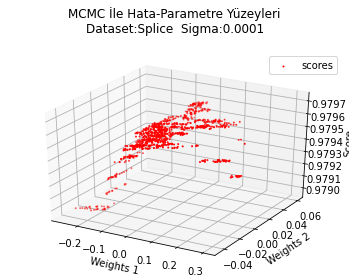

initial score:		0.979466438293457 
 max score:		0.9797123074531555 
 acceptance ratio:		100.0 




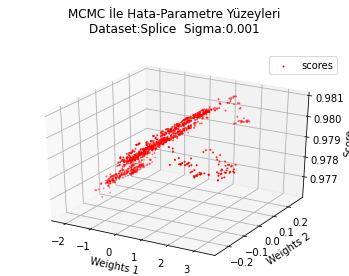

initial score:		0.979466438293457 
 max score:		0.9808188676834106 
 acceptance ratio:		100.0 




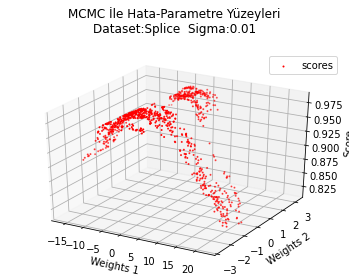

initial score:		0.979466438293457 
 max score:		0.9805729389190674 
 acceptance ratio:		96.0 




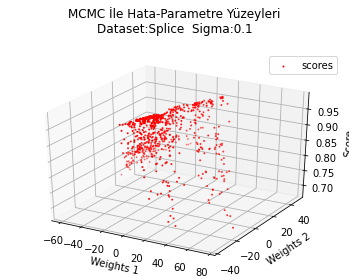

initial score:		0.979466438293457 
 max score:		0.9805729389190674 
 acceptance ratio:		69.9 




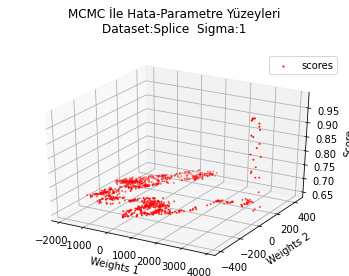

initial score:		0.979466438293457 
 max score:		0.979466438293457 
 acceptance ratio:		87.8 




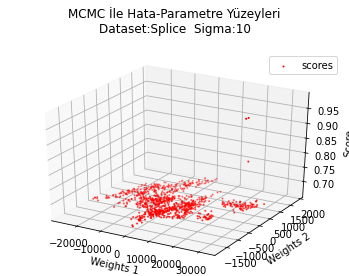

initial score:		0.979466438293457 
 max score:		0.979466438293457 
 acceptance ratio:		95.3 




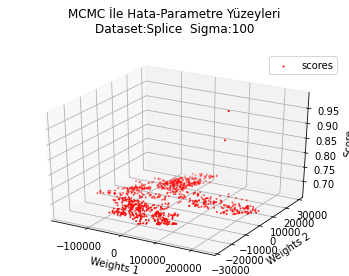

initial score:		0.979466438293457 
 max score:		0.979466438293457 
 acceptance ratio:		91.2 




In [36]:
plotAllScores("Splice", sigmas, new_weights_list, new_scores_list, max_weigths_list, max_score_list, acceptance_ratios)

In [37]:
## ************************************************************************************************************* ##

In [38]:
path = './36uci/zoo.arff'

X_train, X_test, y_train, y_test, input_shape, output_shape = loadDataSet(path)
model = createModel(X_train, y_train, input_shape, output_shape, 90)
model.summary()

dataset size: (84, 17)
Model: "sequential_4"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_8 (Dense)              (None, 64)                1088      
_________________________________________________________________
dense_9 (Dense)              (None, 4)                 260       
Total params: 1,348
Trainable params: 1,348
Non-trainable params: 0
_________________________________________________________________


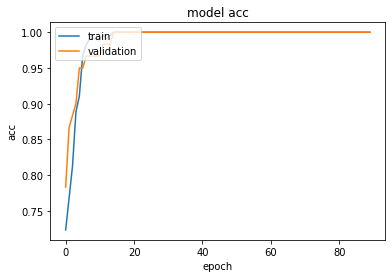

In [39]:
plotAccuracy(model)

In [40]:
initial_weights = model.get_weights() # weights of last epoch

In [41]:
new_weights_list, new_scores_list, max_weigths_list, max_score_list, acceptance_ratios = metropolisDiffrentSigmas(model, sigmas, n_iter, initial_weights)

71/71 [==============================] - 0s 39us/sample - loss: 2.4017e-04 - acc: 1.0000
[-2.781482546793454e-05, 0.00011341531729434478]
[3.8062862923350853e-05, 8.956816644352528e-05]
71/71 [==============================] - 0s 54us/sample - loss: 2.4018e-04 - acc: 1.0000
[-9.243743172123948e-05, 8.025902349746586e-05]
[0.00013407079905333716, 0.00014575343050706127]
71/71 [==============================] - 0s 46us/sample - loss: 2.4033e-04 - acc: 1.0000
[1.2310816480495976e-05, -3.934932940998598e-05]
[-1.481146891919554e-05, -6.354687191531194e-05]
71/71 [==============================] - 0s 43us/sample - loss: 2.4032e-04 - acc: 1.0000
[-4.065802949694664e-05, -0.00017314661815982354]
[-0.00015260155948975467, 7.546139602225485e-05]
71/71 [==============================] - 0s 55us/sample - loss: 2.4044e-04 - acc: 1.0000
[0.00015339331734272787, -0.00013177315694453263]
[-4.783986229984106e-05, 0.00011011370932924876]
71/71 [==============================] - 0s 51us/sample - loss: 2

71/71 [==============================] - 0s 37us/sample - loss: 2.4034e-04 - acc: 1.0000
[4.07480857427841e-06, -9.311831949120838e-05]
[6.627355301298215e-05, -8.107835840891424e-05]
71/71 [==============================] - 0s 41us/sample - loss: 2.4037e-04 - acc: 1.0000
[0.00013470644584102567, -0.0001393019198144239]
[-7.645387320304279e-05, 0.0001083684948112562]
71/71 [==============================] - 0s 42us/sample - loss: 2.4016e-04 - acc: 1.0000
[-7.212200693650467e-05, -0.00014818767293367423]
[9.867568045078727e-05, -9.661513931734387e-05]
71/71 [==============================] - 0s 40us/sample - loss: 2.4033e-04 - acc: 1.0000
[-2.7123728875855465e-05, -9.163454778985442e-05]
[-6.64730703971404e-05, 3.9685327866512955e-05]
71/71 [==============================] - 0s 36us/sample - loss: 2.4040e-04 - acc: 1.0000
[-5.312100655991401e-06, -1.9603098837131942e-05]
[0.0001383638440541778, 2.2565383411480873e-05]
71/71 [==============================] - 0s 45us/sample - loss: 2.404

71/71 [==============================] - 0s 49us/sample - loss: 2.4113e-04 - acc: 1.0000
[5.409726157517834e-05, -0.00019286184721679103]
[5.5409612918951335e-05, 6.717019887357123e-05]
71/71 [==============================] - 0s 39us/sample - loss: 2.4108e-04 - acc: 1.0000
[0.00010234318113690358, -2.305752071992489e-05]
[2.9717012715341025e-05, 5.0482916970913604e-05]
71/71 [==============================] - 0s 42us/sample - loss: 2.4090e-04 - acc: 1.0000
[-0.0001658058399498454, -3.163834821041259e-05]
[-4.466301075593661e-05, -1.941462583576582e-05]
71/71 [==============================] - 0s 39us/sample - loss: 2.4121e-04 - acc: 1.0000
[0.00017813831223540726, -0.00011730749778150172]
[-0.0003077530938855804, 1.1130256643864465e-05]
71/71 [==============================] - 0s 33us/sample - loss: 2.4092e-04 - acc: 1.0000
[-0.00022151471272921356, 1.785322289890232e-05]
[-0.00022938427990314484, 3.674846215889351e-05]
71/71 [==============================] - 0s 36us/sample - loss: 2

71/71 [==============================] - 0s 38us/sample - loss: 2.4276e-04 - acc: 1.0000
[-3.2567951680112227e-05, 0.00010460005300305864]
[-5.467204702492195e-05, -7.5154398493130135e-06]
71/71 [==============================] - 0s 37us/sample - loss: 2.4279e-04 - acc: 1.0000
[-0.0001609690833455655, -2.7842405687400898e-05]
[2.9658183487865326e-05, -6.88426947379095e-05]
71/71 [==============================] - 0s 35us/sample - loss: 2.4310e-04 - acc: 1.0000
[-0.00016051428969760683, -4.611982872987878e-05]
[0.00015192281309346165, -3.251611323309132e-05]
71/71 [==============================] - 0s 40us/sample - loss: 2.4342e-04 - acc: 1.0000
[9.690805030408116e-05, -2.2056957998757373e-05]
[-4.784342367360165e-05, 5.668676011776224e-07]
71/71 [==============================] - 0s 32us/sample - loss: 2.4324e-04 - acc: 1.0000
[-0.00010400185505065496, -0.00014084233068753372]
[-0.00020774729158555717, -0.00012251763469381516]
71/71 [==============================] - 0s 32us/sample - l

71/71 [==============================] - 0s 37us/sample - loss: 2.4418e-04 - acc: 1.0000
[-0.00016226679744149822, -4.983237222712399e-05]
[6.407517514302617e-05, -1.6187405197535026e-05]
71/71 [==============================] - 0s 39us/sample - loss: 2.4451e-04 - acc: 1.0000
[3.473436117727717e-05, -8.887265361180386e-06]
[-2.503916013852718e-05, -1.7864272823909108e-05]
71/71 [==============================] - 0s 33us/sample - loss: 2.4444e-04 - acc: 1.0000
[4.4117539816337936e-05, -5.759131158597626e-05]
[-6.428040123935908e-06, 3.806621728672412e-05]
71/71 [==============================] - 0s 36us/sample - loss: 2.4437e-04 - acc: 1.0000
[-0.00010252464914579844, -6.629831474705334e-05]
[-7.299425085330097e-05, -9.631167776557971e-05]
71/71 [==============================] - 0s 35us/sample - loss: 2.4459e-04 - acc: 1.0000
[-1.0190129539247873e-05, -0.00029966866118129993]
[-0.00020140638109316755, -3.249756471856952e-05]
71/71 [==============================] - 0s 37us/sample - los

71/71 [==============================] - 0s 34us/sample - loss: 2.4364e-04 - acc: 1.0000
[-8.106363993242455e-05, -3.430500450530126e-05]
[2.947972449256492e-05, -0.0001862887820836165]
71/71 [==============================] - 0s 37us/sample - loss: 2.4381e-04 - acc: 1.0000
[5.371406306597852e-06, -1.1803972873220571e-05]
[-3.8957569828749846e-05, 5.4905654705655985e-05]
71/71 [==============================] - 0s 37us/sample - loss: 2.4380e-04 - acc: 1.0000
[-5.504798788597707e-05, -9.215044290009489e-05]
[0.00013121123421399903, -3.2360792807066214e-05]
71/71 [==============================] - 0s 40us/sample - loss: 2.4393e-04 - acc: 1.0000
[0.00025376201139452843, 9.389618754446281e-06]
[4.4788321519383334e-05, 9.497421554921227e-05]
71/71 [==============================] - 0s 38us/sample - loss: 2.4344e-04 - acc: 1.0000
[8.359421825875626e-05, -7.938443651541587e-05]
[-3.70216612682823e-05, 0.00010669818834175898]
71/71 [==============================] - 0s 33us/sample - loss: 2.43

71/71 [==============================] - 0s 32us/sample - loss: 2.4308e-04 - acc: 1.0000
[0.0001653170710856716, -3.5506062956818695e-05]
[1.1570285130291787e-06, 1.0854639229655641e-05]
71/71 [==============================] - 0s 35us/sample - loss: 2.4278e-04 - acc: 1.0000
[3.7179915418779314e-06, 4.250466040448453e-05]
[-0.00011683965917512565, 0.00012762595357993355]
71/71 [==============================] - 0s 41us/sample - loss: 2.4276e-04 - acc: 1.0000
[8.521731176699653e-05, 7.300164891605487e-05]
[2.3371449526693752e-05, -9.354485892860214e-05]
71/71 [==============================] - 0s 34us/sample - loss: 2.4258e-04 - acc: 1.0000
[9.980404646392407e-05, 3.0365761419857457e-05]
[0.00022183386302981518, -0.00012242611679115227]
71/71 [==============================] - 0s 35us/sample - loss: 2.4239e-04 - acc: 1.0000
[-8.011609886100332e-05, 7.124694998106433e-05]
[7.224179932528518e-05, -0.0001370515836531177]
71/71 [==============================] - 0s 40us/sample - loss: 2.425

71/71 [==============================] - 0s 36us/sample - loss: 2.4243e-04 - acc: 1.0000
[3.379327785491395e-05, -3.484846750550388e-05]
[-5.250602139941587e-05, -3.544344140462141e-05]
71/71 [==============================] - 0s 46us/sample - loss: 2.4238e-04 - acc: 1.0000
[1.037994128488063e-05, 0.00017423429413592961]
[-0.00017713815217390927, -1.3801846533171356e-05]
71/71 [==============================] - 0s 33us/sample - loss: 2.4231e-04 - acc: 1.0000
[0.00014378140840235772, 8.288781609765208e-05]
[-1.5396904589291785e-05, 5.54966361883214e-05]
71/71 [==============================] - 0s 34us/sample - loss: 2.4202e-04 - acc: 1.0000
[-6.501964355498969e-05, 0.00010234594697141635]
[2.9834664653569483e-05, 7.862162355930428e-05]
71/71 [==============================] - 0s 44us/sample - loss: 2.4212e-04 - acc: 1.0000
[9.747860964049476e-05, -0.00024067538202607916]
[2.160695542713486e-05, 0.00019487893916307565]
71/71 [==============================] - 0s 46us/sample - loss: 2.420

[0.00012121235311567864, -0.00019444277241999303]
71/71 [==============================] - 0s 39us/sample - loss: 2.4267e-04 - acc: 1.0000
[8.906801736971535e-05, 1.2181337271594517e-05]
[-0.00010862975004286757, 4.677896344210885e-06]
71/71 [==============================] - 0s 33us/sample - loss: 2.4250e-04 - acc: 1.0000
[-0.00017610543093207225, 0.00014372733822906576]
[2.6632216530767595e-05, -0.00020397464799395794]
71/71 [==============================] - 0s 34us/sample - loss: 2.4279e-04 - acc: 1.0000
[-5.5295442523749264e-05, 8.168287462090002e-05]
[6.887895432531109e-05, 0.0001426472335030328]
71/71 [==============================] - 0s 36us/sample - loss: 2.4287e-04 - acc: 1.0000
[-0.0002504986629950951, -0.00011673687421959163]
[-4.298088309027102e-05, 0.0001099812634071084]
71/71 [==============================] - 0s 38us/sample - loss: 2.4338e-04 - acc: 1.0000
[-2.063440272399785e-05, 5.950553474715873e-05]
[-5.719580996484785e-05, 0.00014253402860936408]
71/71 [==========

71/71 [==============================] - 0s 34us/sample - loss: 2.4383e-04 - acc: 1.0000
[0.00010530076267824391, -6.312471817938577e-06]
[-7.355811590473052e-05, -2.0712858661515386e-05]
71/71 [==============================] - 0s 35us/sample - loss: 2.4363e-04 - acc: 1.0000
[-2.7901560941279465e-07, 0.00011691898987325031]
[-9.042817994112336e-05, -8.05630962392772e-05]
71/71 [==============================] - 0s 40us/sample - loss: 2.4360e-04 - acc: 1.0000
[-0.0001299951872968884, -8.156395870446813e-05]
[-2.9320135948673096e-05, 1.43850065683933e-05]
71/71 [==============================] - 0s 38us/sample - loss: 2.4387e-04 - acc: 1.0000
[3.732834607807828e-05, 2.3279164151857074e-05]
[-6.720957433552146e-05, 0.00011574677468364548]
71/71 [==============================] - 0s 45us/sample - loss: 2.4380e-04 - acc: 1.0000
[-0.00013196803397021354, -0.00023614404738785762]
[3.950280900033543e-05, -1.764940381145665e-05]
71/71 [==============================] - 0s 45us/sample - loss: 2

71/71 [==============================] - 0s 38us/sample - loss: 2.4551e-04 - acc: 1.0000
[-6.61701411587727e-05, -1.5262578315445954e-05]
[-0.0001259344149597672, -4.051680544456099e-05]
71/71 [==============================] - 0s 51us/sample - loss: 2.4565e-04 - acc: 1.0000
[-8.997992986910126e-05, -0.00025204796661165523]
[-1.5011470017778678e-05, -5.2020835126600056e-05]
71/71 [==============================] - 0s 35us/sample - loss: 2.4590e-04 - acc: 1.0000
[3.480931996798068e-05, -4.674818357168391e-05]
[3.182585482743607e-05, -3.592097907051249e-05]
71/71 [==============================] - 0s 33us/sample - loss: 2.4584e-04 - acc: 1.0000
[-0.00012404185432971976, -1.2905624914578688e-05]
[0.00014970439994744356, -4.816761111844512e-05]
71/71 [==============================] - 0s 41us/sample - loss: 2.4609e-04 - acc: 1.0000
[-0.00012893980991904807, -0.0001620699960064581]
[2.4329806955003893e-05, -8.741336821550633e-05]
71/71 [==============================] - 0s 67us/sample - los

71/71 [==============================] - 0s 52us/sample - loss: 2.4719e-04 - acc: 1.0000
[-1.0498879120594197e-06, -7.053712879646517e-05]
[-9.87004176313757e-05, -7.01024567407513e-05]
71/71 [==============================] - 0s 36us/sample - loss: 2.4721e-04 - acc: 1.0000
[-2.7913952142841383e-05, 0.00019076408462219614]
[-4.654651546006677e-06, -3.347242369109271e-05]
71/71 [==============================] - 0s 43us/sample - loss: 2.4721e-04 - acc: 1.0000
[-7.535172965706038e-05, 0.00015085700777069827]
[0.00019520225006366336, 1.001483020490842e-05]
71/71 [==============================] - 0s 51us/sample - loss: 2.4732e-04 - acc: 1.0000
[-0.00012690360105976136, -0.00012709060696454612]
[-3.021379093569959e-05, -5.646703181761608e-06]
71/71 [==============================] - 0s 48us/sample - loss: 2.4761e-04 - acc: 1.0000
[-0.00011166674747697654, 9.98274091623988e-05]
[-3.3104821894262426e-05, -1.2931594220202161e-05]
71/71 [==============================] - 0s 55us/sample - loss:

71/71 [==============================] - 0s 40us/sample - loss: 2.4696e-04 - acc: 1.0000
[-6.026613041837207e-05, -7.491950939918706e-05]
[0.00015481053222949733, -2.9842964308420292e-05]
71/71 [==============================] - 0s 32us/sample - loss: 2.4711e-04 - acc: 1.0000
[-1.647803956336558e-05, -2.5904795551235113e-05]
[0.00016094634096271555, 2.4037419286832715e-05]
71/71 [==============================] - 0s 33us/sample - loss: 2.4715e-04 - acc: 1.0000
[-0.0001517034376057768, -3.429997400217702e-05]
[-9.519034939105111e-05, 3.821654036948006e-05]
71/71 [==============================] - 0s 41us/sample - loss: 2.4746e-04 - acc: 1.0000
[-6.631714554753066e-05, -2.8961615973410566e-05]
[0.00012663192032785688, -4.395913937237679e-05]
71/71 [==============================] - 0s 38us/sample - loss: 2.4761e-04 - acc: 1.0000
[-5.851660596053717e-06, -3.8371553528304975e-05]
[-2.6964023821499167e-05, -4.484959431222304e-05]
71/71 [==============================] - 0s 44us/sample - los

[6.108639310734063e-05, -0.00016976697959882777]
71/71 [==============================] - 0s 38us/sample - loss: 2.4781e-04 - acc: 1.0000
[2.7806510419615483e-05, 3.754092256343011e-05]
[-0.00020058104488222936, -4.837025879081834e-05]
71/71 [==============================] - 0s 41us/sample - loss: 2.4774e-04 - acc: 1.0000
[-0.00012019313430071688, 5.781719758103313e-05]
[-9.474796576860434e-05, 8.046888938041532e-05]
71/71 [==============================] - 0s 35us/sample - loss: 2.4796e-04 - acc: 1.0000
[0.00015398493259107787, 2.7224848249207043e-05]
[-0.0001514902887200047, -5.795170172972488e-07]
71/71 [==============================] - 0s 37us/sample - loss: 2.4764e-04 - acc: 1.0000
[7.801110557641742e-05, -3.0899538499012353e-06]
[-3.272968187571332e-05, -6.710098828561581e-05]
71/71 [==============================] - 0s 44us/sample - loss: 2.4749e-04 - acc: 1.0000
[6.207901785825722e-05, 0.0001177845545269686]
[-0.00011997266659879702, 8.302581112366488e-05]
71/71 [============

71/71 [==============================] - 0s 36us/sample - loss: 2.4805e-04 - acc: 1.0000
[-3.474681651413775e-05, 2.8913028881251864e-06]
[0.00016551157067171184, 1.9220878573824565e-05]
71/71 [==============================] - 0s 40us/sample - loss: 2.4812e-04 - acc: 1.0000
[-0.0001961710081378617, -3.195228217283825e-05]
[-2.1590605303583283e-05, 2.6881425137987666e-06]
71/71 [==============================] - 0s 35us/sample - loss: 2.4853e-04 - acc: 1.0000
[-0.00017675062374068824, -9.110986637507609e-05]
[-0.00029443694369427894, -0.00011447145422841827]
71/71 [==============================] - 0s 39us/sample - loss: 2.4892e-04 - acc: 1.0000
[-1.6350040250203646e-05, -9.030470315207221e-05]
[0.00022934089500431827, -2.6747908161613744e-05]
71/71 [==============================] - 0s 42us/sample - loss: 2.4898e-04 - acc: 1.0000
[-4.483720338677361e-06, 0.00010504134870189626]
[-4.7830878072249996e-05, -6.274580652422843e-05]
71/71 [==============================] - 0s 33us/sample - 

71/71 [==============================] - 0s 40us/sample - loss: 2.4963e-04 - acc: 1.0000
[3.755496584098572e-05, -0.00013688720808200487]
[9.45086435383147e-05, -7.941169231693128e-05]
71/71 [==============================] - 0s 36us/sample - loss: 2.4960e-04 - acc: 1.0000
[-7.178972109647652e-05, 9.296880505529053e-05]
[5.789612195179633e-06, 0.00011410862098074519]
71/71 [==============================] - 0s 47us/sample - loss: 2.4972e-04 - acc: 1.0000
[0.0001034081758946178, 0.0001678704601159887]
[1.758668150986956e-05, -7.844823138053187e-07]
71/71 [==============================] - 0s 36us/sample - loss: 2.4945e-04 - acc: 1.0000
[-8.202275466019239e-05, -4.078568343655804e-05]
[5.5648146474783095e-05, -2.8347110133004145e-05]
71/71 [==============================] - 0s 45us/sample - loss: 2.4964e-04 - acc: 1.0000
[0.00017259927967406874, -5.675154478420095e-05]
[1.0945557734007531e-06, -8.37910631453173e-05]
71/71 [==============================] - 0s 37us/sample - loss: 2.4930e-

71/71 [==============================] - 0s 33us/sample - loss: 2.4929e-04 - acc: 1.0000
[-5.947476391432664e-05, -0.0001367320611991905]
[-0.0001543719722173184, 0.00011534478604691392]
71/71 [==============================] - 0s 38us/sample - loss: 2.4945e-04 - acc: 1.0000
[-2.874415862336344e-05, -8.787442856556355e-05]
[-4.871300485687529e-05, 0.00026254578361213594]
71/71 [==============================] - 0s 37us/sample - loss: 2.4954e-04 - acc: 1.0000
[-3.0548139609240136e-05, -0.00016909577837260703]
[-9.831785228356406e-05, -9.710508924951422e-05]
71/71 [==============================] - 0s 35us/sample - loss: 2.4965e-04 - acc: 1.0000
[2.125276850350703e-05, 2.3078464407538346e-07]
[7.678612862531472e-06, 2.7250502291089792e-05]
71/71 [==============================] - 0s 38us/sample - loss: 2.4961e-04 - acc: 1.0000
[0.00011501147339065555, 4.800875787223125e-05]
[8.457903327847483e-05, -1.5341613823945033e-05]
71/71 [==============================] - 0s 43us/sample - loss: 2.

71/71 [==============================] - 0s 52us/sample - loss: 2.4996e-04 - acc: 1.0000
[4.5211833112280014e-05, 8.295385540128567e-05]
[4.8483096984506936e-05, 0.00011084660371256163]
71/71 [==============================] - 0s 44us/sample - loss: 2.4983e-04 - acc: 1.0000
[0.00024438742156423246, 9.192557722705315e-05]
[0.00011844391543144314, -1.89184262798904e-05]
71/71 [==============================] - 0s 41us/sample - loss: 2.4931e-04 - acc: 1.0000
[-4.699687694593103e-05, 9.479623828099e-05]
[-5.896525351947094e-05, -2.905437707327983e-05]
71/71 [==============================] - 0s 43us/sample - loss: 2.4937e-04 - acc: 1.0000
[-4.692419778644611e-05, -9.880944213966708e-05]
[-7.484303789949817e-05, -0.00010789477125338561]
71/71 [==============================] - 0s 35us/sample - loss: 2.4950e-04 - acc: 1.0000
[5.18807179582254e-05, -5.1989495432587845e-05]
[-1.9901829956598684e-05, -0.00010003924557948598]
71/71 [==============================] - 0s 50us/sample - loss: 2.4941

71/71 [==============================] - 0s 38us/sample - loss: 2.4854e-04 - acc: 1.0000
[-0.0001188661607989648, 0.00013175757025310557]
[-0.00026776633055873475, -3.296379204193947e-05]
71/71 [==============================] - 0s 40us/sample - loss: 2.4874e-04 - acc: 1.0000
[-1.5769329055132935e-05, -0.00014296329376250853]
[0.00011845535596888126, -7.707934129532231e-05]
71/71 [==============================] - 0s 39us/sample - loss: 2.4882e-04 - acc: 1.0000
[-1.0180461616814303e-05, -8.783547197779599e-05]
[0.00016634398812977595, 5.901783373629801e-05]
71/71 [==============================] - 0s 49us/sample - loss: 2.4887e-04 - acc: 1.0000
[-0.00014889852202152576, 8.2093756065626e-06]
[5.8808113910297166e-05, -0.0001075896943558956]
71/71 [==============================] - 0s 39us/sample - loss: 2.4917e-04 - acc: 1.0000
[0.00010980455779515849, 1.035997241400784e-05]
[-7.245816176479595e-05, -1.9660755611870414e-05]
71/71 [==============================] - 0s 40us/sample - loss: 

71/71 [==============================] - 0s 49us/sample - loss: 2.5024e-04 - acc: 1.0000
[-0.0001523449840100366, -8.837028985059961e-05]
[-0.00010080308609358596, 7.395718636375038e-05]
71/71 [==============================] - 0s 40us/sample - loss: 2.5059e-04 - acc: 1.0000
[6.312200990024424e-05, 1.4108308048174249e-05]
[0.00017376776529086184, 7.374067303275502e-05]
71/71 [==============================] - 0s 40us/sample - loss: 2.5045e-04 - acc: 1.0000
[-0.0001382623840580023, -2.9812872640186635e-05]
[-5.304925939895349e-05, 0.00034462332454984475]
71/71 [==============================] - 0s 38us/sample - loss: 2.5075e-04 - acc: 1.0000
[-6.737235155740759e-05, 0.0003003564437234638]
[-0.0001357106741411953, 4.458967026989094e-05]
71/71 [==============================] - 0s 34us/sample - loss: 2.5080e-04 - acc: 1.0000
[3.1206679753374804e-06, 5.719736936037747e-05]
[6.870290252764361e-06, 5.9851405849500084e-05]
71/71 [==============================] - 0s 36us/sample - loss: 2.5078

71/71 [==============================] - 0s 33us/sample - loss: 2.5240e-04 - acc: 1.0000
[4.356195274258395e-05, -1.3046281509523307e-05]
[-4.702310954360244e-05, 0.00014798438938732822]
71/71 [==============================] - 0s 34us/sample - loss: 2.5231e-04 - acc: 1.0000
[-0.00013411839338016275, -0.00021574654337099753]
[-6.856516308960954e-05, 9.386202652642386e-05]
71/71 [==============================] - 0s 38us/sample - loss: 2.5267e-04 - acc: 1.0000
[-4.168981554554262e-05, 9.906456010704774e-05]
[0.0001286062766601116, 8.260425303572562e-05]
71/71 [==============================] - 0s 37us/sample - loss: 2.5272e-04 - acc: 1.0000
[5.674674214633252e-05, 6.65916527653532e-06]
[3.453098560450809e-05, -2.4177442245566566e-05]
71/71 [==============================] - 0s 41us/sample - loss: 2.5260e-04 - acc: 1.0000
[2.1415939413288252e-05, -5.921445698762559e-05]
[0.00016656936528971453, 3.92597219752611e-05]
71/71 [==============================] - 0s 35us/sample - loss: 2.5257e-

71/71 [==============================] - 0s 34us/sample - loss: 2.5191e-04 - acc: 1.0000
[8.362420580060733e-05, 3.224516179072601e-05]
[-0.00012867136511535002, -8.862704969705965e-05]
71/71 [==============================] - 0s 34us/sample - loss: 2.5172e-04 - acc: 1.0000
[-5.165397674228417e-05, -0.00013387808834601018]
[-3.5948729884729826e-05, 9.361750815012144e-05]
71/71 [==============================] - 0s 38us/sample - loss: 2.5187e-04 - acc: 1.0000
[8.608256787625182e-05, -6.431845912094058e-05]
[-5.867176182083084e-05, 0.00010753697172484529]
71/71 [==============================] - 0s 33us/sample - loss: 2.5171e-04 - acc: 1.0000
[7.780234605743273e-05, -3.291556923252193e-05]
[-5.2452706565888885e-05, -4.872486840540613e-05]
71/71 [==============================] - 0s 40us/sample - loss: 2.5156e-04 - acc: 1.0000
[-0.0001018911193224468, 0.000116248846937405]
[4.403968439443412e-05, -0.00010862940911886919]
71/71 [==============================] - 0s 34us/sample - loss: 2.51

71/71 [==============================] - 0s 38us/sample - loss: 2.5085e-04 - acc: 1.0000
[4.1098690806943175e-05, 0.00024400927540401042]
[8.233461397615293e-05, 0.00017753740173816988]
71/71 [==============================] - 0s 35us/sample - loss: 2.5068e-04 - acc: 1.0000
[7.69996741769687e-07, -0.00012396574521603647]
[-9.80304091473092e-05, 0.00011070862412738084]
71/71 [==============================] - 0s 34us/sample - loss: 2.5072e-04 - acc: 1.0000
[0.00017469616732714756, 3.4937998438491824e-05]
[-0.00012881010309484742, -0.00023358665935336735]
71/71 [==============================] - 0s 39us/sample - loss: 2.5035e-04 - acc: 1.0000
[2.017031641701805e-05, -6.32967875110504e-05]
[-0.0001284446102572626, -9.759859913528912e-05]
71/71 [==============================] - 0s 35us/sample - loss: 2.5032e-04 - acc: 1.0000
[0.0001278121712208432, 0.000128244279158848]
[2.2548528971608267e-05, -8.256633913140735e-05]
71/71 [==============================] - 0s 34us/sample - loss: 2.5002e

[3.575397377726203e-05, 1.2612407817368585e-05]
71/71 [==============================] - 0s 37us/sample - loss: 2.5192e-04 - acc: 1.0000
[6.347133037312805e-05, 0.0002756272666564139]
[1.1784389198038148e-05, 1.7002053535465358e-05]
71/71 [==============================] - 0s 47us/sample - loss: 2.5170e-04 - acc: 1.0000
[3.8964554187991906e-05, -0.00011403316292278572]
[-0.00014830714501672554, 0.0001649965868583528]
71/71 [==============================] - 0s 44us/sample - loss: 2.5166e-04 - acc: 1.0000
[-8.606331108954873e-05, 0.00010255445361491671]
[-4.5722328217131845e-05, 7.732096834172332e-05]
71/71 [==============================] - 0s 33us/sample - loss: 2.5181e-04 - acc: 1.0000
[4.280619528862636e-05, 3.942325546929413e-05]
[8.160039503181957e-05, -7.315344029725915e-05]
71/71 [==============================] - 0s 41us/sample - loss: 2.5170e-04 - acc: 1.0000
[0.0001932629529954847, -0.0002508256985462068]
[9.167998880254185e-05, -4.704199286975636e-05]
71/71 [================

71/71 [==============================] - 0s 43us/sample - loss: 2.5145e-04 - acc: 1.0000
[0.00012628928717215416, 3.7301564698498094e-05]
[4.8863393402183235e-05, -3.8034122290345794e-05]
71/71 [==============================] - 0s 34us/sample - loss: 2.5118e-04 - acc: 1.0000
[-6.738328085944006e-05, -0.00015368999344599863]
[6.143372082853971e-06, -6.505146909852514e-06]
71/71 [==============================] - 0s 37us/sample - loss: 2.5137e-04 - acc: 1.0000
[0.0003166008859044999, -7.932385074717808e-05]
[-1.7861987876291588e-06, 0.0001358144835996957]
71/71 [==============================] - 0s 51us/sample - loss: 2.5073e-04 - acc: 1.0000
[-4.3986596053629e-05, -5.294575341975748e-05]
[6.918028938534259e-05, -7.583454476085525e-05]
71/71 [==============================] - 0s 43us/sample - loss: 2.5083e-04 - acc: 1.0000
[-8.10577336069884e-06, -9.52230311480786e-05]
[-4.771684298114163e-05, -0.0001529692401362077]
71/71 [==============================] - 0s 42us/sample - loss: 2.5088

71/71 [==============================] - 0s 38us/sample - loss: 2.5032e-04 - acc: 1.0000
[-5.715802417569185e-05, -7.080323674551e-05]
[-1.744854772480436e-05, -5.9950609951225135e-05]
71/71 [==============================] - 0s 39us/sample - loss: 2.5046e-04 - acc: 1.0000
[0.00015500950586460227, -9.027762167868048e-05]
[-1.3899626304399277e-05, -8.80792396782827e-05]
71/71 [==============================] - 0s 37us/sample - loss: 2.5016e-04 - acc: 1.0000
[1.3454839235537085e-05, -2.207354070244351e-05]
[0.00014176235203476297, -3.573711992092669e-05]
71/71 [==============================] - 0s 34us/sample - loss: 2.5014e-04 - acc: 1.0000
[-9.63321643726082e-06, -4.989888981298501e-05]
[-3.4667947176787207e-07, 6.875463423322335e-05]
71/71 [==============================] - 0s 34us/sample - loss: 2.5018e-04 - acc: 1.0000
[7.343431891325782e-05, 0.00010415123132473981]
[-2.5180770129345915e-05, 9.29970855865754e-05]
71/71 [==============================] - 0s 33us/sample - loss: 2.4999

71/71 [==============================] - 0s 34us/sample - loss: 2.5013e-04 - acc: 1.0000
[-0.00017492180246291453, 0.00017162089741035709]
[-4.230388024518477e-05, 0.0002314442922348754]
71/71 [==============================] - 0s 35us/sample - loss: 2.5044e-04 - acc: 1.0000
[-1.696463779711187e-05, 0.0003125977904960024]
[-7.416230763092398e-05, 2.203528493072702e-05]
71/71 [==============================] - 0s 36us/sample - loss: 2.5038e-04 - acc: 1.0000
[2.8812930117614733e-06, 6.265209081454615e-05]
[0.00019171082097759398, -8.550448614595662e-07]
71/71 [==============================] - 0s 43us/sample - loss: 2.5035e-04 - acc: 1.0000
[-5.6071279488172635e-05, -0.00015149524636032643]
[1.6747556571906378e-05, 2.758252965576536e-06]
71/71 [==============================] - 0s 36us/sample - loss: 2.5052e-04 - acc: 1.0000
[4.6199077622534745e-05, -0.00015956510830755834]
[-8.681530371552154e-05, -7.420694898119785e-05]
71/71 [==============================] - 0s 36us/sample - loss: 2.

71/71 [==============================] - 0s 35us/sample - loss: 2.5028e-04 - acc: 1.0000
[-9.803443021071127e-05, 2.1279621045454254e-05]
[0.0001391478908529043, -7.90417938136657e-05]
71/71 [==============================] - 0s 38us/sample - loss: 2.5048e-04 - acc: 1.0000
[4.2859956187398433e-07, -3.3236333304367707e-06]
[8.458302690658101e-05, -1.1523987125972193e-05]
71/71 [==============================] - 0s 42us/sample - loss: 2.5048e-04 - acc: 1.0000
[-6.308053408212954e-05, -7.977702522641904e-06]
[0.00018183114284396135, -6.32994874712131e-05]
71/71 [==============================] - 0s 41us/sample - loss: 2.5061e-04 - acc: 1.0000
[3.819554726184699e-05, -2.0233117941034666e-05]
[-6.745321264651882e-05, -8.786701605385236e-05]
71/71 [==============================] - 0s 46us/sample - loss: 2.5054e-04 - acc: 1.0000
[-1.8863777225274688e-05, -5.583591885567222e-05]
[8.459143132579527e-05, 1.1317725933422876e-05]
71/71 [==============================] - 0s 34us/sample - loss: 2.5

[9.859042644169756e-06, 9.748729088706961e-05]
71/71 [==============================] - 0s 42us/sample - loss: 2.5023e-04 - acc: 1.0000
[6.756839730135952e-05, -1.5572652305204412e-05]
[-1.3517677124855852e-06, 3.93762177552904e-05]
71/71 [==============================] - 0s 36us/sample - loss: 2.5009e-04 - acc: 1.0000
[-8.405439159764501e-05, 0.0001492645265663102]
[-4.666354584645775e-05, -4.583274191947201e-05]
71/71 [==============================] - 0s 37us/sample - loss: 2.5022e-04 - acc: 1.0000
[-5.0748920910361954e-05, 8.608683685634338e-05]
[2.820201874096694e-05, -6.549118730906083e-05]
71/71 [==============================] - 0s 42us/sample - loss: 2.5030e-04 - acc: 1.0000
[5.457310452509389e-05, -0.00017864645125506863]
[-6.734232844291538e-05, -7.025880560464371e-05]
71/71 [==============================] - 0s 31us/sample - loss: 2.5024e-04 - acc: 1.0000
[-2.365515015804648e-05, 0.00011957150896058238]
[2.1317234283708278e-05, -0.00012255457021264233]
71/71 [=============

71/71 [==============================] - 0s 29us/sample - loss: 2.4978e-04 - acc: 1.0000
[-2.5979799747253942e-05, 2.5287947307579202e-05]
[-9.003266093032733e-05, 0.00011953870387210828]
71/71 [==============================] - 0s 36us/sample - loss: 2.4982e-04 - acc: 1.0000
[1.0955940385020673e-05, -6.481913835715758e-05]
[-3.926585058121976e-05, 4.4473691531836764e-05]
71/71 [==============================] - 0s 31us/sample - loss: 2.4982e-04 - acc: 1.0000
[-7.985313459168759e-05, -4.2033078291179735e-05]
[9.785851661449781e-05, 1.2921742838138148e-05]
71/71 [==============================] - 0s 38us/sample - loss: 2.5000e-04 - acc: 1.0000
[-0.00012551326831087225, -2.1711916259820907e-05]
[-0.00013784138557734627, 0.00013723548672878698]
71/71 [==============================] - 0s 37us/sample - loss: 2.5027e-04 - acc: 1.0000
[3.680915652714665e-05, -5.085809923085779e-05]
[8.778076101053301e-05, -3.0085810297657483e-06]
71/71 [==============================] - 0s 37us/sample - loss

71/71 [==============================] - 0s 36us/sample - loss: 2.5027e-04 - acc: 1.0000
[-0.00012262951836250613, -7.256538171106287e-05]
[-8.262850689074408e-05, 1.4873878214987238e-06]
71/71 [==============================] - 0s 35us/sample - loss: 2.5055e-04 - acc: 1.0000
[-3.883166445799389e-05, 4.626359288131501e-05]
[0.0001562239873692063, -5.8864056888374685e-05]
71/71 [==============================] - 0s 42us/sample - loss: 2.5061e-04 - acc: 1.0000
[0.00013545663087284853, 0.00020251181429327633]
[-3.2050022435201056e-05, 1.9093788515015602e-05]
71/71 [==============================] - 0s 40us/sample - loss: 2.5027e-04 - acc: 1.0000
[-2.0026456455524773e-05, 5.3288293368546295e-05]
[1.1801199454018024e-05, -9.36663340137081e-06]
71/71 [==============================] - 0s 37us/sample - loss: 2.5029e-04 - acc: 1.0000
[-0.00011812054873509457, 3.8886780825437206e-05]
[2.8307275083872563e-05, -6.188843864547301e-05]
71/71 [==============================] - 0s 36us/sample - loss:

71/71 [==============================] - 0s 38us/sample - loss: 2.4929e-04 - acc: 1.0000
[-6.713929517849616e-05, -0.00020551164049032524]
[0.00011640993267297546, 8.280718135733857e-05]
71/71 [==============================] - 0s 40us/sample - loss: 2.4949e-04 - acc: 1.0000
[-0.00016672776985869354, 5.891909466851769e-05]
[6.237528200956755e-05, 0.0001298103312346817]
71/71 [==============================] - 0s 37us/sample - loss: 2.4982e-04 - acc: 1.0000
[0.00024357111832898318, -0.00022306089133464893]
[-3.0067488845776737e-05, 6.76575491764894e-05]
71/71 [==============================] - 0s 40us/sample - loss: 2.4938e-04 - acc: 1.0000
[-0.00019434791681057796, 0.0001101411722102991]
[-7.177670451104333e-05, 0.00015079209059427865]
71/71 [==============================] - 0s 44us/sample - loss: 2.4975e-04 - acc: 1.0000
[3.49743379525447e-05, -5.089760902761834e-05]
[-0.000145558962899422, -0.00010585912095308849]
71/71 [==============================] - 0s 43us/sample - loss: 2.496

[0.00012349932115535874, -0.00014320846228212193]
71/71 [==============================] - 0s 57us/sample - loss: 2.4640e-04 - acc: 1.0000
[-4.7413729712413e-05, 5.7520065694624604e-05]
[5.073406976582039e-05, 6.942054483909292e-05]
71/71 [==============================] - 0s 36us/sample - loss: 2.4647e-04 - acc: 1.0000
[0.0001491401301894788, -9.481715984169924e-05]
[-9.094072850235967e-05, -0.00010232233095083374]
71/71 [==============================] - 0s 43us/sample - loss: 2.4621e-04 - acc: 1.0000
[-0.00021720964507281222, -5.663128008881496e-05]
[-0.00017134541524813402, 5.229584590167627e-05]
71/71 [==============================] - 0s 41us/sample - loss: 2.4665e-04 - acc: 1.0000
[0.0002041224193161646, -1.3800370782003313e-05]
[-0.0001725218159447552, -1.3505372933993163e-05]
71/71 [==============================] - 0s 43us/sample - loss: 2.4625e-04 - acc: 1.0000
[0.00010228599304568705, -0.00012321974161988783]
[4.891074380346354e-05, -1.92559061073765e-05]
71/71 [===========

71/71 [==============================] - 0s 31us/sample - loss: 2.4675e-04 - acc: 1.0000
[-9.324984029753815e-05, 3.970451379855409e-05]
[8.700019704545836e-05, -5.046057541778588e-05]
71/71 [==============================] - 0s 37us/sample - loss: 2.4692e-04 - acc: 1.0000
[-1.4914318429446839e-05, 0.00012769630242210014]
[8.650327229344534e-05, 2.0303836093677055e-05]
71/71 [==============================] - 0s 52us/sample - loss: 2.4691e-04 - acc: 1.0000
[-7.578481080058725e-05, -4.3739592448296635e-05]
[-4.4592911660185524e-05, -0.00014562689549296048]
71/71 [==============================] - 0s 44us/sample - loss: 2.4708e-04 - acc: 1.0000
[4.053804803439543e-05, 1.0201849570280956e-05]
[0.00023372860420038495, 2.411124075971222e-05]
71/71 [==============================] - 0s 53us/sample - loss: 2.4700e-04 - acc: 1.0000
[-6.697544570577783e-05, 6.811422933541293e-05]
[5.128871931717374e-05, 1.571157216403527e-05]
71/71 [==============================] - 0s 33us/sample - loss: 2.471

71/71 [==============================] - 0s 51us/sample - loss: 2.3450e-04 - acc: 1.0000
[-0.0013869737689952836, -0.0013464197140374025]
[0.0009353912661384161, -0.0009818129185664764]
71/71 [==============================] - 0s 42us/sample - loss: 2.3719e-04 - acc: 1.0000
[0.00023760821202900722, 0.000419015419180603]
[-0.0009031956048446107, -0.0021115521660214766]
71/71 [==============================] - 0s 48us/sample - loss: 2.3667e-04 - acc: 1.0000
[0.0002520415221200127, -0.0014672832602766602]
[-0.00020148784346301886, 0.0001810262758389744]
71/71 [==============================] - 0s 43us/sample - loss: 2.3661e-04 - acc: 1.0000
[8.25283726856379e-05, 0.0007201691734846545]
[-0.0007146225994733288, -0.00036247989369062]
71/71 [==============================] - 0s 40us/sample - loss: 2.3629e-04 - acc: 1.0000
[-0.00023251070234338013, -0.0006174345073951822]
[-0.0010278654791812515, 0.0016015243141395896]
71/71 [==============================] - 0s 50us/sample - loss: 2.3685e-04

71/71 [==============================] - 0s 35us/sample - loss: 2.5321e-04 - acc: 1.0000
[-0.0012166809753362939, -0.0020137435291469304]
[0.000608107572526386, -0.0007481178153277738]
71/71 [==============================] - 0s 44us/sample - loss: 2.5653e-04 - acc: 1.0000
[-0.0020236342140103115, 0.0012242261724969632]
[0.0007174135715545203, -0.0004263870875647064]
71/71 [==============================] - 0s 47us/sample - loss: 2.6076e-04 - acc: 1.0000
[0.0013361741867617483, 0.0024053828577251055]
[-0.0006769771626933869, 0.0013686054582175758]
71/71 [==============================] - 0s 39us/sample - loss: 2.5688e-04 - acc: 1.0000
[0.0014486292065700333, 0.001350128718021362]
[0.0003246791479224506, -0.00013862902948532987]
71/71 [==============================] - 0s 38us/sample - loss: 2.5325e-04 - acc: 1.0000
[-0.0015281046635963736, 0.0017267595397678624]
[0.0008156766574010959, -0.0013646803483259608]
71/71 [==============================] - 0s 56us/sample - loss: 2.5604e-04 - 

71/71 [==============================] - 0s 44us/sample - loss: 2.5762e-04 - acc: 1.0000
[-0.0003452605576989799, -0.00026374187524565737]
[-0.00038234571005382116, 0.0014654935165238719]
71/71 [==============================] - 0s 47us/sample - loss: 2.5849e-04 - acc: 1.0000
[0.0015943281851488707, 0.0006318249853137922]
[0.0002748636296691712, -1.2982645164284215e-05]
71/71 [==============================] - 0s 36us/sample - loss: 2.5471e-04 - acc: 1.0000
[-0.0005453454789807116, 0.0002100157231664014]
[-8.392242039127385e-05, 0.0001420009416786277]
71/71 [==============================] - 0s 44us/sample - loss: 2.5584e-04 - acc: 1.0000
[-0.00018431103513967008, -0.0010909221500949823]
[-0.0008174672566174529, 0.0011298697627880761]
71/71 [==============================] - 0s 53us/sample - loss: 2.5662e-04 - acc: 1.0000
[0.0014951871711829036, -0.00024418683768252623]
[-0.0004024779888830627, -4.529914487165191e-06]
71/71 [==============================] - 0s 43us/sample - loss: 2.53

71/71 [==============================] - 0s 33us/sample - loss: 2.6103e-04 - acc: 1.0000
[-0.00021271008071903377, -0.00040675822666180517]
[-0.00043130227013462696, 0.0005597308713948234]
71/71 [==============================] - 0s 43us/sample - loss: 2.6167e-04 - acc: 1.0000
[-0.0002882037473129388, -0.0008829515940930708]
[0.0010846685136984017, -0.0009336308952319645]
71/71 [==============================] - 0s 31us/sample - loss: 2.6266e-04 - acc: 1.0000
[-0.000995059611453272, 0.0005738376988326823]
[-0.00033617202281621667, -0.00044857719464784545]
71/71 [==============================] - 0s 41us/sample - loss: 2.6487e-04 - acc: 1.0000
[-0.0017000278680480176, -0.0003036177820408767]
[-0.0006251405748468654, 0.0007198171862450933]
71/71 [==============================] - 0s 39us/sample - loss: 2.6923e-04 - acc: 1.0000
[0.0016835225476096417, -0.0010158808642586187]
[-0.0006201872303477057, 0.000544207116846058]
71/71 [==============================] - 0s 42us/sample - loss: 2.65

71/71 [==============================] - 0s 38us/sample - loss: 2.6410e-04 - acc: 1.0000
[0.0005975566355805091, -0.002415194492726828]
[0.001004052578079063, 0.000721528087833201]
71/71 [==============================] - 0s 36us/sample - loss: 2.6351e-04 - acc: 1.0000
[0.00023829330222062566, 0.00020617762226425704]
[0.0008306541455195376, -0.0021595328019154204]
71/71 [==============================] - 0s 35us/sample - loss: 2.6286e-04 - acc: 1.0000
[0.0007394216495485405, -0.0004148417711067601]
[-0.0005549697179596973, -0.001111499729135786]
71/71 [==============================] - 0s 34us/sample - loss: 2.6126e-04 - acc: 1.0000
[0.0004679843707796923, 0.0014875605400688464]
[-0.0010742553937615165, 0.0013971969814264293]
71/71 [==============================] - 0s 39us/sample - loss: 2.5966e-04 - acc: 1.0000
[0.0014912375400238536, -0.0005809780797545038]
[-0.0003721943041701854, 0.00025543242117011483]
71/71 [==============================] - 0s 36us/sample - loss: 2.5646e-04 - a

71/71 [==============================] - 0s 35us/sample - loss: 2.5005e-04 - acc: 1.0000
[-0.00046562457168674296, -0.0009655254102294365]
[0.0007649226731754131, -0.0010018572219504722]
71/71 [==============================] - 0s 31us/sample - loss: 2.5131e-04 - acc: 1.0000
[0.0011036283859133802, 0.0005656177321621707]
[-0.000754708617785583, 0.0002519782596137469]
71/71 [==============================] - 0s 34us/sample - loss: 2.4886e-04 - acc: 1.0000
[-0.0010326020266997124, -0.0017614052721160133]
[0.0005857096167515593, -0.0004137535902868235]
71/71 [==============================] - 0s 33us/sample - loss: 2.5153e-04 - acc: 1.0000
[-0.0011986605077419494, 0.0002062335934264221]
[0.0006421700842700755, 0.001350636848819111]
71/71 [==============================] - 0s 44us/sample - loss: 2.5403e-04 - acc: 1.0000
[-0.0018283844261670265, -0.000661701475969928]
[0.0003474705734787219, 0.0018799373907188023]
71/71 [==============================] - 0s 52us/sample - loss: 2.5830e-04 - 

71/71 [==============================] - 0s 35us/sample - loss: 2.7400e-04 - acc: 1.0000
[-0.0010512842053494308, 0.0010769368312286269]
[-0.0010241612555224918, 0.0006428827549935759]
71/71 [==============================] - 0s 37us/sample - loss: 2.7641e-04 - acc: 1.0000
[0.00044650761848099717, -0.0005476699547502108]
[-0.0017683815540398603, 0.00033078210393223945]
71/71 [==============================] - 0s 39us/sample - loss: 2.7542e-04 - acc: 1.0000
[-0.0006938147508520462, -0.0004918187817028744]
[0.0005479133611985896, 0.0010739942483497214]
71/71 [==============================] - 0s 37us/sample - loss: 2.7751e-04 - acc: 1.0000
[0.0019989994643149983, 0.00031119630469841284]
[-0.0009347016904364443, -0.0006716861524837386]
71/71 [==============================] - 0s 37us/sample - loss: 2.7202e-04 - acc: 1.0000
[-0.0011220880073271168, -0.0017189625575994654]
[0.0001012322129766874, -0.0009044060888477047]
71/71 [==============================] - 0s 35us/sample - loss: 2.7568e

71/71 [==============================] - 0s 40us/sample - loss: 3.0981e-04 - acc: 1.0000
[-0.00027333613533017887, 0.0007268107570729003]
[-0.0005371704755962119, -0.0004797614469696699]
71/71 [==============================] - 0s 42us/sample - loss: 3.1040e-04 - acc: 1.0000
[0.0007876649920334391, 0.0009439348837998782]
[-0.0013274251022121237, -2.949813320403873e-05]
71/71 [==============================] - 0s 41us/sample - loss: 3.0716e-04 - acc: 1.0000
[-0.0009698669789029238, 0.0003321879071755444]
[0.0019036589395562812, -0.000820899619372351]
71/71 [==============================] - 0s 40us/sample - loss: 3.1038e-04 - acc: 1.0000
[-0.0016270337052815818, -0.00035110211013277313]
[-0.001035880062271005, 0.0002910162247823551]
71/71 [==============================] - 0s 38us/sample - loss: 3.1643e-04 - acc: 1.0000
[-0.001162122168196708, 0.0005661189406720759]
[-0.0007584262308847938, -0.00018137812467199373]
71/71 [==============================] - 0s 35us/sample - loss: 3.2045e-

71/71 [==============================] - 0s 33us/sample - loss: 3.6185e-04 - acc: 1.0000
[0.00035842035074181805, 0.0006422835165523299]
[-6.132324282138624e-05, 0.0014949133300193598]
71/71 [==============================] - 0s 32us/sample - loss: 3.5972e-04 - acc: 1.0000
[-0.00023351836244574737, 0.00045545251713688406]
[-0.0005773399782930698, 0.0013233027981800925]
71/71 [==============================] - 0s 34us/sample - loss: 3.6050e-04 - acc: 1.0000
[0.00021237029213767484, 0.00031761934548864615]
[0.0001752152060801368, 0.0017488145248286593]
71/71 [==============================] - 0s 33us/sample - loss: 3.5929e-04 - acc: 1.0000
[3.608859443940035e-05, -0.00047851294142934594]
[0.0009677872951626227, -0.00014288370209879377]
71/71 [==============================] - 0s 32us/sample - loss: 3.5945e-04 - acc: 1.0000
[0.0007417518978760635, 0.0006878552541929056]
[-0.00012239199563857299, -0.000632687246478029]
71/71 [==============================] - 0s 35us/sample - loss: 3.5554e

71/71 [==============================] - 0s 42us/sample - loss: 3.4290e-04 - acc: 1.0000
[-0.00016367410534202364, 0.00036298699186073415]
[0.0008780292156740685, 0.0002601269534248181]
71/71 [==============================] - 0s 44us/sample - loss: 3.4337e-04 - acc: 1.0000
[-0.00038156906883732934, -0.00012759750954782458]
[0.000540431502969539, -0.0005552819992694131]
71/71 [==============================] - 0s 34us/sample - loss: 3.4510e-04 - acc: 1.0000
[-0.0015596335397340885, -0.0019292990977143338]
[0.0003607340559891641, -0.0006095530165383644]
71/71 [==============================] - 0s 40us/sample - loss: 3.5329e-04 - acc: 1.0000
[0.0010930239304035767, 0.0003145814013543996]
[-0.0006681096812623, 0.000747787503347307]
71/71 [==============================] - 0s 42us/sample - loss: 3.4819e-04 - acc: 1.0000
[0.0010985602256466443, -0.00047859189884989073]
[0.0013937494303038376, -0.000747312032387956]
71/71 [==============================] - 0s 37us/sample - loss: 3.4371e-04 -

71/71 [==============================] - 0s 32us/sample - loss: 3.4517e-04 - acc: 1.0000
[0.0015179435833101668, 5.9988945748333935e-06]
[-0.0005237693501307161, 0.0001279783524256619]
71/71 [==============================] - 0s 44us/sample - loss: 3.3868e-04 - acc: 1.0000
[0.0006389259468555613, -0.00021865413258874699]
[0.0007019046601359889, -0.0005785582226361251]
71/71 [==============================] - 0s 36us/sample - loss: 3.3616e-04 - acc: 1.0000
[-0.0006294110667971086, 0.0003861436011797116]
[0.0013191828736326878, -0.0004315831925821862]
71/71 [==============================] - 0s 45us/sample - loss: 3.3854e-04 - acc: 1.0000
[-0.0024165980662072084, -0.0009337983983178167]
[0.0007061960304102107, -0.00020063506754415246]
71/71 [==============================] - 0s 38us/sample - loss: 3.4957e-04 - acc: 1.0000
[0.0003862452324396171, 0.000785946309368308]
[-0.0010076007220694919, 0.0003627207395620166]
71/71 [==============================] - 0s 34us/sample - loss: 3.4735e-04

71/71 [==============================] - 0s 39us/sample - loss: 3.1630e-04 - acc: 1.0000
[-0.0014158270713354262, 0.0020875261817338243]
[0.0022689062757797946, -0.000298079879815277]
71/71 [==============================] - 0s 39us/sample - loss: 3.2043e-04 - acc: 1.0000
[-5.1770598901584366e-05, -0.0010754713142869412]
[-0.0006131921269422649, -2.667242064252225e-05]
71/71 [==============================] - 0s 33us/sample - loss: 3.2122e-04 - acc: 1.0000
[1.3757895567275647e-06, -0.002222589143341809]
[-0.001404102202197228, -0.0006717507062853367]
71/71 [==============================] - 0s 48us/sample - loss: 3.2246e-04 - acc: 1.0000
[0.0010276809116353863, -0.0014448860348018143]
[-0.00015970271035254755, 0.0001244194711494065]
71/71 [==============================] - 0s 48us/sample - loss: 3.1939e-04 - acc: 1.0000
[0.0009865683404574862, 0.0012633870566697318]
[-0.00032638886078781797, -0.001377046975641076]
71/71 [==============================] - 0s 39us/sample - loss: 3.1505e-

71/71 [==============================] - 0s 29us/sample - loss: 3.3393e-04 - acc: 1.0000
[-0.0014096259253161148, -0.00015388210941337955]
[0.0017744958300333232, 0.0004509764853856922]
71/71 [==============================] - 0s 34us/sample - loss: 3.3988e-04 - acc: 1.0000
[-0.00047073752843433474, 0.00031749505163501175]
[-0.0015579472859341918, 0.00011487911224446188]
71/71 [==============================] - 0s 33us/sample - loss: 3.4167e-04 - acc: 1.0000
[-0.00013649727955955318, 0.0012473227333099546]
[-0.001142789973101088, 0.0021322149928966524]
71/71 [==============================] - 0s 30us/sample - loss: 3.4147e-04 - acc: 1.0000
[0.00017061648156091477, -0.0015948040368677287]
[-0.0001961024490456271, -1.2360982084200469e-05]
71/71 [==============================] - 0s 58us/sample - loss: 3.4175e-04 - acc: 1.0000
[0.0008612092965586825, -0.0014225691366598569]
[0.00011157618311771684, 0.0011946537644462764]
71/71 [==============================] - 0s 35us/sample - loss: 3.38

71/71 [==============================] - 0s 43us/sample - loss: 3.1066e-04 - acc: 1.0000
[-4.4655117065685906e-05, 0.0009283967856672473]
[-0.0017580980447186743, 0.0012018036966377425]
71/71 [==============================] - 0s 45us/sample - loss: 3.1033e-04 - acc: 1.0000
[-0.0004911986151152012, -0.00025965238799541084]
[-0.001148343482987815, 0.0008383357389797537]
71/71 [==============================] - 0s 39us/sample - loss: 3.1222e-04 - acc: 1.0000
[-0.0001562058908154797, 0.0005291585143769454]
[0.0008711906643981619, 0.0011933946112401886]
71/71 [==============================] - 0s 33us/sample - loss: 3.1249e-04 - acc: 1.0000
[0.00032990386060841053, -0.0003671768843044938]
[0.002400182033746917, -0.0005485489746005019]
71/71 [==============================] - 0s 37us/sample - loss: 3.1151e-04 - acc: 1.0000
[-0.0008315555239863732, 4.940953285041596e-05]
[-0.00028549101684026597, 0.0008614818263415062]
71/71 [==============================] - 0s 43us/sample - loss: 3.1447e-0

71/71 [==============================] - 0s 43us/sample - loss: 3.2351e-04 - acc: 1.0000
[0.001715795459648351, 0.0012174699628121066]
[-0.0016394234127455774, 0.0007272014084446622]
71/71 [==============================] - 0s 47us/sample - loss: 3.1639e-04 - acc: 1.0000
[-0.0006952588272332621, 0.0019199009739554157]
[0.0009130183312861502, -0.0010025585191363346]
71/71 [==============================] - 0s 35us/sample - loss: 3.1791e-04 - acc: 1.0000
[0.0001460330692403576, 0.0002337177280982124]
[-0.001407858954319346, 0.0008905948658508414]
71/71 [==============================] - 0s 38us/sample - loss: 3.1724e-04 - acc: 1.0000
[0.00019736310063358235, -0.0007045660005395368]
[0.0008588335876404983, -0.001201558397690378]
71/71 [==============================] - 0s 39us/sample - loss: 3.1690e-04 - acc: 1.0000
[0.0010408189905282, 0.0012632936997775874]
[-0.0013653864051779883, -0.0016098285966006539]
71/71 [==============================] - 0s 40us/sample - loss: 3.1244e-04 - acc: 

71/71 [==============================] - 0s 35us/sample - loss: 2.9883e-04 - acc: 1.0000
[-0.0008092065276796001, -0.0014221606036309603]
[0.0010245138576386208, -0.00016247349041385354]
71/71 [==============================] - 0s 32us/sample - loss: 3.0220e-04 - acc: 1.0000
[0.0005781634770553864, -0.00017353613729936124]
[0.0030613444532664345, -0.00183322595366692]
71/71 [==============================] - 0s 42us/sample - loss: 3.0036e-04 - acc: 1.0000
[0.000573201941279771, 0.0009310060353311684]
[-0.00044108174472755855, 0.0010311129651602666]
71/71 [==============================] - 0s 45us/sample - loss: 2.9804e-04 - acc: 1.0000
[-0.00030547805805704423, -4.756950056570039e-05]
[-0.0007792481870823677, 0.00031970514514078713]
71/71 [==============================] - 0s 35us/sample - loss: 2.9905e-04 - acc: 1.0000
[0.0007599058212826483, 0.0013257200130258559]
[0.00012764260738097475, 0.0017770180301301885]
71/71 [==============================] - 0s 37us/sample - loss: 2.9597e-0

71/71 [==============================] - 0s 31us/sample - loss: 2.7738e-04 - acc: 1.0000
[0.00020650429017121332, 0.0003454169512808776]
[-0.0008589120041329055, 0.0004965813647169869]
71/71 [==============================] - 0s 35us/sample - loss: 2.7668e-04 - acc: 1.0000
[4.1397017945353845e-05, 0.0018754221852153483]
[0.0011919420888446494, 0.0012402908657651302]
71/71 [==============================] - 0s 36us/sample - loss: 2.7582e-04 - acc: 1.0000
[-0.0008549717838014111, 0.000550670215709495]
[-0.0009218848416873612, 0.0008812136453590682]
71/71 [==============================] - 0s 56us/sample - loss: 2.7794e-04 - acc: 1.0000
[0.0005856107121351516, 0.001183598028669505]
[-0.0009764135365356521, 0.0006643693029428739]
71/71 [==============================] - 0s 38us/sample - loss: 2.7586e-04 - acc: 1.0000
[-0.00024155180127018468, 0.001919783797322269]
[0.0014646990754112663, -0.0001234128612340093]
71/71 [==============================] - 0s 35us/sample - loss: 2.7575e-04 - ac

71/71 [==============================] - 0s 36us/sample - loss: 2.5921e-04 - acc: 1.0000
[0.0011106498878208349, 0.001846307269561253]
[-0.00010037890588661914, 0.0015505165672382005]
71/71 [==============================] - 0s 32us/sample - loss: 2.5609e-04 - acc: 1.0000
[0.0007469532018165015, -0.0007827349525129499]
[0.0005139688048650583, -0.0003363458303357206]
71/71 [==============================] - 0s 35us/sample - loss: 2.5469e-04 - acc: 1.0000
[0.0005639120386565995, 0.0007675489185560611]
[-0.0008656229799737436, 0.0010877538065659717]
71/71 [==============================] - 0s 51us/sample - loss: 2.5323e-04 - acc: 1.0000
[0.0017042779105502285, -0.0016888899647912977]
[0.00027637145017772173, -0.0003667761391946154]
71/71 [==============================] - 0s 41us/sample - loss: 2.5015e-04 - acc: 1.0000
[-0.00258059159864365, 0.00020296608680771876]
[0.0005171500361910542, 0.00018206645877027713]
71/71 [==============================] - ETA: 0s - loss: 2.0098e-04 - acc: 1.

[0.001443842670628308, 0.0013426370714276945]
71/71 [==============================] - 0s 43us/sample - loss: 2.6207e-04 - acc: 1.0000
[-0.0004664477309380049, 0.0005424008366623163]
[0.0001244036947311729, 0.0002988176109826789]
71/71 [==============================] - 0s 42us/sample - loss: 2.6299e-04 - acc: 1.0000
[-0.0011744568386305328, 0.001583430573877529]
[0.00044663541908786025, -0.0002617711027984523]
71/71 [==============================] - 0s 38us/sample - loss: 2.6528e-04 - acc: 1.0000
[0.0008220551259724131, -0.00038827941087178365]
[0.00022732515361927427, -0.0006665347092358309]
71/71 [==============================] - 0s 39us/sample - loss: 2.6342e-04 - acc: 1.0000
[0.001260826286162469, 0.0001881259352916628]
[-0.00021594728202311013, 0.0013516427549283014]
71/71 [==============================] - 0s 33us/sample - loss: 2.6037e-04 - acc: 1.0000
[0.00031576809222103177, 0.0009875576030118256]
[0.0019378049286649089, -9.343944028559115e-05]
71/71 [======================

71/71 [==============================] - 0s 49us/sample - loss: 2.7012e-04 - acc: 1.0000
[0.002446004605029541, -0.0003715224162630445]
[0.0012383517624811073, -0.0006016241900407203]
71/71 [==============================] - 0s 36us/sample - loss: 2.6415e-04 - acc: 1.0000
[0.0008889179020706696, -0.0006336838715818628]
[-0.0008910411817730701, 0.00033154184438309635]
71/71 [==============================] - 0s 36us/sample - loss: 2.6225e-04 - acc: 1.0000
[-0.0017326182955737068, -0.00046410329513754857]
[-0.00020268043938108545, 7.61179698758308e-05]
71/71 [==============================] - 0s 33us/sample - loss: 2.6662e-04 - acc: 1.0000
[0.0003400008551974581, 0.0006603831329959445]
[0.0011650147478244007, -0.00028156968737302017]
71/71 [==============================] - 0s 38us/sample - loss: 2.6554e-04 - acc: 1.0000
[-0.0012128244043167033, 0.0004447227143273659]
[-0.0006409131749933804, 3.061760172760199e-05]
71/71 [==============================] - 0s 37us/sample - loss: 2.6840e-0

71/71 [==============================] - 0s 33us/sample - loss: 2.8976e-04 - acc: 1.0000
[-0.00025638034021292213, -0.0004939309649118122]
[-0.0010099067511472979, -0.001379133619087891]
71/71 [==============================] - 0s 36us/sample - loss: 2.9076e-04 - acc: 1.0000
[-0.0015921863285621532, 0.0003364010452591113]
[-4.187678777394076e-05, -0.002440225286240179]
71/71 [==============================] - 0s 38us/sample - loss: 2.9558e-04 - acc: 1.0000
[-0.0024315211612091587, 0.00047934882846339646]
[0.0003272155843365281, 0.001602568105627534]
71/71 [==============================] - 0s 35us/sample - loss: 3.0330e-04 - acc: 1.0000
[-0.0007806103314025968, 6.22504566327667e-05]
[-0.0016980623047085155, -0.0013133944530119262]
71/71 [==============================] - 0s 35us/sample - loss: 3.0593e-04 - acc: 1.0000
[-0.0009139973984165525, -0.0004950050985044082]
[0.002096781471500024, 0.0019580303373234547]
71/71 [==============================] - 0s 47us/sample - loss: 3.0934e-04 

71/71 [==============================] - 0s 44us/sample - loss: 3.4751e-04 - acc: 1.0000
[-0.001175061002932617, -0.0019422840291417618]
[-0.0005739788953754069, -0.0014160097320349365]
71/71 [==============================] - 0s 45us/sample - loss: 3.5404e-04 - acc: 1.0000
[-0.0017204792283344273, -0.0012551896226313118]
[0.0005629799326047163, -0.001435583582991462]
71/71 [==============================] - 0s 34us/sample - loss: 3.6290e-04 - acc: 1.0000
[0.0004600946078887864, 0.0014143095343578241]
[0.0002721483912029901, -0.0016795954983959748]
71/71 [==============================] - 0s 41us/sample - loss: 3.5975e-04 - acc: 1.0000
[-0.00048812376911453744, -0.001213064937834019]
[-0.002884017076411026, -0.0015619474486731411]
71/71 [==============================] - 0s 37us/sample - loss: 3.6289e-04 - acc: 1.0000
[-0.00034818830139612614, 0.00036830211549627675]
[-0.000498905064946623, -0.0006558560465922601]
71/71 [==============================] - 0s 40us/sample - loss: 3.6430e-

71/71 [==============================] - 0s 42us/sample - loss: 3.9506e-04 - acc: 1.0000
[0.0006661395254432954, -0.00025596613120031374]
[-0.0007902867261403671, -0.0018207438311411523]
71/71 [==============================] - 0s 32us/sample - loss: 3.9163e-04 - acc: 1.0000
[-0.0008289514887935267, 0.001383490613072791]
[-0.00021387866077974413, -0.0005480880636386172]
71/71 [==============================] - 0s 36us/sample - loss: 3.9504e-04 - acc: 1.0000
[0.0006638941136680626, -0.0008625227936027377]
[0.0005528382482155504, 0.00045942039437079876]
71/71 [==============================] - 0s 38us/sample - loss: 3.9210e-04 - acc: 1.0000
[-0.0010940878996223106, 0.0004858160256769095]
[-0.0010649261272137405, -0.00026557624744475615]
71/71 [==============================] - 0s 36us/sample - loss: 3.9773e-04 - acc: 1.0000
[0.000710191618851262, 0.0013004337487058063]
[-0.0013972267655411438, -0.0011707256832743382]
71/71 [==============================] - 0s 42us/sample - loss: 3.9276e

71/71 [==============================] - 0s 36us/sample - loss: 3.4079e-04 - acc: 1.0000
[0.0014552890498489503, -0.0028617837677925063]
[-0.0005323910416290654, -0.00039996920655307637]
71/71 [==============================] - 0s 40us/sample - loss: 3.3646e-04 - acc: 1.0000
[-0.0019745049183016623, 0.00024981824755754365]
[0.0003406592183174343, -0.0009668798805826259]
71/71 [==============================] - 0s 45us/sample - loss: 3.4467e-04 - acc: 1.0000
[0.002344010670324262, 0.00014370382268190908]
[-0.0004392300417300199, -0.0008092816723726635]
71/71 [==============================] - 0s 34us/sample - loss: 3.3470e-04 - acc: 1.0000
[0.0008244585017083661, 0.00016140870065260544]
[0.0018929605387273845, 0.00034875992855411026]
71/71 [==============================] - 0s 37us/sample - loss: 3.3125e-04 - acc: 1.0000
[0.00030441493531043287, -0.0006256877436222171]
[0.001042980330603499, 0.0008726388648484987]
71/71 [==============================] - 0s 38us/sample - loss: 3.3040e-0

71/71 [==============================] - 0s 41us/sample - loss: 2.8872e-04 - acc: 1.0000
[-0.00016369239274132018, -0.001257480073053885]
[0.0004101003444614266, 0.0018008975344956672]
71/71 [==============================] - 0s 42us/sample - loss: 2.8978e-04 - acc: 1.0000
[0.0006763442988077735, 5.757857072731652e-05]
[0.0018881232560766605, -0.0004514538881964099]
71/71 [==============================] - 0s 42us/sample - loss: 2.8771e-04 - acc: 1.0000
[-0.0009576697518228649, 0.0006214553789867357]
[-0.0010930332332859008, -0.0008617953597730038]
71/71 [==============================] - 0s 45us/sample - loss: 2.9033e-04 - acc: 1.0000
[-0.0009413958408142144, 0.00025468135226562524]
[0.001541809019692424, -0.0023190882737523007]
71/71 [==============================] - 0s 59us/sample - loss: 2.9313e-04 - acc: 1.0000
[-0.00014179529795149112, 0.001702135648948719]
[0.0005355238031676801, 0.00038590874034240296]
71/71 [==============================] - 0s 37us/sample - loss: 2.9278e-04 

71/71 [==============================] - 0s 49us/sample - loss: 2.9396e-04 - acc: 1.0000
[0.00034303626551198497, -0.0002905412784262936]
[-5.781811182433838e-05, 0.0008091046393525072]
71/71 [==============================] - 0s 34us/sample - loss: 2.9302e-04 - acc: 1.0000
[-0.0011923164844871517, -0.0005916694464412044]
[0.0004463027681967741, 0.0009117227258958455]
71/71 [==============================] - 0s 46us/sample - loss: 2.9708e-04 - acc: 1.0000
[-0.00037239367642083606, 0.0021126107566605975]
[0.00035988485819065747, -0.0009668578587117158]
71/71 [==============================] - 0s 42us/sample - loss: 2.9728e-04 - acc: 1.0000
[0.003062241397838589, 0.0011978563862391602]
[-0.0010349482354763573, 0.0009957496851311582]
71/71 [==============================] - 0s 43us/sample - loss: 2.8723e-04 - acc: 1.0000
[0.0013087041838293115, 0.000297342868829488]
[3.954282923797492e-05, -0.0002625614692663437]
71/71 [==============================] - 0s 33us/sample - loss: 2.8325e-04 -

71/71 [==============================] - 0s 37us/sample - loss: 2.8365e-04 - acc: 1.0000
[0.0006777490308351428, -0.0008175747869048788]
[-0.0004376767012557186, -0.00026002889742803264]
71/71 [==============================] - 0s 43us/sample - loss: 2.8205e-04 - acc: 1.0000
[-0.0011939696007688672, 0.0009078437871456841]
[0.00018929511756632988, 0.001006146006557104]
71/71 [==============================] - 0s 32us/sample - loss: 2.8512e-04 - acc: 1.0000
[0.0005114472778501777, -0.0003932771513824884]
[-0.0009671649630533519, 1.856465337565844e-05]
71/71 [==============================] - 0s 34us/sample - loss: 2.8380e-04 - acc: 1.0000
[-0.0010261016738472033, 0.0014827865601413552]
[0.0003991787532643602, 0.00106234705104259]
71/71 [==============================] - 0s 34us/sample - loss: 2.8617e-04 - acc: 1.0000
[-0.0018482364485795093, -0.0002640283014790499]
[-7.921868186442807e-05, 0.0007298088051157684]
71/71 [==============================] - 0s 36us/sample - loss: 2.9189e-04 -

71/71 [==============================] - 0s 37us/sample - loss: 2.6631e-04 - acc: 1.0000
[-0.001705795980783964, -0.0008386933001281912]
[-0.0011899844312744834, 0.0015828663233687288]
71/71 [==============================] - 0s 41us/sample - loss: 2.7095e-04 - acc: 1.0000
[-0.00037503885011678145, -0.0015008182284875738]
[-0.0006570397851401142, -0.0014479988751709134]
71/71 [==============================] - 0s 46us/sample - loss: 2.7252e-04 - acc: 1.0000
[0.00033500207427853194, 0.0005824027966645585]
[0.0007316189678790694, -6.421107199810649e-05]
71/71 [==============================] - 0s 42us/sample - loss: 2.7141e-04 - acc: 1.0000
[0.0009613766195338794, -0.0006417867510780432]
[0.00159996483696245, 0.0014226089058090741]
71/71 [==============================] - 0s 42us/sample - loss: 2.6918e-04 - acc: 1.0000
[0.0007428774402122858, -0.0008351451057066675]
[-0.0005815981303356428, 0.002375755945832948]
71/71 [==============================] - 0s 35us/sample - loss: 2.6760e-04 -

71/71 [==============================] - 0s 47us/sample - loss: 2.5439e-04 - acc: 1.0000
[0.0008394345976703405, -0.0009098422135662666]
[-0.0005390292714537449, -0.001062503820116]
71/71 [==============================] - 0s 42us/sample - loss: 2.5286e-04 - acc: 1.0000
[0.0019262346759394999, -3.2879355660090715e-05]
[0.0016813736425327027, -0.0011948958649955455]
71/71 [==============================] - 0s 31us/sample - loss: 2.4884e-04 - acc: 1.0000
[0.0009022492673718365, 0.002065478265393121]
[-0.000566001934874065, -0.0001634567587281892]
71/71 [==============================] - 0s 37us/sample - loss: 2.4641e-04 - acc: 1.0000
[-0.00025130435539442915, -0.0010775141818372695]
[-0.0006003545173526409, -0.00014330721770612943]
71/71 [==============================] - 0s 38us/sample - loss: 2.4722e-04 - acc: 1.0000
[0.0002833552434342966, 0.0011934640322903774]
[-0.0007683646294231916, 0.0006380899633948985]
71/71 [==============================] - 0s 34us/sample - loss: 2.4631e-04 -

71/71 [==============================] - 0s 42us/sample - loss: 2.6967e-04 - acc: 1.0000
[0.0015827798234545026, 0.0003080513075850546]
[-0.00012589978324953994, 7.942153497721948e-05]
71/71 [==============================] - 0s 42us/sample - loss: 2.6557e-04 - acc: 1.0000
[-0.00033058820472198946, 0.0006891064060745381]
[0.0021650133626551537, -0.000878427461239244]
71/71 [==============================] - 0s 48us/sample - loss: 2.6614e-04 - acc: 1.0000
[0.0021557205648443474, -2.3570932726690015e-05]
[0.0008279253450300017, -0.0007764305680584451]
71/71 [==============================] - 0s 45us/sample - loss: 2.6094e-04 - acc: 1.0000
[-0.00027412558897154293, -0.00020071634466458383]
[-0.00033636321452716833, -0.0004449263357499623]
71/71 [==============================] - 0s 43us/sample - loss: 2.6166e-04 - acc: 1.0000
[-0.0001255017817760605, 0.0008360081643107217]
[0.0009491801107956157, 0.00011075993868223832]
71/71 [==============================] - 0s 36us/sample - loss: 2.616

71/71 [==============================] - 0s 41us/sample - loss: 2.6372e-04 - acc: 1.0000
[0.00011717772192734103, 0.0026843564744151024]
[-0.0007640729278001026, -0.0003070378226063082]
71/71 [==============================] - 0s 39us/sample - loss: 2.6249e-04 - acc: 1.0000
[-0.00178460770748873, -0.002222388095078037]
[0.000697041199424149, 0.0018305604458020155]
71/71 [==============================] - 0s 41us/sample - loss: 2.6767e-04 - acc: 1.0000
[0.0001670122044504034, 0.000398053667535255]
[-0.0003499496248311761, 0.001534433385257216]
71/71 [==============================] - 0s 53us/sample - loss: 2.6711e-04 - acc: 1.0000
[0.0008986721557128663, 0.0014007082299451702]
[0.0010262627497996024, 0.0013979570049489083]
71/71 [==============================] - 0s 37us/sample - loss: 2.6437e-04 - acc: 1.0000
[0.000555748832805268, 0.0018485150597266167]
[0.0007600821033899997, -0.001248609871714294]
71/71 [==============================] - 0s 41us/sample - loss: 2.6238e-04 - acc: 1.00

71/71 [==============================] - 0s 42us/sample - loss: 2.7211e-04 - acc: 1.0000
[-0.00030321762894716106, 0.0002591327400600663]
[-0.001156791005741333, 7.521736307748802e-05]
71/71 [==============================] - 0s 48us/sample - loss: 2.7281e-04 - acc: 1.0000
[-0.00028613849330359016, 0.0007801279689949985]
[0.0015391859145213595, -0.00035188432916228977]
71/71 [==============================] - 0s 42us/sample - loss: 2.7326e-04 - acc: 1.0000
[0.0011611905168141775, 0.0005315872444125158]
[-0.0003776242840964401, -0.0005699602820536798]
71/71 [==============================] - 0s 38us/sample - loss: 2.7002e-04 - acc: 1.0000
[0.000697171412357621, -0.0010385219246858892]
[-0.0006432720262624275, -0.0005372364566237774]
71/71 [==============================] - 0s 37us/sample - loss: 2.6863e-04 - acc: 1.0000
[0.0003629151159440781, -0.0013051085987788899]
[5.6009664475310426e-05, 0.0017958045806785242]
71/71 [==============================] - 0s 40us/sample - loss: 2.6820e-0

71/71 [==============================] - 0s 41us/sample - loss: 2.7614e-04 - acc: 1.0000
[-0.0006919995337553449, 0.00019610992275462673]
[0.00015153895786897747, -0.0004664659049236845]
71/71 [==============================] - 0s 37us/sample - loss: 2.7796e-04 - acc: 1.0000
[-0.0009318394369823636, -0.0018217362143196324]
[-0.0014176261062568047, -7.530857910188357e-05]
71/71 [==============================] - 0s 36us/sample - loss: 2.8133e-04 - acc: 1.0000
[0.0011786351947176451, 0.00021013901368932428]
[-0.0006272440147967919, -0.001063803786430132]
71/71 [==============================] - 0s 43us/sample - loss: 2.7794e-04 - acc: 1.0000
[-0.001157069052090209, -0.0009372686577853663]
[-0.00010998024688976064, -0.0013012985737681317]
71/71 [==============================] - 0s 30us/sample - loss: 2.8158e-04 - acc: 1.0000
[0.0008406312577686642, -0.0015515432170369599]
[0.00042937105431021996, 0.0001447615387468744]
71/71 [==============================] - 0s 39us/sample - loss: 2.798

71/71 [==============================] - 0s 45us/sample - loss: 2.4017e-04 - acc: 1.0000
[-0.002534836463379543, -0.01535093514499628]
[-0.01068641296351004, 0.019457749714930753]
71/71 [==============================] - 0s 36us/sample - loss: 2.4946e-04 - acc: 1.0000
[0.001189719965478503, 0.00941151534859299]
[0.006576843999145519, 0.0009926573809813574]
71/71 [==============================] - 0s 46us/sample - loss: 2.4431e-04 - acc: 1.0000
[-0.014953386766878012, -0.01324638752051639]
[-0.000886256892361516, 0.009986917901696864]
71/71 [==============================] - 0s 34us/sample - loss: 2.8504e-04 - acc: 1.0000
[0.005169259586977787, 0.007780500653264215]
[0.0072156996358547845, 0.0174567338556282]
71/71 [==============================] - 0s 42us/sample - loss: 2.6778e-04 - acc: 1.0000
[0.01800990326149839, -0.005565263622456715]
[0.002530279454390614, 0.005358520519197107]
71/71 [==============================] - 0s 36us/sample - loss: 2.3263e-04 - acc: 1.0000
[-0.0128738213

71/71 [==============================] - 0s 36us/sample - loss: 2.3085e-04 - acc: 1.0000
[-0.007937347571219422, 0.005040972762381234]
[0.006030537907227803, 0.0059849527147999996]
71/71 [==============================] - 0s 45us/sample - loss: 2.4326e-04 - acc: 1.0000
[0.0057135206403676, 0.0029919586835173784]
[-0.0031370690717238033, 0.01808985420899232]
71/71 [==============================] - 0s 50us/sample - loss: 2.3252e-04 - acc: 1.0000
[0.0015343862127198038, 0.011349451597876519]
[0.016427174943580862, 0.007536152772250657]
71/71 [==============================] - 0s 39us/sample - loss: 2.2767e-04 - acc: 1.0000
[0.009961832831608796, 0.0004466677614064169]
[-0.009450631041035976, 0.02247563793239704]
71/71 [==============================] - 0s 54us/sample - loss: 2.1509e-04 - acc: 1.0000
[0.0035817000449842435, 0.009838845048752431]
[-0.004298798749114301, 0.01068751428066413]
71/71 [==============================] - 0s 46us/sample - loss: 2.1031e-04 - acc: 1.0000
[-0.0049576

71/71 [==============================] - 0s 47us/sample - loss: 1.9939e-04 - acc: 1.0000
[0.006187909549803153, -0.004421346446251901]
[0.021074356048101667, -0.00587749851148097]
71/71 [==============================] - 0s 32us/sample - loss: 1.9914e-04 - acc: 1.0000
[0.004948324944477461, -0.013487044444019453]
[-0.0011609730018863945, 0.009991583526911997]
71/71 [==============================] - 0s 34us/sample - loss: 1.9922e-04 - acc: 1.0000
[0.00230893281704629, -0.0038842963343854627]
[0.005485090608313956, 0.006816697843731348]
71/71 [==============================] - 0s 37us/sample - loss: 1.9946e-04 - acc: 1.0000
[-0.007593678799391113, -0.007785063616720912]
[-0.015430815490839524, 0.009806010433095392]
71/71 [==============================] - 0s 36us/sample - loss: 1.9880e-04 - acc: 1.0000
[-0.011066432168004485, -0.004528478024290099]
[-0.01098398387368293, -0.011302303763092934]
71/71 [==============================] - 0s 41us/sample - loss: 2.0177e-04 - acc: 1.0000
[-0.0

71/71 [==============================] - 0s 43us/sample - loss: 2.9242e-04 - acc: 1.0000
[-0.008553371991544035, 0.0010474981241061576]
[0.0009376070442952233, 0.00867449599927432]
71/71 [==============================] - 0s 33us/sample - loss: 3.2133e-04 - acc: 1.0000
[0.008599798853905653, -0.0007067391000601743]
[0.009301795257914133, -0.01981096098420187]
71/71 [==============================] - 0s 41us/sample - loss: 2.9212e-04 - acc: 1.0000
[-0.0038003542479176306, -0.0004443737725215654]
[0.00963487887359885, -0.010825552436322518]
71/71 [==============================] - 0s 44us/sample - loss: 3.0469e-04 - acc: 1.0000
[0.0016173739632202588, 0.00017217162614158526]
[-0.0032561734512980816, -0.00802960892945439]
71/71 [==============================] - 0s 42us/sample - loss: 2.9920e-04 - acc: 1.0000
[-0.003205625490385398, 0.002802131831292607]
[-0.007290397715849515, 0.008962684313704027]
71/71 [==============================] - 0s 40us/sample - loss: 3.0865e-04 - acc: 1.0000
[

71/71 [==============================] - 0s 31us/sample - loss: 3.5226e-04 - acc: 1.0000
[-0.00023501330806406943, 0.0010280969452469875]
[0.0064542834201259235, 0.001733853066099727]
71/71 [==============================] - 0s 39us/sample - loss: 3.5263e-04 - acc: 1.0000
[0.02284377469850561, 0.01765666601822361]
[-0.007566628909226714, -0.0029113227609298153]
71/71 [==============================] - 0s 46us/sample - loss: 2.6595e-04 - acc: 1.0000
[-0.007622006728763202, -0.007195397100171523]
[0.009595960546413379, 0.006420318240381652]
71/71 [==============================] - 0s 33us/sample - loss: 2.8987e-04 - acc: 1.0000
[0.0023520754514022584, -0.014628390649526146]
[-0.0213424793042118, 0.0003277505033799234]
71/71 [==============================] - 0s 35us/sample - loss: 2.8932e-04 - acc: 1.0000
[-0.0024690407130433948, -0.008261321740251936]
[-0.009898688053982403, 0.014583270108326619]
71/71 [==============================] - 0s 52us/sample - loss: 3.0108e-04 - acc: 1.0000
[-

71/71 [==============================] - 0s 38us/sample - loss: 3.0100e-04 - acc: 1.0000
[-0.0010955661281269369, -0.0029031172951157233]
[-0.012106748216336784, 0.002734265577245564]
71/71 [==============================] - 0s 41us/sample - loss: 3.0618e-04 - acc: 1.0000
[-0.02714553349251296, 0.00877381148194996]
[-0.0021405245870181554, 0.015524122025473217]
71/71 [==============================] - 0s 34us/sample - loss: 4.2767e-04 - acc: 1.0000
[-0.006616561574438663, 0.02986469254297937]
[-0.011928048193361058, 0.01359026516918502]
71/71 [==============================] - 0s 33us/sample - loss: 4.4135e-04 - acc: 1.0000
[0.017714523145917767, 0.0029400656085604897]
[-0.0004046222278912696, -0.011361103224084141]
71/71 [==============================] - 0s 44us/sample - loss: 3.4403e-04 - acc: 1.0000
[0.001011574379863755, 0.010800904791315869]
[0.0014852380718122571, 0.0003648022749289465]
71/71 [==============================] - 0s 46us/sample - loss: 3.3302e-04 - acc: 1.0000
[-0.

71/71 [==============================] - 0s 33us/sample - loss: 0.0017 - acc: 1.0000
[0.007878469717319592, 0.002918503543908937]
[-0.019373975950368105, -0.009748273562790495]
71/71 [==============================] - 0s 40us/sample - loss: 0.0014 - acc: 1.0000
[-0.010620253040398864, 0.005333169776903583]
[-0.0031963839367951503, 0.004048696376030172]
71/71 [==============================] - 0s 45us/sample - loss: 0.0018 - acc: 1.0000
[0.0007628838500205218, -0.011691963650101826]
[0.016401251002506233, -0.0019558144207520705]
71/71 [==============================] - 0s 41us/sample - loss: 0.0018 - acc: 1.0000
[0.007191928703038135, 0.0018308005547539692]
[-0.01904105898076393, -0.0212277146676897]
71/71 [==============================] - 0s 35us/sample - loss: 0.0015 - acc: 1.0000
[0.003963807945116848, 0.003977022542381152]
[0.0004193163418830053, 0.0027357280986251785]
71/71 [==============================] - 0s 39us/sample - loss: 0.0014 - acc: 1.0000
[-0.011296132755571257, -0.00

71/71 [==============================] - 0s 41us/sample - loss: 0.0038 - acc: 1.0000
[0.0009726145170581138, -0.0035357660063231504]
[0.002100816242456872, -0.0019519776689178236]
71/71 [==============================] - 0s 43us/sample - loss: 0.0037 - acc: 1.0000
[0.009676516907715373, 0.0039092724561891525]
[-0.007983134645265726, 0.020882342647180554]
71/71 [==============================] - 0s 41us/sample - loss: 0.0030 - acc: 1.0000
[-0.008966845214313832, 0.014884947771037618]
[-0.002508244700206618, 0.012055374676917797]
71/71 [==============================] - 0s 41us/sample - loss: 0.0035 - acc: 1.0000
[0.0020013394721897443, -0.006851627266604952]
[-0.028615167337853912, 0.006091427411105355]
71/71 [==============================] - 0s 37us/sample - loss: 0.0034 - acc: 1.0000
[-0.005350887491697087, 0.004404787245974266]
[-0.017480102011882954, 0.007267930707585383]
71/71 [==============================] - 0s 41us/sample - loss: 0.0038 - acc: 1.0000
[-2.200799462749922e-05, 0

71/71 [==============================] - 0s 40us/sample - loss: 0.0049 - acc: 1.0000
[0.015534904658435966, 0.0087264073480896]
[-0.006661921662715215, 0.003023121524953116]
71/71 [==============================] - 0s 47us/sample - loss: 0.0034 - acc: 1.0000
[0.006658407203594844, 0.007936812726273322]
[-0.003749325775557191, 0.007872284639472139]
71/71 [==============================] - 0s 31us/sample - loss: 0.0028 - acc: 1.0000
[0.006654926551695195, -0.008293358581810026]
[0.008447026011326731, -0.011675115220929492]
71/71 [==============================] - 0s 38us/sample - loss: 0.0025 - acc: 1.0000
[-0.01744105208908788, -0.0024533691000213345]
[0.033032165856241955, 0.0004830877516873229]
71/71 [==============================] - 0s 45us/sample - loss: 0.0037 - acc: 1.0000
[0.0033510603329939084, 0.029143517301683488]
[-0.0011332458234439525, 0.006872396607502219]
71/71 [==============================] - 0s 43us/sample - loss: 0.0031 - acc: 1.0000
[0.012767783552619913, -0.010097

71/71 [==============================] - 0s 36us/sample - loss: 6.9200e-04 - acc: 1.0000
[0.012169483484641658, 0.021204755635795224]
[-0.002601259711448409, -0.006609668094344727]
71/71 [==============================] - 0s 47us/sample - loss: 5.3287e-04 - acc: 1.0000
[0.003762638009587361, -0.011675709820350901]
[-0.015904488650288495, 0.010751080106999067]
71/71 [==============================] - 0s 38us/sample - loss: 5.1559e-04 - acc: 1.0000
[0.0027153340132625736, -0.0013636897279005924]
[0.0013241048396564804, -0.011836731164254613]
71/71 [==============================] - 0s 62us/sample - loss: 4.9539e-04 - acc: 1.0000
[0.016343019766977603, -0.017850741919298092]
[4.523118967762205e-05, 0.03213209851802186]
71/71 [==============================] - 0s 36us/sample - loss: 4.0369e-04 - acc: 1.0000
[0.0001067427827930368, 0.018100495573830925]
[-0.014898396070521696, 0.013512575379135994]
71/71 [==============================] - 0s 37us/sample - loss: 3.8831e-04 - acc: 1.0000
[-0.

71/71 [==============================] - 0s 42us/sample - loss: 2.0952e-04 - acc: 1.0000
[-0.0012282507620365922, 0.014192535868686252]
[-0.008363825703182502, 0.008875731261073739]
71/71 [==============================] - 0s 35us/sample - loss: 2.0883e-04 - acc: 1.0000
[0.02533548909989198, -0.008007006449508245]
[-0.0029014392190800644, 0.006555934854716386]
71/71 [==============================] - 0s 43us/sample - loss: 1.9790e-04 - acc: 1.0000
[0.009428517305476765, 0.0045584882665407455]
[-0.0015309602263219116, 0.01962985163017069]
71/71 [==============================] - 0s 45us/sample - loss: 1.9887e-04 - acc: 1.0000
[0.001141385710393596, 0.003290645840306366]
[0.011298891389796317, 0.002097985691420375]
71/71 [==============================] - 0s 47us/sample - loss: 1.9935e-04 - acc: 1.0000
[0.0035068985748938825, 7.802469535266097e-05]
[0.010915489402601319, -0.010844353899858243]
71/71 [==============================] - 0s 31us/sample - loss: 2.0064e-04 - acc: 1.0000
[-0.00

71/71 [==============================] - 0s 37us/sample - loss: 2.2152e-04 - acc: 1.0000
[0.007422420440699907, 0.014987030185935266]
[0.009961935414828933, -0.0025193985750961083]
71/71 [==============================] - 0s 44us/sample - loss: 2.3675e-04 - acc: 1.0000
[-0.007227767105856261, 0.00458916460557216]
[0.009207663328468113, -0.002202500133317483]
71/71 [==============================] - 0s 36us/sample - loss: 2.2610e-04 - acc: 1.0000
[-0.006286274610925437, 0.0022763685282006364]
[-0.004922182991218742, -0.016366582423245436]
71/71 [==============================] - 0s 45us/sample - loss: 2.1814e-04 - acc: 1.0000
[-0.0030803486697838153, 0.012260362221781966]
[-0.01748785818401932, -0.007578511229244973]
71/71 [==============================] - 0s 38us/sample - loss: 2.1681e-04 - acc: 1.0000
[-0.007095343156783854, -0.013991829397599208]
[0.004589435565385328, 0.008019772970282864]
71/71 [==============================] - 0s 37us/sample - loss: 2.0768e-04 - acc: 1.0000
[0.0

71/71 [==============================] - 0s 42us/sample - loss: 3.6010e-04 - acc: 1.0000
[-0.01272209136143527, -0.0031384810337954892]
[0.001779349725168476, -0.003134853215317475]
71/71 [==============================] - 0s 38us/sample - loss: 3.0569e-04 - acc: 1.0000
[-0.0006722503955394856, -0.003198882353469757]
[-0.008909107015003343, 0.0048886546861158005]
71/71 [==============================] - 0s 36us/sample - loss: 3.0169e-04 - acc: 1.0000
[-0.012252557864198398, 0.012377199924757117]
[0.0003573803463827973, -0.00937181245206519]
71/71 [==============================] - 0s 38us/sample - loss: 2.6993e-04 - acc: 1.0000
[-0.02698008972004118, 0.006658862128886544]
[-0.004350698831559383, -0.0014917905982489744]
71/71 [==============================] - 0s 32us/sample - loss: 2.1993e-04 - acc: 1.0000
[-0.007800500246379888, 0.004939207154515189]
[-0.010859602331246594, -0.008879543572535595]
71/71 [==============================] - 0s 39us/sample - loss: 2.1204e-04 - acc: 1.0000


71/71 [==============================] - 0s 42us/sample - loss: 2.3759e-04 - acc: 1.0000
[-0.01698105220425727, 0.00653586084284981]
[0.0035502016310928843, 0.0029744504288799485]
71/71 [==============================] - 0s 37us/sample - loss: 2.1508e-04 - acc: 1.0000
[-0.017824266533059484, -0.015042137394792154]
[0.024812349397065624, -0.00928020323760531]
71/71 [==============================] - 0s 39us/sample - loss: 2.0092e-04 - acc: 1.0000
[0.007860890890928573, 0.010277386958555545]
[0.0002467934005129071, 0.0002365545918821972]
71/71 [==============================] - 0s 42us/sample - loss: 2.0582e-04 - acc: 1.0000
[0.0015927780414388651, 0.00037982148799418165]
[-0.00446528392987221, 0.0036236746199907787]
71/71 [==============================] - 0s 33us/sample - loss: 2.0696e-04 - acc: 1.0000
[0.007624115163297485, 0.0037972183098446887]
[0.005501876071302321, -0.007504188318030783]
71/71 [==============================] - 0s 33us/sample - loss: 2.1420e-04 - acc: 1.0000
[0.00

71/71 [==============================] - 0s 39us/sample - loss: 1.9877e-04 - acc: 1.0000
[0.004292177429886627, 0.00723635812978646]
[-0.0077704435807877895, -0.0037824863443942152]
71/71 [==============================] - 0s 49us/sample - loss: 2.0016e-04 - acc: 1.0000
[0.002858373725634433, -0.009799453512086952]
[-0.000649077361496537, -0.004114566950782296]
71/71 [==============================] - 0s 40us/sample - loss: 2.0052e-04 - acc: 1.0000
[-0.0022382692012908128, -0.01584295106422194]
[-0.00638678072242694, 0.002047523430914883]
71/71 [==============================] - 0s 37us/sample - loss: 1.9895e-04 - acc: 1.0000
[-0.0032816397951765898, 0.0017735885129231436]
[0.006471464028803556, 0.013762904526181252]
71/71 [==============================] - 0s 45us/sample - loss: 1.9845e-04 - acc: 1.0000
[-0.0102105618809834, 0.005673758026505735]
[0.02208235508917708, 0.021749788420465616]
71/71 [==============================] - 0s 37us/sample - loss: 1.9869e-04 - acc: 1.0000
[-0.005

71/71 [==============================] - 0s 49us/sample - loss: 2.0543e-04 - acc: 1.0000
[-0.01533207239342598, 0.0036837837954930164]
[0.003502595468613565, -0.010378545697441517]
71/71 [==============================] - 0s 53us/sample - loss: 2.1916e-04 - acc: 1.0000
[-0.012603128470410037, -0.01151821086599747]
[-0.00020350698158948255, 0.006448213790050239]
71/71 [==============================] - 0s 38us/sample - loss: 2.4052e-04 - acc: 1.0000
[-0.00840906476494754, -0.033370095355097724]
[0.005996432071898638, 6.909473050123562e-05]
71/71 [==============================] - 0s 33us/sample - loss: 2.6955e-04 - acc: 1.0000
[-0.005315191992248827, 0.004289561777758381]
[-0.0002047601919763199, 0.0063806924043571306]
71/71 [==============================] - 0s 38us/sample - loss: 2.8226e-04 - acc: 1.0000
[-0.008920530708796571, 0.010665635691026585]
[0.0186729250048118, 0.0029168261724059146]
71/71 [==============================] - 0s 38us/sample - loss: 3.0528e-04 - acc: 1.0000
[0.0

71/71 [==============================] - 0s 35us/sample - loss: 2.1221e-04 - acc: 1.0000
[-0.0028375917925188066, -0.02184176331647089]
[0.00390906464129306, -0.0075569164397196985]
71/71 [==============================] - 0s 38us/sample - loss: 2.1859e-04 - acc: 1.0000
[0.0014023319679995203, 0.006888384038113804]
[0.008704150774602739, 0.011111430745188397]
71/71 [==============================] - 0s 49us/sample - loss: 2.1586e-04 - acc: 1.0000
[0.0014640678863468831, 0.004566273352119264]
[-0.014361389398351075, 0.005096222747735636]
71/71 [==============================] - 0s 49us/sample - loss: 2.1363e-04 - acc: 1.0000
[-0.005409102342827495, 0.01327720945581941]
[-0.018714158507455215, 0.0014363367547235162]
71/71 [==============================] - 0s 48us/sample - loss: 2.1744e-04 - acc: 1.0000
[0.0019786113506153665, -0.014725678487079025]
[-0.012860066946836664, -0.017047835343412948]
71/71 [==============================] - 0s 33us/sample - loss: 2.1757e-04 - acc: 1.0000
[0.0

71/71 [==============================] - 0s 41us/sample - loss: 2.3604e-04 - acc: 1.0000
[0.010182990863877226, -0.013054558075828455]
[-0.007940650040378295, -0.002820985194631459]
71/71 [==============================] - 0s 42us/sample - loss: 2.2341e-04 - acc: 1.0000
[-0.002136243527470857, 0.003730614762319874]
[-0.018141273018534118, -0.015112429878090477]
71/71 [==============================] - 0s 50us/sample - loss: 2.2560e-04 - acc: 1.0000
[-0.012998120160401607, -0.0038813066872310452]
[0.013331815118844688, -0.021236169859081923]
71/71 [==============================] - 0s 34us/sample - loss: 2.4922e-04 - acc: 1.0000
[-0.008927682886765615, -0.003996258864505785]
[-0.005092319944360581, 0.004636522518290007]
71/71 [==============================] - 0s 40us/sample - loss: 2.7152e-04 - acc: 1.0000
[0.005059903873037662, -0.008172819838175449]
[-0.00231550946612013, 0.0011888998831709407]
71/71 [==============================] - 0s 42us/sample - loss: 2.6199e-04 - acc: 1.0000
[

71/71 [==============================] - 0s 35us/sample - loss: 9.9380e-04 - acc: 1.0000
[0.014791243492287266, 0.002732039691542555]
[0.012223560998462262, -0.013251416376472876]
71/71 [==============================] - 0s 31us/sample - loss: 7.4821e-04 - acc: 1.0000
[-0.004289704880045936, -0.013459292564562525]
[-0.0013393496663611554, 0.008336738590951073]
71/71 [==============================] - 0s 39us/sample - loss: 8.4030e-04 - acc: 1.0000
[0.004034077500366172, -0.017643802810007318]
[-0.013168696984796615, 0.0055912932111874415]
71/71 [==============================] - 0s 53us/sample - loss: 8.1984e-04 - acc: 1.0000
[-0.017740145210499873, 0.011899657792963992]
[0.0006087108800844056, -0.010812210654816908]
71/71 [==============================] - 0s 35us/sample - loss: 0.0011 - acc: 1.0000
[0.00937035352445192, -0.015112394326801183]
[-0.033679759515199324, -0.00827452356958929]
71/71 [==============================] - 0s 41us/sample - loss: 9.6824e-04 - acc: 1.0000
[-0.0088

[-0.01478043136951667, 0.013391169602942269]
[0.005393629650197453, 0.005372838404413756]
71/71 [==============================] - 0s 37us/sample - loss: 4.4473e-04 - acc: 1.0000
[0.019732146072590866, 0.0025468043809022296]
[-0.0022561337204054176, 0.015428538342798497]
71/71 [==============================] - 0s 36us/sample - loss: 3.3862e-04 - acc: 1.0000
[-0.0120921725147472, 0.004954435251987066]
[-0.010730100956180098, 0.0018078182203690087]
71/71 [==============================] - 0s 35us/sample - loss: 3.9231e-04 - acc: 1.0000
[-0.01348483845825499, -0.00805697472248904]
[0.01285260510480745, -4.539104061866654e-05]
71/71 [==============================] - 0s 40us/sample - loss: 4.8638e-04 - acc: 1.0000
[0.003203310096736955, -0.0020821878862098773]
[-0.00343822983404747, -0.02254397455421332]
71/71 [==============================] - 0s 37us/sample - loss: 4.6545e-04 - acc: 1.0000
[0.00164695865084243, 0.0024460440274978886]
[-0.008547263859945564, 0.01609313758144023]
71/71 [=

[-0.0020133689262878405, -0.011748541574568085]
71/71 [==============================] - 0s 46us/sample - loss: 2.1396e-04 - acc: 1.0000
[-0.004599410487306081, -0.002597281788211051]
[0.003027681307892581, -0.009386249170574236]
71/71 [==============================] - 0s 40us/sample - loss: 2.1972e-04 - acc: 1.0000
[0.00948534267180997, -0.003188050816931471]
[-0.012705279257196224, -0.00335038805673539]
71/71 [==============================] - 0s 31us/sample - loss: 2.1011e-04 - acc: 1.0000
[0.009449271238293418, -0.011649885192642597]
[-0.0053159059939055795, 0.0011300248617052567]
71/71 [==============================] - 0s 33us/sample - loss: 2.0430e-04 - acc: 1.0000
[0.004064227721295176, -0.002995768645206465]
[0.022944269237628823, -0.00942929506958942]
71/71 [==============================] - 0s 39us/sample - loss: 2.0223e-04 - acc: 1.0000
[0.012233307036052396, -0.02561168671322896]
[0.0063700428030730605, -0.007782291109403137]
71/71 [==============================] - 0s 41

71/71 [==============================] - 0s 39us/sample - loss: 4.0284e-04 - acc: 1.0000
[0.007283278823343769, -0.009502853359714519]
[0.00910347818270064, -0.0022194450336504514]
71/71 [==============================] - 0s 39us/sample - loss: 3.7258e-04 - acc: 1.0000
[-0.005399580536134109, 0.008071799350037087]
[-0.010092425162287751, -0.021814373234536465]
71/71 [==============================] - 0s 40us/sample - loss: 3.9374e-04 - acc: 1.0000
[-0.004306977029617578, 0.011752286812944742]
[-0.009053152271532458, 0.00021045797667063]
71/71 [==============================] - 0s 35us/sample - loss: 4.0733e-04 - acc: 1.0000
[-0.014520695912452211, -0.004707163235846413]
[-0.00937114244255389, 0.0034081955767260646]
71/71 [==============================] - 0s 34us/sample - loss: 5.1105e-04 - acc: 1.0000
[0.02242935310610849, -0.007975115536631959]
[-0.008460117520960205, 0.006237287047739137]
71/71 [==============================] - 0s 37us/sample - loss: 3.7585e-04 - acc: 1.0000
[0.017

71/71 [==============================] - 0s 37us/sample - loss: 2.8409e-04 - acc: 1.0000
[0.010391013698850935, -0.006556025818647427]
[0.012183557566758275, -0.000830200146816754]
71/71 [==============================] - 0s 36us/sample - loss: 2.5972e-04 - acc: 1.0000
[0.0022789205920190434, 0.010365728150277745]
[0.007545224805149599, -0.0011458555528250517]
71/71 [==============================] - 0s 56us/sample - loss: 2.5102e-04 - acc: 1.0000
[-0.009320597170275946, 0.002054795094811888]
[0.013278489270861789, 0.0021408461835533987]
71/71 [==============================] - 0s 43us/sample - loss: 2.7227e-04 - acc: 1.0000
[0.007550934948511737, 0.022899978466228703]
[0.0033511368708456736, -0.0019408009898666662]
71/71 [==============================] - 0s 43us/sample - loss: 2.4655e-04 - acc: 1.0000
[0.00648300016985101, 0.010154093511178202]
[-0.004423713945653425, -0.004055454181225349]
71/71 [==============================] - 0s 30us/sample - loss: 2.3200e-04 - acc: 1.0000
[0.01

71/71 [==============================] - 0s 37us/sample - loss: 2.0539e-04 - acc: 1.0000
[0.0026606891109316423, -0.00360257485022358]
[-0.022040800265142026, 0.005817255509563911]
71/71 [==============================] - 0s 45us/sample - loss: 2.0394e-04 - acc: 1.0000
[0.002038051398404931, 0.016940069334004854]
[0.011289977091955193, -0.002889492825786089]
71/71 [==============================] - 0s 40us/sample - loss: 2.0139e-04 - acc: 1.0000
[-0.0010962115515636137, -0.005493749455660183]
[0.0075912839759568395, 0.006786324410517793]
71/71 [==============================] - 0s 46us/sample - loss: 2.0238e-04 - acc: 1.0000
[0.0018553811581031845, 0.00971234749871114]
[0.012345257697032468, -0.01149935181330066]
71/71 [==============================] - 0s 38us/sample - loss: 2.0075e-04 - acc: 1.0000
[-0.01388356385002929, -0.0009923921331311315]
[0.0044177888692418215, -0.012681933777831967]
71/71 [==============================] - 0s 41us/sample - loss: 2.1027e-04 - acc: 1.0000
[-0.0

71/71 [==============================] - 0s 50us/sample - loss: 2.1965e-04 - acc: 1.0000
[0.007540841600753126, -0.007389741740545813]
[-0.009464267418277971, 0.004733510028767776]
71/71 [==============================] - 0s 35us/sample - loss: 2.1242e-04 - acc: 1.0000
[-0.004745005920838603, 0.0021344467757721734]
[0.002105431752353772, -0.010463582272577652]
71/71 [==============================] - 0s 35us/sample - loss: 2.1723e-04 - acc: 1.0000
[-0.005708129594114752, -0.00798654114181004]
[0.012644090993319142, -0.007264338308721437]
71/71 [==============================] - 0s 41us/sample - loss: 2.2627e-04 - acc: 1.0000
[0.004750004317229252, 0.01066952751728714]
[0.001009753138891824, 0.004363976585787126]
71/71 [==============================] - 0s 36us/sample - loss: 2.1788e-04 - acc: 1.0000
[0.003765611978802134, 0.009589053726753215]
[0.005554652397699476, -0.008384614300339025]
71/71 [==============================] - 0s 42us/sample - loss: 2.1221e-04 - acc: 1.0000
[0.006443

[-0.00764579734477558, -0.011337223547057547]
[-0.010678424466578518, -0.004274752830655688]
71/71 [==============================] - 0s 40us/sample - loss: 2.1695e-04 - acc: 1.0000
[-0.002525365868636941, 0.010174097369570945]
[0.008315645065147575, 0.00435784263541163]
71/71 [==============================] - 0s 43us/sample - loss: 2.1813e-04 - acc: 1.0000
[0.008241954493059776, 0.00531806451555461]
[-0.0005458815680291071, -0.005951478046317447]
71/71 [==============================] - 0s 43us/sample - loss: 2.0886e-04 - acc: 1.0000
[-0.014138496953259397, -0.012441212833044332]
[-0.00020657217350079929, 0.0003766966660334156]
71/71 [==============================] - 0s 33us/sample - loss: 2.2743e-04 - acc: 1.0000
[-0.00910309447412571, 0.0026036961385479777]
[0.0021157250054454437, -0.000835409062138622]
71/71 [==============================] - 0s 34us/sample - loss: 2.4205e-04 - acc: 1.0000
[-0.0020210111543509726, -0.004406800216207469]
[0.02211194701306837, 0.008037563791495108]

71/71 [==============================] - 0s 35us/sample - loss: 3.7480e-04 - acc: 1.0000
[-0.002181652585125774, 0.004233028290916897]
[-0.0016020915745896655, 0.01678926484247517]
71/71 [==============================] - 0s 37us/sample - loss: 3.8260e-04 - acc: 1.0000
[-0.0015843058183340176, 0.0044390063720904024]
[0.003917584862285701, -0.011695699482748616]
71/71 [==============================] - 0s 45us/sample - loss: 3.8734e-04 - acc: 1.0000
[0.015621279233777836, 0.004953959502985838]
[-0.025075975998138322, 0.02249688519294387]
71/71 [==============================] - 0s 35us/sample - loss: 3.1496e-04 - acc: 1.0000
[-0.016362894219909347, -0.014611764268354237]
[-0.01292296896471317, -0.007936706803666682]
71/71 [==============================] - 0s 36us/sample - loss: 3.9941e-04 - acc: 1.0000
[-0.005007651065371627, 0.007019902426314439]
[0.0026970660477143426, -0.0018592899584167209]
71/71 [==============================] - 0s 35us/sample - loss: 4.2232e-04 - acc: 1.0000
[-0

71/71 [==============================] - 0s 43us/sample - loss: 2.5447e-04 - acc: 1.0000
[-0.003344061978937367, 0.003279434094677006]
[-0.008169868794760633, -0.004675734838007511]
71/71 [==============================] - 0s 46us/sample - loss: 2.6094e-04 - acc: 1.0000
[0.007654008657105679, 0.0061881273443791475]
[-0.010368358389263047, -0.0012638323548628619]
71/71 [==============================] - 0s 44us/sample - loss: 2.4265e-04 - acc: 1.0000
[0.0011404784087336109, 0.01355902546022394]
[-0.008437510766188592, 0.006078213318327378]
71/71 [==============================] - 0s 51us/sample - loss: 2.3680e-04 - acc: 1.0000
[-0.022329939886010303, 0.003397336405183643]
[0.008594942788478268, 0.019928847714181547]
71/71 [==============================] - 0s 39us/sample - loss: 2.8767e-04 - acc: 1.0000
[-0.0012529985791495386, -0.0028077376474257717]
[-0.015325791947357018, 0.008549154322082133]
71/71 [==============================] - 0s 50us/sample - loss: 2.9282e-04 - acc: 1.0000
[0

71/71 [==============================] - 0s 34us/sample - loss: 9.5220e-04 - acc: 1.0000
[0.012395442125996341, 0.0021485873958682756]
[0.007292503476856511, -0.014068525747882666]
71/71 [==============================] - 0s 37us/sample - loss: 7.5001e-04 - acc: 1.0000
[0.009490756098311195, 0.019891426273759595]
[-0.008556361124520446, 0.021263157479623578]
71/71 [==============================] - 0s 31us/sample - loss: 6.0214e-04 - acc: 1.0000
[-0.009987641981697779, -0.0026525587638690025]
[-0.012327123460884033, -0.006361675653000918]
71/71 [==============================] - 0s 47us/sample - loss: 7.2245e-04 - acc: 1.0000
[-0.0004298680023257811, -0.00895201864542611]
[-0.0024484350515590453, 0.021781571012044917]
71/71 [==============================] - 0s 36us/sample - loss: 7.4586e-04 - acc: 1.0000
[-0.021254674239187973, 0.0035237783582892854]
[0.017417448448919067, -0.009244180111892472]
71/71 [==============================] - 0s 35us/sample - loss: 0.0011 - acc: 1.0000
[0.00

71/71 [==============================] - 0s 33us/sample - loss: 0.0037 - acc: 1.0000
[0.010147242729649338, 0.0013759420752268046]
[-0.012440091044041977, 0.002268828855700758]
71/71 [==============================] - 0s 52us/sample - loss: 0.0029 - acc: 1.0000
[0.013357833563391815, -0.0007371121649098961]
[-0.004219923804139161, -0.0038642146111127996]
71/71 [==============================] - 0s 37us/sample - loss: 0.0022 - acc: 1.0000
[0.009380396942537162, -0.011261908417802937]
[-0.008930223332783777, 0.00692160994303258]
71/71 [==============================] - 0s 39us/sample - loss: 0.0018 - acc: 1.0000
[0.004613253519108192, -0.009340338642640686]
[0.0010402026319563647, 0.0028444449271940427]
71/71 [==============================] - 0s 41us/sample - loss: 0.0017 - acc: 1.0000
[-0.009517828821803747, -0.008103635577116112]
[0.008431139916536955, -0.002061057555858931]
71/71 [==============================] - 0s 39us/sample - loss: 0.0022 - acc: 1.0000
[-0.0029395450639428658, -

71/71 [==============================] - 0s 34us/sample - loss: 0.0013 - acc: 1.0000
[0.01116996769097249, -0.01930698997058536]
[-0.004254344676068709, -0.012063537181973252]
71/71 [==============================] - 0s 32us/sample - loss: 0.0011 - acc: 1.0000
[-0.005418386701635696, 0.007676543027387504]
[-0.006764658097608864, 0.00037885345622236096]
71/71 [==============================] - 0s 43us/sample - loss: 0.0012 - acc: 1.0000
[-0.015515552850667769, 0.012191245763326955]
[0.019006449678201198, -0.00892285986827485]
71/71 [==============================] - 0s 43us/sample - loss: 0.0016 - acc: 1.0000
[0.008355895141330819, -0.0029451834250718966]
[-0.006527304446099006, -0.00672797621282463]
71/71 [==============================] - 0s 42us/sample - loss: 0.0014 - acc: 1.0000
[-0.000944214088649296, 0.0009811143567248482]
[0.0021688472264937493, -0.00021160857475909962]
71/71 [==============================] - 0s 34us/sample - loss: 0.0014 - acc: 1.0000
[0.008685736790782965, -0

[0.02231449878049379, 0.015678087936626256]
71/71 [==============================] - 0s 35us/sample - loss: 5.1724e-04 - acc: 1.0000
[-0.013144638048087154, -0.010485982053858636]
[0.00029686900938182215, -0.00020219767450460426]
71/71 [==============================] - 0s 33us/sample - loss: 6.6128e-04 - acc: 1.0000
[0.010729636270150689, 0.01258011874306938]
[-0.01909537323228733, 0.016757210904881772]
71/71 [==============================] - 0s 36us/sample - loss: 5.3485e-04 - acc: 1.0000
[0.005774814679566146, 0.0014846804403424844]
[0.006084176215008631, -0.006880312294851823]
71/71 [==============================] - 0s 35us/sample - loss: 4.8649e-04 - acc: 1.0000
[-0.008973484700145494, 0.00590801591302384]
[-0.007095945410531935, -0.006000195259265304]
71/71 [==============================] - 0s 34us/sample - loss: 5.5306e-04 - acc: 1.0000
[0.00025295621655922865, -0.002714491839573611]
[0.005226342841813398, 0.016031681561934213]
71/71 [==============================] - 0s 51us

71/71 [==============================] - 0s 37us/sample - loss: 2.1957e-04 - acc: 1.0000
[0.017732849245759554, 0.003909365524912007]
[0.005034990974864344, 0.027164292396978974]
71/71 [==============================] - 0s 38us/sample - loss: 2.0293e-04 - acc: 1.0000
[-0.0064729163836370444, -0.0003622177911316995]
[-0.010495408370238896, -0.002589047237943579]
71/71 [==============================] - 0s 41us/sample - loss: 2.0748e-04 - acc: 1.0000
[-0.0051677413989735565, -0.013379553572638567]
[0.0006296897607020279, -0.00039892175817922545]
71/71 [==============================] - 0s 37us/sample - loss: 2.1436e-04 - acc: 1.0000
[-0.02108381298111098, -0.013943771789049448]
[-0.010905383299528972, 0.0024143890321172735]
71/71 [==============================] - 0s 34us/sample - loss: 2.5055e-04 - acc: 1.0000
[0.014717892598341534, 0.011269117528351452]
[0.002228888467130107, 0.0009903864896962816]
71/71 [==============================] - 0s 37us/sample - loss: 2.2251e-04 - acc: 1.0000

71/71 [==============================] - 0s 43us/sample - loss: 2.4017e-04 - acc: 1.0000
[0.036967126708157515, -0.043055424938788306]
[0.020672624571568196, -0.0628148419859013]
71/71 [==============================] - 0s 36us/sample - loss: 2.0385e-04 - acc: 1.0000
[0.0693964023172146, 0.09094620815909218]
[0.04478178652725021, 0.023383136088736826]
71/71 [==============================] - 0s 40us/sample - loss: 2.7457e-04 - acc: 1.0000
[-0.014329525986356126, 0.03959546303719352]
[0.0758447102462165, -0.061628172744935664]
71/71 [==============================] - 0s 35us/sample - loss: 2.5387e-04 - acc: 1.0000
[-0.11915169300561045, 0.07725599143012879]
[0.020838884338777616, 0.005924161316655727]
71/71 [==============================] - 0s 45us/sample - loss: 2.4706e-04 - acc: 1.0000
[0.08154317870897645, 0.045671914179455875]
[0.02344340381557926, -0.03033088028831642]
71/71 [==============================] - 0s 35us/sample - loss: 2.2322e-04 - acc: 1.0000
[0.054347685075705414, 0

71/71 [==============================] - 0s 34us/sample - loss: 1.9813e-04 - acc: 1.0000
[-0.02047856801909682, -0.05480237182448777]
[0.13961297548552332, 0.038382651188038734]
71/71 [==============================] - 0s 41us/sample - loss: 2.1221e-04 - acc: 1.0000
[0.03750478358276467, 0.03402651261909733]
[0.018820377393291603, 0.009303738311504583]
71/71 [==============================] - 0s 34us/sample - loss: 2.0036e-04 - acc: 1.0000
[0.03821368758708869, -0.10514690048651648]
[0.035957830768128696, 0.017032219326018082]
71/71 [==============================] - 0s 38us/sample - loss: 2.1821e-04 - acc: 1.0000
[-0.1711927126348634, -0.19693172921755223]
[0.09155879249328262, 0.18007580299955664]
71/71 [==============================] - 0s 34us/sample - loss: 0.0013 - acc: 1.0000
[-0.07159940467049951, 0.05209547021060378]
[-0.07458179692861996, 0.004417857121775514]
71/71 [==============================] - 0s 40us/sample - loss: 0.0053 - acc: 1.0000
[0.23047626106441169, 0.05537440

71/71 [==============================] - 0s 36us/sample - loss: 0.1029 - acc: 0.9718
[-0.045986401552877254, 0.06669124427046132]
[-0.024283124113199828, -0.009934376632737371]
71/71 [==============================] - 0s 43us/sample - loss: 0.0641 - acc: 0.9789
[0.048465113044620096, -0.06624429731465102]
[0.033656188889110775, 0.10825902370122675]
71/71 [==============================] - 0s 40us/sample - loss: 0.1059 - acc: 0.9718
[0.1539788611017651, -0.021715003586764668]
[0.08498929131932689, -0.17374665157844707]
71/71 [==============================] - 0s 38us/sample - loss: 0.4579 - acc: 0.8592
[0.02318917136251382, -0.13421936990610778]
[-0.11511711029036534, 0.02954467646611434]
71/71 [==============================] - 0s 36us/sample - loss: 0.4767 - acc: 0.8592
[0.008350983202266283, -0.14777040528464694]
[0.02110620755852849, -0.080230604698892]
71/71 [==============================] - 0s 55us/sample - loss: 0.4243 - acc: 0.8627
[0.08829959781936814, -0.0915402044405752]
[0.

71/71 [==============================] - 0s 37us/sample - loss: 0.1693 - acc: 0.9225
[0.03243091743501881, 0.2289862878073942]
[0.028209846642164527, -0.018070878267017917]
71/71 [==============================] - 0s 44us/sample - loss: 0.0773 - acc: 0.9577
[-0.050352258284308796, -0.05425063840829504]
[-0.10296202748825312, -0.01898190687802473]
71/71 [==============================] - 0s 38us/sample - loss: 0.0773 - acc: 0.9577
[-0.012737731188310336, -0.0012124288137792733]
[-0.09307165397434432, -0.023376558183354608]
71/71 [==============================] - 0s 47us/sample - loss: 0.0937 - acc: 0.9366
[-0.1379657696601317, -0.0027172500483798653]
[-0.014891758393697828, 0.08189723955843381]
71/71 [==============================] - 0s 43us/sample - loss: 0.3061 - acc: 0.9155
[0.04487458477903547, -0.008227758627219322]
[-0.07486603929443941, -0.026004462135880382]
71/71 [==============================] - 0s 39us/sample - loss: 0.2400 - acc: 0.9120
[0.018191690734131714, -0.177590764

71/71 [==============================] - 0s 43us/sample - loss: 0.0027 - acc: 1.0000
[0.06611056291506852, 0.04671845642145927]
[0.052111912792496023, -0.04042852974881056]
71/71 [==============================] - 0s 37us/sample - loss: 6.1828e-04 - acc: 1.0000
[0.01899853106006445, 0.023380329081775987]
[0.04266557132423024, -0.10743559077778833]
71/71 [==============================] - 0s 41us/sample - loss: 4.3198e-04 - acc: 1.0000
[-0.07703245795901224, -0.13979330808030357]
[0.04844398341756159, -0.015877406596796453]
71/71 [==============================] - 0s 43us/sample - loss: 0.0028 - acc: 1.0000
[0.055551110479418964, 0.039185958240218755]
[-0.07329526427998, 0.14174480120447508]
71/71 [==============================] - 0s 51us/sample - loss: 7.9530e-04 - acc: 1.0000
[0.12037088710798159, 0.039976892558515005]
[0.22962146687411283, -0.12356835969979546]
71/71 [==============================] - 0s 35us/sample - loss: 2.0011e-04 - acc: 1.0000
[0.014489676921887799, -0.04625355

71/71 [==============================] - 0s 34us/sample - loss: 4.3495e-04 - acc: 1.0000
[-0.02965412671363521, 0.07048949423361832]
[0.0896421123021009, 0.07687864229564051]
71/71 [==============================] - 0s 45us/sample - loss: 5.8331e-04 - acc: 1.0000
[-0.15763833774185387, 0.1298716158630657]
[-0.008139177201337703, -0.0440485156170289]
71/71 [==============================] - 0s 35us/sample - loss: 0.0109 - acc: 1.0000
[0.05055071170075568, 0.006363286219916432]
[-0.16251658911247713, -0.21129358829486297]
71/71 [==============================] - 0s 48us/sample - loss: 0.0033 - acc: 1.0000
[-0.1914428234392621, -0.19877787639359326]
[0.03876929790479697, 0.20542954553120435]
71/71 [==============================] - 0s 59us/sample - loss: 0.1822 - acc: 0.9190
[0.23394835843432868, -0.10561928066166587]
[0.1295262708088316, -0.16211640302933972]
71/71 [==============================] - 0s 37us/sample - loss: 0.0035 - acc: 1.0000
[0.10282487367646154, -0.20612768998010933]
[

71/71 [==============================] - 0s 33us/sample - loss: 2.1695e-04 - acc: 1.0000
[0.10340721712762072, -0.017530570118907098]
[-0.21741112886894484, -0.07989044174182391]
71/71 [==============================] - 0s 41us/sample - loss: 4.1556e-04 - acc: 1.0000
[-0.08041000189812816, -0.14259271062925583]
[0.12085847081263604, 0.05211913073709837]
71/71 [==============================] - 0s 39us/sample - loss: 2.3539e-04 - acc: 1.0000
[0.0592003619231149, 0.12224221851284056]
[0.025927128758280002, -0.07653696151924472]
71/71 [==============================] - 0s 32us/sample - loss: 3.0567e-04 - acc: 1.0000
[-0.006168127634079417, -0.04666619557205499]
[0.19445084286727476, -0.03167952371024763]
71/71 [==============================] - 0s 40us/sample - loss: 2.7165e-04 - acc: 1.0000
[0.1684146960333788, 0.006473614072338024]
[-0.08219738871979491, -0.17674355266348424]
71/71 [==============================] - 0s 49us/sample - loss: 0.0042 - acc: 1.0000
[0.19570771481483307, -0.01

71/71 [==============================] - 0s 50us/sample - loss: 3.2278e-04 - acc: 1.0000
[-0.027143800565532363, -0.030602607332526444]
[0.03835090561961745, -0.022901409978028732]
71/71 [==============================] - 0s 42us/sample - loss: 2.5439e-04 - acc: 1.0000
[-0.013441468600523733, -0.11374551597785282]
[-0.11836033334554814, -0.06412320371903227]
71/71 [==============================] - 0s 36us/sample - loss: 2.6078e-04 - acc: 1.0000
[0.1909625001841573, -0.01034776281723922]
[-0.018701083508926745, 0.06601522632638863]
71/71 [==============================] - 0s 53us/sample - loss: 0.0027 - acc: 1.0000
[0.10329861718942875, 0.21383362022819435]
[0.10937543891395184, 0.1620026765357747]
71/71 [==============================] - 0s 69us/sample - loss: 0.0405 - acc: 0.9789
[0.029624160340198432, -0.03439335793795673]
[0.04484985287869204, -0.012888266465064828]
71/71 [==============================] - 0s 37us/sample - loss: 0.0602 - acc: 0.9789
[-0.05923975271668852, -0.096272

71/71 [==============================] - 0s 43us/sample - loss: 6.2926e-04 - acc: 1.0000
[-0.18263028963741731, 0.03421199059569644]
[-0.02908414055178391, -0.043177553045784536]
71/71 [==============================] - 0s 39us/sample - loss: 0.0049 - acc: 1.0000
[0.14374582453609347, 0.1537273686640372]
[-0.20258101924520214, -0.06400146000761427]
71/71 [==============================] - 0s 49us/sample - loss: 4.7253e-04 - acc: 1.0000
[0.022012519636683117, 0.0832324542938492]
[0.137831654701485, 0.03525308904843324]
71/71 [==============================] - 0s 38us/sample - loss: 3.4107e-04 - acc: 1.0000
[-0.19426897804732024, 0.09993364630923678]
[0.08406025658058176, -0.0002944489523988407]
71/71 [==============================] - 0s 38us/sample - loss: 0.0023 - acc: 1.0000
[0.004114670922665973, 0.15738622510421713]
[0.041463039764677995, 0.001141267782500476]
71/71 [==============================] - 0s 37us/sample - loss: 0.0013 - acc: 1.0000
[0.04125649221211494, -0.1461204895048

71/71 [==============================] - 0s 82us/sample - loss: 6.1209e-04 - acc: 1.0000
[-0.09642479626732997, -0.1074116283283486]
[0.04487421461320381, -0.0726838333212713]
71/71 [==============================] - 0s 35us/sample - loss: 0.0014 - acc: 1.0000
[0.15895993913124576, 0.004136368802852069]
[0.09437526194186054, 0.008682235890379057]
71/71 [==============================] - 0s 33us/sample - loss: 9.5299e-04 - acc: 1.0000
[-0.10804814331198348, 0.09625234660898087]
[-0.13124024368932968, 0.028438101019862095]
71/71 [==============================] - 0s 47us/sample - loss: 6.6703e-04 - acc: 1.0000
[0.013043222520248119, -0.03862983059389241]
[0.10817048215201937, 0.1080293903810911]
71/71 [==============================] - 0s 48us/sample - loss: 7.0231e-04 - acc: 1.0000
[0.04717840264098175, 0.14214083160657093]
[0.06192643456103071, 0.04373842025482009]
71/71 [==============================] - 0s 35us/sample - loss: 6.4796e-04 - acc: 1.0000
[0.026170316974006652, 0.02315815

71/71 [==============================] - 0s 47us/sample - loss: 0.0024 - acc: 1.0000
[0.009905831751642988, 0.14230360041440723]
[0.07613700715433924, 0.006489572150494895]
71/71 [==============================] - 0s 39us/sample - loss: 0.0035 - acc: 1.0000
[0.08004375401669328, -0.07989566648340754]
[0.012197395474359508, -0.021207638635786178]
71/71 [==============================] - 0s 41us/sample - loss: 0.0158 - acc: 1.0000
[0.18114550893445147, 0.0956331830530095]
[-0.12580275846861808, -0.0029533073950720554]
71/71 [==============================] - 0s 40us/sample - loss: 0.0158 - acc: 1.0000
[0.09619519295095996, -0.12162756876783332]
[-0.12726170622379476, 0.014047620524471833]
71/71 [==============================] - 0s 43us/sample - loss: 0.0682 - acc: 0.9789
[-0.10033736909445762, 0.03520126977556636]
[0.1014866498022147, -0.017941769682549385]
71/71 [==============================] - 0s 42us/sample - loss: 0.0113 - acc: 1.0000
[0.06450387145544616, 0.07335897469719313]
[0.

71/71 [==============================] - 0s 32us/sample - loss: 0.0437 - acc: 0.9789
[0.0017411445226381498, -0.14042770100069013]
[-0.17671915771021063, 0.02748734834089191]
71/71 [==============================] - 0s 41us/sample - loss: 0.0332 - acc: 0.9789
[-0.10304797084789458, -0.24804342542221347]
[-0.01306980896113253, 0.15974435241393892]
71/71 [==============================] - 0s 54us/sample - loss: 0.0058 - acc: 1.0000
[-0.1136698925905561, -0.29503066321389176]
[-0.11955308666680652, 0.10326580671893751]
71/71 [==============================] - 0s 40us/sample - loss: 0.0237 - acc: 0.9859
[-0.1636987626550903, 0.06739878227404214]
[-0.017485914675510646, 0.1354435095823905]
71/71 [==============================] - 0s 46us/sample - loss: 0.0411 - acc: 0.9859
[0.18153289347891624, 0.042006949200324585]
[0.04966556981387792, 0.06729327270372525]
71/71 [==============================] - 0s 34us/sample - loss: 0.0163 - acc: 0.9859
[0.013962692007245057, 0.07633706729675303]
[0.19

[-0.16011899269042537, -0.028714440427545996]
71/71 [==============================] - 0s 39us/sample - loss: 0.0275 - acc: 0.9859
[0.01052168217792631, -0.0005329954439014659]
[0.0056115710430190684, 0.026914432030933563]
71/71 [==============================] - 0s 39us/sample - loss: 0.0264 - acc: 0.9859
[-0.06231169856707949, 0.031838327143465864]
[0.17902141180194325, 0.10213018278811342]
71/71 [==============================] - 0s 37us/sample - loss: 0.0316 - acc: 0.9859
[-0.16021254330160206, 0.047414667637115146]
[-0.09045939280224075, -0.08454311340989475]
71/71 [==============================] - 0s 43us/sample - loss: 0.0499 - acc: 0.9859
[0.0033892398001609462, 0.043982279848304974]
[-0.05001911465564915, 0.1093042264075344]
71/71 [==============================] - 0s 30us/sample - loss: 0.0464 - acc: 0.9859
[-0.028504842861768784, 0.07969803887238278]
[-0.08398688032097, -0.14351475111628983]
71/71 [==============================] - 0s 30us/sample - loss: 0.0454 - acc: 0.985

71/71 [==============================] - 0s 35us/sample - loss: 0.0711 - acc: 0.9859
[0.032369383132186416, 0.1334005430950816]
[0.11835519434332611, -0.036289095184934825]
71/71 [==============================] - 0s 38us/sample - loss: 0.0582 - acc: 0.9859
[0.11162942229926794, 0.06637293455093596]
[0.09742989933665502, -0.034619471844756354]
71/71 [==============================] - 0s 42us/sample - loss: 0.0399 - acc: 0.9859
[0.007976704921618059, -0.0016090449973530747]
[0.0644168994040686, 0.07231415183921287]
71/71 [==============================] - 0s 33us/sample - loss: 0.0391 - acc: 0.9859
[0.17288331759544007, -0.10350922166461718]
[-0.11395671028663448, 0.0519137212544307]
71/71 [==============================] - 0s 35us/sample - loss: 0.0505 - acc: 0.9648
[0.03938485359655697, -0.01625314003051508]
[0.010338625554784979, -0.017261158289612073]
71/71 [==============================] - 0s 39us/sample - loss: 0.0728 - acc: 0.9648
[-0.08227978942855368, 0.0075723901036775015]
[0

71/71 [==============================] - 0s 40us/sample - loss: 0.0457 - acc: 0.9859
[-0.12376858204447645, 0.05710220955519403]
[0.11345753144571542, -0.04465850203044468]
71/71 [==============================] - 0s 39us/sample - loss: 0.0567 - acc: 0.9859
[-0.02881792855124477, -0.09658023760223036]
[-0.030992214918192307, -0.22244854472963002]
71/71 [==============================] - 0s 42us/sample - loss: 0.0666 - acc: 0.9859
[0.07492702427484843, 0.07933994510792944]
[0.05860779667788431, 0.13033521955356467]
71/71 [==============================] - 0s 41us/sample - loss: 0.0520 - acc: 0.9859
[0.029337473031066614, 0.08831335657489019]
[-0.021633683965478018, 0.0962481524523903]
71/71 [==============================] - 0s 35us/sample - loss: 0.0430 - acc: 0.9859
[-0.039419527154071314, -0.017538816168323423]
[-0.0455385493633389, 0.09997684414440908]
71/71 [==============================] - 0s 35us/sample - loss: 0.0487 - acc: 0.9859
[0.1496805148977798, 0.06559100224252316]
[-0.0

71/71 [==============================] - 0s 35us/sample - loss: 0.0488 - acc: 0.9859
[0.06645463668519763, -0.13732747542411605]
[0.07785514502842156, -0.3157115056488916]
71/71 [==============================] - 0s 39us/sample - loss: 0.0487 - acc: 0.9859
[-0.006052146714718093, -0.20506368717064932]
[0.24680230193309166, -0.07309506465270742]
71/71 [==============================] - 0s 40us/sample - loss: 0.0630 - acc: 0.9859
[-0.18792476737688935, 0.06678297367238249]
[0.0667586770332767, -0.006832596336807523]
71/71 [==============================] - 0s 46us/sample - loss: 0.1038 - acc: 0.9648
[0.10689193681059087, -0.023102969082623704]
[0.11163055544407917, 0.018538014863534187]
71/71 [==============================] - 0s 43us/sample - loss: 0.0728 - acc: 0.9859
[0.07147932837298754, -0.09805626716115615]
[0.1622581187904991, -0.11248534001484192]
71/71 [==============================] - 0s 39us/sample - loss: 0.0679 - acc: 0.9859
[0.22526011744631727, -0.19020439704470357]
[-0.0

71/71 [==============================] - 0s 27us/sample - loss: 0.0387 - acc: 0.9859
[0.10757649292449308, 0.027875248777833674]
[0.027818695639039066, 0.026072270187347063]
71/71 [==============================] - 0s 28us/sample - loss: 0.1060 - acc: 0.9613
[-0.0650726092898689, -0.20645869380797707]
[-0.034066201731842355, -0.046103538368818454]
71/71 [==============================] - 0s 27us/sample - loss: 0.0525 - acc: 0.9648
[-0.08636884688113267, -0.026093147321155814]
[-0.042628357096715815, -0.04393541650912053]
71/71 [==============================] - 0s 27us/sample - loss: 0.0451 - acc: 0.9859
[0.1883730486406778, -0.07822495454892997]
[-0.1784696484781173, 0.13497825411364775]
71/71 [==============================] - 0s 30us/sample - loss: 0.0451 - acc: 0.9859
[-0.10105347581870701, 0.05898563298094522]
[0.1104042814756193, 0.03958577606228716]
71/71 [==============================] - 0s 29us/sample - loss: 0.0522 - acc: 0.9859
[-0.008250713592454799, -0.08038634745525852]


71/71 [==============================] - 0s 29us/sample - loss: 0.0502 - acc: 0.9859
[0.0688308871701617, -0.11272507033305693]
[0.08356355920328334, -0.003618673999234639]
71/71 [==============================] - 0s 31us/sample - loss: 0.0485 - acc: 0.9859
[-0.02313537146425436, -0.13729751444128402]
[0.16837097884118643, 0.029818314908060917]
71/71 [==============================] - 0s 29us/sample - loss: 0.0604 - acc: 0.9859
[0.0494931314184922, 0.09101312983759208]
[-0.05673805736296984, 0.01552203084710816]
71/71 [==============================] - 0s 27us/sample - loss: 0.0480 - acc: 0.9859
[0.10409987763615702, 0.16166180600469343]
[0.05575247199733163, 0.06901712871977675]
71/71 [==============================] - 0s 27us/sample - loss: 0.0265 - acc: 0.9859
[0.029654082401780163, -0.03191725810163166]
[-0.07869300814754482, -0.018895518941027208]
71/71 [==============================] - 0s 28us/sample - loss: 0.0261 - acc: 0.9859
[0.11933388212864159, 0.09670183811653726]
[0.0797

71/71 [==============================] - 0s 29us/sample - loss: 0.0711 - acc: 0.9859
[-0.013254109216307354, 0.05048501251907148]
[-0.049550071524418586, -0.10618705121822986]
71/71 [==============================] - 0s 28us/sample - loss: 0.0697 - acc: 0.9859
[0.13039946973040936, -0.014587786561726934]
[0.03058264617776499, -0.07050610812870169]
71/71 [==============================] - 0s 30us/sample - loss: 0.0526 - acc: 0.9859
[-0.16735419152368866, 0.031209941659490967]
[0.14344580236589763, 0.009013946235471672]
71/71 [==============================] - 0s 34us/sample - loss: 0.0750 - acc: 0.9859
[0.005558799449915375, 0.20524778757178566]
[-0.10607132909541264, -0.10507096659332688]
71/71 [==============================] - 0s 35us/sample - loss: 0.0595 - acc: 0.9859
[0.1805598822853084, 0.15783365534609217]
[-0.089138162943279, -0.151307005203588]
71/71 [==============================] - 0s 28us/sample - loss: 0.0260 - acc: 0.9859
[-0.06108351604587303, -0.1410596741663665]
[0.13

71/71 [==============================] - 0s 61us/sample - loss: 0.0282 - acc: 0.9859
[-0.013760830888683804, 0.0279396970434121]
[0.06410336153492335, 0.01760434035459461]
71/71 [==============================] - 0s 50us/sample - loss: 0.0281 - acc: 0.9859
[-0.031143999552036845, -0.08186440892615657]
[0.14345818525686707, -0.014645883635673058]
71/71 [==============================] - 0s 43us/sample - loss: 0.0366 - acc: 0.9859
[-0.002245917845778135, 0.04881992015152787]
[0.17796335450528655, -0.04904302424857476]
71/71 [==============================] - 0s 33us/sample - loss: 0.0339 - acc: 0.9859
[-0.14076853917510973, 0.0792112777910679]
[0.054757490016875646, -0.04378554799970974]
71/71 [==============================] - 0s 46us/sample - loss: 0.0470 - acc: 0.9859
[-0.005687960775149284, 0.0737447295971736]
[-0.10312075879913155, -0.00825156146590676]
71/71 [==============================] - 0s 38us/sample - loss: 0.0429 - acc: 0.9859
[-0.037390201569009525, -0.0408201110710901]
[

71/71 [==============================] - 0s 46us/sample - loss: 0.0331 - acc: 0.9859
[-0.12053007692134839, -0.05553733810122585]
[-0.02579596313610121, 0.046751466036758976]
71/71 [==============================] - 0s 52us/sample - loss: 0.0422 - acc: 0.9859
[0.0316320457275689, -0.0518043799749975]
[-0.11576394692817973, -0.002718359962662885]
71/71 [==============================] - 0s 42us/sample - loss: 0.0418 - acc: 0.9859
[-0.06944868041176326, 0.04179604655345119]
[0.08726634651050338, -0.22960986314934645]
71/71 [==============================] - 0s 42us/sample - loss: 0.0474 - acc: 0.9859
[-0.03442522727524651, 0.04568086990910861]
[0.052217567472689276, 0.11194174038217093]
71/71 [==============================] - 0s 44us/sample - loss: 0.0488 - acc: 0.9859
[0.03145834170270746, 0.003854291589406895]
[-0.11507719657302191, 0.1347546899174973]
71/71 [==============================] - 0s 42us/sample - loss: 0.0446 - acc: 0.9859
[-0.1148674948356256, -0.07389030134597079]
[-0.0

71/71 [==============================] - 0s 39us/sample - loss: 0.2970 - acc: 0.9155
[-0.014123892797305146, -0.04237468876899588]
[0.2670749737108233, 0.030912765986250246]
71/71 [==============================] - 0s 36us/sample - loss: 0.2659 - acc: 0.9507
[0.16345363167712684, 0.204574361570798]
[0.06929896117709662, -0.037975402060366]
71/71 [==============================] - 0s 33us/sample - loss: 0.9270 - acc: 0.8451
[-0.02658563240690546, -0.016160745847014667]
[0.019245342575371086, 0.006118385969670566]
71/71 [==============================] - 0s 34us/sample - loss: 0.7833 - acc: 0.8451
[-0.11089174482065872, 0.013360550460261337]
[0.07683522291348478, 0.14680770549674946]
71/71 [==============================] - 0s 39us/sample - loss: 0.3596 - acc: 0.8944
[-0.15460306040972172, -0.058825843852310634]
[0.1531579170610454, -0.22926597761586975]
71/71 [==============================] - 0s 45us/sample - loss: 0.1299 - acc: 0.9577
[-0.09720026398495658, 0.1629502112307095]
[-0.053

71/71 [==============================] - 0s 46us/sample - loss: 0.2055 - acc: 0.9577
[0.06034853455296766, 0.04661584713561229]
[-0.06302191011543831, 0.015933462847827245]
71/71 [==============================] - 0s 43us/sample - loss: 0.3146 - acc: 0.9190
[0.027438103542931275, -0.07203607889579806]
[-0.136133370398946, -0.027993767562006645]
71/71 [==============================] - 0s 42us/sample - loss: 0.3576 - acc: 0.9085
[0.0388306024696779, -0.053468587753932775]
[0.19812799078663554, 0.13522192294711186]
71/71 [==============================] - 0s 40us/sample - loss: 0.4515 - acc: 0.8732
[-0.0423164921619063, -0.06523626028265139]
[0.13767955767219697, 0.07430093652962363]
71/71 [==============================] - 0s 48us/sample - loss: 0.3181 - acc: 0.9049
[0.005750067750953779, 0.2633686615915595]
[0.0376919159632559, 0.13882883802012053]
71/71 [==============================] - 0s 42us/sample - loss: 0.4147 - acc: 0.9014
[0.0016355226418730833, -0.12569352578070905]
[-0.0403

71/71 [==============================] - 0s 35us/sample - loss: 0.0346 - acc: 0.9789
[-0.010116345900775866, 0.033276890686814546]
[-0.10435584256810802, 0.00034957323997522903]
71/71 [==============================] - 0s 41us/sample - loss: 0.0309 - acc: 0.9789
[-0.053529875746798676, -0.14441949667669662]
[0.019532145444168862, -0.06634321186856025]
71/71 [==============================] - 0s 35us/sample - loss: 0.0110 - acc: 1.0000
[-0.21209609534077978, 0.050738807513146134]
[-0.015706688688912507, 0.021740915177246356]
71/71 [==============================] - 0s 36us/sample - loss: 0.0195 - acc: 0.9859
[-0.016551440678200302, 0.07076113748901196]
[-0.09750238649170306, -0.12484608429861609]
71/71 [==============================] - 0s 35us/sample - loss: 0.0176 - acc: 0.9859
[0.19730727433936612, -0.09460768247199892]
[0.1523816383453076, -0.1254880617976533]
71/71 [==============================] - 0s 36us/sample - loss: 0.0093 - acc: 1.0000
[0.19677333035168343, -0.17550803262675

71/71 [==============================] - 0s 33us/sample - loss: 0.1332 - acc: 0.9648
[-0.08597818998990493, -0.047165853858370715]
[-0.037973966761475596, -0.03845673240924544]
71/71 [==============================] - 0s 36us/sample - loss: 0.2188 - acc: 0.9296
[-0.08000031198768702, -0.11246991715718979]
[0.016047003692714338, -0.16852357661281564]
71/71 [==============================] - 0s 56us/sample - loss: 0.3629 - acc: 0.9085
[0.002063681794103893, 0.04837917028581973]
[0.04114521319960676, -0.02948080153944522]
71/71 [==============================] - 0s 46us/sample - loss: 0.3469 - acc: 0.9085
[-0.16795615131665198, 0.05126167831114568]
[0.10615587278988214, 0.04910017094921528]
71/71 [==============================] - 0s 37us/sample - loss: 0.6361 - acc: 0.8662
[0.05189827197552699, 0.009792577168957659]
[-0.07903043318554637, -0.01163925399611951]
71/71 [==============================] - 0s 51us/sample - loss: 0.5277 - acc: 0.8873
[-0.09637071988226864, 0.08060495286086442]


71/71 [==============================] - 0s 45us/sample - loss: 0.0933 - acc: 0.9648
[-0.04561184026241194, 0.006081569540370189]
[0.1412723489940841, -0.3130776054610984]
71/71 [==============================] - 0s 40us/sample - loss: 0.0584 - acc: 0.9648
[0.25506563875543103, -0.1603397758878755]
[-0.007131529715115787, 0.009769648305205679]
71/71 [==============================] - 0s 36us/sample - loss: 0.3951 - acc: 0.9014
[-0.09624844360341744, 0.11679984864919307]
[-0.0030752750544507683, -0.09515085171042076]
71/71 [==============================] - 0s 34us/sample - loss: 0.2207 - acc: 0.9648
[0.05574846337019658, -0.0521705546545708]
[0.09840191970972674, -0.11259958768525134]
71/71 [==============================] - 0s 34us/sample - loss: 0.3119 - acc: 0.9190
[0.07737125792058992, -0.08039571232755002]
[-0.06820818755337792, -0.027411060290919265]
71/71 [==============================] - 0s 37us/sample - loss: 0.5192 - acc: 0.8732
[0.11521623804539174, -0.2216202226556359]
[-0

[-0.04025781937416714, 0.03745583496676644]
71/71 [==============================] - 0s 35us/sample - loss: 0.2382 - acc: 0.9542
[0.07056369203715382, -0.09568712406905325]
[-0.06240827687737796, -0.054113320746770215]
71/71 [==============================] - 0s 48us/sample - loss: 0.3379 - acc: 0.9155
[-0.012316991869176746, -0.01410883222672242]
[0.012170666072852764, -0.12023181220975324]
71/71 [==============================] - 0s 41us/sample - loss: 0.3116 - acc: 0.9155
[0.019273577538393274, -0.014789249015765485]
[-0.11305721159127197, -0.005870559302664218]
71/71 [==============================] - 0s 35us/sample - loss: 0.3116 - acc: 0.9155
[0.0847322740099416, 0.01125730831187199]
[-0.11535136743514914, 0.012069771576787913]
71/71 [==============================] - 0s 38us/sample - loss: 0.5446 - acc: 0.8592
[-0.08760971056261108, 0.0005174935586787548]
[0.18100933702743652, 0.018927343527013387]
71/71 [==============================] - 0s 42us/sample - loss: 0.3086 - acc: 0.9

71/71 [==============================] - 0s 43us/sample - loss: 0.1142 - acc: 0.9859
[-0.11447930678131749, -0.11043072614404359]
[-0.16036743080031202, 0.059406391941695974]
71/71 [==============================] - 0s 34us/sample - loss: 0.1142 - acc: 0.9859
[0.10246439167467361, 0.09474191844580018]
[0.05794834525457716, -0.006987257941856837]
71/71 [==============================] - 0s 39us/sample - loss: 0.0965 - acc: 0.9859
[0.08142856965161221, -0.02198537904609474]
[-0.07117563026614274, 0.10459506940371258]
71/71 [==============================] - 0s 38us/sample - loss: 0.0885 - acc: 0.9859
[-0.0840816560732491, 0.2516242008652268]
[0.011934317882477119, -0.062280529537938036]
71/71 [==============================] - 0s 37us/sample - loss: 0.0836 - acc: 0.9859
[0.06412122716747674, 0.09257579976183823]
[0.0400502950485086, 0.07154272350815538]
71/71 [==============================] - 0s 34us/sample - loss: 0.0702 - acc: 0.9859
[-0.08230976833735752, -0.05852988220999361]
[-0.01

71/71 [==============================] - 0s 54us/sample - loss: 0.0601 - acc: 0.9859
[-0.04862976870643447, 0.056917381769153896]
[-0.21252782530487263, -0.033195848191355355]
71/71 [==============================] - 0s 44us/sample - loss: 0.0622 - acc: 0.9859
[-0.0010655493832725889, -0.0862855352158235]
[-0.12688277117959923, -0.050704644746530525]
71/71 [==============================] - 0s 43us/sample - loss: 0.0678 - acc: 0.9859
[0.13148479440104296, 0.0034669375969683318]
[0.16007634005520266, -0.10493212719958567]
71/71 [==============================] - 0s 40us/sample - loss: 0.0560 - acc: 0.9859
[0.022384398151296954, 0.0754896610018932]
[-0.08595355722421613, 0.032565634904717214]
71/71 [==============================] - 0s 33us/sample - loss: 0.0553 - acc: 0.9859
[-0.036569668080969044, -0.008048250622896517]
[0.0030877941082062352, 0.11122973103068932]
71/71 [==============================] - 0s 41us/sample - loss: 0.0527 - acc: 0.9859
[0.06251139329976066, -0.0679777463238

71/71 [==============================] - 0s 41us/sample - loss: 0.2619 - acc: 0.9437
[0.06090640551811565, -0.11012361542866789]
[0.20604981984308401, -0.020422145752329795]
71/71 [==============================] - 0s 33us/sample - loss: 0.2619 - acc: 0.9437
[-0.18023865705632064, 0.10536817310776236]
[0.036067837434848975, -0.015245984697338302]
71/71 [==============================] - 0s 43us/sample - loss: 0.0738 - acc: 0.9648
[0.09652345526225797, -0.06130361560659017]
[-0.06431951354079696, 0.06605491257495584]
71/71 [==============================] - 0s 45us/sample - loss: 0.1554 - acc: 0.9577
[-0.03836357245618416, -0.02734486087893731]
[-0.1379681954790862, -0.05952951295671332]
71/71 [==============================] - 0s 36us/sample - loss: 0.1147 - acc: 0.9577
[0.15800585893779684, 0.036895565088513514]
[-0.02739204614949685, 0.03855908023711785]
71/71 [==============================] - 0s 41us/sample - loss: 0.3482 - acc: 0.9085
[-0.044261148479359476, -0.016413784042831996]

[0.02048793643927388, -0.11502569002040852]
71/71 [==============================] - 0s 33us/sample - loss: 0.0515 - acc: 0.9859
[-0.04642885989360826, -0.0330589660082389]
[-0.08183679577682276, -0.00852099051006153]
71/71 [==============================] - 0s 32us/sample - loss: 0.0634 - acc: 0.9859
[-0.04400813229189175, 0.16168551864132577]
[-0.04876341377908765, 0.1024457930639346]
71/71 [==============================] - 0s 44us/sample - loss: 0.0613 - acc: 0.9859
[-0.05017831919372763, 0.07782505631945047]
[0.01902454369884926, 0.03323016424400828]
71/71 [==============================] - 0s 35us/sample - loss: 0.0714 - acc: 0.9859
[-0.13716755547427611, -0.014264401277983941]
[-0.16778706274790872, -0.10165180851931288]
71/71 [==============================] - 0s 38us/sample - loss: 0.1827 - acc: 0.9225
[-0.116790558035146, 0.005303702951588166]
[0.06027308332667866, 0.10168546044017046]
71/71 [==============================] - 0s 40us/sample - loss: 0.3730 - acc: 0.9014
[0.123

71/71 [==============================] - 0s 40us/sample - loss: 0.0246 - acc: 0.9859
[0.08091523255445235, -0.1542513378523505]
[0.05312856819951183, -0.08803437365076044]
71/71 [==============================] - 0s 36us/sample - loss: 0.0246 - acc: 0.9859
[0.04190600878346592, -0.09141666668121301]
[0.10037066116022651, 0.17541635972925657]
71/71 [==============================] - 0s 36us/sample - loss: 0.0255 - acc: 0.9859
[-0.07605498059632841, -0.02684925546060192]
[0.12501837757646547, 0.11396741060510525]
71/71 [==============================] - 0s 38us/sample - loss: 0.0352 - acc: 0.9859
[-0.05193173655836595, 0.10167991405764897]
[0.08419016898929188, -0.07036229059112549]
71/71 [==============================] - 0s 36us/sample - loss: 0.0352 - acc: 0.9859
[-0.018697019431227473, 0.03627472991357491]
[-0.27787104692797193, 0.15133623395355225]
71/71 [==============================] - 0s 39us/sample - loss: 0.0353 - acc: 0.9859
[-0.009221567708996964, 0.013808644345172292]
[0.02

[-0.1979469196431805, 2.5060247595930076]
71/71 [==============================] - 0s 36us/sample - loss: 1.6744 - acc: 0.7394
[0.3237978241407984, 0.3089344268749137]
[-0.2815299286022798, -0.7223713663554082]
71/71 [==============================] - 0s 34us/sample - loss: 1.3423 - acc: 0.8169
[-0.9882281120983372, 0.6284748789508666]
[-0.8432586661438748, -0.44818596504783925]
71/71 [==============================] - 0s 35us/sample - loss: 1.3423 - acc: 0.8169
[0.444698468540299, 0.6798449322019181]
[-0.4278486858853686, 0.8378619380762777]
71/71 [==============================] - 0s 42us/sample - loss: 0.4171 - acc: 0.8873
[-0.6971428748893226, -0.3045752840624717]
[-0.09621347134981302, -0.05301877341942196]
71/71 [==============================] - 0s 34us/sample - loss: 0.4171 - acc: 0.8873
[-0.255476390808275, -0.173687657218981]
[-1.1846566314157694, -1.564514284469273]
71/71 [==============================] - 0s 39us/sample - loss: 0.4171 - acc: 0.8873
[-0.4669736781970372, -0.

71/71 [==============================] - 0s 35us/sample - loss: 0.4173 - acc: 0.8944
[-0.0714937207417807, 0.16675192295822586]
[1.1784510420272785, 1.1186292898355061]
71/71 [==============================] - 0s 46us/sample - loss: 0.5313 - acc: 0.8732
[1.648900067234526, -0.5609976124970355]
[-0.979547066920645, -1.7380588193018065]
71/71 [==============================] - 0s 41us/sample - loss: 0.5313 - acc: 0.8732
[0.6836484215200461, 0.534389649773716]
[0.4790106893383687, 0.8205700837350056]
71/71 [==============================] - 0s 40us/sample - loss: 0.1345 - acc: 0.9859
[0.7169355824416527, -1.6032786224801834]
[-0.03976078592162805, -0.6038979385594161]
71/71 [==============================] - 0s 38us/sample - loss: 0.1345 - acc: 0.9859
[0.18646027740612797, 0.5398201636088558]
[-1.0202363382873034, -0.5466257077304923]
71/71 [==============================] - 0s 35us/sample - loss: 0.3689 - acc: 0.9155
[1.1319465318169586, 0.4060632466989143]
[-1.2338429701370972, -0.90307

71/71 [==============================] - 0s 41us/sample - loss: 0.4121 - acc: 0.9366
[2.1474933230647393, -0.11592285410006992]
[-0.33931351597288045, -2.591211312298274]
71/71 [==============================] - 0s 32us/sample - loss: 0.4121 - acc: 0.9366
[-1.1584453976929283, -1.6525667106800739]
[0.5436122318297959, -0.285572117373904]
71/71 [==============================] - 0s 42us/sample - loss: 0.4121 - acc: 0.9366
[-1.425486394128323, 0.12647544805904132]
[-1.2428617705608702, 0.8380953571365817]
71/71 [==============================] - 0s 37us/sample - loss: 0.4121 - acc: 0.9366
[-0.8842046312994647, 0.35959805602717076]
[-1.68217273795867, -0.1862219840140216]
71/71 [==============================] - 0s 42us/sample - loss: 0.4121 - acc: 0.9366
[-0.43343882114053084, 0.2750547155211745]
[-2.369011899384067, 0.8930281264216687]
71/71 [==============================] - 0s 38us/sample - loss: 0.8870 - acc: 0.8662
[1.1738507032284473, 2.179553499693548]
[0.26194637884767885, -0.753

71/71 [==============================] - 0s 47us/sample - loss: 1.3128 - acc: 0.7958
[0.5189361514291583, 0.7123708041822824]
[-0.6333712269155162, 0.3288831752229797]
71/71 [==============================] - 0s 37us/sample - loss: 0.5548 - acc: 0.9296
[-0.5476135431931043, -0.1586973662430743]
[-0.32910745093917476, -0.38836784072664454]
71/71 [==============================] - 0s 43us/sample - loss: 0.5548 - acc: 0.9296
[1.5022670440670651, -0.17498642365699868]
[-0.17404812774807188, -0.6322640979800618]
71/71 [==============================] - 0s 34us/sample - loss: 0.5548 - acc: 0.9296
[1.2556179417501898, 1.2583376722826298]
[1.1547329171990124, 0.8131717663424485]
71/71 [==============================] - 0s 42us/sample - loss: 0.5548 - acc: 0.9296
[0.5396119760440355, 0.7691533939911418]
[-0.4111362309776575, 2.077009148546028]
71/71 [==============================] - 0s 30us/sample - loss: 0.6876 - acc: 0.9155
[-0.6033277001520108, 0.39237585444114903]
[-3.0427332074871316, -0.

71/71 [==============================] - 0s 32us/sample - loss: 0.6459 - acc: 0.8944
[-0.4129307301614739, -0.20781084404291006]
[-1.20697244206391, -0.6467828659816474]
71/71 [==============================] - 0s 37us/sample - loss: 0.6459 - acc: 0.8944
[0.15641205157471597, -1.2172395747442546]
[0.28210657502382736, 0.6839992363870246]
71/71 [==============================] - 0s 42us/sample - loss: 0.5791 - acc: 0.8944
[0.45535549975029915, -1.0312079467379096]
[-0.6664023149783299, 1.8451181380117194]
71/71 [==============================] - 0s 38us/sample - loss: 0.4200 - acc: 0.9366
[0.01741966407760154, -1.2268881388440669]
[-1.2654301122891694, 0.4691727469958842]
71/71 [==============================] - 0s 33us/sample - loss: 0.3597 - acc: 0.9437
[1.9272031743967613, 0.9093931541642759]
[-1.4730329523244916, 1.1179869726921978]
71/71 [==============================] - 0s 33us/sample - loss: 0.3597 - acc: 0.9437
[1.152857338630315, -0.6231077113744935]
[1.0823457889915589, 0.382

71/71 [==============================] - 0s 40us/sample - loss: 0.8645 - acc: 0.8451
[-0.27131596742070846, 1.3721660222309608]
[0.6266277868998978, -0.14564299061198824]
71/71 [==============================] - 0s 39us/sample - loss: 1.0663 - acc: 0.8451
[1.653660200499464, -0.6216452465168996]
[-1.1117962312837626, -0.21381133697602045]
71/71 [==============================] - 0s 46us/sample - loss: 1.0663 - acc: 0.8451
[0.6239120216483095, -0.645979387271297]
[0.36938118315573193, 1.4865782286792761]
71/71 [==============================] - 0s 47us/sample - loss: 0.5353 - acc: 0.9296
[-0.7109978609333353, -0.44273183847471187]
[0.09978229292758356, -1.9499457705164556]
71/71 [==============================] - 0s 41us/sample - loss: 1.3436 - acc: 0.7993
[-0.5625708968960529, 0.5686157124613277]
[0.5512838075461637, 0.3992226777483405]
71/71 [==============================] - 0s 40us/sample - loss: 1.8569 - acc: 0.6972
[0.9052151751108104, -0.05763597022697768]
[0.2600653935555089, -0

71/71 [==============================] - 0s 41us/sample - loss: 3.8090 - acc: 0.7465
[0.5502389662841747, 0.6784679122216571]
[0.18103506159184993, 0.04703966722089055]
71/71 [==============================] - 0s 38us/sample - loss: 3.8989 - acc: 0.7465
[1.2110085342624493, -0.9532846407556166]
[-0.6623022945331607, 0.10734107072699714]
71/71 [==============================] - 0s 33us/sample - loss: 3.8989 - acc: 0.7465
[-0.07893576761586858, 1.198186663916924]
[-1.4596503776042273, 1.132175245438616]
71/71 [==============================] - 0s 32us/sample - loss: 3.8989 - acc: 0.7465
[0.41839540369713824, -0.963066822794333]
[-0.971737069969357, 2.331811779211286]
71/71 [==============================] - 0s 40us/sample - loss: 3.8989 - acc: 0.7465
[-1.1373707383576257, -0.4037719865206051]
[-2.4264430940466255, 1.4163578399124197]
71/71 [==============================] - 0s 41us/sample - loss: 3.8989 - acc: 0.7465
[-1.3961793660523933, -0.08939149802115424]
[0.34621468883936807, 0.018

71/71 [==============================] - 0s 34us/sample - loss: 3.8989 - acc: 0.7465
[0.9606226425497189, 1.4686128368828273]
[0.0641355012495433, -0.13973032901328317]
71/71 [==============================] - 0s 39us/sample - loss: 3.8989 - acc: 0.7465
[0.2915582880652059, 0.22053388768984603]
[-0.5731272593217447, 1.1764398752734786]
71/71 [==============================] - 0s 35us/sample - loss: 3.8989 - acc: 0.7465
[-0.7862045555211388, 1.9576871316369011]
[-1.074810265431153, 0.34449991731333085]
71/71 [==============================] - 0s 34us/sample - loss: 3.8989 - acc: 0.7465
[0.9791792915615972, 0.16720579264148014]
[1.0065711027504507, -0.8465607130856727]
71/71 [==============================] - 0s 41us/sample - loss: 3.8989 - acc: 0.7465
[-0.7697215266207578, -1.4429297785579949]
[0.3258389584155492, 0.3460533076695835]
71/71 [==============================] - 0s 35us/sample - loss: 3.8989 - acc: 0.7465
[-0.4024121471596724, -0.2073766152683572]
[-0.9243425371664888, 1.400

71/71 [==============================] - 0s 34us/sample - loss: 0.6273 - acc: 0.9155
[0.7840752166940981, 1.4243242368457498]
[-0.38922833725065786, -0.9850503242485726]
71/71 [==============================] - 0s 55us/sample - loss: 3.6105 - acc: 0.7465
[0.3290856386011735, -1.0243139903542273]
[0.8926880554401749, -0.5762038262306344]
71/71 [==============================] - 0s 35us/sample - loss: 3.8039 - acc: 0.7465
[0.08708973118995, -1.3046269314531491]
[0.45724925017376034, 0.5560636771111078]
71/71 [==============================] - 0s 44us/sample - loss: 3.7475 - acc: 0.7465
[0.4223067614586463, -1.3190305891840175]
[1.6895264848390228, 0.6535046090767775]
71/71 [==============================] - 0s 41us/sample - loss: 3.8651 - acc: 0.7465
[-0.9271528736614828, -0.08959552976506087]
[-1.6240341254371615, -1.369470308516264]
71/71 [==============================] - 0s 37us/sample - loss: 1.3845 - acc: 0.8099
[-0.23871117006887113, -0.5966540077423141]
[-0.4295019012249323, -0.6

71/71 [==============================] - 0s 38us/sample - loss: 3.8989 - acc: 0.7465
[-0.5563260338347051, -0.7367730666301504]
[0.17202238875735854, 0.19160361266999051]
71/71 [==============================] - 0s 42us/sample - loss: 3.7957 - acc: 0.7465
[-0.39236137843424124, 0.568486384571038]
[-0.46558483151195734, 0.6280731257891509]
71/71 [==============================] - 0s 41us/sample - loss: 3.3107 - acc: 0.7465
[-0.5283673335833031, -0.28565396872557247]
[0.3411253185360366, -0.7943463668378254]
71/71 [==============================] - 0s 37us/sample - loss: 0.9041 - acc: 0.8732
[0.08616347997697049, -0.7356982142778398]
[0.8408736528978416, 0.9712874109634536]
71/71 [==============================] - 0s 39us/sample - loss: 0.8331 - acc: 0.9014
[-0.40864155243619354, 1.740125431429507]
[0.4815628431644921, 1.676372057592323]
71/71 [==============================] - 0s 34us/sample - loss: 0.6721 - acc: 0.9155
[0.4821566178045178, -0.36066465986982027]
[-0.06473521083442435, -

71/71 [==============================] - 0s 30us/sample - loss: 0.5347 - acc: 0.9296
[0.4300727936836774, 2.4597336510456094]
[0.7790231840568078, 0.9185485085149828]
71/71 [==============================] - 0s 34us/sample - loss: 0.5347 - acc: 0.9296
[-0.47393467188742305, 0.06252876144312396]
[1.0661250600754355, -2.040317433256678]
71/71 [==============================] - 0s 42us/sample - loss: 0.5347 - acc: 0.9296
[-0.786823057646478, -0.9441282480852852]
[0.5864420288561059, -0.17660336987513536]
71/71 [==============================] - 0s 38us/sample - loss: 0.5347 - acc: 0.9296
[0.4872950886206354, -0.0596758438889646]
[-0.14479908604001826, -0.24135989216586162]
71/71 [==============================] - 0s 35us/sample - loss: 0.6790 - acc: 0.9155
[0.39764723296708937, -1.723170925509932]
[-0.3347960553146413, -0.719576564192622]
71/71 [==============================] - 0s 34us/sample - loss: 0.6790 - acc: 0.9155
[-1.8443224656788557, -1.2777440067460086]
[-1.5865160529147206, -0

71/71 [==============================] - 0s 42us/sample - loss: 1.4214 - acc: 0.6232
[1.3211747987612221, 0.8785331642247979]
[1.4310268786522324, -0.7569922009770965]
71/71 [==============================] - 0s 34us/sample - loss: 1.9086 - acc: 0.6972
[-0.5507372353266978, -0.34121116253593176]
[1.1729282883328542, -0.615938998898139]
71/71 [==============================] - 0s 39us/sample - loss: 1.9086 - acc: 0.6972
[0.7102672136351104, 0.9546761214492212]
[0.21791871558001416, 1.022605766288951]
71/71 [==============================] - 0s 35us/sample - loss: 0.8871 - acc: 0.8732
[0.233213312883401, -0.34770710565907403]
[0.76940603989677, -0.6206974774619914]
71/71 [==============================] - 0s 47us/sample - loss: 0.6309 - acc: 0.9296
[-2.2092001257225875, -0.6728018670257206]
[-0.22284090827586336, -1.2533583361479634]
71/71 [==============================] - 0s 45us/sample - loss: 0.6309 - acc: 0.9296
[-1.671353245680567, -0.45419991577026675]
[0.031161877958396693, 0.816

71/71 [==============================] - 0s 35us/sample - loss: 0.5671 - acc: 0.9296
[-0.41310810779758483, 0.23262710980960502]
[-1.8781612640807162, -0.5923640756577381]
71/71 [==============================] - 0s 45us/sample - loss: 1.0014 - acc: 0.8451
[-0.90357918305147, -1.3867179171259856]
[1.0584514854355924, 1.5220287019452612]
71/71 [==============================] - 0s 34us/sample - loss: 1.0014 - acc: 0.8451
[-0.5655251084597898, -0.5474314784726023]
[-0.5985838320398753, 0.012520581850033262]
71/71 [==============================] - 0s 35us/sample - loss: 1.0014 - acc: 0.8451
[-0.8234150051652722, 0.16710176346126562]
[-0.5299044822989327, -1.0899749237756782]
71/71 [==============================] - 0s 36us/sample - loss: 1.0014 - acc: 0.8451
[-1.1948561211470978, -0.1957039381955998]
[-1.185724157271908, 0.5097546300722844]
71/71 [==============================] - 0s 35us/sample - loss: 1.0014 - acc: 0.8451
[2.5510842370587614, 0.1362476192150622]
[-0.02374212519663879, 

71/71 [==============================] - 0s 46us/sample - loss: 1.6667 - acc: 0.7676
[2.032467829904932, -2.26277500456001]
[0.4530841808355225, -1.6537446654701304]
71/71 [==============================] - 0s 48us/sample - loss: 0.7252 - acc: 0.8732
[0.17839449211712743, 0.29224241834225356]
[0.4908190964074463, 0.7317540685890059]
71/71 [==============================] - 0s 36us/sample - loss: 0.7252 - acc: 0.8732
[0.2939344490244066, 1.6416235372484875]
[0.21973674908503008, -0.07189734557182204]
71/71 [==============================] - 0s 39us/sample - loss: 0.7252 - acc: 0.8732
[-1.2147466746171562, -1.778889568318112]
[-1.9052482335970164, -1.3043194095661796]
71/71 [==============================] - 0s 39us/sample - loss: 1.3155 - acc: 0.7958
[-0.17306379261439686, -1.6753599740060443]
[1.3253974314941874, -1.6088469275564607]
71/71 [==============================] - 0s 48us/sample - loss: 1.5229 - acc: 0.7746
[0.565116452135459, 1.1635339645533547]
[0.17573988309592775, 1.02292

71/71 [==============================] - 0s 39us/sample - loss: 0.2045 - acc: 0.9648
[0.06581403575445059, -0.1449037093986266]
[-1.278410268113764, -0.9927658573810748]
71/71 [==============================] - 0s 38us/sample - loss: 0.1768 - acc: 0.9613
[0.2914456032126338, -0.7038214069335107]
[1.6004391982823292, 0.33761941961585745]
71/71 [==============================] - 0s 35us/sample - loss: 0.1351 - acc: 0.9859
[1.2204664564292609, -0.7867652358390795]
[-0.1304017026894588, -0.5490853492674407]
71/71 [==============================] - 0s 33us/sample - loss: 0.1351 - acc: 0.9859
[-1.558921473738768, 0.34898608371305934]
[0.15353499903382464, 0.029837692878411863]
71/71 [==============================] - 0s 37us/sample - loss: 0.1351 - acc: 0.9859
[1.843083894750482, -1.1024439175863152]
[0.37215840872808587, -0.8152990708647813]
71/71 [==============================] - 0s 38us/sample - loss: 0.1351 - acc: 0.9859
[0.41404986787168097, -1.012892443814649]
[0.2704692693951822, -0.

71/71 [==============================] - 0s 32us/sample - loss: 0.2431 - acc: 0.9507
[-0.44132464077618266, 2.6129697866632213]
[-0.4572966064635861, 0.6913455892689183]
71/71 [==============================] - 0s 34us/sample - loss: 0.0840 - acc: 0.9789
[2.3521007262224103, 0.08091211131680252]
[1.327503119981893, -1.0019862375594206]
71/71 [==============================] - 0s 46us/sample - loss: 0.0840 - acc: 0.9789
[1.806461323663562, -1.1162309558410666]
[0.24942564649444335, -0.4504970518848315]
71/71 [==============================] - 0s 34us/sample - loss: 0.0840 - acc: 0.9789
[1.0350573489528558, 0.25100648529839525]
[0.09406216719754396, -1.569009340137131]
71/71 [==============================] - 0s 35us/sample - loss: 0.0840 - acc: 0.9789
[-1.7671402063398758, -0.23949974201882074]
[-1.089635785272292, 2.076618764146361]
71/71 [==============================] - 0s 32us/sample - loss: 0.0840 - acc: 0.9789
[-0.2404124732764761, 0.14030180162781758]
[0.040003850000923616, 0.11

71/71 [==============================] - 0s 34us/sample - loss: 0.0083 - acc: 1.0000
[-0.09872677036463996, 0.5096266153938697]
[0.9267384591434054, -0.4002107169605155]
71/71 [==============================] - 0s 38us/sample - loss: 0.0044 - acc: 1.0000
[-0.5437229883560464, 0.15156295827195446]
[-1.4351830941249952, -0.47350735371401226]
71/71 [==============================] - 0s 36us/sample - loss: 0.0197 - acc: 1.0000
[-2.8799178908673144, -0.09605857072403803]
[-1.9293783081295368, 1.7929630785561357]
71/71 [==============================] - 0s 38us/sample - loss: 0.0197 - acc: 1.0000
[-0.656705023907469, 1.7046898844862728]
[0.39248916465669514, -1.5726034202908052]
71/71 [==============================] - 0s 39us/sample - loss: 0.0197 - acc: 1.0000
[0.5222208833699845, -0.699779569215426]
[0.7621384855015217, 0.9792383990061629]
71/71 [==============================] - 0s 40us/sample - loss: 8.5579e-04 - acc: 1.0000
[0.3740479911019512, 0.06683443077533424]
[-0.2687222349280045

71/71 [==============================] - 0s 44us/sample - loss: 0.0135 - acc: 1.0000
[-0.5819002089845687, 0.32743711242965234]
[1.227139572455402, 1.2665872779441758]
71/71 [==============================] - 0s 39us/sample - loss: 0.0239 - acc: 0.9930
[0.21467496577128817, -0.7828280854727289]
[1.387138226910763, 0.30205253080964356]
71/71 [==============================] - 0s 42us/sample - loss: 0.0013 - acc: 1.0000
[1.732825166000274, 0.7550327837805809]
[0.02539891405753986, 0.9202665828530284]
71/71 [==============================] - 0s 35us/sample - loss: 0.0013 - acc: 1.0000
[0.3092331825571006, -1.305528508449729]
[-0.24196429086618435, -0.21801399438038815]
71/71 [==============================] - 0s 40us/sample - loss: 2.1857e-04 - acc: 1.0000
[-0.8385498375985847, 0.5072119194274064]
[0.77170084764558, -4.147213322494927]
71/71 [==============================] - 0s 40us/sample - loss: 2.1857e-04 - acc: 1.0000
[0.6137756838621464, 0.1222682651063257]
[-1.0097544740810254, -0.

[-0.36211835413793003, 0.2508540088930666]
[1.107770646206331, 0.28061552730360456]
71/71 [==============================] - 0s 30us/sample - loss: 0.0047 - acc: 1.0000
[-0.7418753751131626, 0.8519342785766405]
[0.3719351010211489, 0.2877138239999264]
71/71 [==============================] - 0s 38us/sample - loss: 0.0047 - acc: 1.0000
[0.1073549262093125, -1.4836769076267098]
[-0.45249625128410026, -1.0475849151890602]
71/71 [==============================] - 0s 34us/sample - loss: 0.0512 - acc: 0.9789
[0.22157043549292194, -1.3587790006942146]
[0.513461640180204, -0.3840264489671274]
71/71 [==============================] - 0s 32us/sample - loss: 0.0933 - acc: 0.9648
[1.110353052410038, -1.2328791588451862]
[0.46916819112962854, -0.4257189770629285]
71/71 [==============================] - 0s 30us/sample - loss: 0.0933 - acc: 0.9648
[0.9290134368906529, 0.40164274868041816]
[-1.4139643535912247, 0.14886864472161257]
71/71 [==============================] - 0s 31us/sample - loss: 0.093

71/71 [==============================] - 0s 38us/sample - loss: 0.0036 - acc: 1.0000
[0.484693844722431, 0.6563810859608457]
[-0.4297356269424422, 0.07044636504837949]
71/71 [==============================] - 0s 39us/sample - loss: 0.0538 - acc: 0.9789
[-0.9420252381060168, -0.8553888765782528]
[0.10755388378205961, -1.4982413879555474]
71/71 [==============================] - 0s 31us/sample - loss: 0.0538 - acc: 0.9789
[-0.25232032815102184, -0.7258405346926161]
[-0.3410002125908545, 0.20984068514683094]
71/71 [==============================] - 0s 37us/sample - loss: 2.0110e-04 - acc: 1.0000
[-0.800581963907386, 0.612881664606776]
[0.7728006736743095, 0.9305005406989495]
71/71 [==============================] - 0s 35us/sample - loss: 0.7172 - acc: 0.8592
[-0.1152936340459665, 1.4843892590625125]
[0.09039090978535701, 1.2836952673245339]
71/71 [==============================] - 0s 39us/sample - loss: 0.5184 - acc: 0.8944
[0.19998261738060724, -0.055062715095157456]
[1.0688550358240707,

71/71 [==============================] - 0s 36us/sample - loss: 0.1170 - acc: 0.9296
[0.19797877171239542, 0.9270985951303032]
[-1.0764429696067346, 1.4935065371399436]
71/71 [==============================] - 0s 39us/sample - loss: 5.3323e-04 - acc: 1.0000
[-0.47865448035033203, -2.0488006957610256]
[0.4164747672204754, 0.8725722008771735]
71/71 [==============================] - 0s 45us/sample - loss: 5.3323e-04 - acc: 1.0000
[0.7511875338815851, 0.17356044602093296]
[-1.2701736787051285, 0.23214269667183077]
71/71 [==============================] - 0s 45us/sample - loss: 5.3323e-04 - acc: 1.0000
[0.5244608304868001, 1.7062281503713923]
[0.973291499170479, 0.830594302608211]
71/71 [==============================] - 0s 38us/sample - loss: 5.3323e-04 - acc: 1.0000
[-1.9239652046319105, -1.6422811768585228]
[-1.4787927189345467, -0.3000171133898778]
71/71 [==============================] - 0s 31us/sample - loss: 5.3323e-04 - acc: 1.0000
[-0.4507791594501689, -1.874898323232793]
[0.29561

71/71 [==============================] - 0s 30us/sample - loss: 0.2244 - acc: 0.9155
[-0.07811185480226028, -1.157805725948508]
[-0.1566820383020848, 0.729582518344711]
71/71 [==============================] - 0s 36us/sample - loss: 0.2244 - acc: 0.9155
[0.06824660281903976, 0.9079238352715272]
[0.2127509844760919, -0.16451937621529253]
71/71 [==============================] - 0s 42us/sample - loss: 0.0111 - acc: 1.0000
[0.8562124479608683, -0.7216171753004877]
[1.0641201020533602, -0.7657182333131918]
71/71 [==============================] - 0s 38us/sample - loss: 0.3060 - acc: 0.9085
[0.40549287901683223, 1.0522667158822825]
[0.618277256810147, -1.1461815594447253]
71/71 [==============================] - 0s 33us/sample - loss: 0.3060 - acc: 0.9085
[-0.3764981097575375, -0.36310937133233806]
[0.8838731353130078, 0.2845114185029705]
71/71 [==============================] - 0s 33us/sample - loss: 0.0044 - acc: 1.0000
[-0.5801540193493591, -0.4200527959408404]
[0.7673802006510166, -0.21

71/71 [==============================] - 0s 44us/sample - loss: 0.1396 - acc: 0.9859
[0.9831245408473127, 2.298114007513875]
[-0.642858561808374, 1.0999378530612902]
71/71 [==============================] - 0s 50us/sample - loss: 0.1396 - acc: 0.9859
[-0.18730322801584795, 0.6148960630105478]
[0.1504926124784361, 0.9783437985027942]
71/71 [==============================] - 0s 34us/sample - loss: 0.1384 - acc: 0.9859
[0.16395559982431204, -1.0736389618221107]
[0.8061800366293547, 1.006067646024656]
71/71 [==============================] - ETA: 0s - loss: 0.0040 - acc: 1.000 - 0s 45us/sample - loss: 0.1374 - acc: 0.9859
[0.1926531590464169, 1.2736241701444686]
[-0.4195603307818608, -1.1668650004707233]
71/71 [==============================] - 0s 44us/sample - loss: 0.2938 - acc: 0.9577
[1.801290733994644, -1.5316112127558648]
[0.708325813184094, -0.19859176476978752]
71/71 [==============================] - 0s 41us/sample - loss: 0.2938 - acc: 0.9577
[-1.4815886052077727, -1.865678853153

71/71 [==============================] - 0s 37us/sample - loss: 0.1367 - acc: 0.9859
[-0.3408295029343989, 0.9494322763530395]
[0.12454826805429636, 0.8758037298361782]
71/71 [==============================] - 0s 41us/sample - loss: 0.1513 - acc: 0.9859
[-0.18306194297383593, -1.3859103877898244]
[-0.724308742231196, -1.8717369998684645]
71/71 [==============================] - 0s 34us/sample - loss: 0.1513 - acc: 0.9859
[0.505467301109279, -0.6876598101787058]
[-0.2478251691801219, 0.7474248960453266]
71/71 [==============================] - 0s 42us/sample - loss: 0.2063 - acc: 0.9577
[0.5993259145014768, 0.6346623524103239]
[1.731678263862287, 0.04228382431567033]
71/71 [==============================] - 0s 37us/sample - loss: 0.2063 - acc: 0.9577
[-1.0917230664932465, 0.2479271946079863]
[2.108658932574327, 0.31534548331858914]
71/71 [==============================] - 0s 37us/sample - loss: 0.2063 - acc: 0.9577
[0.2053545318041695, 1.0381348916559159]
[-0.2169025516893831, -0.730991

71/71 [==============================] - 0s 38us/sample - loss: 3.8989 - acc: 0.7465
[-0.5007244711518906, 1.5618575923035134]
[0.396233587787083, -1.090489511076544]
71/71 [==============================] - 0s 43us/sample - loss: 3.8989 - acc: 0.7465
[0.9383076424022998, 1.4807660308996666]
[0.812524003357554, 0.2841001644845338]
71/71 [==============================] - 0s 36us/sample - loss: 3.8989 - acc: 0.7465
[0.5023958401493955, 0.5735598177347158]
[0.19176615583355802, 0.7779771876604328]
71/71 [==============================] - 0s 41us/sample - loss: 3.8989 - acc: 0.7465
[0.9271358680921894, 0.06179797645485085]
[-1.1048727062384542, -0.5353364500918926]
71/71 [==============================] - 0s 44us/sample - loss: 3.8989 - acc: 0.7465
[-0.5450102908272989, 0.6116862825840225]
[0.41220847831352897, 0.021493612469116432]
71/71 [==============================] - 0s 45us/sample - loss: 3.8989 - acc: 0.7465
[-2.3732943221721587, 0.08337970073730923]
[0.3034082367717797, -0.132713

71/71 [==============================] - 0s 34us/sample - loss: 3.8989 - acc: 0.7465
[-1.012547436607849, 1.5632776964426625]
[0.4388799397585932, 0.5219589480300744]
71/71 [==============================] - 0s 42us/sample - loss: 3.8989 - acc: 0.7465
[0.5025516175801304, -0.6300150530528701]
[0.853914064150777, 0.39832738107241633]
71/71 [==============================] - 0s 42us/sample - loss: 3.8989 - acc: 0.7465
[-1.6003274023745357, -0.32398434690315]
[-1.5584064377802298, 1.1554091994549485]
71/71 [==============================] - 0s 38us/sample - loss: 3.8989 - acc: 0.7465
[-0.48580090654647756, 0.332599010801637]
[0.5377505067468046, 2.9781138144369037]
71/71 [==============================] - 0s 40us/sample - loss: 3.8989 - acc: 0.7465
[0.9863356615672572, -1.1406231753000353]
[-1.262280532014154, 0.5464265694857853]
71/71 [==============================] - 0s 37us/sample - loss: 3.8989 - acc: 0.7465
[0.8368114293506888, -0.8150320125347547]
[1.4184336917120755, -0.3853048252

71/71 [==============================] - 0s 30us/sample - loss: 3.8989 - acc: 0.7465
[0.050807544063042706, -2.4498476970786434]
[-0.4839729834732693, -1.6723241076451305]
71/71 [==============================] - 0s 46us/sample - loss: 3.8989 - acc: 0.7465
[-0.18721477321200988, -0.37885587254932523]
[0.8457719705865308, 1.2305466130110396]
71/71 [==============================] - 0s 34us/sample - loss: 3.8989 - acc: 0.7465
[1.4695769420476348, -0.48424264787602045]
[0.2342821026741045, 0.973246371820947]
71/71 [==============================] - 0s 40us/sample - loss: 3.8989 - acc: 0.7465
[-1.4448077471946401, -0.31962685092865345]
[-0.5207773579143176, 0.6754309518145334]
71/71 [==============================] - 0s 44us/sample - loss: 3.8989 - acc: 0.7465
[0.470894292318594, 0.014350658668722984]
[0.1292411338274701, -0.16660581924397164]
71/71 [==============================] - 0s 38us/sample - loss: 3.8989 - acc: 0.7465
[-2.200812025548084, -0.3608708320849972]
[-0.5049384123943145,

71/71 [==============================] - 0s 40us/sample - loss: 3.8840 - acc: 0.7465
[0.18421241676592467, 0.5370914964997322]
[0.3531730550991709, -0.07837617442657256]
71/71 [==============================] - 0s 171us/sample - loss: 3.8989 - acc: 0.7465
[-0.43115773506544136, 0.10062547916210234]
[0.16832758343492601, -0.8943537542393944]
71/71 [==============================] - 0s 43us/sample - loss: 3.8892 - acc: 0.7465
[-0.38010281812391006, 0.1776491406338943]
[0.3090192596120364, -1.0213203046218]
71/71 [==============================] - 0s 43us/sample - loss: 3.8679 - acc: 0.7465
[0.04369209253165643, -0.033534088494530885]
[-0.9353089860495677, 0.4995332489633735]
71/71 [==============================] - 0s 50us/sample - loss: 3.8699 - acc: 0.7465
[0.039536303581764236, 0.22511049116843332]
[-0.19856988860235386, -0.10642674897229586]
71/71 [==============================] - 0s 43us/sample - loss: 3.8812 - acc: 0.7465
[-1.2566556961012738, -0.5280360732343701]
[-0.470585932533

71/71 [==============================] - 0s 34us/sample - loss: 3.8273 - acc: 0.7465
[-0.3134387736391576, 1.3100147828924116]
[0.7326343190933775, -0.1989901563137586]
71/71 [==============================] - 0s 36us/sample - loss: 3.8566 - acc: 0.7465
[0.593582771205904, -0.16043482062157433]
[1.1698443123310125, 0.13305891196196432]
71/71 [==============================] - 0s 33us/sample - loss: 3.8934 - acc: 0.7465
[0.5784818399228183, 1.311375526456649]
[1.9097561505946885, 0.13394280504460304]
71/71 [==============================] - 0s 43us/sample - loss: 3.8989 - acc: 0.7465
[0.6002678077551029, 0.3926907134962807]
[-0.06317348034788488, 0.7904729939316402]
71/71 [==============================] - 0s 35us/sample - loss: 3.8989 - acc: 0.7465
[0.9249233103578695, -0.3594713872991474]
[0.1965702425228288, 0.874377888874037]
71/71 [==============================] - 0s 34us/sample - loss: 3.8989 - acc: 0.7465
[0.573131874103797, 0.1351970461020683]
[0.33199746189414686, -1.202709862

71/71 [==============================] - 0s 37us/sample - loss: 3.8989 - acc: 0.7465
[-0.8225176307198627, -0.775341736958294]
[-0.2514405510584937, -0.516358686891335]
71/71 [==============================] - 0s 32us/sample - loss: 3.8989 - acc: 0.7465
[-0.09814946751035876, 1.014253222114752]
[-0.12559038964817953, -0.3905270930771057]
71/71 [==============================] - 0s 44us/sample - loss: 3.8989 - acc: 0.7465
[0.07066779827436144, -0.16477175963434157]
[0.09135836916788823, -0.6310080058329394]
71/71 [==============================] - 0s 36us/sample - loss: 3.8989 - acc: 0.7465
[-1.6926147648117877, -0.027304770382294518]
[-0.8319924960463032, 0.29972079576301697]
71/71 [==============================] - 0s 42us/sample - loss: 3.8989 - acc: 0.7465
[0.21320864756085395, -0.7412879656408239]
[-0.2403763167902723, 0.3989199610381854]
71/71 [==============================] - 0s 33us/sample - loss: 3.8979 - acc: 0.7465
[0.5541366105993457, -0.05686372430594049]
[0.79025485226287

71/71 [==============================] - 0s 45us/sample - loss: 3.7153 - acc: 0.7535
[-0.542465603739635, -0.335268568997398]
[1.545981563446389, -1.6749646911081062]
71/71 [==============================] - 0s 33us/sample - loss: 3.6029 - acc: 0.7535
[1.3951253017073708, 0.1937236738573244]
[-0.4271213603939697, 1.0436799922634241]
71/71 [==============================] - 0s 31us/sample - loss: 3.8084 - acc: 0.7465
[-0.202323369014395, -0.25858729725262275]
[-0.45594612829930287, 0.52090070960322]
71/71 [==============================] - 0s 39us/sample - loss: 3.7710 - acc: 0.7465
[0.5075681971965195, -0.09540144077259793]
[-0.5645219925042791, -0.13339026754906913]
71/71 [==============================] - 0s 46us/sample - loss: 3.8229 - acc: 0.7465
[1.8974785990721097, 0.4703615324917649]
[-0.6482334691329587, 0.16302158881358536]
71/71 [==============================] - 0s 42us/sample - loss: 3.8989 - acc: 0.7465
[1.3363272228828715, -0.29955914718582455]
[0.31828374932438813, 0.822

[40.891125209378494, -25.84535384106428]
71/71 [==============================] - 0s 43us/sample - loss: 2.4017e-04 - acc: 1.0000
[-7.073076225429763, 1.3506514197104464]
[10.150321368952458, -9.203024848218778]
71/71 [==============================] - 0s 41us/sample - loss: 2.4017e-04 - acc: 1.0000
[2.543806567956846, 10.82633330544283]
[-12.152727097164044, -23.946295111605078]
71/71 [==============================] - 0s 44us/sample - loss: 2.4017e-04 - acc: 1.0000
[3.1467394477102517, -22.31955480788058]
[-6.107808236041528, 11.636234983895548]
71/71 [==============================] - 0s 37us/sample - loss: 2.4017e-04 - acc: 1.0000
[11.07289837438701, -7.724574286523479]
[1.225299447896849, 12.240309192241305]
71/71 [==============================] - 0s 44us/sample - loss: 2.4017e-04 - acc: 1.0000
[3.468496669311913, 4.457828566620849]
[-4.345050710248046, 3.1354380990799613]
71/71 [==============================] - 0s 33us/sample - loss: 2.4017e-04 - acc: 1.0000
[-6.150651845309262

71/71 [==============================] - 0s 56us/sample - loss: 3.2841 - acc: 0.7535
[-3.4689443611388064, 29.3203357154648]
[3.4817149229581164, -0.45395121479503353]
71/71 [==============================] - 0s 39us/sample - loss: 3.8989 - acc: 0.7465
[0.49095919454547693, 16.354776515827925]
[6.5371367589184946, -0.41433089380762095]
71/71 [==============================] - 0s 37us/sample - loss: 3.8989 - acc: 0.7465
[-2.2007612998496557, -8.674919234174551]
[0.21411868172916815, 0.8766357566611681]
71/71 [==============================] - 0s 38us/sample - loss: 3.8989 - acc: 0.7465
[14.234721436541026, 6.782456478110502]
[-7.39129337653647, -1.7582637305244218]
71/71 [==============================] - 0s 33us/sample - loss: 3.8989 - acc: 0.7465
[-0.07307158018090439, -3.4966597242745383]
[7.586034937186328, -20.060863380036672]
71/71 [==============================] - 0s 35us/sample - loss: 3.8989 - acc: 0.7465
[-1.0041866154644532, -7.860063453666114]
[0.25340647179408277, 17.95907

71/71 [==============================] - 0s 31us/sample - loss: 3.5743 - acc: 0.7676
[-9.011492177171904, 2.91308171411363]
[18.276410988557622, 2.673688809557268]
71/71 [==============================] - 0s 42us/sample - loss: 3.5975 - acc: 0.7465
[-1.3587512463294937, -0.8322146706426323]
[-25.068497278983553, -9.802284734715661]
71/71 [==============================] - 0s 39us/sample - loss: 3.5975 - acc: 0.7465
[-15.88264916042116, -3.369631951048351]
[25.17258883728383, -3.3262707142689587]
71/71 [==============================] - 0s 40us/sample - loss: 1.0160 - acc: 0.6479
[10.54368066314251, 7.3201570292746805]
[11.429355462239634, -3.224979291937972]
71/71 [==============================] - 0s 34us/sample - loss: 3.2797 - acc: 0.7676
[8.547706718117338, 0.4617523165801929]
[-8.268558279788987, -5.833221713786369]
71/71 [==============================] - 0s 38us/sample - loss: 3.6043 - acc: 0.7535
[20.52425822402452, 0.4365405390177348]
[7.416081745918598, -5.018758655476799]
71

71/71 [==============================] - 0s 35us/sample - loss: 1.0386 - acc: 0.6197
[2.6923204256920275, 10.108455516654281]
[4.544915758049255, -7.044529794060411]
71/71 [==============================] - 0s 31us/sample - loss: 1.0386 - acc: 0.6197
[7.78669294618661, -2.2165961712298197]
[2.925657511876081, -16.05759167668065]
71/71 [==============================] - 0s 32us/sample - loss: 1.0386 - acc: 0.6197
[3.827760932464826, -27.04509873293567]
[3.3903396478356047, -2.8786403151546884]
71/71 [==============================] - 0s 54us/sample - loss: 1.0386 - acc: 0.6197
[3.8814554253499574, -4.977931181961604]
[1.8620111074789403, -10.118557035670019]
71/71 [==============================] - 0s 35us/sample - loss: 1.4172 - acc: 0.6761
[6.426408333257056, 16.24246246034517]
[-5.417325859336891, -0.06308310388693142]
71/71 [==============================] - 0s 41us/sample - loss: 3.7065 - acc: 0.7535
[-6.615479437134227, -14.428671338230334]
[33.41778393923886, 4.013909171342091]
7

71/71 [==============================] - 0s 38us/sample - loss: 3.6868 - acc: 0.7535
[-11.313296106864367, -4.427463499091866]
[9.50201740583979, -7.874708129177672]
71/71 [==============================] - 0s 36us/sample - loss: 3.5975 - acc: 0.7465
[-12.796330877995237, -13.653439656096602]
[1.8371880409176857, -4.919831533737203]
71/71 [==============================] - 0s 32us/sample - loss: 2.5689 - acc: 0.7535
[-11.642786522401403, -0.09910287442369312]
[-2.957523560266539, 4.376746189357809]
71/71 [==============================] - 0s 37us/sample - loss: 1.0386 - acc: 0.6197
[-8.338203431875563, -3.2448946433889487]
[7.382755635366277, -0.3080695029704233]
71/71 [==============================] - 0s 31us/sample - loss: 1.0386 - acc: 0.6197
[16.149270966687162, -5.282128130541706]
[0.7510494331015485, 16.206447422753943]
71/71 [==============================] - 0s 32us/sample - loss: 1.0796 - acc: 0.7394
[6.843399587221958, -1.8189302052586633]
[-4.2451707937482475, 8.96928136004

71/71 [==============================] - 0s 34us/sample - loss: 3.5975 - acc: 0.7465
[-7.299299566820967, 25.040913340818534]
[1.2378113520650103, -3.031320963817667]
71/71 [==============================] - 0s 37us/sample - loss: 3.5975 - acc: 0.7465
[1.158681393566325, -18.82349506362637]
[-1.8144563421657964, 13.75128483662743]
71/71 [==============================] - 0s 44us/sample - loss: 3.2758 - acc: 0.7676
[-1.131863308339833, -17.313193777882304]
[-2.778967993225373, -11.929913834316853]
71/71 [==============================] - 0s 41us/sample - loss: 3.2962 - acc: 0.7465
[-14.432977587946407, 6.004037280220016]
[-13.021003150925273, -9.088640190241943]
71/71 [==============================] - 0s 50us/sample - loss: 2.6349 - acc: 0.7465
[-10.940532836882449, 0.0011635037165248104]
[0.1202007365044845, -8.453113295217797]
71/71 [==============================] - 0s 44us/sample - loss: 2.6349 - acc: 0.7465
[-3.098459356604434, 9.09215719214409]
[-10.661764225431343, 10.1858317900

71/71 [==============================] - 0s 37us/sample - loss: 1.2424 - acc: 0.8310
[-4.1841013200577635, -4.808100182451803]
[8.463455835854232, -3.3152425557626]
71/71 [==============================] - 0s 41us/sample - loss: 1.2424 - acc: 0.8310
[4.4419381085171326, -9.739109226337135]
[-5.924663731012783, -3.3996430506977515]
71/71 [==============================] - 0s 46us/sample - loss: 1.2424 - acc: 0.8310
[-2.7304146340126856, 3.0343899629789375]
[-5.502255923979118, -7.370660938631348]
71/71 [==============================] - 0s 39us/sample - loss: 0.7549 - acc: 0.8099
[-8.607060812978885, -7.121676899229994]
[-10.402985411106311, 7.977347366516768]
71/71 [==============================] - 0s 39us/sample - loss: 1.0386 - acc: 0.6197
[19.476573230790244, -8.41278357096717]
[-2.5206235646026998, 4.804708346347696]
71/71 [==============================] - 0s 34us/sample - loss: 3.0998 - acc: 0.7465
[-7.243953229160085, 4.56586898051467]
[2.672591488604104, 2.925481411652781]
71/

71/71 [==============================] - 0s 67us/sample - loss: 3.2971 - acc: 0.7465
[-4.450466637966233, 7.633195998448023]
[-17.06670688717969, -3.803402935997779]
71/71 [==============================] - 0s 49us/sample - loss: 3.2634 - acc: 0.7465
[5.445130054269959, -17.55455639100045]
[-2.9474834646217922, 10.999453161383435]
71/71 [==============================] - 0s 44us/sample - loss: 3.2961 - acc: 0.7465
[-2.7462951368276913, -4.293688688023948]
[-3.41839431815956, -2.491334963379885]
71/71 [==============================] - 0s 39us/sample - loss: 3.0796 - acc: 0.7606
[7.715279695215317, 2.4518519172404813]
[4.4398793676443375, -0.28022286533838653]
71/71 [==============================] - 0s 31us/sample - loss: 3.0796 - acc: 0.7606
[5.643859063900934, 1.3539093050954887]
[-3.3376876930534976, 9.024527732241513]
71/71 [==============================] - 0s 31us/sample - loss: 3.0796 - acc: 0.7606
[2.216031909496551, -7.81267287683316]
[-0.48130190693008174, -7.4564554647048995

71/71 [==============================] - 0s 40us/sample - loss: 3.6757 - acc: 0.7535
[-28.328276813785294, -6.432204963941048]
[4.700613566243098, 3.203000646632513]
71/71 [==============================] - 0s 44us/sample - loss: 3.2980 - acc: 0.7465
[13.30644414484218, 4.743105014749454]
[4.397059402234608, -3.3470957046562217]
71/71 [==============================] - 0s 45us/sample - loss: 3.5975 - acc: 0.7465
[-1.672281166096188, -3.7048798817558986]
[-13.314903336296904, -7.662176039212305]
71/71 [==============================] - 0s 54us/sample - loss: 3.5975 - acc: 0.7465
[-8.620003856242182, 3.423552612423806]
[-1.682025785972208, 6.147880584144362]
71/71 [==============================] - 0s 38us/sample - loss: 3.2796 - acc: 0.7606
[9.058106693179313, -4.6896756054017965]
[0.7289473711269787, 6.933507945966857]
71/71 [==============================] - 0s 32us/sample - loss: 3.2796 - acc: 0.7606
[14.34123711231348, -25.339556990760805]
[10.031778898244415, -1.2811121843589601]
7

71/71 [==============================] - 0s 42us/sample - loss: 3.8989 - acc: 0.7465
[-10.53160269548059, -9.297469809128103]
[3.3925956210278803, -10.873451299714866]
71/71 [==============================] - 0s 34us/sample - loss: 3.5975 - acc: 0.7465
[-13.218856385401843, 23.65893146161693]
[-11.916273002629138, 7.627467992242446]
71/71 [==============================] - 0s 34us/sample - loss: 3.5975 - acc: 0.7465
[7.238558680262237, -5.287790603369864]
[4.424996802800053, -6.048489924070603]
71/71 [==============================] - 0s 40us/sample - loss: 3.5955 - acc: 0.7535
[-16.078813913628082, -4.375638670157294]
[-20.47249767854173, 17.757877628269565]
71/71 [==============================] - 0s 32us/sample - loss: 3.5975 - acc: 0.7465
[-18.201004698982132, -4.704810574408721]
[-2.9704868008372234, -11.174825421365192]
71/71 [==============================] - 0s 41us/sample - loss: 3.2961 - acc: 0.7465
[7.553059715672244, -3.57523912695966]
[6.3652269114712325, -13.1590568149560

71/71 [==============================] - 0s 34us/sample - loss: 3.8989 - acc: 0.7465
[-0.672259190115424, -11.94332864247559]
[1.7077450152965048, -0.29208863939055646]
71/71 [==============================] - 0s 37us/sample - loss: 3.8989 - acc: 0.7465
[10.038524009327212, 9.075756345446631]
[6.6926916109942916, -10.433233750352963]
71/71 [==============================] - 0s 31us/sample - loss: 3.8989 - acc: 0.7465
[-3.731943161315996, -4.58809862135872]
[-15.921498186963133, 1.4214487909438123]
71/71 [==============================] - 0s 34us/sample - loss: 3.8989 - acc: 0.7465
[-4.235819840802838, 19.165723783157443]
[-9.986543265949123, -9.211920168164628]
71/71 [==============================] - 0s 39us/sample - loss: 3.8989 - acc: 0.7465
[-1.1041035406242017, 5.620264879220426]
[-16.35663489793319, -9.565022046706225]
71/71 [==============================] - 0s 32us/sample - loss: 3.8989 - acc: 0.7465
[12.420242803208065, 0.6109235733849107]
[-11.16160305775734, 3.40868114726851

71/71 [==============================] - 0s 40us/sample - loss: 3.8989 - acc: 0.7465
[8.129840725551604, -17.059523419501538]
[-11.768398697253474, -6.0756744294698155]
71/71 [==============================] - 0s 36us/sample - loss: 3.8989 - acc: 0.7465
[30.321427253001502, -15.978634126486675]
[-2.3758003400071557, -16.22710751811541]
71/71 [==============================] - 0s 34us/sample - loss: 3.8989 - acc: 0.7465
[0.8059369457411857, -10.334644869310413]
[-13.290867164264881, 2.1659211796625706]
71/71 [==============================] - 0s 34us/sample - loss: 3.8989 - acc: 0.7465
[-7.412765396767732, -7.97244773774265]
[13.593981154631011, -6.952741341191055]
71/71 [==============================] - 0s 30us/sample - loss: 3.8989 - acc: 0.7465
[11.253379979199728, -4.80555031640654]
[8.005132185685168, 5.558214085256806]
71/71 [==============================] - 0s 32us/sample - loss: 3.8989 - acc: 0.7465
[16.822506925921264, 2.072758438473025]
[-13.642159945166446, 18.1199662945429

71/71 [==============================] - 0s 43us/sample - loss: 3.8989 - acc: 0.7465
[2.6271443976271183, 6.458612656822793]
[-20.02221410975171, 5.680783827750457]
71/71 [==============================] - 0s 43us/sample - loss: 3.8989 - acc: 0.7465
[-8.22633288033396, 3.5363795990374056]
[2.3897180240267692, 0.03736434373615628]
71/71 [==============================] - 0s 39us/sample - loss: 3.8989 - acc: 0.7465
[-13.734479340523723, -1.120261822019009]
[-1.2172630685843515, 28.01659791913822]
71/71 [==============================] - 0s 43us/sample - loss: 3.8989 - acc: 0.7465
[-2.3046944550589386, -0.0639828987683415]
[-6.249655997606939, 7.518731765806455]
71/71 [==============================] - 0s 46us/sample - loss: 3.8989 - acc: 0.7465
[-7.328721120610125, -12.586835160498605]
[-2.772270656898122, -1.7975431118608187]
71/71 [==============================] - 0s 37us/sample - loss: 3.8989 - acc: 0.7465
[-12.905974538060176, 1.095732395536695]
[16.153801537797353, -11.868984855999

[4.649209151666102, -6.09481711816429]
71/71 [==============================] - 0s 40us/sample - loss: 3.8989 - acc: 0.7465
[-6.518019262108292, -0.5166758427668945]
[1.336470946586172, -7.3499977234062355]
71/71 [==============================] - 0s 41us/sample - loss: 3.8989 - acc: 0.7465
[13.376258831115216, -7.6662860159763015]
[5.0512255210121335, 3.266306306735363]
71/71 [==============================] - 0s 42us/sample - loss: 3.8989 - acc: 0.7465
[-1.2454171480456708, -3.3943485726278757]
[-6.2097660574883795, -5.027070979303314]
71/71 [==============================] - 0s 41us/sample - loss: 3.8989 - acc: 0.7465
[18.031353184529706, -6.744326974686804]
[14.329505567598186, -13.862121832813028]
71/71 [==============================] - 0s 32us/sample - loss: 3.8989 - acc: 0.7465
[-5.762996335908922, 9.580091757163316]
[2.5228950264329364, 3.6814440500790058]
71/71 [==============================] - 0s 32us/sample - loss: 3.8989 - acc: 0.7465
[1.8301297829090621, 6.74590409806068

71/71 [==============================] - 0s 38us/sample - loss: 3.8989 - acc: 0.7465
[-0.9511928144226227, 5.400022506508791]
[-0.6878635702549336, 4.119453097587049]
71/71 [==============================] - 0s 31us/sample - loss: 3.8989 - acc: 0.7465
[1.8861118616814707, 3.973021724251671]
[-3.1405361225690545, 5.109718298914606]
71/71 [==============================] - 0s 36us/sample - loss: 3.8989 - acc: 0.7465
[-13.2051493225818, 4.257807800024759]
[13.846167748734121, 11.102217030585573]
71/71 [==============================] - 0s 40us/sample - loss: 3.8989 - acc: 0.7465
[3.2305096460506846, -6.466676038898825]
[-6.576826145367453, -6.304962864204758]
71/71 [==============================] - 0s 33us/sample - loss: 3.8989 - acc: 0.7465
[8.375161779615244, 4.780656023506946]
[9.700788241438595, 2.6453442610301945]
71/71 [==============================] - 0s 37us/sample - loss: 3.8989 - acc: 0.7465
[11.745843589244863, 7.94802135738772]
[-13.299216831735825, 0.389594462102559]
71/71 

71/71 [==============================] - 0s 39us/sample - loss: 3.8989 - acc: 0.7465
[-1.381564578450001, -7.186954645961184]
[14.142660606954804, 3.04043949971051]
71/71 [==============================] - 0s 32us/sample - loss: 3.8989 - acc: 0.7465
[10.35565896579085, -13.03449800652922]
[0.31829142825000184, -2.531285753686983]
71/71 [==============================] - 0s 44us/sample - loss: 3.8989 - acc: 0.7465
[26.58979131654643, 8.666611389054617]
[15.176652396362499, -11.39651870046265]
71/71 [==============================] - 0s 37us/sample - loss: 3.8989 - acc: 0.7465
[16.88352878471909, -22.616143069437413]
[6.951053863101465, 2.0338077019603897]
71/71 [==============================] - 0s 41us/sample - loss: 3.8989 - acc: 0.7465
[1.0561738524672837, -9.990838677428691]
[-9.825083096938211, 5.832171533158771]
71/71 [==============================] - 0s 38us/sample - loss: 3.8989 - acc: 0.7465
[-6.770662225026074, -16.843003156481032]
[10.436473251706946, -13.370954429744678]
71

71/71 [==============================] - 0s 32us/sample - loss: 3.8989 - acc: 0.7465
[1.1642783130422831, 21.030745120439093]
[5.4210647347241885, -8.302670670867105]
71/71 [==============================] - 0s 34us/sample - loss: 3.8989 - acc: 0.7465
[25.479542760816052, -4.902065076954144]
[-1.5314817400662728, 18.59613101878749]
71/71 [==============================] - 0s 43us/sample - loss: 3.8989 - acc: 0.7465
[-2.358738253258887, -7.786405416153621]
[-27.12973444009232, 17.855420519497635]
71/71 [==============================] - 0s 36us/sample - loss: 3.8989 - acc: 0.7465
[-9.595533117683768, -4.897580044741538]
[-2.182630704713092, -6.2281240776822155]
71/71 [==============================] - 0s 35us/sample - loss: 3.8989 - acc: 0.7465
[-4.60816394753609, 6.539289087757847]
[-5.64173057382086, 6.426207329166732]
71/71 [==============================] - 0s 34us/sample - loss: 3.8989 - acc: 0.7465
[-6.6547549112291655, 2.0866278520831867]
[-0.38497573200658325, -2.394616487624605

71/71 [==============================] - 0s 34us/sample - loss: 3.8989 - acc: 0.7465
[-8.042138192274184, -3.660281922515814]
[1.9749765280786977, -13.035157035378951]
71/71 [==============================] - 0s 38us/sample - loss: 3.8989 - acc: 0.7465
[-2.047284615435603, 1.5997272029461245]
[5.722095905933575, -5.60111408756392]
71/71 [==============================] - 0s 44us/sample - loss: 3.8989 - acc: 0.7465
[-13.192679970812485, 15.593579178645196]
[-4.048484021326394, 3.199362503537382]
71/71 [==============================] - 0s 39us/sample - loss: 3.8989 - acc: 0.7465
[-7.062520355706045, 13.53319129437412]
[6.155550415278718, 0.988462853677881]
71/71 [==============================] - 0s 41us/sample - loss: 3.8989 - acc: 0.7465
[11.222800230309677, 2.224796885366031]
[-16.985575016905653, -9.036634452111226]
71/71 [==============================] - 0s 36us/sample - loss: 3.8989 - acc: 0.7465
[4.2210810739538465, -8.084400179376566]
[-14.198018704311721, -22.01855853502427]
7

71/71 [==============================] - 0s 36us/sample - loss: 3.8989 - acc: 0.7465
[13.519531985047726, 2.2771185106820218]
[14.710345289891757, 31.94797836101018]
71/71 [==============================] - 0s 51us/sample - loss: 3.8989 - acc: 0.7465
[-18.567775545913552, 7.109948631060421]
[-3.4963131058676082, -8.236841364960327]
71/71 [==============================] - 0s 37us/sample - loss: 3.8989 - acc: 0.7465
[14.26918217621125, 14.775498389611158]
[20.453749619458023, 8.852244635801048]
71/71 [==============================] - 0s 38us/sample - loss: 3.8989 - acc: 0.7465
[7.4286343670057855, 3.8206412950207507]
[3.111660771322776, -4.6106464685662]
71/71 [==============================] - 0s 39us/sample - loss: 3.8989 - acc: 0.7465
[-8.646618772205807, -16.02596402132665]
[2.705860624375656, 14.612064249030892]
71/71 [==============================] - 0s 34us/sample - loss: 3.8989 - acc: 0.7465
[0.7795179179966265, 13.319332795826686]
[8.392705865238804, 11.553683939434157]
71/71

71/71 [==============================] - 0s 34us/sample - loss: 3.8989 - acc: 0.7465
[-1.9936891764655973, -9.620583552808746]
[-5.24123858977849, 5.095597535189318]
71/71 [==============================] - 0s 39us/sample - loss: 3.8989 - acc: 0.7465
[-0.4556530144816751, 5.844308892015436]
[-6.159410589817277, -2.263497878782655]
71/71 [==============================] - 0s 37us/sample - loss: 3.8989 - acc: 0.7465
[-4.026094097520655, -10.721925417940557]
[4.381914476425062, 1.3552561916420922]
71/71 [==============================] - 0s 46us/sample - loss: 3.8989 - acc: 0.7465
[4.522637325868336, 1.882721825443496]
[30.485087210576978, 10.336491242895466]
71/71 [==============================] - 0s 39us/sample - loss: 3.8989 - acc: 0.7465
[-9.570135815793176, 2.8891580585167493]
[11.90882196095769, -8.136581444981829]
71/71 [==============================] - 0s 42us/sample - loss: 3.8989 - acc: 0.7465
[-9.358520944809706, -8.17521715765007]
[-4.280400406870159, -1.4143890055396844]
71

71/71 [==============================] - 0s 34us/sample - loss: 3.8989 - acc: 0.7465
[5.8838024669828215, 3.0158714761870655]
[-1.1323159024628198, -10.313748605600047]
71/71 [==============================] - 0s 42us/sample - loss: 3.8989 - acc: 0.7465
[-7.507952601072585, -14.419974228093064]
[0.2380964898233637, 1.0334910417767185]
71/71 [==============================] - 0s 37us/sample - loss: 3.8989 - acc: 0.7465
[-3.817895899031118, -3.095420947913558]
[11.853821960097502, 7.128303171749372]
71/71 [==============================] - 0s 36us/sample - loss: 3.8989 - acc: 0.7465
[11.257356392532182, 3.0861952700328747]
[11.94684553604068, 5.0377176455348005]
71/71 [==============================] - 0s 39us/sample - loss: 3.8989 - acc: 0.7465
[-8.42640466512935, 13.687176257098079]
[-4.38783946534418, -2.933644742503515]
71/71 [==============================] - 0s 53us/sample - loss: 3.8989 - acc: 0.7465
[1.4497841412909585, 4.563943964533389]
[-15.272655368477574, -10.790065799571739

71/71 [==============================] - 0s 67us/sample - loss: 3.8989 - acc: 0.7465
[4.26501321730113, 13.154788256175824]
[-14.032968994965726, -16.70588780401831]
71/71 [==============================] - 0s 57us/sample - loss: 3.8989 - acc: 0.7465
[-11.081932319152923, -13.214211157330254]
[-2.941633342999328, 4.86309438319184]
71/71 [==============================] - 0s 39us/sample - loss: 3.8989 - acc: 0.7465
[1.7231286900184712, -0.9038473386375562]
[7.669231344559605, -14.354028336496167]
71/71 [==============================] - 0s 45us/sample - loss: 3.8989 - acc: 0.7465
[9.04765225444952, -0.7512454889634514]
[0.17784871343965813, -10.60250434929221]
71/71 [==============================] - 0s 50us/sample - loss: 3.8989 - acc: 0.7465
[-21.599507751542095, 18.94646454931017]
[-0.9027773526239719, 13.098907483519557]
71/71 [==============================] - 0s 49us/sample - loss: 3.8989 - acc: 0.7465
[5.2209155776896985, 3.6290543276658354]
[-13.673641009157606, -5.7864592004324

71/71 [==============================] - 0s 39us/sample - loss: 3.8989 - acc: 0.7465
[-2.3647462734069014, -0.41611169657331315]
[-7.200817868274503, -14.131524384281068]
71/71 [==============================] - 0s 40us/sample - loss: 3.8989 - acc: 0.7465
[-6.679191334177817, -16.452031664680135]
[5.508740535527336, 8.490254277850784]
71/71 [==============================] - 0s 46us/sample - loss: 3.8989 - acc: 0.7465
[12.275142549345514, 6.251594505535483]
[6.6800710716642095, 6.278525007690585]
71/71 [==============================] - 0s 38us/sample - loss: 3.8989 - acc: 0.7465
[-14.174756117478161, 3.8547899340345193]
[-1.8738898942157576, 3.0118881735742473]
71/71 [==============================] - 0s 42us/sample - loss: 3.8989 - acc: 0.7465
[-1.4119405927531623, 14.299383324164376]
[-0.5288990731856441, 3.2959975449470664]
71/71 [==============================] - 0s 48us/sample - loss: 3.8989 - acc: 0.7465
[-11.228207250084072, 1.8236255096031533]
[-2.2915978813182636, 0.358258043

71/71 [==============================] - 0s 48us/sample - loss: 3.8989 - acc: 0.7465
[-2.8556553615904887, -5.695397874895568]
[0.9449681637804794, 2.257490714448528]
71/71 [==============================] - 0s 35us/sample - loss: 3.8989 - acc: 0.7465
[-5.893866301791441, -5.782234582146981]
[-9.52418067393769, 4.510244185319779]
71/71 [==============================] - 0s 38us/sample - loss: 3.8989 - acc: 0.7465
[-4.0514483039549285, -2.9038248751638402]
[-11.50142421498266, 1.3955615060907556]
71/71 [==============================] - 0s 36us/sample - loss: 3.8989 - acc: 0.7465
[-15.725534783484358, 2.1142831349309614]
[-18.885971564201597, 5.4485529502524095]
71/71 [==============================] - 0s 49us/sample - loss: 3.8989 - acc: 0.7465
[7.311218995348691, 15.997097127327685]
[19.239663437626625, -5.804504723654963]
71/71 [==============================] - 0s 46us/sample - loss: 3.8989 - acc: 0.7465
[-8.618441973620742, 11.892660434415845]
[-3.778440760544022, -16.2069554741950

71/71 [==============================] - 0s 32us/sample - loss: 3.8989 - acc: 0.7465
[-15.044207973268835, -8.553033322724398]
[11.971483358235592, 8.882275384536344]
71/71 [==============================] - 0s 41us/sample - loss: 3.8989 - acc: 0.7465
[-9.850103819015015, 2.5157032260375396]
[-19.73976770242397, -10.304636357784041]
71/71 [==============================] - 0s 44us/sample - loss: 3.8989 - acc: 0.7465
[1.8919393027171707, -4.992958919771792]
[5.788808031488495, 8.544523765393144]
71/71 [==============================] - 0s 37us/sample - loss: 3.8989 - acc: 0.7465
[2.3501397471557715, 4.967767579492384]
[3.250727163724237, -26.154166237243018]
71/71 [==============================] - 0s 40us/sample - loss: 3.8989 - acc: 0.7465
[21.88629258032579, 19.938243299603187]
[5.527837577102832, -11.355238431515795]
71/71 [==============================] - 0s 40us/sample - loss: 3.8989 - acc: 0.7465
[-6.035610750918386, -1.8612640077240792]
[12.674945254374624, -13.416971649944767]

71/71 [==============================] - 0s 39us/sample - loss: 3.8989 - acc: 0.7465
[-16.013611334549932, 25.590550976429334]
[5.563918651536609, -3.202124441724574]
71/71 [==============================] - ETA: 0s - loss: 4.0851 - acc: 0.734 - 0s 33us/sample - loss: 3.8989 - acc: 0.7465
[-14.05235492489001, 0.4528797682876491]
[-10.76911452258445, 2.6230468326083805]
71/71 [==============================] - 0s 39us/sample - loss: 3.8989 - acc: 0.7465
[-3.0893446588746794, 13.424871084856099]
[5.736840307406558, 1.1376070689513802]
71/71 [==============================] - 0s 39us/sample - loss: 3.8989 - acc: 0.7465
[1.9733805481480884, 13.649804316255063]
[6.042184205423001, -15.454382399989273]
71/71 [==============================] - 0s 31us/sample - loss: 3.8989 - acc: 0.7465
[-3.1121958671960814, -0.41172329435464106]
[-9.435712434876674, 20.993762375377052]
71/71 [==============================] - 0s 36us/sample - loss: 3.8989 - acc: 0.7465
[-6.9391751010009575, 5.638024410458426

71/71 [==============================] - 0s 43us/sample - loss: 3.8989 - acc: 0.7465
[0.23243908031645444, 7.912998098310492]
[7.873143520880989, -2.311727412489661]
71/71 [==============================] - 0s 42us/sample - loss: 3.8989 - acc: 0.7465
[9.622289867967504, -5.959491584884651]
[9.326621027615417, -8.287391050571237]
71/71 [==============================] - 0s 34us/sample - loss: 3.8989 - acc: 0.7465
[-2.7937577361170307, -2.0225326004894386]
[9.599329827432246, 0.9589252962204242]
71/71 [==============================] - 0s 44us/sample - loss: 3.8989 - acc: 0.7465
[-0.9253799524626284, -2.790226256652801]
[-3.590706451860808, 5.687026194815288]
71/71 [==============================] - 0s 36us/sample - loss: 3.8989 - acc: 0.7465
[5.656304443964826, 4.702479015063664]
[-16.379829518072647, 6.510864962457665]
71/71 [==============================] - 0s 31us/sample - loss: 3.8989 - acc: 0.7465
[-5.596891063163632, 9.034376543222114]
[-21.500648371571923, 10.684156594017953]
71

71/71 [==============================] - 0s 46us/sample - loss: 3.8989 - acc: 0.7465
[10.544505319004857, -6.365508525639188]
[-9.485903166339744, 8.848664457178414]
71/71 [==============================] - 0s 35us/sample - loss: 3.8989 - acc: 0.7465
[-11.266187795154355, 2.798301412415765]
[-3.5773854265616767, -5.492952406894114]
71/71 [==============================] - 0s 37us/sample - loss: 3.8989 - acc: 0.7465
[3.3087666869516337, -13.00287082516515]
[-4.053030080442406, 18.012192697271047]
71/71 [==============================] - 0s 47us/sample - loss: 3.8989 - acc: 0.7465
[-6.862347039555861, -2.9060603519197112]
[-7.308339582350829, 7.164057265094436]
71/71 [==============================] - 0s 46us/sample - loss: 3.8989 - acc: 0.7465
[6.955279243908913, -4.137846477250719]
[14.861426958801363, 5.541546210575861]
71/71 [==============================] - 0s 37us/sample - loss: 3.8989 - acc: 0.7465
[3.8305119965751437, 12.393089370618712]
[0.4195584648360526, 2.4565172367184154]


71/71 [==============================] - 0s 39us/sample - loss: 3.8989 - acc: 0.7465
[9.061531549082822, -2.9494817328145544]
[-1.3297130120455494, 9.191947819234445]
71/71 [==============================] - 0s 38us/sample - loss: 3.8989 - acc: 0.7465
[-3.059961872121522, 8.746751976468074]
[-10.959551056617096, 23.746468718158106]
71/71 [==============================] - 0s 43us/sample - loss: 3.8989 - acc: 0.7465
[-7.551277175841848, 3.9851113125671405]
[4.116688544728808, 5.102973532426283]
71/71 [==============================] - 0s 41us/sample - loss: 3.8989 - acc: 0.7465
[2.6738844812760423, -0.5937703114505443]
[-3.0327065222285494, -19.84390034240508]
71/71 [==============================] - 0s 43us/sample - loss: 3.8989 - acc: 0.7465
[4.546131858674844, 7.4350971888485216]
[17.106639525642542, 3.3386422084252096]
71/71 [==============================] - 0s 53us/sample - loss: 3.8989 - acc: 0.7465
[5.9195794502612955, -14.897301138474532]
[4.8152798649699164, -6.127251689118691

71/71 [==============================] - 0s 36us/sample - loss: 3.8989 - acc: 0.7465
[17.017534805382304, 5.382676117239036]
[5.8673569581073695, -6.37184773760449]
71/71 [==============================] - 0s 39us/sample - loss: 3.8989 - acc: 0.7465
[8.357018513725583, -13.180605848443658]
[-7.003985696798916, 8.86899307779421]
71/71 [==============================] - 0s 39us/sample - loss: 3.8989 - acc: 0.7465
[12.041810312132453, -4.478682966057012]
[6.751873062087843, -2.194641500736021]
71/71 [==============================] - 0s 35us/sample - loss: 3.8989 - acc: 0.7465
[-5.942426271544474, -6.573435243999297]
[2.6169384193410323, -0.8498478524746511]
71/71 [==============================] - 0s 36us/sample - loss: 3.8989 - acc: 0.7465
[-4.910940237946432, 13.82183621677332]
[-3.352211389484896, 7.639716044142909]
71/71 [==============================] - 0s 50us/sample - loss: 3.8989 - acc: 0.7465
[-18.7598254715193, 0.3711188203405642]
[2.4248498341860594, 5.960874256381543]
71/71 

71/71 [==============================] - 0s 42us/sample - loss: 3.8989 - acc: 0.7465
[-6.537490275699569, -7.099972042902842]
[-20.002880247087692, 0.7037992345869104]
71/71 [==============================] - 0s 38us/sample - loss: 3.8989 - acc: 0.7465
[-3.0094477383575455, 8.265406763811479]
[4.163372726055293, 7.652281933345169]
71/71 [==============================] - 0s 36us/sample - loss: 3.8989 - acc: 0.7465
[4.82387272375311, 0.34628153877194984]
[-13.889206053245234, 3.29439192458923]
71/71 [==============================] - 0s 38us/sample - loss: 3.8989 - acc: 0.7465
[12.830759493104791, 1.011080871659601]
[0.6274376262162389, -0.00048183882547582176]
71/71 [==============================] - 0s 48us/sample - loss: 3.8989 - acc: 0.7465
[0.9495184736577832, 3.2136909680194425]
[-3.4424532016552627, -8.202561692108013]
71/71 [==============================] - 0s 43us/sample - loss: 3.8989 - acc: 0.7465
[-3.991574215469643, -16.835165216547942]
[-1.099405481635704, -5.782171201664

71/71 [==============================] - 0s 37us/sample - loss: 2.4017e-04 - acc: 1.0000
[80.65980399021666, -88.83935289046427]
[35.48482221312217, -34.849072486305914]
71/71 [==============================] - 0s 36us/sample - loss: 2.4017e-04 - acc: 1.0000
[-7.261229384491063, -37.879259586356405]
[-21.511256204014373, 173.16434596838033]
71/71 [==============================] - 0s 32us/sample - loss: 2.4017e-04 - acc: 1.0000
[48.32842434158854, 58.018961677969386]
[-52.12010296252571, -243.9784269858925]
71/71 [==============================] - 0s 43us/sample - loss: 2.4017e-04 - acc: 1.0000
[-69.57810679489546, -84.79082484133045]
[119.40413590948285, -107.43877498683236]
71/71 [==============================] - 0s 59us/sample - loss: 2.4017e-04 - acc: 1.0000
[-69.14741719598692, -13.308086440166205]
[-72.93600408372401, 40.66199397404407]
71/71 [==============================] - 0s 35us/sample - loss: 2.4017e-04 - acc: 1.0000
[85.30269998126413, 172.35420804598152]
[-161.624754058

71/71 [==============================] - 0s 32us/sample - loss: 2.4017e-04 - acc: 1.0000
[-49.73630854526942, 15.928037324427457]
[-76.56921841225754, -34.35473919638889]
71/71 [==============================] - 0s 34us/sample - loss: 2.4017e-04 - acc: 1.0000
[91.94756234402645, 75.73081847654241]
[49.97242833145371, -90.9041252817951]
71/71 [==============================] - 0s 41us/sample - loss: 2.4017e-04 - acc: 1.0000
[-149.96051512446516, 119.31777457778625]
[-99.93051880902078, -75.62096800400425]
71/71 [==============================] - 0s 37us/sample - loss: 2.4017e-04 - acc: 1.0000
[74.94219870091648, -40.52021420805881]
[240.5839886502249, 100.35771026019296]
71/71 [==============================] - 0s 37us/sample - loss: 2.4017e-04 - acc: 1.0000
[95.04649895818278, 91.10793494496234]
[-2.554603612660004, -13.2402973356198]
71/71 [==============================] - 0s 39us/sample - loss: 2.4017e-04 - acc: 1.0000
[167.56830301039142, -51.188522194000186]
[-98.59765947633255, 1

71/71 [==============================] - 0s 42us/sample - loss: 2.4017e-04 - acc: 1.0000
[69.28253374394167, -27.35185743780849]
[-51.82091038210691, -84.212684063059]
71/71 [==============================] - 0s 46us/sample - loss: 2.4017e-04 - acc: 1.0000
[-19.712081668842245, 34.42643517274036]
[88.9177389412482, 6.5669006857406895]
71/71 [==============================] - 0s 37us/sample - loss: 2.4017e-04 - acc: 1.0000
[-16.14914605003566, 11.83060233555829]
[61.9108881071182, 46.78982943712343]
71/71 [==============================] - 0s 37us/sample - loss: 2.4017e-04 - acc: 1.0000
[29.819847262880263, 116.22408166249944]
[-43.849607549730905, -118.52409838494981]
71/71 [==============================] - 0s 36us/sample - loss: 2.4017e-04 - acc: 1.0000
[213.12276623782913, 138.92266326733576]
[5.952892025887419, 17.99698481628441]
71/71 [==============================] - 0s 29us/sample - loss: 2.4017e-04 - acc: 1.0000
[23.280500582804326, -16.926494232949093]
[-1.9885030388788867, -

71/71 [==============================] - 0s 33us/sample - loss: 2.4017e-04 - acc: 1.0000
[105.6734611937976, -177.17444578575135]
[-50.536268814108155, -0.10570571280836202]
71/71 [==============================] - 0s 36us/sample - loss: 2.4017e-04 - acc: 1.0000
[58.35236464907959, 197.80574879797513]
[-126.26436780546197, 3.6461897325981143]
71/71 [==============================] - 0s 37us/sample - loss: 2.4017e-04 - acc: 1.0000
[106.9211211722155, 54.479762681426394]
[-131.69624847604115, -77.10250000155658]
71/71 [==============================] - 0s 34us/sample - loss: 2.4017e-04 - acc: 1.0000
[-15.764526016327363, 150.80355321217624]
[-6.240799598172271, -18.465843102156004]
71/71 [==============================] - 0s 32us/sample - loss: 2.4017e-04 - acc: 1.0000
[66.83612262080622, -232.2179847844013]
[-90.87795492823375, -93.5753463926508]
71/71 [==============================] - 0s 32us/sample - loss: 2.4017e-04 - acc: 1.0000
[147.1613626181565, -98.43270579944586]
[24.906827625

71/71 [==============================] - 0s 32us/sample - loss: 3.8989 - acc: 0.7465
[-35.02076243446297, -92.07860046366116]
[33.392824891547775, -17.690749445383897]
71/71 [==============================] - 0s 33us/sample - loss: 3.8989 - acc: 0.7465
[105.17634667637618, -167.92026201300504]
[67.24065320471828, -34.4142062707098]
71/71 [==============================] - 0s 52us/sample - loss: 3.8989 - acc: 0.7465
[97.65130339438853, 65.79915141914162]
[10.228260801896836, -161.8028252616361]
71/71 [==============================] - 0s 41us/sample - loss: 3.8989 - acc: 0.7465
[24.323163395139343, -152.76397378192615]
[-17.48135396152491, -83.29874767063978]
71/71 [==============================] - 0s 40us/sample - loss: 3.8989 - acc: 0.7465
[-13.757042131125885, -8.630273894169846]
[-8.451256931611121, 28.73518552472931]
71/71 [==============================] - 0s 43us/sample - loss: 3.8989 - acc: 0.7465
[-57.328525123587404, -50.714734348193005]
[10.151003966079813, -75.5291220382456

71/71 [==============================] - 0s 40us/sample - loss: 3.8989 - acc: 0.7465
[-104.2123857258687, 49.2791937545145]
[97.20960858558232, -3.26982441577425]
71/71 [==============================] - 0s 37us/sample - loss: 3.8989 - acc: 0.7465
[-13.65949226166162, -56.7410997892404]
[69.35712406301379, -36.71167737749014]
71/71 [==============================] - 0s 37us/sample - loss: 3.8989 - acc: 0.7465
[124.58042384234203, 140.8377818941298]
[-199.94539371850288, 59.77585864345748]
71/71 [==============================] - 0s 35us/sample - loss: 3.8989 - acc: 0.7465
[-45.787717645437745, -92.56057711687937]
[40.72347465806233, -160.83322490403467]
71/71 [==============================] - 0s 31us/sample - loss: 3.8989 - acc: 0.7465
[-117.48950119513779, -42.84155547336232]
[130.98009129410983, 50.874091653197404]
71/71 [==============================] - 0s 44us/sample - loss: 3.8989 - acc: 0.7465
[-81.14588233403136, 92.77964328156678]
[-120.82442216454552, 68.48929402266528]
71/7

71/71 [==============================] - 0s 34us/sample - loss: 3.8989 - acc: 0.7465
[111.71938863846647, 70.33535726548669]
[53.33411743965555, 26.144847224878294]
71/71 [==============================] - 0s 33us/sample - loss: 3.8989 - acc: 0.7465
[-5.3473798008382865, -28.56103999086023]
[23.745592379779115, 22.92496684785744]
71/71 [==============================] - 0s 40us/sample - loss: 3.8989 - acc: 0.7465
[-109.27453868709458, -44.999826307809]
[-189.10426493063753, 12.543273821380673]
71/71 [==============================] - 0s 41us/sample - loss: 3.8989 - acc: 0.7465
[146.11032701520944, 19.958491843875407]
[221.6432910096686, 85.79948369572186]
71/71 [==============================] - 0s 36us/sample - loss: 3.8989 - acc: 0.7465
[-28.65922237828073, 65.94801523905572]
[-62.18479880950275, -6.621274919150472]
71/71 [==============================] - 0s 39us/sample - loss: 3.8989 - acc: 0.7465
[2.4486261291989715, -207.69652052504063]
[-97.80132211755749, 118.05897105868932]
71

71/71 [==============================] - 0s 46us/sample - loss: 3.8989 - acc: 0.7465
[-115.10581834831844, 128.5319255997261]
[-247.7060675246076, 40.96839682768632]
71/71 [==============================] - 0s 48us/sample - loss: 3.8989 - acc: 0.7465
[88.5633007576053, -11.141336446862756]
[-108.14268561661311, -178.01385469313888]
71/71 [==============================] - 0s 45us/sample - loss: 3.8989 - acc: 0.7465
[37.83690878178348, -68.46447478855747]
[25.729873417654257, 45.75823738821537]
71/71 [==============================] - 0s 34us/sample - loss: 3.8989 - acc: 0.7465
[-5.960105864444163, 36.4837959360715]
[7.365628090148125, -86.28952024362414]
71/71 [==============================] - 0s 34us/sample - loss: 3.8989 - acc: 0.7465
[37.830807809451684, 75.86718557196156]
[-52.01277749060489, 91.72685328198278]
71/71 [==============================] - 0s 37us/sample - loss: 3.8989 - acc: 0.7465
[131.41732613480457, -28.93866829603547]
[-120.45809085285595, 42.81004761433881]
71/71

71/71 [==============================] - 0s 39us/sample - loss: 3.8989 - acc: 0.7465
[105.63467756706343, -59.30291722423943]
[36.73210781958237, 63.07655422481626]
71/71 [==============================] - 0s 33us/sample - loss: 3.8989 - acc: 0.7465
[69.2828551490844, -28.90661886327459]
[180.30437616923803, -214.91086331021293]
71/71 [==============================] - 0s 44us/sample - loss: 3.8989 - acc: 0.7465
[-138.6960719436828, 202.19132622829514]
[-44.219380643001074, 72.48356549301232]
71/71 [==============================] - 0s 42us/sample - loss: 3.8989 - acc: 0.7465
[-1.7133296019243442, -151.42182015908267]
[-0.026798860540367824, 170.97197143436287]
71/71 [==============================] - 0s 44us/sample - loss: 3.8989 - acc: 0.7465
[41.66957404581996, 49.16451099693484]
[98.14815677649321, 83.73389634818109]
71/71 [==============================] - 0s 52us/sample - loss: 3.8989 - acc: 0.7465
[92.74025931958971, 97.84367136676288]
[-64.64389044035508, -131.26400212428013]
7

71/71 [==============================] - 0s 35us/sample - loss: 3.8989 - acc: 0.7465
[-12.220934171892404, 45.99039657601235]
[69.36625175151235, 108.84638838768652]
71/71 [==============================] - 0s 40us/sample - loss: 3.8989 - acc: 0.7465
[74.48065285473217, -96.85910867295541]
[-32.04981681210718, 94.30422628384902]
71/71 [==============================] - 0s 40us/sample - loss: 3.8989 - acc: 0.7465
[-106.54628977230725, -32.51352023959232]
[-48.060429359913, -147.32085518562758]
71/71 [==============================] - 0s 36us/sample - loss: 3.8989 - acc: 0.7465
[33.81924288384787, -42.320922272179104]
[-82.51913133006289, -93.141364589417]
71/71 [==============================] - 0s 39us/sample - loss: 3.8989 - acc: 0.7465
[-44.48775266812625, 69.36242977140256]
[5.696227063122216, 40.56144159624718]
71/71 [==============================] - 0s 46us/sample - loss: 3.8989 - acc: 0.7465
[81.75559488518861, 40.0501830581907]
[70.19129529422463, -9.818493348897722]
71/71 [===

71/71 [==============================] - 0s 39us/sample - loss: 3.8989 - acc: 0.7465
[48.62449866468458, -34.672462021250595]
[-54.753518015133636, -82.20200459762673]
71/71 [==============================] - 0s 34us/sample - loss: 3.8989 - acc: 0.7465
[-30.877883465611824, 25.882620283905094]
[9.346852084862443, 188.75252342874148]
71/71 [==============================] - 0s 35us/sample - loss: 3.8989 - acc: 0.7465
[29.86473207927951, -197.53444281569693]
[-41.15264429929235, 30.202612913451503]
71/71 [==============================] - 0s 37us/sample - loss: 3.8989 - acc: 0.7465
[-123.45292526722724, 104.49873027758699]
[-100.71644680535164, 141.68151816064994]
71/71 [==============================] - 0s 39us/sample - loss: 3.8989 - acc: 0.7465
[84.14635318725135, -35.31881129940118]
[33.06165528827734, -160.33554353607028]
71/71 [==============================] - 0s 36us/sample - loss: 3.8989 - acc: 0.7465
[35.741190576287366, -170.14959039546713]
[88.82392260309169, -78.284125755617

71/71 [==============================] - 0s 31us/sample - loss: 3.8989 - acc: 0.7465
[101.02917464121121, 54.33612469388586]
[51.862595156243806, -87.31652060903701]
71/71 [==============================] - 0s 38us/sample - loss: 3.8989 - acc: 0.7465
[60.74023881119275, 6.599793315156986]
[-34.00969580486961, 20.489998223039272]
71/71 [==============================] - 0s 37us/sample - loss: 3.8989 - acc: 0.7465
[-140.59372441041438, -216.9256034947012]
[-93.99965708751247, -215.50670358240765]
71/71 [==============================] - 0s 62us/sample - loss: 3.8989 - acc: 0.7465
[-84.49389622640787, -26.646602530194823]
[117.90011806693987, 21.18111877925948]
71/71 [==============================] - 0s 35us/sample - loss: 3.8989 - acc: 0.7465
[-93.0685935589843, 23.420178417101877]
[-75.8845197415673, -16.985632615905022]
71/71 [==============================] - 0s 36us/sample - loss: 3.8989 - acc: 0.7465
[-118.71647457766122, -207.23488372791445]
[5.55746667282077, 131.76158237367008]


71/71 [==============================] - 0s 31us/sample - loss: 2.3673 - acc: 0.6127
[-21.65996287799662, 207.48891895160014]
[89.94142297977487, 52.47721062903765]
71/71 [==============================] - 0s 37us/sample - loss: 2.3673 - acc: 0.6127
[-57.78529638222505, -90.35736979043514]
[21.438581006054797, 50.18827766664741]
71/71 [==============================] - 0s 37us/sample - loss: 1.8423 - acc: 0.6197
[73.55469343691264, 61.94429173300963]
[146.71765671943007, -27.88570185393837]
71/71 [==============================] - 0s 41us/sample - loss: 2.3673 - acc: 0.6127
[-109.9880666617345, 119.2099947250689]
[-110.57406434793626, 223.73894777310727]
71/71 [==============================] - 0s 37us/sample - loss: 1.8423 - acc: 0.6197
[35.515704411837554, -39.40424884852965]
[105.06821786168949, -34.92366476026679]
71/71 [==============================] - 0s 33us/sample - loss: 1.9956 - acc: 0.6197
[142.08157448018076, -0.22446240787096544]
[-86.1934127864679, 78.67155101720753]
71/

71/71 [==============================] - 0s 42us/sample - loss: 3.8989 - acc: 0.7465
[-95.97383457039784, 14.83342439097749]
[-107.02839088563749, 205.8404129436692]
71/71 [==============================] - 0s 34us/sample - loss: 3.8989 - acc: 0.7465
[72.93237051769307, 139.77521278789933]
[-119.22589401631127, -2.428408242896912]
71/71 [==============================] - 0s 43us/sample - loss: 3.8989 - acc: 0.7465
[-72.36233556452098, -111.76459374349574]
[351.8320790605992, -44.92570906058258]
71/71 [==============================] - 0s 39us/sample - loss: 3.8989 - acc: 0.7465
[24.090849411706564, 19.2359849900168]
[-146.58470554289434, 15.425828708573807]
71/71 [==============================] - 0s 54us/sample - loss: 3.8989 - acc: 0.7465
[-23.215155335537276, 139.08886647487958]
[-97.6585133251778, 184.10813584379986]
71/71 [==============================] - 0s 57us/sample - loss: 3.8989 - acc: 0.7465
[-68.42709237012114, 24.036111683007007]
[-19.304196850762537, -39.66552673503168]

71/71 [==============================] - 0s 62us/sample - loss: 3.8989 - acc: 0.7465
[5.270784525204923, 166.1023706504237]
[-30.65117936521531, -22.968561144758766]
71/71 [==============================] - 0s 55us/sample - loss: 3.8989 - acc: 0.7465
[103.59152455853169, -25.875427340326485]
[188.4817144926932, -68.7776555477665]
71/71 [==============================] - 0s 51us/sample - loss: 3.8989 - acc: 0.7465
[116.01263638779791, 38.38217622147883]
[250.7795652151514, -69.29812766585101]
71/71 [==============================] - 0s 37us/sample - loss: 3.8989 - acc: 0.7465
[60.205895822651456, 122.46792483223628]
[-117.77438006496146, 79.43222019837285]
71/71 [==============================] - 0s 40us/sample - loss: 3.8989 - acc: 0.7465
[9.368406053503682, -42.4362563741135]
[8.022180701006851, -119.72255390742632]
71/71 [==============================] - 0s 43us/sample - loss: 3.8989 - acc: 0.7465
[75.37089342158689, -113.28219333246882]
[29.63871406193531, 30.337576432215474]
71/71

71/71 [==============================] - 0s 39us/sample - loss: 3.8989 - acc: 0.7465
[-70.3668115968307, -66.77868270278293]
[-180.80352335134012, 148.9016701925609]
71/71 [==============================] - 0s 39us/sample - loss: 3.8989 - acc: 0.7465
[-83.70949589491003, -10.423903474155734]
[75.33492727741327, -68.64379022199088]
71/71 [==============================] - 0s 36us/sample - loss: 3.8989 - acc: 0.7465
[2.5390978898004546, -11.892280773639769]
[64.57555896975806, 63.99555545930633]
71/71 [==============================] - 0s 37us/sample - loss: 3.8989 - acc: 0.7465
[-144.70125840638616, 26.21058752768488]
[15.55412508909624, 50.2025401801089]
71/71 [==============================] - 0s 37us/sample - loss: 3.8989 - acc: 0.7465
[64.1154516770185, 183.00394550414723]
[47.628092510380114, 54.2176318943208]
71/71 [==============================] - 0s 50us/sample - loss: 3.8989 - acc: 0.7465
[167.01683536246335, -194.59212372908001]
[21.081971370698135, 71.39256889942686]
71/71 [

71/71 [==============================] - 0s 35us/sample - loss: 3.8989 - acc: 0.7465
[33.23601850353191, 79.06344891881858]
[133.9908212978863, -109.03992959139259]
71/71 [==============================] - 0s 36us/sample - loss: 3.8989 - acc: 0.7465
[-86.44464387760489, -186.98355717721333]
[-20.742998751889314, -6.785026127192785]
71/71 [==============================] - 0s 37us/sample - loss: 3.8989 - acc: 0.7465
[134.36965589432035, 78.613091738257]
[-102.87917196867669, -224.0331836199716]
71/71 [==============================] - 0s 47us/sample - loss: 3.8989 - acc: 0.7465
[-61.17559798987605, -213.28544992272387]
[-0.7642585768106962, -61.811157549739285]
71/71 [==============================] - 0s 45us/sample - loss: 3.8989 - acc: 0.7465
[84.29858716693295, 124.0503485731598]
[-163.14480573367618, 123.6994580330497]
71/71 [==============================] - 0s 44us/sample - loss: 3.8989 - acc: 0.7465
[-35.732450148699165, -154.04739333186194]
[32.89143859256778, -56.41448696433038

71/71 [==============================] - 0s 43us/sample - loss: 3.8989 - acc: 0.7465
[64.73417740678458, -127.24493339347308]
[59.05347691446673, 150.5088662343482]
71/71 [==============================] - 0s 39us/sample - loss: 3.8989 - acc: 0.7465
[-48.273949416950316, 39.5990566473456]
[-202.21602055370101, -10.26647246943715]
71/71 [==============================] - 0s 37us/sample - loss: 3.8989 - acc: 0.7465
[38.964036149405565, -3.192845415505171]
[-165.93730713786948, -66.89823216220623]
71/71 [==============================] - 0s 35us/sample - loss: 3.8989 - acc: 0.7465
[-15.391044074099245, 145.0000576752935]
[-45.080374258721115, -38.966229711917926]
71/71 [==============================] - 0s 38us/sample - loss: 3.8989 - acc: 0.7465
[25.800488283377593, -178.59160884949236]
[68.00797312691348, -90.1592827239801]
71/71 [==============================] - 0s 46us/sample - loss: 3.8989 - acc: 0.7465
[-41.7334412390156, -129.80847538020194]
[-81.60448777991338, -28.0913636475674]

71/71 [==============================] - 0s 54us/sample - loss: 3.8989 - acc: 0.7465
[44.87585862180489, -2.4934208797623363]
[35.471662441896065, -169.88437780217743]
71/71 [==============================] - 0s 40us/sample - loss: 3.8989 - acc: 0.7465
[25.850134022348968, -210.1702230186497]
[-30.290868078235235, 28.565202815976683]
71/71 [==============================] - 0s 42us/sample - loss: 3.8989 - acc: 0.7465
[187.26884942494738, -283.48634549911424]
[-97.59644280311889, 37.97765182296581]
71/71 [==============================] - 0s 62us/sample - loss: 3.8989 - acc: 0.7465
[-61.76361974837954, -59.563070964884666]
[7.484025723746967, -54.364214019169665]
71/71 [==============================] - 0s 37us/sample - loss: 3.8989 - acc: 0.7465
[14.92256650928251, -49.47478307132069]
[38.69562849709417, -52.64894996685434]
71/71 [==============================] - 0s 34us/sample - loss: 3.8989 - acc: 0.7465
[-49.206274827150246, -13.022796748483117]
[46.497117260160245, -88.49655897630

[85.43483831193501, 12.034664865662124]
71/71 [==============================] - 0s 39us/sample - loss: 3.8989 - acc: 0.7465
[-90.77944889650006, 112.26362656604452]
[-110.29599898596696, -11.942693196480027]
71/71 [==============================] - 0s 34us/sample - loss: 3.8989 - acc: 0.7465
[36.0223134897348, 47.25763268734233]
[-107.52331844635692, 63.88109785182263]
71/71 [==============================] - 0s 49us/sample - loss: 3.8989 - acc: 0.7465
[-14.888046533786614, 26.547447832833036]
[-7.518555314687561, 17.614982934881578]
71/71 [==============================] - 0s 48us/sample - loss: 3.8989 - acc: 0.7465
[298.6565660647093, 49.8131405474061]
[99.92069902994552, 61.25202040827076]
71/71 [==============================] - 0s 41us/sample - loss: 3.8989 - acc: 0.7465
[2.476590187481519, -233.65722470845114]
[-15.875725272806514, -96.31661323675635]
71/71 [==============================] - 0s 38us/sample - loss: 3.8989 - acc: 0.7465
[125.12578647166876, 18.009963116540927]
[10

71/71 [==============================] - 0s 62us/sample - loss: 3.8989 - acc: 0.7465
[-19.71058781081574, 31.984413546028545]
[164.25651649963078, 95.00504053003458]
71/71 [==============================] - 0s 57us/sample - loss: 3.8989 - acc: 0.7465
[108.06333623824847, 28.26724914502566]
[-118.6232819439797, -38.16272769983577]
71/71 [==============================] - 0s 35us/sample - loss: 3.8989 - acc: 0.7465
[138.4834687406035, -43.81335831010388]
[42.67169282249601, -182.39654030777274]
71/71 [==============================] - 0s 41us/sample - loss: 3.8989 - acc: 0.7465
[-204.1463409565816, -205.28760470845327]
[-174.8648318249072, 93.53774054043693]
71/71 [==============================] - 0s 54us/sample - loss: 3.8989 - acc: 0.7465
[15.453277974339668, -7.546612783147082]
[-35.90604777663183, -96.88070549461062]
71/71 [==============================] - 0s 32us/sample - loss: 3.8989 - acc: 0.7465
[41.869397329929775, 30.76205417910921]
[114.72901027739837, -132.80793730369928]
7

71/71 [==============================] - 0s 38us/sample - loss: 3.8989 - acc: 0.7465
[121.03005331225549, 61.574533602820914]
[16.068897852058818, 29.555636133871825]
71/71 [==============================] - 0s 38us/sample - loss: 3.8989 - acc: 0.7465
[98.81815542389366, 18.32936151623377]
[-155.75421350922096, -170.96120176571614]
71/71 [==============================] - 0s 34us/sample - loss: 3.8989 - acc: 0.7465
[-42.78766988841012, 0.599527734169376]
[-172.64450972174524, 7.93044272624582]
71/71 [==============================] - 0s 42us/sample - loss: 3.8989 - acc: 0.7465
[127.44987002970139, -118.54623816381422]
[58.580599199588356, -85.89319976147625]
71/71 [==============================] - 0s 44us/sample - loss: 3.8989 - acc: 0.7465
[-25.178801754706498, -99.54322578527632]
[-37.182771905756816, -64.96424941835018]
71/71 [==============================] - 0s 32us/sample - loss: 3.8989 - acc: 0.7465
[-26.316501924130815, -83.46623852687503]
[-254.40125986449368, 78.480727192124

71/71 [==============================] - 0s 37us/sample - loss: 3.8989 - acc: 0.7465
[-85.01520270494872, 29.039245588550962]
[125.5939959164637, 77.5408613385344]
71/71 [==============================] - 0s 34us/sample - loss: 3.8989 - acc: 0.7465
[-46.460489772256125, -88.42368858571594]
[-1.9732464125184306, -71.78605419164622]
71/71 [==============================] - 0s 33us/sample - loss: 3.8989 - acc: 0.7465
[-5.783916596179034, -17.95892785053543]
[-153.89720441088548, -92.61578022327544]
71/71 [==============================] - 0s 34us/sample - loss: 3.8989 - acc: 0.7465
[-105.80500122906003, -16.274917697139653]
[157.5675046942291, 68.24679400824726]
71/71 [==============================] - 0s 38us/sample - loss: 3.8989 - acc: 0.7465
[41.406227139668026, 27.185826899894717]
[115.79999552488553, -92.73553838354135]
71/71 [==============================] - 0s 34us/sample - loss: 3.8989 - acc: 0.7465
[18.50435061823887, -120.92943009497293]
[35.41212626041389, 46.82510672765784]


71/71 [==============================] - 0s 36us/sample - loss: 3.8989 - acc: 0.7465
[59.70613228655116, -37.165780385635834]
[11.745481427969928, 116.78097183411033]
71/71 [==============================] - 0s 38us/sample - loss: 3.8989 - acc: 0.7465
[119.72958299783632, -37.80636001231269]
[68.64199789375203, 101.39446250429269]
71/71 [==============================] - 0s 42us/sample - loss: 3.8989 - acc: 0.7465
[-56.35510898880126, -70.77132743873277]
[-131.72676334981733, 78.65855131289553]
71/71 [==============================] - 0s 36us/sample - loss: 3.8989 - acc: 0.7465
[-49.2274748174067, -89.91567652733737]
[-28.205395506328873, -123.45171674835491]
71/71 [==============================] - 0s 43us/sample - loss: 3.8989 - acc: 0.7465
[-143.15897619903296, 3.5101265655560216]
[-75.72194487964627, -25.561625751173917]
71/71 [==============================] - 0s 30us/sample - loss: 3.8989 - acc: 0.7465
[25.038716691282854, -170.1754489760749]
[80.4719984193353, -35.54444423200225

71/71 [==============================] - 0s 31us/sample - loss: 3.8989 - acc: 0.7465
[-101.17499711776439, 58.98492055854238]
[68.60157844211287, -51.856351770926956]
71/71 [==============================] - 0s 43us/sample - loss: 3.8989 - acc: 0.7465
[73.86427449067381, 145.441835725684]
[-26.65826888984396, -101.51179735794646]
71/71 [==============================] - 0s 41us/sample - loss: 3.8989 - acc: 0.7465
[-56.063659957093314, 162.35050721364402]
[72.85206145689695, 28.926163362094293]
71/71 [==============================] - 0s 33us/sample - loss: 3.8989 - acc: 0.7465
[-44.632053354421565, 68.30981368109981]
[-122.29962729142669, -61.486235497017184]
71/71 [==============================] - 0s 41us/sample - loss: 3.8989 - acc: 0.7465
[-10.047847741691195, -131.7465673453453]
[-129.71975839592093, 158.67425653183108]
71/71 [==============================] - 0s 39us/sample - loss: 3.8989 - acc: 0.7465
[-7.459938127793116, 5.189150361962238]
[60.45422903966357, 116.40296844636597

71/71 [==============================] - 0s 36us/sample - loss: 3.8989 - acc: 0.7465
[-106.40063795241919, -2.259335622343528]
[95.71958270697561, -190.81988228720434]
71/71 [==============================] - 0s 37us/sample - loss: 3.8989 - acc: 0.7465
[-7.048114675040494, -91.96361767126771]
[-18.62448922825966, 86.69074837418067]
71/71 [==============================] - 0s 33us/sample - loss: 3.8989 - acc: 0.7465
[-46.23127196783132, 3.4429509240787275]
[-84.54651308302672, 111.41144170414722]
71/71 [==============================] - 0s 33us/sample - loss: 3.8989 - acc: 0.7465
[-6.367699037642025, -130.37011540415003]
[65.94217427437552, 92.05065446870279]
71/71 [==============================] - 0s 39us/sample - loss: 3.8989 - acc: 0.7465
[-45.42522819865275, 86.73224016325975]
[-148.94985559522092, -223.14425842131254]
71/71 [==============================] - 0s 35us/sample - loss: 3.8989 - acc: 0.7465
[-140.97497198399452, -183.28894124933043]
[-130.9603156135442, 61.1369175526892

71/71 [==============================] - 0s 36us/sample - loss: 3.8989 - acc: 0.7465
[-129.02024674335422, -105.12809350751695]
[12.795109178807943, -78.58101635649804]
71/71 [==============================] - 0s 33us/sample - loss: 3.8989 - acc: 0.7465
[-50.23577314965244, 75.26365560564165]
[123.49867999467656, 22.182818597089177]
71/71 [==============================] - 0s 33us/sample - loss: 3.8989 - acc: 0.7465
[-52.36949592173714, 173.69805818009476]
[-70.91841387040394, -46.796993567120175]
71/71 [==============================] - 0s 37us/sample - loss: 3.8989 - acc: 0.7465
[-52.12517453636411, 32.919667813663956]
[-130.61217869633552, 47.92210270468548]
71/71 [==============================] - 0s 37us/sample - loss: 3.8989 - acc: 0.7465
[102.03102021813446, 31.367612504867665]
[-1.8615356896482245, -92.49661745255196]
71/71 [==============================] - 0s 32us/sample - loss: 3.8989 - acc: 0.7465
[-249.63841465631793, -73.07496101991292]
[-188.89392037953905, -65.057143417

71/71 [==============================] - 0s 44us/sample - loss: 3.6285 - acc: 0.7535
[-31.20364735332733, -109.12559515870777]
[87.4417254685289, 161.15294371348375]
71/71 [==============================] - 0s 36us/sample - loss: 3.6285 - acc: 0.7535
[-83.66559388828237, 93.88068225985992]
[103.53735785563916, 32.83748512036646]
71/71 [==============================] - 0s 46us/sample - loss: 3.5975 - acc: 0.7465
[131.44256603104984, 164.3904612651854]
[-16.2247729397512, -83.08956516223101]
71/71 [==============================] - 0s 33us/sample - loss: 3.8989 - acc: 0.7465
[-30.310901441273575, -42.9717990426624]
[-34.236886064818655, 201.1067752562929]
71/71 [==============================] - 0s 35us/sample - loss: 3.8989 - acc: 0.7465
[-221.0728044445228, -112.27255244608934]
[-52.531719794408616, 158.01675790896903]
71/71 [==============================] - 0s 37us/sample - loss: 3.8989 - acc: 0.7465
[-55.72116303896807, 54.353495938704356]
[80.3409651710147, -108.80561716139697]
71

71/71 [==============================] - 0s 35us/sample - loss: 3.8989 - acc: 0.7465
[-2.9454499207094793, 33.62148077447834]
[-25.74874472817757, -112.62169564243042]
71/71 [==============================] - 0s 32us/sample - loss: 3.8989 - acc: 0.7465
[68.01219660677127, 27.312813297665784]
[-165.19131965708857, -137.22066124454128]
71/71 [==============================] - 0s 35us/sample - loss: 3.8989 - acc: 0.7465
[-2.7746893630343936, 49.46848861044261]
[-216.39407747921155, -3.624052485249576]
71/71 [==============================] - 0s 32us/sample - loss: 3.8989 - acc: 0.7465
[51.12546962481225, -50.55605446330671]
[45.97075157455893, -107.0097379920341]
71/71 [==============================] - 0s 38us/sample - loss: 3.8989 - acc: 0.7465
[-57.26905676463419, 89.20796889401416]
[-10.808061945858032, -169.59700542899498]
71/71 [==============================] - 0s 38us/sample - loss: 3.8989 - acc: 0.7465
[200.17482976807517, -26.008894407446764]
[-7.880175735455171, -36.89540968570

71/71 [==============================] - 0s 33us/sample - loss: 3.8989 - acc: 0.7465
[-22.667458421484422, -43.97900929591563]
[54.625261186625465, 8.420629584834156]
71/71 [==============================] - 0s 36us/sample - loss: 3.8989 - acc: 0.7465
[-33.968246284798, 1.1909038997315402]
[8.818696739605354, -90.12937301210037]
71/71 [==============================] - 0s 44us/sample - loss: 3.8989 - acc: 0.7465
[30.281729458898106, -1.4942489747506005]
[114.83547620587136, -72.92587286517492]
71/71 [==============================] - 0s 45us/sample - loss: 3.8989 - acc: 0.7465
[9.006177658458451, -41.15144950554589]
[-48.843539312191275, 163.8759583070156]
71/71 [==============================] - 0s 33us/sample - loss: 3.8989 - acc: 0.7465
[178.7127173658406, 143.63151997325113]
[4.541598136402782, 67.49291418929083]
71/71 [==============================] - 0s 38us/sample - loss: 3.8989 - acc: 0.7465
[-10.087795524219697, -9.335615360582814]
[133.19901888120856, 53.61921179711203]
71/7

71/71 [==============================] - 0s 34us/sample - loss: 3.8989 - acc: 0.7465
[-83.55363080053881, -78.54587205526992]
[1.421978453387202, 104.78888314420574]
71/71 [==============================] - 0s 42us/sample - loss: 3.8989 - acc: 0.7465
[17.70266303756398, -84.58997299907172]
[-166.31793882407288, -168.48601546645702]
71/71 [==============================] - 0s 39us/sample - loss: 3.8989 - acc: 0.7465
[101.773798494438, -123.90235831750024]
[34.42502768825579, 6.990741727423434]
71/71 [==============================] - 0s 40us/sample - loss: 3.8989 - acc: 0.7465
[-6.222218332575662, -3.528950592713325]
[-184.24854568355406, 176.7598432670565]
71/71 [==============================] - 0s 53us/sample - loss: 3.8989 - acc: 0.7465
[-52.4266471917471, 118.71766786034601]
[138.20859376961957, 18.685236354194558]
71/71 [==============================] - 0s 45us/sample - loss: 3.8989 - acc: 0.7465
[2.5686683279619262, 20.833079201167116]
[107.43730528859692, 8.062285843982622]
71/

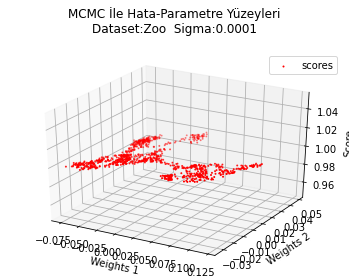

initial score:		1.0 
 max score:		1.0 
 acceptance ratio:		100.0 




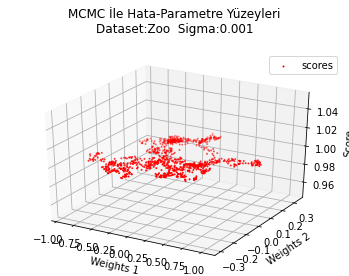

initial score:		1.0 
 max score:		1.0 
 acceptance ratio:		100.0 




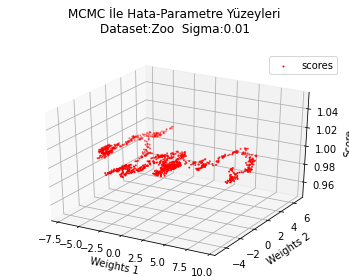

initial score:		1.0 
 max score:		1.0 
 acceptance ratio:		100.0 




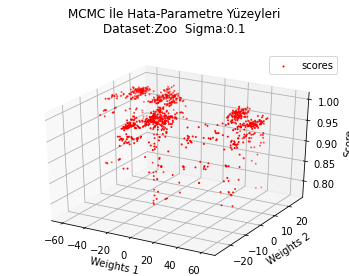

initial score:		1.0 
 max score:		1.0 
 acceptance ratio:		93.7 




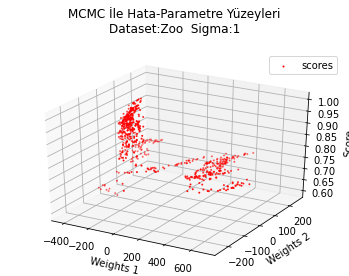

initial score:		1.0 
 max score:		1.0 
 acceptance ratio:		64.0 




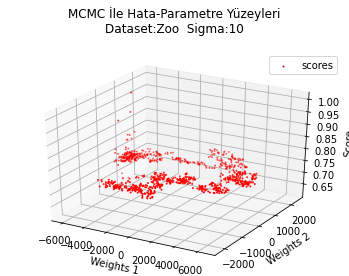

initial score:		1.0 
 max score:		1.0 
 acceptance ratio:		92.3 




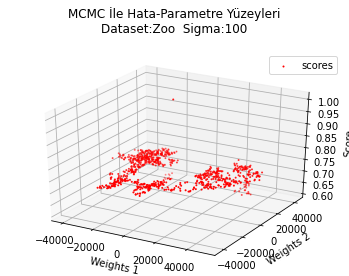

initial score:		1.0 
 max score:		1.0 
 acceptance ratio:		86.3 




In [42]:
plotAllScores("Zoo", sigmas, new_weights_list, new_scores_list, max_weigths_list, max_score_list, acceptance_ratios)